In [1]:
import numpy as np
import csv
import random
import math

In [2]:
def read_data(file1_path):
    dataset1_reader = csv.reader(open(file1_path, encoding='utf-8'))
    #dataset1_reader2 = csv.reader(open(file_path2, encoding='utf-8'))
    # define a list to store the data
    all_data_set = []

    # read the data into a list(name,sequence,class)
    for row in dataset1_reader:
        x=row[0].startswith('>')
        #print(row[0],x)
        if x:
            all_data_set.append([row[0],row[1],row[2]])
    
    return all_data_set

In [3]:
file1='HS_benchmark.csv'
file2='HS_indp.csv'
a=read_data(file1)
b=read_data(file2)
f1='SN_benchmark.csv'
f2='SN_indp.csv'
c=read_data(f1)
d=read_data(f2)

In [4]:
len(a)

990

In [5]:
def pair(seq,s,l,ind):
    ls=len(seq)
    is_pair=False
    index=None
    for i in range(ind,ls):
        if s=="A" and seq[i]=="U":
            is_pair=True
            index=i
        if s=="U" and seq[i]=="A":
            is_pair=True
            index=i
        if s=="C" and seq[i]=="G":
            is_pair=True
            index=i
        if s=="G" and seq[i]=="C":
            is_pair=True
            index=i
    return index,is_pair
            
            
            

In [6]:
def rnafold(seq):
    l=[]
    for i in range(len(seq)):
        l.append(0)
    for i in range(len(seq)):
        index,is_pair=pair(seq,seq[i],l,i)
        if is_pair:
            l[i]=1
            l[index]=2
    rnafold_seq= ""
    rna_seq=""
    for i in range(len(seq)):
        if l[i]==0:
            rnafold_seq=rnafold_seq+seq[i]+"."+" "
        elif l[i]==1:
            rnafold_seq=rnafold_seq+seq[i]+"("+" "
        elif l[i]==2:
            rnafold_seq=rnafold_seq+seq[i]+")"+" "
    for i in range(len(seq)):
        if l[i]==0:
            rna_seq=rna_seq+"."
        elif l[i]==1:
            rna_seq=rna_seq+"("
        elif l[i]==2:
            rna_seq=rna_seq+")"
    return rna_seq,rnafold_seq
            
            

In [7]:
x="GGGCUAUUAGCUCAGUUGGUUAGAGCGCACCCCUGAUAAGGGUGAGGUCGCUGAUUCGAAUUCAGCAUAGCCCA"
r,s=rnafold(x)
print(r)
print(s)

((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((((.(..))
G( G( G( C( U( A( U( U( A( G( C( U( C( A( G( U( U( G( G( U( U( A( G( A( G( C( G( C( A( C( C( C( C( U( G( A( U( A( A( G( G( G( U( G( A( G( G( U( C( G( C( U( G( A( U( U( C( G( A( A( U( U( C( A( G( C( A( U( A. G( C. C. C) A) 


In [8]:
a

[['>P1', 'GAUAAAAGAGUUACUUUGAUA', '1'],
 ['>P2', 'AAAUAAGCUAUCGGGCCCAUA', '1'],
 ['>P3', 'CCCGAAAAUGUUGGUUAUAUC', '1'],
 ['>P4', 'UAACUUAGCAUUAACCUUUUA', '1'],
 ['>P5', 'UGGUGUCUGCUACCAUGAGUG', '1'],
 ['>P6', 'UGUGCUCGUGUAAGCCCGGGG', '1'],
 ['>P7', 'UCACGUCCUUUGCAGGUCACC', '1'],
 ['>P8', 'GCUGGAUUUGUAGCUUAUCUU', '1'],
 ['>P9', 'CCCUGGGCAGUAUAGAGACGU', '1'],
 ['>P10', 'GGGCUACCUCUUCAAGAGGGC', '1'],
 ['>P11', 'CGGCAGCCGCUCUCCACUCCC', '1'],
 ['>P12', 'GCUUUUAACCUCUUGUUCUGA', '1'],
 ['>P13', 'UGGGGAAGGAUUCCGUGCCUU', '1'],
 ['>P14', 'GCCCACUGCUUAGGGGUCACC', '1'],
 ['>P15', 'AGCACACCCCUUAGCGCUUGC', '1'],
 ['>P16', 'GAGGGAGCUGUAGGAAUAGUG', '1'],
 ['>P17', 'AGGAUGUAGUUAGAUUCUGGC', '1'],
 ['>P18', 'UGUGGAUGGUUACAGCCCAUC', '1'],
 ['>P19', 'GCUAGAAGGUUCGAUGCCUCU', '1'],
 ['>P20', 'UGGACUUAGAUUCCCUGAAGA', '1'],
 ['>P21', 'GUCAUCUAGAUUAUGGGGAAA', '1'],
 ['>P22', 'AUCGAGUGUUUCGACCGAGUU', '1'],
 ['>P23', 'UAUACUAAAAUUGGAACGAUA', '1'],
 ['>P24', 'ACACGCAAAUUCGUGAAGCGU', '1'],
 ['>P25', 'GGCAAGCUGUUGAU

In [9]:
def vectorize_data(dataset):
    # get the maxmium length of the seqence
    max_seq_len = 0
    for item in dataset:
        if len(item[1])>max_seq_len:
            max_seq_len = len(item[1])
    #print(max_seq_len)
    #max_seq_len = 169
    # padding with "N" to max_seq_len
    for item in dataset:
        item[1] += "N" *(max_seq_len-len(item[1]))
 
    # tranformation of data set:one_hot encoding
    x_cast = {"A":[[1],[0],[0],[0]],"U":[[0],[1],[0],[0]],\
              "T":[[0],[1],[0],[0]],"G":[[0],[0],[1],[0]],\
              "C":[[0],[0],[0],[1]],"N":[[0],[0],[0],[0]]}
    y_cast = {"1": [1,0],"0":[0,1]} #TRUE:Mirtrons  FALSE:canonical microRN
    
    # define a list to store the vectorized data
    
    x=[]
    y=[]
    for item in dataset:
         data = []
         for char in item[1]:
             data.append(x_cast[char])
         #data= np.asarray(data)
    
         x.append(data)
         y.append(y_cast[item[2]])
    return x,y

In [10]:
def vectorize(dataset):
    # get the maxmium length of the seqence
    max_seq_len = 0
    for item in dataset:
        if len(item[1])>max_seq_len:
            max_seq_len = len(item[1])
    #print(max_seq_len)
    #max_seq_len = 169
    # padding with "N" to max_seq_len
    for item in dataset:
        item[1] += "N" *(max_seq_len-len(item[1]))
 
    # tranformation of data set:one_hot encoding
    x_cast = {"A":[[1],[0],[0],[0]],"U":[[0],[1],[0],[0]],\
              "T":[[0],[1],[0],[0]],"G":[[0],[0],[1],[0]],\
              "C":[[0],[0],[0],[1]],"N":[[0],[0],[0],[0]]}
    y_cast = {"1": [1,0],"0":[0,1]} #TRUE:Mirtrons  FALSE:canonical microRN
    
    # define a list to store the vectorized data
    
    x=[]
    y=[]
    for item in dataset:
         data = []
         for char in item[1]:
             if char == "A":
                    data.append(1)
                    data.append(0)
                    data.append(0)
                    data.append(0)
             elif char == "U":
                    data.append(0)
                    data.append(1)
                    data.append(0)
                    data.append(0)
             elif char == "G":
                    data.append(0)
                    data.append(0)
                    data.append(1)
                    data.append(0)
             elif char == "C":
                    data.append(0)
                    data.append(0)
                    data.append(0)
                    data.append(1)
             elif char == "N":
                    data.append(0)
                    data.append(0)
                    data.append(0)
                    data.append(0)
             #data.append(x_cast[char])
         #data= np.asarray(data)
    
         x.append(data)
         y.append(y_cast[item[2]])
    return x,y

In [11]:
x,y= vectorize_data(a)
x1,y1= vectorize_data(b)
x= np.array(x)
#x= np.reshape(x,(990,21,4))
#x1= np.reshape(x1,(200,21,4))
#y= np.reshape(y,(990,2,1))
#y1= np.reshape(y1,(200,2,1))
y=np.array(y)
x1= np.array(x1)
y1=np.array(y1)

xn,yn= vectorize(a)
x1n,y1n= vectorize(b)
xn= np.array(xn)
yn= np.array(yn)
xn= np.reshape(xn,(990,84,1))
x1n= np.array(x1n)
x1n= np.reshape(x1n,(200,84,1))
y1n= np.array(y1n)
print(xn.shape)
print(yn.shape)
print(x1n.shape)
print(y1n.shape)

x2,y2= vectorize_data(c)
x3,y3= vectorize_data(d)
x2= np.array(x2)
y2= np.array(y2)
x3= np.array(x3)
y3= np.array(y3)
print(x2.shape)
print(y2.shape)
print(x3.shape)
print(y3.shape)
print(x.shape)
print(y.shape)
print(x1.shape)
print(y1.shape)

(990, 84, 1)
(990, 2)
(200, 84, 1)
(200, 2)
(628, 31, 4, 1)
(628, 2)
(200, 31, 4, 1)
(200, 2)
(990, 21, 4, 1)
(990, 2)
(200, 21, 4, 1)
(200, 2)


In [17]:
import keras
np.random.seed(1337)
from keras.models import Sequential
from keras.layers import Dense,Conv2D,Flatten,MaxPooling2D,Convolution2D,Concatenate,concatenate
from keras.optimizers import Adam ,RMSprop, SGD
from keras.models import model_from_json
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc


In [27]:
def make_model(n,f,d,lr):
    
    input1= keras.layers.Input(shape=(31,4,1))
    x=[]
    for i in range(n):
        #print(i)
        c= Conv2D(32, (f,4), padding="valid", activation="relu")(input1)
        x.append(MaxPooling2D(pool_size=(31-f+1,1))(c))
        f=f+1
        #print(f)
    added = concatenate(x)
    
    out=Flatten()(added)
    out=Dense(320, activation='relu')(out)
    out=keras.layers.Dropout(d)(out)
    out=Dense(2,activation="softmax")(out)
    model = keras.models.Model(inputs=[input1], outputs=out)
    #model.load_weights("u31.h5")
    o=Adam(lr=lr)
    #sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
    model.compile(optimizer=o, loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model     

In [28]:
def make_model21(n,f,d,lr):
    input1= keras.layers.Input(shape=(21,4,1))
    x=[]
    for i in range(n):
        #print(i)
        c= Conv2D(32, (f,4), padding="valid", activation="relu")(input1)
        x.append(MaxPooling2D(pool_size=(21-f+1,1))(c))
        f=f+1
        #print(f)
    added = concatenate(x)
    
    out=Flatten()(added)
    out=Dense(320, activation='relu')(out)
    out=keras.layers.Dropout(d)(out)
    out=Dense(2,activation="softmax")(out)
    model = keras.models.Model(inputs=[input1], outputs=out)
    #model.load_weights("u31.h5")
    o=Adam(lr=lr)
    model.compile(optimizer=o, loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model     

In [29]:
def predict_comparision(y_predict,y_test):
    tp,tn,fp,fn = 0,0,0,0
    y_predict_index = np.argmax(y_predict,axis = 1)
    y_test_index = np.argmax(y_test,axis = 1)
    m = len(y_predict_index)
    for i in range(m):
        if y_predict_index[i] == 0:
            if y_test_index[i]==0:
                tp +=1    
            else:
                fp +=1
        else:
            if y_test_index[i]==1:
                tn +=1
            else:
                fn += 1 
    return tp,tn,fp,fn

In [18]:
from keras.backend import manual_variable_initialization 
manual_variable_initialization(True)
json_file = open('u31.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("u31.h5")
#m= make_model(9,9,0.4,0.0001)
o=Adam(lr=0.0001)
loaded_model.compile(optimizer=o, loss='categorical_crossentropy', metrics=['accuracy'])
h=loaded_model.fit(x2, y2, batch_size=10,validation_split=0.1, epochs=100,shuffle=False)
print(h)

scores = loaded_model.evaluate(x3, y3, verbose=0)
predict_result = loaded_model.predict(x3).ravel()
fpr,tpr,thr= roc_curve(y3,predict_result)
#print("%s: %.2f%%" % (m.metrics_names[1], scores[1]*100))
print("%s: %.2f%%" % (loaded_model.metrics_names[1], scores[2]*100))
plt.figure()
plt.plot(fpr,tpr)
#plt.plot(f1,t1,label='H_200(AUROC = %0.3f)' % AUC2)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.02])
plt.grid(True,'both')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
#plt.savefig('ROC.png')
plt.show()

Train on 565 samples, validate on 63 samples
Epoch 1/100
565/565 [==============================] - 1s 1ms/step - loss: 0.0532 - accuracy: 0.9823 - val_loss: 0.4280 - val_accuracy: 0.7937
Epoch 2/100
565/565 [==============================] - 0s 421us/step - loss: 0.0513 - accuracy: 0.9982 - val_loss: 0.6625 - val_accuracy: 0.7460
Epoch 3/100
565/565 [==============================] - 0s 384us/step - loss: 0.0461 - accuracy: 1.0000 - val_loss: 0.6347 - val_accuracy: 0.7778
Epoch 4/100
565/565 [==============================] - 0s 417us/step - loss: 0.0420 - accuracy: 1.0000 - val_loss: 0.6415 - val_accuracy: 0.7619
Epoch 5/100
565/565 [==============================] - 0s 418us/step - loss: 0.0352 - accuracy: 1.0000 - val_loss: 0.7011 - val_accuracy: 0.7302
Epoch 6/100
565/565 [==============================] - 0s 417us/step - loss: 0.0305 - accuracy: 1.0000 - val_loss: 0.7471 - val_accuracy: 0.6984
Epoch 7/100
565/565 [==============================] - 0s 387us/step - loss: 0.0302 - a

565/565 [==============================] - 0s 425us/step - loss: 6.0179e-04 - accuracy: 1.0000 - val_loss: 1.9051 - val_accuracy: 0.5873
Epoch 57/100
565/565 [==============================] - 0s 369us/step - loss: 5.8256e-04 - accuracy: 1.0000 - val_loss: 1.8989 - val_accuracy: 0.5873
Epoch 58/100
565/565 [==============================] - 0s 378us/step - loss: 5.9246e-04 - accuracy: 1.0000 - val_loss: 1.9021 - val_accuracy: 0.5873
Epoch 59/100
565/565 [==============================] - 0s 378us/step - loss: 5.9660e-04 - accuracy: 1.0000 - val_loss: 1.9281 - val_accuracy: 0.5873
Epoch 60/100
565/565 [==============================] - 0s 380us/step - loss: 4.9684e-04 - accuracy: 1.0000 - val_loss: 1.9818 - val_accuracy: 0.5873
Epoch 61/100
565/565 [==============================] - 0s 379us/step - loss: 4.3752e-04 - accuracy: 1.0000 - val_loss: 1.9353 - val_accuracy: 0.5873
Epoch 62/100
565/565 [==============================] - 0s 381us/step - loss: 4.4076e-04 - accuracy: 1.0000 - val

ValueError: multilabel-indicator format is not supported

In [29]:
#print(h.history['accuracy'])
predict_result = m.predict(x3)
tp,tn,fp,fn = predict_comparision(predict_result,y3)
print(tp,tn,fp,fn)
sensitivity = float(tp)/(float(tp) + float(fn))
specifity = float(tn)/(float(tn) + float(fp))
precision = float(tp)/(float(tp) + float(fp))
accuracy = (float(tp) + float(tn))/(float(tp) + float(fp) + \
                                            float(fn) + float(tn))
f1_score = (2 * (precision * sensitivity)) / (precision + sensitivity)
mcc = ((float(tp) * float(tn)) - (float(fp) * float(fn))) /\
                math.sqrt((float(tp) + float(fp)) * (float(tp) + float(fn))*\
                (float(tn) + float(fp)) * (float(tn) + float(fn)))
print(sensitivity,specifity,accuracy,mcc)

70 79 21 30
0.7 0.79 0.745 0.49199663779539793


In [ ]:
import csv
from keras.backend import manual_variable_initialization 
manual_variable_initialization(True)
kfold = KFold(10, True, 1)
F= [3,5,7,9]
N= [5,7,9,10,11]
L= [0.001,0.0001,0.0005]
D= [0.4,0.5,0.6]
B = [10, 20, 40, 60, 80, 100]
E = [10, 50, 100, 200]

#np.random.seed(1337)
#writer = csv.writer(response)
#writer.writerow(['', 'Name', 'Amount','Group', 'Semester', 'Fee'])
flt=[] 
no=[]
ac=[]
lrt=[]
drp=[]
btch=[]
epch=[]
maxx=0
for n in N:
    for f in F:
        for d in D:
            for l in L:    
                accu=0
                for train, test in kfold.split(x2):
                    xtr, xts = x2[train], x2[test]
                    ytr, yts = y2[train], y2[test]
                    
                    m= make_model(n,f,d,l)
                    m.fit(xtr, ytr, batch_size=10,validation_split=0.1, epochs=100,shuffle=False)
                    scores = m.evaluate(xts, yts, verbose=0)
                    accu=accu+scores[1]*100
                print("%s: %.2f%%" % (m.metrics_names[1], accu/10))
                if maxx<accu/10:
                    maxx=accu/10
                flt.append(f)
                no.append(n)
                drp.append(d)
                lrt.append(l)
            ac.append(accu/10)
            print(n,"\t",f,"\t",d,"\t",l,"\t",accu/10,"\n")

Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 982us/step - loss: 1.4316 - accuracy: 0.6122 - val_loss: 0.6000 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 357us/step - loss: 0.7460 - accuracy: 0.3445 - val_loss: 0.5033 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 303us/step - loss: 0.7727 - accuracy: 0.2953 - val_loss: 0.4520 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 304us/step - loss: 0.7911 - accuracy: 0.2106 - val_loss: 0.6566 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 317us/step - loss: 0.7249 - accuracy: 0.2756 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 304us/step - loss: 0.7033 - accuracy: 0.5551 - val_loss: 0.7296 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 311us/step - loss: 

508/508 [==============================] - 0s 313us/step - loss: 0.3828 - accuracy: 0.7913 - val_loss: 0.8807 - val_accuracy: 0.6140
Epoch 57/100
508/508 [==============================] - 0s 296us/step - loss: 0.3690 - accuracy: 0.8130 - val_loss: 0.9563 - val_accuracy: 0.6140
Epoch 58/100
508/508 [==============================] - 0s 294us/step - loss: 0.3322 - accuracy: 0.8327 - val_loss: 0.9976 - val_accuracy: 0.6140
Epoch 59/100
508/508 [==============================] - 0s 298us/step - loss: 0.3038 - accuracy: 0.8445 - val_loss: 1.0465 - val_accuracy: 0.6316
Epoch 60/100
508/508 [==============================] - 0s 289us/step - loss: 0.2851 - accuracy: 0.8583 - val_loss: 1.0652 - val_accuracy: 0.6316
Epoch 61/100
508/508 [==============================] - 0s 285us/step - loss: 0.2569 - accuracy: 0.8878 - val_loss: 1.0031 - val_accuracy: 0.6491
Epoch 62/100
508/508 [==============================] - 0s 341us/step - loss: 0.2598 - accuracy: 0.8819 - val_loss: 1.0538 - val_accuracy

Epoch 12/100
508/508 [==============================] - 0s 282us/step - loss: 0.7034 - accuracy: 0.5531 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 275us/step - loss: 0.6964 - accuracy: 0.5571 - val_loss: 0.7376 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 277us/step - loss: 0.6957 - accuracy: 0.5571 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 286us/step - loss: 0.6950 - accuracy: 0.5571 - val_loss: 0.7435 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 279us/step - loss: 0.6950 - accuracy: 0.5571 - val_loss: 0.7487 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 291us/step - loss: 0.6931 - accuracy: 0.5571 - val_loss: 0.7421 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 304us/step - loss: 0.6971 - accuracy: 0.5

508/508 [==============================] - 0s 281us/step - loss: 0.1245 - accuracy: 0.9685 - val_loss: 1.1673 - val_accuracy: 0.6842
Epoch 68/100
508/508 [==============================] - 0s 276us/step - loss: 0.1099 - accuracy: 0.9803 - val_loss: 1.1565 - val_accuracy: 0.7193
Epoch 69/100
508/508 [==============================] - 0s 274us/step - loss: 0.0944 - accuracy: 0.9843 - val_loss: 1.3179 - val_accuracy: 0.6667
Epoch 70/100
508/508 [==============================] - 0s 272us/step - loss: 0.0828 - accuracy: 0.9843 - val_loss: 1.6010 - val_accuracy: 0.6140
Epoch 71/100
508/508 [==============================] - 0s 276us/step - loss: 0.0709 - accuracy: 0.9902 - val_loss: 1.5720 - val_accuracy: 0.6140
Epoch 72/100
508/508 [==============================] - 0s 274us/step - loss: 0.0567 - accuracy: 0.9961 - val_loss: 1.8242 - val_accuracy: 0.6140
Epoch 73/100
508/508 [==============================] - 0s 293us/step - loss: 0.0440 - accuracy: 1.0000 - val_loss: 1.8091 - val_accuracy

508/508 [==============================] - 0s 277us/step - loss: 0.6941 - accuracy: 0.5531 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 274us/step - loss: 0.6946 - accuracy: 0.5531 - val_loss: 0.7504 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 278us/step - loss: 0.6936 - accuracy: 0.5531 - val_loss: 0.7518 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 281us/step - loss: 0.6933 - accuracy: 0.5531 - val_loss: 0.7554 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 292us/step - loss: 0.6927 - accuracy: 0.5531 - val_loss: 0.7543 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 287us/step - loss: 0.6921 - accuracy: 0.5531 - val_loss: 0.7539 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 286us/step - loss: 0.6934 - accuracy: 0.5531 - val_los

Epoch 78/100
508/508 [==============================] - 0s 274us/step - loss: 0.0841 - accuracy: 0.9803 - val_loss: 1.1019 - val_accuracy: 0.6842
Epoch 79/100
508/508 [==============================] - 0s 284us/step - loss: 0.0685 - accuracy: 0.9882 - val_loss: 1.2678 - val_accuracy: 0.6842
Epoch 80/100
508/508 [==============================] - 0s 294us/step - loss: 0.0736 - accuracy: 0.9764 - val_loss: 1.1242 - val_accuracy: 0.6842
Epoch 81/100
508/508 [==============================] - 0s 281us/step - loss: 0.0623 - accuracy: 0.9902 - val_loss: 1.2417 - val_accuracy: 0.6667
Epoch 82/100
508/508 [==============================] - 0s 274us/step - loss: 0.0553 - accuracy: 0.9921 - val_loss: 1.4131 - val_accuracy: 0.6491
Epoch 83/100
508/508 [==============================] - 0s 280us/step - loss: 0.0499 - accuracy: 0.9882 - val_loss: 1.4138 - val_accuracy: 0.6667
Epoch 84/100
508/508 [==============================] - 0s 280us/step - loss: 0.0403 - accuracy: 0.9921 - val_loss: 1.5010 -

508/508 [==============================] - 0s 285us/step - loss: 0.6812 - accuracy: 0.6122 - val_loss: 0.7086 - val_accuracy: 0.2632
Epoch 34/100
508/508 [==============================] - 0s 280us/step - loss: 0.6905 - accuracy: 0.5768 - val_loss: 0.7527 - val_accuracy: 0.1404
Epoch 35/100
508/508 [==============================] - 0s 276us/step - loss: 0.6760 - accuracy: 0.6181 - val_loss: 0.7262 - val_accuracy: 0.2632
Epoch 36/100
508/508 [==============================] - 0s 284us/step - loss: 0.6785 - accuracy: 0.6043 - val_loss: 0.7187 - val_accuracy: 0.2632
Epoch 37/100
508/508 [==============================] - 0s 279us/step - loss: 0.6703 - accuracy: 0.6063 - val_loss: 0.7137 - val_accuracy: 0.2456
Epoch 38/100
508/508 [==============================] - 0s 284us/step - loss: 0.6621 - accuracy: 0.6142 - val_loss: 0.6838 - val_accuracy: 0.3333
Epoch 39/100
508/508 [==============================] - 0s 294us/step - loss: 0.6577 - accuracy: 0.6142 - val_loss: 0.7031 - val_accuracy

508/508 [==============================] - 0s 293us/step - loss: 0.0142 - accuracy: 0.9980 - val_loss: 4.6507 - val_accuracy: 0.4211
Epoch 90/100
508/508 [==============================] - 0s 282us/step - loss: 0.0122 - accuracy: 0.9980 - val_loss: 4.5521 - val_accuracy: 0.4386
Epoch 91/100
508/508 [==============================] - 0s 277us/step - loss: 0.0111 - accuracy: 1.0000 - val_loss: 4.5473 - val_accuracy: 0.4386
Epoch 92/100
508/508 [==============================] - 0s 267us/step - loss: 0.0090 - accuracy: 1.0000 - val_loss: 4.7461 - val_accuracy: 0.4386
Epoch 93/100
508/508 [==============================] - 0s 287us/step - loss: 0.0074 - accuracy: 1.0000 - val_loss: 5.3261 - val_accuracy: 0.4035
Epoch 94/100
508/508 [==============================] - 0s 289us/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 4.7706 - val_accuracy: 0.4386
Epoch 95/100
508/508 [==============================] - 0s 283us/step - loss: 0.0098 - accuracy: 1.0000 - val_loss: 5.2686 - val_accuracy

508/508 [==============================] - 0s 280us/step - loss: 0.6730 - accuracy: 0.6083 - val_loss: 0.7202 - val_accuracy: 0.2807
Epoch 45/100
508/508 [==============================] - 0s 286us/step - loss: 0.6565 - accuracy: 0.6417 - val_loss: 0.6501 - val_accuracy: 0.4386
Epoch 46/100
508/508 [==============================] - 0s 280us/step - loss: 0.6595 - accuracy: 0.6220 - val_loss: 0.5916 - val_accuracy: 0.6140
Epoch 47/100
508/508 [==============================] - 0s 283us/step - loss: 0.6564 - accuracy: 0.6122 - val_loss: 0.6927 - val_accuracy: 0.2982
Epoch 48/100
508/508 [==============================] - 0s 277us/step - loss: 0.6430 - accuracy: 0.6398 - val_loss: 0.6912 - val_accuracy: 0.3509
Epoch 49/100
508/508 [==============================] - 0s 282us/step - loss: 0.6269 - accuracy: 0.6594 - val_loss: 0.6519 - val_accuracy: 0.4211
Epoch 50/100
508/508 [==============================] - 0s 279us/step - loss: 0.6247 - accuracy: 0.6555 - val_loss: 0.6699 - val_accuracy

508/508 [==============================] - 0s 287us/step - loss: 0.0040 - accuracy: 1.0000 - val_loss: 3.4920 - val_accuracy: 0.4211
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 878us/step - loss: 1.4060 - accuracy: 0.6319 - val_loss: 0.4997 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 286us/step - loss: 0.7932 - accuracy: 0.3031 - val_loss: 0.5204 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 274us/step - loss: 0.7829 - accuracy: 0.1850 - val_loss: 0.6845 - val_accuracy: 0.9825
Epoch 4/100
508/508 [==============================] - 0s 271us/step - loss: 0.7195 - accuracy: 0.4055 - val_loss: 0.6528 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 287us/step - loss: 0.7314 - accuracy: 0.3012 - val_loss: 0.6844 - val_accuracy: 0.9825
Epoch 6/100
508/508 [==============================] - 0s 267us/step - loss: 0.7010 - accuracy: 0

508/508 [==============================] - 0s 299us/step - loss: 0.3415 - accuracy: 0.8484 - val_loss: 1.0723 - val_accuracy: 0.6316
Epoch 56/100
508/508 [==============================] - 0s 279us/step - loss: 0.3247 - accuracy: 0.8543 - val_loss: 1.0350 - val_accuracy: 0.6316
Epoch 57/100
508/508 [==============================] - 0s 279us/step - loss: 0.2967 - accuracy: 0.8720 - val_loss: 0.9792 - val_accuracy: 0.6667
Epoch 58/100
508/508 [==============================] - 0s 272us/step - loss: 0.2998 - accuracy: 0.8720 - val_loss: 1.0157 - val_accuracy: 0.7018
Epoch 59/100
508/508 [==============================] - 0s 276us/step - loss: 0.2854 - accuracy: 0.8740 - val_loss: 1.1525 - val_accuracy: 0.6491
Epoch 60/100
508/508 [==============================] - 0s 269us/step - loss: 0.2737 - accuracy: 0.8937 - val_loss: 1.2869 - val_accuracy: 0.5263
Epoch 61/100
508/508 [==============================] - 0s 272us/step - loss: 0.2625 - accuracy: 0.8957 - val_loss: 1.5140 - val_accuracy

Epoch 11/100
508/508 [==============================] - 0s 390us/step - loss: 0.6971 - accuracy: 0.5433 - val_loss: 0.7219 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 298us/step - loss: 0.6958 - accuracy: 0.5433 - val_loss: 0.7196 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 284us/step - loss: 0.6971 - accuracy: 0.5433 - val_loss: 0.7199 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 288us/step - loss: 0.6980 - accuracy: 0.5433 - val_loss: 0.7288 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 282us/step - loss: 0.6962 - accuracy: 0.5433 - val_loss: 0.7300 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 274us/step - loss: 0.6968 - accuracy: 0.5433 - val_loss: 0.7311 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 279us/step - loss: 0.6961 - accuracy: 0.5

508/508 [==============================] - 0s 298us/step - loss: 0.1303 - accuracy: 0.9488 - val_loss: 1.3658 - val_accuracy: 0.6667
Epoch 67/100
508/508 [==============================] - 0s 279us/step - loss: 0.1196 - accuracy: 0.9508 - val_loss: 1.3026 - val_accuracy: 0.6842
Epoch 68/100
508/508 [==============================] - 0s 292us/step - loss: 0.1053 - accuracy: 0.9567 - val_loss: 1.4647 - val_accuracy: 0.6842
Epoch 69/100
508/508 [==============================] - 0s 285us/step - loss: 0.0954 - accuracy: 0.9646 - val_loss: 1.5286 - val_accuracy: 0.6842
Epoch 70/100
508/508 [==============================] - 0s 300us/step - loss: 0.0933 - accuracy: 0.9705 - val_loss: 1.4588 - val_accuracy: 0.6842
Epoch 71/100
508/508 [==============================] - 0s 284us/step - loss: 0.0792 - accuracy: 0.9724 - val_loss: 1.8081 - val_accuracy: 0.6842
Epoch 72/100
508/508 [==============================] - 0s 294us/step - loss: 0.0699 - accuracy: 0.9843 - val_loss: 2.0441 - val_accuracy

508/508 [==============================] - 0s 292us/step - loss: 0.6925 - accuracy: 0.5591 - val_loss: 0.7592 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 274us/step - loss: 0.6925 - accuracy: 0.5591 - val_loss: 0.7609 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 281us/step - loss: 0.6920 - accuracy: 0.5591 - val_loss: 0.7618 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 277us/step - loss: 0.6917 - accuracy: 0.5591 - val_loss: 0.7642 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 280us/step - loss: 0.6909 - accuracy: 0.5591 - val_loss: 0.7640 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 289us/step - loss: 0.6944 - accuracy: 0.5591 - val_loss: 0.7634 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 286us/step - loss: 0.7034 - accuracy: 0.5591 - val_los

508/508 [==============================] - 0s 297us/step - loss: 0.1331 - accuracy: 0.9606 - val_loss: 1.4182 - val_accuracy: 0.7368
Epoch 77/100
508/508 [==============================] - 0s 289us/step - loss: 0.1220 - accuracy: 0.9626 - val_loss: 1.3775 - val_accuracy: 0.7193
Epoch 78/100
508/508 [==============================] - 0s 293us/step - loss: 0.1052 - accuracy: 0.9705 - val_loss: 1.5525 - val_accuracy: 0.7193
Epoch 79/100
508/508 [==============================] - 0s 285us/step - loss: 0.0979 - accuracy: 0.9724 - val_loss: 1.6362 - val_accuracy: 0.7018
Epoch 80/100
508/508 [==============================] - 0s 299us/step - loss: 0.0874 - accuracy: 0.9764 - val_loss: 1.6791 - val_accuracy: 0.7018
Epoch 81/100
508/508 [==============================] - 0s 285us/step - loss: 0.0819 - accuracy: 0.9764 - val_loss: 1.7789 - val_accuracy: 0.7193
Epoch 82/100
508/508 [==============================] - 0s 285us/step - loss: 0.0717 - accuracy: 0.9823 - val_loss: 1.6881 - val_accuracy

509/509 [==============================] - 0s 297us/step - loss: 0.6867 - accuracy: 0.5501 - val_loss: 0.7620 - val_accuracy: 0.0175
Epoch 32/100
509/509 [==============================] - 0s 308us/step - loss: 0.6773 - accuracy: 0.5540 - val_loss: 0.7842 - val_accuracy: 0.0175
Epoch 33/100
509/509 [==============================] - 0s 293us/step - loss: 0.6695 - accuracy: 0.5580 - val_loss: 0.7786 - val_accuracy: 0.0175
Epoch 34/100
509/509 [==============================] - 0s 297us/step - loss: 0.6683 - accuracy: 0.5619 - val_loss: 0.7825 - val_accuracy: 0.1053
Epoch 35/100
509/509 [==============================] - 0s 302us/step - loss: 0.6601 - accuracy: 0.5619 - val_loss: 0.7750 - val_accuracy: 0.2281
Epoch 36/100
509/509 [==============================] - 0s 287us/step - loss: 0.6572 - accuracy: 0.5599 - val_loss: 0.7994 - val_accuracy: 0.1930
Epoch 37/100
509/509 [==============================] - 0s 283us/step - loss: 0.6393 - accuracy: 0.5796 - val_loss: 0.7578 - val_accuracy

509/509 [==============================] - 0s 294us/step - loss: 0.0525 - accuracy: 0.9921 - val_loss: 2.4194 - val_accuracy: 0.6491
Epoch 88/100
509/509 [==============================] - 0s 299us/step - loss: 0.0438 - accuracy: 0.9941 - val_loss: 2.5997 - val_accuracy: 0.6140
Epoch 89/100
509/509 [==============================] - 0s 289us/step - loss: 0.0430 - accuracy: 0.9921 - val_loss: 2.4733 - val_accuracy: 0.6316
Epoch 90/100
509/509 [==============================] - 0s 279us/step - loss: 0.0412 - accuracy: 0.9921 - val_loss: 2.3993 - val_accuracy: 0.6491
Epoch 91/100
509/509 [==============================] - 0s 287us/step - loss: 0.0360 - accuracy: 0.9980 - val_loss: 2.3858 - val_accuracy: 0.6491
Epoch 92/100
509/509 [==============================] - 0s 285us/step - loss: 0.0349 - accuracy: 0.9961 - val_loss: 1.9276 - val_accuracy: 0.7193
Epoch 93/100
509/509 [==============================] - 0s 273us/step - loss: 0.0339 - accuracy: 1.0000 - val_loss: 2.6279 - val_accuracy

509/509 [==============================] - 0s 304us/step - loss: 0.6061 - accuracy: 0.6208 - val_loss: 0.7254 - val_accuracy: 0.6316
Epoch 43/100
509/509 [==============================] - 0s 306us/step - loss: 0.5950 - accuracy: 0.6326 - val_loss: 0.7102 - val_accuracy: 0.6140
Epoch 44/100
509/509 [==============================] - 0s 298us/step - loss: 0.5760 - accuracy: 0.6542 - val_loss: 0.6467 - val_accuracy: 0.7018
Epoch 45/100
509/509 [==============================] - 0s 293us/step - loss: 0.5689 - accuracy: 0.6699 - val_loss: 0.6978 - val_accuracy: 0.6667
Epoch 46/100
509/509 [==============================] - 0s 302us/step - loss: 0.5430 - accuracy: 0.6857 - val_loss: 0.6104 - val_accuracy: 0.7193
Epoch 47/100
509/509 [==============================] - 0s 307us/step - loss: 0.5328 - accuracy: 0.6955 - val_loss: 0.6942 - val_accuracy: 0.6491
Epoch 48/100
509/509 [==============================] - 0s 285us/step - loss: 0.5069 - accuracy: 0.7348 - val_loss: 0.6641 - val_accuracy

509/509 [==============================] - 0s 294us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 4.3919 - val_accuracy: 0.4912
Epoch 99/100
509/509 [==============================] - 0s 283us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 4.3058 - val_accuracy: 0.4912
Epoch 100/100
509/509 [==============================] - 0s 293us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 4.1368 - val_accuracy: 0.4912
accuracy: 59.23%
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 972us/step - loss: 0.8919 - accuracy: 0.5531 - val_loss: 1.0692 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 293us/step - loss: 0.7209 - accuracy: 0.5571 - val_loss: 0.7980 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 278us/step - loss: 0.7530 - accuracy: 0.4764 - val_loss: 0.7467 - val_accuracy: 0.0175
Epoch 4/100
508/508 [==============================] - 0s 284us/step 

508/508 [==============================] - 0s 312us/step - loss: 0.6869 - accuracy: 0.5669 - val_loss: 0.7767 - val_accuracy: 0.0702
Epoch 54/100
508/508 [==============================] - 0s 295us/step - loss: 0.6816 - accuracy: 0.5846 - val_loss: 0.7711 - val_accuracy: 0.1053
Epoch 55/100
508/508 [==============================] - 0s 295us/step - loss: 0.6829 - accuracy: 0.5650 - val_loss: 0.7703 - val_accuracy: 0.1053
Epoch 56/100
508/508 [==============================] - 0s 291us/step - loss: 0.6861 - accuracy: 0.5748 - val_loss: 0.7698 - val_accuracy: 0.1053
Epoch 57/100
508/508 [==============================] - 0s 369us/step - loss: 0.6805 - accuracy: 0.5827 - val_loss: 0.7678 - val_accuracy: 0.1228
Epoch 58/100
508/508 [==============================] - 0s 296us/step - loss: 0.6790 - accuracy: 0.5886 - val_loss: 0.7649 - val_accuracy: 0.1579
Epoch 59/100
508/508 [==============================] - 0s 291us/step - loss: 0.6806 - accuracy: 0.5945 - val_loss: 0.7720 - val_accuracy

Epoch 9/100
508/508 [==============================] - 0s 302us/step - loss: 0.7389 - accuracy: 0.4449 - val_loss: 0.7481 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 292us/step - loss: 0.7267 - accuracy: 0.5000 - val_loss: 0.7429 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 301us/step - loss: 0.7275 - accuracy: 0.4744 - val_loss: 0.7538 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 293us/step - loss: 0.7284 - accuracy: 0.4783 - val_loss: 0.7583 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 306us/step - loss: 0.7264 - accuracy: 0.4902 - val_loss: 0.7615 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 296us/step - loss: 0.7227 - accuracy: 0.5020 - val_loss: 0.7600 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 299us/step - loss: 0.7215 - accuracy: 0.50

Epoch 64/100
508/508 [==============================] - 0s 300us/step - loss: 0.6759 - accuracy: 0.5846 - val_loss: 0.7631 - val_accuracy: 0.1930
Epoch 65/100
508/508 [==============================] - 0s 279us/step - loss: 0.6769 - accuracy: 0.5787 - val_loss: 0.7656 - val_accuracy: 0.1754
Epoch 66/100
508/508 [==============================] - 0s 296us/step - loss: 0.6722 - accuracy: 0.5925 - val_loss: 0.7617 - val_accuracy: 0.1930
Epoch 67/100
508/508 [==============================] - 0s 286us/step - loss: 0.6740 - accuracy: 0.5886 - val_loss: 0.7655 - val_accuracy: 0.1930
Epoch 68/100
508/508 [==============================] - 0s 283us/step - loss: 0.6728 - accuracy: 0.5906 - val_loss: 0.7650 - val_accuracy: 0.1930
Epoch 69/100
508/508 [==============================] - 0s 284us/step - loss: 0.6692 - accuracy: 0.6122 - val_loss: 0.7586 - val_accuracy: 0.1930
Epoch 70/100
508/508 [==============================] - 0s 297us/step - loss: 0.6710 - accuracy: 0.6083 - val_loss: 0.7622 -

508/508 [==============================] - 0s 300us/step - loss: 0.7177 - accuracy: 0.4823 - val_loss: 0.7487 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 295us/step - loss: 0.7217 - accuracy: 0.4685 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 306us/step - loss: 0.7201 - accuracy: 0.4528 - val_loss: 0.7483 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 311us/step - loss: 0.7154 - accuracy: 0.4882 - val_loss: 0.7509 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 311us/step - loss: 0.7139 - accuracy: 0.4961 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 300us/step - loss: 0.7157 - accuracy: 0.4941 - val_loss: 0.7529 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 301us/step - loss: 0.7142 - accuracy: 0.4941 - val_los

508/508 [==============================] - 0s 321us/step - loss: 0.6746 - accuracy: 0.5925 - val_loss: 0.7491 - val_accuracy: 0.2105
Epoch 75/100
508/508 [==============================] - 0s 297us/step - loss: 0.6711 - accuracy: 0.5728 - val_loss: 0.7536 - val_accuracy: 0.2105
Epoch 76/100
508/508 [==============================] - 0s 294us/step - loss: 0.6727 - accuracy: 0.5846 - val_loss: 0.7496 - val_accuracy: 0.2281
Epoch 77/100
508/508 [==============================] - 0s 301us/step - loss: 0.6708 - accuracy: 0.6004 - val_loss: 0.7504 - val_accuracy: 0.2281
Epoch 78/100
508/508 [==============================] - 0s 295us/step - loss: 0.6707 - accuracy: 0.5965 - val_loss: 0.7552 - val_accuracy: 0.2105
Epoch 79/100
508/508 [==============================] - 0s 310us/step - loss: 0.6699 - accuracy: 0.6043 - val_loss: 0.7499 - val_accuracy: 0.2456
Epoch 80/100
508/508 [==============================] - 0s 300us/step - loss: 0.6643 - accuracy: 0.6004 - val_loss: 0.7447 - val_accuracy

508/508 [==============================] - 0s 308us/step - loss: 0.6974 - accuracy: 0.5630 - val_loss: 0.7920 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 301us/step - loss: 0.6952 - accuracy: 0.5630 - val_loss: 0.7960 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 308us/step - loss: 0.6953 - accuracy: 0.5669 - val_loss: 0.7981 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 289us/step - loss: 0.6920 - accuracy: 0.5650 - val_loss: 0.7955 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 287us/step - loss: 0.6954 - accuracy: 0.5669 - val_loss: 0.8010 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 287us/step - loss: 0.6933 - accuracy: 0.5689 - val_loss: 0.8022 - val_accuracy: 0.0000e+00
Epoch 35/100
508/508 [==============================] - 0s 296us/step - loss: 0.6917 - accuracy: 0.5630 - val_los

508/508 [==============================] - 0s 292us/step - loss: 0.6578 - accuracy: 0.6201 - val_loss: 0.7725 - val_accuracy: 0.2105
Epoch 85/100
508/508 [==============================] - 0s 301us/step - loss: 0.6568 - accuracy: 0.6161 - val_loss: 0.7756 - val_accuracy: 0.1754
Epoch 86/100
508/508 [==============================] - 0s 308us/step - loss: 0.6539 - accuracy: 0.6142 - val_loss: 0.7723 - val_accuracy: 0.2105
Epoch 87/100
508/508 [==============================] - 0s 370us/step - loss: 0.6550 - accuracy: 0.6319 - val_loss: 0.7726 - val_accuracy: 0.2105
Epoch 88/100
508/508 [==============================] - 0s 287us/step - loss: 0.6512 - accuracy: 0.6280 - val_loss: 0.7730 - val_accuracy: 0.2105
Epoch 89/100
508/508 [==============================] - 0s 288us/step - loss: 0.6485 - accuracy: 0.6280 - val_loss: 0.7721 - val_accuracy: 0.2456
Epoch 90/100
508/508 [==============================] - 0s 303us/step - loss: 0.6486 - accuracy: 0.6417 - val_loss: 0.7692 - val_accuracy

508/508 [==============================] - 0s 306us/step - loss: 0.6962 - accuracy: 0.5531 - val_loss: 0.7737 - val_accuracy: 0.0000e+00
Epoch 40/100
508/508 [==============================] - 0s 295us/step - loss: 0.6930 - accuracy: 0.5551 - val_loss: 0.7738 - val_accuracy: 0.0000e+00
Epoch 41/100
508/508 [==============================] - 0s 286us/step - loss: 0.6909 - accuracy: 0.5492 - val_loss: 0.7742 - val_accuracy: 0.0000e+00
Epoch 42/100
508/508 [==============================] - 0s 300us/step - loss: 0.6930 - accuracy: 0.5571 - val_loss: 0.7695 - val_accuracy: 0.0000e+00
Epoch 43/100
508/508 [==============================] - 0s 290us/step - loss: 0.6907 - accuracy: 0.5591 - val_loss: 0.7674 - val_accuracy: 0.0175
Epoch 44/100
508/508 [==============================] - 0s 304us/step - loss: 0.6909 - accuracy: 0.5610 - val_loss: 0.7727 - val_accuracy: 0.0000e+00
Epoch 45/100
508/508 [==============================] - 0s 306us/step - loss: 0.6920 - accuracy: 0.5650 - val_loss: 0

508/508 [==============================] - 0s 304us/step - loss: 0.6497 - accuracy: 0.6378 - val_loss: 0.7347 - val_accuracy: 0.3684
Epoch 96/100
508/508 [==============================] - 0s 288us/step - loss: 0.6470 - accuracy: 0.6299 - val_loss: 0.7281 - val_accuracy: 0.3684
Epoch 97/100
508/508 [==============================] - 0s 287us/step - loss: 0.6465 - accuracy: 0.6299 - val_loss: 0.7325 - val_accuracy: 0.3684
Epoch 98/100
508/508 [==============================] - 0s 294us/step - loss: 0.6431 - accuracy: 0.6358 - val_loss: 0.7278 - val_accuracy: 0.3860
Epoch 99/100
508/508 [==============================] - 0s 286us/step - loss: 0.6439 - accuracy: 0.6398 - val_loss: 0.7271 - val_accuracy: 0.3860
Epoch 100/100
508/508 [==============================] - 0s 287us/step - loss: 0.6390 - accuracy: 0.6555 - val_loss: 0.7208 - val_accuracy: 0.4211
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 915us/step - loss: 0.8620 - accur

Epoch 50/100
508/508 [==============================] - 0s 286us/step - loss: 0.6912 - accuracy: 0.5531 - val_loss: 0.7546 - val_accuracy: 0.1053
Epoch 51/100
508/508 [==============================] - 0s 285us/step - loss: 0.6886 - accuracy: 0.5669 - val_loss: 0.7582 - val_accuracy: 0.0702
Epoch 52/100
508/508 [==============================] - 0s 269us/step - loss: 0.6891 - accuracy: 0.5610 - val_loss: 0.7595 - val_accuracy: 0.1053
Epoch 53/100
508/508 [==============================] - 0s 281us/step - loss: 0.6917 - accuracy: 0.5472 - val_loss: 0.7633 - val_accuracy: 0.0702
Epoch 54/100
508/508 [==============================] - 0s 287us/step - loss: 0.6861 - accuracy: 0.5669 - val_loss: 0.7615 - val_accuracy: 0.0877
Epoch 55/100
508/508 [==============================] - 0s 283us/step - loss: 0.6895 - accuracy: 0.5669 - val_loss: 0.7609 - val_accuracy: 0.1053
Epoch 56/100
508/508 [==============================] - 0s 284us/step - loss: 0.6872 - accuracy: 0.5630 - val_loss: 0.7583 -

Epoch 6/100
508/508 [==============================] - 0s 286us/step - loss: 0.7568 - accuracy: 0.3524 - val_loss: 0.6893 - val_accuracy: 0.5614
Epoch 7/100
508/508 [==============================] - 0s 298us/step - loss: 0.7597 - accuracy: 0.3386 - val_loss: 0.6975 - val_accuracy: 0.4035
Epoch 8/100
508/508 [==============================] - 0s 289us/step - loss: 0.7482 - accuracy: 0.3780 - val_loss: 0.6959 - val_accuracy: 0.4561
Epoch 9/100
508/508 [==============================] - 0s 283us/step - loss: 0.7367 - accuracy: 0.3858 - val_loss: 0.6994 - val_accuracy: 0.3684
Epoch 10/100
508/508 [==============================] - 0s 293us/step - loss: 0.7432 - accuracy: 0.3681 - val_loss: 0.7135 - val_accuracy: 0.1930
Epoch 11/100
508/508 [==============================] - 0s 285us/step - loss: 0.7426 - accuracy: 0.3957 - val_loss: 0.7118 - val_accuracy: 0.2281
Epoch 12/100
508/508 [==============================] - 0s 278us/step - loss: 0.7302 - accuracy: 0.4370 - val_loss: 0.7087 - val

508/508 [==============================] - 0s 290us/step - loss: 0.6807 - accuracy: 0.5571 - val_loss: 0.7334 - val_accuracy: 0.3158
Epoch 63/100
508/508 [==============================] - 0s 283us/step - loss: 0.6803 - accuracy: 0.5630 - val_loss: 0.7356 - val_accuracy: 0.2982
Epoch 64/100
508/508 [==============================] - 0s 279us/step - loss: 0.6786 - accuracy: 0.5827 - val_loss: 0.7312 - val_accuracy: 0.3333
Epoch 65/100
508/508 [==============================] - 0s 291us/step - loss: 0.6775 - accuracy: 0.5650 - val_loss: 0.7361 - val_accuracy: 0.3158
Epoch 66/100
508/508 [==============================] - 0s 271us/step - loss: 0.6784 - accuracy: 0.5787 - val_loss: 0.7336 - val_accuracy: 0.3158
Epoch 67/100
508/508 [==============================] - 0s 300us/step - loss: 0.6760 - accuracy: 0.5787 - val_loss: 0.7359 - val_accuracy: 0.3158
Epoch 68/100
508/508 [==============================] - 0s 278us/step - loss: 0.6785 - accuracy: 0.5768 - val_loss: 0.7322 - val_accuracy

508/508 [==============================] - 0s 283us/step - loss: 0.7173 - accuracy: 0.5236 - val_loss: 0.7678 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 299us/step - loss: 0.7163 - accuracy: 0.5039 - val_loss: 0.7694 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 289us/step - loss: 0.7116 - accuracy: 0.5217 - val_loss: 0.7696 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 295us/step - loss: 0.7107 - accuracy: 0.5177 - val_loss: 0.7683 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 282us/step - loss: 0.7094 - accuracy: 0.5177 - val_loss: 0.7686 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 275us/step - loss: 0.7118 - accuracy: 0.5197 - val_loss: 0.7514 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 283us/step - loss: 0.7107 - accuracy: 0.4921 - val_los

508/508 [==============================] - 0s 271us/step - loss: 0.6741 - accuracy: 0.5984 - val_loss: 0.7701 - val_accuracy: 0.1404
Epoch 73/100
508/508 [==============================] - 0s 281us/step - loss: 0.6707 - accuracy: 0.6004 - val_loss: 0.7687 - val_accuracy: 0.1404
Epoch 74/100
508/508 [==============================] - 0s 274us/step - loss: 0.6726 - accuracy: 0.5787 - val_loss: 0.7715 - val_accuracy: 0.1404
Epoch 75/100
508/508 [==============================] - 0s 273us/step - loss: 0.6677 - accuracy: 0.6043 - val_loss: 0.7634 - val_accuracy: 0.1930
Epoch 76/100
508/508 [==============================] - 0s 268us/step - loss: 0.6712 - accuracy: 0.6142 - val_loss: 0.7731 - val_accuracy: 0.1404
Epoch 77/100
508/508 [==============================] - 0s 283us/step - loss: 0.6672 - accuracy: 0.6142 - val_loss: 0.7686 - val_accuracy: 0.1579
Epoch 78/100
508/508 [==============================] - 0s 280us/step - loss: 0.6666 - accuracy: 0.6201 - val_loss: 0.7682 - val_accuracy

509/509 [==============================] - 0s 291us/step - loss: 0.7088 - accuracy: 0.5206 - val_loss: 0.7706 - val_accuracy: 0.0000e+00
Epoch 28/100
509/509 [==============================] - 0s 282us/step - loss: 0.7041 - accuracy: 0.5521 - val_loss: 0.7727 - val_accuracy: 0.0000e+00
Epoch 29/100
509/509 [==============================] - 0s 280us/step - loss: 0.7058 - accuracy: 0.5187 - val_loss: 0.7711 - val_accuracy: 0.0000e+00
Epoch 30/100
509/509 [==============================] - 0s 282us/step - loss: 0.7028 - accuracy: 0.5521 - val_loss: 0.7718 - val_accuracy: 0.0000e+00
Epoch 31/100
509/509 [==============================] - 0s 294us/step - loss: 0.7001 - accuracy: 0.5501 - val_loss: 0.7734 - val_accuracy: 0.0000e+00
Epoch 32/100
509/509 [==============================] - 0s 286us/step - loss: 0.7041 - accuracy: 0.5363 - val_loss: 0.7726 - val_accuracy: 0.0000e+00
Epoch 33/100
509/509 [==============================] - 0s 300us/step - loss: 0.7002 - accuracy: 0.5344 - val_los

509/509 [==============================] - 0s 299us/step - loss: 0.6644 - accuracy: 0.6130 - val_loss: 0.7528 - val_accuracy: 0.3509
Epoch 83/100
509/509 [==============================] - 0s 298us/step - loss: 0.6637 - accuracy: 0.6248 - val_loss: 0.7540 - val_accuracy: 0.3509
Epoch 84/100
509/509 [==============================] - 0s 281us/step - loss: 0.6594 - accuracy: 0.6248 - val_loss: 0.7534 - val_accuracy: 0.3509
Epoch 85/100
509/509 [==============================] - 0s 286us/step - loss: 0.6597 - accuracy: 0.6228 - val_loss: 0.7493 - val_accuracy: 0.4035
Epoch 86/100
509/509 [==============================] - 0s 279us/step - loss: 0.6586 - accuracy: 0.6346 - val_loss: 0.7479 - val_accuracy: 0.4035
Epoch 87/100
509/509 [==============================] - 0s 296us/step - loss: 0.6570 - accuracy: 0.6326 - val_loss: 0.7401 - val_accuracy: 0.4912
Epoch 88/100
509/509 [==============================] - 0s 287us/step - loss: 0.6596 - accuracy: 0.6149 - val_loss: 0.7534 - val_accuracy

Epoch 37/100
509/509 [==============================] - 0s 291us/step - loss: 0.6997 - accuracy: 0.5422 - val_loss: 0.7738 - val_accuracy: 0.0000e+00
Epoch 38/100
509/509 [==============================] - 0s 285us/step - loss: 0.6956 - accuracy: 0.5580 - val_loss: 0.7687 - val_accuracy: 0.0000e+00
Epoch 39/100
509/509 [==============================] - 0s 288us/step - loss: 0.6956 - accuracy: 0.5501 - val_loss: 0.7719 - val_accuracy: 0.0000e+00
Epoch 40/100
509/509 [==============================] - 0s 286us/step - loss: 0.6935 - accuracy: 0.5501 - val_loss: 0.7738 - val_accuracy: 0.0000e+00
Epoch 41/100
509/509 [==============================] - 0s 284us/step - loss: 0.6945 - accuracy: 0.5521 - val_loss: 0.7754 - val_accuracy: 0.0000e+00
Epoch 42/100
509/509 [==============================] - 0s 288us/step - loss: 0.6925 - accuracy: 0.5540 - val_loss: 0.7752 - val_accuracy: 0.0000e+00
Epoch 43/100
509/509 [==============================] - 0s 284us/step - loss: 0.6938 - accuracy: 0.5

Epoch 93/100
509/509 [==============================] - 0s 290us/step - loss: 0.6330 - accuracy: 0.6896 - val_loss: 0.7190 - val_accuracy: 0.4912
Epoch 94/100
509/509 [==============================] - 0s 282us/step - loss: 0.6322 - accuracy: 0.6719 - val_loss: 0.7249 - val_accuracy: 0.4561
Epoch 95/100
509/509 [==============================] - 0s 289us/step - loss: 0.6298 - accuracy: 0.6699 - val_loss: 0.7292 - val_accuracy: 0.4386
Epoch 96/100
509/509 [==============================] - 0s 285us/step - loss: 0.6255 - accuracy: 0.6837 - val_loss: 0.7261 - val_accuracy: 0.4737
Epoch 97/100
509/509 [==============================] - 0s 292us/step - loss: 0.6258 - accuracy: 0.6719 - val_loss: 0.7220 - val_accuracy: 0.4737
Epoch 98/100
509/509 [==============================] - 0s 281us/step - loss: 0.6196 - accuracy: 0.6916 - val_loss: 0.7150 - val_accuracy: 0.5263
Epoch 99/100
509/509 [==============================] - 0s 280us/step - loss: 0.6195 - accuracy: 0.7033 - val_loss: 0.7132 -

508/508 [==============================] - 0s 290us/step - loss: 0.5684 - accuracy: 0.6791 - val_loss: 0.6535 - val_accuracy: 0.5439
Epoch 49/100
508/508 [==============================] - 0s 280us/step - loss: 0.5493 - accuracy: 0.6929 - val_loss: 0.6467 - val_accuracy: 0.5614
Epoch 50/100
508/508 [==============================] - 0s 283us/step - loss: 0.5292 - accuracy: 0.6988 - val_loss: 0.6246 - val_accuracy: 0.5965
Epoch 51/100
508/508 [==============================] - 0s 275us/step - loss: 0.5226 - accuracy: 0.7047 - val_loss: 0.6332 - val_accuracy: 0.5965
Epoch 52/100
508/508 [==============================] - 0s 271us/step - loss: 0.4955 - accuracy: 0.7421 - val_loss: 0.6002 - val_accuracy: 0.6667
Epoch 53/100
508/508 [==============================] - 0s 285us/step - loss: 0.4865 - accuracy: 0.7343 - val_loss: 0.6261 - val_accuracy: 0.6316
Epoch 54/100
508/508 [==============================] - 0s 290us/step - loss: 0.4581 - accuracy: 0.7717 - val_loss: 0.5915 - val_accuracy

Epoch 4/100
508/508 [==============================] - 0s 284us/step - loss: 0.7435 - accuracy: 0.3622 - val_loss: 0.7123 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 280us/step - loss: 0.7261 - accuracy: 0.4783 - val_loss: 0.7430 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 281us/step - loss: 0.7221 - accuracy: 0.5295 - val_loss: 0.7493 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 280us/step - loss: 0.7114 - accuracy: 0.5512 - val_loss: 0.7465 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 286us/step - loss: 0.7063 - accuracy: 0.5571 - val_loss: 0.7450 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 282us/step - loss: 0.7067 - accuracy: 0.5472 - val_loss: 0.7444 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 286us/step - loss: 0.7079 - accuracy: 0.5531 - 

508/508 [==============================] - 0s 291us/step - loss: 0.4542 - accuracy: 0.7697 - val_loss: 0.6421 - val_accuracy: 0.6842
Epoch 60/100
508/508 [==============================] - 0s 312us/step - loss: 0.4256 - accuracy: 0.7933 - val_loss: 0.6357 - val_accuracy: 0.7193
Epoch 61/100
508/508 [==============================] - 0s 299us/step - loss: 0.4078 - accuracy: 0.7972 - val_loss: 0.6760 - val_accuracy: 0.6842
Epoch 62/100
508/508 [==============================] - 0s 303us/step - loss: 0.3713 - accuracy: 0.8425 - val_loss: 0.6963 - val_accuracy: 0.7018
Epoch 63/100
508/508 [==============================] - 0s 282us/step - loss: 0.3491 - accuracy: 0.8563 - val_loss: 0.6312 - val_accuracy: 0.7368
Epoch 64/100
508/508 [==============================] - 0s 298us/step - loss: 0.3324 - accuracy: 0.8642 - val_loss: 0.5961 - val_accuracy: 0.7719
Epoch 65/100
508/508 [==============================] - 0s 297us/step - loss: 0.3083 - accuracy: 0.8819 - val_loss: 0.5937 - val_accuracy

Epoch 15/100
508/508 [==============================] - 0s 280us/step - loss: 0.7160 - accuracy: 0.4173 - val_loss: 0.7444 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 278us/step - loss: 0.7073 - accuracy: 0.5591 - val_loss: 0.7126 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 284us/step - loss: 0.7052 - accuracy: 0.4921 - val_loss: 0.7372 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 277us/step - loss: 0.7183 - accuracy: 0.5512 - val_loss: 0.7545 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 283us/step - loss: 0.7035 - accuracy: 0.5531 - val_loss: 0.7476 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 279us/step - loss: 0.7119 - accuracy: 0.5689 - val_loss: 0.7185 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 281us/step - loss: 0.7230 - accuracy: 0.4

508/508 [==============================] - 0s 283us/step - loss: 0.2158 - accuracy: 0.9331 - val_loss: 0.6036 - val_accuracy: 0.7719
Epoch 71/100
508/508 [==============================] - 0s 283us/step - loss: 0.1967 - accuracy: 0.9390 - val_loss: 0.6219 - val_accuracy: 0.7193
Epoch 72/100
508/508 [==============================] - 0s 286us/step - loss: 0.1791 - accuracy: 0.9547 - val_loss: 0.6590 - val_accuracy: 0.7193
Epoch 73/100
508/508 [==============================] - 0s 277us/step - loss: 0.1630 - accuracy: 0.9646 - val_loss: 0.6502 - val_accuracy: 0.7544
Epoch 74/100
508/508 [==============================] - 0s 277us/step - loss: 0.1439 - accuracy: 0.9744 - val_loss: 0.6811 - val_accuracy: 0.6667
Epoch 75/100
508/508 [==============================] - 0s 287us/step - loss: 0.1364 - accuracy: 0.9744 - val_loss: 0.6898 - val_accuracy: 0.7193
Epoch 76/100
508/508 [==============================] - 0s 299us/step - loss: 0.1238 - accuracy: 0.9764 - val_loss: 0.7476 - val_accuracy

508/508 [==============================] - 0s 298us/step - loss: 0.6937 - accuracy: 0.5669 - val_loss: 0.7691 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 290us/step - loss: 0.6893 - accuracy: 0.5669 - val_loss: 0.7708 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 286us/step - loss: 0.6888 - accuracy: 0.5669 - val_loss: 0.7681 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 286us/step - loss: 0.6883 - accuracy: 0.5669 - val_loss: 0.7691 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 298us/step - loss: 0.6877 - accuracy: 0.5689 - val_loss: 0.7615 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 292us/step - loss: 0.6911 - accuracy: 0.5669 - val_loss: 0.7687 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 299us/step - loss: 0.6883 - accuracy: 0.5669 - val_los

Epoch 81/100
508/508 [==============================] - 0s 298us/step - loss: 0.0483 - accuracy: 0.9980 - val_loss: 1.2358 - val_accuracy: 0.6140
Epoch 82/100
508/508 [==============================] - 0s 293us/step - loss: 0.0393 - accuracy: 0.9980 - val_loss: 1.1347 - val_accuracy: 0.6140
Epoch 83/100
508/508 [==============================] - 0s 305us/step - loss: 0.0365 - accuracy: 0.9961 - val_loss: 1.3751 - val_accuracy: 0.5965
Epoch 84/100
508/508 [==============================] - 0s 302us/step - loss: 0.0314 - accuracy: 0.9980 - val_loss: 1.3062 - val_accuracy: 0.6140
Epoch 85/100
508/508 [==============================] - 0s 287us/step - loss: 0.0273 - accuracy: 0.9980 - val_loss: 1.5416 - val_accuracy: 0.5789
Epoch 86/100
508/508 [==============================] - 0s 296us/step - loss: 0.0232 - accuracy: 0.9980 - val_loss: 1.4254 - val_accuracy: 0.5789
Epoch 87/100
508/508 [==============================] - 0s 292us/step - loss: 0.0225 - accuracy: 1.0000 - val_loss: 1.5959 -

508/508 [==============================] - 0s 293us/step - loss: 0.6831 - accuracy: 0.5610 - val_loss: 0.7541 - val_accuracy: 0.1579
Epoch 37/100
508/508 [==============================] - 0s 299us/step - loss: 0.6722 - accuracy: 0.5984 - val_loss: 0.7160 - val_accuracy: 0.4035
Epoch 38/100
508/508 [==============================] - 0s 292us/step - loss: 0.6759 - accuracy: 0.5728 - val_loss: 0.7307 - val_accuracy: 0.3158
Epoch 39/100
508/508 [==============================] - 0s 285us/step - loss: 0.6705 - accuracy: 0.6004 - val_loss: 0.7105 - val_accuracy: 0.4737
Epoch 40/100
508/508 [==============================] - 0s 303us/step - loss: 0.6700 - accuracy: 0.5807 - val_loss: 0.7052 - val_accuracy: 0.4737
Epoch 41/100
508/508 [==============================] - 0s 278us/step - loss: 0.6646 - accuracy: 0.6004 - val_loss: 0.7129 - val_accuracy: 0.4737
Epoch 42/100
508/508 [==============================] - 0s 278us/step - loss: 0.6471 - accuracy: 0.6496 - val_loss: 0.6589 - val_accuracy

508/508 [==============================] - 0s 282us/step - loss: 0.0102 - accuracy: 1.0000 - val_loss: 1.9339 - val_accuracy: 0.5965
Epoch 93/100
508/508 [==============================] - 0s 295us/step - loss: 0.0089 - accuracy: 1.0000 - val_loss: 2.2217 - val_accuracy: 0.5439
Epoch 94/100
508/508 [==============================] - 0s 286us/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 2.1750 - val_accuracy: 0.5439
Epoch 95/100
508/508 [==============================] - 0s 284us/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 2.1501 - val_accuracy: 0.5789
Epoch 96/100
508/508 [==============================] - 0s 277us/step - loss: 0.0068 - accuracy: 1.0000 - val_loss: 2.0450 - val_accuracy: 0.5789
Epoch 97/100
508/508 [==============================] - 0s 278us/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 2.0530 - val_accuracy: 0.5789
Epoch 98/100
508/508 [==============================] - 0s 282us/step - loss: 0.0074 - accuracy: 1.0000 - val_loss: 2.0955 - val_accuracy

508/508 [==============================] - 0s 303us/step - loss: 0.5930 - accuracy: 0.6476 - val_loss: 0.6293 - val_accuracy: 0.5614
Epoch 48/100
508/508 [==============================] - 0s 309us/step - loss: 0.5791 - accuracy: 0.6496 - val_loss: 0.6270 - val_accuracy: 0.5789
Epoch 49/100
508/508 [==============================] - 0s 293us/step - loss: 0.5640 - accuracy: 0.6654 - val_loss: 0.6174 - val_accuracy: 0.5965
Epoch 50/100
508/508 [==============================] - 0s 291us/step - loss: 0.5499 - accuracy: 0.6791 - val_loss: 0.6267 - val_accuracy: 0.5614
Epoch 51/100
508/508 [==============================] - 0s 296us/step - loss: 0.5319 - accuracy: 0.6988 - val_loss: 0.6080 - val_accuracy: 0.6491
Epoch 52/100
508/508 [==============================] - 0s 298us/step - loss: 0.5144 - accuracy: 0.7067 - val_loss: 0.6122 - val_accuracy: 0.6316
Epoch 53/100
508/508 [==============================] - 0s 294us/step - loss: 0.4920 - accuracy: 0.7244 - val_loss: 0.5984 - val_accuracy

Epoch 3/100
508/508 [==============================] - 0s 289us/step - loss: 0.7594 - accuracy: 0.2697 - val_loss: 0.6232 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 287us/step - loss: 0.7635 - accuracy: 0.2657 - val_loss: 0.6599 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 295us/step - loss: 0.7355 - accuracy: 0.3150 - val_loss: 0.6711 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 306us/step - loss: 0.7289 - accuracy: 0.3406 - val_loss: 0.6785 - val_accuracy: 1.0000
Epoch 7/100
508/508 [==============================] - 0s 302us/step - loss: 0.7319 - accuracy: 0.3169 - val_loss: 0.7276 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 292us/step - loss: 0.7311 - accuracy: 0.5118 - val_loss: 0.7185 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 329us/step - loss: 0.7270 - accuracy: 0.5217 - val_loss: 0.6988 

Epoch 59/100
508/508 [==============================] - 0s 311us/step - loss: 0.4422 - accuracy: 0.8209 - val_loss: 0.5563 - val_accuracy: 0.6667
Epoch 60/100
508/508 [==============================] - 0s 296us/step - loss: 0.4137 - accuracy: 0.8327 - val_loss: 0.5590 - val_accuracy: 0.6667
Epoch 61/100
508/508 [==============================] - 0s 292us/step - loss: 0.4051 - accuracy: 0.8268 - val_loss: 0.5562 - val_accuracy: 0.6491
Epoch 62/100
508/508 [==============================] - 0s 297us/step - loss: 0.3800 - accuracy: 0.8524 - val_loss: 0.5780 - val_accuracy: 0.6667
Epoch 63/100
508/508 [==============================] - 0s 307us/step - loss: 0.3713 - accuracy: 0.8661 - val_loss: 0.5606 - val_accuracy: 0.7018
Epoch 64/100
508/508 [==============================] - 0s 292us/step - loss: 0.3462 - accuracy: 0.8760 - val_loss: 0.5609 - val_accuracy: 0.7018
Epoch 65/100
508/508 [==============================] - 0s 295us/step - loss: 0.3317 - accuracy: 0.8799 - val_loss: 0.5830 -

508/508 [==============================] - 0s 317us/step - loss: 0.7079 - accuracy: 0.4902 - val_loss: 0.7461 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 286us/step - loss: 0.6963 - accuracy: 0.5591 - val_loss: 0.7511 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 292us/step - loss: 0.6951 - accuracy: 0.5591 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 278us/step - loss: 0.6983 - accuracy: 0.5591 - val_loss: 0.7471 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 283us/step - loss: 0.6955 - accuracy: 0.5591 - val_loss: 0.7506 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 300us/step - loss: 0.6936 - accuracy: 0.5591 - val_loss: 0.7515 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 305us/step - loss: 0.6938 - accuracy: 0.5591 - val_los

508/508 [==============================] - 0s 307us/step - loss: 0.3309 - accuracy: 0.8898 - val_loss: 0.4929 - val_accuracy: 0.7368
Epoch 70/100
508/508 [==============================] - 0s 289us/step - loss: 0.3120 - accuracy: 0.8976 - val_loss: 0.4862 - val_accuracy: 0.7544
Epoch 71/100
508/508 [==============================] - 0s 297us/step - loss: 0.2862 - accuracy: 0.9035 - val_loss: 0.5002 - val_accuracy: 0.7544
Epoch 72/100
508/508 [==============================] - 0s 292us/step - loss: 0.2521 - accuracy: 0.9193 - val_loss: 0.4614 - val_accuracy: 0.7544
Epoch 73/100
508/508 [==============================] - 0s 304us/step - loss: 0.2469 - accuracy: 0.9291 - val_loss: 0.4774 - val_accuracy: 0.7544
Epoch 74/100
508/508 [==============================] - 0s 309us/step - loss: 0.2260 - accuracy: 0.9291 - val_loss: 0.5125 - val_accuracy: 0.7368
Epoch 75/100
508/508 [==============================] - 0s 302us/step - loss: 0.1963 - accuracy: 0.9409 - val_loss: 0.5368 - val_accuracy

509/509 [==============================] - 0s 289us/step - loss: 0.6909 - accuracy: 0.5580 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 25/100
509/509 [==============================] - 0s 302us/step - loss: 0.6991 - accuracy: 0.5383 - val_loss: 0.7146 - val_accuracy: 0.0000e+00
Epoch 26/100
509/509 [==============================] - 0s 307us/step - loss: 0.7019 - accuracy: 0.4912 - val_loss: 0.7403 - val_accuracy: 0.0000e+00
Epoch 27/100
509/509 [==============================] - 0s 296us/step - loss: 0.7051 - accuracy: 0.5580 - val_loss: 0.7592 - val_accuracy: 0.0000e+00
Epoch 28/100
509/509 [==============================] - 0s 292us/step - loss: 0.6931 - accuracy: 0.5580 - val_loss: 0.7519 - val_accuracy: 0.0000e+00
Epoch 29/100
509/509 [==============================] - 0s 299us/step - loss: 0.6919 - accuracy: 0.5580 - val_loss: 0.7499 - val_accuracy: 0.0000e+00
Epoch 30/100
509/509 [==============================] - 0s 299us/step - loss: 0.6919 - accuracy: 0.5580 - val_los

Epoch 80/100
509/509 [==============================] - 0s 291us/step - loss: 0.1328 - accuracy: 0.9725 - val_loss: 0.6371 - val_accuracy: 0.7368
Epoch 81/100
509/509 [==============================] - 0s 290us/step - loss: 0.1265 - accuracy: 0.9705 - val_loss: 0.6807 - val_accuracy: 0.6842
Epoch 82/100
509/509 [==============================] - 0s 290us/step - loss: 0.1099 - accuracy: 0.9823 - val_loss: 0.7876 - val_accuracy: 0.6491
Epoch 83/100
509/509 [==============================] - 0s 295us/step - loss: 0.0929 - accuracy: 0.9843 - val_loss: 0.8054 - val_accuracy: 0.6842
Epoch 84/100
509/509 [==============================] - 0s 299us/step - loss: 0.0796 - accuracy: 0.9882 - val_loss: 0.7872 - val_accuracy: 0.6667
Epoch 85/100
509/509 [==============================] - 0s 291us/step - loss: 0.0734 - accuracy: 0.9902 - val_loss: 0.7156 - val_accuracy: 0.7193
Epoch 86/100
509/509 [==============================] - 0s 297us/step - loss: 0.0709 - accuracy: 0.9921 - val_loss: 0.8715 -

509/509 [==============================] - 0s 306us/step - loss: 0.6927 - accuracy: 0.5580 - val_loss: 0.7622 - val_accuracy: 0.0000e+00
Epoch 36/100
509/509 [==============================] - 0s 312us/step - loss: 0.6866 - accuracy: 0.5580 - val_loss: 0.7513 - val_accuracy: 0.0000e+00
Epoch 37/100
509/509 [==============================] - 0s 289us/step - loss: 0.6920 - accuracy: 0.5580 - val_loss: 0.7603 - val_accuracy: 0.0000e+00
Epoch 38/100
509/509 [==============================] - 0s 295us/step - loss: 0.6869 - accuracy: 0.5580 - val_loss: 0.7650 - val_accuracy: 0.0000e+00
Epoch 39/100
509/509 [==============================] - 0s 293us/step - loss: 0.6861 - accuracy: 0.5580 - val_loss: 0.7612 - val_accuracy: 0.0000e+00
Epoch 40/100
509/509 [==============================] - 0s 292us/step - loss: 0.6845 - accuracy: 0.5580 - val_loss: 0.7671 - val_accuracy: 0.0000e+00
Epoch 41/100
509/509 [==============================] - 0s 374us/step - loss: 0.6827 - accuracy: 0.5599 - val_los

509/509 [==============================] - 0s 305us/step - loss: 0.0399 - accuracy: 0.9980 - val_loss: 1.1481 - val_accuracy: 0.5789
Epoch 92/100
509/509 [==============================] - 0s 295us/step - loss: 0.0388 - accuracy: 0.9961 - val_loss: 1.1013 - val_accuracy: 0.6316
Epoch 93/100
509/509 [==============================] - 0s 301us/step - loss: 0.0316 - accuracy: 0.9980 - val_loss: 1.3127 - val_accuracy: 0.5614
Epoch 94/100
509/509 [==============================] - 0s 297us/step - loss: 0.0287 - accuracy: 0.9980 - val_loss: 1.3337 - val_accuracy: 0.5439
Epoch 95/100
509/509 [==============================] - 0s 296us/step - loss: 0.0255 - accuracy: 1.0000 - val_loss: 1.3188 - val_accuracy: 0.5789
Epoch 96/100
509/509 [==============================] - 0s 294us/step - loss: 0.0248 - accuracy: 0.9980 - val_loss: 1.2499 - val_accuracy: 0.5789
Epoch 97/100
509/509 [==============================] - 0s 286us/step - loss: 0.0268 - accuracy: 0.9980 - val_loss: 1.4233 - val_accuracy

Epoch 46/100
508/508 [==============================] - 0s 291us/step - loss: 0.5854 - accuracy: 0.6693 - val_loss: 0.6161 - val_accuracy: 0.6140
Epoch 47/100
508/508 [==============================] - 0s 280us/step - loss: 0.5773 - accuracy: 0.6496 - val_loss: 0.6579 - val_accuracy: 0.5789
Epoch 48/100
508/508 [==============================] - 0s 282us/step - loss: 0.5525 - accuracy: 0.6811 - val_loss: 0.6070 - val_accuracy: 0.6140
Epoch 49/100
508/508 [==============================] - 0s 278us/step - loss: 0.5446 - accuracy: 0.6890 - val_loss: 0.5976 - val_accuracy: 0.6491
Epoch 50/100
508/508 [==============================] - 0s 282us/step - loss: 0.5375 - accuracy: 0.7028 - val_loss: 0.6592 - val_accuracy: 0.5263
Epoch 51/100
508/508 [==============================] - 0s 280us/step - loss: 0.5072 - accuracy: 0.7165 - val_loss: 0.6424 - val_accuracy: 0.6316
Epoch 52/100
508/508 [==============================] - 0s 284us/step - loss: 0.4850 - accuracy: 0.7165 - val_loss: 0.6274 -

Epoch 2/100
508/508 [==============================] - 0s 289us/step - loss: 0.8309 - accuracy: 0.3110 - val_loss: 0.6289 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 285us/step - loss: 0.7575 - accuracy: 0.3012 - val_loss: 0.6511 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 293us/step - loss: 0.7307 - accuracy: 0.3287 - val_loss: 0.6390 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 291us/step - loss: 0.7297 - accuracy: 0.3209 - val_loss: 0.6706 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 313us/step - loss: 0.7505 - accuracy: 0.3957 - val_loss: 0.6999 - val_accuracy: 0.1228
Epoch 7/100
508/508 [==============================] - 0s 284us/step - loss: 0.7383 - accuracy: 0.4154 - val_loss: 0.6802 - val_accuracy: 0.9649
Epoch 8/100
508/508 [==============================] - 0s 295us/step - loss: 0.7372 - accuracy: 0.3858 - val_loss: 0.7117 - val_ac

508/508 [==============================] - 0s 289us/step - loss: 0.3195 - accuracy: 0.8425 - val_loss: 0.8594 - val_accuracy: 0.6316
Epoch 58/100
508/508 [==============================] - 0s 280us/step - loss: 0.2996 - accuracy: 0.8642 - val_loss: 1.0360 - val_accuracy: 0.6140
Epoch 59/100
508/508 [==============================] - 0s 307us/step - loss: 0.2727 - accuracy: 0.8720 - val_loss: 1.0160 - val_accuracy: 0.5965
Epoch 60/100
508/508 [==============================] - 0s 283us/step - loss: 0.2708 - accuracy: 0.8661 - val_loss: 1.0778 - val_accuracy: 0.6140
Epoch 61/100
508/508 [==============================] - 0s 286us/step - loss: 0.2451 - accuracy: 0.8780 - val_loss: 1.2605 - val_accuracy: 0.5965
Epoch 62/100
508/508 [==============================] - 0s 300us/step - loss: 0.2155 - accuracy: 0.9075 - val_loss: 1.2683 - val_accuracy: 0.6140
Epoch 63/100
508/508 [==============================] - 0s 280us/step - loss: 0.2020 - accuracy: 0.9154 - val_loss: 1.3449 - val_accuracy

Epoch 13/100
508/508 [==============================] - 0s 281us/step - loss: 0.6974 - accuracy: 0.5531 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 288us/step - loss: 0.6960 - accuracy: 0.5531 - val_loss: 0.7368 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 293us/step - loss: 0.6963 - accuracy: 0.5531 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 279us/step - loss: 0.6988 - accuracy: 0.5531 - val_loss: 0.7408 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 299us/step - loss: 0.6953 - accuracy: 0.5531 - val_loss: 0.7417 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 294us/step - loss: 0.6953 - accuracy: 0.5531 - val_loss: 0.7469 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 281us/step - loss: 0.6952 - accuracy: 0.5

Epoch 69/100
508/508 [==============================] - 0s 284us/step - loss: 0.1559 - accuracy: 0.9488 - val_loss: 0.9845 - val_accuracy: 0.6316
Epoch 70/100
508/508 [==============================] - 0s 282us/step - loss: 0.1365 - accuracy: 0.9449 - val_loss: 0.9335 - val_accuracy: 0.6316
Epoch 71/100
508/508 [==============================] - 0s 292us/step - loss: 0.1248 - accuracy: 0.9626 - val_loss: 0.8234 - val_accuracy: 0.7018
Epoch 72/100
508/508 [==============================] - 0s 292us/step - loss: 0.1099 - accuracy: 0.9803 - val_loss: 0.9829 - val_accuracy: 0.6491
Epoch 73/100
508/508 [==============================] - 0s 281us/step - loss: 0.1047 - accuracy: 0.9724 - val_loss: 0.8998 - val_accuracy: 0.7018
Epoch 74/100
508/508 [==============================] - 0s 282us/step - loss: 0.0979 - accuracy: 0.9744 - val_loss: 1.0337 - val_accuracy: 0.6667
Epoch 75/100
508/508 [==============================] - 0s 281us/step - loss: 0.0886 - accuracy: 0.9783 - val_loss: 1.0714 -

508/508 [==============================] - 0s 279us/step - loss: 0.6901 - accuracy: 0.5669 - val_loss: 0.7800 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 384us/step - loss: 0.6910 - accuracy: 0.5669 - val_loss: 0.7744 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 311us/step - loss: 0.6900 - accuracy: 0.5669 - val_loss: 0.7865 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 282us/step - loss: 0.6867 - accuracy: 0.5669 - val_loss: 0.7827 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 281us/step - loss: 0.6845 - accuracy: 0.5669 - val_loss: 0.7835 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 297us/step - loss: 0.6793 - accuracy: 0.5669 - val_loss: 0.7745 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 287us/step - loss: 0.6813 - accuracy: 0.5669 - val_los

Epoch 80/100
508/508 [==============================] - 0s 289us/step - loss: 0.0501 - accuracy: 0.9902 - val_loss: 3.2120 - val_accuracy: 0.4561
Epoch 81/100
508/508 [==============================] - 0s 277us/step - loss: 0.0444 - accuracy: 0.9902 - val_loss: 3.2196 - val_accuracy: 0.4737
Epoch 82/100
508/508 [==============================] - 0s 283us/step - loss: 0.0453 - accuracy: 0.9882 - val_loss: 3.0425 - val_accuracy: 0.4912
Epoch 83/100
508/508 [==============================] - 0s 293us/step - loss: 0.0416 - accuracy: 0.9902 - val_loss: 3.0754 - val_accuracy: 0.4737
Epoch 84/100
508/508 [==============================] - 0s 279us/step - loss: 0.0347 - accuracy: 0.9921 - val_loss: 3.6893 - val_accuracy: 0.4561
Epoch 85/100
508/508 [==============================] - 0s 283us/step - loss: 0.0311 - accuracy: 0.9902 - val_loss: 3.7440 - val_accuracy: 0.4561
Epoch 86/100
508/508 [==============================] - 0s 288us/step - loss: 0.0292 - accuracy: 0.9921 - val_loss: 4.0542 -

508/508 [==============================] - 0s 289us/step - loss: 0.6793 - accuracy: 0.5709 - val_loss: 0.7647 - val_accuracy: 0.0175
Epoch 36/100
508/508 [==============================] - 0s 288us/step - loss: 0.6738 - accuracy: 0.6043 - val_loss: 0.6513 - val_accuracy: 0.7719
Epoch 37/100
508/508 [==============================] - 0s 288us/step - loss: 0.7074 - accuracy: 0.4567 - val_loss: 0.7749 - val_accuracy: 0.0175
Epoch 38/100
508/508 [==============================] - 0s 290us/step - loss: 0.6642 - accuracy: 0.6161 - val_loss: 0.7144 - val_accuracy: 0.3509
Epoch 39/100
508/508 [==============================] - 0s 290us/step - loss: 0.6843 - accuracy: 0.5394 - val_loss: 0.7640 - val_accuracy: 0.1053
Epoch 40/100
508/508 [==============================] - 0s 277us/step - loss: 0.6495 - accuracy: 0.6496 - val_loss: 0.6818 - val_accuracy: 0.4211
Epoch 41/100
508/508 [==============================] - 0s 291us/step - loss: 0.6859 - accuracy: 0.5236 - val_loss: 0.7451 - val_accuracy

508/508 [==============================] - 0s 292us/step - loss: 0.0101 - accuracy: 1.0000 - val_loss: 2.9786 - val_accuracy: 0.4912
Epoch 92/100
508/508 [==============================] - 0s 290us/step - loss: 0.0084 - accuracy: 1.0000 - val_loss: 2.8928 - val_accuracy: 0.5263
Epoch 93/100
508/508 [==============================] - 0s 282us/step - loss: 0.0095 - accuracy: 1.0000 - val_loss: 3.2515 - val_accuracy: 0.4561
Epoch 94/100
508/508 [==============================] - 0s 294us/step - loss: 0.0045 - accuracy: 1.0000 - val_loss: 3.3403 - val_accuracy: 0.4386
Epoch 95/100
508/508 [==============================] - 0s 297us/step - loss: 0.0096 - accuracy: 0.9980 - val_loss: 2.7583 - val_accuracy: 0.5439
Epoch 96/100
508/508 [==============================] - 0s 283us/step - loss: 0.0080 - accuracy: 1.0000 - val_loss: 3.4427 - val_accuracy: 0.4035
Epoch 97/100
508/508 [==============================] - 0s 287us/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 3.2803 - val_accuracy

508/508 [==============================] - 0s 303us/step - loss: 0.5160 - accuracy: 0.7205 - val_loss: 0.6015 - val_accuracy: 0.7018
Epoch 47/100
508/508 [==============================] - 0s 283us/step - loss: 0.5164 - accuracy: 0.7244 - val_loss: 0.6677 - val_accuracy: 0.6667
Epoch 48/100
508/508 [==============================] - 0s 282us/step - loss: 0.4790 - accuracy: 0.7539 - val_loss: 0.6139 - val_accuracy: 0.7018
Epoch 49/100
508/508 [==============================] - 0s 278us/step - loss: 0.4787 - accuracy: 0.7579 - val_loss: 0.6426 - val_accuracy: 0.6842
Epoch 50/100
508/508 [==============================] - 0s 285us/step - loss: 0.4653 - accuracy: 0.7795 - val_loss: 0.6689 - val_accuracy: 0.6842
Epoch 51/100
508/508 [==============================] - 0s 291us/step - loss: 0.4536 - accuracy: 0.7736 - val_loss: 0.6598 - val_accuracy: 0.6842
Epoch 52/100
508/508 [==============================] - 0s 287us/step - loss: 0.4370 - accuracy: 0.7756 - val_loss: 0.6919 - val_accuracy

Epoch 2/100
508/508 [==============================] - 0s 296us/step - loss: 0.7641 - accuracy: 0.3425 - val_loss: 0.4649 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 293us/step - loss: 0.7841 - accuracy: 0.3110 - val_loss: 0.5100 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 293us/step - loss: 0.7770 - accuracy: 0.2520 - val_loss: 0.6063 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 294us/step - loss: 0.6974 - accuracy: 0.4409 - val_loss: 0.4205 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 284us/step - loss: 0.7963 - accuracy: 0.2559 - val_loss: 0.6192 - val_accuracy: 1.0000
Epoch 7/100
508/508 [==============================] - 0s 290us/step - loss: 0.7274 - accuracy: 0.2382 - val_loss: 0.6996 - val_accuracy: 0.0175
Epoch 8/100
508/508 [==============================] - 0s 285us/step - loss: 0.7020 - accuracy: 0.4213 - val_loss: 0.7145 - val_ac

508/508 [==============================] - 0s 296us/step - loss: 0.4339 - accuracy: 0.7854 - val_loss: 0.6692 - val_accuracy: 0.5614
Epoch 58/100
508/508 [==============================] - 0s 283us/step - loss: 0.4051 - accuracy: 0.8189 - val_loss: 0.6487 - val_accuracy: 0.6140
Epoch 59/100
508/508 [==============================] - 0s 284us/step - loss: 0.3857 - accuracy: 0.8150 - val_loss: 0.6202 - val_accuracy: 0.6842
Epoch 60/100
508/508 [==============================] - 0s 293us/step - loss: 0.3637 - accuracy: 0.8406 - val_loss: 0.6811 - val_accuracy: 0.6491
Epoch 61/100
508/508 [==============================] - 0s 294us/step - loss: 0.3335 - accuracy: 0.8543 - val_loss: 0.7072 - val_accuracy: 0.6842
Epoch 62/100
508/508 [==============================] - 0s 285us/step - loss: 0.3325 - accuracy: 0.8406 - val_loss: 0.7881 - val_accuracy: 0.6140
Epoch 63/100
508/508 [==============================] - 0s 297us/step - loss: 0.2993 - accuracy: 0.8701 - val_loss: 0.8386 - val_accuracy

Epoch 13/100
508/508 [==============================] - 0s 290us/step - loss: 0.6966 - accuracy: 0.5591 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 284us/step - loss: 0.6943 - accuracy: 0.5591 - val_loss: 0.7374 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 291us/step - loss: 0.6945 - accuracy: 0.5591 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 288us/step - loss: 0.6929 - accuracy: 0.5591 - val_loss: 0.7483 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 267us/step - loss: 0.6939 - accuracy: 0.5591 - val_loss: 0.7523 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 274us/step - loss: 0.6935 - accuracy: 0.5591 - val_loss: 0.7540 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 279us/step - loss: 0.6923 - accuracy: 0.5

508/508 [==============================] - 0s 300us/step - loss: 0.1945 - accuracy: 0.9272 - val_loss: 0.8909 - val_accuracy: 0.7544
Epoch 69/100
508/508 [==============================] - 0s 294us/step - loss: 0.1856 - accuracy: 0.9331 - val_loss: 0.9490 - val_accuracy: 0.7018
Epoch 70/100
508/508 [==============================] - 0s 289us/step - loss: 0.1799 - accuracy: 0.9350 - val_loss: 1.0837 - val_accuracy: 0.7544
Epoch 71/100
508/508 [==============================] - 0s 299us/step - loss: 0.1661 - accuracy: 0.9508 - val_loss: 1.4237 - val_accuracy: 0.6842
Epoch 72/100
508/508 [==============================] - 0s 309us/step - loss: 0.1454 - accuracy: 0.9528 - val_loss: 1.4492 - val_accuracy: 0.6667
Epoch 73/100
508/508 [==============================] - 0s 299us/step - loss: 0.1350 - accuracy: 0.9587 - val_loss: 1.5453 - val_accuracy: 0.6140
Epoch 74/100
508/508 [==============================] - 0s 291us/step - loss: 0.1301 - accuracy: 0.9685 - val_loss: 1.5194 - val_accuracy

509/509 [==============================] - 0s 307us/step - loss: 0.6919 - accuracy: 0.5580 - val_loss: 0.7705 - val_accuracy: 0.0000e+00
Epoch 24/100
509/509 [==============================] - 0s 298us/step - loss: 0.6912 - accuracy: 0.5580 - val_loss: 0.7665 - val_accuracy: 0.0000e+00
Epoch 25/100
509/509 [==============================] - 0s 287us/step - loss: 0.6880 - accuracy: 0.5580 - val_loss: 0.7724 - val_accuracy: 0.0000e+00
Epoch 26/100
509/509 [==============================] - 0s 297us/step - loss: 0.6906 - accuracy: 0.5580 - val_loss: 0.7644 - val_accuracy: 0.0000e+00
Epoch 27/100
509/509 [==============================] - 0s 299us/step - loss: 0.6873 - accuracy: 0.5580 - val_loss: 0.7790 - val_accuracy: 0.0000e+00
Epoch 28/100
509/509 [==============================] - 0s 285us/step - loss: 0.6858 - accuracy: 0.5580 - val_loss: 0.7738 - val_accuracy: 0.0000e+00
Epoch 29/100
509/509 [==============================] - 0s 295us/step - loss: 0.6817 - accuracy: 0.5580 - val_los

Epoch 79/100
509/509 [==============================] - 0s 289us/step - loss: 0.0594 - accuracy: 0.9902 - val_loss: 1.9225 - val_accuracy: 0.6491
Epoch 80/100
509/509 [==============================] - 0s 312us/step - loss: 0.0590 - accuracy: 0.9823 - val_loss: 1.6534 - val_accuracy: 0.7018
Epoch 81/100
509/509 [==============================] - 0s 286us/step - loss: 0.0559 - accuracy: 0.9882 - val_loss: 2.2360 - val_accuracy: 0.5789
Epoch 82/100
509/509 [==============================] - 0s 281us/step - loss: 0.0507 - accuracy: 0.9902 - val_loss: 2.2111 - val_accuracy: 0.5789
Epoch 83/100
509/509 [==============================] - 0s 286us/step - loss: 0.0487 - accuracy: 0.9882 - val_loss: 2.2921 - val_accuracy: 0.5789
Epoch 84/100
509/509 [==============================] - 0s 279us/step - loss: 0.0486 - accuracy: 0.9862 - val_loss: 2.6269 - val_accuracy: 0.5263
Epoch 85/100
509/509 [==============================] - 0s 285us/step - loss: 0.0353 - accuracy: 0.9941 - val_loss: 2.6604 -

509/509 [==============================] - 0s 292us/step - loss: 0.6569 - accuracy: 0.5599 - val_loss: 0.8099 - val_accuracy: 0.0175
Epoch 35/100
509/509 [==============================] - 0s 280us/step - loss: 0.6408 - accuracy: 0.5658 - val_loss: 0.8033 - val_accuracy: 0.0877
Epoch 36/100
509/509 [==============================] - 0s 287us/step - loss: 0.6415 - accuracy: 0.5560 - val_loss: 0.8103 - val_accuracy: 0.1579
Epoch 37/100
509/509 [==============================] - 0s 280us/step - loss: 0.6283 - accuracy: 0.5580 - val_loss: 0.8263 - val_accuracy: 0.3158
Epoch 38/100
509/509 [==============================] - 0s 277us/step - loss: 0.6195 - accuracy: 0.5678 - val_loss: 0.8101 - val_accuracy: 0.4561
Epoch 39/100
509/509 [==============================] - 0s 299us/step - loss: 0.6143 - accuracy: 0.5599 - val_loss: 0.8179 - val_accuracy: 0.5263
Epoch 40/100
509/509 [==============================] - 0s 301us/step - loss: 0.6104 - accuracy: 0.5756 - val_loss: 0.8262 - val_accuracy

509/509 [==============================] - 0s 289us/step - loss: 0.0271 - accuracy: 1.0000 - val_loss: 3.5811 - val_accuracy: 0.5789
Epoch 91/100
509/509 [==============================] - 0s 280us/step - loss: 0.0259 - accuracy: 1.0000 - val_loss: 3.5877 - val_accuracy: 0.5789
Epoch 92/100
509/509 [==============================] - 0s 300us/step - loss: 0.0236 - accuracy: 1.0000 - val_loss: 4.0020 - val_accuracy: 0.5614
Epoch 93/100
509/509 [==============================] - 0s 292us/step - loss: 0.0201 - accuracy: 0.9980 - val_loss: 3.5845 - val_accuracy: 0.5965
Epoch 94/100
509/509 [==============================] - 0s 297us/step - loss: 0.0237 - accuracy: 0.9980 - val_loss: 3.4771 - val_accuracy: 0.5789
Epoch 95/100
509/509 [==============================] - 0s 289us/step - loss: 0.0251 - accuracy: 0.9961 - val_loss: 3.5302 - val_accuracy: 0.5614
Epoch 96/100
509/509 [==============================] - 0s 304us/step - loss: 0.0194 - accuracy: 1.0000 - val_loss: 4.0025 - val_accuracy

508/508 [==============================] - 0s 322us/step - loss: 0.6952 - accuracy: 0.5433 - val_loss: 0.7730 - val_accuracy: 0.0175
Epoch 46/100
508/508 [==============================] - 0s 307us/step - loss: 0.6895 - accuracy: 0.5453 - val_loss: 0.7706 - val_accuracy: 0.0351
Epoch 47/100
508/508 [==============================] - 0s 305us/step - loss: 0.6874 - accuracy: 0.5531 - val_loss: 0.7746 - val_accuracy: 0.0351
Epoch 48/100
508/508 [==============================] - 0s 294us/step - loss: 0.6897 - accuracy: 0.5610 - val_loss: 0.7705 - val_accuracy: 0.0351
Epoch 49/100
508/508 [==============================] - 0s 314us/step - loss: 0.6860 - accuracy: 0.5591 - val_loss: 0.7693 - val_accuracy: 0.0351
Epoch 50/100
508/508 [==============================] - 0s 305us/step - loss: 0.6896 - accuracy: 0.5571 - val_loss: 0.7725 - val_accuracy: 0.0351
Epoch 51/100
508/508 [==============================] - 0s 305us/step - loss: 0.6890 - accuracy: 0.5630 - val_loss: 0.7702 - val_accuracy

508/508 [==============================] - 1s 1ms/step - loss: 0.8970 - accuracy: 0.5492 - val_loss: 1.0895 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 295us/step - loss: 0.7357 - accuracy: 0.5551 - val_loss: 0.8164 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 299us/step - loss: 0.7424 - accuracy: 0.5059 - val_loss: 0.7549 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 302us/step - loss: 0.7451 - accuracy: 0.4390 - val_loss: 0.7438 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 309us/step - loss: 0.7428 - accuracy: 0.4587 - val_loss: 0.7432 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 304us/step - loss: 0.7289 - accuracy: 0.4528 - val_loss: 0.7418 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 298us/step - loss: 0.7349 - accuracy: 0.4606 - val_loss: 0.743

Epoch 56/100
508/508 [==============================] - 0s 310us/step - loss: 0.6880 - accuracy: 0.5531 - val_loss: 0.7783 - val_accuracy: 0.0000e+00
Epoch 57/100
508/508 [==============================] - 0s 310us/step - loss: 0.6851 - accuracy: 0.5551 - val_loss: 0.7745 - val_accuracy: 0.0000e+00
Epoch 58/100
508/508 [==============================] - 0s 333us/step - loss: 0.6855 - accuracy: 0.5472 - val_loss: 0.7747 - val_accuracy: 0.0000e+00
Epoch 59/100
508/508 [==============================] - 0s 306us/step - loss: 0.6879 - accuracy: 0.5512 - val_loss: 0.7767 - val_accuracy: 0.0000e+00
Epoch 60/100
508/508 [==============================] - 0s 296us/step - loss: 0.6814 - accuracy: 0.5650 - val_loss: 0.7731 - val_accuracy: 0.0000e+00
Epoch 61/100
508/508 [==============================] - 0s 311us/step - loss: 0.6846 - accuracy: 0.5492 - val_loss: 0.7727 - val_accuracy: 0.0000e+00
Epoch 62/100
508/508 [==============================] - 0s 305us/step - loss: 0.6864 - accuracy: 0.5

508/508 [==============================] - 0s 298us/step - loss: 0.7348 - accuracy: 0.4311 - val_loss: 0.7330 - val_accuracy: 0.0526
Epoch 12/100
508/508 [==============================] - 0s 303us/step - loss: 0.7356 - accuracy: 0.4114 - val_loss: 0.7407 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 311us/step - loss: 0.7329 - accuracy: 0.4705 - val_loss: 0.7413 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 295us/step - loss: 0.7270 - accuracy: 0.4705 - val_loss: 0.7432 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 295us/step - loss: 0.7265 - accuracy: 0.4567 - val_loss: 0.7356 - val_accuracy: 0.0702
Epoch 16/100
508/508 [==============================] - 0s 296us/step - loss: 0.7252 - accuracy: 0.4469 - val_loss: 0.7414 - val_accuracy: 0.0351
Epoch 17/100
508/508 [==============================] - 0s 295us/step - loss: 0.7177 - accuracy: 0.4567 - val_loss: 0.7433 - 

508/508 [==============================] - 0s 294us/step - loss: 0.6847 - accuracy: 0.5512 - val_loss: 0.7619 - val_accuracy: 0.0526
Epoch 67/100
508/508 [==============================] - 0s 311us/step - loss: 0.6850 - accuracy: 0.5630 - val_loss: 0.7646 - val_accuracy: 0.0526
Epoch 68/100
508/508 [==============================] - 0s 305us/step - loss: 0.6837 - accuracy: 0.5630 - val_loss: 0.7593 - val_accuracy: 0.0526
Epoch 69/100
508/508 [==============================] - 0s 294us/step - loss: 0.6815 - accuracy: 0.5591 - val_loss: 0.7503 - val_accuracy: 0.1579
Epoch 70/100
508/508 [==============================] - 0s 296us/step - loss: 0.6832 - accuracy: 0.5531 - val_loss: 0.7653 - val_accuracy: 0.0526
Epoch 71/100
508/508 [==============================] - 0s 323us/step - loss: 0.6780 - accuracy: 0.5650 - val_loss: 0.7615 - val_accuracy: 0.1053
Epoch 72/100
508/508 [==============================] - 0s 309us/step - loss: 0.6806 - accuracy: 0.5669 - val_loss: 0.7581 - val_accuracy

508/508 [==============================] - 0s 317us/step - loss: 0.7049 - accuracy: 0.5433 - val_loss: 0.7886 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 302us/step - loss: 0.7067 - accuracy: 0.5374 - val_loss: 0.7867 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 304us/step - loss: 0.7013 - accuracy: 0.5413 - val_loss: 0.7793 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 309us/step - loss: 0.7114 - accuracy: 0.5433 - val_loss: 0.7798 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 301us/step - loss: 0.7061 - accuracy: 0.5315 - val_loss: 0.7792 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 292us/step - loss: 0.7067 - accuracy: 0.5512 - val_loss: 0.7786 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 300us/step - loss: 0.7017 - accuracy: 0.5551 - val_los

508/508 [==============================] - 0s 309us/step - loss: 0.6768 - accuracy: 0.5906 - val_loss: 0.7789 - val_accuracy: 0.1754
Epoch 77/100
508/508 [==============================] - 0s 300us/step - loss: 0.6743 - accuracy: 0.6024 - val_loss: 0.7754 - val_accuracy: 0.1754
Epoch 78/100
508/508 [==============================] - 0s 306us/step - loss: 0.6711 - accuracy: 0.5945 - val_loss: 0.7769 - val_accuracy: 0.1754
Epoch 79/100
508/508 [==============================] - 0s 296us/step - loss: 0.6699 - accuracy: 0.6043 - val_loss: 0.7648 - val_accuracy: 0.2456
Epoch 80/100
508/508 [==============================] - 0s 297us/step - loss: 0.6720 - accuracy: 0.5925 - val_loss: 0.7728 - val_accuracy: 0.1930
Epoch 81/100
508/508 [==============================] - 0s 298us/step - loss: 0.6683 - accuracy: 0.5906 - val_loss: 0.7695 - val_accuracy: 0.2281
Epoch 82/100
508/508 [==============================] - 0s 285us/step - loss: 0.6669 - accuracy: 0.6102 - val_loss: 0.7645 - val_accuracy

Epoch 32/100
508/508 [==============================] - 0s 297us/step - loss: 0.7055 - accuracy: 0.5335 - val_loss: 0.7634 - val_accuracy: 0.0175
Epoch 33/100
508/508 [==============================] - 0s 294us/step - loss: 0.7053 - accuracy: 0.5354 - val_loss: 0.7637 - val_accuracy: 0.0175
Epoch 34/100
508/508 [==============================] - 0s 306us/step - loss: 0.6983 - accuracy: 0.5315 - val_loss: 0.7672 - val_accuracy: 0.0175
Epoch 35/100
508/508 [==============================] - 0s 302us/step - loss: 0.7028 - accuracy: 0.5413 - val_loss: 0.7700 - val_accuracy: 0.0175
Epoch 36/100
508/508 [==============================] - 0s 293us/step - loss: 0.7045 - accuracy: 0.5354 - val_loss: 0.7667 - val_accuracy: 0.0175
Epoch 37/100
508/508 [==============================] - 0s 302us/step - loss: 0.6979 - accuracy: 0.5492 - val_loss: 0.7698 - val_accuracy: 0.0175
Epoch 38/100
508/508 [==============================] - 0s 307us/step - loss: 0.6982 - accuracy: 0.5551 - val_loss: 0.7695 -

508/508 [==============================] - 0s 301us/step - loss: 0.6611 - accuracy: 0.6181 - val_loss: 0.7485 - val_accuracy: 0.2105
Epoch 89/100
508/508 [==============================] - 0s 305us/step - loss: 0.6607 - accuracy: 0.6220 - val_loss: 0.7458 - val_accuracy: 0.2105
Epoch 90/100
508/508 [==============================] - 0s 299us/step - loss: 0.6526 - accuracy: 0.6634 - val_loss: 0.7321 - val_accuracy: 0.2456
Epoch 91/100
508/508 [==============================] - 0s 319us/step - loss: 0.6553 - accuracy: 0.6496 - val_loss: 0.7389 - val_accuracy: 0.2456
Epoch 92/100
508/508 [==============================] - 0s 307us/step - loss: 0.6474 - accuracy: 0.6496 - val_loss: 0.7459 - val_accuracy: 0.2281
Epoch 93/100
508/508 [==============================] - 0s 305us/step - loss: 0.6518 - accuracy: 0.6319 - val_loss: 0.7360 - val_accuracy: 0.2456
Epoch 94/100
508/508 [==============================] - 0s 310us/step - loss: 0.6461 - accuracy: 0.6634 - val_loss: 0.7397 - val_accuracy

508/508 [==============================] - 0s 291us/step - loss: 0.6979 - accuracy: 0.5157 - val_loss: 0.7581 - val_accuracy: 0.0000e+00
Epoch 44/100
508/508 [==============================] - 0s 294us/step - loss: 0.6945 - accuracy: 0.5374 - val_loss: 0.7571 - val_accuracy: 0.0000e+00
Epoch 45/100
508/508 [==============================] - 0s 305us/step - loss: 0.6940 - accuracy: 0.5335 - val_loss: 0.7505 - val_accuracy: 0.0702
Epoch 46/100
508/508 [==============================] - 0s 297us/step - loss: 0.6962 - accuracy: 0.5236 - val_loss: 0.7577 - val_accuracy: 0.0000e+00
Epoch 47/100
508/508 [==============================] - 0s 290us/step - loss: 0.6909 - accuracy: 0.5335 - val_loss: 0.7618 - val_accuracy: 0.0000e+00
Epoch 48/100
508/508 [==============================] - 0s 287us/step - loss: 0.6936 - accuracy: 0.5335 - val_loss: 0.7589 - val_accuracy: 0.0000e+00
Epoch 49/100
508/508 [==============================] - 0s 305us/step - loss: 0.6893 - accuracy: 0.5433 - val_loss: 0

508/508 [==============================] - 0s 300us/step - loss: 0.6530 - accuracy: 0.6201 - val_loss: 0.7431 - val_accuracy: 0.3333
Epoch 100/100
508/508 [==============================] - 0s 292us/step - loss: 0.6496 - accuracy: 0.6280 - val_loss: 0.7395 - val_accuracy: 0.3509
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 894us/step - loss: 0.8488 - accuracy: 0.4567 - val_loss: 0.8787 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 307us/step - loss: 0.7410 - accuracy: 0.5118 - val_loss: 0.7278 - val_accuracy: 0.0877
Epoch 3/100
508/508 [==============================] - 0s 301us/step - loss: 0.7651 - accuracy: 0.4016 - val_loss: 0.6947 - val_accuracy: 0.4386
Epoch 4/100
508/508 [==============================] - 0s 303us/step - loss: 0.7625 - accuracy: 0.3917 - val_loss: 0.6912 - val_accuracy: 0.5439
Epoch 5/100
508/508 [==============================] - 0s 302us/step - loss: 0.7507 - accur

Epoch 55/100
508/508 [==============================] - 0s 306us/step - loss: 0.6905 - accuracy: 0.5571 - val_loss: 0.7414 - val_accuracy: 0.1228
Epoch 56/100
508/508 [==============================] - 0s 314us/step - loss: 0.6856 - accuracy: 0.5610 - val_loss: 0.7351 - val_accuracy: 0.2105
Epoch 57/100
508/508 [==============================] - 0s 308us/step - loss: 0.6901 - accuracy: 0.5531 - val_loss: 0.7387 - val_accuracy: 0.1754
Epoch 58/100
508/508 [==============================] - 0s 300us/step - loss: 0.6906 - accuracy: 0.5433 - val_loss: 0.7441 - val_accuracy: 0.1404
Epoch 59/100
508/508 [==============================] - 0s 303us/step - loss: 0.6882 - accuracy: 0.5689 - val_loss: 0.7395 - val_accuracy: 0.2456
Epoch 60/100
508/508 [==============================] - 0s 297us/step - loss: 0.6869 - accuracy: 0.5650 - val_loss: 0.7406 - val_accuracy: 0.1930
Epoch 61/100
508/508 [==============================] - 0s 298us/step - loss: 0.6867 - accuracy: 0.5610 - val_loss: 0.7450 -

Epoch 11/100
508/508 [==============================] - 0s 307us/step - loss: 0.7166 - accuracy: 0.5217 - val_loss: 0.7478 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 301us/step - loss: 0.7271 - accuracy: 0.4764 - val_loss: 0.7491 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 291us/step - loss: 0.7232 - accuracy: 0.4921 - val_loss: 0.7513 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 284us/step - loss: 0.7197 - accuracy: 0.4843 - val_loss: 0.7547 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 285us/step - loss: 0.7163 - accuracy: 0.5020 - val_loss: 0.7472 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 287us/step - loss: 0.7150 - accuracy: 0.4843 - val_loss: 0.7540 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 291us/step - loss: 0.7166 - accuracy: 0.5

Epoch 66/100
508/508 [==============================] - 0s 295us/step - loss: 0.6742 - accuracy: 0.5886 - val_loss: 0.7668 - val_accuracy: 0.0702
Epoch 67/100
508/508 [==============================] - 0s 291us/step - loss: 0.6807 - accuracy: 0.5886 - val_loss: 0.7676 - val_accuracy: 0.0702
Epoch 68/100
508/508 [==============================] - 0s 296us/step - loss: 0.6750 - accuracy: 0.5768 - val_loss: 0.7637 - val_accuracy: 0.1053
Epoch 69/100
508/508 [==============================] - 0s 292us/step - loss: 0.6757 - accuracy: 0.5846 - val_loss: 0.7676 - val_accuracy: 0.1053
Epoch 70/100
508/508 [==============================] - 0s 300us/step - loss: 0.6763 - accuracy: 0.5807 - val_loss: 0.7643 - val_accuracy: 0.1228
Epoch 71/100
508/508 [==============================] - 0s 345us/step - loss: 0.6741 - accuracy: 0.5886 - val_loss: 0.7646 - val_accuracy: 0.1228
Epoch 72/100
508/508 [==============================] - 0s 297us/step - loss: 0.6722 - accuracy: 0.5886 - val_loss: 0.7665 -

509/509 [==============================] - 0s 292us/step - loss: 0.7121 - accuracy: 0.5187 - val_loss: 0.7675 - val_accuracy: 0.0000e+00
Epoch 22/100
509/509 [==============================] - 0s 295us/step - loss: 0.7067 - accuracy: 0.5403 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 23/100
509/509 [==============================] - 0s 286us/step - loss: 0.7058 - accuracy: 0.5422 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
Epoch 24/100
509/509 [==============================] - 0s 294us/step - loss: 0.7035 - accuracy: 0.5481 - val_loss: 0.7736 - val_accuracy: 0.0000e+00
Epoch 25/100
509/509 [==============================] - 0s 298us/step - loss: 0.7018 - accuracy: 0.5383 - val_loss: 0.7709 - val_accuracy: 0.0000e+00
Epoch 26/100
509/509 [==============================] - 0s 306us/step - loss: 0.7009 - accuracy: 0.5481 - val_loss: 0.7722 - val_accuracy: 0.0000e+00
Epoch 27/100
509/509 [==============================] - 0s 291us/step - loss: 0.7018 - accuracy: 0.5599 - val_los

509/509 [==============================] - 0s 293us/step - loss: 0.6721 - accuracy: 0.5972 - val_loss: 0.7581 - val_accuracy: 0.2456
Epoch 77/100
509/509 [==============================] - 0s 286us/step - loss: 0.6729 - accuracy: 0.5933 - val_loss: 0.7699 - val_accuracy: 0.1579
Epoch 78/100
509/509 [==============================] - 0s 289us/step - loss: 0.6690 - accuracy: 0.5992 - val_loss: 0.7591 - val_accuracy: 0.2456
Epoch 79/100
509/509 [==============================] - 0s 294us/step - loss: 0.6691 - accuracy: 0.6090 - val_loss: 0.7597 - val_accuracy: 0.2456
Epoch 80/100
509/509 [==============================] - 0s 278us/step - loss: 0.6676 - accuracy: 0.6051 - val_loss: 0.7541 - val_accuracy: 0.2632
Epoch 81/100
509/509 [==============================] - 0s 272us/step - loss: 0.6705 - accuracy: 0.5992 - val_loss: 0.7590 - val_accuracy: 0.2456
Epoch 82/100
509/509 [==============================] - 0s 279us/step - loss: 0.6690 - accuracy: 0.6346 - val_loss: 0.7444 - val_accuracy

509/509 [==============================] - 0s 301us/step - loss: 0.6970 - accuracy: 0.5501 - val_loss: 0.7705 - val_accuracy: 0.0000e+00
Epoch 32/100
509/509 [==============================] - 0s 298us/step - loss: 0.6988 - accuracy: 0.5580 - val_loss: 0.7680 - val_accuracy: 0.0000e+00
Epoch 33/100
509/509 [==============================] - 0s 286us/step - loss: 0.6987 - accuracy: 0.5521 - val_loss: 0.7706 - val_accuracy: 0.0000e+00
Epoch 34/100
509/509 [==============================] - 0s 301us/step - loss: 0.6966 - accuracy: 0.5619 - val_loss: 0.7722 - val_accuracy: 0.0000e+00
Epoch 35/100
509/509 [==============================] - 0s 300us/step - loss: 0.6960 - accuracy: 0.5599 - val_loss: 0.7682 - val_accuracy: 0.0000e+00
Epoch 36/100
509/509 [==============================] - 0s 282us/step - loss: 0.6930 - accuracy: 0.5521 - val_loss: 0.7733 - val_accuracy: 0.0000e+00
Epoch 37/100
509/509 [==============================] - 0s 286us/step - loss: 0.6952 - accuracy: 0.5599 - val_los

509/509 [==============================] - 0s 291us/step - loss: 0.6628 - accuracy: 0.6267 - val_loss: 0.7400 - val_accuracy: 0.3509
Epoch 87/100
509/509 [==============================] - 0s 300us/step - loss: 0.6626 - accuracy: 0.6169 - val_loss: 0.7407 - val_accuracy: 0.3158
Epoch 88/100
509/509 [==============================] - 0s 287us/step - loss: 0.6564 - accuracy: 0.6326 - val_loss: 0.7337 - val_accuracy: 0.3684
Epoch 89/100
509/509 [==============================] - 0s 353us/step - loss: 0.6635 - accuracy: 0.6385 - val_loss: 0.7401 - val_accuracy: 0.3684
Epoch 90/100
509/509 [==============================] - 0s 302us/step - loss: 0.6604 - accuracy: 0.6365 - val_loss: 0.7388 - val_accuracy: 0.3684
Epoch 91/100
509/509 [==============================] - 0s 294us/step - loss: 0.6557 - accuracy: 0.6287 - val_loss: 0.7339 - val_accuracy: 0.4211
Epoch 92/100
509/509 [==============================] - 0s 289us/step - loss: 0.6561 - accuracy: 0.6405 - val_loss: 0.7427 - val_accuracy

508/508 [==============================] - 0s 291us/step - loss: 0.6643 - accuracy: 0.6063 - val_loss: 0.7432 - val_accuracy: 0.3158
Epoch 42/100
508/508 [==============================] - 0s 286us/step - loss: 0.6498 - accuracy: 0.6417 - val_loss: 0.7224 - val_accuracy: 0.3860
Epoch 43/100
508/508 [==============================] - 0s 285us/step - loss: 0.6512 - accuracy: 0.6220 - val_loss: 0.7402 - val_accuracy: 0.3509
Epoch 44/100
508/508 [==============================] - 0s 291us/step - loss: 0.6351 - accuracy: 0.6555 - val_loss: 0.7188 - val_accuracy: 0.4035
Epoch 45/100
508/508 [==============================] - 0s 287us/step - loss: 0.6339 - accuracy: 0.6378 - val_loss: 0.7214 - val_accuracy: 0.4211
Epoch 46/100
508/508 [==============================] - 0s 277us/step - loss: 0.6217 - accuracy: 0.6594 - val_loss: 0.7100 - val_accuracy: 0.4561
Epoch 47/100
508/508 [==============================] - 0s 275us/step - loss: 0.6141 - accuracy: 0.6693 - val_loss: 0.7156 - val_accuracy

508/508 [==============================] - 0s 299us/step - loss: 0.0090 - accuracy: 1.0000 - val_loss: 2.4397 - val_accuracy: 0.5263
Epoch 98/100
508/508 [==============================] - 0s 300us/step - loss: 0.0078 - accuracy: 1.0000 - val_loss: 2.5982 - val_accuracy: 0.5088
Epoch 99/100
508/508 [==============================] - 0s 276us/step - loss: 0.0068 - accuracy: 1.0000 - val_loss: 2.3658 - val_accuracy: 0.5439
Epoch 100/100
508/508 [==============================] - 0s 284us/step - loss: 0.0081 - accuracy: 1.0000 - val_loss: 2.4469 - val_accuracy: 0.5439
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 897us/step - loss: 1.2882 - accuracy: 0.5748 - val_loss: 0.6336 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 308us/step - loss: 0.8015 - accuracy: 0.2441 - val_loss: 0.6362 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 294us/step - loss: 0.7686 - accurac

508/508 [==============================] - 0s 314us/step - loss: 0.6444 - accuracy: 0.5984 - val_loss: 0.7372 - val_accuracy: 0.4561
Epoch 53/100
508/508 [==============================] - 0s 289us/step - loss: 0.6324 - accuracy: 0.6319 - val_loss: 0.7090 - val_accuracy: 0.5263
Epoch 54/100
508/508 [==============================] - 0s 290us/step - loss: 0.6261 - accuracy: 0.6398 - val_loss: 0.7073 - val_accuracy: 0.5614
Epoch 55/100
508/508 [==============================] - 0s 281us/step - loss: 0.6145 - accuracy: 0.6516 - val_loss: 0.7060 - val_accuracy: 0.5614
Epoch 56/100
508/508 [==============================] - 0s 283us/step - loss: 0.6007 - accuracy: 0.6693 - val_loss: 0.6957 - val_accuracy: 0.5614
Epoch 57/100
508/508 [==============================] - 0s 271us/step - loss: 0.5912 - accuracy: 0.6929 - val_loss: 0.6822 - val_accuracy: 0.6316
Epoch 58/100
508/508 [==============================] - 0s 288us/step - loss: 0.5860 - accuracy: 0.6909 - val_loss: 0.7109 - val_accuracy

Epoch 8/100
508/508 [==============================] - 0s 291us/step - loss: 0.7049 - accuracy: 0.5512 - val_loss: 0.7560 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 291us/step - loss: 0.7036 - accuracy: 0.5531 - val_loss: 0.7518 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 283us/step - loss: 0.7021 - accuracy: 0.5512 - val_loss: 0.7562 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 297us/step - loss: 0.7014 - accuracy: 0.5512 - val_loss: 0.7519 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 286us/step - loss: 0.6991 - accuracy: 0.5531 - val_loss: 0.7383 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 281us/step - loss: 0.7024 - accuracy: 0.5984 - val_loss: 0.6719 - val_accuracy: 1.0000
Epoch 14/100
508/508 [==============================] - 0s 295us/step - loss: 0.7260 - accuracy: 0.3583 - 

508/508 [==============================] - 0s 289us/step - loss: 0.5601 - accuracy: 0.7205 - val_loss: 0.5431 - val_accuracy: 0.6316
Epoch 64/100
508/508 [==============================] - 0s 282us/step - loss: 0.5367 - accuracy: 0.7343 - val_loss: 0.5267 - val_accuracy: 0.6491
Epoch 65/100
508/508 [==============================] - 0s 287us/step - loss: 0.5266 - accuracy: 0.7382 - val_loss: 0.5220 - val_accuracy: 0.6491
Epoch 66/100
508/508 [==============================] - 0s 291us/step - loss: 0.5125 - accuracy: 0.7579 - val_loss: 0.5280 - val_accuracy: 0.6316
Epoch 67/100
508/508 [==============================] - 0s 297us/step - loss: 0.4796 - accuracy: 0.7894 - val_loss: 0.4468 - val_accuracy: 0.7544
Epoch 68/100
508/508 [==============================] - 0s 284us/step - loss: 0.4612 - accuracy: 0.7854 - val_loss: 0.4421 - val_accuracy: 0.7544
Epoch 69/100
508/508 [==============================] - 0s 279us/step - loss: 0.4441 - accuracy: 0.8051 - val_loss: 0.4434 - val_accuracy

508/508 [==============================] - 0s 298us/step - loss: 0.6979 - accuracy: 0.6043 - val_loss: 0.7069 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 316us/step - loss: 0.7113 - accuracy: 0.4134 - val_loss: 0.7082 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 283us/step - loss: 0.7176 - accuracy: 0.4232 - val_loss: 0.7330 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 300us/step - loss: 0.7008 - accuracy: 0.5354 - val_loss: 0.7609 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 292us/step - loss: 0.7106 - accuracy: 0.5669 - val_loss: 0.7683 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 298us/step - loss: 0.6944 - accuracy: 0.5669 - val_loss: 0.7511 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 301us/step - loss: 0.6954 - accuracy: 0.5630 - val_los

508/508 [==============================] - 0s 306us/step - loss: 0.2793 - accuracy: 0.8976 - val_loss: 0.6263 - val_accuracy: 0.7193
Epoch 74/100
508/508 [==============================] - 0s 297us/step - loss: 0.2620 - accuracy: 0.9094 - val_loss: 0.6331 - val_accuracy: 0.7193
Epoch 75/100
508/508 [==============================] - 0s 290us/step - loss: 0.2359 - accuracy: 0.9213 - val_loss: 0.6646 - val_accuracy: 0.7193
Epoch 76/100
508/508 [==============================] - 0s 286us/step - loss: 0.2183 - accuracy: 0.9449 - val_loss: 0.6864 - val_accuracy: 0.7193
Epoch 77/100
508/508 [==============================] - 0s 291us/step - loss: 0.2035 - accuracy: 0.9429 - val_loss: 0.6965 - val_accuracy: 0.7018
Epoch 78/100
508/508 [==============================] - 0s 288us/step - loss: 0.1795 - accuracy: 0.9528 - val_loss: 0.7393 - val_accuracy: 0.7018
Epoch 79/100
508/508 [==============================] - 0s 291us/step - loss: 0.1615 - accuracy: 0.9606 - val_loss: 0.7785 - val_accuracy

508/508 [==============================] - 0s 301us/step - loss: 0.6968 - accuracy: 0.5571 - val_loss: 0.7573 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 286us/step - loss: 0.6896 - accuracy: 0.5650 - val_loss: 0.7193 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 283us/step - loss: 0.6991 - accuracy: 0.5059 - val_loss: 0.7316 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 283us/step - loss: 0.7004 - accuracy: 0.5236 - val_loss: 0.7522 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 290us/step - loss: 0.6919 - accuracy: 0.5571 - val_loss: 0.7552 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 281us/step - loss: 0.6917 - accuracy: 0.5571 - val_loss: 0.7566 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 291us/step - loss: 0.6924 - accuracy: 0.5571 - val_los

Epoch 84/100
508/508 [==============================] - 0s 285us/step - loss: 0.1128 - accuracy: 0.9862 - val_loss: 0.9089 - val_accuracy: 0.6491
Epoch 85/100
508/508 [==============================] - 0s 289us/step - loss: 0.1030 - accuracy: 0.9882 - val_loss: 0.8780 - val_accuracy: 0.6667
Epoch 86/100
508/508 [==============================] - 0s 286us/step - loss: 0.0965 - accuracy: 0.9862 - val_loss: 0.8515 - val_accuracy: 0.6667
Epoch 87/100
508/508 [==============================] - 0s 282us/step - loss: 0.0910 - accuracy: 0.9882 - val_loss: 1.0035 - val_accuracy: 0.6667
Epoch 88/100
508/508 [==============================] - 0s 291us/step - loss: 0.0755 - accuracy: 0.9941 - val_loss: 0.9207 - val_accuracy: 0.6667
Epoch 89/100
508/508 [==============================] - 0s 289us/step - loss: 0.0725 - accuracy: 0.9921 - val_loss: 1.0445 - val_accuracy: 0.6491
Epoch 90/100
508/508 [==============================] - 0s 305us/step - loss: 0.0685 - accuracy: 0.9921 - val_loss: 1.0342 -

508/508 [==============================] - 0s 299us/step - loss: 0.6988 - accuracy: 0.4646 - val_loss: 0.7383 - val_accuracy: 0.0000e+00
Epoch 40/100
508/508 [==============================] - 0s 289us/step - loss: 0.6831 - accuracy: 0.5728 - val_loss: 0.7249 - val_accuracy: 0.2456
Epoch 41/100
508/508 [==============================] - 0s 296us/step - loss: 0.6873 - accuracy: 0.5492 - val_loss: 0.7359 - val_accuracy: 0.0351
Epoch 42/100
508/508 [==============================] - 0s 278us/step - loss: 0.6811 - accuracy: 0.5866 - val_loss: 0.7232 - val_accuracy: 0.3158
Epoch 43/100
508/508 [==============================] - 0s 288us/step - loss: 0.6879 - accuracy: 0.5472 - val_loss: 0.7354 - val_accuracy: 0.1228
Epoch 44/100
508/508 [==============================] - 0s 282us/step - loss: 0.6757 - accuracy: 0.6240 - val_loss: 0.6989 - val_accuracy: 0.4211
Epoch 45/100
508/508 [==============================] - 0s 289us/step - loss: 0.6873 - accuracy: 0.5315 - val_loss: 0.7385 - val_accu

508/508 [==============================] - 0s 294us/step - loss: 0.0304 - accuracy: 1.0000 - val_loss: 2.1839 - val_accuracy: 0.5789
Epoch 96/100
508/508 [==============================] - 0s 322us/step - loss: 0.0307 - accuracy: 0.9961 - val_loss: 2.1344 - val_accuracy: 0.5965
Epoch 97/100
508/508 [==============================] - 0s 315us/step - loss: 0.0291 - accuracy: 1.0000 - val_loss: 2.3548 - val_accuracy: 0.5789
Epoch 98/100
508/508 [==============================] - 0s 296us/step - loss: 0.0219 - accuracy: 1.0000 - val_loss: 2.5032 - val_accuracy: 0.5789
Epoch 99/100
508/508 [==============================] - 0s 289us/step - loss: 0.0161 - accuracy: 1.0000 - val_loss: 2.5235 - val_accuracy: 0.5789
Epoch 100/100
508/508 [==============================] - 0s 308us/step - loss: 0.0145 - accuracy: 1.0000 - val_loss: 2.4226 - val_accuracy: 0.5789
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.2089 - accurac

508/508 [==============================] - 0s 317us/step - loss: 0.6727 - accuracy: 0.5748 - val_loss: 0.6891 - val_accuracy: 0.3509
Epoch 51/100
508/508 [==============================] - 0s 293us/step - loss: 0.6574 - accuracy: 0.5945 - val_loss: 0.6498 - val_accuracy: 0.4386
Epoch 52/100
508/508 [==============================] - 0s 291us/step - loss: 0.6621 - accuracy: 0.5945 - val_loss: 0.6658 - val_accuracy: 0.3860
Epoch 53/100
508/508 [==============================] - 0s 306us/step - loss: 0.6485 - accuracy: 0.6161 - val_loss: 0.6625 - val_accuracy: 0.4211
Epoch 54/100
508/508 [==============================] - 0s 302us/step - loss: 0.6405 - accuracy: 0.6201 - val_loss: 0.6475 - val_accuracy: 0.4386
Epoch 55/100
508/508 [==============================] - 0s 295us/step - loss: 0.6296 - accuracy: 0.6280 - val_loss: 0.6365 - val_accuracy: 0.4386
Epoch 56/100
508/508 [==============================] - 0s 315us/step - loss: 0.6256 - accuracy: 0.6319 - val_loss: 0.6507 - val_accuracy

Epoch 6/100
508/508 [==============================] - 0s 303us/step - loss: 0.7297 - accuracy: 0.4862 - val_loss: 0.6841 - val_accuracy: 0.8596
Epoch 7/100
508/508 [==============================] - 0s 305us/step - loss: 0.7438 - accuracy: 0.3996 - val_loss: 0.7415 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 306us/step - loss: 0.7180 - accuracy: 0.5157 - val_loss: 0.6816 - val_accuracy: 0.8947
Epoch 9/100
508/508 [==============================] - 0s 312us/step - loss: 0.7123 - accuracy: 0.4646 - val_loss: 0.5936 - val_accuracy: 1.0000
Epoch 10/100
508/508 [==============================] - 0s 311us/step - loss: 0.7714 - accuracy: 0.2835 - val_loss: 0.6923 - val_accuracy: 0.5263
Epoch 11/100
508/508 [==============================] - 0s 298us/step - loss: 0.7454 - accuracy: 0.4055 - val_loss: 0.7524 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 301us/step - loss: 0.7170 - accuracy: 0.4862 - val_loss: 0.74

508/508 [==============================] - 0s 301us/step - loss: 0.3094 - accuracy: 0.8799 - val_loss: 0.5512 - val_accuracy: 0.7368
Epoch 62/100
508/508 [==============================] - 0s 300us/step - loss: 0.2857 - accuracy: 0.8858 - val_loss: 0.5730 - val_accuracy: 0.7193
Epoch 63/100
508/508 [==============================] - 0s 377us/step - loss: 0.2675 - accuracy: 0.8898 - val_loss: 0.5609 - val_accuracy: 0.7368
Epoch 64/100
508/508 [==============================] - 0s 294us/step - loss: 0.2443 - accuracy: 0.9114 - val_loss: 0.5999 - val_accuracy: 0.7193
Epoch 65/100
508/508 [==============================] - 0s 436us/step - loss: 0.2333 - accuracy: 0.9272 - val_loss: 0.6696 - val_accuracy: 0.7193
Epoch 66/100
508/508 [==============================] - 0s 415us/step - loss: 0.2110 - accuracy: 0.9193 - val_loss: 0.6585 - val_accuracy: 0.7544
Epoch 67/100
508/508 [==============================] - 0s 307us/step - loss: 0.1978 - accuracy: 0.9390 - val_loss: 0.6995 - val_accuracy

Epoch 17/100
509/509 [==============================] - 0s 320us/step - loss: 0.7037 - accuracy: 0.5422 - val_loss: 0.7475 - val_accuracy: 0.0000e+00
Epoch 18/100
509/509 [==============================] - 0s 298us/step - loss: 0.7030 - accuracy: 0.5658 - val_loss: 0.7138 - val_accuracy: 0.0175
Epoch 19/100
509/509 [==============================] - 0s 289us/step - loss: 0.7082 - accuracy: 0.4578 - val_loss: 0.7365 - val_accuracy: 0.0000e+00
Epoch 20/100
509/509 [==============================] - 0s 315us/step - loss: 0.6985 - accuracy: 0.5481 - val_loss: 0.7424 - val_accuracy: 0.0000e+00
Epoch 21/100
509/509 [==============================] - 0s 289us/step - loss: 0.6968 - accuracy: 0.5560 - val_loss: 0.7331 - val_accuracy: 0.0000e+00
Epoch 22/100
509/509 [==============================] - 0s 285us/step - loss: 0.6953 - accuracy: 0.5521 - val_loss: 0.7432 - val_accuracy: 0.0000e+00
Epoch 23/100
509/509 [==============================] - 0s 296us/step - loss: 0.6937 - accuracy: 0.5560 

509/509 [==============================] - 0s 304us/step - loss: 0.2892 - accuracy: 0.8998 - val_loss: 0.5172 - val_accuracy: 0.7368
Epoch 73/100
509/509 [==============================] - 0s 296us/step - loss: 0.2666 - accuracy: 0.9018 - val_loss: 0.5205 - val_accuracy: 0.7544
Epoch 74/100
509/509 [==============================] - 0s 292us/step - loss: 0.2566 - accuracy: 0.9037 - val_loss: 0.5452 - val_accuracy: 0.7544
Epoch 75/100
509/509 [==============================] - 0s 301us/step - loss: 0.2346 - accuracy: 0.9234 - val_loss: 0.5456 - val_accuracy: 0.7544
Epoch 76/100
509/509 [==============================] - 0s 297us/step - loss: 0.2176 - accuracy: 0.9430 - val_loss: 0.5760 - val_accuracy: 0.7544
Epoch 77/100
509/509 [==============================] - 0s 302us/step - loss: 0.2038 - accuracy: 0.9430 - val_loss: 0.5668 - val_accuracy: 0.7544
Epoch 78/100
509/509 [==============================] - 0s 294us/step - loss: 0.1846 - accuracy: 0.9450 - val_loss: 0.6128 - val_accuracy

509/509 [==============================] - 0s 300us/step - loss: 0.7044 - accuracy: 0.4892 - val_loss: 0.7506 - val_accuracy: 0.0000e+00
Epoch 28/100
509/509 [==============================] - 0s 296us/step - loss: 0.6938 - accuracy: 0.5580 - val_loss: 0.7569 - val_accuracy: 0.0000e+00
Epoch 29/100
509/509 [==============================] - 0s 295us/step - loss: 0.6916 - accuracy: 0.5580 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 30/100
509/509 [==============================] - 0s 297us/step - loss: 0.6900 - accuracy: 0.5580 - val_loss: 0.7610 - val_accuracy: 0.0000e+00
Epoch 31/100
509/509 [==============================] - 0s 363us/step - loss: 0.6901 - accuracy: 0.5580 - val_loss: 0.7606 - val_accuracy: 0.0000e+00
Epoch 32/100
509/509 [==============================] - 0s 296us/step - loss: 0.6894 - accuracy: 0.5580 - val_loss: 0.7563 - val_accuracy: 0.0000e+00
Epoch 33/100
509/509 [==============================] - 0s 304us/step - loss: 0.6944 - accuracy: 0.5580 - val_los

Epoch 83/100
509/509 [==============================] - 0s 296us/step - loss: 0.1118 - accuracy: 0.9784 - val_loss: 0.7840 - val_accuracy: 0.6667
Epoch 84/100
509/509 [==============================] - 0s 301us/step - loss: 0.0986 - accuracy: 0.9843 - val_loss: 0.8912 - val_accuracy: 0.6491
Epoch 85/100
509/509 [==============================] - 0s 298us/step - loss: 0.0883 - accuracy: 0.9882 - val_loss: 0.8879 - val_accuracy: 0.6491
Epoch 86/100
509/509 [==============================] - 0s 297us/step - loss: 0.0789 - accuracy: 0.9902 - val_loss: 0.9473 - val_accuracy: 0.6491
Epoch 87/100
509/509 [==============================] - 0s 310us/step - loss: 0.0769 - accuracy: 0.9882 - val_loss: 1.0076 - val_accuracy: 0.6491
Epoch 88/100
509/509 [==============================] - 0s 297us/step - loss: 0.0662 - accuracy: 0.9902 - val_loss: 1.1783 - val_accuracy: 0.6491
Epoch 89/100
509/509 [==============================] - 0s 295us/step - loss: 0.0560 - accuracy: 0.9941 - val_loss: 1.1993 -

Epoch 38/100
508/508 [==============================] - 0s 295us/step - loss: 0.5816 - accuracy: 0.6358 - val_loss: 0.8697 - val_accuracy: 0.5263
Epoch 39/100
508/508 [==============================] - 0s 297us/step - loss: 0.5733 - accuracy: 0.6654 - val_loss: 0.8967 - val_accuracy: 0.5614
Epoch 40/100
508/508 [==============================] - 0s 310us/step - loss: 0.5561 - accuracy: 0.6791 - val_loss: 0.9254 - val_accuracy: 0.5789
Epoch 41/100
508/508 [==============================] - 0s 307us/step - loss: 0.5442 - accuracy: 0.6850 - val_loss: 0.9185 - val_accuracy: 0.6316
Epoch 42/100
508/508 [==============================] - 0s 293us/step - loss: 0.5267 - accuracy: 0.6909 - val_loss: 0.9734 - val_accuracy: 0.5965
Epoch 43/100
508/508 [==============================] - 0s 315us/step - loss: 0.5118 - accuracy: 0.7224 - val_loss: 0.9861 - val_accuracy: 0.6316
Epoch 44/100
508/508 [==============================] - 0s 305us/step - loss: 0.4962 - accuracy: 0.7185 - val_loss: 0.9395 -

508/508 [==============================] - 0s 305us/step - loss: 0.0284 - accuracy: 0.9921 - val_loss: 7.8980 - val_accuracy: 0.4035
Epoch 95/100
508/508 [==============================] - 0s 302us/step - loss: 0.0256 - accuracy: 0.9961 - val_loss: 8.2184 - val_accuracy: 0.4386
Epoch 96/100
508/508 [==============================] - 0s 293us/step - loss: 0.0297 - accuracy: 0.9902 - val_loss: 8.3088 - val_accuracy: 0.4211
Epoch 97/100
508/508 [==============================] - 0s 298us/step - loss: 0.0260 - accuracy: 0.9961 - val_loss: 9.2308 - val_accuracy: 0.4386
Epoch 98/100
508/508 [==============================] - 0s 295us/step - loss: 0.0243 - accuracy: 0.9941 - val_loss: 8.6735 - val_accuracy: 0.4211
Epoch 99/100
508/508 [==============================] - 0s 288us/step - loss: 0.0178 - accuracy: 0.9980 - val_loss: 9.0241 - val_accuracy: 0.4211
Epoch 100/100
508/508 [==============================] - 0s 288us/step - loss: 0.0150 - accuracy: 1.0000 - val_loss: 9.0984 - val_accurac

508/508 [==============================] - 0s 297us/step - loss: 0.5491 - accuracy: 0.7028 - val_loss: 0.6294 - val_accuracy: 0.7368
Epoch 50/100
508/508 [==============================] - 0s 317us/step - loss: 0.5338 - accuracy: 0.6909 - val_loss: 0.6302 - val_accuracy: 0.7368
Epoch 51/100
508/508 [==============================] - 0s 297us/step - loss: 0.4956 - accuracy: 0.7441 - val_loss: 0.5146 - val_accuracy: 0.7895
Epoch 52/100
508/508 [==============================] - 0s 307us/step - loss: 0.4991 - accuracy: 0.7165 - val_loss: 0.5732 - val_accuracy: 0.7895
Epoch 53/100
508/508 [==============================] - 0s 295us/step - loss: 0.4677 - accuracy: 0.7598 - val_loss: 0.5582 - val_accuracy: 0.8070
Epoch 54/100
508/508 [==============================] - 0s 301us/step - loss: 0.4560 - accuracy: 0.7717 - val_loss: 0.6216 - val_accuracy: 0.7368
Epoch 55/100
508/508 [==============================] - 0s 292us/step - loss: 0.4320 - accuracy: 0.7854 - val_loss: 0.5751 - val_accuracy

Epoch 5/100
508/508 [==============================] - 0s 292us/step - loss: 0.7448 - accuracy: 0.4055 - val_loss: 0.5394 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 296us/step - loss: 0.7749 - accuracy: 0.3622 - val_loss: 0.5718 - val_accuracy: 1.0000
Epoch 7/100
508/508 [==============================] - 0s 282us/step - loss: 0.8034 - accuracy: 0.3543 - val_loss: 0.6409 - val_accuracy: 1.0000
Epoch 8/100
508/508 [==============================] - 0s 294us/step - loss: 0.7320 - accuracy: 0.2972 - val_loss: 0.7109 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 286us/step - loss: 0.7116 - accuracy: 0.4823 - val_loss: 0.7398 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 289us/step - loss: 0.6991 - accuracy: 0.5531 - val_loss: 0.7411 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 291us/step - loss: 0.6961 - accuracy: 0.5531 - val_loss: 0

508/508 [==============================] - 0s 299us/step - loss: 0.4229 - accuracy: 0.7539 - val_loss: 1.0166 - val_accuracy: 0.6667
Epoch 61/100
508/508 [==============================] - 0s 357us/step - loss: 0.4133 - accuracy: 0.7421 - val_loss: 1.0540 - val_accuracy: 0.6316
Epoch 62/100
508/508 [==============================] - 0s 279us/step - loss: 0.3996 - accuracy: 0.7598 - val_loss: 1.0764 - val_accuracy: 0.6491
Epoch 63/100
508/508 [==============================] - 0s 275us/step - loss: 0.3930 - accuracy: 0.7835 - val_loss: 1.2099 - val_accuracy: 0.5965
Epoch 64/100
508/508 [==============================] - 0s 274us/step - loss: 0.3683 - accuracy: 0.8031 - val_loss: 1.1936 - val_accuracy: 0.6491
Epoch 65/100
508/508 [==============================] - 0s 282us/step - loss: 0.3501 - accuracy: 0.7972 - val_loss: 1.2052 - val_accuracy: 0.6491
Epoch 66/100
508/508 [==============================] - 0s 299us/step - loss: 0.3461 - accuracy: 0.7992 - val_loss: 1.2500 - val_accuracy

Epoch 16/100
508/508 [==============================] - 0s 293us/step - loss: 0.6944 - accuracy: 0.5669 - val_loss: 0.7636 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 287us/step - loss: 0.6927 - accuracy: 0.5669 - val_loss: 0.7628 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 294us/step - loss: 0.6927 - accuracy: 0.5669 - val_loss: 0.7681 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 282us/step - loss: 0.6917 - accuracy: 0.5669 - val_loss: 0.7754 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 295us/step - loss: 0.6902 - accuracy: 0.5669 - val_loss: 0.7704 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 289us/step - loss: 0.6923 - accuracy: 0.5669 - val_loss: 0.7780 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 294us/step - loss: 0.6904 - accuracy: 0.5

Epoch 72/100
508/508 [==============================] - 0s 286us/step - loss: 0.0652 - accuracy: 0.9902 - val_loss: 1.3981 - val_accuracy: 0.6667
Epoch 73/100
508/508 [==============================] - 0s 288us/step - loss: 0.0635 - accuracy: 0.9882 - val_loss: 1.2514 - val_accuracy: 0.6842
Epoch 74/100
508/508 [==============================] - 0s 292us/step - loss: 0.0626 - accuracy: 0.9862 - val_loss: 1.5952 - val_accuracy: 0.6491
Epoch 75/100
508/508 [==============================] - 0s 285us/step - loss: 0.0513 - accuracy: 0.9980 - val_loss: 1.8001 - val_accuracy: 0.5965
Epoch 76/100
508/508 [==============================] - 0s 282us/step - loss: 0.0459 - accuracy: 0.9941 - val_loss: 1.7148 - val_accuracy: 0.6491
Epoch 77/100
508/508 [==============================] - 0s 289us/step - loss: 0.0420 - accuracy: 0.9980 - val_loss: 1.8588 - val_accuracy: 0.6140
Epoch 78/100
508/508 [==============================] - 0s 292us/step - loss: 0.0310 - accuracy: 1.0000 - val_loss: 2.1396 -

508/508 [==============================] - 0s 297us/step - loss: 0.6844 - accuracy: 0.5630 - val_loss: 0.7402 - val_accuracy: 0.0702
Epoch 28/100
508/508 [==============================] - 0s 293us/step - loss: 0.6934 - accuracy: 0.5413 - val_loss: 0.7644 - val_accuracy: 0.0526
Epoch 29/100
508/508 [==============================] - 0s 298us/step - loss: 0.6809 - accuracy: 0.5728 - val_loss: 0.7257 - val_accuracy: 0.2982
Epoch 30/100
508/508 [==============================] - 0s 296us/step - loss: 0.6903 - accuracy: 0.5374 - val_loss: 0.7555 - val_accuracy: 0.2105
Epoch 31/100
508/508 [==============================] - 0s 288us/step - loss: 0.6781 - accuracy: 0.5787 - val_loss: 0.7490 - val_accuracy: 0.2632
Epoch 32/100
508/508 [==============================] - 0s 313us/step - loss: 0.6811 - accuracy: 0.5650 - val_loss: 0.7585 - val_accuracy: 0.2456
Epoch 33/100
508/508 [==============================] - 0s 303us/step - loss: 0.6737 - accuracy: 0.5965 - val_loss: 0.7392 - val_accuracy

508/508 [==============================] - 0s 292us/step - loss: 0.1291 - accuracy: 0.9449 - val_loss: 0.9877 - val_accuracy: 0.6491
Epoch 84/100
508/508 [==============================] - 0s 305us/step - loss: 0.1361 - accuracy: 0.9508 - val_loss: 1.2429 - val_accuracy: 0.5965
Epoch 85/100
508/508 [==============================] - 0s 313us/step - loss: 0.1237 - accuracy: 0.9646 - val_loss: 1.2101 - val_accuracy: 0.6491
Epoch 86/100
508/508 [==============================] - 0s 294us/step - loss: 0.1309 - accuracy: 0.9508 - val_loss: 1.1300 - val_accuracy: 0.6842
Epoch 87/100
508/508 [==============================] - 0s 299us/step - loss: 0.1281 - accuracy: 0.9488 - val_loss: 1.4832 - val_accuracy: 0.5789
Epoch 88/100
508/508 [==============================] - 0s 302us/step - loss: 0.1140 - accuracy: 0.9606 - val_loss: 1.5230 - val_accuracy: 0.6316
Epoch 89/100
508/508 [==============================] - 0s 284us/step - loss: 0.0971 - accuracy: 0.9626 - val_loss: 1.6292 - val_accuracy

508/508 [==============================] - 0s 299us/step - loss: 0.6279 - accuracy: 0.5492 - val_loss: 0.8137 - val_accuracy: 0.1053
Epoch 39/100
508/508 [==============================] - 0s 296us/step - loss: 0.6181 - accuracy: 0.5827 - val_loss: 0.8267 - val_accuracy: 0.2456
Epoch 40/100
508/508 [==============================] - 0s 295us/step - loss: 0.6149 - accuracy: 0.5472 - val_loss: 0.8155 - val_accuracy: 0.4737
Epoch 41/100
508/508 [==============================] - 0s 287us/step - loss: 0.6082 - accuracy: 0.5157 - val_loss: 0.8246 - val_accuracy: 0.5789
Epoch 42/100
508/508 [==============================] - 0s 289us/step - loss: 0.6018 - accuracy: 0.5098 - val_loss: 0.8290 - val_accuracy: 0.6316
Epoch 43/100
508/508 [==============================] - 0s 282us/step - loss: 0.6016 - accuracy: 0.5571 - val_loss: 0.8246 - val_accuracy: 0.6667
Epoch 44/100
508/508 [==============================] - 0s 274us/step - loss: 0.5953 - accuracy: 0.5492 - val_loss: 0.8539 - val_accuracy

508/508 [==============================] - 0s 296us/step - loss: 0.0293 - accuracy: 0.9941 - val_loss: 3.3865 - val_accuracy: 0.4211
Epoch 95/100
508/508 [==============================] - 0s 279us/step - loss: 0.0304 - accuracy: 0.9961 - val_loss: 3.0583 - val_accuracy: 0.4386
Epoch 96/100
508/508 [==============================] - 0s 366us/step - loss: 0.0228 - accuracy: 1.0000 - val_loss: 2.8353 - val_accuracy: 0.4561
Epoch 97/100
508/508 [==============================] - 0s 280us/step - loss: 0.0332 - accuracy: 0.9941 - val_loss: 3.3050 - val_accuracy: 0.4035
Epoch 98/100
508/508 [==============================] - 0s 286us/step - loss: 0.0285 - accuracy: 0.9961 - val_loss: 3.7220 - val_accuracy: 0.3860
Epoch 99/100
508/508 [==============================] - 0s 299us/step - loss: 0.0221 - accuracy: 0.9980 - val_loss: 3.2869 - val_accuracy: 0.4386
Epoch 100/100
508/508 [==============================] - 0s 293us/step - loss: 0.0187 - accuracy: 0.9980 - val_loss: 3.3571 - val_accurac

508/508 [==============================] - 0s 313us/step - loss: 0.5866 - accuracy: 0.5984 - val_loss: 0.8076 - val_accuracy: 0.7544
Epoch 50/100
508/508 [==============================] - 0s 306us/step - loss: 0.5773 - accuracy: 0.6102 - val_loss: 0.8109 - val_accuracy: 0.7368
Epoch 51/100
508/508 [==============================] - 0s 298us/step - loss: 0.5604 - accuracy: 0.6417 - val_loss: 0.8066 - val_accuracy: 0.7719
Epoch 52/100
508/508 [==============================] - 0s 297us/step - loss: 0.5555 - accuracy: 0.6496 - val_loss: 0.8270 - val_accuracy: 0.7018
Epoch 53/100
508/508 [==============================] - 0s 304us/step - loss: 0.5381 - accuracy: 0.6693 - val_loss: 0.8379 - val_accuracy: 0.7193
Epoch 54/100
508/508 [==============================] - 0s 301us/step - loss: 0.5367 - accuracy: 0.6614 - val_loss: 0.8575 - val_accuracy: 0.7719
Epoch 55/100
508/508 [==============================] - 0s 314us/step - loss: 0.5228 - accuracy: 0.6496 - val_loss: 0.9769 - val_accuracy

Epoch 5/100
508/508 [==============================] - 0s 302us/step - loss: 0.7039 - accuracy: 0.4705 - val_loss: 0.6098 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 289us/step - loss: 0.7365 - accuracy: 0.3858 - val_loss: 0.6104 - val_accuracy: 1.0000
Epoch 7/100
508/508 [==============================] - 0s 292us/step - loss: 0.7435 - accuracy: 0.2953 - val_loss: 0.6813 - val_accuracy: 1.0000
Epoch 8/100
508/508 [==============================] - 0s 292us/step - loss: 0.7199 - accuracy: 0.3701 - val_loss: 0.7146 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 300us/step - loss: 0.7149 - accuracy: 0.5295 - val_loss: 0.7394 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 289us/step - loss: 0.6971 - accuracy: 0.5591 - val_loss: 0.7360 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 289us/step - loss: 0.6969 - accuracy: 0.5591 - val_loss: 0

508/508 [==============================] - 0s 298us/step - loss: 0.3134 - accuracy: 0.8622 - val_loss: 0.7926 - val_accuracy: 0.6491
Epoch 61/100
508/508 [==============================] - 0s 289us/step - loss: 0.2975 - accuracy: 0.8720 - val_loss: 0.8157 - val_accuracy: 0.6316
Epoch 62/100
508/508 [==============================] - 0s 287us/step - loss: 0.2819 - accuracy: 0.8819 - val_loss: 0.7980 - val_accuracy: 0.6491
Epoch 63/100
508/508 [==============================] - 0s 287us/step - loss: 0.2806 - accuracy: 0.8858 - val_loss: 0.9110 - val_accuracy: 0.6316
Epoch 64/100
508/508 [==============================] - 0s 295us/step - loss: 0.2643 - accuracy: 0.9016 - val_loss: 1.0220 - val_accuracy: 0.5965
Epoch 65/100
508/508 [==============================] - 0s 297us/step - loss: 0.2428 - accuracy: 0.8937 - val_loss: 0.9626 - val_accuracy: 0.6491
Epoch 66/100
508/508 [==============================] - 0s 301us/step - loss: 0.2282 - accuracy: 0.9154 - val_loss: 1.1132 - val_accuracy

Epoch 16/100
509/509 [==============================] - 0s 315us/step - loss: 0.6956 - accuracy: 0.5580 - val_loss: 0.7416 - val_accuracy: 0.0000e+00
Epoch 17/100
509/509 [==============================] - 0s 311us/step - loss: 0.6968 - accuracy: 0.5540 - val_loss: 0.7579 - val_accuracy: 0.0000e+00
Epoch 18/100
509/509 [==============================] - 0s 289us/step - loss: 0.6930 - accuracy: 0.5580 - val_loss: 0.7522 - val_accuracy: 0.0000e+00
Epoch 19/100
509/509 [==============================] - 0s 303us/step - loss: 0.6967 - accuracy: 0.5580 - val_loss: 0.7607 - val_accuracy: 0.0000e+00
Epoch 20/100
509/509 [==============================] - 0s 308us/step - loss: 0.6952 - accuracy: 0.5580 - val_loss: 0.7612 - val_accuracy: 0.0000e+00
Epoch 21/100
509/509 [==============================] - 0s 298us/step - loss: 0.6891 - accuracy: 0.5580 - val_loss: 0.7669 - val_accuracy: 0.0000e+00
Epoch 22/100
509/509 [==============================] - 0s 307us/step - loss: 0.6935 - accuracy: 0.5

Epoch 72/100
509/509 [==============================] - 0s 298us/step - loss: 0.1485 - accuracy: 0.9371 - val_loss: 1.1451 - val_accuracy: 0.7018
Epoch 73/100
509/509 [==============================] - 0s 283us/step - loss: 0.1577 - accuracy: 0.9450 - val_loss: 1.3421 - val_accuracy: 0.6667
Epoch 74/100
509/509 [==============================] - 0s 294us/step - loss: 0.1437 - accuracy: 0.9371 - val_loss: 1.3870 - val_accuracy: 0.6667
Epoch 75/100
509/509 [==============================] - 0s 294us/step - loss: 0.1202 - accuracy: 0.9607 - val_loss: 1.5883 - val_accuracy: 0.6491
Epoch 76/100
509/509 [==============================] - 0s 284us/step - loss: 0.1132 - accuracy: 0.9587 - val_loss: 1.5474 - val_accuracy: 0.6667
Epoch 77/100
509/509 [==============================] - 0s 284us/step - loss: 0.1100 - accuracy: 0.9646 - val_loss: 1.6712 - val_accuracy: 0.6491
Epoch 78/100
509/509 [==============================] - 0s 296us/step - loss: 0.0992 - accuracy: 0.9666 - val_loss: 1.7196 -

509/509 [==============================] - 0s 292us/step - loss: 0.6932 - accuracy: 0.5580 - val_loss: 0.7663 - val_accuracy: 0.0000e+00
Epoch 28/100
509/509 [==============================] - 0s 284us/step - loss: 0.6900 - accuracy: 0.5580 - val_loss: 0.7610 - val_accuracy: 0.0000e+00
Epoch 29/100
509/509 [==============================] - 0s 291us/step - loss: 0.6949 - accuracy: 0.5580 - val_loss: 0.7629 - val_accuracy: 0.0000e+00
Epoch 30/100
509/509 [==============================] - 0s 286us/step - loss: 0.6889 - accuracy: 0.5580 - val_loss: 0.7732 - val_accuracy: 0.0000e+00
Epoch 31/100
509/509 [==============================] - 0s 290us/step - loss: 0.6883 - accuracy: 0.5580 - val_loss: 0.7497 - val_accuracy: 0.0000e+00
Epoch 32/100
509/509 [==============================] - 0s 319us/step - loss: 0.6911 - accuracy: 0.5560 - val_loss: 0.7801 - val_accuracy: 0.0000e+00
Epoch 33/100
509/509 [==============================] - 0s 359us/step - loss: 0.6803 - accuracy: 0.6130 - val_los

Epoch 83/100
509/509 [==============================] - 0s 294us/step - loss: 0.0831 - accuracy: 0.9823 - val_loss: 2.6863 - val_accuracy: 0.4912
Epoch 84/100
509/509 [==============================] - 0s 291us/step - loss: 0.0914 - accuracy: 0.9764 - val_loss: 2.9372 - val_accuracy: 0.4561
Epoch 85/100
509/509 [==============================] - 0s 300us/step - loss: 0.0828 - accuracy: 0.9823 - val_loss: 2.7646 - val_accuracy: 0.4912
Epoch 86/100
509/509 [==============================] - 0s 299us/step - loss: 0.0825 - accuracy: 0.9745 - val_loss: 2.6797 - val_accuracy: 0.5614
Epoch 87/100
509/509 [==============================] - 0s 298us/step - loss: 0.0776 - accuracy: 0.9764 - val_loss: 2.6906 - val_accuracy: 0.5439
Epoch 88/100
509/509 [==============================] - 0s 300us/step - loss: 0.0821 - accuracy: 0.9784 - val_loss: 2.7837 - val_accuracy: 0.5088
Epoch 89/100
509/509 [==============================] - 0s 299us/step - loss: 0.0743 - accuracy: 0.9862 - val_loss: 3.2513 -

Epoch 38/100
508/508 [==============================] - 0s 303us/step - loss: 0.6926 - accuracy: 0.5531 - val_loss: 0.7698 - val_accuracy: 0.0000e+00
Epoch 39/100
508/508 [==============================] - 0s 302us/step - loss: 0.6944 - accuracy: 0.5394 - val_loss: 0.7745 - val_accuracy: 0.0000e+00
Epoch 40/100
508/508 [==============================] - 0s 290us/step - loss: 0.6914 - accuracy: 0.5610 - val_loss: 0.7701 - val_accuracy: 0.0000e+00
Epoch 41/100
508/508 [==============================] - 0s 317us/step - loss: 0.6901 - accuracy: 0.5472 - val_loss: 0.7668 - val_accuracy: 0.0175
Epoch 42/100
508/508 [==============================] - 0s 286us/step - loss: 0.6921 - accuracy: 0.5571 - val_loss: 0.7724 - val_accuracy: 0.0175
Epoch 43/100
508/508 [==============================] - 0s 288us/step - loss: 0.6887 - accuracy: 0.5768 - val_loss: 0.7718 - val_accuracy: 0.0175
Epoch 44/100
508/508 [==============================] - 0s 292us/step - loss: 0.6895 - accuracy: 0.5433 - val_lo

508/508 [==============================] - 0s 299us/step - loss: 0.6232 - accuracy: 0.6732 - val_loss: 0.7466 - val_accuracy: 0.4211
Epoch 95/100
508/508 [==============================] - 0s 289us/step - loss: 0.6174 - accuracy: 0.6811 - val_loss: 0.7459 - val_accuracy: 0.4386
Epoch 96/100
508/508 [==============================] - 0s 294us/step - loss: 0.6206 - accuracy: 0.6752 - val_loss: 0.7441 - val_accuracy: 0.4386
Epoch 97/100
508/508 [==============================] - 0s 370us/step - loss: 0.6116 - accuracy: 0.6850 - val_loss: 0.7352 - val_accuracy: 0.4386
Epoch 98/100
508/508 [==============================] - 0s 289us/step - loss: 0.6208 - accuracy: 0.6850 - val_loss: 0.7419 - val_accuracy: 0.4386
Epoch 99/100
508/508 [==============================] - 0s 286us/step - loss: 0.6077 - accuracy: 0.7008 - val_loss: 0.7352 - val_accuracy: 0.4737
Epoch 100/100
508/508 [==============================] - 0s 298us/step - loss: 0.6138 - accuracy: 0.6811 - val_loss: 0.7307 - val_accurac

Epoch 49/100
508/508 [==============================] - 0s 297us/step - loss: 0.6908 - accuracy: 0.5551 - val_loss: 0.7631 - val_accuracy: 0.0000e+00
Epoch 50/100
508/508 [==============================] - 0s 304us/step - loss: 0.6903 - accuracy: 0.5472 - val_loss: 0.7754 - val_accuracy: 0.0000e+00
Epoch 51/100
508/508 [==============================] - 0s 297us/step - loss: 0.6917 - accuracy: 0.5610 - val_loss: 0.7814 - val_accuracy: 0.0000e+00
Epoch 52/100
508/508 [==============================] - 0s 301us/step - loss: 0.6906 - accuracy: 0.5531 - val_loss: 0.7818 - val_accuracy: 0.0000e+00
Epoch 53/100
508/508 [==============================] - 0s 318us/step - loss: 0.6900 - accuracy: 0.5512 - val_loss: 0.7772 - val_accuracy: 0.0000e+00
Epoch 54/100
508/508 [==============================] - 0s 310us/step - loss: 0.6875 - accuracy: 0.5669 - val_loss: 0.7707 - val_accuracy: 0.0175
Epoch 55/100
508/508 [==============================] - 0s 308us/step - loss: 0.6876 - accuracy: 0.5512 

508/508 [==============================] - 0s 305us/step - loss: 0.7485 - accuracy: 0.4272 - val_loss: 0.7295 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 311us/step - loss: 0.7598 - accuracy: 0.3917 - val_loss: 0.7368 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 323us/step - loss: 0.7462 - accuracy: 0.4350 - val_loss: 0.7325 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 306us/step - loss: 0.7424 - accuracy: 0.4390 - val_loss: 0.7260 - val_accuracy: 0.0351
Epoch 8/100
508/508 [==============================] - 0s 307us/step - loss: 0.7419 - accuracy: 0.4035 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 300us/step - loss: 0.7346 - accuracy: 0.4488 - val_loss: 0.7364 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 302us/step - loss: 0.7309 - accuracy: 0.4272 - val_loss: 0.7428

Epoch 59/100
508/508 [==============================] - 0s 312us/step - loss: 0.6871 - accuracy: 0.5650 - val_loss: 0.7628 - val_accuracy: 0.0877
Epoch 60/100
508/508 [==============================] - 0s 297us/step - loss: 0.6878 - accuracy: 0.5531 - val_loss: 0.7616 - val_accuracy: 0.1053
Epoch 61/100
508/508 [==============================] - 0s 291us/step - loss: 0.6845 - accuracy: 0.5728 - val_loss: 0.7601 - val_accuracy: 0.1053
Epoch 62/100
508/508 [==============================] - 0s 300us/step - loss: 0.6849 - accuracy: 0.5571 - val_loss: 0.7594 - val_accuracy: 0.0877
Epoch 63/100
508/508 [==============================] - 0s 324us/step - loss: 0.6839 - accuracy: 0.5709 - val_loss: 0.7563 - val_accuracy: 0.1053
Epoch 64/100
508/508 [==============================] - 0s 292us/step - loss: 0.6832 - accuracy: 0.5728 - val_loss: 0.7596 - val_accuracy: 0.1053
Epoch 65/100
508/508 [==============================] - 0s 310us/step - loss: 0.6847 - accuracy: 0.5610 - val_loss: 0.7621 -

508/508 [==============================] - 0s 317us/step - loss: 0.7164 - accuracy: 0.5157 - val_loss: 0.7775 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 317us/step - loss: 0.7123 - accuracy: 0.5118 - val_loss: 0.7747 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 310us/step - loss: 0.7210 - accuracy: 0.5000 - val_loss: 0.7824 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 319us/step - loss: 0.7134 - accuracy: 0.5138 - val_loss: 0.7848 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 322us/step - loss: 0.7076 - accuracy: 0.5315 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 310us/step - loss: 0.7083 - accuracy: 0.5177 - val_loss: 0.7794 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 310us/step - loss: 0.7112 - accuracy: 0.5315 - val_los

Epoch 69/100
508/508 [==============================] - 0s 323us/step - loss: 0.6804 - accuracy: 0.5768 - val_loss: 0.7770 - val_accuracy: 0.1053
Epoch 70/100
508/508 [==============================] - 0s 311us/step - loss: 0.6750 - accuracy: 0.5965 - val_loss: 0.7716 - val_accuracy: 0.1228
Epoch 71/100
508/508 [==============================] - 0s 327us/step - loss: 0.6752 - accuracy: 0.5945 - val_loss: 0.7717 - val_accuracy: 0.1228
Epoch 72/100
508/508 [==============================] - 0s 294us/step - loss: 0.6693 - accuracy: 0.6043 - val_loss: 0.7749 - val_accuracy: 0.1228
Epoch 73/100
508/508 [==============================] - 0s 297us/step - loss: 0.6727 - accuracy: 0.5984 - val_loss: 0.7726 - val_accuracy: 0.1404
Epoch 74/100
508/508 [==============================] - 0s 303us/step - loss: 0.6743 - accuracy: 0.5906 - val_loss: 0.7723 - val_accuracy: 0.1228
Epoch 75/100
508/508 [==============================] - 0s 301us/step - loss: 0.6722 - accuracy: 0.5945 - val_loss: 0.7672 -

508/508 [==============================] - 0s 309us/step - loss: 0.7092 - accuracy: 0.5138 - val_loss: 0.7698 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 298us/step - loss: 0.7089 - accuracy: 0.5236 - val_loss: 0.7543 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 317us/step - loss: 0.7133 - accuracy: 0.4902 - val_loss: 0.7668 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 311us/step - loss: 0.7107 - accuracy: 0.5256 - val_loss: 0.7689 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 310us/step - loss: 0.7026 - accuracy: 0.5433 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 309us/step - loss: 0.7021 - accuracy: 0.5295 - val_loss: 0.7674 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 310us/step - loss: 0.7002 - accuracy: 0.5197 - val_los

508/508 [==============================] - 0s 319us/step - loss: 0.6766 - accuracy: 0.5866 - val_loss: 0.7577 - val_accuracy: 0.1404
Epoch 80/100
508/508 [==============================] - 0s 328us/step - loss: 0.6756 - accuracy: 0.5945 - val_loss: 0.7618 - val_accuracy: 0.1404
Epoch 81/100
508/508 [==============================] - 0s 310us/step - loss: 0.6732 - accuracy: 0.5965 - val_loss: 0.7563 - val_accuracy: 0.1579
Epoch 82/100
508/508 [==============================] - 0s 317us/step - loss: 0.6744 - accuracy: 0.5886 - val_loss: 0.7509 - val_accuracy: 0.1930
Epoch 83/100
508/508 [==============================] - 0s 315us/step - loss: 0.6729 - accuracy: 0.6063 - val_loss: 0.7482 - val_accuracy: 0.2105
Epoch 84/100
508/508 [==============================] - 0s 295us/step - loss: 0.6716 - accuracy: 0.6063 - val_loss: 0.7502 - val_accuracy: 0.2281
Epoch 85/100
508/508 [==============================] - 0s 301us/step - loss: 0.6749 - accuracy: 0.5965 - val_loss: 0.7489 - val_accuracy

Epoch 35/100
508/508 [==============================] - 0s 284us/step - loss: 0.6981 - accuracy: 0.5118 - val_loss: 0.7519 - val_accuracy: 0.0526
Epoch 36/100
508/508 [==============================] - 0s 298us/step - loss: 0.7009 - accuracy: 0.5157 - val_loss: 0.7478 - val_accuracy: 0.0702
Epoch 37/100
508/508 [==============================] - 0s 318us/step - loss: 0.7025 - accuracy: 0.5059 - val_loss: 0.7519 - val_accuracy: 0.0526
Epoch 38/100
508/508 [==============================] - 0s 305us/step - loss: 0.6992 - accuracy: 0.5276 - val_loss: 0.7545 - val_accuracy: 0.0526
Epoch 39/100
508/508 [==============================] - 0s 300us/step - loss: 0.6986 - accuracy: 0.5295 - val_loss: 0.7598 - val_accuracy: 0.0526
Epoch 40/100
508/508 [==============================] - 0s 298us/step - loss: 0.6991 - accuracy: 0.5177 - val_loss: 0.7618 - val_accuracy: 0.0526
Epoch 41/100
508/508 [==============================] - 0s 295us/step - loss: 0.6965 - accuracy: 0.5217 - val_loss: 0.7577 -

508/508 [==============================] - 0s 307us/step - loss: 0.6508 - accuracy: 0.6280 - val_loss: 0.7467 - val_accuracy: 0.3860
Epoch 92/100
508/508 [==============================] - 0s 304us/step - loss: 0.6427 - accuracy: 0.6457 - val_loss: 0.7404 - val_accuracy: 0.3860
Epoch 93/100
508/508 [==============================] - 0s 292us/step - loss: 0.6493 - accuracy: 0.6398 - val_loss: 0.7476 - val_accuracy: 0.3684
Epoch 94/100
508/508 [==============================] - 0s 303us/step - loss: 0.6429 - accuracy: 0.6437 - val_loss: 0.7411 - val_accuracy: 0.3860
Epoch 95/100
508/508 [==============================] - 0s 308us/step - loss: 0.6368 - accuracy: 0.6614 - val_loss: 0.7446 - val_accuracy: 0.3684
Epoch 96/100
508/508 [==============================] - 0s 312us/step - loss: 0.6405 - accuracy: 0.6378 - val_loss: 0.7460 - val_accuracy: 0.3684
Epoch 97/100
508/508 [==============================] - 0s 294us/step - loss: 0.6403 - accuracy: 0.6575 - val_loss: 0.7389 - val_accuracy

508/508 [==============================] - 0s 294us/step - loss: 0.6908 - accuracy: 0.5374 - val_loss: 0.7541 - val_accuracy: 0.0175
Epoch 47/100
508/508 [==============================] - 0s 319us/step - loss: 0.6895 - accuracy: 0.5531 - val_loss: 0.7536 - val_accuracy: 0.0175
Epoch 48/100
508/508 [==============================] - 0s 303us/step - loss: 0.6913 - accuracy: 0.5571 - val_loss: 0.7544 - val_accuracy: 0.0175
Epoch 49/100
508/508 [==============================] - 0s 318us/step - loss: 0.6882 - accuracy: 0.5748 - val_loss: 0.7480 - val_accuracy: 0.0526
Epoch 50/100
508/508 [==============================] - 0s 306us/step - loss: 0.6921 - accuracy: 0.5551 - val_loss: 0.7445 - val_accuracy: 0.0877
Epoch 51/100
508/508 [==============================] - 0s 329us/step - loss: 0.6865 - accuracy: 0.5689 - val_loss: 0.7445 - val_accuracy: 0.0877
Epoch 52/100
508/508 [==============================] - 0s 321us/step - loss: 0.6893 - accuracy: 0.5689 - val_loss: 0.7434 - val_accuracy

Epoch 2/100
508/508 [==============================] - 0s 313us/step - loss: 0.7405 - accuracy: 0.5433 - val_loss: 0.8009 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 288us/step - loss: 0.7658 - accuracy: 0.4449 - val_loss: 0.7530 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 294us/step - loss: 0.7597 - accuracy: 0.4193 - val_loss: 0.7478 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 310us/step - loss: 0.7399 - accuracy: 0.4232 - val_loss: 0.7339 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 307us/step - loss: 0.7484 - accuracy: 0.4409 - val_loss: 0.7342 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 305us/step - loss: 0.7430 - accuracy: 0.4587 - val_loss: 0.7252 - val_accuracy: 0.0175
Epoch 8/100
508/508 [==============================] - 0s 290us/step - loss: 0.7578 - accuracy: 0.4252 - val_l

Epoch 57/100
508/508 [==============================] - 0s 305us/step - loss: 0.6806 - accuracy: 0.5768 - val_loss: 0.7794 - val_accuracy: 0.0175
Epoch 58/100
508/508 [==============================] - 0s 360us/step - loss: 0.6818 - accuracy: 0.5728 - val_loss: 0.7829 - val_accuracy: 0.0175
Epoch 59/100
508/508 [==============================] - 0s 293us/step - loss: 0.6832 - accuracy: 0.5551 - val_loss: 0.7850 - val_accuracy: 0.0175
Epoch 60/100
508/508 [==============================] - 0s 291us/step - loss: 0.6832 - accuracy: 0.5768 - val_loss: 0.7751 - val_accuracy: 0.0351
Epoch 61/100
508/508 [==============================] - 0s 299us/step - loss: 0.6847 - accuracy: 0.5669 - val_loss: 0.7786 - val_accuracy: 0.0175
Epoch 62/100
508/508 [==============================] - 0s 289us/step - loss: 0.6793 - accuracy: 0.5866 - val_loss: 0.7721 - val_accuracy: 0.0526
Epoch 63/100
508/508 [==============================] - 0s 299us/step - loss: 0.6850 - accuracy: 0.5669 - val_loss: 0.7757 -

509/509 [==============================] - 0s 294us/step - loss: 0.7259 - accuracy: 0.4519 - val_loss: 0.7660 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 305us/step - loss: 0.7194 - accuracy: 0.5029 - val_loss: 0.7565 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 300us/step - loss: 0.7223 - accuracy: 0.4892 - val_loss: 0.7694 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 309us/step - loss: 0.7185 - accuracy: 0.4853 - val_loss: 0.7719 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 302us/step - loss: 0.7156 - accuracy: 0.5069 - val_loss: 0.7631 - val_accuracy: 0.0000e+00
Epoch 17/100
509/509 [==============================] - 0s 311us/step - loss: 0.7185 - accuracy: 0.5010 - val_loss: 0.7689 - val_accuracy: 0.0000e+00
Epoch 18/100
509/509 [==============================] - 0s 301us/step - loss: 0.7065 - accuracy: 0.5285 - val_los

Epoch 67/100
509/509 [==============================] - 0s 300us/step - loss: 0.6831 - accuracy: 0.5678 - val_loss: 0.7750 - val_accuracy: 0.0175
Epoch 68/100
509/509 [==============================] - 0s 329us/step - loss: 0.6789 - accuracy: 0.5815 - val_loss: 0.7701 - val_accuracy: 0.0351
Epoch 69/100
509/509 [==============================] - 0s 301us/step - loss: 0.6819 - accuracy: 0.5835 - val_loss: 0.7729 - val_accuracy: 0.0175
Epoch 70/100
509/509 [==============================] - 0s 316us/step - loss: 0.6764 - accuracy: 0.5639 - val_loss: 0.7700 - val_accuracy: 0.0351
Epoch 71/100
509/509 [==============================] - 0s 296us/step - loss: 0.6771 - accuracy: 0.5855 - val_loss: 0.7624 - val_accuracy: 0.1053
Epoch 72/100
509/509 [==============================] - 0s 304us/step - loss: 0.6811 - accuracy: 0.6031 - val_loss: 0.7703 - val_accuracy: 0.0526
Epoch 73/100
509/509 [==============================] - 0s 307us/step - loss: 0.6769 - accuracy: 0.5835 - val_loss: 0.7653 -

509/509 [==============================] - 0s 307us/step - loss: 0.7149 - accuracy: 0.4912 - val_loss: 0.7702 - val_accuracy: 0.0000e+00
Epoch 23/100
509/509 [==============================] - 0s 305us/step - loss: 0.7105 - accuracy: 0.5167 - val_loss: 0.7771 - val_accuracy: 0.0000e+00
Epoch 24/100
509/509 [==============================] - 0s 302us/step - loss: 0.7068 - accuracy: 0.5206 - val_loss: 0.7723 - val_accuracy: 0.0000e+00
Epoch 25/100
509/509 [==============================] - 0s 323us/step - loss: 0.7105 - accuracy: 0.5206 - val_loss: 0.7676 - val_accuracy: 0.0000e+00
Epoch 26/100
509/509 [==============================] - 0s 301us/step - loss: 0.7029 - accuracy: 0.5481 - val_loss: 0.7671 - val_accuracy: 0.0000e+00
Epoch 27/100
509/509 [==============================] - 0s 307us/step - loss: 0.7018 - accuracy: 0.5206 - val_loss: 0.7733 - val_accuracy: 0.0000e+00
Epoch 28/100
509/509 [==============================] - 0s 308us/step - loss: 0.7051 - accuracy: 0.5206 - val_los

Epoch 78/100
509/509 [==============================] - 0s 298us/step - loss: 0.6665 - accuracy: 0.6208 - val_loss: 0.7662 - val_accuracy: 0.1754
Epoch 79/100
509/509 [==============================] - 0s 293us/step - loss: 0.6709 - accuracy: 0.5972 - val_loss: 0.7599 - val_accuracy: 0.2105
Epoch 80/100
509/509 [==============================] - 0s 310us/step - loss: 0.6687 - accuracy: 0.5933 - val_loss: 0.7593 - val_accuracy: 0.1930
Epoch 81/100
509/509 [==============================] - 0s 301us/step - loss: 0.6679 - accuracy: 0.6130 - val_loss: 0.7609 - val_accuracy: 0.1930
Epoch 82/100
509/509 [==============================] - 0s 301us/step - loss: 0.6676 - accuracy: 0.5933 - val_loss: 0.7524 - val_accuracy: 0.2632
Epoch 83/100
509/509 [==============================] - 0s 297us/step - loss: 0.6645 - accuracy: 0.6110 - val_loss: 0.7504 - val_accuracy: 0.2807
Epoch 84/100
509/509 [==============================] - 0s 296us/step - loss: 0.6629 - accuracy: 0.6208 - val_loss: 0.7601 -

508/508 [==============================] - 0s 302us/step - loss: 0.6901 - accuracy: 0.5591 - val_loss: 0.7620 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 299us/step - loss: 0.6871 - accuracy: 0.5610 - val_loss: 0.7559 - val_accuracy: 0.0000e+00
Epoch 35/100
508/508 [==============================] - 0s 295us/step - loss: 0.6871 - accuracy: 0.5591 - val_loss: 0.7405 - val_accuracy: 0.0000e+00
Epoch 36/100
508/508 [==============================] - 0s 302us/step - loss: 0.6926 - accuracy: 0.5453 - val_loss: 0.7622 - val_accuracy: 0.0000e+00
Epoch 37/100
508/508 [==============================] - 0s 294us/step - loss: 0.6869 - accuracy: 0.5591 - val_loss: 0.7673 - val_accuracy: 0.0000e+00
Epoch 38/100
508/508 [==============================] - 0s 311us/step - loss: 0.6860 - accuracy: 0.5591 - val_loss: 0.7686 - val_accuracy: 0.0000e+00
Epoch 39/100
508/508 [==============================] - 0s 323us/step - loss: 0.6839 - accuracy: 0.5610 - val_los

Epoch 89/100
508/508 [==============================] - 0s 292us/step - loss: 0.0886 - accuracy: 0.9882 - val_loss: 0.9379 - val_accuracy: 0.6491
Epoch 90/100
508/508 [==============================] - 0s 321us/step - loss: 0.0789 - accuracy: 0.9921 - val_loss: 1.1027 - val_accuracy: 0.6140
Epoch 91/100
508/508 [==============================] - 0s 298us/step - loss: 0.0756 - accuracy: 0.9902 - val_loss: 1.0874 - val_accuracy: 0.6491
Epoch 92/100
508/508 [==============================] - 0s 296us/step - loss: 0.0736 - accuracy: 0.9902 - val_loss: 0.9997 - val_accuracy: 0.6842
Epoch 93/100
508/508 [==============================] - 0s 305us/step - loss: 0.0660 - accuracy: 0.9961 - val_loss: 1.2181 - val_accuracy: 0.5614
Epoch 94/100
508/508 [==============================] - 0s 294us/step - loss: 0.0528 - accuracy: 0.9961 - val_loss: 1.2768 - val_accuracy: 0.5965
Epoch 95/100
508/508 [==============================] - 0s 316us/step - loss: 0.0502 - accuracy: 0.9980 - val_loss: 1.3044 -

Epoch 44/100
508/508 [==============================] - 0s 321us/step - loss: 0.6875 - accuracy: 0.5571 - val_loss: 0.7653 - val_accuracy: 0.0000e+00
Epoch 45/100
508/508 [==============================] - 0s 296us/step - loss: 0.6875 - accuracy: 0.5591 - val_loss: 0.7622 - val_accuracy: 0.0000e+00
Epoch 46/100
508/508 [==============================] - 0s 298us/step - loss: 0.6868 - accuracy: 0.5551 - val_loss: 0.7677 - val_accuracy: 0.0000e+00
Epoch 47/100
508/508 [==============================] - 0s 299us/step - loss: 0.6844 - accuracy: 0.5610 - val_loss: 0.7633 - val_accuracy: 0.0000e+00
Epoch 48/100
508/508 [==============================] - 0s 300us/step - loss: 0.6845 - accuracy: 0.5591 - val_loss: 0.7685 - val_accuracy: 0.0000e+00
Epoch 49/100
508/508 [==============================] - 0s 306us/step - loss: 0.6851 - accuracy: 0.5591 - val_loss: 0.7620 - val_accuracy: 0.0000e+00
Epoch 50/100
508/508 [==============================] - 0s 298us/step - loss: 0.6821 - accuracy: 0.5

Epoch 100/100
508/508 [==============================] - 0s 302us/step - loss: 0.0767 - accuracy: 0.9921 - val_loss: 1.4207 - val_accuracy: 0.6316
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 919us/step - loss: 1.2977 - accuracy: 0.5492 - val_loss: 0.7659 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 316us/step - loss: 0.7642 - accuracy: 0.3524 - val_loss: 0.6536 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 298us/step - loss: 0.7531 - accuracy: 0.2874 - val_loss: 0.6936 - val_accuracy: 0.4737
Epoch 4/100
508/508 [==============================] - 0s 303us/step - loss: 0.7295 - accuracy: 0.4154 - val_loss: 0.6359 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 290us/step - loss: 0.7421 - accuracy: 0.3386 - val_loss: 0.6639 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 305us/step - loss: 0.

508/508 [==============================] - 0s 306us/step - loss: 0.6128 - accuracy: 0.6634 - val_loss: 0.6202 - val_accuracy: 0.6667
Epoch 56/100
508/508 [==============================] - 0s 305us/step - loss: 0.6114 - accuracy: 0.6654 - val_loss: 0.6358 - val_accuracy: 0.6140
Epoch 57/100
508/508 [==============================] - 0s 294us/step - loss: 0.5954 - accuracy: 0.6909 - val_loss: 0.6261 - val_accuracy: 0.6842
Epoch 58/100
508/508 [==============================] - 0s 301us/step - loss: 0.5730 - accuracy: 0.7008 - val_loss: 0.5984 - val_accuracy: 0.7193
Epoch 59/100
508/508 [==============================] - 0s 296us/step - loss: 0.5653 - accuracy: 0.7106 - val_loss: 0.5866 - val_accuracy: 0.7368
Epoch 60/100
508/508 [==============================] - 0s 312us/step - loss: 0.5390 - accuracy: 0.7323 - val_loss: 0.5737 - val_accuracy: 0.7193
Epoch 61/100
508/508 [==============================] - 0s 289us/step - loss: 0.5387 - accuracy: 0.7461 - val_loss: 0.5838 - val_accuracy

Epoch 11/100
508/508 [==============================] - 0s 307us/step - loss: 0.7149 - accuracy: 0.5512 - val_loss: 0.7518 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 300us/step - loss: 0.6999 - accuracy: 0.6004 - val_loss: 0.6747 - val_accuracy: 1.0000
Epoch 13/100
508/508 [==============================] - 0s 300us/step - loss: 0.7220 - accuracy: 0.4291 - val_loss: 0.6963 - val_accuracy: 0.3509
Epoch 14/100
508/508 [==============================] - 0s 299us/step - loss: 0.7209 - accuracy: 0.4173 - val_loss: 0.7514 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 307us/step - loss: 0.6845 - accuracy: 0.6417 - val_loss: 0.6410 - val_accuracy: 1.0000
Epoch 16/100
508/508 [==============================] - 0s 312us/step - loss: 0.7206 - accuracy: 0.4291 - val_loss: 0.6558 - val_accuracy: 1.0000
Epoch 17/100
508/508 [==============================] - 0s 308us/step - loss: 0.7373 - accuracy: 0.3602 - val_loss: 

508/508 [==============================] - 0s 302us/step - loss: 0.3515 - accuracy: 0.8681 - val_loss: 0.6026 - val_accuracy: 0.6667
Epoch 67/100
508/508 [==============================] - 0s 283us/step - loss: 0.3279 - accuracy: 0.8858 - val_loss: 0.6113 - val_accuracy: 0.6667
Epoch 68/100
508/508 [==============================] - 0s 308us/step - loss: 0.3194 - accuracy: 0.8976 - val_loss: 0.6075 - val_accuracy: 0.6667
Epoch 69/100
508/508 [==============================] - 0s 307us/step - loss: 0.3013 - accuracy: 0.8996 - val_loss: 0.6352 - val_accuracy: 0.6667
Epoch 70/100
508/508 [==============================] - 0s 304us/step - loss: 0.2761 - accuracy: 0.9035 - val_loss: 0.6325 - val_accuracy: 0.6491
Epoch 71/100
508/508 [==============================] - 0s 299us/step - loss: 0.2698 - accuracy: 0.9035 - val_loss: 0.6333 - val_accuracy: 0.7018
Epoch 72/100
508/508 [==============================] - 0s 292us/step - loss: 0.2487 - accuracy: 0.9213 - val_loss: 0.6247 - val_accuracy

508/508 [==============================] - 0s 314us/step - loss: 0.6942 - accuracy: 0.5591 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 317us/step - loss: 0.6898 - accuracy: 0.5965 - val_loss: 0.7076 - val_accuracy: 0.0351
Epoch 23/100
508/508 [==============================] - 0s 295us/step - loss: 0.7096 - accuracy: 0.4252 - val_loss: 0.7503 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 304us/step - loss: 0.7041 - accuracy: 0.5551 - val_loss: 0.7583 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 291us/step - loss: 0.6962 - accuracy: 0.5591 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 304us/step - loss: 0.6973 - accuracy: 0.5394 - val_loss: 0.7492 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 296us/step - loss: 0.6935 - accuracy: 0.5591 - val_loss: 0

Epoch 77/100
508/508 [==============================] - 0s 298us/step - loss: 0.2226 - accuracy: 0.9193 - val_loss: 0.5583 - val_accuracy: 0.7193
Epoch 78/100
508/508 [==============================] - 0s 303us/step - loss: 0.2101 - accuracy: 0.9370 - val_loss: 0.5681 - val_accuracy: 0.7368
Epoch 79/100
508/508 [==============================] - 0s 275us/step - loss: 0.1972 - accuracy: 0.9370 - val_loss: 0.6241 - val_accuracy: 0.7193
Epoch 80/100
508/508 [==============================] - 0s 283us/step - loss: 0.1787 - accuracy: 0.9488 - val_loss: 0.7076 - val_accuracy: 0.7018
Epoch 81/100
508/508 [==============================] - 0s 296us/step - loss: 0.1593 - accuracy: 0.9606 - val_loss: 0.6891 - val_accuracy: 0.7018
Epoch 82/100
508/508 [==============================] - 0s 294us/step - loss: 0.1557 - accuracy: 0.9488 - val_loss: 0.6873 - val_accuracy: 0.7368
Epoch 83/100
508/508 [==============================] - 0s 311us/step - loss: 0.1428 - accuracy: 0.9646 - val_loss: 0.7702 -

508/508 [==============================] - 0s 300us/step - loss: 0.6910 - accuracy: 0.5492 - val_loss: 0.7331 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 337us/step - loss: 0.6917 - accuracy: 0.5413 - val_loss: 0.7394 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 291us/step - loss: 0.6912 - accuracy: 0.5492 - val_loss: 0.7418 - val_accuracy: 0.0000e+00
Epoch 35/100
508/508 [==============================] - 0s 293us/step - loss: 0.6877 - accuracy: 0.5531 - val_loss: 0.7441 - val_accuracy: 0.0351
Epoch 36/100
508/508 [==============================] - 0s 295us/step - loss: 0.6918 - accuracy: 0.5689 - val_loss: 0.7301 - val_accuracy: 0.2105
Epoch 37/100
508/508 [==============================] - 0s 300us/step - loss: 0.6884 - accuracy: 0.5551 - val_loss: 0.7506 - val_accuracy: 0.0175
Epoch 38/100
508/508 [==============================] - 0s 295us/step - loss: 0.6834 - accuracy: 0.5787 - val_loss: 0.7367 - 

508/508 [==============================] - 0s 300us/step - loss: 0.0669 - accuracy: 0.9941 - val_loss: 1.2619 - val_accuracy: 0.6667
Epoch 89/100
508/508 [==============================] - 0s 295us/step - loss: 0.0643 - accuracy: 0.9961 - val_loss: 1.2718 - val_accuracy: 0.6667
Epoch 90/100
508/508 [==============================] - 0s 291us/step - loss: 0.0579 - accuracy: 0.9980 - val_loss: 1.3578 - val_accuracy: 0.6842
Epoch 91/100
508/508 [==============================] - 0s 290us/step - loss: 0.0534 - accuracy: 0.9941 - val_loss: 1.5436 - val_accuracy: 0.6491
Epoch 92/100
508/508 [==============================] - 0s 301us/step - loss: 0.0493 - accuracy: 0.9961 - val_loss: 1.6598 - val_accuracy: 0.5965
Epoch 93/100
508/508 [==============================] - 0s 290us/step - loss: 0.0360 - accuracy: 0.9980 - val_loss: 1.7362 - val_accuracy: 0.6140
Epoch 94/100
508/508 [==============================] - 0s 290us/step - loss: 0.0407 - accuracy: 1.0000 - val_loss: 1.4780 - val_accuracy

508/508 [==============================] - 0s 284us/step - loss: 0.6844 - accuracy: 0.5748 - val_loss: 0.7287 - val_accuracy: 0.1579
Epoch 44/100
508/508 [==============================] - 0s 301us/step - loss: 0.6901 - accuracy: 0.5472 - val_loss: 0.7361 - val_accuracy: 0.0175
Epoch 45/100
508/508 [==============================] - 0s 293us/step - loss: 0.6811 - accuracy: 0.5984 - val_loss: 0.7180 - val_accuracy: 0.3333
Epoch 46/100
508/508 [==============================] - 0s 298us/step - loss: 0.6923 - accuracy: 0.5197 - val_loss: 0.7335 - val_accuracy: 0.1053
Epoch 47/100
508/508 [==============================] - 0s 304us/step - loss: 0.6733 - accuracy: 0.6181 - val_loss: 0.6975 - val_accuracy: 0.4737
Epoch 48/100
508/508 [==============================] - 0s 305us/step - loss: 0.6860 - accuracy: 0.5472 - val_loss: 0.7265 - val_accuracy: 0.2456
Epoch 49/100
508/508 [==============================] - 0s 299us/step - loss: 0.6735 - accuracy: 0.5866 - val_loss: 0.7210 - val_accuracy

508/508 [==============================] - 0s 310us/step - loss: 0.0402 - accuracy: 0.9941 - val_loss: 1.2968 - val_accuracy: 0.6316
Epoch 100/100
508/508 [==============================] - 0s 293us/step - loss: 0.0318 - accuracy: 0.9980 - val_loss: 1.4830 - val_accuracy: 0.6316
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.2873 - accuracy: 0.5650 - val_loss: 0.7091 - val_accuracy: 0.1228
Epoch 2/100
508/508 [==============================] - 0s 316us/step - loss: 0.7848 - accuracy: 0.2913 - val_loss: 0.6461 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 321us/step - loss: 0.7714 - accuracy: 0.2854 - val_loss: 0.7203 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 339us/step - loss: 0.7325 - accuracy: 0.4311 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 318us/step - loss: 0.7178 - acc

508/508 [==============================] - 0s 312us/step - loss: 0.6367 - accuracy: 0.6280 - val_loss: 0.6711 - val_accuracy: 0.4737
Epoch 55/100
508/508 [==============================] - 0s 308us/step - loss: 0.6190 - accuracy: 0.6417 - val_loss: 0.6462 - val_accuracy: 0.5614
Epoch 56/100
508/508 [==============================] - 0s 306us/step - loss: 0.6209 - accuracy: 0.6319 - val_loss: 0.6776 - val_accuracy: 0.4386
Epoch 57/100
508/508 [==============================] - 0s 296us/step - loss: 0.6001 - accuracy: 0.6654 - val_loss: 0.6513 - val_accuracy: 0.5263
Epoch 58/100
508/508 [==============================] - 0s 301us/step - loss: 0.5897 - accuracy: 0.6752 - val_loss: 0.6546 - val_accuracy: 0.5088
Epoch 59/100
508/508 [==============================] - 0s 314us/step - loss: 0.5790 - accuracy: 0.6909 - val_loss: 0.6590 - val_accuracy: 0.5088
Epoch 60/100
508/508 [==============================] - 0s 298us/step - loss: 0.5584 - accuracy: 0.7185 - val_loss: 0.6409 - val_accuracy

Epoch 10/100
509/509 [==============================] - 0s 337us/step - loss: 0.7283 - accuracy: 0.3949 - val_loss: 0.7180 - val_accuracy: 0.0000e+00
Epoch 11/100
509/509 [==============================] - 0s 320us/step - loss: 0.7262 - accuracy: 0.4971 - val_loss: 0.7433 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 314us/step - loss: 0.7161 - accuracy: 0.4833 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 314us/step - loss: 0.7302 - accuracy: 0.5560 - val_loss: 0.7591 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 321us/step - loss: 0.7130 - accuracy: 0.5580 - val_loss: 0.7555 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 311us/step - loss: 0.6997 - accuracy: 0.5599 - val_loss: 0.7422 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 304us/step - loss: 0.6990 - accuracy: 0.5

509/509 [==============================] - 0s 322us/step - loss: 0.3833 - accuracy: 0.8546 - val_loss: 0.5231 - val_accuracy: 0.6491
Epoch 66/100
509/509 [==============================] - 0s 305us/step - loss: 0.3640 - accuracy: 0.8644 - val_loss: 0.5569 - val_accuracy: 0.5965
Epoch 67/100
509/509 [==============================] - 0s 303us/step - loss: 0.3366 - accuracy: 0.8939 - val_loss: 0.5373 - val_accuracy: 0.6316
Epoch 68/100
509/509 [==============================] - 0s 309us/step - loss: 0.3198 - accuracy: 0.8821 - val_loss: 0.5546 - val_accuracy: 0.6316
Epoch 69/100
509/509 [==============================] - 0s 319us/step - loss: 0.2924 - accuracy: 0.9116 - val_loss: 0.5240 - val_accuracy: 0.6316
Epoch 70/100
509/509 [==============================] - 0s 306us/step - loss: 0.2865 - accuracy: 0.8959 - val_loss: 0.5404 - val_accuracy: 0.6491
Epoch 71/100
509/509 [==============================] - 0s 299us/step - loss: 0.2661 - accuracy: 0.9194 - val_loss: 0.5941 - val_accuracy

509/509 [==============================] - 0s 334us/step - loss: 0.6980 - accuracy: 0.5363 - val_loss: 0.6245 - val_accuracy: 1.0000
Epoch 21/100
509/509 [==============================] - 0s 311us/step - loss: 0.7372 - accuracy: 0.3713 - val_loss: 0.6787 - val_accuracy: 0.9825
Epoch 22/100
509/509 [==============================] - 0s 317us/step - loss: 0.7294 - accuracy: 0.4165 - val_loss: 0.7194 - val_accuracy: 0.0000e+00
Epoch 23/100
509/509 [==============================] - 0s 314us/step - loss: 0.7041 - accuracy: 0.4833 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 24/100
509/509 [==============================] - 0s 304us/step - loss: 0.7015 - accuracy: 0.5580 - val_loss: 0.7454 - val_accuracy: 0.0000e+00
Epoch 25/100
509/509 [==============================] - 0s 304us/step - loss: 0.7039 - accuracy: 0.5580 - val_loss: 0.7480 - val_accuracy: 0.0000e+00
Epoch 26/100
509/509 [==============================] - 0s 307us/step - loss: 0.7001 - accuracy: 0.5580 - val_loss: 0.747

Epoch 76/100
509/509 [==============================] - 0s 313us/step - loss: 0.2187 - accuracy: 0.9273 - val_loss: 0.7492 - val_accuracy: 0.6491
Epoch 77/100
509/509 [==============================] - 0s 309us/step - loss: 0.2200 - accuracy: 0.9273 - val_loss: 0.8075 - val_accuracy: 0.6316
Epoch 78/100
509/509 [==============================] - 0s 295us/step - loss: 0.1994 - accuracy: 0.9391 - val_loss: 0.8426 - val_accuracy: 0.6316
Epoch 79/100
509/509 [==============================] - 0s 359us/step - loss: 0.1815 - accuracy: 0.9411 - val_loss: 0.8368 - val_accuracy: 0.6316
Epoch 80/100
509/509 [==============================] - 0s 324us/step - loss: 0.1711 - accuracy: 0.9548 - val_loss: 0.8897 - val_accuracy: 0.6316
Epoch 81/100
509/509 [==============================] - 0s 307us/step - loss: 0.1532 - accuracy: 0.9627 - val_loss: 0.8642 - val_accuracy: 0.6491
Epoch 82/100
509/509 [==============================] - 0s 323us/step - loss: 0.1500 - accuracy: 0.9528 - val_loss: 0.9124 -

Epoch 31/100
508/508 [==============================] - 0s 331us/step - loss: 0.6135 - accuracy: 0.6220 - val_loss: 0.6704 - val_accuracy: 0.6491
Epoch 32/100
508/508 [==============================] - 0s 308us/step - loss: 0.6201 - accuracy: 0.6063 - val_loss: 0.6856 - val_accuracy: 0.7018
Epoch 33/100
508/508 [==============================] - 0s 300us/step - loss: 0.5901 - accuracy: 0.5827 - val_loss: 0.6873 - val_accuracy: 0.5789
Epoch 34/100
508/508 [==============================] - 0s 312us/step - loss: 0.5774 - accuracy: 0.6161 - val_loss: 0.6753 - val_accuracy: 0.6140
Epoch 35/100
508/508 [==============================] - 0s 305us/step - loss: 0.5491 - accuracy: 0.6417 - val_loss: 0.6394 - val_accuracy: 0.7193
Epoch 36/100
508/508 [==============================] - 0s 311us/step - loss: 0.5263 - accuracy: 0.6339 - val_loss: 0.6702 - val_accuracy: 0.5965
Epoch 37/100
508/508 [==============================] - 0s 300us/step - loss: 0.4807 - accuracy: 0.7244 - val_loss: 0.3982 -

Epoch 87/100
508/508 [==============================] - 0s 300us/step - loss: 2.7873e-04 - accuracy: 1.0000 - val_loss: 4.4786 - val_accuracy: 0.5439
Epoch 88/100
508/508 [==============================] - 0s 310us/step - loss: 2.3592e-04 - accuracy: 1.0000 - val_loss: 4.4285 - val_accuracy: 0.5439
Epoch 89/100
508/508 [==============================] - 0s 296us/step - loss: 3.1289e-04 - accuracy: 1.0000 - val_loss: 4.7099 - val_accuracy: 0.5088
Epoch 90/100
508/508 [==============================] - 0s 299us/step - loss: 2.7131e-04 - accuracy: 1.0000 - val_loss: 4.4794 - val_accuracy: 0.5439
Epoch 91/100
508/508 [==============================] - 0s 310us/step - loss: 3.6062e-04 - accuracy: 1.0000 - val_loss: 4.4745 - val_accuracy: 0.5614
Epoch 92/100
508/508 [==============================] - 0s 296us/step - loss: 2.6026e-04 - accuracy: 1.0000 - val_loss: 4.6388 - val_accuracy: 0.5439
Epoch 93/100
508/508 [==============================] - 0s 306us/step - loss: 1.8225e-04 - accuracy:

Epoch 42/100
508/508 [==============================] - 0s 296us/step - loss: 0.5071 - accuracy: 0.7205 - val_loss: 0.3039 - val_accuracy: 0.8421
Epoch 43/100
508/508 [==============================] - 0s 301us/step - loss: 0.4807 - accuracy: 0.7028 - val_loss: 0.2811 - val_accuracy: 0.8772
Epoch 44/100
508/508 [==============================] - 0s 302us/step - loss: 0.4697 - accuracy: 0.7067 - val_loss: 0.4084 - val_accuracy: 0.7368
Epoch 45/100
508/508 [==============================] - 0s 301us/step - loss: 0.4685 - accuracy: 0.7106 - val_loss: 0.4703 - val_accuracy: 0.7018
Epoch 46/100
508/508 [==============================] - 0s 307us/step - loss: 0.4664 - accuracy: 0.7126 - val_loss: 0.4999 - val_accuracy: 0.6842
Epoch 47/100
508/508 [==============================] - 0s 304us/step - loss: 0.4292 - accuracy: 0.7539 - val_loss: 0.6329 - val_accuracy: 0.6491
Epoch 48/100
508/508 [==============================] - 0s 303us/step - loss: 0.3694 - accuracy: 0.7913 - val_loss: 0.5395 -

Epoch 98/100
508/508 [==============================] - 0s 298us/step - loss: 3.8222e-04 - accuracy: 1.0000 - val_loss: 4.2789 - val_accuracy: 0.4912
Epoch 99/100
508/508 [==============================] - 0s 303us/step - loss: 3.7407e-04 - accuracy: 1.0000 - val_loss: 4.1459 - val_accuracy: 0.5263
Epoch 100/100
508/508 [==============================] - 0s 294us/step - loss: 8.0024e-04 - accuracy: 1.0000 - val_loss: 4.8066 - val_accuracy: 0.4561
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 920us/step - loss: 1.5098 - accuracy: 0.6516 - val_loss: 0.5192 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 339us/step - loss: 0.8294 - accuracy: 0.2657 - val_loss: 0.6092 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 294us/step - loss: 0.7585 - accuracy: 0.2244 - val_loss: 0.6710 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 295us/step 

508/508 [==============================] - 0s 314us/step - loss: 0.1177 - accuracy: 0.9646 - val_loss: 0.3797 - val_accuracy: 0.8596
Epoch 54/100
508/508 [==============================] - 0s 305us/step - loss: 0.0947 - accuracy: 0.9803 - val_loss: 0.4632 - val_accuracy: 0.8421
Epoch 55/100
508/508 [==============================] - 0s 312us/step - loss: 0.0875 - accuracy: 0.9823 - val_loss: 0.4791 - val_accuracy: 0.8070
Epoch 56/100
508/508 [==============================] - 0s 319us/step - loss: 0.0760 - accuracy: 0.9843 - val_loss: 0.4868 - val_accuracy: 0.8070
Epoch 57/100
508/508 [==============================] - 0s 308us/step - loss: 0.0605 - accuracy: 0.9941 - val_loss: 0.7082 - val_accuracy: 0.7544
Epoch 58/100
508/508 [==============================] - 0s 317us/step - loss: 0.0415 - accuracy: 0.9961 - val_loss: 1.0836 - val_accuracy: 0.6140
Epoch 59/100
508/508 [==============================] - 0s 310us/step - loss: 0.0329 - accuracy: 0.9980 - val_loss: 1.0046 - val_accuracy

508/508 [==============================] - 0s 302us/step - loss: 0.6977 - accuracy: 0.5669 - val_loss: 0.7371 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 293us/step - loss: 0.6980 - accuracy: 0.5669 - val_loss: 0.7400 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 314us/step - loss: 0.6959 - accuracy: 0.5669 - val_loss: 0.7435 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 300us/step - loss: 0.6958 - accuracy: 0.5669 - val_loss: 0.7466 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 303us/step - loss: 0.6970 - accuracy: 0.5669 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 298us/step - loss: 0.6950 - accuracy: 0.5669 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 306us/step - loss: 0.6935 - accuracy: 0.5669 - val_loss

Epoch 64/100
508/508 [==============================] - 0s 292us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.6403 - val_accuracy: 0.5439
Epoch 65/100
508/508 [==============================] - 0s 314us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.7853 - val_accuracy: 0.5439
Epoch 66/100
508/508 [==============================] - 0s 298us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.7633 - val_accuracy: 0.5439
Epoch 67/100
508/508 [==============================] - 0s 291us/step - loss: 8.9826e-04 - accuracy: 1.0000 - val_loss: 2.7535 - val_accuracy: 0.5439
Epoch 68/100
508/508 [==============================] - 0s 303us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.7848 - val_accuracy: 0.5439
Epoch 69/100
508/508 [==============================] - 0s 310us/step - loss: 0.0027 - accuracy: 0.9980 - val_loss: 2.3891 - val_accuracy: 0.5789
Epoch 70/100
508/508 [==============================] - 0s 307us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.80

Epoch 19/100
508/508 [==============================] - 0s 301us/step - loss: 0.6943 - accuracy: 0.5571 - val_loss: 0.7512 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 314us/step - loss: 0.6940 - accuracy: 0.5630 - val_loss: 0.7262 - val_accuracy: 0.0877
Epoch 21/100
508/508 [==============================] - 0s 307us/step - loss: 0.6958 - accuracy: 0.5453 - val_loss: 0.7522 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 300us/step - loss: 0.6890 - accuracy: 0.5571 - val_loss: 0.7445 - val_accuracy: 0.0175
Epoch 23/100
508/508 [==============================] - 0s 300us/step - loss: 0.6901 - accuracy: 0.5591 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 297us/step - loss: 0.6868 - accuracy: 0.5748 - val_loss: 0.7218 - val_accuracy: 0.2456
Epoch 25/100
508/508 [==============================] - 0s 310us/step - loss: 0.6916 - accuracy: 0.5374 - val_lo

508/508 [==============================] - 0s 299us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.9471 - val_accuracy: 0.5965
Epoch 76/100
508/508 [==============================] - 0s 288us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.9065 - val_accuracy: 0.5965
Epoch 77/100
508/508 [==============================] - 0s 291us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.8389 - val_accuracy: 0.5965
Epoch 78/100
508/508 [==============================] - 0s 324us/step - loss: 8.0323e-04 - accuracy: 1.0000 - val_loss: 2.7704 - val_accuracy: 0.5965
Epoch 79/100
508/508 [==============================] - 0s 293us/step - loss: 7.0735e-04 - accuracy: 1.0000 - val_loss: 2.7976 - val_accuracy: 0.5965
Epoch 80/100
508/508 [==============================] - 0s 310us/step - loss: 4.6929e-04 - accuracy: 1.0000 - val_loss: 2.8785 - val_accuracy: 0.5965
Epoch 81/100
508/508 [==============================] - 0s 304us/step - loss: 5.2693e-04 - accuracy: 1.0000 - val_loss: 2.810

Epoch 30/100
508/508 [==============================] - 0s 300us/step - loss: 0.6820 - accuracy: 0.6024 - val_loss: 0.6842 - val_accuracy: 0.4386
Epoch 31/100
508/508 [==============================] - 0s 304us/step - loss: 0.7093 - accuracy: 0.5118 - val_loss: 0.7252 - val_accuracy: 0.1404
Epoch 32/100
508/508 [==============================] - 0s 307us/step - loss: 0.6761 - accuracy: 0.5945 - val_loss: 0.7139 - val_accuracy: 0.1930
Epoch 33/100
508/508 [==============================] - 0s 294us/step - loss: 0.6711 - accuracy: 0.5886 - val_loss: 0.6881 - val_accuracy: 0.3158
Epoch 34/100
508/508 [==============================] - 0s 301us/step - loss: 0.6673 - accuracy: 0.5669 - val_loss: 0.7279 - val_accuracy: 0.1754
Epoch 35/100
508/508 [==============================] - 0s 289us/step - loss: 0.6284 - accuracy: 0.6319 - val_loss: 0.6176 - val_accuracy: 0.5263
Epoch 36/100
508/508 [==============================] - 0s 294us/step - loss: 0.6326 - accuracy: 0.5906 - val_loss: 0.6198 -

Epoch 86/100
508/508 [==============================] - 0s 312us/step - loss: 4.4073e-04 - accuracy: 1.0000 - val_loss: 4.8235 - val_accuracy: 0.5088
Epoch 87/100
508/508 [==============================] - 0s 297us/step - loss: 5.3992e-04 - accuracy: 1.0000 - val_loss: 4.8726 - val_accuracy: 0.5088
Epoch 88/100
508/508 [==============================] - 0s 296us/step - loss: 3.0328e-04 - accuracy: 1.0000 - val_loss: 4.8843 - val_accuracy: 0.5088
Epoch 89/100
508/508 [==============================] - 0s 315us/step - loss: 4.1102e-04 - accuracy: 1.0000 - val_loss: 4.8419 - val_accuracy: 0.5088
Epoch 90/100
508/508 [==============================] - 0s 294us/step - loss: 3.2202e-04 - accuracy: 1.0000 - val_loss: 5.0295 - val_accuracy: 0.5088
Epoch 91/100
508/508 [==============================] - 0s 299us/step - loss: 4.1497e-04 - accuracy: 1.0000 - val_loss: 4.8195 - val_accuracy: 0.5088
Epoch 92/100
508/508 [==============================] - 0s 379us/step - loss: 3.8244e-04 - accuracy:

508/508 [==============================] - 0s 311us/step - loss: 0.4269 - accuracy: 0.7638 - val_loss: 0.3470 - val_accuracy: 0.8596
Epoch 42/100
508/508 [==============================] - 0s 308us/step - loss: 0.3858 - accuracy: 0.8012 - val_loss: 0.2922 - val_accuracy: 0.8772
Epoch 43/100
508/508 [==============================] - 0s 300us/step - loss: 0.3351 - accuracy: 0.8287 - val_loss: 0.2504 - val_accuracy: 0.8772
Epoch 44/100
508/508 [==============================] - 0s 299us/step - loss: 0.2962 - accuracy: 0.8406 - val_loss: 0.2238 - val_accuracy: 0.8947
Epoch 45/100
508/508 [==============================] - 0s 307us/step - loss: 0.2609 - accuracy: 0.8701 - val_loss: 0.2290 - val_accuracy: 0.8947
Epoch 46/100
508/508 [==============================] - 0s 301us/step - loss: 0.2353 - accuracy: 0.8839 - val_loss: 0.3263 - val_accuracy: 0.8421
Epoch 47/100
508/508 [==============================] - 0s 306us/step - loss: 0.2079 - accuracy: 0.9016 - val_loss: 0.4113 - val_accuracy

508/508 [==============================] - 0s 310us/step - loss: 2.9377e-04 - accuracy: 1.0000 - val_loss: 4.1597 - val_accuracy: 0.5263
Epoch 97/100
508/508 [==============================] - 0s 300us/step - loss: 2.8358e-04 - accuracy: 1.0000 - val_loss: 3.6565 - val_accuracy: 0.5789
Epoch 98/100
508/508 [==============================] - 0s 297us/step - loss: 1.8696e-04 - accuracy: 1.0000 - val_loss: 3.7861 - val_accuracy: 0.5439
Epoch 99/100
508/508 [==============================] - 0s 304us/step - loss: 1.2985e-04 - accuracy: 1.0000 - val_loss: 3.9716 - val_accuracy: 0.5263
Epoch 100/100
508/508 [==============================] - 0s 311us/step - loss: 1.4930e-04 - accuracy: 1.0000 - val_loss: 4.0684 - val_accuracy: 0.5263
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 907us/step - loss: 1.3869 - accuracy: 0.6122 - val_loss: 0.5448 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 320us/step - l

508/508 [==============================] - 0s 367us/step - loss: 0.1653 - accuracy: 0.9272 - val_loss: 0.4016 - val_accuracy: 0.7719
Epoch 52/100
508/508 [==============================] - 0s 290us/step - loss: 0.1274 - accuracy: 0.9488 - val_loss: 0.3598 - val_accuracy: 0.8421
Epoch 53/100
508/508 [==============================] - 0s 298us/step - loss: 0.1150 - accuracy: 0.9547 - val_loss: 0.3330 - val_accuracy: 0.8421
Epoch 54/100
508/508 [==============================] - 0s 316us/step - loss: 0.1017 - accuracy: 0.9646 - val_loss: 0.3850 - val_accuracy: 0.8246
Epoch 55/100
508/508 [==============================] - 0s 314us/step - loss: 0.0944 - accuracy: 0.9764 - val_loss: 0.3666 - val_accuracy: 0.8246
Epoch 56/100
508/508 [==============================] - 0s 314us/step - loss: 0.0822 - accuracy: 0.9803 - val_loss: 0.4809 - val_accuracy: 0.8246
Epoch 57/100
508/508 [==============================] - 0s 323us/step - loss: 0.0717 - accuracy: 0.9843 - val_loss: 0.6710 - val_accuracy

509/509 [==============================] - 0s 304us/step - loss: 0.7103 - accuracy: 0.5128 - val_loss: 0.7227 - val_accuracy: 0.0000e+00
Epoch 7/100
509/509 [==============================] - 0s 301us/step - loss: 0.6998 - accuracy: 0.5560 - val_loss: 0.7257 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 315us/step - loss: 0.6983 - accuracy: 0.5580 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 9/100
509/509 [==============================] - 0s 309us/step - loss: 0.6980 - accuracy: 0.5580 - val_loss: 0.7325 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 318us/step - loss: 0.7028 - accuracy: 0.5580 - val_loss: 0.7349 - val_accuracy: 0.0000e+00
Epoch 11/100
509/509 [==============================] - 0s 295us/step - loss: 0.6958 - accuracy: 0.5580 - val_loss: 0.7347 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 290us/step - loss: 0.6953 - accuracy: 0.5580 - val_loss: 

Epoch 62/100
509/509 [==============================] - 0s 312us/step - loss: 0.0144 - accuracy: 0.9961 - val_loss: 2.5129 - val_accuracy: 0.5439
Epoch 63/100
509/509 [==============================] - 0s 303us/step - loss: 0.0125 - accuracy: 0.9961 - val_loss: 2.4094 - val_accuracy: 0.5439
Epoch 64/100
509/509 [==============================] - 0s 292us/step - loss: 0.0114 - accuracy: 0.9980 - val_loss: 2.5510 - val_accuracy: 0.5263
Epoch 65/100
509/509 [==============================] - 0s 289us/step - loss: 0.0087 - accuracy: 0.9980 - val_loss: 2.4494 - val_accuracy: 0.5965
Epoch 66/100
509/509 [==============================] - 0s 300us/step - loss: 0.0090 - accuracy: 0.9961 - val_loss: 2.1878 - val_accuracy: 0.6140
Epoch 67/100
509/509 [==============================] - 0s 313us/step - loss: 0.0098 - accuracy: 0.9980 - val_loss: 2.3380 - val_accuracy: 0.5965
Epoch 68/100
509/509 [==============================] - 0s 312us/step - loss: 0.0069 - accuracy: 1.0000 - val_loss: 2.9348 -

509/509 [==============================] - 0s 302us/step - loss: 0.6943 - accuracy: 0.5580 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 18/100
509/509 [==============================] - 0s 304us/step - loss: 0.6928 - accuracy: 0.5580 - val_loss: 0.7511 - val_accuracy: 0.0000e+00
Epoch 19/100
509/509 [==============================] - 0s 294us/step - loss: 0.6941 - accuracy: 0.5580 - val_loss: 0.7445 - val_accuracy: 0.0000e+00
Epoch 20/100
509/509 [==============================] - 0s 308us/step - loss: 0.6920 - accuracy: 0.5580 - val_loss: 0.7548 - val_accuracy: 0.0000e+00
Epoch 21/100
509/509 [==============================] - 0s 285us/step - loss: 0.6898 - accuracy: 0.5580 - val_loss: 0.7258 - val_accuracy: 0.0000e+00
Epoch 22/100
509/509 [==============================] - 0s 303us/step - loss: 0.6923 - accuracy: 0.5540 - val_loss: 0.7541 - val_accuracy: 0.0000e+00
Epoch 23/100
509/509 [==============================] - 0s 311us/step - loss: 0.6861 - accuracy: 0.5580 - val_los

Epoch 73/100
509/509 [==============================] - 0s 285us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 4.5757 - val_accuracy: 0.5965
Epoch 74/100
509/509 [==============================] - 0s 299us/step - loss: 6.8867e-04 - accuracy: 1.0000 - val_loss: 4.7571 - val_accuracy: 0.5614
Epoch 75/100
509/509 [==============================] - 0s 291us/step - loss: 5.3220e-04 - accuracy: 1.0000 - val_loss: 4.7161 - val_accuracy: 0.5789
Epoch 76/100
509/509 [==============================] - 0s 291us/step - loss: 8.0278e-04 - accuracy: 1.0000 - val_loss: 4.8669 - val_accuracy: 0.5439
Epoch 77/100
509/509 [==============================] - 0s 295us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 5.0005 - val_accuracy: 0.5439
Epoch 78/100
509/509 [==============================] - 0s 289us/step - loss: 6.7629e-04 - accuracy: 1.0000 - val_loss: 4.8271 - val_accuracy: 0.5439
Epoch 79/100
509/509 [==============================] - 0s 290us/step - loss: 7.6904e-04 - accuracy: 1.0000 

508/508 [==============================] - 0s 319us/step - loss: 0.6985 - accuracy: 0.5394 - val_loss: 0.7717 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 300us/step - loss: 0.6966 - accuracy: 0.5433 - val_loss: 0.7717 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 309us/step - loss: 0.6930 - accuracy: 0.5689 - val_loss: 0.7690 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 303us/step - loss: 0.6922 - accuracy: 0.5571 - val_loss: 0.7750 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 294us/step - loss: 0.6938 - accuracy: 0.5512 - val_loss: 0.7767 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 320us/step - loss: 0.6916 - accuracy: 0.5591 - val_loss: 0.7726 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 310us/step - loss: 0.6888 - accuracy: 0.5571 - val_los

508/508 [==============================] - 0s 313us/step - loss: 0.5977 - accuracy: 0.6890 - val_loss: 0.6835 - val_accuracy: 0.4737
Epoch 84/100
508/508 [==============================] - 0s 298us/step - loss: 0.5921 - accuracy: 0.6969 - val_loss: 0.6862 - val_accuracy: 0.4737
Epoch 85/100
508/508 [==============================] - 0s 309us/step - loss: 0.5895 - accuracy: 0.7126 - val_loss: 0.6798 - val_accuracy: 0.4737
Epoch 86/100
508/508 [==============================] - 0s 306us/step - loss: 0.5831 - accuracy: 0.7362 - val_loss: 0.6841 - val_accuracy: 0.4737
Epoch 87/100
508/508 [==============================] - 0s 302us/step - loss: 0.5747 - accuracy: 0.7165 - val_loss: 0.6703 - val_accuracy: 0.4912
Epoch 88/100
508/508 [==============================] - 0s 317us/step - loss: 0.5754 - accuracy: 0.7303 - val_loss: 0.6762 - val_accuracy: 0.4737
Epoch 89/100
508/508 [==============================] - 0s 313us/step - loss: 0.5666 - accuracy: 0.7362 - val_loss: 0.6713 - val_accuracy

Epoch 38/100
508/508 [==============================] - 0s 311us/step - loss: 0.6882 - accuracy: 0.5610 - val_loss: 0.7713 - val_accuracy: 0.0000e+00
Epoch 39/100
508/508 [==============================] - 0s 296us/step - loss: 0.6878 - accuracy: 0.5591 - val_loss: 0.7663 - val_accuracy: 0.0000e+00
Epoch 40/100
508/508 [==============================] - 0s 293us/step - loss: 0.6875 - accuracy: 0.5512 - val_loss: 0.7654 - val_accuracy: 0.0000e+00
Epoch 41/100
508/508 [==============================] - 0s 291us/step - loss: 0.6836 - accuracy: 0.5669 - val_loss: 0.7610 - val_accuracy: 0.0175
Epoch 42/100
508/508 [==============================] - 0s 300us/step - loss: 0.6844 - accuracy: 0.5807 - val_loss: 0.7643 - val_accuracy: 0.0000e+00
Epoch 43/100
508/508 [==============================] - 0s 304us/step - loss: 0.6840 - accuracy: 0.5669 - val_loss: 0.7635 - val_accuracy: 0.0000e+00
Epoch 44/100
508/508 [==============================] - 0s 317us/step - loss: 0.6800 - accuracy: 0.5728 

Epoch 94/100
508/508 [==============================] - 0s 303us/step - loss: 0.5825 - accuracy: 0.7165 - val_loss: 0.6470 - val_accuracy: 0.5965
Epoch 95/100
508/508 [==============================] - 0s 294us/step - loss: 0.5752 - accuracy: 0.7461 - val_loss: 0.6444 - val_accuracy: 0.6140
Epoch 96/100
508/508 [==============================] - 0s 321us/step - loss: 0.5739 - accuracy: 0.7343 - val_loss: 0.6441 - val_accuracy: 0.6140
Epoch 97/100
508/508 [==============================] - 0s 300us/step - loss: 0.5641 - accuracy: 0.7520 - val_loss: 0.6374 - val_accuracy: 0.6140
Epoch 98/100
508/508 [==============================] - 0s 312us/step - loss: 0.5655 - accuracy: 0.7382 - val_loss: 0.6238 - val_accuracy: 0.6316
Epoch 99/100
508/508 [==============================] - 0s 310us/step - loss: 0.5649 - accuracy: 0.7402 - val_loss: 0.6300 - val_accuracy: 0.6316
Epoch 100/100
508/508 [==============================] - 0s 306us/step - loss: 0.5544 - accuracy: 0.7461 - val_loss: 0.6225 

Epoch 50/100
508/508 [==============================] - 0s 314us/step - loss: 0.6811 - accuracy: 0.5630 - val_loss: 0.7327 - val_accuracy: 0.1579
Epoch 51/100
508/508 [==============================] - 0s 296us/step - loss: 0.6836 - accuracy: 0.5551 - val_loss: 0.7331 - val_accuracy: 0.1754
Epoch 52/100
508/508 [==============================] - 0s 296us/step - loss: 0.6764 - accuracy: 0.5787 - val_loss: 0.7305 - val_accuracy: 0.2105
Epoch 53/100
508/508 [==============================] - 0s 311us/step - loss: 0.6758 - accuracy: 0.5728 - val_loss: 0.7275 - val_accuracy: 0.2807
Epoch 54/100
508/508 [==============================] - 0s 310us/step - loss: 0.6771 - accuracy: 0.5827 - val_loss: 0.7276 - val_accuracy: 0.3333
Epoch 55/100
508/508 [==============================] - 0s 295us/step - loss: 0.6777 - accuracy: 0.5689 - val_loss: 0.7285 - val_accuracy: 0.2807
Epoch 56/100
508/508 [==============================] - 0s 299us/step - loss: 0.6776 - accuracy: 0.5669 - val_loss: 0.7319 -

Epoch 6/100
508/508 [==============================] - 0s 309us/step - loss: 0.7533 - accuracy: 0.4370 - val_loss: 0.7663 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 317us/step - loss: 0.7443 - accuracy: 0.4783 - val_loss: 0.7639 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 313us/step - loss: 0.7393 - accuracy: 0.4862 - val_loss: 0.7650 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 314us/step - loss: 0.7378 - accuracy: 0.4685 - val_loss: 0.7669 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 306us/step - loss: 0.7261 - accuracy: 0.4961 - val_loss: 0.7663 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 309us/step - loss: 0.7268 - accuracy: 0.4862 - val_loss: 0.7636 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 306us/step - loss: 0.7287 - accuracy: 0.4941 

508/508 [==============================] - 0s 334us/step - loss: 0.6613 - accuracy: 0.6024 - val_loss: 0.7798 - val_accuracy: 0.1579
Epoch 62/100
508/508 [==============================] - 0s 319us/step - loss: 0.6596 - accuracy: 0.6083 - val_loss: 0.7754 - val_accuracy: 0.1754
Epoch 63/100
508/508 [==============================] - 0s 335us/step - loss: 0.6548 - accuracy: 0.6122 - val_loss: 0.7687 - val_accuracy: 0.2105
Epoch 64/100
508/508 [==============================] - 0s 302us/step - loss: 0.6546 - accuracy: 0.6122 - val_loss: 0.7654 - val_accuracy: 0.2456
Epoch 65/100
508/508 [==============================] - 0s 305us/step - loss: 0.6542 - accuracy: 0.6181 - val_loss: 0.7593 - val_accuracy: 0.2982
Epoch 66/100
508/508 [==============================] - 0s 315us/step - loss: 0.6496 - accuracy: 0.6161 - val_loss: 0.7641 - val_accuracy: 0.2632
Epoch 67/100
508/508 [==============================] - 0s 320us/step - loss: 0.6492 - accuracy: 0.6240 - val_loss: 0.7592 - val_accuracy

508/508 [==============================] - 0s 333us/step - loss: 0.7132 - accuracy: 0.5039 - val_loss: 0.7561 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 338us/step - loss: 0.7110 - accuracy: 0.5157 - val_loss: 0.7564 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 316us/step - loss: 0.7171 - accuracy: 0.5039 - val_loss: 0.7588 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 315us/step - loss: 0.7128 - accuracy: 0.5079 - val_loss: 0.7614 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 314us/step - loss: 0.7077 - accuracy: 0.5315 - val_loss: 0.7619 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 314us/step - loss: 0.7131 - accuracy: 0.4921 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 318us/step - loss: 0.7057 - accuracy: 0.5335 - val_los

508/508 [==============================] - 0s 323us/step - loss: 0.6399 - accuracy: 0.6496 - val_loss: 0.7190 - val_accuracy: 0.4035
Epoch 72/100
508/508 [==============================] - 0s 315us/step - loss: 0.6390 - accuracy: 0.6634 - val_loss: 0.7206 - val_accuracy: 0.4035
Epoch 73/100
508/508 [==============================] - 0s 310us/step - loss: 0.6324 - accuracy: 0.6693 - val_loss: 0.7113 - val_accuracy: 0.4211
Epoch 74/100
508/508 [==============================] - 0s 316us/step - loss: 0.6312 - accuracy: 0.6575 - val_loss: 0.7063 - val_accuracy: 0.4211
Epoch 75/100
508/508 [==============================] - 0s 309us/step - loss: 0.6302 - accuracy: 0.6654 - val_loss: 0.7074 - val_accuracy: 0.4211
Epoch 76/100
508/508 [==============================] - 0s 317us/step - loss: 0.6281 - accuracy: 0.6693 - val_loss: 0.7083 - val_accuracy: 0.4211
Epoch 77/100
508/508 [==============================] - 0s 318us/step - loss: 0.6246 - accuracy: 0.6772 - val_loss: 0.7015 - val_accuracy

Epoch 27/100
508/508 [==============================] - 0s 311us/step - loss: 0.6966 - accuracy: 0.5217 - val_loss: 0.7554 - val_accuracy: 0.0526
Epoch 28/100
508/508 [==============================] - 0s 314us/step - loss: 0.6963 - accuracy: 0.5177 - val_loss: 0.7531 - val_accuracy: 0.0526
Epoch 29/100
508/508 [==============================] - 0s 310us/step - loss: 0.6987 - accuracy: 0.5335 - val_loss: 0.7538 - val_accuracy: 0.0526
Epoch 30/100
508/508 [==============================] - 0s 310us/step - loss: 0.6964 - accuracy: 0.5394 - val_loss: 0.7560 - val_accuracy: 0.0526
Epoch 31/100
508/508 [==============================] - 0s 311us/step - loss: 0.6942 - accuracy: 0.5413 - val_loss: 0.7582 - val_accuracy: 0.0526
Epoch 32/100
508/508 [==============================] - 0s 303us/step - loss: 0.6942 - accuracy: 0.5236 - val_loss: 0.7570 - val_accuracy: 0.0526
Epoch 33/100
508/508 [==============================] - 0s 316us/step - loss: 0.6948 - accuracy: 0.5335 - val_loss: 0.7556 -

508/508 [==============================] - 0s 295us/step - loss: 0.6084 - accuracy: 0.7028 - val_loss: 0.6807 - val_accuracy: 0.5263
Epoch 84/100
508/508 [==============================] - 0s 304us/step - loss: 0.6122 - accuracy: 0.7047 - val_loss: 0.6852 - val_accuracy: 0.5263
Epoch 85/100
508/508 [==============================] - 0s 313us/step - loss: 0.5990 - accuracy: 0.7224 - val_loss: 0.6824 - val_accuracy: 0.5263
Epoch 86/100
508/508 [==============================] - 0s 310us/step - loss: 0.6011 - accuracy: 0.7106 - val_loss: 0.6818 - val_accuracy: 0.5263
Epoch 87/100
508/508 [==============================] - 0s 303us/step - loss: 0.6008 - accuracy: 0.6929 - val_loss: 0.6716 - val_accuracy: 0.5439
Epoch 88/100
508/508 [==============================] - 0s 308us/step - loss: 0.5952 - accuracy: 0.7283 - val_loss: 0.6710 - val_accuracy: 0.5439
Epoch 89/100
508/508 [==============================] - 0s 303us/step - loss: 0.5887 - accuracy: 0.7244 - val_loss: 0.6723 - val_accuracy

Epoch 39/100
508/508 [==============================] - 0s 307us/step - loss: 0.6925 - accuracy: 0.5335 - val_loss: 0.7387 - val_accuracy: 0.1930
Epoch 40/100
508/508 [==============================] - 0s 311us/step - loss: 0.6918 - accuracy: 0.5118 - val_loss: 0.7365 - val_accuracy: 0.2281
Epoch 41/100
508/508 [==============================] - 0s 309us/step - loss: 0.6895 - accuracy: 0.5335 - val_loss: 0.7317 - val_accuracy: 0.2632
Epoch 42/100
508/508 [==============================] - 0s 306us/step - loss: 0.6905 - accuracy: 0.5354 - val_loss: 0.7345 - val_accuracy: 0.2456
Epoch 43/100
508/508 [==============================] - 0s 309us/step - loss: 0.6899 - accuracy: 0.5472 - val_loss: 0.7280 - val_accuracy: 0.2807
Epoch 44/100
508/508 [==============================] - 0s 309us/step - loss: 0.6901 - accuracy: 0.5492 - val_loss: 0.7317 - val_accuracy: 0.2632
Epoch 45/100
508/508 [==============================] - 0s 321us/step - loss: 0.6910 - accuracy: 0.5354 - val_loss: 0.7336 -

508/508 [==============================] - 0s 308us/step - loss: 0.5700 - accuracy: 0.7303 - val_loss: 0.6550 - val_accuracy: 0.5263
Epoch 96/100
508/508 [==============================] - 0s 315us/step - loss: 0.5666 - accuracy: 0.7244 - val_loss: 0.6587 - val_accuracy: 0.5088
Epoch 97/100
508/508 [==============================] - 0s 305us/step - loss: 0.5584 - accuracy: 0.7362 - val_loss: 0.6577 - val_accuracy: 0.5088
Epoch 98/100
508/508 [==============================] - 0s 312us/step - loss: 0.5580 - accuracy: 0.7382 - val_loss: 0.6473 - val_accuracy: 0.5263
Epoch 99/100
508/508 [==============================] - 0s 304us/step - loss: 0.5527 - accuracy: 0.7362 - val_loss: 0.6422 - val_accuracy: 0.5439
Epoch 100/100
508/508 [==============================] - 0s 305us/step - loss: 0.5534 - accuracy: 0.7421 - val_loss: 0.6556 - val_accuracy: 0.5088
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 0.8498 - accurac

508/508 [==============================] - 0s 308us/step - loss: 0.6738 - accuracy: 0.5689 - val_loss: 0.7624 - val_accuracy: 0.1754
Epoch 51/100
508/508 [==============================] - 0s 313us/step - loss: 0.6712 - accuracy: 0.5728 - val_loss: 0.7636 - val_accuracy: 0.1930
Epoch 52/100
508/508 [==============================] - 0s 292us/step - loss: 0.6702 - accuracy: 0.5728 - val_loss: 0.7651 - val_accuracy: 0.1930
Epoch 53/100
508/508 [==============================] - 0s 309us/step - loss: 0.6700 - accuracy: 0.5768 - val_loss: 0.7589 - val_accuracy: 0.2281
Epoch 54/100
508/508 [==============================] - 0s 303us/step - loss: 0.6690 - accuracy: 0.5866 - val_loss: 0.7612 - val_accuracy: 0.2105
Epoch 55/100
508/508 [==============================] - 0s 300us/step - loss: 0.6657 - accuracy: 0.5965 - val_loss: 0.7558 - val_accuracy: 0.2632
Epoch 56/100
508/508 [==============================] - 0s 300us/step - loss: 0.6651 - accuracy: 0.6102 - val_loss: 0.7481 - val_accuracy

Epoch 6/100
509/509 [==============================] - 0s 295us/step - loss: 0.7406 - accuracy: 0.4479 - val_loss: 0.7342 - val_accuracy: 0.0175
Epoch 7/100
509/509 [==============================] - 0s 315us/step - loss: 0.7352 - accuracy: 0.4695 - val_loss: 0.7432 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 316us/step - loss: 0.7271 - accuracy: 0.4578 - val_loss: 0.7436 - val_accuracy: 0.0000e+00
Epoch 9/100
509/509 [==============================] - 0s 304us/step - loss: 0.7268 - accuracy: 0.4794 - val_loss: 0.7501 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 302us/step - loss: 0.7225 - accuracy: 0.4813 - val_loss: 0.7520 - val_accuracy: 0.0000e+00
Epoch 11/100
509/509 [==============================] - 0s 302us/step - loss: 0.7301 - accuracy: 0.4735 - val_loss: 0.7519 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 289us/step - loss: 0.7204 - accuracy: 0.4872 - va

509/509 [==============================] - 0s 331us/step - loss: 0.6578 - accuracy: 0.6110 - val_loss: 0.7424 - val_accuracy: 0.2982
Epoch 62/100
509/509 [==============================] - 0s 314us/step - loss: 0.6549 - accuracy: 0.6228 - val_loss: 0.7412 - val_accuracy: 0.3333
Epoch 63/100
509/509 [==============================] - 0s 302us/step - loss: 0.6588 - accuracy: 0.6208 - val_loss: 0.7412 - val_accuracy: 0.3333
Epoch 64/100
509/509 [==============================] - 0s 313us/step - loss: 0.6504 - accuracy: 0.6385 - val_loss: 0.7373 - val_accuracy: 0.3333
Epoch 65/100
509/509 [==============================] - 0s 301us/step - loss: 0.6518 - accuracy: 0.6248 - val_loss: 0.7314 - val_accuracy: 0.3509
Epoch 66/100
509/509 [==============================] - 0s 318us/step - loss: 0.6507 - accuracy: 0.6189 - val_loss: 0.7326 - val_accuracy: 0.3509
Epoch 67/100
509/509 [==============================] - 0s 305us/step - loss: 0.6439 - accuracy: 0.6326 - val_loss: 0.7273 - val_accuracy

Epoch 17/100
509/509 [==============================] - 0s 322us/step - loss: 0.7163 - accuracy: 0.4794 - val_loss: 0.7528 - val_accuracy: 0.0000e+00
Epoch 18/100
509/509 [==============================] - 0s 316us/step - loss: 0.7106 - accuracy: 0.5049 - val_loss: 0.7518 - val_accuracy: 0.0000e+00
Epoch 19/100
509/509 [==============================] - 0s 289us/step - loss: 0.7118 - accuracy: 0.5147 - val_loss: 0.7527 - val_accuracy: 0.0000e+00
Epoch 20/100
509/509 [==============================] - 0s 287us/step - loss: 0.7112 - accuracy: 0.5128 - val_loss: 0.7533 - val_accuracy: 0.0000e+00
Epoch 21/100
509/509 [==============================] - 0s 314us/step - loss: 0.7067 - accuracy: 0.5246 - val_loss: 0.7542 - val_accuracy: 0.0000e+00
Epoch 22/100
509/509 [==============================] - 0s 303us/step - loss: 0.7118 - accuracy: 0.4912 - val_loss: 0.7550 - val_accuracy: 0.0000e+00
Epoch 23/100
509/509 [==============================] - 0s 295us/step - loss: 0.7079 - accuracy: 0.5

Epoch 73/100
509/509 [==============================] - 0s 304us/step - loss: 0.6308 - accuracy: 0.6542 - val_loss: 0.7083 - val_accuracy: 0.4737
Epoch 74/100
509/509 [==============================] - 0s 295us/step - loss: 0.6291 - accuracy: 0.6739 - val_loss: 0.7090 - val_accuracy: 0.4737
Epoch 75/100
509/509 [==============================] - 0s 365us/step - loss: 0.6263 - accuracy: 0.6601 - val_loss: 0.7009 - val_accuracy: 0.5088
Epoch 76/100
509/509 [==============================] - 0s 297us/step - loss: 0.6274 - accuracy: 0.6660 - val_loss: 0.7045 - val_accuracy: 0.4912
Epoch 77/100
509/509 [==============================] - 0s 303us/step - loss: 0.6173 - accuracy: 0.6857 - val_loss: 0.6974 - val_accuracy: 0.5263
Epoch 78/100
509/509 [==============================] - 0s 307us/step - loss: 0.6216 - accuracy: 0.6778 - val_loss: 0.6945 - val_accuracy: 0.5263
Epoch 79/100
509/509 [==============================] - 0s 293us/step - loss: 0.6197 - accuracy: 0.6857 - val_loss: 0.6959 -

508/508 [==============================] - 0s 313us/step - loss: 0.6839 - accuracy: 0.5709 - val_loss: 0.7400 - val_accuracy: 0.1053
Epoch 29/100
508/508 [==============================] - 0s 309us/step - loss: 0.6780 - accuracy: 0.6083 - val_loss: 0.7082 - val_accuracy: 0.3509
Epoch 30/100
508/508 [==============================] - 0s 301us/step - loss: 0.6859 - accuracy: 0.5335 - val_loss: 0.7390 - val_accuracy: 0.1404
Epoch 31/100
508/508 [==============================] - 0s 291us/step - loss: 0.6764 - accuracy: 0.6122 - val_loss: 0.6928 - val_accuracy: 0.4912
Epoch 32/100
508/508 [==============================] - 0s 300us/step - loss: 0.6798 - accuracy: 0.5531 - val_loss: 0.7327 - val_accuracy: 0.2632
Epoch 33/100
508/508 [==============================] - 0s 306us/step - loss: 0.6618 - accuracy: 0.6437 - val_loss: 0.6834 - val_accuracy: 0.5439
Epoch 34/100
508/508 [==============================] - 0s 293us/step - loss: 0.6676 - accuracy: 0.5728 - val_loss: 0.7144 - val_accuracy

508/508 [==============================] - 0s 296us/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 1.9225 - val_accuracy: 0.5263
Epoch 85/100
508/508 [==============================] - 0s 301us/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 1.7123 - val_accuracy: 0.5789
Epoch 86/100
508/508 [==============================] - 0s 305us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 1.8957 - val_accuracy: 0.5614
Epoch 87/100
508/508 [==============================] - 0s 302us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 1.7902 - val_accuracy: 0.5789
Epoch 88/100
508/508 [==============================] - 0s 295us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 2.0840 - val_accuracy: 0.5263
Epoch 89/100
508/508 [==============================] - 0s 315us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.9521 - val_accuracy: 0.5439
Epoch 90/100
508/508 [==============================] - 0s 298us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.8664 - val_accuracy

508/508 [==============================] - 0s 294us/step - loss: 0.6522 - accuracy: 0.6201 - val_loss: 0.6520 - val_accuracy: 0.5263
Epoch 40/100
508/508 [==============================] - 0s 310us/step - loss: 0.6385 - accuracy: 0.6398 - val_loss: 0.5961 - val_accuracy: 0.7193
Epoch 41/100
508/508 [==============================] - 0s 305us/step - loss: 0.6349 - accuracy: 0.6240 - val_loss: 0.6119 - val_accuracy: 0.5965
Epoch 42/100
508/508 [==============================] - 0s 307us/step - loss: 0.6147 - accuracy: 0.6634 - val_loss: 0.5810 - val_accuracy: 0.6667
Epoch 43/100
508/508 [==============================] - 0s 298us/step - loss: 0.5955 - accuracy: 0.6791 - val_loss: 0.5388 - val_accuracy: 0.7368
Epoch 44/100
508/508 [==============================] - 0s 307us/step - loss: 0.5795 - accuracy: 0.6988 - val_loss: 0.5095 - val_accuracy: 0.7719
Epoch 45/100
508/508 [==============================] - 0s 301us/step - loss: 0.5630 - accuracy: 0.7087 - val_loss: 0.5125 - val_accuracy

508/508 [==============================] - 0s 307us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.3248 - val_accuracy: 0.5614
Epoch 96/100
508/508 [==============================] - 0s 309us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.2724 - val_accuracy: 0.5614
Epoch 97/100
508/508 [==============================] - 0s 284us/step - loss: 8.8060e-04 - accuracy: 1.0000 - val_loss: 2.3904 - val_accuracy: 0.5614
Epoch 98/100
508/508 [==============================] - 0s 310us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.2684 - val_accuracy: 0.5614
Epoch 99/100
508/508 [==============================] - 0s 294us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.3281 - val_accuracy: 0.5614
Epoch 100/100
508/508 [==============================] - 0s 297us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.1456 - val_accuracy: 0.5614
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 931us/step - loss: 1.2646 - a

508/508 [==============================] - 0s 286us/step - loss: 0.5332 - accuracy: 0.7185 - val_loss: 0.4936 - val_accuracy: 0.7719
Epoch 51/100
508/508 [==============================] - 0s 285us/step - loss: 0.5137 - accuracy: 0.7480 - val_loss: 0.4607 - val_accuracy: 0.8070
Epoch 52/100
508/508 [==============================] - 0s 287us/step - loss: 0.4806 - accuracy: 0.7677 - val_loss: 0.4229 - val_accuracy: 0.8421
Epoch 53/100
508/508 [==============================] - 0s 299us/step - loss: 0.4620 - accuracy: 0.7618 - val_loss: 0.4253 - val_accuracy: 0.8070
Epoch 54/100
508/508 [==============================] - 0s 283us/step - loss: 0.4341 - accuracy: 0.7933 - val_loss: 0.3877 - val_accuracy: 0.8421
Epoch 55/100
508/508 [==============================] - 0s 304us/step - loss: 0.4070 - accuracy: 0.8346 - val_loss: 0.3870 - val_accuracy: 0.8070
Epoch 56/100
508/508 [==============================] - 0s 304us/step - loss: 0.3814 - accuracy: 0.8406 - val_loss: 0.3799 - val_accuracy

Epoch 6/100
508/508 [==============================] - 0s 303us/step - loss: 0.7233 - accuracy: 0.4921 - val_loss: 0.7662 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 305us/step - loss: 0.6964 - accuracy: 0.6063 - val_loss: 0.6690 - val_accuracy: 1.0000
Epoch 8/100
508/508 [==============================] - 0s 312us/step - loss: 0.7396 - accuracy: 0.3602 - val_loss: 0.7698 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 299us/step - loss: 0.7053 - accuracy: 0.5591 - val_loss: 0.7788 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 301us/step - loss: 0.6975 - accuracy: 0.5669 - val_loss: 0.7742 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 303us/step - loss: 0.7013 - accuracy: 0.5669 - val_loss: 0.7742 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 308us/step - loss: 0.6955 - accuracy: 0.5669 - va

508/508 [==============================] - 0s 306us/step - loss: 0.2219 - accuracy: 0.9370 - val_loss: 0.4644 - val_accuracy: 0.7895
Epoch 62/100
508/508 [==============================] - 0s 294us/step - loss: 0.1937 - accuracy: 0.9449 - val_loss: 0.4954 - val_accuracy: 0.7895
Epoch 63/100
508/508 [==============================] - 0s 302us/step - loss: 0.1620 - accuracy: 0.9587 - val_loss: 0.5426 - val_accuracy: 0.7719
Epoch 64/100
508/508 [==============================] - 0s 333us/step - loss: 0.1390 - accuracy: 0.9665 - val_loss: 0.5225 - val_accuracy: 0.7895
Epoch 65/100
508/508 [==============================] - 0s 293us/step - loss: 0.1129 - accuracy: 0.9764 - val_loss: 0.6382 - val_accuracy: 0.7719
Epoch 66/100
508/508 [==============================] - 0s 309us/step - loss: 0.0891 - accuracy: 0.9823 - val_loss: 0.7149 - val_accuracy: 0.7368
Epoch 67/100
508/508 [==============================] - 0s 309us/step - loss: 0.0754 - accuracy: 0.9862 - val_loss: 0.6588 - val_accuracy

508/508 [==============================] - 0s 310us/step - loss: 0.6951 - accuracy: 0.5571 - val_loss: 0.7524 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 302us/step - loss: 0.6942 - accuracy: 0.5571 - val_loss: 0.7523 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 303us/step - loss: 0.6943 - accuracy: 0.5571 - val_loss: 0.7501 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 300us/step - loss: 0.7007 - accuracy: 0.5571 - val_loss: 0.7398 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 305us/step - loss: 0.6933 - accuracy: 0.5630 - val_loss: 0.7170 - val_accuracy: 0.0175
Epoch 21/100
508/508 [==============================] - 0s 306us/step - loss: 0.6996 - accuracy: 0.5059 - val_loss: 0.7308 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 319us/step - loss: 0.6956 - accuracy: 0.5551 - val_loss: 0

Epoch 72/100
508/508 [==============================] - 0s 303us/step - loss: 0.0157 - accuracy: 1.0000 - val_loss: 1.3252 - val_accuracy: 0.6140
Epoch 73/100
508/508 [==============================] - 0s 312us/step - loss: 0.0113 - accuracy: 1.0000 - val_loss: 1.2369 - val_accuracy: 0.6140
Epoch 74/100
508/508 [==============================] - 0s 301us/step - loss: 0.0112 - accuracy: 1.0000 - val_loss: 1.4326 - val_accuracy: 0.6140
Epoch 75/100
508/508 [==============================] - 0s 300us/step - loss: 0.0127 - accuracy: 1.0000 - val_loss: 1.2998 - val_accuracy: 0.6316
Epoch 76/100
508/508 [==============================] - 0s 299us/step - loss: 0.0090 - accuracy: 1.0000 - val_loss: 1.5189 - val_accuracy: 0.5965
Epoch 77/100
508/508 [==============================] - 0s 290us/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 1.3419 - val_accuracy: 0.6316
Epoch 78/100
508/508 [==============================] - 0s 313us/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 1.4952 -

508/508 [==============================] - 0s 313us/step - loss: 0.6864 - accuracy: 0.5689 - val_loss: 0.7117 - val_accuracy: 0.2807
Epoch 28/100
508/508 [==============================] - 0s 306us/step - loss: 0.6850 - accuracy: 0.5650 - val_loss: 0.7024 - val_accuracy: 0.3860
Epoch 29/100
508/508 [==============================] - 0s 293us/step - loss: 0.6866 - accuracy: 0.5531 - val_loss: 0.7181 - val_accuracy: 0.2982
Epoch 30/100
508/508 [==============================] - 0s 309us/step - loss: 0.6802 - accuracy: 0.5965 - val_loss: 0.6946 - val_accuracy: 0.4561
Epoch 31/100
508/508 [==============================] - 0s 300us/step - loss: 0.6802 - accuracy: 0.5846 - val_loss: 0.7015 - val_accuracy: 0.4386
Epoch 32/100
508/508 [==============================] - 0s 304us/step - loss: 0.6724 - accuracy: 0.6280 - val_loss: 0.6467 - val_accuracy: 0.6491
Epoch 33/100
508/508 [==============================] - 0s 322us/step - loss: 0.6907 - accuracy: 0.5217 - val_loss: 0.6889 - val_accuracy

508/508 [==============================] - 0s 308us/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 2.1605 - val_accuracy: 0.6491
Epoch 84/100
508/508 [==============================] - 0s 299us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 2.2447 - val_accuracy: 0.5965
Epoch 85/100
508/508 [==============================] - 0s 299us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.2315 - val_accuracy: 0.6316
Epoch 86/100
508/508 [==============================] - 0s 294us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 2.1134 - val_accuracy: 0.6491
Epoch 87/100
508/508 [==============================] - 0s 301us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.2016 - val_accuracy: 0.6491
Epoch 88/100
508/508 [==============================] - 0s 300us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.1554 - val_accuracy: 0.6491
Epoch 89/100
508/508 [==============================] - 0s 291us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.1932 - val_accuracy

508/508 [==============================] - 0s 312us/step - loss: 0.6577 - accuracy: 0.6024 - val_loss: 0.6515 - val_accuracy: 0.6667
Epoch 39/100
508/508 [==============================] - 0s 302us/step - loss: 0.6603 - accuracy: 0.5728 - val_loss: 0.6804 - val_accuracy: 0.5263
Epoch 40/100
508/508 [==============================] - 0s 299us/step - loss: 0.6381 - accuracy: 0.6280 - val_loss: 0.6236 - val_accuracy: 0.7018
Epoch 41/100
508/508 [==============================] - 0s 315us/step - loss: 0.6463 - accuracy: 0.5886 - val_loss: 0.6479 - val_accuracy: 0.6842
Epoch 42/100
508/508 [==============================] - 0s 288us/step - loss: 0.6074 - accuracy: 0.6575 - val_loss: 0.4949 - val_accuracy: 0.8421
Epoch 43/100
508/508 [==============================] - 0s 317us/step - loss: 0.6372 - accuracy: 0.5965 - val_loss: 0.6280 - val_accuracy: 0.7193
Epoch 44/100
508/508 [==============================] - 0s 295us/step - loss: 0.5846 - accuracy: 0.6673 - val_loss: 0.5238 - val_accuracy

508/508 [==============================] - 0s 286us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 2.2919 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 297us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 2.3350 - val_accuracy: 0.4912
Epoch 96/100
508/508 [==============================] - 0s 306us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.3819 - val_accuracy: 0.4912
Epoch 97/100
508/508 [==============================] - 0s 297us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 1.8147 - val_accuracy: 0.5789
Epoch 98/100
508/508 [==============================] - 0s 300us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 2.5246 - val_accuracy: 0.4737
Epoch 99/100
508/508 [==============================] - 0s 288us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.3508 - val_accuracy: 0.5088
Epoch 100/100
508/508 [==============================] - 0s 295us/step - loss: 9.9345e-04 - accuracy: 1.0000 - val_loss: 2.5078 - val_acc

508/508 [==============================] - 0s 303us/step - loss: 0.4571 - accuracy: 0.7913 - val_loss: 0.4545 - val_accuracy: 0.8070
Epoch 50/100
508/508 [==============================] - 0s 289us/step - loss: 0.4199 - accuracy: 0.8307 - val_loss: 0.4062 - val_accuracy: 0.8070
Epoch 51/100
508/508 [==============================] - 0s 301us/step - loss: 0.3902 - accuracy: 0.8366 - val_loss: 0.3932 - val_accuracy: 0.8246
Epoch 52/100
508/508 [==============================] - 0s 302us/step - loss: 0.3610 - accuracy: 0.8504 - val_loss: 0.3940 - val_accuracy: 0.8246
Epoch 53/100
508/508 [==============================] - 0s 298us/step - loss: 0.3238 - accuracy: 0.8780 - val_loss: 0.3756 - val_accuracy: 0.8246
Epoch 54/100
508/508 [==============================] - 0s 301us/step - loss: 0.2969 - accuracy: 0.8898 - val_loss: 0.3940 - val_accuracy: 0.7895
Epoch 55/100
508/508 [==============================] - 0s 300us/step - loss: 0.2615 - accuracy: 0.8996 - val_loss: 0.4035 - val_accuracy

Epoch 5/100
509/509 [==============================] - 0s 298us/step - loss: 0.7125 - accuracy: 0.5069 - val_loss: 0.7372 - val_accuracy: 0.0000e+00
Epoch 6/100
509/509 [==============================] - 0s 290us/step - loss: 0.7281 - accuracy: 0.5324 - val_loss: 0.7598 - val_accuracy: 0.0000e+00
Epoch 7/100
509/509 [==============================] - 0s 314us/step - loss: 0.7172 - accuracy: 0.5560 - val_loss: 0.7493 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 301us/step - loss: 0.7052 - accuracy: 0.5481 - val_loss: 0.7427 - val_accuracy: 0.0000e+00
Epoch 9/100
509/509 [==============================] - 0s 309us/step - loss: 0.7057 - accuracy: 0.5540 - val_loss: 0.7552 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 306us/step - loss: 0.6961 - accuracy: 0.5619 - val_loss: 0.7287 - val_accuracy: 0.0000e+00
Epoch 11/100
509/509 [==============================] - 0s 311us/step - loss: 0.7006 - accuracy: 0.5501 -

509/509 [==============================] - 0s 285us/step - loss: 0.1573 - accuracy: 0.9666 - val_loss: 0.5333 - val_accuracy: 0.7368
Epoch 61/100
509/509 [==============================] - 0s 297us/step - loss: 0.1308 - accuracy: 0.9725 - val_loss: 0.6154 - val_accuracy: 0.7193
Epoch 62/100
509/509 [==============================] - 0s 304us/step - loss: 0.0963 - accuracy: 0.9862 - val_loss: 0.6577 - val_accuracy: 0.7193
Epoch 63/100
509/509 [==============================] - 0s 296us/step - loss: 0.0769 - accuracy: 0.9902 - val_loss: 0.7707 - val_accuracy: 0.6842
Epoch 64/100
509/509 [==============================] - 0s 308us/step - loss: 0.0603 - accuracy: 0.9941 - val_loss: 0.9214 - val_accuracy: 0.6491
Epoch 65/100
509/509 [==============================] - 0s 306us/step - loss: 0.0493 - accuracy: 0.9961 - val_loss: 1.1351 - val_accuracy: 0.6140
Epoch 66/100
509/509 [==============================] - 0s 293us/step - loss: 0.0382 - accuracy: 0.9961 - val_loss: 1.1933 - val_accuracy

509/509 [==============================] - 0s 305us/step - loss: 0.7000 - accuracy: 0.5363 - val_loss: 0.7452 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 303us/step - loss: 0.6970 - accuracy: 0.5580 - val_loss: 0.7449 - val_accuracy: 0.0000e+00
Epoch 17/100
509/509 [==============================] - 0s 301us/step - loss: 0.6890 - accuracy: 0.6051 - val_loss: 0.6743 - val_accuracy: 0.9825
Epoch 18/100
509/509 [==============================] - 0s 297us/step - loss: 0.7142 - accuracy: 0.3929 - val_loss: 0.7288 - val_accuracy: 0.0000e+00
Epoch 19/100
509/509 [==============================] - 0s 315us/step - loss: 0.7081 - accuracy: 0.5442 - val_loss: 0.7386 - val_accuracy: 0.0000e+00
Epoch 20/100
509/509 [==============================] - 0s 312us/step - loss: 0.7030 - accuracy: 0.5481 - val_loss: 0.7454 - val_accuracy: 0.0000e+00
Epoch 21/100
509/509 [==============================] - 0s 303us/step - loss: 0.6911 - accuracy: 0.5580 - val_loss: 0

Epoch 71/100
509/509 [==============================] - 0s 296us/step - loss: 0.0101 - accuracy: 1.0000 - val_loss: 1.9409 - val_accuracy: 0.5789
Epoch 72/100
509/509 [==============================] - 0s 294us/step - loss: 0.0087 - accuracy: 1.0000 - val_loss: 1.9502 - val_accuracy: 0.6316
Epoch 73/100
509/509 [==============================] - 0s 322us/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 2.0666 - val_accuracy: 0.5965
Epoch 74/100
509/509 [==============================] - 0s 301us/step - loss: 0.0066 - accuracy: 1.0000 - val_loss: 1.9617 - val_accuracy: 0.6316
Epoch 75/100
509/509 [==============================] - 0s 302us/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 2.2472 - val_accuracy: 0.5439
Epoch 76/100
509/509 [==============================] - 0s 298us/step - loss: 0.0045 - accuracy: 1.0000 - val_loss: 2.1308 - val_accuracy: 0.5965
Epoch 77/100
509/509 [==============================] - 0s 301us/step - loss: 0.0043 - accuracy: 1.0000 - val_loss: 2.1398 -

Epoch 26/100
508/508 [==============================] - 0s 306us/step - loss: 0.6907 - accuracy: 0.5591 - val_loss: 0.7564 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 319us/step - loss: 0.6900 - accuracy: 0.5846 - val_loss: 0.6921 - val_accuracy: 0.4386
Epoch 28/100
508/508 [==============================] - 0s 315us/step - loss: 0.6929 - accuracy: 0.5039 - val_loss: 0.7380 - val_accuracy: 0.0877
Epoch 29/100
508/508 [==============================] - 0s 304us/step - loss: 0.6831 - accuracy: 0.5886 - val_loss: 0.7059 - val_accuracy: 0.3684
Epoch 30/100
508/508 [==============================] - 0s 315us/step - loss: 0.6858 - accuracy: 0.5531 - val_loss: 0.6834 - val_accuracy: 0.4912
Epoch 31/100
508/508 [==============================] - 0s 325us/step - loss: 0.6789 - accuracy: 0.5433 - val_loss: 0.7124 - val_accuracy: 0.3158
Epoch 32/100
508/508 [==============================] - 0s 343us/step - loss: 0.6696 - accuracy: 0.5768 - val_loss: 0.73

508/508 [==============================] - 0s 325us/step - loss: 7.9576e-04 - accuracy: 1.0000 - val_loss: 3.0898 - val_accuracy: 0.4737
Epoch 83/100
508/508 [==============================] - 0s 316us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.8858 - val_accuracy: 0.5088
Epoch 84/100
508/508 [==============================] - 0s 325us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.3424 - val_accuracy: 0.6140
Epoch 85/100
508/508 [==============================] - 0s 324us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 3.3555 - val_accuracy: 0.4561
Epoch 86/100
508/508 [==============================] - 0s 320us/step - loss: 7.6648e-04 - accuracy: 1.0000 - val_loss: 3.2968 - val_accuracy: 0.4737
Epoch 87/100
508/508 [==============================] - 0s 316us/step - loss: 3.1666e-04 - accuracy: 1.0000 - val_loss: 3.1619 - val_accuracy: 0.4737
Epoch 88/100
508/508 [==============================] - 0s 311us/step - loss: 6.6841e-04 - accuracy: 1.0000 - val_loss: 3.135

508/508 [==============================] - 0s 321us/step - loss: 0.6320 - accuracy: 0.6240 - val_loss: 0.6151 - val_accuracy: 0.7193
Epoch 38/100
508/508 [==============================] - 0s 322us/step - loss: 0.6227 - accuracy: 0.5984 - val_loss: 0.6230 - val_accuracy: 0.6842
Epoch 39/100
508/508 [==============================] - 0s 323us/step - loss: 0.6024 - accuracy: 0.6299 - val_loss: 0.5877 - val_accuracy: 0.7719
Epoch 40/100
508/508 [==============================] - 0s 313us/step - loss: 0.5805 - accuracy: 0.6398 - val_loss: 0.4942 - val_accuracy: 0.8246
Epoch 41/100
508/508 [==============================] - 0s 318us/step - loss: 0.5626 - accuracy: 0.6535 - val_loss: 0.4750 - val_accuracy: 0.8421
Epoch 42/100
508/508 [==============================] - 0s 318us/step - loss: 0.5391 - accuracy: 0.6772 - val_loss: 0.4068 - val_accuracy: 0.8947
Epoch 43/100
508/508 [==============================] - 0s 374us/step - loss: 0.5025 - accuracy: 0.7224 - val_loss: 0.3240 - val_accuracy

508/508 [==============================] - 0s 306us/step - loss: 1.8186 - accuracy: 0.5197 - val_loss: 0.6351 - val_accuracy: 0.7544
Epoch 94/100
508/508 [==============================] - 0s 308us/step - loss: 0.3902 - accuracy: 0.7953 - val_loss: 0.6355 - val_accuracy: 0.7368
Epoch 95/100
508/508 [==============================] - 0s 307us/step - loss: 0.2815 - accuracy: 0.8858 - val_loss: 1.5402 - val_accuracy: 0.5439
Epoch 96/100
508/508 [==============================] - 0s 311us/step - loss: 0.1298 - accuracy: 0.9685 - val_loss: 2.2490 - val_accuracy: 0.4912
Epoch 97/100
508/508 [==============================] - 0s 313us/step - loss: 0.0630 - accuracy: 0.9941 - val_loss: 2.3175 - val_accuracy: 0.5263
Epoch 98/100
508/508 [==============================] - 0s 306us/step - loss: 0.0512 - accuracy: 0.9862 - val_loss: 2.4683 - val_accuracy: 0.5263
Epoch 99/100
508/508 [==============================] - 0s 321us/step - loss: 0.0353 - accuracy: 1.0000 - val_loss: 2.7580 - val_accuracy

508/508 [==============================] - 0s 324us/step - loss: 0.3372 - accuracy: 0.8524 - val_loss: 0.3259 - val_accuracy: 0.8246
Epoch 49/100
508/508 [==============================] - 0s 333us/step - loss: 0.3150 - accuracy: 0.8583 - val_loss: 0.3507 - val_accuracy: 0.8070
Epoch 50/100
508/508 [==============================] - 0s 307us/step - loss: 0.2906 - accuracy: 0.8760 - val_loss: 0.3588 - val_accuracy: 0.7895
Epoch 51/100
508/508 [==============================] - 0s 321us/step - loss: 0.2671 - accuracy: 0.8799 - val_loss: 0.4161 - val_accuracy: 0.7895
Epoch 52/100
508/508 [==============================] - 0s 312us/step - loss: 0.2475 - accuracy: 0.9016 - val_loss: 0.5243 - val_accuracy: 0.7544
Epoch 53/100
508/508 [==============================] - 0s 313us/step - loss: 0.2191 - accuracy: 0.9114 - val_loss: 0.6410 - val_accuracy: 0.6667
Epoch 54/100
508/508 [==============================] - 0s 308us/step - loss: 0.1873 - accuracy: 0.9272 - val_loss: 0.6689 - val_accuracy

Epoch 4/100
508/508 [==============================] - 0s 311us/step - loss: 0.7481 - accuracy: 0.3031 - val_loss: 0.6582 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 304us/step - loss: 0.7258 - accuracy: 0.3484 - val_loss: 0.7160 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 316us/step - loss: 0.7048 - accuracy: 0.5039 - val_loss: 0.7243 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 324us/step - loss: 0.6981 - accuracy: 0.5630 - val_loss: 0.7040 - val_accuracy: 0.0175
Epoch 8/100
508/508 [==============================] - 0s 310us/step - loss: 0.7030 - accuracy: 0.4665 - val_loss: 0.7269 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 302us/step - loss: 0.6956 - accuracy: 0.5650 - val_loss: 0.7283 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 298us/step - loss: 0.6971 - accuracy: 0.5591 - val_loss

508/508 [==============================] - 0s 326us/step - loss: 0.0802 - accuracy: 0.9803 - val_loss: 1.6582 - val_accuracy: 0.5789
Epoch 60/100
508/508 [==============================] - 0s 303us/step - loss: 0.0588 - accuracy: 0.9843 - val_loss: 2.1397 - val_accuracy: 0.5263
Epoch 61/100
508/508 [==============================] - 0s 307us/step - loss: 0.0582 - accuracy: 0.9823 - val_loss: 2.3922 - val_accuracy: 0.4912
Epoch 62/100
508/508 [==============================] - 0s 308us/step - loss: 0.0430 - accuracy: 0.9902 - val_loss: 2.9035 - val_accuracy: 0.4737
Epoch 63/100
508/508 [==============================] - 0s 319us/step - loss: 0.0289 - accuracy: 0.9921 - val_loss: 2.1320 - val_accuracy: 0.5965
Epoch 64/100
508/508 [==============================] - 0s 313us/step - loss: 0.0219 - accuracy: 0.9980 - val_loss: 2.5567 - val_accuracy: 0.5263
Epoch 65/100
508/508 [==============================] - 0s 307us/step - loss: 0.0124 - accuracy: 1.0000 - val_loss: 2.4354 - val_accuracy

508/508 [==============================] - 0s 320us/step - loss: 0.6959 - accuracy: 0.5571 - val_loss: 0.7449 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 306us/step - loss: 0.6940 - accuracy: 0.5571 - val_loss: 0.7442 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 308us/step - loss: 0.6928 - accuracy: 0.5571 - val_loss: 0.7323 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 311us/step - loss: 0.6956 - accuracy: 0.5571 - val_loss: 0.7462 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 300us/step - loss: 0.6920 - accuracy: 0.5591 - val_loss: 0.7318 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 314us/step - loss: 0.6936 - accuracy: 0.5650 - val_loss: 0.7108 - val_accuracy: 0.1228
Epoch 20/100
508/508 [==============================] - 0s 299us/step - loss: 0.7038 - accuracy: 0.4803 - val_loss: 0

Epoch 70/100
508/508 [==============================] - 0s 310us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 2.5294 - val_accuracy: 0.5439
Epoch 71/100
508/508 [==============================] - 0s 318us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 2.4652 - val_accuracy: 0.5263
Epoch 72/100
508/508 [==============================] - 0s 367us/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 2.4794 - val_accuracy: 0.5263
Epoch 73/100
508/508 [==============================] - 0s 308us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 2.9858 - val_accuracy: 0.4737
Epoch 74/100
508/508 [==============================] - 0s 300us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 2.7589 - val_accuracy: 0.5088
Epoch 75/100
508/508 [==============================] - 0s 304us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 2.5850 - val_accuracy: 0.5263
Epoch 76/100
508/508 [==============================] - 0s 291us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.5787 -

508/508 [==============================] - 0s 314us/step - loss: 0.6850 - accuracy: 0.5059 - val_loss: 0.7407 - val_accuracy: 0.0877
Epoch 26/100
508/508 [==============================] - 0s 311us/step - loss: 0.6640 - accuracy: 0.5965 - val_loss: 0.7085 - val_accuracy: 0.2807
Epoch 27/100
508/508 [==============================] - 0s 310us/step - loss: 0.6632 - accuracy: 0.5433 - val_loss: 0.7204 - val_accuracy: 0.2281
Epoch 28/100
508/508 [==============================] - 0s 306us/step - loss: 0.6451 - accuracy: 0.5925 - val_loss: 0.6625 - val_accuracy: 0.6316
Epoch 29/100
508/508 [==============================] - 0s 303us/step - loss: 0.6545 - accuracy: 0.5472 - val_loss: 0.6698 - val_accuracy: 0.8070
Epoch 30/100
508/508 [==============================] - 0s 307us/step - loss: 0.6354 - accuracy: 0.5256 - val_loss: 0.7120 - val_accuracy: 0.4035
Epoch 31/100
508/508 [==============================] - 0s 315us/step - loss: 0.6012 - accuracy: 0.6280 - val_loss: 0.6413 - val_accuracy

508/508 [==============================] - 0s 315us/step - loss: 6.9134e-04 - accuracy: 1.0000 - val_loss: 4.5181 - val_accuracy: 0.5614
Epoch 82/100
508/508 [==============================] - 0s 314us/step - loss: 4.9655e-04 - accuracy: 1.0000 - val_loss: 4.5868 - val_accuracy: 0.5614
Epoch 83/100
508/508 [==============================] - 0s 304us/step - loss: 7.2918e-04 - accuracy: 1.0000 - val_loss: 4.8871 - val_accuracy: 0.4561
Epoch 84/100
508/508 [==============================] - 0s 307us/step - loss: 5.3128e-04 - accuracy: 1.0000 - val_loss: 4.6299 - val_accuracy: 0.5439
Epoch 85/100
508/508 [==============================] - 0s 320us/step - loss: 5.9747e-04 - accuracy: 1.0000 - val_loss: 4.9777 - val_accuracy: 0.4737
Epoch 86/100
508/508 [==============================] - 0s 313us/step - loss: 3.7537e-04 - accuracy: 1.0000 - val_loss: 5.0474 - val_accuracy: 0.4737
Epoch 87/100
508/508 [==============================] - 0s 312us/step - loss: 8.2467e-04 - accuracy: 1.0000 - val

Epoch 36/100
508/508 [==============================] - 0s 296us/step - loss: 0.5807 - accuracy: 0.6122 - val_loss: 0.6756 - val_accuracy: 0.7895
Epoch 37/100
508/508 [==============================] - 0s 301us/step - loss: 0.5604 - accuracy: 0.6063 - val_loss: 0.6844 - val_accuracy: 0.7719
Epoch 38/100
508/508 [==============================] - 0s 314us/step - loss: 0.5366 - accuracy: 0.6358 - val_loss: 0.6737 - val_accuracy: 0.7544
Epoch 39/100
508/508 [==============================] - 0s 304us/step - loss: 0.5050 - accuracy: 0.6713 - val_loss: 0.6157 - val_accuracy: 0.8070
Epoch 40/100
508/508 [==============================] - 0s 306us/step - loss: 0.4989 - accuracy: 0.6772 - val_loss: 0.6579 - val_accuracy: 0.7719
Epoch 41/100
508/508 [==============================] - 0s 305us/step - loss: 0.4648 - accuracy: 0.7146 - val_loss: 0.6536 - val_accuracy: 0.8070
Epoch 42/100
508/508 [==============================] - 0s 295us/step - loss: 0.4290 - accuracy: 0.7461 - val_loss: 0.6917 -

Epoch 92/100
508/508 [==============================] - 0s 317us/step - loss: 6.3134e-04 - accuracy: 1.0000 - val_loss: 3.4916 - val_accuracy: 0.4912
Epoch 93/100
508/508 [==============================] - 0s 297us/step - loss: 7.7078e-04 - accuracy: 1.0000 - val_loss: 3.7785 - val_accuracy: 0.4912
Epoch 94/100
508/508 [==============================] - 0s 298us/step - loss: 2.9526e-04 - accuracy: 1.0000 - val_loss: 3.5393 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 313us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 3.6039 - val_accuracy: 0.4912
Epoch 96/100
508/508 [==============================] - 0s 305us/step - loss: 5.4483e-04 - accuracy: 1.0000 - val_loss: 3.2672 - val_accuracy: 0.5439
Epoch 97/100
508/508 [==============================] - 0s 295us/step - loss: 4.8774e-04 - accuracy: 1.0000 - val_loss: 3.4531 - val_accuracy: 0.5088
Epoch 98/100
508/508 [==============================] - 0s 313us/step - loss: 2.5354e-04 - accuracy: 1.0

508/508 [==============================] - 0s 309us/step - loss: 0.2254 - accuracy: 0.9114 - val_loss: 0.3979 - val_accuracy: 0.8596
Epoch 48/100
508/508 [==============================] - 0s 304us/step - loss: 0.1942 - accuracy: 0.9193 - val_loss: 0.4082 - val_accuracy: 0.8596
Epoch 49/100
508/508 [==============================] - 0s 284us/step - loss: 0.1703 - accuracy: 0.9154 - val_loss: 0.4521 - val_accuracy: 0.8421
Epoch 50/100
508/508 [==============================] - 0s 315us/step - loss: 0.1553 - accuracy: 0.9390 - val_loss: 0.5563 - val_accuracy: 0.8070
Epoch 51/100
508/508 [==============================] - 0s 309us/step - loss: 0.1399 - accuracy: 0.9508 - val_loss: 0.7082 - val_accuracy: 0.7544
Epoch 52/100
508/508 [==============================] - 0s 293us/step - loss: 0.1256 - accuracy: 0.9567 - val_loss: 0.7672 - val_accuracy: 0.7368
Epoch 53/100
508/508 [==============================] - 0s 301us/step - loss: 0.1184 - accuracy: 0.9547 - val_loss: 0.9431 - val_accuracy

509/509 [==============================] - 0s 311us/step - loss: 0.8199 - accuracy: 0.3320 - val_loss: 0.5071 - val_accuracy: 1.0000
Epoch 3/100
509/509 [==============================] - 0s 291us/step - loss: 0.8103 - accuracy: 0.2240 - val_loss: 0.6712 - val_accuracy: 1.0000
Epoch 4/100
509/509 [==============================] - 0s 296us/step - loss: 0.7371 - accuracy: 0.3418 - val_loss: 0.6898 - val_accuracy: 0.8070
Epoch 5/100
509/509 [==============================] - 0s 297us/step - loss: 0.7066 - accuracy: 0.3458 - val_loss: 0.6957 - val_accuracy: 0.2281
Epoch 6/100
509/509 [==============================] - 0s 297us/step - loss: 0.7062 - accuracy: 0.4322 - val_loss: 0.7134 - val_accuracy: 0.0000e+00
Epoch 7/100
509/509 [==============================] - 0s 315us/step - loss: 0.7093 - accuracy: 0.5383 - val_loss: 0.7182 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 293us/step - loss: 0.6993 - accuracy: 0.5580 - val_loss: 0.7203 - val_accura

509/509 [==============================] - 0s 299us/step - loss: 0.1091 - accuracy: 0.9587 - val_loss: 1.3251 - val_accuracy: 0.6316
Epoch 58/100
509/509 [==============================] - 0s 303us/step - loss: 0.0900 - accuracy: 0.9646 - val_loss: 1.1311 - val_accuracy: 0.6491
Epoch 59/100
509/509 [==============================] - 0s 299us/step - loss: 0.0822 - accuracy: 0.9725 - val_loss: 1.7417 - val_accuracy: 0.5789
Epoch 60/100
509/509 [==============================] - 0s 291us/step - loss: 0.0641 - accuracy: 0.9804 - val_loss: 2.5081 - val_accuracy: 0.5263
Epoch 61/100
509/509 [==============================] - 0s 310us/step - loss: 0.0474 - accuracy: 0.9921 - val_loss: 2.4327 - val_accuracy: 0.5614
Epoch 62/100
509/509 [==============================] - 0s 292us/step - loss: 0.0309 - accuracy: 0.9921 - val_loss: 2.8000 - val_accuracy: 0.5439
Epoch 63/100
509/509 [==============================] - 0s 300us/step - loss: 0.0192 - accuracy: 0.9980 - val_loss: 2.4961 - val_accuracy

509/509 [==============================] - 0s 309us/step - loss: 0.7009 - accuracy: 0.5422 - val_loss: 0.7312 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 302us/step - loss: 0.6947 - accuracy: 0.5580 - val_loss: 0.7334 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 308us/step - loss: 0.6935 - accuracy: 0.5580 - val_loss: 0.7379 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 301us/step - loss: 0.6936 - accuracy: 0.5580 - val_loss: 0.7428 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 297us/step - loss: 0.6933 - accuracy: 0.5580 - val_loss: 0.7311 - val_accuracy: 0.0000e+00
Epoch 17/100
509/509 [==============================] - 0s 300us/step - loss: 0.6972 - accuracy: 0.5580 - val_loss: 0.7420 - val_accuracy: 0.0000e+00
Epoch 18/100
509/509 [==============================] - 0s 294us/step - loss: 0.6917 - accuracy: 0.5580 - val_los

Epoch 68/100
509/509 [==============================] - 0s 299us/step - loss: 0.0095 - accuracy: 1.0000 - val_loss: 3.1232 - val_accuracy: 0.4561
Epoch 69/100
509/509 [==============================] - 0s 297us/step - loss: 0.0093 - accuracy: 1.0000 - val_loss: 3.0633 - val_accuracy: 0.4386
Epoch 70/100
509/509 [==============================] - 0s 296us/step - loss: 0.0080 - accuracy: 1.0000 - val_loss: 3.3090 - val_accuracy: 0.4211
Epoch 71/100
509/509 [==============================] - 0s 306us/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 3.0684 - val_accuracy: 0.4211
Epoch 72/100
509/509 [==============================] - 0s 303us/step - loss: 0.0045 - accuracy: 1.0000 - val_loss: 3.0388 - val_accuracy: 0.4386
Epoch 73/100
509/509 [==============================] - 0s 299us/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 3.1940 - val_accuracy: 0.4211
Epoch 74/100
509/509 [==============================] - 0s 289us/step - loss: 0.0064 - accuracy: 1.0000 - val_loss: 3.2779 -

Epoch 23/100
508/508 [==============================] - 0s 315us/step - loss: 0.7074 - accuracy: 0.5276 - val_loss: 0.7648 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 296us/step - loss: 0.7043 - accuracy: 0.5217 - val_loss: 0.7698 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 285us/step - loss: 0.6965 - accuracy: 0.5295 - val_loss: 0.7721 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 303us/step - loss: 0.7018 - accuracy: 0.5236 - val_loss: 0.7713 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 302us/step - loss: 0.6983 - accuracy: 0.5374 - val_loss: 0.7742 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 309us/step - loss: 0.7009 - accuracy: 0.5394 - val_loss: 0.7749 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 299us/step - loss: 0.6895 - accuracy: 0.5

Epoch 79/100
508/508 [==============================] - 0s 290us/step - loss: 0.6262 - accuracy: 0.6713 - val_loss: 0.7191 - val_accuracy: 0.3860
Epoch 80/100
508/508 [==============================] - 0s 294us/step - loss: 0.6310 - accuracy: 0.6614 - val_loss: 0.7289 - val_accuracy: 0.3684
Epoch 81/100
508/508 [==============================] - 0s 289us/step - loss: 0.6245 - accuracy: 0.6850 - val_loss: 0.7221 - val_accuracy: 0.3860
Epoch 82/100
508/508 [==============================] - 0s 303us/step - loss: 0.6189 - accuracy: 0.6693 - val_loss: 0.7129 - val_accuracy: 0.4386
Epoch 83/100
508/508 [==============================] - 0s 313us/step - loss: 0.6204 - accuracy: 0.6831 - val_loss: 0.7081 - val_accuracy: 0.4386
Epoch 84/100
508/508 [==============================] - 0s 287us/step - loss: 0.6159 - accuracy: 0.6949 - val_loss: 0.7077 - val_accuracy: 0.4386
Epoch 85/100
508/508 [==============================] - 0s 305us/step - loss: 0.6146 - accuracy: 0.7106 - val_loss: 0.7162 -

508/508 [==============================] - 0s 314us/step - loss: 0.6946 - accuracy: 0.5531 - val_loss: 0.7631 - val_accuracy: 0.0702
Epoch 35/100
508/508 [==============================] - 0s 294us/step - loss: 0.6942 - accuracy: 0.5453 - val_loss: 0.7730 - val_accuracy: 0.0702
Epoch 36/100
508/508 [==============================] - 0s 303us/step - loss: 0.6922 - accuracy: 0.5591 - val_loss: 0.7717 - val_accuracy: 0.0702
Epoch 37/100
508/508 [==============================] - 0s 300us/step - loss: 0.6890 - accuracy: 0.5492 - val_loss: 0.7696 - val_accuracy: 0.0702
Epoch 38/100
508/508 [==============================] - 0s 302us/step - loss: 0.6887 - accuracy: 0.5669 - val_loss: 0.7692 - val_accuracy: 0.0702
Epoch 39/100
508/508 [==============================] - 0s 304us/step - loss: 0.6913 - accuracy: 0.5492 - val_loss: 0.7689 - val_accuracy: 0.0702
Epoch 40/100
508/508 [==============================] - 0s 311us/step - loss: 0.6895 - accuracy: 0.5551 - val_loss: 0.7676 - val_accuracy

508/508 [==============================] - 0s 308us/step - loss: 0.6061 - accuracy: 0.7146 - val_loss: 0.6899 - val_accuracy: 0.5088
Epoch 91/100
508/508 [==============================] - 0s 295us/step - loss: 0.6007 - accuracy: 0.7047 - val_loss: 0.6955 - val_accuracy: 0.5263
Epoch 92/100
508/508 [==============================] - 0s 307us/step - loss: 0.5928 - accuracy: 0.7185 - val_loss: 0.6919 - val_accuracy: 0.5263
Epoch 93/100
508/508 [==============================] - 0s 300us/step - loss: 0.5915 - accuracy: 0.7224 - val_loss: 0.6881 - val_accuracy: 0.5263
Epoch 94/100
508/508 [==============================] - 0s 315us/step - loss: 0.5858 - accuracy: 0.7205 - val_loss: 0.6844 - val_accuracy: 0.5263
Epoch 95/100
508/508 [==============================] - 0s 307us/step - loss: 0.5851 - accuracy: 0.7244 - val_loss: 0.6851 - val_accuracy: 0.5263
Epoch 96/100
508/508 [==============================] - 0s 304us/step - loss: 0.5866 - accuracy: 0.7165 - val_loss: 0.6734 - val_accuracy

Epoch 46/100
508/508 [==============================] - 0s 496us/step - loss: 0.6879 - accuracy: 0.5551 - val_loss: 0.7480 - val_accuracy: 0.1404
Epoch 47/100
508/508 [==============================] - 0s 378us/step - loss: 0.6895 - accuracy: 0.5413 - val_loss: 0.7497 - val_accuracy: 0.1228
Epoch 48/100
508/508 [==============================] - 0s 355us/step - loss: 0.6834 - accuracy: 0.5728 - val_loss: 0.7503 - val_accuracy: 0.1228
Epoch 49/100
508/508 [==============================] - 0s 465us/step - loss: 0.6838 - accuracy: 0.5630 - val_loss: 0.7493 - val_accuracy: 0.1579
Epoch 50/100
508/508 [==============================] - 0s 385us/step - loss: 0.6844 - accuracy: 0.5551 - val_loss: 0.7528 - val_accuracy: 0.1579
Epoch 51/100
508/508 [==============================] - 0s 310us/step - loss: 0.6815 - accuracy: 0.5866 - val_loss: 0.7573 - val_accuracy: 0.1228
Epoch 52/100
508/508 [==============================] - 0s 309us/step - loss: 0.6831 - accuracy: 0.5669 - val_loss: 0.7566 -

Epoch 2/100
508/508 [==============================] - 0s 436us/step - loss: 0.7293 - accuracy: 0.5630 - val_loss: 0.8010 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 403us/step - loss: 0.7476 - accuracy: 0.4862 - val_loss: 0.7650 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 296us/step - loss: 0.7479 - accuracy: 0.4606 - val_loss: 0.7576 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 291us/step - loss: 0.7449 - accuracy: 0.4705 - val_loss: 0.7647 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 317us/step - loss: 0.7417 - accuracy: 0.4823 - val_loss: 0.7575 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 298us/step - loss: 0.7341 - accuracy: 0.4705 - val_loss: 0.7601 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 291us/step - loss: 0.7219 - accuracy: 0.4902 - v

508/508 [==============================] - 0s 300us/step - loss: 0.6712 - accuracy: 0.6024 - val_loss: 0.7766 - val_accuracy: 0.1579
Epoch 58/100
508/508 [==============================] - 0s 301us/step - loss: 0.6660 - accuracy: 0.6024 - val_loss: 0.7752 - val_accuracy: 0.1754
Epoch 59/100
508/508 [==============================] - 0s 312us/step - loss: 0.6632 - accuracy: 0.6260 - val_loss: 0.7714 - val_accuracy: 0.2105
Epoch 60/100
508/508 [==============================] - 0s 291us/step - loss: 0.6641 - accuracy: 0.6122 - val_loss: 0.7739 - val_accuracy: 0.1930
Epoch 61/100
508/508 [==============================] - 0s 302us/step - loss: 0.6640 - accuracy: 0.6142 - val_loss: 0.7711 - val_accuracy: 0.2105
Epoch 62/100
508/508 [==============================] - 0s 310us/step - loss: 0.6623 - accuracy: 0.6201 - val_loss: 0.7766 - val_accuracy: 0.1930
Epoch 63/100
508/508 [==============================] - 0s 336us/step - loss: 0.6601 - accuracy: 0.6319 - val_loss: 0.7622 - val_accuracy

Epoch 13/100
508/508 [==============================] - 0s 526us/step - loss: 0.7231 - accuracy: 0.4803 - val_loss: 0.7493 - val_accuracy: 0.0175
Epoch 14/100
508/508 [==============================] - 0s 434us/step - loss: 0.7282 - accuracy: 0.4724 - val_loss: 0.7552 - val_accuracy: 0.0175
Epoch 15/100
508/508 [==============================] - 0s 491us/step - loss: 0.7207 - accuracy: 0.4902 - val_loss: 0.7612 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 416us/step - loss: 0.7184 - accuracy: 0.4902 - val_loss: 0.7644 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 349us/step - loss: 0.7109 - accuracy: 0.5079 - val_loss: 0.7609 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 300us/step - loss: 0.7139 - accuracy: 0.5138 - val_loss: 0.7601 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 299us/step - loss: 0.7063 - accuracy: 0.5315 - va

508/508 [==============================] - 0s 320us/step - loss: 0.6606 - accuracy: 0.6181 - val_loss: 0.7457 - val_accuracy: 0.2632
Epoch 69/100
508/508 [==============================] - 0s 311us/step - loss: 0.6623 - accuracy: 0.6240 - val_loss: 0.7436 - val_accuracy: 0.2807
Epoch 70/100
508/508 [==============================] - 0s 316us/step - loss: 0.6579 - accuracy: 0.6280 - val_loss: 0.7418 - val_accuracy: 0.2982
Epoch 71/100
508/508 [==============================] - 0s 296us/step - loss: 0.6596 - accuracy: 0.6102 - val_loss: 0.7404 - val_accuracy: 0.3158
Epoch 72/100
508/508 [==============================] - 0s 292us/step - loss: 0.6530 - accuracy: 0.6299 - val_loss: 0.7321 - val_accuracy: 0.3158
Epoch 73/100
508/508 [==============================] - 0s 294us/step - loss: 0.6515 - accuracy: 0.6437 - val_loss: 0.7356 - val_accuracy: 0.3158
Epoch 74/100
508/508 [==============================] - 0s 300us/step - loss: 0.6538 - accuracy: 0.6398 - val_loss: 0.7339 - val_accuracy

Epoch 24/100
508/508 [==============================] - 0s 298us/step - loss: 0.7016 - accuracy: 0.5236 - val_loss: 0.7426 - val_accuracy: 0.1053
Epoch 25/100
508/508 [==============================] - 0s 302us/step - loss: 0.7019 - accuracy: 0.5197 - val_loss: 0.7443 - val_accuracy: 0.1053
Epoch 26/100
508/508 [==============================] - 0s 309us/step - loss: 0.7040 - accuracy: 0.5079 - val_loss: 0.7426 - val_accuracy: 0.1228
Epoch 27/100
508/508 [==============================] - 0s 299us/step - loss: 0.6966 - accuracy: 0.5157 - val_loss: 0.7447 - val_accuracy: 0.1053
Epoch 28/100
508/508 [==============================] - 0s 310us/step - loss: 0.6991 - accuracy: 0.5236 - val_loss: 0.7411 - val_accuracy: 0.1228
Epoch 29/100
508/508 [==============================] - 0s 355us/step - loss: 0.7001 - accuracy: 0.5394 - val_loss: 0.7361 - val_accuracy: 0.1754
Epoch 30/100
508/508 [==============================] - 0s 315us/step - loss: 0.6972 - accuracy: 0.5039 - val_loss: 0.7431 -

508/508 [==============================] - 0s 304us/step - loss: 0.6372 - accuracy: 0.6516 - val_loss: 0.7012 - val_accuracy: 0.4912
Epoch 81/100
508/508 [==============================] - 0s 308us/step - loss: 0.6289 - accuracy: 0.6752 - val_loss: 0.6961 - val_accuracy: 0.4912
Epoch 82/100
508/508 [==============================] - 0s 311us/step - loss: 0.6254 - accuracy: 0.6752 - val_loss: 0.6877 - val_accuracy: 0.5088
Epoch 83/100
508/508 [==============================] - 0s 307us/step - loss: 0.6253 - accuracy: 0.6752 - val_loss: 0.6891 - val_accuracy: 0.5088
Epoch 84/100
508/508 [==============================] - 0s 303us/step - loss: 0.6247 - accuracy: 0.6693 - val_loss: 0.6924 - val_accuracy: 0.5088
Epoch 85/100
508/508 [==============================] - 0s 314us/step - loss: 0.6147 - accuracy: 0.6772 - val_loss: 0.6793 - val_accuracy: 0.5088
Epoch 86/100
508/508 [==============================] - 0s 299us/step - loss: 0.6174 - accuracy: 0.6713 - val_loss: 0.6878 - val_accuracy

508/508 [==============================] - 0s 319us/step - loss: 0.6922 - accuracy: 0.5217 - val_loss: 0.7372 - val_accuracy: 0.0526
Epoch 36/100
508/508 [==============================] - 0s 310us/step - loss: 0.6954 - accuracy: 0.5157 - val_loss: 0.7352 - val_accuracy: 0.0877
Epoch 37/100
508/508 [==============================] - 0s 335us/step - loss: 0.6931 - accuracy: 0.5256 - val_loss: 0.7373 - val_accuracy: 0.0526
Epoch 38/100
508/508 [==============================] - 0s 378us/step - loss: 0.6948 - accuracy: 0.5413 - val_loss: 0.7392 - val_accuracy: 0.0877
Epoch 39/100
508/508 [==============================] - 0s 314us/step - loss: 0.6901 - accuracy: 0.5354 - val_loss: 0.7348 - val_accuracy: 0.1404
Epoch 40/100
508/508 [==============================] - 0s 342us/step - loss: 0.6920 - accuracy: 0.5492 - val_loss: 0.7412 - val_accuracy: 0.1228
Epoch 41/100
508/508 [==============================] - 0s 332us/step - loss: 0.6916 - accuracy: 0.5512 - val_loss: 0.7372 - val_accuracy

508/508 [==============================] - 0s 321us/step - loss: 0.6124 - accuracy: 0.7028 - val_loss: 0.6732 - val_accuracy: 0.5088
Epoch 92/100
508/508 [==============================] - 0s 317us/step - loss: 0.6070 - accuracy: 0.7205 - val_loss: 0.6631 - val_accuracy: 0.5263
Epoch 93/100
508/508 [==============================] - 0s 307us/step - loss: 0.6056 - accuracy: 0.6969 - val_loss: 0.6708 - val_accuracy: 0.5088
Epoch 94/100
508/508 [==============================] - 0s 318us/step - loss: 0.5994 - accuracy: 0.7047 - val_loss: 0.6650 - val_accuracy: 0.5263
Epoch 95/100
508/508 [==============================] - 0s 318us/step - loss: 0.5978 - accuracy: 0.7303 - val_loss: 0.6566 - val_accuracy: 0.5439
Epoch 96/100
508/508 [==============================] - 0s 315us/step - loss: 0.5978 - accuracy: 0.7126 - val_loss: 0.6610 - val_accuracy: 0.5263
Epoch 97/100
508/508 [==============================] - 0s 318us/step - loss: 0.5968 - accuracy: 0.6929 - val_loss: 0.6713 - val_accuracy

Epoch 47/100
508/508 [==============================] - 0s 340us/step - loss: 0.6804 - accuracy: 0.5669 - val_loss: 0.7596 - val_accuracy: 0.1228
Epoch 48/100
508/508 [==============================] - 0s 312us/step - loss: 0.6809 - accuracy: 0.5610 - val_loss: 0.7589 - val_accuracy: 0.1404
Epoch 49/100
508/508 [==============================] - 0s 328us/step - loss: 0.6825 - accuracy: 0.5689 - val_loss: 0.7571 - val_accuracy: 0.1404
Epoch 50/100
508/508 [==============================] - 0s 312us/step - loss: 0.6821 - accuracy: 0.5630 - val_loss: 0.7562 - val_accuracy: 0.1404
Epoch 51/100
508/508 [==============================] - 0s 310us/step - loss: 0.6794 - accuracy: 0.5709 - val_loss: 0.7562 - val_accuracy: 0.1579
Epoch 52/100
508/508 [==============================] - 0s 307us/step - loss: 0.6800 - accuracy: 0.5630 - val_loss: 0.7577 - val_accuracy: 0.1404
Epoch 53/100
508/508 [==============================] - 0s 317us/step - loss: 0.6757 - accuracy: 0.5768 - val_loss: 0.7594 -

Epoch 3/100
509/509 [==============================] - 0s 321us/step - loss: 0.7517 - accuracy: 0.4971 - val_loss: 0.7582 - val_accuracy: 0.0000e+00
Epoch 4/100
509/509 [==============================] - 0s 339us/step - loss: 0.7469 - accuracy: 0.4361 - val_loss: 0.7401 - val_accuracy: 0.0000e+00
Epoch 5/100
509/509 [==============================] - 0s 320us/step - loss: 0.7449 - accuracy: 0.4499 - val_loss: 0.7299 - val_accuracy: 0.0000e+00
Epoch 6/100
509/509 [==============================] - 0s 324us/step - loss: 0.7436 - accuracy: 0.4479 - val_loss: 0.7257 - val_accuracy: 0.0175
Epoch 7/100
509/509 [==============================] - 0s 313us/step - loss: 0.7352 - accuracy: 0.4283 - val_loss: 0.7317 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 312us/step - loss: 0.7336 - accuracy: 0.4774 - val_loss: 0.7335 - val_accuracy: 0.0000e+00
Epoch 9/100
509/509 [==============================] - 0s 313us/step - loss: 0.7316 - accuracy: 0.4322 - val_l

509/509 [==============================] - 0s 321us/step - loss: 0.6673 - accuracy: 0.5953 - val_loss: 0.7602 - val_accuracy: 0.2281
Epoch 59/100
509/509 [==============================] - 0s 321us/step - loss: 0.6669 - accuracy: 0.6130 - val_loss: 0.7583 - val_accuracy: 0.2632
Epoch 60/100
509/509 [==============================] - 0s 327us/step - loss: 0.6660 - accuracy: 0.5933 - val_loss: 0.7622 - val_accuracy: 0.2456
Epoch 61/100
509/509 [==============================] - 0s 319us/step - loss: 0.6646 - accuracy: 0.6071 - val_loss: 0.7576 - val_accuracy: 0.2807
Epoch 62/100
509/509 [==============================] - 0s 340us/step - loss: 0.6632 - accuracy: 0.5972 - val_loss: 0.7578 - val_accuracy: 0.2807
Epoch 63/100
509/509 [==============================] - 0s 309us/step - loss: 0.6581 - accuracy: 0.6365 - val_loss: 0.7527 - val_accuracy: 0.2982
Epoch 64/100
509/509 [==============================] - 0s 332us/step - loss: 0.6583 - accuracy: 0.6326 - val_loss: 0.7473 - val_accuracy

Epoch 14/100
509/509 [==============================] - 0s 314us/step - loss: 0.7240 - accuracy: 0.4754 - val_loss: 0.7470 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 310us/step - loss: 0.7216 - accuracy: 0.4794 - val_loss: 0.7466 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 345us/step - loss: 0.7181 - accuracy: 0.5010 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 17/100
509/509 [==============================] - 0s 313us/step - loss: 0.7227 - accuracy: 0.4853 - val_loss: 0.7595 - val_accuracy: 0.0000e+00
Epoch 18/100
509/509 [==============================] - 0s 318us/step - loss: 0.7150 - accuracy: 0.4912 - val_loss: 0.7524 - val_accuracy: 0.0000e+00
Epoch 19/100
509/509 [==============================] - 0s 325us/step - loss: 0.7196 - accuracy: 0.4971 - val_loss: 0.7534 - val_accuracy: 0.0000e+00
Epoch 20/100
509/509 [==============================] - 0s 309us/step - loss: 0.7216 - accuracy: 0.4

Epoch 70/100
509/509 [==============================] - 0s 338us/step - loss: 0.6409 - accuracy: 0.6857 - val_loss: 0.6915 - val_accuracy: 0.5614
Epoch 71/100
509/509 [==============================] - 0s 336us/step - loss: 0.6458 - accuracy: 0.6385 - val_loss: 0.6962 - val_accuracy: 0.5614
Epoch 72/100
509/509 [==============================] - 0s 326us/step - loss: 0.6415 - accuracy: 0.6542 - val_loss: 0.6978 - val_accuracy: 0.5439
Epoch 73/100
509/509 [==============================] - 0s 300us/step - loss: 0.6386 - accuracy: 0.6523 - val_loss: 0.6855 - val_accuracy: 0.5614
Epoch 74/100
509/509 [==============================] - 0s 309us/step - loss: 0.6409 - accuracy: 0.6464 - val_loss: 0.6931 - val_accuracy: 0.5614
Epoch 75/100
509/509 [==============================] - 0s 300us/step - loss: 0.6330 - accuracy: 0.6680 - val_loss: 0.6851 - val_accuracy: 0.5789
Epoch 76/100
509/509 [==============================] - 0s 312us/step - loss: 0.6347 - accuracy: 0.6582 - val_loss: 0.6881 -

508/508 [==============================] - 0s 325us/step - loss: 0.6963 - accuracy: 0.5591 - val_loss: 0.7439 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 308us/step - loss: 0.6915 - accuracy: 0.5591 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 306us/step - loss: 0.6920 - accuracy: 0.5591 - val_loss: 0.7470 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 310us/step - loss: 0.6873 - accuracy: 0.5591 - val_loss: 0.7475 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 300us/step - loss: 0.6887 - accuracy: 0.5630 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 312us/step - loss: 0.6899 - accuracy: 0.5571 - val_loss: 0.7445 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 317us/step - loss: 0.6863 - accuracy: 0.5610 - val_los

508/508 [==============================] - 0s 309us/step - loss: 0.0068 - accuracy: 1.0000 - val_loss: 1.5640 - val_accuracy: 0.6667
Epoch 82/100
508/508 [==============================] - 0s 301us/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 1.6428 - val_accuracy: 0.6491
Epoch 83/100
508/508 [==============================] - 0s 310us/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 1.6387 - val_accuracy: 0.6491
Epoch 84/100
508/508 [==============================] - 0s 314us/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 1.6310 - val_accuracy: 0.6491
Epoch 85/100
508/508 [==============================] - 0s 298us/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 1.3668 - val_accuracy: 0.6667
Epoch 86/100
508/508 [==============================] - 0s 308us/step - loss: 0.0049 - accuracy: 1.0000 - val_loss: 1.7270 - val_accuracy: 0.6491
Epoch 87/100
508/508 [==============================] - 0s 302us/step - loss: 0.0045 - accuracy: 1.0000 - val_loss: 1.7239 - val_accuracy

508/508 [==============================] - 0s 318us/step - loss: 0.6732 - accuracy: 0.5531 - val_loss: 0.7142 - val_accuracy: 0.3860
Epoch 37/100
508/508 [==============================] - 0s 314us/step - loss: 0.6479 - accuracy: 0.6713 - val_loss: 0.6552 - val_accuracy: 0.6316
Epoch 38/100
508/508 [==============================] - 0s 307us/step - loss: 0.6602 - accuracy: 0.6043 - val_loss: 0.6669 - val_accuracy: 0.6316
Epoch 39/100
508/508 [==============================] - 0s 313us/step - loss: 0.6398 - accuracy: 0.6496 - val_loss: 0.6282 - val_accuracy: 0.6842
Epoch 40/100
508/508 [==============================] - 0s 312us/step - loss: 0.6373 - accuracy: 0.6280 - val_loss: 0.6236 - val_accuracy: 0.7368
Epoch 41/100
508/508 [==============================] - 0s 308us/step - loss: 0.6285 - accuracy: 0.6673 - val_loss: 0.6149 - val_accuracy: 0.7193
Epoch 42/100
508/508 [==============================] - 0s 314us/step - loss: 0.6063 - accuracy: 0.6870 - val_loss: 0.5636 - val_accuracy

508/508 [==============================] - 0s 313us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 2.0623 - val_accuracy: 0.5965
Epoch 93/100
508/508 [==============================] - 0s 293us/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 1.6693 - val_accuracy: 0.6667
Epoch 94/100
508/508 [==============================] - 0s 305us/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 1.9172 - val_accuracy: 0.6140
Epoch 95/100
508/508 [==============================] - 0s 314us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 2.2574 - val_accuracy: 0.5965
Epoch 96/100
508/508 [==============================] - 0s 325us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 2.1113 - val_accuracy: 0.6140
Epoch 97/100
508/508 [==============================] - 0s 315us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 2.1262 - val_accuracy: 0.6140
Epoch 98/100
508/508 [==============================] - 0s 336us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.3296 - val_accuracy

508/508 [==============================] - 0s 302us/step - loss: 0.6238 - accuracy: 0.6929 - val_loss: 0.5439 - val_accuracy: 0.8421
Epoch 48/100
508/508 [==============================] - 0s 305us/step - loss: 0.6305 - accuracy: 0.6339 - val_loss: 0.5438 - val_accuracy: 0.8421
Epoch 49/100
508/508 [==============================] - 0s 305us/step - loss: 0.6120 - accuracy: 0.6772 - val_loss: 0.5239 - val_accuracy: 0.8070
Epoch 50/100
508/508 [==============================] - 0s 299us/step - loss: 0.5900 - accuracy: 0.7165 - val_loss: 0.4918 - val_accuracy: 0.8246
Epoch 51/100
508/508 [==============================] - 0s 296us/step - loss: 0.5771 - accuracy: 0.7008 - val_loss: 0.5047 - val_accuracy: 0.8070
Epoch 52/100
508/508 [==============================] - 0s 307us/step - loss: 0.5304 - accuracy: 0.7579 - val_loss: 0.3852 - val_accuracy: 0.8596
Epoch 53/100
508/508 [==============================] - 0s 310us/step - loss: 0.5324 - accuracy: 0.7244 - val_loss: 0.3818 - val_accuracy

Epoch 3/100
508/508 [==============================] - 0s 296us/step - loss: 0.7419 - accuracy: 0.2953 - val_loss: 0.7162 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 305us/step - loss: 0.7267 - accuracy: 0.4409 - val_loss: 0.7255 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 303us/step - loss: 0.7149 - accuracy: 0.5276 - val_loss: 0.7189 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 304us/step - loss: 0.7146 - accuracy: 0.4882 - val_loss: 0.7517 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 314us/step - loss: 0.7017 - accuracy: 0.5709 - val_loss: 0.7175 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 305us/step - loss: 0.7364 - accuracy: 0.4626 - val_loss: 0.7069 - val_accuracy: 0.0526
Epoch 9/100
508/508 [==============================] - 0s 310us/step - loss: 0.7205 - accuracy: 0.4213 - val_l

508/508 [==============================] - 0s 315us/step - loss: 0.2823 - accuracy: 0.8976 - val_loss: 0.3596 - val_accuracy: 0.8772
Epoch 59/100
508/508 [==============================] - 0s 300us/step - loss: 0.2730 - accuracy: 0.8937 - val_loss: 0.3686 - val_accuracy: 0.8772
Epoch 60/100
508/508 [==============================] - 0s 314us/step - loss: 0.2406 - accuracy: 0.9252 - val_loss: 0.3879 - val_accuracy: 0.8596
Epoch 61/100
508/508 [==============================] - 0s 317us/step - loss: 0.2184 - accuracy: 0.9370 - val_loss: 0.3959 - val_accuracy: 0.8596
Epoch 62/100
508/508 [==============================] - 0s 301us/step - loss: 0.1904 - accuracy: 0.9409 - val_loss: 0.4290 - val_accuracy: 0.8070
Epoch 63/100
508/508 [==============================] - 0s 316us/step - loss: 0.1687 - accuracy: 0.9469 - val_loss: 0.4808 - val_accuracy: 0.8070
Epoch 64/100
508/508 [==============================] - 0s 311us/step - loss: 0.1428 - accuracy: 0.9606 - val_loss: 0.4945 - val_accuracy

Epoch 14/100
508/508 [==============================] - 0s 303us/step - loss: 0.7169 - accuracy: 0.4134 - val_loss: 0.7458 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 302us/step - loss: 0.6980 - accuracy: 0.5571 - val_loss: 0.7407 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 301us/step - loss: 0.6961 - accuracy: 0.5571 - val_loss: 0.7395 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 303us/step - loss: 0.6950 - accuracy: 0.5571 - val_loss: 0.7407 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 309us/step - loss: 0.6928 - accuracy: 0.5591 - val_loss: 0.7352 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 308us/step - loss: 0.6944 - accuracy: 0.5571 - val_loss: 0.7403 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 312us/step - loss: 0.6936 - accuracy: 0.5

Epoch 70/100
508/508 [==============================] - 0s 300us/step - loss: 0.0438 - accuracy: 0.9941 - val_loss: 1.1607 - val_accuracy: 0.5439
Epoch 71/100
508/508 [==============================] - 0s 301us/step - loss: 0.0345 - accuracy: 0.9961 - val_loss: 1.1556 - val_accuracy: 0.5614
Epoch 72/100
508/508 [==============================] - 0s 313us/step - loss: 0.0317 - accuracy: 0.9961 - val_loss: 1.3395 - val_accuracy: 0.4737
Epoch 73/100
508/508 [==============================] - 0s 304us/step - loss: 0.0236 - accuracy: 0.9980 - val_loss: 1.3888 - val_accuracy: 0.5263
Epoch 74/100
508/508 [==============================] - 0s 312us/step - loss: 0.0177 - accuracy: 0.9961 - val_loss: 1.4562 - val_accuracy: 0.5088
Epoch 75/100
508/508 [==============================] - 0s 303us/step - loss: 0.0178 - accuracy: 0.9980 - val_loss: 1.4578 - val_accuracy: 0.5263
Epoch 76/100
508/508 [==============================] - 0s 298us/step - loss: 0.0145 - accuracy: 1.0000 - val_loss: 1.8134 -

508/508 [==============================] - 0s 301us/step - loss: 0.6897 - accuracy: 0.5551 - val_loss: 0.7344 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 306us/step - loss: 0.6860 - accuracy: 0.5768 - val_loss: 0.7323 - val_accuracy: 0.0702
Epoch 27/100
508/508 [==============================] - 0s 299us/step - loss: 0.6891 - accuracy: 0.5610 - val_loss: 0.7350 - val_accuracy: 0.0175
Epoch 28/100
508/508 [==============================] - 0s 311us/step - loss: 0.6863 - accuracy: 0.5768 - val_loss: 0.7208 - val_accuracy: 0.2456
Epoch 29/100
508/508 [==============================] - 0s 303us/step - loss: 0.6851 - accuracy: 0.5650 - val_loss: 0.7235 - val_accuracy: 0.1930
Epoch 30/100
508/508 [==============================] - 0s 312us/step - loss: 0.6845 - accuracy: 0.5748 - val_loss: 0.7258 - val_accuracy: 0.1930
Epoch 31/100
508/508 [==============================] - 0s 308us/step - loss: 0.6752 - accuracy: 0.6142 - val_loss: 0.6492 - val_accu

508/508 [==============================] - 0s 311us/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 2.0479 - val_accuracy: 0.5614
Epoch 82/100
508/508 [==============================] - 0s 297us/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 1.9931 - val_accuracy: 0.5439
Epoch 83/100
508/508 [==============================] - 0s 286us/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 2.2971 - val_accuracy: 0.5263
Epoch 84/100
508/508 [==============================] - 0s 315us/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 1.7163 - val_accuracy: 0.6140
Epoch 85/100
508/508 [==============================] - 0s 434us/step - loss: 0.0033 - accuracy: 1.0000 - val_loss: 2.1962 - val_accuracy: 0.5263
Epoch 86/100
508/508 [==============================] - 0s 271us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 2.2879 - val_accuracy: 0.5088
Epoch 87/100
508/508 [==============================] - 0s 299us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 1.9451 - val_accuracy

508/508 [==============================] - 0s 310us/step - loss: 0.6741 - accuracy: 0.5906 - val_loss: 0.6800 - val_accuracy: 0.5088
Epoch 37/100
508/508 [==============================] - 0s 310us/step - loss: 0.6660 - accuracy: 0.6280 - val_loss: 0.6395 - val_accuracy: 0.6140
Epoch 38/100
508/508 [==============================] - 0s 290us/step - loss: 0.6654 - accuracy: 0.6024 - val_loss: 0.6375 - val_accuracy: 0.5789
Epoch 39/100
508/508 [==============================] - 0s 297us/step - loss: 0.6558 - accuracy: 0.6161 - val_loss: 0.6523 - val_accuracy: 0.5263
Epoch 40/100
508/508 [==============================] - 0s 306us/step - loss: 0.6371 - accuracy: 0.6319 - val_loss: 0.6185 - val_accuracy: 0.5439
Epoch 41/100
508/508 [==============================] - 0s 311us/step - loss: 0.6255 - accuracy: 0.6457 - val_loss: 0.5903 - val_accuracy: 0.6140
Epoch 42/100
508/508 [==============================] - 0s 301us/step - loss: 0.6165 - accuracy: 0.6594 - val_loss: 0.5876 - val_accuracy

508/508 [==============================] - 0s 314us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.1333 - val_accuracy: 0.5965
Epoch 93/100
508/508 [==============================] - 0s 300us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.3297 - val_accuracy: 0.5789
Epoch 94/100
508/508 [==============================] - 0s 308us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.2093 - val_accuracy: 0.5789
Epoch 95/100
508/508 [==============================] - 0s 302us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.2535 - val_accuracy: 0.5789
Epoch 96/100
508/508 [==============================] - 0s 310us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 2.1836 - val_accuracy: 0.5965
Epoch 97/100
508/508 [==============================] - 0s 292us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.4117 - val_accuracy: 0.5439
Epoch 98/100
508/508 [==============================] - 0s 305us/step - loss: 9.3084e-04 - accuracy: 1.0000 - val_loss: 2.3433 - val_accu

508/508 [==============================] - 0s 288us/step - loss: 0.6358 - accuracy: 0.6260 - val_loss: 0.6020 - val_accuracy: 0.5614
Epoch 48/100
508/508 [==============================] - 0s 319us/step - loss: 0.6077 - accuracy: 0.6850 - val_loss: 0.5692 - val_accuracy: 0.5965
Epoch 49/100
508/508 [==============================] - 0s 300us/step - loss: 0.6058 - accuracy: 0.6850 - val_loss: 0.5939 - val_accuracy: 0.5789
Epoch 50/100
508/508 [==============================] - 0s 285us/step - loss: 0.5666 - accuracy: 0.7244 - val_loss: 0.5138 - val_accuracy: 0.6842
Epoch 51/100
508/508 [==============================] - 0s 302us/step - loss: 0.5613 - accuracy: 0.7067 - val_loss: 0.4000 - val_accuracy: 0.8772
Epoch 52/100
508/508 [==============================] - 0s 301us/step - loss: 0.5486 - accuracy: 0.7126 - val_loss: 0.3831 - val_accuracy: 0.8772
Epoch 53/100
508/508 [==============================] - 0s 298us/step - loss: 0.5517 - accuracy: 0.7185 - val_loss: 0.4749 - val_accuracy

Epoch 3/100
509/509 [==============================] - 0s 307us/step - loss: 0.7716 - accuracy: 0.2927 - val_loss: 0.6899 - val_accuracy: 0.6316
Epoch 4/100
509/509 [==============================] - 0s 303us/step - loss: 0.7343 - accuracy: 0.4047 - val_loss: 0.6920 - val_accuracy: 0.5614
Epoch 5/100
509/509 [==============================] - 0s 304us/step - loss: 0.7266 - accuracy: 0.4028 - val_loss: 0.6827 - val_accuracy: 0.9123
Epoch 6/100
509/509 [==============================] - 0s 314us/step - loss: 0.7375 - accuracy: 0.3792 - val_loss: 0.7226 - val_accuracy: 0.0000e+00
Epoch 7/100
509/509 [==============================] - 0s 310us/step - loss: 0.7266 - accuracy: 0.4912 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 311us/step - loss: 0.7001 - accuracy: 0.5972 - val_loss: 0.6498 - val_accuracy: 1.0000
Epoch 9/100
509/509 [==============================] - 0s 303us/step - loss: 0.7305 - accuracy: 0.3890 - val_loss: 0.6920 

Epoch 59/100
509/509 [==============================] - 0s 304us/step - loss: 0.1509 - accuracy: 0.9587 - val_loss: 0.5379 - val_accuracy: 0.7895
Epoch 60/100
509/509 [==============================] - 0s 298us/step - loss: 0.1311 - accuracy: 0.9666 - val_loss: 0.6074 - val_accuracy: 0.7368
Epoch 61/100
509/509 [==============================] - 0s 304us/step - loss: 0.1129 - accuracy: 0.9686 - val_loss: 0.6061 - val_accuracy: 0.7544
Epoch 62/100
509/509 [==============================] - 0s 314us/step - loss: 0.1020 - accuracy: 0.9764 - val_loss: 0.7626 - val_accuracy: 0.6667
Epoch 63/100
509/509 [==============================] - 0s 289us/step - loss: 0.0806 - accuracy: 0.9862 - val_loss: 0.8474 - val_accuracy: 0.6491
Epoch 64/100
509/509 [==============================] - 0s 300us/step - loss: 0.0704 - accuracy: 0.9882 - val_loss: 0.9080 - val_accuracy: 0.6491
Epoch 65/100
509/509 [==============================] - 0s 315us/step - loss: 0.0574 - accuracy: 0.9862 - val_loss: 1.0983 -

509/509 [==============================] - 0s 308us/step - loss: 0.6969 - accuracy: 0.5540 - val_loss: 0.7174 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 305us/step - loss: 0.7003 - accuracy: 0.5265 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 305us/step - loss: 0.6960 - accuracy: 0.5580 - val_loss: 0.7478 - val_accuracy: 0.0000e+00
Epoch 17/100
509/509 [==============================] - 0s 298us/step - loss: 0.7043 - accuracy: 0.5580 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 18/100
509/509 [==============================] - 0s 313us/step - loss: 0.6943 - accuracy: 0.5678 - val_loss: 0.7151 - val_accuracy: 0.0000e+00
Epoch 19/100
509/509 [==============================] - 0s 313us/step - loss: 0.7056 - accuracy: 0.4774 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 20/100
509/509 [==============================] - 0s 303us/step - loss: 0.6940 - accuracy: 0.5540 - val_los

Epoch 70/100
509/509 [==============================] - 0s 307us/step - loss: 0.0459 - accuracy: 0.9961 - val_loss: 1.1012 - val_accuracy: 0.6316
Epoch 71/100
509/509 [==============================] - 0s 294us/step - loss: 0.0360 - accuracy: 1.0000 - val_loss: 1.1772 - val_accuracy: 0.5965
Epoch 72/100
509/509 [==============================] - 0s 287us/step - loss: 0.0345 - accuracy: 1.0000 - val_loss: 1.1338 - val_accuracy: 0.6316
Epoch 73/100
509/509 [==============================] - 0s 292us/step - loss: 0.0297 - accuracy: 1.0000 - val_loss: 1.2647 - val_accuracy: 0.5614
Epoch 74/100
509/509 [==============================] - 0s 308us/step - loss: 0.0264 - accuracy: 1.0000 - val_loss: 1.2614 - val_accuracy: 0.6140
Epoch 75/100
509/509 [==============================] - 0s 315us/step - loss: 0.0244 - accuracy: 0.9961 - val_loss: 1.4538 - val_accuracy: 0.5263
Epoch 76/100
509/509 [==============================] - 0s 318us/step - loss: 0.0187 - accuracy: 1.0000 - val_loss: 1.4027 -

Epoch 25/100
508/508 [==============================] - 0s 295us/step - loss: 0.6955 - accuracy: 0.5354 - val_loss: 0.7659 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 303us/step - loss: 0.6839 - accuracy: 0.5709 - val_loss: 0.7398 - val_accuracy: 0.1404
Epoch 27/100
508/508 [==============================] - 0s 286us/step - loss: 0.6887 - accuracy: 0.5591 - val_loss: 0.7485 - val_accuracy: 0.0702
Epoch 28/100
508/508 [==============================] - 0s 381us/step - loss: 0.6809 - accuracy: 0.5945 - val_loss: 0.7153 - val_accuracy: 0.2807
Epoch 29/100
508/508 [==============================] - 0s 288us/step - loss: 0.6947 - accuracy: 0.5197 - val_loss: 0.7610 - val_accuracy: 0.1053
Epoch 30/100
508/508 [==============================] - 0s 287us/step - loss: 0.6639 - accuracy: 0.6457 - val_loss: 0.6644 - val_accuracy: 0.5614
Epoch 31/100
508/508 [==============================] - 0s 299us/step - loss: 0.6939 - accuracy: 0.5138 - val_loss: 0.71

508/508 [==============================] - 0s 299us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 3.9830 - val_accuracy: 0.4912
Epoch 82/100
508/508 [==============================] - 0s 286us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 4.0305 - val_accuracy: 0.4912
Epoch 83/100
508/508 [==============================] - 0s 299us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 4.5215 - val_accuracy: 0.4737
Epoch 84/100
508/508 [==============================] - 0s 286us/step - loss: 8.3049e-04 - accuracy: 1.0000 - val_loss: 4.4338 - val_accuracy: 0.4737
Epoch 85/100
508/508 [==============================] - 0s 304us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 4.6053 - val_accuracy: 0.4561
Epoch 86/100
508/508 [==============================] - 0s 287us/step - loss: 6.4542e-04 - accuracy: 1.0000 - val_loss: 4.4691 - val_accuracy: 0.4737
Epoch 87/100
508/508 [==============================] - 0s 308us/step - loss: 8.3125e-04 - accuracy: 1.0000 - val_loss: 4.5446 - 

508/508 [==============================] - 0s 303us/step - loss: 0.6262 - accuracy: 0.6142 - val_loss: 0.6995 - val_accuracy: 0.6842
Epoch 37/100
508/508 [==============================] - 0s 307us/step - loss: 0.6298 - accuracy: 0.5650 - val_loss: 0.7198 - val_accuracy: 0.4912
Epoch 38/100
508/508 [==============================] - 0s 314us/step - loss: 0.6170 - accuracy: 0.6142 - val_loss: 0.7086 - val_accuracy: 0.7368
Epoch 39/100
508/508 [==============================] - 0s 299us/step - loss: 0.6022 - accuracy: 0.6083 - val_loss: 0.6887 - val_accuracy: 0.6140
Epoch 40/100
508/508 [==============================] - 0s 291us/step - loss: 0.6022 - accuracy: 0.5965 - val_loss: 0.6921 - val_accuracy: 0.6667
Epoch 41/100
508/508 [==============================] - 0s 316us/step - loss: 0.5806 - accuracy: 0.6280 - val_loss: 0.6921 - val_accuracy: 0.6667
Epoch 42/100
508/508 [==============================] - 0s 298us/step - loss: 0.5613 - accuracy: 0.6555 - val_loss: 0.7046 - val_accuracy

508/508 [==============================] - 0s 309us/step - loss: 9.5229e-04 - accuracy: 1.0000 - val_loss: 3.9331 - val_accuracy: 0.4912
Epoch 93/100
508/508 [==============================] - 0s 296us/step - loss: 8.0348e-04 - accuracy: 1.0000 - val_loss: 4.2248 - val_accuracy: 0.4737
Epoch 94/100
508/508 [==============================] - 0s 301us/step - loss: 4.6807e-04 - accuracy: 1.0000 - val_loss: 4.1922 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 321us/step - loss: 5.4723e-04 - accuracy: 1.0000 - val_loss: 4.3493 - val_accuracy: 0.4737
Epoch 96/100
508/508 [==============================] - 0s 307us/step - loss: 4.7952e-04 - accuracy: 1.0000 - val_loss: 4.1956 - val_accuracy: 0.4912
Epoch 97/100
508/508 [==============================] - 0s 298us/step - loss: 4.4113e-04 - accuracy: 1.0000 - val_loss: 4.3601 - val_accuracy: 0.4912
Epoch 98/100
508/508 [==============================] - 0s 314us/step - loss: 6.4213e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 321us/step - loss: 0.4475 - accuracy: 0.7579 - val_loss: 0.2602 - val_accuracy: 0.8947
Epoch 48/100
508/508 [==============================] - 0s 304us/step - loss: 0.4442 - accuracy: 0.7697 - val_loss: 0.3150 - val_accuracy: 0.8772
Epoch 49/100
508/508 [==============================] - 0s 305us/step - loss: 0.4107 - accuracy: 0.7717 - val_loss: 0.3203 - val_accuracy: 0.8246
Epoch 50/100
508/508 [==============================] - 0s 316us/step - loss: 0.3881 - accuracy: 0.8071 - val_loss: 0.3364 - val_accuracy: 0.8421
Epoch 51/100
508/508 [==============================] - 0s 336us/step - loss: 0.3623 - accuracy: 0.8051 - val_loss: 0.3308 - val_accuracy: 0.8421
Epoch 52/100
508/508 [==============================] - 0s 305us/step - loss: 0.3253 - accuracy: 0.8209 - val_loss: 0.3804 - val_accuracy: 0.8421
Epoch 53/100
508/508 [==============================] - 0s 295us/step - loss: 0.2864 - accuracy: 0.8524 - val_loss: 0.4079 - val_accuracy

508/508 [==============================] - 0s 343us/step - loss: 0.7812 - accuracy: 0.3287 - val_loss: 0.5634 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 303us/step - loss: 0.7605 - accuracy: 0.3307 - val_loss: 0.6114 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 302us/step - loss: 0.7529 - accuracy: 0.3169 - val_loss: 0.7060 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 344us/step - loss: 0.7143 - accuracy: 0.3799 - val_loss: 0.7092 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 311us/step - loss: 0.7074 - accuracy: 0.4921 - val_loss: 0.7164 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 313us/step - loss: 0.6998 - accuracy: 0.4941 - val_loss: 0.7256 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 318us/step - loss: 0.6984 - accuracy: 0.5472 - val_loss: 0.7380 - va

508/508 [==============================] - 0s 328us/step - loss: 0.1581 - accuracy: 0.9370 - val_loss: 0.7745 - val_accuracy: 0.7193
Epoch 58/100
508/508 [==============================] - 0s 322us/step - loss: 0.1469 - accuracy: 0.9429 - val_loss: 0.7223 - val_accuracy: 0.8246
Epoch 59/100
508/508 [==============================] - 0s 325us/step - loss: 0.1343 - accuracy: 0.9370 - val_loss: 0.8517 - val_accuracy: 0.7368
Epoch 60/100
508/508 [==============================] - 0s 340us/step - loss: 0.1222 - accuracy: 0.9469 - val_loss: 1.1990 - val_accuracy: 0.6316
Epoch 61/100
508/508 [==============================] - 0s 304us/step - loss: 0.1176 - accuracy: 0.9469 - val_loss: 1.7661 - val_accuracy: 0.5263
Epoch 62/100
508/508 [==============================] - 0s 314us/step - loss: 0.0917 - accuracy: 0.9646 - val_loss: 1.4984 - val_accuracy: 0.5965
Epoch 63/100
508/508 [==============================] - 0s 314us/step - loss: 0.0709 - accuracy: 0.9764 - val_loss: 2.0422 - val_accuracy

508/508 [==============================] - 0s 348us/step - loss: 0.6953 - accuracy: 0.5571 - val_loss: 0.7403 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 320us/step - loss: 0.6945 - accuracy: 0.5571 - val_loss: 0.7421 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 314us/step - loss: 0.6941 - accuracy: 0.5571 - val_loss: 0.7468 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 303us/step - loss: 0.6945 - accuracy: 0.5571 - val_loss: 0.7483 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 320us/step - loss: 0.6937 - accuracy: 0.5571 - val_loss: 0.7466 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 314us/step - loss: 0.6952 - accuracy: 0.5571 - val_loss: 0.7518 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 319us/step - loss: 0.6953 - accuracy: 0.5571 - val_los

Epoch 68/100
508/508 [==============================] - 0s 312us/step - loss: 0.0165 - accuracy: 0.9961 - val_loss: 2.2332 - val_accuracy: 0.6491
Epoch 69/100
508/508 [==============================] - 0s 306us/step - loss: 0.0104 - accuracy: 0.9980 - val_loss: 2.5876 - val_accuracy: 0.5789
Epoch 70/100
508/508 [==============================] - 0s 311us/step - loss: 0.0078 - accuracy: 1.0000 - val_loss: 3.0145 - val_accuracy: 0.5439
Epoch 71/100
508/508 [==============================] - 0s 317us/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 2.9421 - val_accuracy: 0.5614
Epoch 72/100
508/508 [==============================] - 0s 315us/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 2.8960 - val_accuracy: 0.5965
Epoch 73/100
508/508 [==============================] - 0s 335us/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 3.2051 - val_accuracy: 0.5439
Epoch 74/100
508/508 [==============================] - 0s 333us/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 2.8883 -

508/508 [==============================] - 0s 320us/step - loss: 0.6933 - accuracy: 0.5492 - val_loss: 0.7485 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 319us/step - loss: 0.6929 - accuracy: 0.5492 - val_loss: 0.7470 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 301us/step - loss: 0.6920 - accuracy: 0.5492 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 294us/step - loss: 0.6967 - accuracy: 0.5492 - val_loss: 0.7536 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 318us/step - loss: 0.6924 - accuracy: 0.5492 - val_loss: 0.7438 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 310us/step - loss: 0.6945 - accuracy: 0.5512 - val_loss: 0.7371 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 314us/step - loss: 0.6948 - accuracy: 0.5492 - val_los

Epoch 79/100
508/508 [==============================] - 0s 305us/step - loss: 0.0071 - accuracy: 1.0000 - val_loss: 4.1784 - val_accuracy: 0.5088
Epoch 80/100
508/508 [==============================] - 0s 303us/step - loss: 0.0065 - accuracy: 1.0000 - val_loss: 3.8705 - val_accuracy: 0.5439
Epoch 81/100
508/508 [==============================] - 0s 307us/step - loss: 0.0065 - accuracy: 1.0000 - val_loss: 4.3780 - val_accuracy: 0.4737
Epoch 82/100
508/508 [==============================] - 0s 317us/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 4.2363 - val_accuracy: 0.4912
Epoch 83/100
508/508 [==============================] - 0s 319us/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 4.0846 - val_accuracy: 0.4912
Epoch 84/100
508/508 [==============================] - 0s 309us/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 4.7465 - val_accuracy: 0.4912
Epoch 85/100
508/508 [==============================] - 0s 312us/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 4.5901 -

508/508 [==============================] - 0s 317us/step - loss: 0.6278 - accuracy: 0.6654 - val_loss: 0.5738 - val_accuracy: 0.8947
Epoch 35/100
508/508 [==============================] - 0s 306us/step - loss: 0.6685 - accuracy: 0.5256 - val_loss: 0.7052 - val_accuracy: 0.6667
Epoch 36/100
508/508 [==============================] - 0s 315us/step - loss: 0.6148 - accuracy: 0.6457 - val_loss: 0.6080 - val_accuracy: 0.7544
Epoch 37/100
508/508 [==============================] - 0s 308us/step - loss: 0.6470 - accuracy: 0.5866 - val_loss: 0.6268 - val_accuracy: 0.8246
Epoch 38/100
508/508 [==============================] - 0s 323us/step - loss: 0.6191 - accuracy: 0.5965 - val_loss: 0.6234 - val_accuracy: 0.7895
Epoch 39/100
508/508 [==============================] - 0s 308us/step - loss: 0.5940 - accuracy: 0.6457 - val_loss: 0.6053 - val_accuracy: 0.7544
Epoch 40/100
508/508 [==============================] - 0s 296us/step - loss: 0.5705 - accuracy: 0.6476 - val_loss: 0.6008 - val_accuracy

508/508 [==============================] - 0s 309us/step - loss: 9.6730e-04 - accuracy: 1.0000 - val_loss: 4.6067 - val_accuracy: 0.5614
Epoch 91/100
508/508 [==============================] - 0s 310us/step - loss: 8.8845e-04 - accuracy: 1.0000 - val_loss: 4.9541 - val_accuracy: 0.5263
Epoch 92/100
508/508 [==============================] - 0s 316us/step - loss: 5.3126e-04 - accuracy: 1.0000 - val_loss: 4.9280 - val_accuracy: 0.5439
Epoch 93/100
508/508 [==============================] - 0s 317us/step - loss: 8.3984e-04 - accuracy: 1.0000 - val_loss: 5.1692 - val_accuracy: 0.5439
Epoch 94/100
508/508 [==============================] - 0s 347us/step - loss: 7.8018e-04 - accuracy: 1.0000 - val_loss: 5.0026 - val_accuracy: 0.5263
Epoch 95/100
508/508 [==============================] - 0s 320us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 4.7973 - val_accuracy: 0.5439
Epoch 96/100
508/508 [==============================] - 0s 308us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 5

508/508 [==============================] - 0s 323us/step - loss: 0.2551 - accuracy: 0.8642 - val_loss: 0.6803 - val_accuracy: 0.7193
Epoch 46/100
508/508 [==============================] - 0s 317us/step - loss: 0.2176 - accuracy: 0.8878 - val_loss: 0.7233 - val_accuracy: 0.7018
Epoch 47/100
508/508 [==============================] - 0s 315us/step - loss: 0.1835 - accuracy: 0.9094 - val_loss: 0.7870 - val_accuracy: 0.7368
Epoch 48/100
508/508 [==============================] - 0s 304us/step - loss: 0.1629 - accuracy: 0.9252 - val_loss: 0.7517 - val_accuracy: 0.7544
Epoch 49/100
508/508 [==============================] - 0s 309us/step - loss: 0.1501 - accuracy: 0.9311 - val_loss: 1.0040 - val_accuracy: 0.6842
Epoch 50/100
508/508 [==============================] - 0s 323us/step - loss: 0.1218 - accuracy: 0.9469 - val_loss: 1.1884 - val_accuracy: 0.6316
Epoch 51/100
508/508 [==============================] - 0s 312us/step - loss: 0.1019 - accuracy: 0.9547 - val_loss: 1.2976 - val_accuracy

Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 0s 922us/step - loss: 1.4096 - accuracy: 0.6051 - val_loss: 0.6254 - val_accuracy: 1.0000
Epoch 2/100
509/509 [==============================] - 0s 322us/step - loss: 0.7514 - accuracy: 0.2888 - val_loss: 0.5822 - val_accuracy: 1.0000
Epoch 3/100
509/509 [==============================] - 0s 312us/step - loss: 0.7330 - accuracy: 0.2692 - val_loss: 0.6375 - val_accuracy: 1.0000
Epoch 4/100
509/509 [==============================] - 0s 315us/step - loss: 0.7162 - accuracy: 0.3006 - val_loss: 0.6918 - val_accuracy: 0.6842
Epoch 5/100
509/509 [==============================] - 0s 315us/step - loss: 0.7067 - accuracy: 0.3949 - val_loss: 0.7117 - val_accuracy: 0.0000e+00
Epoch 6/100
509/509 [==============================] - 0s 311us/step - loss: 0.7022 - accuracy: 0.5560 - val_loss: 0.7173 - val_accuracy: 0.0000e+00
Epoch 7/100
509/509 [==============================] - 0s 301us/step - loss: 

509/509 [==============================] - 0s 309us/step - loss: 0.2620 - accuracy: 0.8703 - val_loss: 0.4539 - val_accuracy: 0.7018
Epoch 57/100
509/509 [==============================] - 0s 373us/step - loss: 0.2254 - accuracy: 0.8900 - val_loss: 0.4709 - val_accuracy: 0.7544
Epoch 58/100
509/509 [==============================] - 0s 295us/step - loss: 0.2058 - accuracy: 0.9018 - val_loss: 0.5322 - val_accuracy: 0.7368
Epoch 59/100
509/509 [==============================] - 0s 311us/step - loss: 0.1856 - accuracy: 0.9234 - val_loss: 0.5504 - val_accuracy: 0.7544
Epoch 60/100
509/509 [==============================] - 0s 310us/step - loss: 0.1851 - accuracy: 0.9018 - val_loss: 0.5703 - val_accuracy: 0.7368
Epoch 61/100
509/509 [==============================] - 0s 311us/step - loss: 0.1702 - accuracy: 0.9293 - val_loss: 0.8580 - val_accuracy: 0.7018
Epoch 62/100
509/509 [==============================] - 0s 303us/step - loss: 0.1527 - accuracy: 0.9371 - val_loss: 0.9757 - val_accuracy

509/509 [==============================] - 0s 313us/step - loss: 0.6984 - accuracy: 0.5580 - val_loss: 0.7278 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 308us/step - loss: 0.6963 - accuracy: 0.5580 - val_loss: 0.7333 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 294us/step - loss: 0.6960 - accuracy: 0.5580 - val_loss: 0.7334 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 312us/step - loss: 0.6949 - accuracy: 0.5580 - val_loss: 0.7385 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 311us/step - loss: 0.6957 - accuracy: 0.5580 - val_loss: 0.7419 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 310us/step - loss: 0.6936 - accuracy: 0.5580 - val_loss: 0.7432 - val_accuracy: 0.0000e+00
Epoch 17/100
509/509 [==============================] - 0s 319us/step - loss: 0.6940 - accuracy: 0.5580 - val_los

Epoch 67/100
509/509 [==============================] - 0s 314us/step - loss: 0.0091 - accuracy: 0.9961 - val_loss: 3.3641 - val_accuracy: 0.4912
Epoch 68/100
509/509 [==============================] - 0s 309us/step - loss: 0.0098 - accuracy: 0.9980 - val_loss: 4.2430 - val_accuracy: 0.4211
Epoch 69/100
509/509 [==============================] - 0s 301us/step - loss: 0.0055 - accuracy: 0.9980 - val_loss: 4.1208 - val_accuracy: 0.4386
Epoch 70/100
509/509 [==============================] - 0s 308us/step - loss: 0.0063 - accuracy: 0.9980 - val_loss: 3.9613 - val_accuracy: 0.4737
Epoch 71/100
509/509 [==============================] - 0s 294us/step - loss: 0.0044 - accuracy: 0.9980 - val_loss: 4.2141 - val_accuracy: 0.4561
Epoch 72/100
509/509 [==============================] - 0s 303us/step - loss: 0.0047 - accuracy: 0.9980 - val_loss: 4.5836 - val_accuracy: 0.4211
Epoch 73/100
509/509 [==============================] - 0s 316us/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 4.4823 -

Epoch 22/100
508/508 [==============================] - 0s 296us/step - loss: 0.7052 - accuracy: 0.5413 - val_loss: 0.7682 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 311us/step - loss: 0.7008 - accuracy: 0.5276 - val_loss: 0.7738 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 304us/step - loss: 0.6966 - accuracy: 0.5551 - val_loss: 0.7733 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 290us/step - loss: 0.6992 - accuracy: 0.5354 - val_loss: 0.7744 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 306us/step - loss: 0.6954 - accuracy: 0.5413 - val_loss: 0.7709 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 314us/step - loss: 0.6925 - accuracy: 0.5512 - val_loss: 0.7714 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 299us/step - loss: 0.6990 - accuracy: 0.5

Epoch 78/100
508/508 [==============================] - 0s 296us/step - loss: 0.6287 - accuracy: 0.6594 - val_loss: 0.7112 - val_accuracy: 0.4912
Epoch 79/100
508/508 [==============================] - 0s 298us/step - loss: 0.6315 - accuracy: 0.6713 - val_loss: 0.7050 - val_accuracy: 0.4912
Epoch 80/100
508/508 [==============================] - 0s 317us/step - loss: 0.6259 - accuracy: 0.6693 - val_loss: 0.7102 - val_accuracy: 0.4912
Epoch 81/100
508/508 [==============================] - 0s 284us/step - loss: 0.6244 - accuracy: 0.6890 - val_loss: 0.7031 - val_accuracy: 0.5263
Epoch 82/100
508/508 [==============================] - 0s 309us/step - loss: 0.6266 - accuracy: 0.6772 - val_loss: 0.7082 - val_accuracy: 0.4912
Epoch 83/100
508/508 [==============================] - 0s 323us/step - loss: 0.6168 - accuracy: 0.6772 - val_loss: 0.7067 - val_accuracy: 0.5263
Epoch 84/100
508/508 [==============================] - 0s 305us/step - loss: 0.6177 - accuracy: 0.6850 - val_loss: 0.6964 -

508/508 [==============================] - 0s 318us/step - loss: 0.6984 - accuracy: 0.5217 - val_loss: 0.7603 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 305us/step - loss: 0.6970 - accuracy: 0.5354 - val_loss: 0.7647 - val_accuracy: 0.0000e+00
Epoch 35/100
508/508 [==============================] - 0s 293us/step - loss: 0.6990 - accuracy: 0.5295 - val_loss: 0.7649 - val_accuracy: 0.0000e+00
Epoch 36/100
508/508 [==============================] - 0s 318us/step - loss: 0.6906 - accuracy: 0.5374 - val_loss: 0.7651 - val_accuracy: 0.0000e+00
Epoch 37/100
508/508 [==============================] - 0s 294us/step - loss: 0.6982 - accuracy: 0.5531 - val_loss: 0.7654 - val_accuracy: 0.0000e+00
Epoch 38/100
508/508 [==============================] - 0s 300us/step - loss: 0.6923 - accuracy: 0.5413 - val_loss: 0.7613 - val_accuracy: 0.0000e+00
Epoch 39/100
508/508 [==============================] - 0s 319us/step - loss: 0.6934 - accuracy: 0.5472 - val_los

Epoch 89/100
508/508 [==============================] - 0s 302us/step - loss: 0.6170 - accuracy: 0.6575 - val_loss: 0.7022 - val_accuracy: 0.5439
Epoch 90/100
508/508 [==============================] - 0s 377us/step - loss: 0.6078 - accuracy: 0.6890 - val_loss: 0.6927 - val_accuracy: 0.5614
Epoch 91/100
508/508 [==============================] - 0s 317us/step - loss: 0.6124 - accuracy: 0.6890 - val_loss: 0.7005 - val_accuracy: 0.5614
Epoch 92/100
508/508 [==============================] - 0s 319us/step - loss: 0.6097 - accuracy: 0.6732 - val_loss: 0.6954 - val_accuracy: 0.5614
Epoch 93/100
508/508 [==============================] - 0s 307us/step - loss: 0.6017 - accuracy: 0.7008 - val_loss: 0.6853 - val_accuracy: 0.5789
Epoch 94/100
508/508 [==============================] - 0s 311us/step - loss: 0.5970 - accuracy: 0.6772 - val_loss: 0.6783 - val_accuracy: 0.6140
Epoch 95/100
508/508 [==============================] - 0s 306us/step - loss: 0.6010 - accuracy: 0.7008 - val_loss: 0.6797 -

Epoch 45/100
508/508 [==============================] - 0s 313us/step - loss: 0.6813 - accuracy: 0.5925 - val_loss: 0.7490 - val_accuracy: 0.1579
Epoch 46/100
508/508 [==============================] - 0s 302us/step - loss: 0.6797 - accuracy: 0.5787 - val_loss: 0.7500 - val_accuracy: 0.1754
Epoch 47/100
508/508 [==============================] - 0s 306us/step - loss: 0.6779 - accuracy: 0.5787 - val_loss: 0.7491 - val_accuracy: 0.1930
Epoch 48/100
508/508 [==============================] - 0s 312us/step - loss: 0.6809 - accuracy: 0.5709 - val_loss: 0.7481 - val_accuracy: 0.1754
Epoch 49/100
508/508 [==============================] - 0s 305us/step - loss: 0.6767 - accuracy: 0.5906 - val_loss: 0.7423 - val_accuracy: 0.2456
Epoch 50/100
508/508 [==============================] - 0s 304us/step - loss: 0.6774 - accuracy: 0.5748 - val_loss: 0.7427 - val_accuracy: 0.2807
Epoch 51/100
508/508 [==============================] - 0s 293us/step - loss: 0.6746 - accuracy: 0.5925 - val_loss: 0.7387 -

508/508 [==============================] - 0s 903us/step - loss: 0.8511 - accuracy: 0.4764 - val_loss: 0.9428 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 343us/step - loss: 0.7530 - accuracy: 0.5374 - val_loss: 0.7750 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 329us/step - loss: 0.7533 - accuracy: 0.4508 - val_loss: 0.7529 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 316us/step - loss: 0.7553 - accuracy: 0.4528 - val_loss: 0.7426 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 311us/step - loss: 0.7355 - accuracy: 0.4705 - val_loss: 0.7442 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 309us/step - loss: 0.7430 - accuracy: 0.4665 - val_loss: 0.7438 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 299us/step - loss: 0.7407 - accuracy: 0.4429 - val_loss: 0.7

508/508 [==============================] - 0s 322us/step - loss: 0.6778 - accuracy: 0.5689 - val_loss: 0.7824 - val_accuracy: 0.0351
Epoch 57/100
508/508 [==============================] - 0s 305us/step - loss: 0.6753 - accuracy: 0.5846 - val_loss: 0.7752 - val_accuracy: 0.0877
Epoch 58/100
508/508 [==============================] - 0s 304us/step - loss: 0.6780 - accuracy: 0.5807 - val_loss: 0.7743 - val_accuracy: 0.0877
Epoch 59/100
508/508 [==============================] - 0s 310us/step - loss: 0.6745 - accuracy: 0.6102 - val_loss: 0.7709 - val_accuracy: 0.1228
Epoch 60/100
508/508 [==============================] - 0s 317us/step - loss: 0.6741 - accuracy: 0.5748 - val_loss: 0.7799 - val_accuracy: 0.1053
Epoch 61/100
508/508 [==============================] - 0s 297us/step - loss: 0.6708 - accuracy: 0.5866 - val_loss: 0.7726 - val_accuracy: 0.1579
Epoch 62/100
508/508 [==============================] - 0s 305us/step - loss: 0.6690 - accuracy: 0.5827 - val_loss: 0.7748 - val_accuracy

Epoch 12/100
508/508 [==============================] - 0s 303us/step - loss: 0.7237 - accuracy: 0.4843 - val_loss: 0.7527 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 327us/step - loss: 0.7219 - accuracy: 0.4803 - val_loss: 0.7512 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 314us/step - loss: 0.7180 - accuracy: 0.4606 - val_loss: 0.7529 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 306us/step - loss: 0.7194 - accuracy: 0.4744 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 309us/step - loss: 0.7250 - accuracy: 0.4843 - val_loss: 0.7547 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 306us/step - loss: 0.7205 - accuracy: 0.4823 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 304us/step - loss: 0.7182 - accuracy: 0.5

508/508 [==============================] - 0s 295us/step - loss: 0.6694 - accuracy: 0.6063 - val_loss: 0.7523 - val_accuracy: 0.1754
Epoch 68/100
508/508 [==============================] - 0s 296us/step - loss: 0.6663 - accuracy: 0.6102 - val_loss: 0.7491 - val_accuracy: 0.1930
Epoch 69/100
508/508 [==============================] - 0s 304us/step - loss: 0.6676 - accuracy: 0.6181 - val_loss: 0.7511 - val_accuracy: 0.1930
Epoch 70/100
508/508 [==============================] - 0s 304us/step - loss: 0.6704 - accuracy: 0.6063 - val_loss: 0.7491 - val_accuracy: 0.2105
Epoch 71/100
508/508 [==============================] - 0s 310us/step - loss: 0.6675 - accuracy: 0.6280 - val_loss: 0.7458 - val_accuracy: 0.2281
Epoch 72/100
508/508 [==============================] - 0s 299us/step - loss: 0.6607 - accuracy: 0.6339 - val_loss: 0.7388 - val_accuracy: 0.2807
Epoch 73/100
508/508 [==============================] - 0s 291us/step - loss: 0.6593 - accuracy: 0.6378 - val_loss: 0.7356 - val_accuracy

508/508 [==============================] - 0s 306us/step - loss: 0.7103 - accuracy: 0.4941 - val_loss: 0.7572 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 293us/step - loss: 0.7015 - accuracy: 0.5138 - val_loss: 0.7577 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 313us/step - loss: 0.7013 - accuracy: 0.5276 - val_loss: 0.7504 - val_accuracy: 0.0175
Epoch 25/100
508/508 [==============================] - 0s 315us/step - loss: 0.7096 - accuracy: 0.5335 - val_loss: 0.7540 - val_accuracy: 0.0175
Epoch 26/100
508/508 [==============================] - 0s 308us/step - loss: 0.7036 - accuracy: 0.5098 - val_loss: 0.7527 - val_accuracy: 0.0175
Epoch 27/100
508/508 [==============================] - 0s 317us/step - loss: 0.6978 - accuracy: 0.5335 - val_loss: 0.7555 - val_accuracy: 0.0175
Epoch 28/100
508/508 [==============================] - 0s 323us/step - loss: 0.7031 - accuracy: 0.5118 - val_loss: 0.7521 - val_

508/508 [==============================] - 0s 320us/step - loss: 0.6493 - accuracy: 0.6398 - val_loss: 0.7116 - val_accuracy: 0.4737
Epoch 79/100
508/508 [==============================] - 0s 304us/step - loss: 0.6407 - accuracy: 0.6516 - val_loss: 0.7049 - val_accuracy: 0.5088
Epoch 80/100
508/508 [==============================] - 0s 304us/step - loss: 0.6411 - accuracy: 0.6535 - val_loss: 0.7092 - val_accuracy: 0.5088
Epoch 81/100
508/508 [==============================] - 0s 308us/step - loss: 0.6344 - accuracy: 0.6772 - val_loss: 0.6996 - val_accuracy: 0.5088
Epoch 82/100
508/508 [==============================] - 0s 292us/step - loss: 0.6394 - accuracy: 0.6575 - val_loss: 0.6978 - val_accuracy: 0.5088
Epoch 83/100
508/508 [==============================] - 0s 301us/step - loss: 0.6375 - accuracy: 0.6535 - val_loss: 0.6929 - val_accuracy: 0.5088
Epoch 84/100
508/508 [==============================] - 0s 325us/step - loss: 0.6338 - accuracy: 0.6614 - val_loss: 0.6942 - val_accuracy

508/508 [==============================] - 0s 305us/step - loss: 0.6996 - accuracy: 0.5157 - val_loss: 0.7355 - val_accuracy: 0.0702
Epoch 34/100
508/508 [==============================] - 0s 304us/step - loss: 0.6997 - accuracy: 0.4823 - val_loss: 0.7388 - val_accuracy: 0.0702
Epoch 35/100
508/508 [==============================] - 0s 307us/step - loss: 0.6985 - accuracy: 0.5276 - val_loss: 0.7405 - val_accuracy: 0.0526
Epoch 36/100
508/508 [==============================] - 0s 299us/step - loss: 0.6988 - accuracy: 0.5197 - val_loss: 0.7402 - val_accuracy: 0.0877
Epoch 37/100
508/508 [==============================] - 0s 324us/step - loss: 0.6953 - accuracy: 0.5276 - val_loss: 0.7381 - val_accuracy: 0.0877
Epoch 38/100
508/508 [==============================] - 0s 311us/step - loss: 0.6924 - accuracy: 0.5315 - val_loss: 0.7389 - val_accuracy: 0.1053
Epoch 39/100
508/508 [==============================] - 0s 319us/step - loss: 0.6959 - accuracy: 0.5276 - val_loss: 0.7402 - val_accuracy

508/508 [==============================] - 0s 318us/step - loss: 0.6290 - accuracy: 0.6732 - val_loss: 0.6902 - val_accuracy: 0.4737
Epoch 90/100
508/508 [==============================] - 0s 304us/step - loss: 0.6300 - accuracy: 0.6654 - val_loss: 0.6917 - val_accuracy: 0.4561
Epoch 91/100
508/508 [==============================] - 0s 319us/step - loss: 0.6270 - accuracy: 0.6713 - val_loss: 0.6896 - val_accuracy: 0.4561
Epoch 92/100
508/508 [==============================] - 0s 311us/step - loss: 0.6271 - accuracy: 0.6634 - val_loss: 0.6858 - val_accuracy: 0.4737
Epoch 93/100
508/508 [==============================] - 0s 314us/step - loss: 0.6255 - accuracy: 0.6594 - val_loss: 0.6875 - val_accuracy: 0.4737
Epoch 94/100
508/508 [==============================] - 0s 305us/step - loss: 0.6202 - accuracy: 0.6811 - val_loss: 0.6779 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 308us/step - loss: 0.6188 - accuracy: 0.6752 - val_loss: 0.6814 - val_accuracy

Epoch 44/100
508/508 [==============================] - 0s 301us/step - loss: 0.6834 - accuracy: 0.5630 - val_loss: 0.7742 - val_accuracy: 0.0351
Epoch 45/100
508/508 [==============================] - 0s 301us/step - loss: 0.6808 - accuracy: 0.5728 - val_loss: 0.7668 - val_accuracy: 0.0526
Epoch 46/100
508/508 [==============================] - 0s 339us/step - loss: 0.6874 - accuracy: 0.5591 - val_loss: 0.7760 - val_accuracy: 0.0351
Epoch 47/100
508/508 [==============================] - 0s 312us/step - loss: 0.6811 - accuracy: 0.5709 - val_loss: 0.7729 - val_accuracy: 0.0526
Epoch 48/100
508/508 [==============================] - 0s 315us/step - loss: 0.6789 - accuracy: 0.5846 - val_loss: 0.7637 - val_accuracy: 0.0526
Epoch 49/100
508/508 [==============================] - 0s 322us/step - loss: 0.6804 - accuracy: 0.5787 - val_loss: 0.7713 - val_accuracy: 0.0526
Epoch 50/100
508/508 [==============================] - 0s 316us/step - loss: 0.6758 - accuracy: 0.5709 - val_loss: 0.7645 -

508/508 [==============================] - 0s 297us/step - loss: 0.5689 - accuracy: 0.7323 - val_loss: 0.6438 - val_accuracy: 0.5965
Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 0s 924us/step - loss: 0.8551 - accuracy: 0.5265 - val_loss: 1.0126 - val_accuracy: 0.0000e+00
Epoch 2/100
509/509 [==============================] - 0s 350us/step - loss: 0.7272 - accuracy: 0.5462 - val_loss: 0.8182 - val_accuracy: 0.0000e+00
Epoch 3/100
509/509 [==============================] - 0s 321us/step - loss: 0.7542 - accuracy: 0.4833 - val_loss: 0.7558 - val_accuracy: 0.0000e+00
Epoch 4/100
509/509 [==============================] - 0s 323us/step - loss: 0.7398 - accuracy: 0.4401 - val_loss: 0.7536 - val_accuracy: 0.0000e+00
Epoch 5/100
509/509 [==============================] - 0s 333us/step - loss: 0.7515 - accuracy: 0.4165 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 6/100
509/509 [==============================] - 0s 337us/step - loss: 

Epoch 55/100
509/509 [==============================] - 0s 313us/step - loss: 0.6788 - accuracy: 0.5697 - val_loss: 0.7648 - val_accuracy: 0.1053
Epoch 56/100
509/509 [==============================] - 0s 319us/step - loss: 0.6776 - accuracy: 0.5894 - val_loss: 0.7639 - val_accuracy: 0.1404
Epoch 57/100
509/509 [==============================] - 0s 314us/step - loss: 0.6701 - accuracy: 0.6012 - val_loss: 0.7612 - val_accuracy: 0.1404
Epoch 58/100
509/509 [==============================] - 0s 333us/step - loss: 0.6742 - accuracy: 0.5953 - val_loss: 0.7584 - val_accuracy: 0.1404
Epoch 59/100
509/509 [==============================] - 0s 326us/step - loss: 0.6688 - accuracy: 0.6071 - val_loss: 0.7575 - val_accuracy: 0.1579
Epoch 60/100
509/509 [==============================] - 0s 325us/step - loss: 0.6689 - accuracy: 0.6130 - val_loss: 0.7545 - val_accuracy: 0.1930
Epoch 61/100
509/509 [==============================] - 0s 315us/step - loss: 0.6725 - accuracy: 0.6031 - val_loss: 0.7561 -

509/509 [==============================] - 0s 319us/step - loss: 0.7246 - accuracy: 0.4754 - val_loss: 0.7461 - val_accuracy: 0.0000e+00
Epoch 11/100
509/509 [==============================] - 0s 306us/step - loss: 0.7283 - accuracy: 0.4244 - val_loss: 0.7557 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 316us/step - loss: 0.7203 - accuracy: 0.4754 - val_loss: 0.7626 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 311us/step - loss: 0.7204 - accuracy: 0.4833 - val_loss: 0.7604 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 309us/step - loss: 0.7238 - accuracy: 0.4637 - val_loss: 0.7578 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 311us/step - loss: 0.7146 - accuracy: 0.4931 - val_loss: 0.7642 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 313us/step - loss: 0.7119 - accuracy: 0.4971 - val_los

509/509 [==============================] - 0s 305us/step - loss: 0.6643 - accuracy: 0.6071 - val_loss: 0.7532 - val_accuracy: 0.2807
Epoch 66/100
509/509 [==============================] - 0s 313us/step - loss: 0.6591 - accuracy: 0.6169 - val_loss: 0.7461 - val_accuracy: 0.2807
Epoch 67/100
509/509 [==============================] - 0s 299us/step - loss: 0.6650 - accuracy: 0.5953 - val_loss: 0.7556 - val_accuracy: 0.2456
Epoch 68/100
509/509 [==============================] - 0s 307us/step - loss: 0.6579 - accuracy: 0.6071 - val_loss: 0.7510 - val_accuracy: 0.2982
Epoch 69/100
509/509 [==============================] - 0s 313us/step - loss: 0.6613 - accuracy: 0.6306 - val_loss: 0.7422 - val_accuracy: 0.3158
Epoch 70/100
509/509 [==============================] - 0s 305us/step - loss: 0.6603 - accuracy: 0.6110 - val_loss: 0.7392 - val_accuracy: 0.3509
Epoch 71/100
509/509 [==============================] - 0s 309us/step - loss: 0.6575 - accuracy: 0.5992 - val_loss: 0.7482 - val_accuracy

508/508 [==============================] - 0s 332us/step - loss: 0.6915 - accuracy: 0.5610 - val_loss: 0.7453 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 310us/step - loss: 0.6921 - accuracy: 0.5591 - val_loss: 0.7457 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 329us/step - loss: 0.6889 - accuracy: 0.5669 - val_loss: 0.7315 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 320us/step - loss: 0.6946 - accuracy: 0.5433 - val_loss: 0.7488 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 316us/step - loss: 0.6912 - accuracy: 0.5591 - val_loss: 0.7471 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 322us/step - loss: 0.6917 - accuracy: 0.5591 - val_loss: 0.7372 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 319us/step - loss: 0.6894 - accuracy: 0.5650 - val_los

Epoch 76/100
508/508 [==============================] - 0s 336us/step - loss: 0.0338 - accuracy: 0.9921 - val_loss: 1.2585 - val_accuracy: 0.6140
Epoch 77/100
508/508 [==============================] - 0s 314us/step - loss: 0.0222 - accuracy: 1.0000 - val_loss: 1.8602 - val_accuracy: 0.5088
Epoch 78/100
508/508 [==============================] - 0s 301us/step - loss: 0.0103 - accuracy: 1.0000 - val_loss: 1.8252 - val_accuracy: 0.5439
Epoch 79/100
508/508 [==============================] - 0s 311us/step - loss: 0.0131 - accuracy: 1.0000 - val_loss: 1.8182 - val_accuracy: 0.5263
Epoch 80/100
508/508 [==============================] - 0s 310us/step - loss: 0.0130 - accuracy: 1.0000 - val_loss: 1.7873 - val_accuracy: 0.5614
Epoch 81/100
508/508 [==============================] - 0s 306us/step - loss: 0.0099 - accuracy: 1.0000 - val_loss: 1.9218 - val_accuracy: 0.5439
Epoch 82/100
508/508 [==============================] - 0s 323us/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 2.2252 -

508/508 [==============================] - 0s 331us/step - loss: 0.6918 - accuracy: 0.5394 - val_loss: 0.7422 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 339us/step - loss: 0.6886 - accuracy: 0.5591 - val_loss: 0.7410 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 323us/step - loss: 0.6885 - accuracy: 0.5610 - val_loss: 0.7402 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 425us/step - loss: 0.6872 - accuracy: 0.5610 - val_loss: 0.7302 - val_accuracy: 0.0000e+00
Epoch 35/100
508/508 [==============================] - 0s 317us/step - loss: 0.6890 - accuracy: 0.5531 - val_loss: 0.7408 - val_accuracy: 0.0000e+00
Epoch 36/100
508/508 [==============================] - 0s 313us/step - loss: 0.6867 - accuracy: 0.5650 - val_loss: 0.7298 - val_accuracy: 0.0175
Epoch 37/100
508/508 [==============================] - 0s 317us/step - loss: 0.6861 - accuracy: 0.5551 - val_loss: 0

508/508 [==============================] - 0s 339us/step - loss: 0.0206 - accuracy: 0.9980 - val_loss: 1.6994 - val_accuracy: 0.6140
Epoch 88/100
508/508 [==============================] - 0s 315us/step - loss: 0.0170 - accuracy: 1.0000 - val_loss: 2.0181 - val_accuracy: 0.5263
Epoch 89/100
508/508 [==============================] - 0s 300us/step - loss: 0.0126 - accuracy: 1.0000 - val_loss: 2.1468 - val_accuracy: 0.5439
Epoch 90/100
508/508 [==============================] - 0s 323us/step - loss: 0.0161 - accuracy: 0.9961 - val_loss: 1.8673 - val_accuracy: 0.6316
Epoch 91/100
508/508 [==============================] - 0s 309us/step - loss: 0.0141 - accuracy: 1.0000 - val_loss: 1.9501 - val_accuracy: 0.5965
Epoch 92/100
508/508 [==============================] - 0s 398us/step - loss: 0.0101 - accuracy: 1.0000 - val_loss: 2.3014 - val_accuracy: 0.5263
Epoch 93/100
508/508 [==============================] - 0s 470us/step - loss: 0.0119 - accuracy: 0.9980 - val_loss: 2.3250 - val_accuracy

508/508 [==============================] - 0s 329us/step - loss: 0.6827 - accuracy: 0.5610 - val_loss: 0.7288 - val_accuracy: 0.1930
Epoch 43/100
508/508 [==============================] - 0s 330us/step - loss: 0.6790 - accuracy: 0.5689 - val_loss: 0.7329 - val_accuracy: 0.1579
Epoch 44/100
508/508 [==============================] - 0s 306us/step - loss: 0.6713 - accuracy: 0.6142 - val_loss: 0.6963 - val_accuracy: 0.5088
Epoch 45/100
508/508 [==============================] - 0s 310us/step - loss: 0.6795 - accuracy: 0.5531 - val_loss: 0.6853 - val_accuracy: 0.6140
Epoch 46/100
508/508 [==============================] - 0s 313us/step - loss: 0.6728 - accuracy: 0.5571 - val_loss: 0.7185 - val_accuracy: 0.3158
Epoch 47/100
508/508 [==============================] - 0s 318us/step - loss: 0.6608 - accuracy: 0.6201 - val_loss: 0.6693 - val_accuracy: 0.6140
Epoch 48/100
508/508 [==============================] - 0s 321us/step - loss: 0.6602 - accuracy: 0.6063 - val_loss: 0.6896 - val_accuracy

508/508 [==============================] - 0s 330us/step - loss: 0.0047 - accuracy: 1.0000 - val_loss: 2.2992 - val_accuracy: 0.5263
Epoch 99/100
508/508 [==============================] - 0s 314us/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 2.1944 - val_accuracy: 0.5439
Epoch 100/100
508/508 [==============================] - 0s 311us/step - loss: 0.0046 - accuracy: 0.9980 - val_loss: 1.8694 - val_accuracy: 0.5789
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 956us/step - loss: 1.2436 - accuracy: 0.5748 - val_loss: 0.6347 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 331us/step - loss: 0.7914 - accuracy: 0.2657 - val_loss: 0.6565 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 317us/step - loss: 0.7507 - accuracy: 0.3189 - val_loss: 0.7303 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 304us/step - loss: 0.7256 - accu

508/508 [==============================] - 0s 307us/step - loss: 0.4345 - accuracy: 0.8268 - val_loss: 0.4220 - val_accuracy: 0.7719
Epoch 54/100
508/508 [==============================] - 0s 309us/step - loss: 0.4247 - accuracy: 0.8150 - val_loss: 0.4395 - val_accuracy: 0.7719
Epoch 55/100
508/508 [==============================] - 0s 301us/step - loss: 0.3800 - accuracy: 0.8445 - val_loss: 0.4385 - val_accuracy: 0.7368
Epoch 56/100
508/508 [==============================] - 0s 321us/step - loss: 0.3532 - accuracy: 0.8701 - val_loss: 0.3927 - val_accuracy: 0.8246
Epoch 57/100
508/508 [==============================] - 0s 309us/step - loss: 0.3325 - accuracy: 0.8839 - val_loss: 0.4304 - val_accuracy: 0.7719
Epoch 58/100
508/508 [==============================] - 0s 296us/step - loss: 0.3130 - accuracy: 0.8878 - val_loss: 0.4491 - val_accuracy: 0.7719
Epoch 59/100
508/508 [==============================] - 0s 312us/step - loss: 0.2767 - accuracy: 0.9055 - val_loss: 0.4075 - val_accuracy

Epoch 9/100
508/508 [==============================] - 0s 318us/step - loss: 0.7014 - accuracy: 0.5591 - val_loss: 0.7427 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 304us/step - loss: 0.6996 - accuracy: 0.5571 - val_loss: 0.7416 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 318us/step - loss: 0.6965 - accuracy: 0.5571 - val_loss: 0.7458 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 311us/step - loss: 0.6950 - accuracy: 0.5591 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 310us/step - loss: 0.7029 - accuracy: 0.5000 - val_loss: 0.7434 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 314us/step - loss: 0.6952 - accuracy: 0.5571 - val_loss: 0.7384 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 315us/step - loss: 0.6961 - accuracy: 0.55

508/508 [==============================] - 0s 319us/step - loss: 0.2921 - accuracy: 0.9114 - val_loss: 0.3978 - val_accuracy: 0.8070
Epoch 65/100
508/508 [==============================] - 0s 311us/step - loss: 0.2416 - accuracy: 0.9370 - val_loss: 0.3817 - val_accuracy: 0.8070
Epoch 66/100
508/508 [==============================] - 0s 315us/step - loss: 0.2107 - accuracy: 0.9449 - val_loss: 0.4354 - val_accuracy: 0.7544
Epoch 67/100
508/508 [==============================] - 0s 318us/step - loss: 0.1711 - accuracy: 0.9606 - val_loss: 0.4260 - val_accuracy: 0.7719
Epoch 68/100
508/508 [==============================] - 0s 331us/step - loss: 0.1476 - accuracy: 0.9685 - val_loss: 0.4772 - val_accuracy: 0.7368
Epoch 69/100
508/508 [==============================] - 0s 308us/step - loss: 0.1199 - accuracy: 0.9843 - val_loss: 0.4550 - val_accuracy: 0.7544
Epoch 70/100
508/508 [==============================] - 0s 301us/step - loss: 0.1022 - accuracy: 0.9902 - val_loss: 0.5423 - val_accuracy

508/508 [==============================] - 0s 321us/step - loss: 0.7058 - accuracy: 0.4547 - val_loss: 0.7343 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 317us/step - loss: 0.6951 - accuracy: 0.5492 - val_loss: 0.7339 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 379us/step - loss: 0.6937 - accuracy: 0.5492 - val_loss: 0.7334 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 303us/step - loss: 0.7005 - accuracy: 0.5531 - val_loss: 0.7308 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 330us/step - loss: 0.6942 - accuracy: 0.5453 - val_loss: 0.7335 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 303us/step - loss: 0.6915 - accuracy: 0.5531 - val_loss: 0.7234 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 323us/step - loss: 0.6935 - accuracy: 0.5472 - val_los

Epoch 75/100
508/508 [==============================] - 0s 325us/step - loss: 0.0186 - accuracy: 1.0000 - val_loss: 1.8762 - val_accuracy: 0.5263
Epoch 76/100
508/508 [==============================] - 0s 310us/step - loss: 0.0180 - accuracy: 0.9961 - val_loss: 1.7955 - val_accuracy: 0.5614
Epoch 77/100
508/508 [==============================] - 0s 311us/step - loss: 0.0129 - accuracy: 1.0000 - val_loss: 2.0535 - val_accuracy: 0.5614
Epoch 78/100
508/508 [==============================] - 0s 318us/step - loss: 0.0102 - accuracy: 1.0000 - val_loss: 2.1063 - val_accuracy: 0.5439
Epoch 79/100
508/508 [==============================] - 0s 317us/step - loss: 0.0058 - accuracy: 1.0000 - val_loss: 2.1513 - val_accuracy: 0.5439
Epoch 80/100
508/508 [==============================] - 0s 293us/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 2.1299 - val_accuracy: 0.5439
Epoch 81/100
508/508 [==============================] - 0s 314us/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 2.3696 -

508/508 [==============================] - 0s 319us/step - loss: 0.6921 - accuracy: 0.5571 - val_loss: 0.7113 - val_accuracy: 0.0702
Epoch 31/100
508/508 [==============================] - 0s 303us/step - loss: 0.6945 - accuracy: 0.5020 - val_loss: 0.7278 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 307us/step - loss: 0.6893 - accuracy: 0.5571 - val_loss: 0.7195 - val_accuracy: 0.0351
Epoch 33/100
508/508 [==============================] - 0s 338us/step - loss: 0.6900 - accuracy: 0.5591 - val_loss: 0.7305 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 315us/step - loss: 0.6875 - accuracy: 0.5807 - val_loss: 0.7110 - val_accuracy: 0.1930
Epoch 35/100
508/508 [==============================] - 0s 311us/step - loss: 0.6904 - accuracy: 0.5492 - val_loss: 0.7175 - val_accuracy: 0.1404
Epoch 36/100
508/508 [==============================] - 0s 321us/step - loss: 0.6885 - accuracy: 0.5591 - val_loss: 0.7092 - val_

508/508 [==============================] - 0s 312us/step - loss: 0.0069 - accuracy: 1.0000 - val_loss: 1.9019 - val_accuracy: 0.5614
Epoch 87/100
508/508 [==============================] - 0s 302us/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 1.7073 - val_accuracy: 0.6316
Epoch 88/100
508/508 [==============================] - 0s 313us/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 1.9096 - val_accuracy: 0.5789
Epoch 89/100
508/508 [==============================] - 0s 312us/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 1.6928 - val_accuracy: 0.6316
Epoch 90/100
508/508 [==============================] - 0s 319us/step - loss: 0.0067 - accuracy: 1.0000 - val_loss: 1.5481 - val_accuracy: 0.6667
Epoch 91/100
508/508 [==============================] - 0s 305us/step - loss: 0.0068 - accuracy: 0.9980 - val_loss: 1.6270 - val_accuracy: 0.6491
Epoch 92/100
508/508 [==============================] - 0s 302us/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 1.7120 - val_accuracy

508/508 [==============================] - 0s 335us/step - loss: 0.6604 - accuracy: 0.6083 - val_loss: 0.7144 - val_accuracy: 0.3860
Epoch 42/100
508/508 [==============================] - 0s 355us/step - loss: 0.6615 - accuracy: 0.5984 - val_loss: 0.7171 - val_accuracy: 0.3860
Epoch 43/100
508/508 [==============================] - 0s 333us/step - loss: 0.6532 - accuracy: 0.6083 - val_loss: 0.7062 - val_accuracy: 0.4211
Epoch 44/100
508/508 [==============================] - 0s 317us/step - loss: 0.6424 - accuracy: 0.6378 - val_loss: 0.6650 - val_accuracy: 0.6140
Epoch 45/100
508/508 [==============================] - 0s 325us/step - loss: 0.6429 - accuracy: 0.5925 - val_loss: 0.6850 - val_accuracy: 0.5088
Epoch 46/100
508/508 [==============================] - 0s 294us/step - loss: 0.6175 - accuracy: 0.6850 - val_loss: 0.6029 - val_accuracy: 0.8070
Epoch 47/100
508/508 [==============================] - 0s 313us/step - loss: 0.6248 - accuracy: 0.6201 - val_loss: 0.6550 - val_accuracy

508/508 [==============================] - 0s 330us/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 2.2996 - val_accuracy: 0.5614
Epoch 98/100
508/508 [==============================] - 0s 324us/step - loss: 0.0046 - accuracy: 1.0000 - val_loss: 2.4815 - val_accuracy: 0.5789
Epoch 99/100
508/508 [==============================] - 0s 306us/step - loss: 0.0052 - accuracy: 1.0000 - val_loss: 2.5039 - val_accuracy: 0.5614
Epoch 100/100
508/508 [==============================] - 0s 312us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 2.5988 - val_accuracy: 0.5439
Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 0s 955us/step - loss: 1.3260 - accuracy: 0.5972 - val_loss: 0.5447 - val_accuracy: 1.0000
Epoch 2/100
509/509 [==============================] - 0s 341us/step - loss: 0.8385 - accuracy: 0.2083 - val_loss: 0.6387 - val_accuracy: 1.0000
Epoch 3/100
509/509 [==============================] - 0s 321us/step - loss: 0.7748 - accurac

509/509 [==============================] - 0s 309us/step - loss: 0.5952 - accuracy: 0.7092 - val_loss: 0.5177 - val_accuracy: 0.7544
Epoch 53/100
509/509 [==============================] - 0s 323us/step - loss: 0.6066 - accuracy: 0.6680 - val_loss: 0.5689 - val_accuracy: 0.7544
Epoch 54/100
509/509 [==============================] - 0s 318us/step - loss: 0.5840 - accuracy: 0.6896 - val_loss: 0.5377 - val_accuracy: 0.7018
Epoch 55/100
509/509 [==============================] - 0s 309us/step - loss: 0.5569 - accuracy: 0.7151 - val_loss: 0.4818 - val_accuracy: 0.8421
Epoch 56/100
509/509 [==============================] - 0s 309us/step - loss: 0.5554 - accuracy: 0.7073 - val_loss: 0.5160 - val_accuracy: 0.7193
Epoch 57/100
509/509 [==============================] - 0s 366us/step - loss: 0.4963 - accuracy: 0.7525 - val_loss: 0.4340 - val_accuracy: 0.8421
Epoch 58/100
509/509 [==============================] - 0s 303us/step - loss: 0.4978 - accuracy: 0.7525 - val_loss: 0.4885 - val_accuracy

Epoch 8/100
509/509 [==============================] - 0s 322us/step - loss: 0.7170 - accuracy: 0.4381 - val_loss: 0.6989 - val_accuracy: 0.3158
Epoch 9/100
509/509 [==============================] - 0s 318us/step - loss: 0.7182 - accuracy: 0.4028 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 307us/step - loss: 0.7034 - accuracy: 0.5678 - val_loss: 0.7019 - val_accuracy: 0.1754
Epoch 11/100
509/509 [==============================] - 0s 316us/step - loss: 0.7079 - accuracy: 0.4578 - val_loss: 0.7268 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 330us/step - loss: 0.7092 - accuracy: 0.5206 - val_loss: 0.7221 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 302us/step - loss: 0.7133 - accuracy: 0.4951 - val_loss: 0.7303 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 303us/step - loss: 0.7214 - accuracy: 0.5128 - val_

Epoch 64/100
509/509 [==============================] - 0s 320us/step - loss: 0.3024 - accuracy: 0.8939 - val_loss: 0.4166 - val_accuracy: 0.8246
Epoch 65/100
509/509 [==============================] - 0s 315us/step - loss: 0.2780 - accuracy: 0.9037 - val_loss: 0.4562 - val_accuracy: 0.8246
Epoch 66/100
509/509 [==============================] - 0s 289us/step - loss: 0.2501 - accuracy: 0.9214 - val_loss: 0.4581 - val_accuracy: 0.7895
Epoch 67/100
509/509 [==============================] - 0s 310us/step - loss: 0.2233 - accuracy: 0.9430 - val_loss: 0.4498 - val_accuracy: 0.8070
Epoch 68/100
509/509 [==============================] - 0s 324us/step - loss: 0.2125 - accuracy: 0.9470 - val_loss: 0.4458 - val_accuracy: 0.8070
Epoch 69/100
509/509 [==============================] - 0s 290us/step - loss: 0.1950 - accuracy: 0.9509 - val_loss: 0.4890 - val_accuracy: 0.7895
Epoch 70/100
509/509 [==============================] - 0s 297us/step - loss: 0.1766 - accuracy: 0.9528 - val_loss: 0.4673 -

508/508 [==============================] - 0s 326us/step - loss: 0.6899 - accuracy: 0.5610 - val_loss: 0.7356 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 306us/step - loss: 0.6892 - accuracy: 0.5650 - val_loss: 0.7317 - val_accuracy: 0.0526
Epoch 21/100
508/508 [==============================] - 0s 316us/step - loss: 0.6935 - accuracy: 0.5669 - val_loss: 0.7272 - val_accuracy: 0.1754
Epoch 22/100
508/508 [==============================] - 0s 301us/step - loss: 0.6837 - accuracy: 0.5748 - val_loss: 0.7242 - val_accuracy: 0.2632
Epoch 23/100
508/508 [==============================] - 0s 301us/step - loss: 0.6817 - accuracy: 0.5650 - val_loss: 0.7453 - val_accuracy: 0.1228
Epoch 24/100
508/508 [==============================] - 0s 298us/step - loss: 0.6774 - accuracy: 0.5984 - val_loss: 0.6812 - val_accuracy: 0.5439
Epoch 25/100
508/508 [==============================] - 0s 311us/step - loss: 0.6757 - accuracy: 0.5669 - val_loss: 0.6762 - val_accu

Epoch 75/100
508/508 [==============================] - 0s 299us/step - loss: 1.6810e-04 - accuracy: 1.0000 - val_loss: 3.8774 - val_accuracy: 0.4737
Epoch 76/100
508/508 [==============================] - 0s 304us/step - loss: 1.3498e-04 - accuracy: 1.0000 - val_loss: 3.9464 - val_accuracy: 0.4737
Epoch 77/100
508/508 [==============================] - 0s 304us/step - loss: 1.8866e-04 - accuracy: 1.0000 - val_loss: 3.9937 - val_accuracy: 0.4737
Epoch 78/100
508/508 [==============================] - 0s 306us/step - loss: 1.8114e-04 - accuracy: 1.0000 - val_loss: 3.8734 - val_accuracy: 0.4737
Epoch 79/100
508/508 [==============================] - 0s 283us/step - loss: 2.1168e-04 - accuracy: 1.0000 - val_loss: 4.0098 - val_accuracy: 0.4737
Epoch 80/100
508/508 [==============================] - 0s 309us/step - loss: 1.3475e-04 - accuracy: 1.0000 - val_loss: 3.9348 - val_accuracy: 0.4737
Epoch 81/100
508/508 [==============================] - 0s 302us/step - loss: 1.3722e-04 - accuracy:

508/508 [==============================] - 0s 322us/step - loss: 0.6791 - accuracy: 0.5177 - val_loss: 0.7520 - val_accuracy: 0.0175
Epoch 30/100
508/508 [==============================] - 0s 325us/step - loss: 0.6510 - accuracy: 0.5965 - val_loss: 0.6917 - val_accuracy: 0.5965
Epoch 31/100
508/508 [==============================] - 0s 361us/step - loss: 0.6648 - accuracy: 0.5374 - val_loss: 0.7363 - val_accuracy: 0.1579
Epoch 32/100
508/508 [==============================] - 0s 299us/step - loss: 0.6311 - accuracy: 0.6201 - val_loss: 0.7016 - val_accuracy: 0.6842
Epoch 33/100
508/508 [==============================] - 0s 320us/step - loss: 0.6263 - accuracy: 0.5925 - val_loss: 0.6477 - val_accuracy: 0.8772
Epoch 34/100
508/508 [==============================] - 0s 307us/step - loss: 0.5979 - accuracy: 0.6161 - val_loss: 0.3843 - val_accuracy: 0.9825
Epoch 35/100
508/508 [==============================] - 0s 320us/step - loss: 0.6352 - accuracy: 0.5374 - val_loss: 0.6956 - val_accuracy

508/508 [==============================] - 0s 315us/step - loss: 2.2723e-04 - accuracy: 1.0000 - val_loss: 3.2944 - val_accuracy: 0.5614
Epoch 85/100
508/508 [==============================] - 0s 307us/step - loss: 2.1376e-04 - accuracy: 1.0000 - val_loss: 3.4024 - val_accuracy: 0.5614
Epoch 86/100
508/508 [==============================] - 0s 304us/step - loss: 2.2176e-04 - accuracy: 1.0000 - val_loss: 3.4318 - val_accuracy: 0.5614
Epoch 87/100
508/508 [==============================] - 0s 304us/step - loss: 2.1754e-04 - accuracy: 1.0000 - val_loss: 3.3887 - val_accuracy: 0.5614
Epoch 88/100
508/508 [==============================] - 0s 302us/step - loss: 2.0563e-04 - accuracy: 1.0000 - val_loss: 3.4389 - val_accuracy: 0.5614
Epoch 89/100
508/508 [==============================] - 0s 302us/step - loss: 2.1871e-04 - accuracy: 1.0000 - val_loss: 3.5020 - val_accuracy: 0.5614
Epoch 90/100
508/508 [==============================] - 0s 310us/step - loss: 2.2570e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 308us/step - loss: 0.3799 - accuracy: 0.7697 - val_loss: 0.3050 - val_accuracy: 0.9298
Epoch 40/100
508/508 [==============================] - 0s 338us/step - loss: 0.3327 - accuracy: 0.7854 - val_loss: 0.2882 - val_accuracy: 0.9298
Epoch 41/100
508/508 [==============================] - 0s 303us/step - loss: 0.2893 - accuracy: 0.8130 - val_loss: 0.3051 - val_accuracy: 0.9123
Epoch 42/100
508/508 [==============================] - 0s 307us/step - loss: 0.2480 - accuracy: 0.8563 - val_loss: 0.4083 - val_accuracy: 0.8246
Epoch 43/100
508/508 [==============================] - 0s 317us/step - loss: 0.2319 - accuracy: 0.8583 - val_loss: 0.4197 - val_accuracy: 0.8421
Epoch 44/100
508/508 [==============================] - 0s 316us/step - loss: 0.1919 - accuracy: 0.8957 - val_loss: 0.5110 - val_accuracy: 0.8070
Epoch 45/100
508/508 [==============================] - 0s 313us/step - loss: 0.1726 - accuracy: 0.9154 - val_loss: 0.5511 - val_accuracy

508/508 [==============================] - 0s 317us/step - loss: 8.7991e-05 - accuracy: 1.0000 - val_loss: 2.9941 - val_accuracy: 0.5439
Epoch 95/100
508/508 [==============================] - 0s 378us/step - loss: 7.5248e-05 - accuracy: 1.0000 - val_loss: 2.9980 - val_accuracy: 0.5439
Epoch 96/100
508/508 [==============================] - 0s 301us/step - loss: 9.0480e-05 - accuracy: 1.0000 - val_loss: 3.0685 - val_accuracy: 0.5439
Epoch 97/100
508/508 [==============================] - 0s 306us/step - loss: 8.2192e-05 - accuracy: 1.0000 - val_loss: 3.1448 - val_accuracy: 0.5439
Epoch 98/100
508/508 [==============================] - 0s 310us/step - loss: 1.0800e-04 - accuracy: 1.0000 - val_loss: 3.2345 - val_accuracy: 0.5439
Epoch 99/100
508/508 [==============================] - 0s 303us/step - loss: 7.3140e-05 - accuracy: 1.0000 - val_loss: 3.1331 - val_accuracy: 0.5439
Epoch 100/100
508/508 [==============================] - 0s 299us/step - loss: 9.6867e-05 - accuracy: 1.0000 - va

508/508 [==============================] - 0s 310us/step - loss: 0.0145 - accuracy: 0.9941 - val_loss: 2.0187 - val_accuracy: 0.5614
Epoch 50/100
508/508 [==============================] - 0s 311us/step - loss: 0.0088 - accuracy: 0.9961 - val_loss: 2.0670 - val_accuracy: 0.5614
Epoch 51/100
508/508 [==============================] - 0s 314us/step - loss: 0.0103 - accuracy: 0.9941 - val_loss: 3.0557 - val_accuracy: 0.4211
Epoch 52/100
508/508 [==============================] - 0s 317us/step - loss: 0.0068 - accuracy: 0.9961 - val_loss: 2.5182 - val_accuracy: 0.5088
Epoch 53/100
508/508 [==============================] - 0s 308us/step - loss: 0.0045 - accuracy: 0.9980 - val_loss: 2.6059 - val_accuracy: 0.4737
Epoch 54/100
508/508 [==============================] - 0s 303us/step - loss: 0.0038 - accuracy: 0.9980 - val_loss: 2.4083 - val_accuracy: 0.5088
Epoch 55/100
508/508 [==============================] - 0s 308us/step - loss: 0.0036 - accuracy: 0.9980 - val_loss: 2.6399 - val_accuracy

Epoch 4/100
508/508 [==============================] - 0s 304us/step - loss: 0.7380 - accuracy: 0.2421 - val_loss: 0.6919 - val_accuracy: 0.6491
Epoch 5/100
508/508 [==============================] - 0s 298us/step - loss: 0.7099 - accuracy: 0.3858 - val_loss: 0.7063 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 300us/step - loss: 0.7007 - accuracy: 0.5394 - val_loss: 0.7202 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 305us/step - loss: 0.6977 - accuracy: 0.5571 - val_loss: 0.7235 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 289us/step - loss: 0.6961 - accuracy: 0.5571 - val_loss: 0.7255 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 312us/step - loss: 0.6961 - accuracy: 0.5571 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 313us/step - loss: 0.6941 - accuracy: 0.5571 - val_

Epoch 60/100
508/508 [==============================] - 0s 319us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.5374 - val_accuracy: 0.5614
Epoch 61/100
508/508 [==============================] - 0s 368us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.4945 - val_accuracy: 0.5965
Epoch 62/100
508/508 [==============================] - 0s 312us/step - loss: 8.4548e-04 - accuracy: 1.0000 - val_loss: 2.5975 - val_accuracy: 0.5789
Epoch 63/100
508/508 [==============================] - 0s 334us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.9617 - val_accuracy: 0.5439
Epoch 64/100
508/508 [==============================] - 0s 297us/step - loss: 8.3711e-04 - accuracy: 1.0000 - val_loss: 2.5029 - val_accuracy: 0.5614
Epoch 65/100
508/508 [==============================] - 0s 314us/step - loss: 9.6591e-04 - accuracy: 1.0000 - val_loss: 2.9439 - val_accuracy: 0.5263
Epoch 66/100
508/508 [==============================] - 0s 295us/step - loss: 5.0847e-04 - accuracy: 1.0000 - va

508/508 [==============================] - 0s 300us/step - loss: 0.6958 - accuracy: 0.5531 - val_loss: 0.7015 - val_accuracy: 0.0877
Epoch 15/100
508/508 [==============================] - 0s 295us/step - loss: 0.7013 - accuracy: 0.4803 - val_loss: 0.7263 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 294us/step - loss: 0.6942 - accuracy: 0.5512 - val_loss: 0.7117 - val_accuracy: 0.1053
Epoch 17/100
508/508 [==============================] - 0s 306us/step - loss: 0.6987 - accuracy: 0.5335 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 311us/step - loss: 0.6915 - accuracy: 0.5492 - val_loss: 0.7150 - val_accuracy: 0.0351
Epoch 19/100
508/508 [==============================] - 0s 292us/step - loss: 0.6974 - accuracy: 0.5276 - val_loss: 0.7345 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 306us/step - loss: 0.6909 - accuracy: 0.5492 - val_loss: 0.7348 - 

Epoch 70/100
508/508 [==============================] - 0s 321us/step - loss: 4.9666e-04 - accuracy: 1.0000 - val_loss: 4.6696 - val_accuracy: 0.4386
Epoch 71/100
508/508 [==============================] - 0s 304us/step - loss: 4.4616e-04 - accuracy: 1.0000 - val_loss: 4.6148 - val_accuracy: 0.4211
Epoch 72/100
508/508 [==============================] - 0s 309us/step - loss: 4.3242e-04 - accuracy: 1.0000 - val_loss: 4.7191 - val_accuracy: 0.4211
Epoch 73/100
508/508 [==============================] - 0s 295us/step - loss: 7.2683e-04 - accuracy: 1.0000 - val_loss: 4.5764 - val_accuracy: 0.4561
Epoch 74/100
508/508 [==============================] - 0s 297us/step - loss: 7.5089e-04 - accuracy: 1.0000 - val_loss: 5.1101 - val_accuracy: 0.4035
Epoch 75/100
508/508 [==============================] - 0s 304us/step - loss: 7.4579e-04 - accuracy: 1.0000 - val_loss: 4.6336 - val_accuracy: 0.4561
Epoch 76/100
508/508 [==============================] - 0s 310us/step - loss: 3.2023e-04 - accuracy:

508/508 [==============================] - 0s 313us/step - loss: 0.6946 - accuracy: 0.5650 - val_loss: 0.6917 - val_accuracy: 0.4211
Epoch 25/100
508/508 [==============================] - 0s 286us/step - loss: 0.6971 - accuracy: 0.5433 - val_loss: 0.6827 - val_accuracy: 0.5965
Epoch 26/100
508/508 [==============================] - 0s 288us/step - loss: 0.6930 - accuracy: 0.5551 - val_loss: 0.6898 - val_accuracy: 0.4737
Epoch 27/100
508/508 [==============================] - 0s 304us/step - loss: 0.6855 - accuracy: 0.5984 - val_loss: 0.6356 - val_accuracy: 0.7895
Epoch 28/100
508/508 [==============================] - 0s 312us/step - loss: 0.6853 - accuracy: 0.5531 - val_loss: 0.5703 - val_accuracy: 1.0000
Epoch 29/100
508/508 [==============================] - 0s 315us/step - loss: 0.7020 - accuracy: 0.5118 - val_loss: 0.4681 - val_accuracy: 1.0000
Epoch 30/100
508/508 [==============================] - 0s 307us/step - loss: 0.7181 - accuracy: 0.4587 - val_loss: 0.6495 - val_accuracy

508/508 [==============================] - 0s 316us/step - loss: 6.0825e-04 - accuracy: 1.0000 - val_loss: 2.3137 - val_accuracy: 0.5965
Epoch 81/100
508/508 [==============================] - 0s 332us/step - loss: 5.3060e-04 - accuracy: 1.0000 - val_loss: 2.5339 - val_accuracy: 0.5789
Epoch 82/100
508/508 [==============================] - 0s 318us/step - loss: 4.2689e-04 - accuracy: 1.0000 - val_loss: 2.5287 - val_accuracy: 0.5789
Epoch 83/100
508/508 [==============================] - 0s 310us/step - loss: 4.3232e-04 - accuracy: 1.0000 - val_loss: 2.5519 - val_accuracy: 0.5789
Epoch 84/100
508/508 [==============================] - 0s 314us/step - loss: 9.0958e-04 - accuracy: 1.0000 - val_loss: 1.5625 - val_accuracy: 0.6842
Epoch 85/100
508/508 [==============================] - 0s 305us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.3424 - val_accuracy: 0.6140
Epoch 86/100
508/508 [==============================] - 0s 305us/step - loss: 7.0932e-04 - accuracy: 1.0000 - val_los

Epoch 35/100
508/508 [==============================] - 0s 307us/step - loss: 0.5701 - accuracy: 0.6516 - val_loss: 0.4943 - val_accuracy: 0.9123
Epoch 36/100
508/508 [==============================] - 0s 316us/step - loss: 0.5471 - accuracy: 0.6752 - val_loss: 0.3951 - val_accuracy: 0.9825
Epoch 37/100
508/508 [==============================] - 0s 312us/step - loss: 0.5123 - accuracy: 0.6831 - val_loss: 0.2939 - val_accuracy: 0.9474
Epoch 38/100
508/508 [==============================] - 0s 298us/step - loss: 0.4740 - accuracy: 0.7165 - val_loss: 0.1313 - val_accuracy: 1.0000
Epoch 39/100
508/508 [==============================] - 0s 311us/step - loss: 0.4768 - accuracy: 0.7323 - val_loss: 0.2266 - val_accuracy: 0.9649
Epoch 40/100
508/508 [==============================] - 0s 317us/step - loss: 0.4849 - accuracy: 0.7106 - val_loss: 0.3031 - val_accuracy: 0.9649
Epoch 41/100
508/508 [==============================] - 0s 302us/step - loss: 0.3855 - accuracy: 0.7815 - val_loss: 0.2008 -

508/508 [==============================] - 0s 305us/step - loss: 1.2497e-04 - accuracy: 1.0000 - val_loss: 3.4972 - val_accuracy: 0.4912
Epoch 91/100
508/508 [==============================] - 0s 317us/step - loss: 1.0913e-04 - accuracy: 1.0000 - val_loss: 3.4666 - val_accuracy: 0.4912
Epoch 92/100
508/508 [==============================] - 0s 314us/step - loss: 1.0223e-04 - accuracy: 1.0000 - val_loss: 3.4144 - val_accuracy: 0.5263
Epoch 93/100
508/508 [==============================] - 0s 311us/step - loss: 1.4370e-04 - accuracy: 1.0000 - val_loss: 3.5432 - val_accuracy: 0.4912
Epoch 94/100
508/508 [==============================] - 0s 296us/step - loss: 1.0774e-04 - accuracy: 1.0000 - val_loss: 3.5433 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 473us/step - loss: 8.2907e-05 - accuracy: 1.0000 - val_loss: 3.4344 - val_accuracy: 0.5088
Epoch 96/100
508/508 [==============================] - 0s 349us/step - loss: 9.8730e-05 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 326us/step - loss: 0.1541 - accuracy: 0.9273 - val_loss: 1.3175 - val_accuracy: 0.6667
Epoch 46/100
509/509 [==============================] - 0s 311us/step - loss: 0.1336 - accuracy: 0.9470 - val_loss: 1.4676 - val_accuracy: 0.6491
Epoch 47/100
509/509 [==============================] - 0s 301us/step - loss: 0.1227 - accuracy: 0.9450 - val_loss: 1.8433 - val_accuracy: 0.6140
Epoch 48/100
509/509 [==============================] - 0s 346us/step - loss: 0.0876 - accuracy: 0.9568 - val_loss: 2.4781 - val_accuracy: 0.4561
Epoch 49/100
509/509 [==============================] - 0s 309us/step - loss: 0.0542 - accuracy: 0.9764 - val_loss: 2.8424 - val_accuracy: 0.4386
Epoch 50/100
509/509 [==============================] - 0s 312us/step - loss: 0.0387 - accuracy: 0.9882 - val_loss: 3.1957 - val_accuracy: 0.4386
Epoch 51/100
509/509 [==============================] - 0s 304us/step - loss: 0.0270 - accuracy: 0.9882 - val_loss: 3.2837 - val_accuracy

509/509 [==============================] - 0s 311us/step - loss: 8.2326e-05 - accuracy: 1.0000 - val_loss: 4.7724 - val_accuracy: 0.4561
Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 1s 991us/step - loss: 1.4412 - accuracy: 0.6523 - val_loss: 0.4637 - val_accuracy: 1.0000
Epoch 2/100
509/509 [==============================] - 0s 323us/step - loss: 0.8468 - accuracy: 0.2397 - val_loss: 0.6784 - val_accuracy: 0.9649
Epoch 3/100
509/509 [==============================] - 0s 300us/step - loss: 0.7363 - accuracy: 0.3202 - val_loss: 0.7109 - val_accuracy: 0.0000e+00
Epoch 4/100
509/509 [==============================] - 0s 306us/step - loss: 0.7162 - accuracy: 0.4715 - val_loss: 0.7117 - val_accuracy: 0.0000e+00
Epoch 5/100
509/509 [==============================] - 0s 312us/step - loss: 0.7066 - accuracy: 0.5246 - val_loss: 0.7101 - val_accuracy: 0.0000e+00
Epoch 6/100
509/509 [==============================] - 0s 302us/step - loss: 0.70

509/509 [==============================] - 0s 314us/step - loss: 0.0059 - accuracy: 0.9980 - val_loss: 2.4774 - val_accuracy: 0.5439
Epoch 56/100
509/509 [==============================] - 0s 308us/step - loss: 0.0043 - accuracy: 0.9980 - val_loss: 2.6752 - val_accuracy: 0.5263
Epoch 57/100
509/509 [==============================] - 0s 307us/step - loss: 0.0034 - accuracy: 0.9980 - val_loss: 2.8605 - val_accuracy: 0.4561
Epoch 58/100
509/509 [==============================] - 0s 318us/step - loss: 0.0033 - accuracy: 0.9980 - val_loss: 2.8256 - val_accuracy: 0.4912
Epoch 59/100
509/509 [==============================] - 0s 348us/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 2.8681 - val_accuracy: 0.4561
Epoch 60/100
509/509 [==============================] - 0s 295us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 2.9368 - val_accuracy: 0.4561
Epoch 61/100
509/509 [==============================] - 0s 311us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 2.9201 - val_accuracy

Epoch 10/100
508/508 [==============================] - 0s 320us/step - loss: 0.7344 - accuracy: 0.4547 - val_loss: 0.7629 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 299us/step - loss: 0.7122 - accuracy: 0.5157 - val_loss: 0.7605 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 299us/step - loss: 0.7112 - accuracy: 0.4961 - val_loss: 0.7583 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 323us/step - loss: 0.7148 - accuracy: 0.5079 - val_loss: 0.7538 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 321us/step - loss: 0.7165 - accuracy: 0.4921 - val_loss: 0.7597 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 298us/step - loss: 0.7149 - accuracy: 0.5059 - val_loss: 0.7648 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 324us/step - loss: 0.7152 - accuracy: 0.5

Epoch 66/100
508/508 [==============================] - 0s 336us/step - loss: 0.6057 - accuracy: 0.7028 - val_loss: 0.6913 - val_accuracy: 0.5439
Epoch 67/100
508/508 [==============================] - 0s 309us/step - loss: 0.6027 - accuracy: 0.7028 - val_loss: 0.6820 - val_accuracy: 0.5614
Epoch 68/100
508/508 [==============================] - 0s 312us/step - loss: 0.5974 - accuracy: 0.7067 - val_loss: 0.6766 - val_accuracy: 0.5614
Epoch 69/100
508/508 [==============================] - 0s 311us/step - loss: 0.5959 - accuracy: 0.7224 - val_loss: 0.6824 - val_accuracy: 0.5614
Epoch 70/100
508/508 [==============================] - 0s 331us/step - loss: 0.5912 - accuracy: 0.6969 - val_loss: 0.6733 - val_accuracy: 0.5614
Epoch 71/100
508/508 [==============================] - 0s 316us/step - loss: 0.5841 - accuracy: 0.7224 - val_loss: 0.6718 - val_accuracy: 0.5789
Epoch 72/100
508/508 [==============================] - 0s 316us/step - loss: 0.5820 - accuracy: 0.7185 - val_loss: 0.6601 -

508/508 [==============================] - 0s 317us/step - loss: 0.7083 - accuracy: 0.5374 - val_loss: 0.7650 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 308us/step - loss: 0.7074 - accuracy: 0.5157 - val_loss: 0.7626 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 306us/step - loss: 0.7051 - accuracy: 0.5217 - val_loss: 0.7677 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 312us/step - loss: 0.6998 - accuracy: 0.5335 - val_loss: 0.7677 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 308us/step - loss: 0.6999 - accuracy: 0.5453 - val_loss: 0.7653 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 310us/step - loss: 0.7000 - accuracy: 0.5236 - val_loss: 0.7714 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 301us/step - loss: 0.6973 - accuracy: 0.5413 - val_los

Epoch 77/100
508/508 [==============================] - 0s 312us/step - loss: 0.5952 - accuracy: 0.6909 - val_loss: 0.6689 - val_accuracy: 0.5789
Epoch 78/100
508/508 [==============================] - 0s 306us/step - loss: 0.5862 - accuracy: 0.7087 - val_loss: 0.6724 - val_accuracy: 0.5789
Epoch 79/100
508/508 [==============================] - 0s 310us/step - loss: 0.5819 - accuracy: 0.7244 - val_loss: 0.6728 - val_accuracy: 0.5614
Epoch 80/100
508/508 [==============================] - 0s 311us/step - loss: 0.5809 - accuracy: 0.7087 - val_loss: 0.6608 - val_accuracy: 0.5965
Epoch 81/100
508/508 [==============================] - 0s 316us/step - loss: 0.5654 - accuracy: 0.7500 - val_loss: 0.6583 - val_accuracy: 0.5789
Epoch 82/100
508/508 [==============================] - 0s 319us/step - loss: 0.5625 - accuracy: 0.7382 - val_loss: 0.6514 - val_accuracy: 0.5789
Epoch 83/100
508/508 [==============================] - 0s 308us/step - loss: 0.5603 - accuracy: 0.7559 - val_loss: 0.6442 -

Epoch 33/100
508/508 [==============================] - 0s 323us/step - loss: 0.6900 - accuracy: 0.5394 - val_loss: 0.7511 - val_accuracy: 0.1053
Epoch 34/100
508/508 [==============================] - 0s 318us/step - loss: 0.6841 - accuracy: 0.5669 - val_loss: 0.7470 - val_accuracy: 0.1053
Epoch 35/100
508/508 [==============================] - 0s 322us/step - loss: 0.6860 - accuracy: 0.5433 - val_loss: 0.7480 - val_accuracy: 0.1053
Epoch 36/100
508/508 [==============================] - 0s 314us/step - loss: 0.6799 - accuracy: 0.5610 - val_loss: 0.7421 - val_accuracy: 0.1754
Epoch 37/100
508/508 [==============================] - 0s 312us/step - loss: 0.6822 - accuracy: 0.5571 - val_loss: 0.7448 - val_accuracy: 0.1404
Epoch 38/100
508/508 [==============================] - 0s 311us/step - loss: 0.6825 - accuracy: 0.5748 - val_loss: 0.7389 - val_accuracy: 0.2105
Epoch 39/100
508/508 [==============================] - 0s 314us/step - loss: 0.6808 - accuracy: 0.5453 - val_loss: 0.7362 -

508/508 [==============================] - 0s 303us/step - loss: 0.4908 - accuracy: 0.8031 - val_loss: 0.5647 - val_accuracy: 0.7193
Epoch 90/100
508/508 [==============================] - 0s 307us/step - loss: 0.4894 - accuracy: 0.7972 - val_loss: 0.5597 - val_accuracy: 0.7193
Epoch 91/100
508/508 [==============================] - 0s 308us/step - loss: 0.4744 - accuracy: 0.7992 - val_loss: 0.5541 - val_accuracy: 0.7193
Epoch 92/100
508/508 [==============================] - 0s 307us/step - loss: 0.4661 - accuracy: 0.8150 - val_loss: 0.5452 - val_accuracy: 0.7368
Epoch 93/100
508/508 [==============================] - 0s 314us/step - loss: 0.4579 - accuracy: 0.8150 - val_loss: 0.5390 - val_accuracy: 0.7368
Epoch 94/100
508/508 [==============================] - 0s 291us/step - loss: 0.4550 - accuracy: 0.8150 - val_loss: 0.5349 - val_accuracy: 0.7368
Epoch 95/100
508/508 [==============================] - 0s 310us/step - loss: 0.4503 - accuracy: 0.8346 - val_loss: 0.5366 - val_accuracy

508/508 [==============================] - 0s 341us/step - loss: 0.6675 - accuracy: 0.6142 - val_loss: 0.7604 - val_accuracy: 0.2632
Epoch 45/100
508/508 [==============================] - 0s 313us/step - loss: 0.6659 - accuracy: 0.6122 - val_loss: 0.7570 - val_accuracy: 0.2456
Epoch 46/100
508/508 [==============================] - 0s 327us/step - loss: 0.6665 - accuracy: 0.6083 - val_loss: 0.7621 - val_accuracy: 0.2807
Epoch 47/100
508/508 [==============================] - 0s 314us/step - loss: 0.6594 - accuracy: 0.6004 - val_loss: 0.7507 - val_accuracy: 0.2982
Epoch 48/100
508/508 [==============================] - 0s 309us/step - loss: 0.6602 - accuracy: 0.6063 - val_loss: 0.7567 - val_accuracy: 0.2982
Epoch 49/100
508/508 [==============================] - 0s 316us/step - loss: 0.6560 - accuracy: 0.6240 - val_loss: 0.7451 - val_accuracy: 0.2982
Epoch 50/100
508/508 [==============================] - 0s 319us/step - loss: 0.6551 - accuracy: 0.6142 - val_loss: 0.7569 - val_accuracy

508/508 [==============================] - 0s 308us/step - loss: 0.3759 - accuracy: 0.8720 - val_loss: 0.4558 - val_accuracy: 0.8596
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 951us/step - loss: 0.8696 - accuracy: 0.5315 - val_loss: 1.0129 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 340us/step - loss: 0.7308 - accuracy: 0.5591 - val_loss: 0.7803 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 313us/step - loss: 0.7540 - accuracy: 0.4764 - val_loss: 0.7361 - val_accuracy: 0.0526
Epoch 4/100
508/508 [==============================] - 0s 301us/step - loss: 0.7562 - accuracy: 0.4055 - val_loss: 0.7416 - val_accuracy: 0.0175
Epoch 5/100
508/508 [==============================] - 0s 315us/step - loss: 0.7534 - accuracy: 0.4449 - val_loss: 0.7364 - val_accuracy: 0.0526
Epoch 6/100
508/508 [==============================] - 0s 319us/step - loss: 0.7418 - acc

Epoch 56/100
508/508 [==============================] - 0s 313us/step - loss: 0.6511 - accuracy: 0.6339 - val_loss: 0.7236 - val_accuracy: 0.3860
Epoch 57/100
508/508 [==============================] - 0s 319us/step - loss: 0.6514 - accuracy: 0.6516 - val_loss: 0.7229 - val_accuracy: 0.3860
Epoch 58/100
508/508 [==============================] - 0s 301us/step - loss: 0.6433 - accuracy: 0.6516 - val_loss: 0.7181 - val_accuracy: 0.3860
Epoch 59/100
508/508 [==============================] - 0s 309us/step - loss: 0.6405 - accuracy: 0.6831 - val_loss: 0.7118 - val_accuracy: 0.4211
Epoch 60/100
508/508 [==============================] - 0s 303us/step - loss: 0.6463 - accuracy: 0.6476 - val_loss: 0.7109 - val_accuracy: 0.4211
Epoch 61/100
508/508 [==============================] - 0s 310us/step - loss: 0.6350 - accuracy: 0.6831 - val_loss: 0.7027 - val_accuracy: 0.4386
Epoch 62/100
508/508 [==============================] - 0s 301us/step - loss: 0.6358 - accuracy: 0.6654 - val_loss: 0.7024 -

Epoch 12/100
508/508 [==============================] - 0s 319us/step - loss: 0.7226 - accuracy: 0.4331 - val_loss: 0.7434 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 317us/step - loss: 0.7140 - accuracy: 0.4803 - val_loss: 0.7453 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 328us/step - loss: 0.7150 - accuracy: 0.5079 - val_loss: 0.7451 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 311us/step - loss: 0.7137 - accuracy: 0.4902 - val_loss: 0.7486 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 318us/step - loss: 0.7090 - accuracy: 0.4882 - val_loss: 0.7464 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 292us/step - loss: 0.7084 - accuracy: 0.5000 - val_loss: 0.7458 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 309us/step - loss: 0.7058 - accuracy: 0.5

508/508 [==============================] - 0s 296us/step - loss: 0.6265 - accuracy: 0.6909 - val_loss: 0.6951 - val_accuracy: 0.4912
Epoch 68/100
508/508 [==============================] - 0s 315us/step - loss: 0.6213 - accuracy: 0.7067 - val_loss: 0.6896 - val_accuracy: 0.5263
Epoch 69/100
508/508 [==============================] - 0s 317us/step - loss: 0.6177 - accuracy: 0.7067 - val_loss: 0.6918 - val_accuracy: 0.4912
Epoch 70/100
508/508 [==============================] - 0s 302us/step - loss: 0.6155 - accuracy: 0.7028 - val_loss: 0.6854 - val_accuracy: 0.5263
Epoch 71/100
508/508 [==============================] - 0s 310us/step - loss: 0.6127 - accuracy: 0.6988 - val_loss: 0.6878 - val_accuracy: 0.5439
Epoch 72/100
508/508 [==============================] - 0s 341us/step - loss: 0.6040 - accuracy: 0.7303 - val_loss: 0.6743 - val_accuracy: 0.5439
Epoch 73/100
508/508 [==============================] - 0s 323us/step - loss: 0.6010 - accuracy: 0.7244 - val_loss: 0.6657 - val_accuracy

Epoch 23/100
508/508 [==============================] - 0s 310us/step - loss: 0.7026 - accuracy: 0.5039 - val_loss: 0.7247 - val_accuracy: 0.1404
Epoch 24/100
508/508 [==============================] - 0s 316us/step - loss: 0.7065 - accuracy: 0.4783 - val_loss: 0.7250 - val_accuracy: 0.1053
Epoch 25/100
508/508 [==============================] - 0s 309us/step - loss: 0.6988 - accuracy: 0.5177 - val_loss: 0.7271 - val_accuracy: 0.1053
Epoch 26/100
508/508 [==============================] - 0s 311us/step - loss: 0.6999 - accuracy: 0.5256 - val_loss: 0.7263 - val_accuracy: 0.1404
Epoch 27/100
508/508 [==============================] - 0s 289us/step - loss: 0.6986 - accuracy: 0.4921 - val_loss: 0.7277 - val_accuracy: 0.1404
Epoch 28/100
508/508 [==============================] - 0s 294us/step - loss: 0.6924 - accuracy: 0.5433 - val_loss: 0.7291 - val_accuracy: 0.1579
Epoch 29/100
508/508 [==============================] - 0s 304us/step - loss: 0.6957 - accuracy: 0.5217 - val_loss: 0.7240 -

508/508 [==============================] - 0s 292us/step - loss: 0.5672 - accuracy: 0.7264 - val_loss: 0.5861 - val_accuracy: 0.6842
Epoch 80/100
508/508 [==============================] - 0s 313us/step - loss: 0.5689 - accuracy: 0.7362 - val_loss: 0.5946 - val_accuracy: 0.6491
Epoch 81/100
508/508 [==============================] - 0s 319us/step - loss: 0.5535 - accuracy: 0.7461 - val_loss: 0.5850 - val_accuracy: 0.6667
Epoch 82/100
508/508 [==============================] - 0s 315us/step - loss: 0.5504 - accuracy: 0.7441 - val_loss: 0.5679 - val_accuracy: 0.6842
Epoch 83/100
508/508 [==============================] - 0s 398us/step - loss: 0.5449 - accuracy: 0.7520 - val_loss: 0.5737 - val_accuracy: 0.6667
Epoch 84/100
508/508 [==============================] - 0s 316us/step - loss: 0.5377 - accuracy: 0.7697 - val_loss: 0.5616 - val_accuracy: 0.7018
Epoch 85/100
508/508 [==============================] - 0s 299us/step - loss: 0.5322 - accuracy: 0.7500 - val_loss: 0.5602 - val_accuracy

508/508 [==============================] - 0s 299us/step - loss: 0.6848 - accuracy: 0.5669 - val_loss: 0.7583 - val_accuracy: 0.0702
Epoch 35/100
508/508 [==============================] - 0s 303us/step - loss: 0.6833 - accuracy: 0.5571 - val_loss: 0.7617 - val_accuracy: 0.0702
Epoch 36/100
508/508 [==============================] - 0s 300us/step - loss: 0.6830 - accuracy: 0.5748 - val_loss: 0.7559 - val_accuracy: 0.0877
Epoch 37/100
508/508 [==============================] - 0s 301us/step - loss: 0.6823 - accuracy: 0.5650 - val_loss: 0.7603 - val_accuracy: 0.0877
Epoch 38/100
508/508 [==============================] - 0s 315us/step - loss: 0.6778 - accuracy: 0.5728 - val_loss: 0.7577 - val_accuracy: 0.1228
Epoch 39/100
508/508 [==============================] - 0s 310us/step - loss: 0.6778 - accuracy: 0.5787 - val_loss: 0.7571 - val_accuracy: 0.1228
Epoch 40/100
508/508 [==============================] - 0s 303us/step - loss: 0.6758 - accuracy: 0.6004 - val_loss: 0.7562 - val_accuracy

508/508 [==============================] - 0s 331us/step - loss: 0.5034 - accuracy: 0.7815 - val_loss: 0.5165 - val_accuracy: 0.7544
Epoch 91/100
508/508 [==============================] - 0s 313us/step - loss: 0.4961 - accuracy: 0.7854 - val_loss: 0.5053 - val_accuracy: 0.7544
Epoch 92/100
508/508 [==============================] - 0s 319us/step - loss: 0.4829 - accuracy: 0.7992 - val_loss: 0.4998 - val_accuracy: 0.7544
Epoch 93/100
508/508 [==============================] - 0s 332us/step - loss: 0.4839 - accuracy: 0.8031 - val_loss: 0.4956 - val_accuracy: 0.7544
Epoch 94/100
508/508 [==============================] - 0s 309us/step - loss: 0.4731 - accuracy: 0.8091 - val_loss: 0.4866 - val_accuracy: 0.7719
Epoch 95/100
508/508 [==============================] - 0s 317us/step - loss: 0.4682 - accuracy: 0.7972 - val_loss: 0.4840 - val_accuracy: 0.7719
Epoch 96/100
508/508 [==============================] - 0s 313us/step - loss: 0.4531 - accuracy: 0.8189 - val_loss: 0.4740 - val_accuracy

509/509 [==============================] - 0s 311us/step - loss: 0.6647 - accuracy: 0.6090 - val_loss: 0.7479 - val_accuracy: 0.2456
Epoch 46/100
509/509 [==============================] - 0s 303us/step - loss: 0.6592 - accuracy: 0.6306 - val_loss: 0.7362 - val_accuracy: 0.3158
Epoch 47/100
509/509 [==============================] - 0s 295us/step - loss: 0.6638 - accuracy: 0.6051 - val_loss: 0.7413 - val_accuracy: 0.2807
Epoch 48/100
509/509 [==============================] - 0s 307us/step - loss: 0.6589 - accuracy: 0.6228 - val_loss: 0.7309 - val_accuracy: 0.3158
Epoch 49/100
509/509 [==============================] - 0s 306us/step - loss: 0.6567 - accuracy: 0.6306 - val_loss: 0.7320 - val_accuracy: 0.3158
Epoch 50/100
509/509 [==============================] - 0s 292us/step - loss: 0.6517 - accuracy: 0.6464 - val_loss: 0.7302 - val_accuracy: 0.3158
Epoch 51/100
509/509 [==============================] - 0s 307us/step - loss: 0.6546 - accuracy: 0.6228 - val_loss: 0.7274 - val_accuracy

509/509 [==============================] - 0s 921us/step - loss: 0.8611 - accuracy: 0.4656 - val_loss: 0.9246 - val_accuracy: 0.0000e+00
Epoch 2/100
509/509 [==============================] - 0s 321us/step - loss: 0.7437 - accuracy: 0.5383 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 3/100
509/509 [==============================] - 0s 305us/step - loss: 0.7501 - accuracy: 0.4558 - val_loss: 0.7333 - val_accuracy: 0.0702
Epoch 4/100
509/509 [==============================] - 0s 324us/step - loss: 0.7480 - accuracy: 0.4381 - val_loss: 0.7276 - val_accuracy: 0.0877
Epoch 5/100
509/509 [==============================] - 0s 294us/step - loss: 0.7539 - accuracy: 0.4067 - val_loss: 0.7275 - val_accuracy: 0.0526
Epoch 6/100
509/509 [==============================] - 0s 297us/step - loss: 0.7476 - accuracy: 0.4303 - val_loss: 0.7363 - val_accuracy: 0.0351
Epoch 7/100
509/509 [==============================] - 0s 323us/step - loss: 0.7403 - accuracy: 0.4460 - val_loss: 0.7438 - val_accura

509/509 [==============================] - 0s 300us/step - loss: 0.6386 - accuracy: 0.6758 - val_loss: 0.6973 - val_accuracy: 0.4211
Epoch 58/100
509/509 [==============================] - 0s 292us/step - loss: 0.6397 - accuracy: 0.6837 - val_loss: 0.6963 - val_accuracy: 0.4386
Epoch 59/100
509/509 [==============================] - 0s 310us/step - loss: 0.6377 - accuracy: 0.6758 - val_loss: 0.6937 - val_accuracy: 0.4211
Epoch 60/100
509/509 [==============================] - 0s 287us/step - loss: 0.6354 - accuracy: 0.6758 - val_loss: 0.6925 - val_accuracy: 0.4386
Epoch 61/100
509/509 [==============================] - 0s 304us/step - loss: 0.6277 - accuracy: 0.6876 - val_loss: 0.6850 - val_accuracy: 0.4386
Epoch 62/100
509/509 [==============================] - 0s 309us/step - loss: 0.6249 - accuracy: 0.6935 - val_loss: 0.6840 - val_accuracy: 0.4561
Epoch 63/100
509/509 [==============================] - 0s 311us/step - loss: 0.6232 - accuracy: 0.6817 - val_loss: 0.6718 - val_accuracy

508/508 [==============================] - 0s 303us/step - loss: 0.6955 - accuracy: 0.5551 - val_loss: 0.7408 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 303us/step - loss: 0.6972 - accuracy: 0.5571 - val_loss: 0.7187 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 299us/step - loss: 0.7126 - accuracy: 0.4783 - val_loss: 0.7415 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 304us/step - loss: 0.6980 - accuracy: 0.5512 - val_loss: 0.7477 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 301us/step - loss: 0.6949 - accuracy: 0.5591 - val_loss: 0.7472 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 300us/step - loss: 0.6943 - accuracy: 0.5610 - val_loss: 0.7156 - val_accuracy: 0.0175
Epoch 18/100
508/508 [==============================] - 0s 290us/step - loss: 0.6992 - accuracy: 0.5039 - val_loss: 0

Epoch 68/100
508/508 [==============================] - 0s 320us/step - loss: 0.0190 - accuracy: 1.0000 - val_loss: 1.2538 - val_accuracy: 0.5965
Epoch 69/100
508/508 [==============================] - 0s 308us/step - loss: 0.0112 - accuracy: 1.0000 - val_loss: 1.3619 - val_accuracy: 0.5965
Epoch 70/100
508/508 [==============================] - 0s 307us/step - loss: 0.0066 - accuracy: 1.0000 - val_loss: 1.3194 - val_accuracy: 0.5965
Epoch 71/100
508/508 [==============================] - 0s 299us/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 1.3932 - val_accuracy: 0.5965
Epoch 72/100
508/508 [==============================] - 0s 317us/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 1.4642 - val_accuracy: 0.5965
Epoch 73/100
508/508 [==============================] - 0s 317us/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 1.1405 - val_accuracy: 0.6667
Epoch 74/100
508/508 [==============================] - 0s 306us/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 1.4358 -

508/508 [==============================] - 0s 311us/step - loss: 0.6895 - accuracy: 0.5571 - val_loss: 0.7410 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 292us/step - loss: 0.6870 - accuracy: 0.5650 - val_loss: 0.7384 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 307us/step - loss: 0.6909 - accuracy: 0.5669 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 323us/step - loss: 0.6868 - accuracy: 0.5689 - val_loss: 0.7379 - val_accuracy: 0.0175
Epoch 27/100
508/508 [==============================] - 0s 306us/step - loss: 0.6844 - accuracy: 0.5846 - val_loss: 0.7187 - val_accuracy: 0.1404
Epoch 28/100
508/508 [==============================] - 0s 308us/step - loss: 0.6862 - accuracy: 0.5748 - val_loss: 0.7174 - val_accuracy: 0.2281
Epoch 29/100
508/508 [==============================] - 0s 305us/step - loss: 0.6857 - accuracy: 0.5965 - val_loss: 0.7092 - 

508/508 [==============================] - 0s 314us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.1129 - val_accuracy: 0.5263
Epoch 80/100
508/508 [==============================] - 0s 311us/step - loss: 9.9153e-04 - accuracy: 1.0000 - val_loss: 2.0263 - val_accuracy: 0.5439
Epoch 81/100
508/508 [==============================] - 0s 290us/step - loss: 8.2976e-04 - accuracy: 1.0000 - val_loss: 2.1244 - val_accuracy: 0.5439
Epoch 82/100
508/508 [==============================] - 0s 307us/step - loss: 8.1802e-04 - accuracy: 1.0000 - val_loss: 2.1720 - val_accuracy: 0.5263
Epoch 83/100
508/508 [==============================] - 0s 297us/step - loss: 6.0275e-04 - accuracy: 1.0000 - val_loss: 2.1834 - val_accuracy: 0.5263
Epoch 84/100
508/508 [==============================] - 0s 305us/step - loss: 6.5907e-04 - accuracy: 1.0000 - val_loss: 2.1515 - val_accuracy: 0.5263
Epoch 85/100
508/508 [==============================] - 0s 310us/step - loss: 6.1479e-04 - accuracy: 1.0000 - val_los

Epoch 34/100
508/508 [==============================] - 0s 310us/step - loss: 0.6877 - accuracy: 0.5354 - val_loss: 0.7075 - val_accuracy: 0.3158
Epoch 35/100
508/508 [==============================] - 0s 307us/step - loss: 0.6643 - accuracy: 0.6791 - val_loss: 0.6159 - val_accuracy: 0.7719
Epoch 36/100
508/508 [==============================] - 0s 311us/step - loss: 0.6880 - accuracy: 0.5354 - val_loss: 0.6984 - val_accuracy: 0.4386
Epoch 37/100
508/508 [==============================] - 0s 314us/step - loss: 0.6446 - accuracy: 0.6988 - val_loss: 0.5912 - val_accuracy: 0.8246
Epoch 38/100
508/508 [==============================] - 0s 295us/step - loss: 0.6682 - accuracy: 0.5925 - val_loss: 0.6059 - val_accuracy: 0.8596
Epoch 39/100
508/508 [==============================] - 0s 313us/step - loss: 0.6452 - accuracy: 0.6122 - val_loss: 0.5625 - val_accuracy: 0.7719
Epoch 40/100
508/508 [==============================] - 0s 306us/step - loss: 0.6450 - accuracy: 0.6339 - val_loss: 0.6011 -

Epoch 90/100
508/508 [==============================] - 0s 302us/step - loss: 6.5324e-04 - accuracy: 1.0000 - val_loss: 2.4135 - val_accuracy: 0.4737
Epoch 91/100
508/508 [==============================] - 0s 298us/step - loss: 5.1147e-04 - accuracy: 1.0000 - val_loss: 2.4997 - val_accuracy: 0.4737
Epoch 92/100
508/508 [==============================] - 0s 307us/step - loss: 6.6634e-04 - accuracy: 1.0000 - val_loss: 2.2972 - val_accuracy: 0.5088
Epoch 93/100
508/508 [==============================] - 0s 308us/step - loss: 5.7540e-04 - accuracy: 1.0000 - val_loss: 2.4388 - val_accuracy: 0.4737
Epoch 94/100
508/508 [==============================] - 0s 305us/step - loss: 5.0225e-04 - accuracy: 1.0000 - val_loss: 2.4104 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 311us/step - loss: 5.0790e-04 - accuracy: 1.0000 - val_loss: 2.6719 - val_accuracy: 0.4737
Epoch 96/100
508/508 [==============================] - 0s 302us/step - loss: 3.8036e-04 - accuracy:

508/508 [==============================] - 0s 302us/step - loss: 0.5244 - accuracy: 0.7441 - val_loss: 0.4219 - val_accuracy: 0.8596
Epoch 46/100
508/508 [==============================] - 0s 303us/step - loss: 0.4926 - accuracy: 0.7697 - val_loss: 0.4142 - val_accuracy: 0.8596
Epoch 47/100
508/508 [==============================] - 0s 336us/step - loss: 0.4585 - accuracy: 0.7972 - val_loss: 0.3538 - val_accuracy: 0.8947
Epoch 48/100
508/508 [==============================] - 0s 344us/step - loss: 0.4197 - accuracy: 0.8189 - val_loss: 0.3646 - val_accuracy: 0.8421
Epoch 49/100
508/508 [==============================] - 0s 316us/step - loss: 0.3877 - accuracy: 0.8484 - val_loss: 0.3699 - val_accuracy: 0.8421
Epoch 50/100
508/508 [==============================] - 0s 323us/step - loss: 0.3297 - accuracy: 0.8780 - val_loss: 0.3189 - val_accuracy: 0.8596
Epoch 51/100
508/508 [==============================] - 0s 301us/step - loss: 0.2725 - accuracy: 0.9055 - val_loss: 0.2743 - val_accuracy

508/508 [==============================] - 0s 336us/step - loss: 3.8823e-04 - accuracy: 1.0000 - val_loss: 2.4438 - val_accuracy: 0.4912
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.2802 - accuracy: 0.5453 - val_loss: 0.6585 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 349us/step - loss: 0.7769 - accuracy: 0.2402 - val_loss: 0.6785 - val_accuracy: 0.8596
Epoch 3/100
508/508 [==============================] - 0s 346us/step - loss: 0.7387 - accuracy: 0.3169 - val_loss: 0.6820 - val_accuracy: 0.8596
Epoch 4/100
508/508 [==============================] - 0s 318us/step - loss: 0.7307 - accuracy: 0.3504 - val_loss: 0.7193 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 312us/step - loss: 0.7155 - accuracy: 0.4783 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 342us/step - loss: 0.7115 - a

508/508 [==============================] - 0s 341us/step - loss: 0.0681 - accuracy: 0.9921 - val_loss: 0.6940 - val_accuracy: 0.7018
Epoch 56/100
508/508 [==============================] - 0s 338us/step - loss: 0.0532 - accuracy: 0.9961 - val_loss: 0.8046 - val_accuracy: 0.7018
Epoch 57/100
508/508 [==============================] - 0s 315us/step - loss: 0.0420 - accuracy: 0.9961 - val_loss: 0.9660 - val_accuracy: 0.7018
Epoch 58/100
508/508 [==============================] - 0s 332us/step - loss: 0.0339 - accuracy: 0.9961 - val_loss: 1.0519 - val_accuracy: 0.7018
Epoch 59/100
508/508 [==============================] - 0s 335us/step - loss: 0.0318 - accuracy: 0.9941 - val_loss: 1.2300 - val_accuracy: 0.6316
Epoch 60/100
508/508 [==============================] - 0s 345us/step - loss: 0.0254 - accuracy: 0.9980 - val_loss: 1.3784 - val_accuracy: 0.6316
Epoch 61/100
508/508 [==============================] - 0s 340us/step - loss: 0.0188 - accuracy: 0.9980 - val_loss: 1.7085 - val_accuracy

508/508 [==============================] - 0s 317us/step - loss: 0.7047 - accuracy: 0.5374 - val_loss: 0.7261 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 318us/step - loss: 0.7053 - accuracy: 0.5394 - val_loss: 0.7408 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 321us/step - loss: 0.6969 - accuracy: 0.5492 - val_loss: 0.7336 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 322us/step - loss: 0.6980 - accuracy: 0.5433 - val_loss: 0.7312 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 315us/step - loss: 0.6960 - accuracy: 0.5492 - val_loss: 0.7344 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 317us/step - loss: 0.6952 - accuracy: 0.5472 - val_loss: 0.7342 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 316us/step - loss: 0.6930 - accuracy: 0.5571 - val_los

Epoch 66/100
508/508 [==============================] - 0s 317us/step - loss: 0.0051 - accuracy: 1.0000 - val_loss: 2.2211 - val_accuracy: 0.5439
Epoch 67/100
508/508 [==============================] - 0s 319us/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 1.9488 - val_accuracy: 0.5614
Epoch 68/100
508/508 [==============================] - 0s 302us/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 2.2186 - val_accuracy: 0.5439
Epoch 69/100
508/508 [==============================] - 0s 317us/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 2.1159 - val_accuracy: 0.5614
Epoch 70/100
508/508 [==============================] - 0s 303us/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 2.2404 - val_accuracy: 0.5614
Epoch 71/100
508/508 [==============================] - 0s 315us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.2472 - val_accuracy: 0.5614
Epoch 72/100
508/508 [==============================] - 0s 321us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 2.3281 -

508/508 [==============================] - 0s 319us/step - loss: 0.6980 - accuracy: 0.4843 - val_loss: 0.7109 - val_accuracy: 0.0877
Epoch 22/100
508/508 [==============================] - 0s 316us/step - loss: 0.6897 - accuracy: 0.5787 - val_loss: 0.7053 - val_accuracy: 0.2456
Epoch 23/100
508/508 [==============================] - 0s 320us/step - loss: 0.6917 - accuracy: 0.5335 - val_loss: 0.7154 - val_accuracy: 0.0877
Epoch 24/100
508/508 [==============================] - 0s 314us/step - loss: 0.6863 - accuracy: 0.5728 - val_loss: 0.7102 - val_accuracy: 0.2105
Epoch 25/100
508/508 [==============================] - 0s 303us/step - loss: 0.6867 - accuracy: 0.5709 - val_loss: 0.7046 - val_accuracy: 0.3158
Epoch 26/100
508/508 [==============================] - 0s 311us/step - loss: 0.6829 - accuracy: 0.6063 - val_loss: 0.6668 - val_accuracy: 0.6140
Epoch 27/100
508/508 [==============================] - 0s 316us/step - loss: 0.6968 - accuracy: 0.4882 - val_loss: 0.6964 - val_accuracy

508/508 [==============================] - 0s 312us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 2.1459 - val_accuracy: 0.5789
Epoch 78/100
508/508 [==============================] - 0s 310us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 1.9638 - val_accuracy: 0.5789
Epoch 79/100
508/508 [==============================] - 0s 338us/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 2.2309 - val_accuracy: 0.5789
Epoch 80/100
508/508 [==============================] - 0s 312us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 2.3261 - val_accuracy: 0.5789
Epoch 81/100
508/508 [==============================] - 0s 317us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.4523 - val_accuracy: 0.5789
Epoch 82/100
508/508 [==============================] - 0s 318us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.3805 - val_accuracy: 0.5789
Epoch 83/100
508/508 [==============================] - 0s 319us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.2403 - val_accuracy

508/508 [==============================] - 0s 326us/step - loss: 0.6637 - accuracy: 0.6142 - val_loss: 0.6899 - val_accuracy: 0.5439
Epoch 33/100
508/508 [==============================] - 0s 315us/step - loss: 0.6650 - accuracy: 0.5866 - val_loss: 0.6998 - val_accuracy: 0.4737
Epoch 34/100
508/508 [==============================] - 0s 321us/step - loss: 0.6376 - accuracy: 0.6890 - val_loss: 0.5636 - val_accuracy: 0.9474
Epoch 35/100
508/508 [==============================] - 0s 319us/step - loss: 0.6679 - accuracy: 0.5256 - val_loss: 0.6577 - val_accuracy: 0.6491
Epoch 36/100
508/508 [==============================] - 0s 355us/step - loss: 0.6120 - accuracy: 0.7146 - val_loss: 0.5536 - val_accuracy: 0.9123
Epoch 37/100
508/508 [==============================] - 0s 312us/step - loss: 0.6309 - accuracy: 0.6102 - val_loss: 0.5900 - val_accuracy: 0.8070
Epoch 38/100
508/508 [==============================] - 0s 318us/step - loss: 0.5923 - accuracy: 0.6870 - val_loss: 0.5356 - val_accuracy

508/508 [==============================] - 0s 337us/step - loss: 7.3814e-04 - accuracy: 1.0000 - val_loss: 1.9494 - val_accuracy: 0.5965
Epoch 89/100
508/508 [==============================] - 0s 334us/step - loss: 5.7910e-04 - accuracy: 1.0000 - val_loss: 2.0240 - val_accuracy: 0.5789
Epoch 90/100
508/508 [==============================] - 0s 337us/step - loss: 5.1845e-04 - accuracy: 1.0000 - val_loss: 1.9250 - val_accuracy: 0.5965
Epoch 91/100
508/508 [==============================] - 0s 322us/step - loss: 5.6275e-04 - accuracy: 1.0000 - val_loss: 2.0221 - val_accuracy: 0.5789
Epoch 92/100
508/508 [==============================] - 0s 323us/step - loss: 4.6757e-04 - accuracy: 1.0000 - val_loss: 2.0392 - val_accuracy: 0.5789
Epoch 93/100
508/508 [==============================] - 0s 319us/step - loss: 4.8829e-04 - accuracy: 1.0000 - val_loss: 2.0517 - val_accuracy: 0.5789
Epoch 94/100
508/508 [==============================] - 0s 315us/step - loss: 5.0469e-04 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 323us/step - loss: 0.4602 - accuracy: 0.7957 - val_loss: 0.2999 - val_accuracy: 0.8947
Epoch 44/100
509/509 [==============================] - 0s 310us/step - loss: 0.4313 - accuracy: 0.8075 - val_loss: 0.3100 - val_accuracy: 0.8947
Epoch 45/100
509/509 [==============================] - 0s 313us/step - loss: 0.4066 - accuracy: 0.8114 - val_loss: 0.3083 - val_accuracy: 0.8772
Epoch 46/100
509/509 [==============================] - 0s 303us/step - loss: 0.3584 - accuracy: 0.8409 - val_loss: 0.2779 - val_accuracy: 0.8772
Epoch 47/100
509/509 [==============================] - 0s 313us/step - loss: 0.3242 - accuracy: 0.8762 - val_loss: 0.2651 - val_accuracy: 0.8947
Epoch 48/100
509/509 [==============================] - 0s 308us/step - loss: 0.2869 - accuracy: 0.8919 - val_loss: 0.2553 - val_accuracy: 0.9298
Epoch 49/100
509/509 [==============================] - 0s 309us/step - loss: 0.2644 - accuracy: 0.9077 - val_loss: 0.2870 - val_accuracy

509/509 [==============================] - 0s 318us/step - loss: 2.8509e-04 - accuracy: 1.0000 - val_loss: 1.9184 - val_accuracy: 0.6140
Epoch 99/100
509/509 [==============================] - 0s 301us/step - loss: 3.2008e-04 - accuracy: 1.0000 - val_loss: 1.8538 - val_accuracy: 0.6316
Epoch 100/100
509/509 [==============================] - 0s 313us/step - loss: 5.4587e-04 - accuracy: 1.0000 - val_loss: 1.7397 - val_accuracy: 0.6316
Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 0s 943us/step - loss: 1.2512 - accuracy: 0.5422 - val_loss: 0.6829 - val_accuracy: 0.7719
Epoch 2/100
509/509 [==============================] - 0s 319us/step - loss: 0.7737 - accuracy: 0.2613 - val_loss: 0.6826 - val_accuracy: 0.8772
Epoch 3/100
509/509 [==============================] - 0s 298us/step - loss: 0.7281 - accuracy: 0.3890 - val_loss: 0.6627 - val_accuracy: 1.0000
Epoch 4/100
509/509 [==============================] - 0s 318us/step - loss: 0.734

509/509 [==============================] - 0s 340us/step - loss: 0.1608 - accuracy: 0.9548 - val_loss: 0.4503 - val_accuracy: 0.7895
Epoch 54/100
509/509 [==============================] - 0s 324us/step - loss: 0.1287 - accuracy: 0.9764 - val_loss: 0.5601 - val_accuracy: 0.7895
Epoch 55/100
509/509 [==============================] - 0s 323us/step - loss: 0.0948 - accuracy: 0.9843 - val_loss: 0.6393 - val_accuracy: 0.7193
Epoch 56/100
509/509 [==============================] - 0s 298us/step - loss: 0.0711 - accuracy: 0.9921 - val_loss: 0.8500 - val_accuracy: 0.7018
Epoch 57/100
509/509 [==============================] - 0s 311us/step - loss: 0.0525 - accuracy: 0.9921 - val_loss: 0.9159 - val_accuracy: 0.6316
Epoch 58/100
509/509 [==============================] - 0s 315us/step - loss: 0.0414 - accuracy: 0.9941 - val_loss: 1.0043 - val_accuracy: 0.6316
Epoch 59/100
509/509 [==============================] - 0s 333us/step - loss: 0.0288 - accuracy: 0.9980 - val_loss: 1.1292 - val_accuracy

508/508 [==============================] - 0s 322us/step - loss: 0.6976 - accuracy: 0.5591 - val_loss: 0.7333 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 305us/step - loss: 0.6975 - accuracy: 0.5591 - val_loss: 0.7325 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 315us/step - loss: 0.6977 - accuracy: 0.5591 - val_loss: 0.7374 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 299us/step - loss: 0.6956 - accuracy: 0.5591 - val_loss: 0.7407 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 307us/step - loss: 0.6956 - accuracy: 0.5591 - val_loss: 0.7433 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 304us/step - loss: 0.6944 - accuracy: 0.5591 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 309us/step - loss: 0.6968 - accuracy: 0.5591 - val_loss

Epoch 64/100
508/508 [==============================] - 0s 306us/step - loss: 8.7463e-04 - accuracy: 1.0000 - val_loss: 4.9461 - val_accuracy: 0.4211
Epoch 65/100
508/508 [==============================] - 0s 304us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 5.1759 - val_accuracy: 0.4211
Epoch 66/100
508/508 [==============================] - 0s 305us/step - loss: 8.7204e-04 - accuracy: 1.0000 - val_loss: 5.0644 - val_accuracy: 0.4211
Epoch 67/100
508/508 [==============================] - 0s 304us/step - loss: 5.2365e-04 - accuracy: 1.0000 - val_loss: 5.1744 - val_accuracy: 0.4211
Epoch 68/100
508/508 [==============================] - 0s 308us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 5.4526 - val_accuracy: 0.4211
Epoch 69/100
508/508 [==============================] - 0s 299us/step - loss: 6.9193e-04 - accuracy: 1.0000 - val_loss: 5.4829 - val_accuracy: 0.4211
Epoch 70/100
508/508 [==============================] - 0s 304us/step - loss: 7.6593e-04 - accuracy: 1.0000 

508/508 [==============================] - 0s 306us/step - loss: 0.6942 - accuracy: 0.5571 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 305us/step - loss: 0.6935 - accuracy: 0.5571 - val_loss: 0.7464 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 300us/step - loss: 0.6910 - accuracy: 0.5571 - val_loss: 0.7471 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 296us/step - loss: 0.6896 - accuracy: 0.5571 - val_loss: 0.7543 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 320us/step - loss: 0.6946 - accuracy: 0.5591 - val_loss: 0.7312 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 291us/step - loss: 0.6917 - accuracy: 0.5531 - val_loss: 0.7575 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 307us/step - loss: 0.6976 - accuracy: 0.5630 - val_los

Epoch 74/100
508/508 [==============================] - 0s 295us/step - loss: 4.4503e-04 - accuracy: 1.0000 - val_loss: 3.5527 - val_accuracy: 0.4561
Epoch 75/100
508/508 [==============================] - 0s 313us/step - loss: 4.7833e-04 - accuracy: 1.0000 - val_loss: 3.4596 - val_accuracy: 0.4561
Epoch 76/100
508/508 [==============================] - 0s 293us/step - loss: 3.9113e-04 - accuracy: 1.0000 - val_loss: 3.4751 - val_accuracy: 0.4737
Epoch 77/100
508/508 [==============================] - 0s 311us/step - loss: 4.4416e-04 - accuracy: 1.0000 - val_loss: 3.7606 - val_accuracy: 0.4386
Epoch 78/100
508/508 [==============================] - 0s 299us/step - loss: 3.5335e-04 - accuracy: 1.0000 - val_loss: 3.6118 - val_accuracy: 0.4561
Epoch 79/100
508/508 [==============================] - 0s 306us/step - loss: 2.7243e-04 - accuracy: 1.0000 - val_loss: 3.5012 - val_accuracy: 0.4912
Epoch 80/100
508/508 [==============================] - 0s 308us/step - loss: 2.5643e-04 - accuracy:

Epoch 29/100
508/508 [==============================] - 0s 307us/step - loss: 0.6780 - accuracy: 0.5531 - val_loss: 0.6739 - val_accuracy: 0.4912
Epoch 30/100
508/508 [==============================] - 0s 314us/step - loss: 0.6556 - accuracy: 0.6220 - val_loss: 0.5783 - val_accuracy: 0.9123
Epoch 31/100
508/508 [==============================] - 0s 305us/step - loss: 0.6772 - accuracy: 0.5197 - val_loss: 0.6776 - val_accuracy: 0.3684
Epoch 32/100
508/508 [==============================] - 0s 303us/step - loss: 0.6420 - accuracy: 0.6398 - val_loss: 0.6049 - val_accuracy: 0.8421
Epoch 33/100
508/508 [==============================] - 0s 310us/step - loss: 0.6338 - accuracy: 0.5630 - val_loss: 0.5570 - val_accuracy: 0.8421
Epoch 34/100
508/508 [==============================] - 0s 299us/step - loss: 0.5907 - accuracy: 0.6417 - val_loss: 0.4806 - val_accuracy: 0.9298
Epoch 35/100
508/508 [==============================] - 0s 301us/step - loss: 0.5744 - accuracy: 0.6161 - val_loss: 0.4925 -

508/508 [==============================] - 0s 313us/step - loss: 1.6484e-04 - accuracy: 1.0000 - val_loss: 3.4329 - val_accuracy: 0.5614
Epoch 85/100
508/508 [==============================] - 0s 311us/step - loss: 2.0773e-04 - accuracy: 1.0000 - val_loss: 3.5015 - val_accuracy: 0.5614
Epoch 86/100
508/508 [==============================] - 0s 303us/step - loss: 2.7932e-04 - accuracy: 1.0000 - val_loss: 3.5773 - val_accuracy: 0.5439
Epoch 87/100
508/508 [==============================] - 0s 294us/step - loss: 2.4421e-04 - accuracy: 1.0000 - val_loss: 3.5375 - val_accuracy: 0.5439
Epoch 88/100
508/508 [==============================] - 0s 308us/step - loss: 2.6758e-04 - accuracy: 1.0000 - val_loss: 3.5376 - val_accuracy: 0.5614
Epoch 89/100
508/508 [==============================] - 0s 319us/step - loss: 1.5076e-04 - accuracy: 1.0000 - val_loss: 3.4164 - val_accuracy: 0.5614
Epoch 90/100
508/508 [==============================] - 0s 301us/step - loss: 2.9246e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 304us/step - loss: 0.3288 - accuracy: 0.8327 - val_loss: 0.1337 - val_accuracy: 0.9649
Epoch 40/100
508/508 [==============================] - 0s 303us/step - loss: 0.2855 - accuracy: 0.8701 - val_loss: 0.1988 - val_accuracy: 0.9298
Epoch 41/100
508/508 [==============================] - 0s 320us/step - loss: 0.2248 - accuracy: 0.8937 - val_loss: 0.2137 - val_accuracy: 0.9298
Epoch 42/100
508/508 [==============================] - 0s 297us/step - loss: 0.1955 - accuracy: 0.9055 - val_loss: 0.3361 - val_accuracy: 0.8421
Epoch 43/100
508/508 [==============================] - 0s 303us/step - loss: 0.1555 - accuracy: 0.9311 - val_loss: 0.4332 - val_accuracy: 0.8246
Epoch 44/100
508/508 [==============================] - 0s 301us/step - loss: 0.1232 - accuracy: 0.9488 - val_loss: 0.5312 - val_accuracy: 0.8246
Epoch 45/100
508/508 [==============================] - 0s 309us/step - loss: 0.0951 - accuracy: 0.9665 - val_loss: 0.8403 - val_accuracy

508/508 [==============================] - 0s 309us/step - loss: 8.8479e-05 - accuracy: 1.0000 - val_loss: 3.3127 - val_accuracy: 0.5965
Epoch 95/100
508/508 [==============================] - 0s 318us/step - loss: 7.1916e-05 - accuracy: 1.0000 - val_loss: 3.3958 - val_accuracy: 0.5965
Epoch 96/100
508/508 [==============================] - 0s 308us/step - loss: 1.0103e-04 - accuracy: 1.0000 - val_loss: 3.4390 - val_accuracy: 0.5614
Epoch 97/100
508/508 [==============================] - 0s 316us/step - loss: 1.0455e-04 - accuracy: 1.0000 - val_loss: 3.2762 - val_accuracy: 0.5965
Epoch 98/100
508/508 [==============================] - 0s 298us/step - loss: 8.4531e-05 - accuracy: 1.0000 - val_loss: 3.3672 - val_accuracy: 0.5965
Epoch 99/100
508/508 [==============================] - 0s 310us/step - loss: 7.0148e-05 - accuracy: 1.0000 - val_loss: 3.4606 - val_accuracy: 0.5965
Epoch 100/100
508/508 [==============================] - 0s 303us/step - loss: 1.0809e-04 - accuracy: 1.0000 - va

508/508 [==============================] - 0s 316us/step - loss: 0.0745 - accuracy: 0.9744 - val_loss: 1.2686 - val_accuracy: 0.6842
Epoch 50/100
508/508 [==============================] - 0s 309us/step - loss: 0.0759 - accuracy: 0.9803 - val_loss: 0.9263 - val_accuracy: 0.7018
Epoch 51/100
508/508 [==============================] - 0s 301us/step - loss: 0.0718 - accuracy: 0.9862 - val_loss: 1.0173 - val_accuracy: 0.7368
Epoch 52/100
508/508 [==============================] - 0s 305us/step - loss: 0.0475 - accuracy: 0.9902 - val_loss: 2.0690 - val_accuracy: 0.6140
Epoch 53/100
508/508 [==============================] - 0s 294us/step - loss: 0.0321 - accuracy: 0.9941 - val_loss: 2.1209 - val_accuracy: 0.6140
Epoch 54/100
508/508 [==============================] - 0s 286us/step - loss: 0.0306 - accuracy: 0.9980 - val_loss: 2.9176 - val_accuracy: 0.4386
Epoch 55/100
508/508 [==============================] - 0s 308us/step - loss: 0.0078 - accuracy: 1.0000 - val_loss: 2.2989 - val_accuracy

Epoch 4/100
508/508 [==============================] - 0s 307us/step - loss: 0.7145 - accuracy: 0.3583 - val_loss: 0.6978 - val_accuracy: 0.0877
Epoch 5/100
508/508 [==============================] - 0s 314us/step - loss: 0.7023 - accuracy: 0.4075 - val_loss: 0.7038 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 295us/step - loss: 0.7010 - accuracy: 0.5236 - val_loss: 0.7090 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 311us/step - loss: 0.7007 - accuracy: 0.5413 - val_loss: 0.7113 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 320us/step - loss: 0.6969 - accuracy: 0.5413 - val_loss: 0.7115 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 303us/step - loss: 0.6970 - accuracy: 0.5472 - val_loss: 0.7159 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 312us/step - loss: 0.6957 - accuracy: 0.5492 - val_

Epoch 60/100
508/508 [==============================] - 0s 308us/step - loss: 0.0065 - accuracy: 1.0000 - val_loss: 2.8888 - val_accuracy: 0.5263
Epoch 61/100
508/508 [==============================] - 0s 306us/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 2.7042 - val_accuracy: 0.5263
Epoch 62/100
508/508 [==============================] - 0s 307us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 2.4630 - val_accuracy: 0.5614
Epoch 63/100
508/508 [==============================] - 0s 299us/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 2.9000 - val_accuracy: 0.5263
Epoch 64/100
508/508 [==============================] - 0s 307us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 2.8599 - val_accuracy: 0.5263
Epoch 65/100
508/508 [==============================] - 0s 310us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.9591 - val_accuracy: 0.5263
Epoch 66/100
508/508 [==============================] - 0s 314us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.9275 -

Epoch 15/100
508/508 [==============================] - 0s 297us/step - loss: 0.6967 - accuracy: 0.5394 - val_loss: 0.7265 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 326us/step - loss: 0.6950 - accuracy: 0.5472 - val_loss: 0.7205 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 308us/step - loss: 0.6954 - accuracy: 0.5472 - val_loss: 0.7275 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 313us/step - loss: 0.6890 - accuracy: 0.6535 - val_loss: 0.5494 - val_accuracy: 1.0000
Epoch 19/100
508/508 [==============================] - 0s 317us/step - loss: 0.7352 - accuracy: 0.3189 - val_loss: 0.7072 - val_accuracy: 0.0702
Epoch 20/100
508/508 [==============================] - 0s 300us/step - loss: 0.6992 - accuracy: 0.5157 - val_loss: 0.7332 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 315us/step - loss: 0.6917 - accuracy: 0.5551 - va

Epoch 71/100
508/508 [==============================] - 0s 302us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.3607 - val_accuracy: 0.5439
Epoch 72/100
508/508 [==============================] - 0s 318us/step - loss: 7.1021e-04 - accuracy: 1.0000 - val_loss: 2.2007 - val_accuracy: 0.5614
Epoch 73/100
508/508 [==============================] - 0s 302us/step - loss: 6.0506e-04 - accuracy: 1.0000 - val_loss: 2.0904 - val_accuracy: 0.5614
Epoch 74/100
508/508 [==============================] - 0s 300us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.3419 - val_accuracy: 0.5614
Epoch 75/100
508/508 [==============================] - 0s 290us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.2767 - val_accuracy: 0.5789
Epoch 76/100
508/508 [==============================] - 0s 316us/step - loss: 4.2590e-04 - accuracy: 1.0000 - val_loss: 2.1028 - val_accuracy: 0.5789
Epoch 77/100
508/508 [==============================] - 0s 306us/step - loss: 8.1719e-04 - accuracy: 1.0000 - va

508/508 [==============================] - 0s 431us/step - loss: 0.6885 - accuracy: 0.5630 - val_loss: 0.7362 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 296us/step - loss: 0.6811 - accuracy: 0.5846 - val_loss: 0.7221 - val_accuracy: 0.1404
Epoch 27/100
508/508 [==============================] - 0s 296us/step - loss: 0.6862 - accuracy: 0.5748 - val_loss: 0.7024 - val_accuracy: 0.3509
Epoch 28/100
508/508 [==============================] - 0s 312us/step - loss: 0.6776 - accuracy: 0.5846 - val_loss: 0.6927 - val_accuracy: 0.6140
Epoch 29/100
508/508 [==============================] - 0s 316us/step - loss: 0.6734 - accuracy: 0.5512 - val_loss: 0.6836 - val_accuracy: 0.4386
Epoch 30/100
508/508 [==============================] - 0s 296us/step - loss: 0.6620 - accuracy: 0.5984 - val_loss: 0.5964 - val_accuracy: 0.9123
Epoch 31/100
508/508 [==============================] - 0s 301us/step - loss: 0.6523 - accuracy: 0.5551 - val_loss: 0.4943 - val_accu

Epoch 81/100
508/508 [==============================] - 0s 310us/step - loss: 4.1555e-04 - accuracy: 1.0000 - val_loss: 2.7294 - val_accuracy: 0.5263
Epoch 82/100
508/508 [==============================] - 0s 296us/step - loss: 2.2006e-04 - accuracy: 1.0000 - val_loss: 2.7225 - val_accuracy: 0.5263
Epoch 83/100
508/508 [==============================] - 0s 301us/step - loss: 2.2512e-04 - accuracy: 1.0000 - val_loss: 2.8044 - val_accuracy: 0.5263
Epoch 84/100
508/508 [==============================] - 0s 323us/step - loss: 4.6404e-04 - accuracy: 1.0000 - val_loss: 2.7643 - val_accuracy: 0.5263
Epoch 85/100
508/508 [==============================] - 0s 293us/step - loss: 1.9544e-04 - accuracy: 1.0000 - val_loss: 2.6300 - val_accuracy: 0.5439
Epoch 86/100
508/508 [==============================] - 0s 320us/step - loss: 3.1244e-04 - accuracy: 1.0000 - val_loss: 2.5317 - val_accuracy: 0.5439
Epoch 87/100
508/508 [==============================] - 0s 311us/step - loss: 1.8589e-04 - accuracy:

Epoch 36/100
509/509 [==============================] - 0s 311us/step - loss: 0.4757 - accuracy: 0.7210 - val_loss: 0.3608 - val_accuracy: 0.9123
Epoch 37/100
509/509 [==============================] - 0s 308us/step - loss: 0.4573 - accuracy: 0.7328 - val_loss: 0.4245 - val_accuracy: 0.8947
Epoch 38/100
509/509 [==============================] - 0s 321us/step - loss: 0.4419 - accuracy: 0.7505 - val_loss: 0.4282 - val_accuracy: 0.8772
Epoch 39/100
509/509 [==============================] - 0s 300us/step - loss: 0.4334 - accuracy: 0.7721 - val_loss: 0.5568 - val_accuracy: 0.7544
Epoch 40/100
509/509 [==============================] - 0s 298us/step - loss: 0.3678 - accuracy: 0.8271 - val_loss: 0.6304 - val_accuracy: 0.7193
Epoch 41/100
509/509 [==============================] - 0s 304us/step - loss: 0.2911 - accuracy: 0.8703 - val_loss: 0.5728 - val_accuracy: 0.7544
Epoch 42/100
509/509 [==============================] - 0s 301us/step - loss: 0.2377 - accuracy: 0.8998 - val_loss: 0.7713 -

509/509 [==============================] - 0s 304us/step - loss: 1.0242e-04 - accuracy: 1.0000 - val_loss: 3.8648 - val_accuracy: 0.4737
Epoch 92/100
509/509 [==============================] - 0s 318us/step - loss: 7.6876e-05 - accuracy: 1.0000 - val_loss: 3.7542 - val_accuracy: 0.4737
Epoch 93/100
509/509 [==============================] - 0s 303us/step - loss: 1.1918e-04 - accuracy: 1.0000 - val_loss: 3.6816 - val_accuracy: 0.4737
Epoch 94/100
509/509 [==============================] - 0s 300us/step - loss: 1.1512e-04 - accuracy: 1.0000 - val_loss: 3.7760 - val_accuracy: 0.4737
Epoch 95/100
509/509 [==============================] - 0s 330us/step - loss: 8.6033e-05 - accuracy: 1.0000 - val_loss: 3.8289 - val_accuracy: 0.4737
Epoch 96/100
509/509 [==============================] - 0s 302us/step - loss: 7.5259e-05 - accuracy: 1.0000 - val_loss: 3.9152 - val_accuracy: 0.4737
Epoch 97/100
509/509 [==============================] - 0s 328us/step - loss: 6.8272e-05 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 330us/step - loss: 0.0945 - accuracy: 0.9568 - val_loss: 1.5797 - val_accuracy: 0.6140
Epoch 47/100
509/509 [==============================] - 0s 300us/step - loss: 0.0858 - accuracy: 0.9686 - val_loss: 2.0171 - val_accuracy: 0.5789
Epoch 48/100
509/509 [==============================] - 0s 303us/step - loss: 0.0590 - accuracy: 0.9784 - val_loss: 2.6305 - val_accuracy: 0.5263
Epoch 49/100
509/509 [==============================] - 0s 313us/step - loss: 0.0381 - accuracy: 0.9823 - val_loss: 2.9234 - val_accuracy: 0.5088
Epoch 50/100
509/509 [==============================] - 0s 309us/step - loss: 0.0208 - accuracy: 0.9902 - val_loss: 2.4766 - val_accuracy: 0.5439
Epoch 51/100
509/509 [==============================] - 0s 309us/step - loss: 0.0139 - accuracy: 0.9961 - val_loss: 2.7677 - val_accuracy: 0.5439
Epoch 52/100
509/509 [==============================] - 0s 305us/step - loss: 0.0075 - accuracy: 1.0000 - val_loss: 2.9295 - val_accuracy

508/508 [==============================] - 0s 952us/step - loss: 0.8951 - accuracy: 0.5335 - val_loss: 1.0122 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 375us/step - loss: 0.7438 - accuracy: 0.5472 - val_loss: 0.7509 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 352us/step - loss: 0.7698 - accuracy: 0.4311 - val_loss: 0.7310 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 310us/step - loss: 0.7674 - accuracy: 0.4134 - val_loss: 0.7237 - val_accuracy: 0.0526
Epoch 5/100
508/508 [==============================] - 0s 316us/step - loss: 0.7613 - accuracy: 0.4114 - val_loss: 0.7182 - val_accuracy: 0.0877
Epoch 6/100
508/508 [==============================] - 0s 307us/step - loss: 0.7566 - accuracy: 0.4094 - val_loss: 0.7223 - val_accuracy: 0.0877
Epoch 7/100
508/508 [==============================] - 0s 339us/step - loss: 0.7493 - accuracy: 0.4114 - val_loss: 0.7351 - val_ac

508/508 [==============================] - 0s 377us/step - loss: 0.6503 - accuracy: 0.6339 - val_loss: 0.7251 - val_accuracy: 0.3684
Epoch 58/100
508/508 [==============================] - 0s 308us/step - loss: 0.6485 - accuracy: 0.6280 - val_loss: 0.7226 - val_accuracy: 0.3684
Epoch 59/100
508/508 [==============================] - 0s 318us/step - loss: 0.6471 - accuracy: 0.6299 - val_loss: 0.7293 - val_accuracy: 0.3509
Epoch 60/100
508/508 [==============================] - 0s 339us/step - loss: 0.6428 - accuracy: 0.6614 - val_loss: 0.7186 - val_accuracy: 0.4211
Epoch 61/100
508/508 [==============================] - 0s 319us/step - loss: 0.6396 - accuracy: 0.6654 - val_loss: 0.7159 - val_accuracy: 0.4211
Epoch 62/100
508/508 [==============================] - 0s 337us/step - loss: 0.6382 - accuracy: 0.6594 - val_loss: 0.7108 - val_accuracy: 0.4386
Epoch 63/100
508/508 [==============================] - 0s 322us/step - loss: 0.6334 - accuracy: 0.6457 - val_loss: 0.7122 - val_accuracy

Epoch 13/100
508/508 [==============================] - 0s 319us/step - loss: 0.7225 - accuracy: 0.4941 - val_loss: 0.7330 - val_accuracy: 0.0175
Epoch 14/100
508/508 [==============================] - 0s 324us/step - loss: 0.7261 - accuracy: 0.4744 - val_loss: 0.7411 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 313us/step - loss: 0.7311 - accuracy: 0.4665 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 320us/step - loss: 0.7252 - accuracy: 0.4823 - val_loss: 0.7346 - val_accuracy: 0.0351
Epoch 17/100
508/508 [==============================] - 0s 321us/step - loss: 0.7217 - accuracy: 0.4665 - val_loss: 0.7411 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 317us/step - loss: 0.7143 - accuracy: 0.4882 - val_loss: 0.7403 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 316us/step - loss: 0.7164 - accuracy: 0.4646 - va

Epoch 69/100
508/508 [==============================] - 0s 324us/step - loss: 0.6270 - accuracy: 0.6634 - val_loss: 0.6854 - val_accuracy: 0.5439
Epoch 70/100
508/508 [==============================] - 0s 312us/step - loss: 0.6180 - accuracy: 0.6929 - val_loss: 0.6695 - val_accuracy: 0.5614
Epoch 71/100
508/508 [==============================] - 0s 302us/step - loss: 0.6204 - accuracy: 0.6752 - val_loss: 0.6685 - val_accuracy: 0.5614
Epoch 72/100
508/508 [==============================] - 0s 316us/step - loss: 0.6181 - accuracy: 0.6850 - val_loss: 0.6670 - val_accuracy: 0.5614
Epoch 73/100
508/508 [==============================] - 0s 317us/step - loss: 0.6134 - accuracy: 0.6791 - val_loss: 0.6689 - val_accuracy: 0.5439
Epoch 74/100
508/508 [==============================] - 0s 314us/step - loss: 0.6022 - accuracy: 0.7047 - val_loss: 0.6527 - val_accuracy: 0.6316
Epoch 75/100
508/508 [==============================] - 0s 334us/step - loss: 0.6045 - accuracy: 0.6772 - val_loss: 0.6559 -

508/508 [==============================] - 0s 425us/step - loss: 0.7014 - accuracy: 0.5197 - val_loss: 0.7536 - val_accuracy: 0.0175
Epoch 25/100
508/508 [==============================] - 0s 351us/step - loss: 0.7000 - accuracy: 0.5059 - val_loss: 0.7527 - val_accuracy: 0.0175
Epoch 26/100
508/508 [==============================] - 0s 316us/step - loss: 0.6993 - accuracy: 0.5276 - val_loss: 0.7519 - val_accuracy: 0.0175
Epoch 27/100
508/508 [==============================] - 0s 316us/step - loss: 0.6991 - accuracy: 0.5039 - val_loss: 0.7498 - val_accuracy: 0.0702
Epoch 28/100
508/508 [==============================] - 0s 327us/step - loss: 0.6929 - accuracy: 0.5335 - val_loss: 0.7485 - val_accuracy: 0.0702
Epoch 29/100
508/508 [==============================] - 0s 303us/step - loss: 0.6932 - accuracy: 0.5236 - val_loss: 0.7488 - val_accuracy: 0.0877
Epoch 30/100
508/508 [==============================] - 0s 336us/step - loss: 0.6935 - accuracy: 0.5472 - val_loss: 0.7485 - val_accuracy

508/508 [==============================] - 0s 317us/step - loss: 0.5895 - accuracy: 0.7165 - val_loss: 0.6537 - val_accuracy: 0.6316
Epoch 81/100
508/508 [==============================] - 0s 317us/step - loss: 0.5835 - accuracy: 0.7146 - val_loss: 0.6515 - val_accuracy: 0.6316
Epoch 82/100
508/508 [==============================] - 0s 307us/step - loss: 0.5815 - accuracy: 0.7165 - val_loss: 0.6534 - val_accuracy: 0.6316
Epoch 83/100
508/508 [==============================] - 0s 315us/step - loss: 0.5707 - accuracy: 0.7362 - val_loss: 0.6492 - val_accuracy: 0.6316
Epoch 84/100
508/508 [==============================] - 0s 335us/step - loss: 0.5707 - accuracy: 0.7402 - val_loss: 0.6322 - val_accuracy: 0.6667
Epoch 85/100
508/508 [==============================] - 0s 308us/step - loss: 0.5684 - accuracy: 0.7402 - val_loss: 0.6310 - val_accuracy: 0.6491
Epoch 86/100
508/508 [==============================] - 0s 317us/step - loss: 0.5594 - accuracy: 0.7579 - val_loss: 0.6315 - val_accuracy

508/508 [==============================] - 0s 319us/step - loss: 0.6806 - accuracy: 0.5748 - val_loss: 0.7844 - val_accuracy: 0.0175
Epoch 36/100
508/508 [==============================] - 0s 318us/step - loss: 0.6842 - accuracy: 0.5846 - val_loss: 0.7870 - val_accuracy: 0.0351
Epoch 37/100
508/508 [==============================] - 0s 317us/step - loss: 0.6854 - accuracy: 0.5768 - val_loss: 0.7941 - val_accuracy: 0.0351
Epoch 38/100
508/508 [==============================] - 0s 315us/step - loss: 0.6795 - accuracy: 0.5787 - val_loss: 0.7912 - val_accuracy: 0.0351
Epoch 39/100
508/508 [==============================] - 0s 315us/step - loss: 0.6782 - accuracy: 0.5768 - val_loss: 0.7986 - val_accuracy: 0.0351
Epoch 40/100
508/508 [==============================] - 0s 321us/step - loss: 0.6754 - accuracy: 0.5906 - val_loss: 0.7913 - val_accuracy: 0.0351
Epoch 41/100
508/508 [==============================] - 0s 315us/step - loss: 0.6751 - accuracy: 0.5748 - val_loss: 0.7877 - val_accuracy

508/508 [==============================] - 0s 340us/step - loss: 0.5300 - accuracy: 0.7539 - val_loss: 0.6815 - val_accuracy: 0.5789
Epoch 92/100
508/508 [==============================] - 0s 310us/step - loss: 0.5242 - accuracy: 0.7677 - val_loss: 0.6772 - val_accuracy: 0.5789
Epoch 93/100
508/508 [==============================] - 0s 317us/step - loss: 0.5158 - accuracy: 0.7717 - val_loss: 0.6674 - val_accuracy: 0.5965
Epoch 94/100
508/508 [==============================] - 0s 333us/step - loss: 0.5110 - accuracy: 0.7697 - val_loss: 0.6602 - val_accuracy: 0.5965
Epoch 95/100
508/508 [==============================] - 0s 313us/step - loss: 0.5087 - accuracy: 0.7756 - val_loss: 0.6641 - val_accuracy: 0.5965
Epoch 96/100
508/508 [==============================] - 0s 319us/step - loss: 0.4994 - accuracy: 0.7618 - val_loss: 0.6443 - val_accuracy: 0.5965
Epoch 97/100
508/508 [==============================] - 0s 313us/step - loss: 0.5005 - accuracy: 0.7992 - val_loss: 0.6529 - val_accuracy

Epoch 47/100
508/508 [==============================] - 0s 317us/step - loss: 0.6662 - accuracy: 0.6260 - val_loss: 0.7531 - val_accuracy: 0.2281
Epoch 48/100
508/508 [==============================] - 0s 317us/step - loss: 0.6710 - accuracy: 0.6004 - val_loss: 0.7505 - val_accuracy: 0.2281
Epoch 49/100
508/508 [==============================] - 0s 327us/step - loss: 0.6636 - accuracy: 0.6122 - val_loss: 0.7493 - val_accuracy: 0.2632
Epoch 50/100
508/508 [==============================] - 0s 314us/step - loss: 0.6621 - accuracy: 0.6142 - val_loss: 0.7411 - val_accuracy: 0.2807
Epoch 51/100
508/508 [==============================] - 0s 340us/step - loss: 0.6657 - accuracy: 0.6161 - val_loss: 0.7425 - val_accuracy: 0.2807
Epoch 52/100
508/508 [==============================] - 0s 342us/step - loss: 0.6633 - accuracy: 0.6083 - val_loss: 0.7427 - val_accuracy: 0.2807
Epoch 53/100
508/508 [==============================] - 0s 321us/step - loss: 0.6611 - accuracy: 0.6220 - val_loss: 0.7407 -

Epoch 3/100
508/508 [==============================] - 0s 325us/step - loss: 0.7572 - accuracy: 0.4508 - val_loss: 0.7374 - val_accuracy: 0.0351
Epoch 4/100
508/508 [==============================] - 0s 301us/step - loss: 0.7506 - accuracy: 0.4232 - val_loss: 0.7287 - val_accuracy: 0.0702
Epoch 5/100
508/508 [==============================] - 0s 316us/step - loss: 0.7464 - accuracy: 0.4114 - val_loss: 0.7263 - val_accuracy: 0.0877
Epoch 6/100
508/508 [==============================] - 0s 319us/step - loss: 0.7357 - accuracy: 0.4134 - val_loss: 0.7235 - val_accuracy: 0.1053
Epoch 7/100
508/508 [==============================] - 0s 339us/step - loss: 0.7378 - accuracy: 0.4173 - val_loss: 0.7177 - val_accuracy: 0.1053
Epoch 8/100
508/508 [==============================] - 0s 321us/step - loss: 0.7257 - accuracy: 0.4409 - val_loss: 0.7206 - val_accuracy: 0.0877
Epoch 9/100
508/508 [==============================] - 0s 331us/step - loss: 0.7340 - accuracy: 0.4469 - val_loss: 0.7285 - val_ac

508/508 [==============================] - 0s 319us/step - loss: 0.6467 - accuracy: 0.6673 - val_loss: 0.7016 - val_accuracy: 0.5088
Epoch 60/100
508/508 [==============================] - 0s 345us/step - loss: 0.6477 - accuracy: 0.6555 - val_loss: 0.7029 - val_accuracy: 0.4737
Epoch 61/100
508/508 [==============================] - 0s 310us/step - loss: 0.6358 - accuracy: 0.6850 - val_loss: 0.6874 - val_accuracy: 0.5088
Epoch 62/100
508/508 [==============================] - 0s 332us/step - loss: 0.6399 - accuracy: 0.6614 - val_loss: 0.7004 - val_accuracy: 0.5088
Epoch 63/100
508/508 [==============================] - 0s 317us/step - loss: 0.6341 - accuracy: 0.6988 - val_loss: 0.6869 - val_accuracy: 0.5088
Epoch 64/100
508/508 [==============================] - 0s 313us/step - loss: 0.6401 - accuracy: 0.6850 - val_loss: 0.6894 - val_accuracy: 0.5088
Epoch 65/100
508/508 [==============================] - 0s 318us/step - loss: 0.6318 - accuracy: 0.6713 - val_loss: 0.6962 - val_accuracy

Epoch 15/100
508/508 [==============================] - 0s 345us/step - loss: 0.7214 - accuracy: 0.4587 - val_loss: 0.7298 - val_accuracy: 0.0877
Epoch 16/100
508/508 [==============================] - 0s 315us/step - loss: 0.7076 - accuracy: 0.4823 - val_loss: 0.7278 - val_accuracy: 0.1053
Epoch 17/100
508/508 [==============================] - 0s 319us/step - loss: 0.7190 - accuracy: 0.4508 - val_loss: 0.7363 - val_accuracy: 0.0702
Epoch 18/100
508/508 [==============================] - 0s 313us/step - loss: 0.7127 - accuracy: 0.4783 - val_loss: 0.7364 - val_accuracy: 0.0702
Epoch 19/100
508/508 [==============================] - 0s 307us/step - loss: 0.7020 - accuracy: 0.5039 - val_loss: 0.7344 - val_accuracy: 0.0702
Epoch 20/100
508/508 [==============================] - 0s 313us/step - loss: 0.7076 - accuracy: 0.5039 - val_loss: 0.7346 - val_accuracy: 0.0702
Epoch 21/100
508/508 [==============================] - 0s 316us/step - loss: 0.7076 - accuracy: 0.5118 - val_loss: 0.7334 -

508/508 [==============================] - 0s 326us/step - loss: 0.6056 - accuracy: 0.6949 - val_loss: 0.6549 - val_accuracy: 0.6491
Epoch 72/100
508/508 [==============================] - 0s 321us/step - loss: 0.6041 - accuracy: 0.7087 - val_loss: 0.6577 - val_accuracy: 0.6316
Epoch 73/100
508/508 [==============================] - 0s 343us/step - loss: 0.5945 - accuracy: 0.7185 - val_loss: 0.6421 - val_accuracy: 0.6491
Epoch 74/100
508/508 [==============================] - 0s 336us/step - loss: 0.5930 - accuracy: 0.7126 - val_loss: 0.6430 - val_accuracy: 0.6491
Epoch 75/100
508/508 [==============================] - 0s 331us/step - loss: 0.5885 - accuracy: 0.7165 - val_loss: 0.6371 - val_accuracy: 0.6491
Epoch 76/100
508/508 [==============================] - 0s 319us/step - loss: 0.5835 - accuracy: 0.7087 - val_loss: 0.6321 - val_accuracy: 0.6491
Epoch 77/100
508/508 [==============================] - 0s 330us/step - loss: 0.5759 - accuracy: 0.7146 - val_loss: 0.6264 - val_accuracy

508/508 [==============================] - 0s 315us/step - loss: 0.6986 - accuracy: 0.5354 - val_loss: 0.7486 - val_accuracy: 0.0526
Epoch 27/100
508/508 [==============================] - 0s 308us/step - loss: 0.6974 - accuracy: 0.5354 - val_loss: 0.7606 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 309us/step - loss: 0.6926 - accuracy: 0.5492 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 314us/step - loss: 0.6941 - accuracy: 0.5394 - val_loss: 0.7589 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 312us/step - loss: 0.6916 - accuracy: 0.5551 - val_loss: 0.7661 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 316us/step - loss: 0.6929 - accuracy: 0.5492 - val_loss: 0.7644 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 317us/step - loss: 0.6906 - accuracy: 0.5453 - val_loss: 0

Epoch 82/100
508/508 [==============================] - 0s 317us/step - loss: 0.5691 - accuracy: 0.7323 - val_loss: 0.6088 - val_accuracy: 0.7193
Epoch 83/100
508/508 [==============================] - 0s 303us/step - loss: 0.5651 - accuracy: 0.7382 - val_loss: 0.6089 - val_accuracy: 0.7193
Epoch 84/100
508/508 [==============================] - 0s 306us/step - loss: 0.5552 - accuracy: 0.7264 - val_loss: 0.6075 - val_accuracy: 0.7193
Epoch 85/100
508/508 [==============================] - 0s 309us/step - loss: 0.5479 - accuracy: 0.7441 - val_loss: 0.5980 - val_accuracy: 0.7368
Epoch 86/100
508/508 [==============================] - 0s 313us/step - loss: 0.5547 - accuracy: 0.7283 - val_loss: 0.5929 - val_accuracy: 0.7368
Epoch 87/100
508/508 [==============================] - 0s 311us/step - loss: 0.5376 - accuracy: 0.7598 - val_loss: 0.5857 - val_accuracy: 0.7544
Epoch 88/100
508/508 [==============================] - 0s 305us/step - loss: 0.5366 - accuracy: 0.7539 - val_loss: 0.5668 -

509/509 [==============================] - 0s 340us/step - loss: 0.6824 - accuracy: 0.5756 - val_loss: 0.7470 - val_accuracy: 0.1228
Epoch 38/100
509/509 [==============================] - 0s 304us/step - loss: 0.6787 - accuracy: 0.5756 - val_loss: 0.7482 - val_accuracy: 0.1228
Epoch 39/100
509/509 [==============================] - 0s 302us/step - loss: 0.6815 - accuracy: 0.5658 - val_loss: 0.7580 - val_accuracy: 0.0877
Epoch 40/100
509/509 [==============================] - 0s 320us/step - loss: 0.6827 - accuracy: 0.5737 - val_loss: 0.7533 - val_accuracy: 0.1404
Epoch 41/100
509/509 [==============================] - 0s 293us/step - loss: 0.6776 - accuracy: 0.5914 - val_loss: 0.7462 - val_accuracy: 0.1579
Epoch 42/100
509/509 [==============================] - 0s 313us/step - loss: 0.6767 - accuracy: 0.5894 - val_loss: 0.7555 - val_accuracy: 0.1404
Epoch 43/100
509/509 [==============================] - 0s 305us/step - loss: 0.6743 - accuracy: 0.5658 - val_loss: 0.7510 - val_accuracy

509/509 [==============================] - 0s 304us/step - loss: 0.5143 - accuracy: 0.7682 - val_loss: 0.5704 - val_accuracy: 0.7368
Epoch 94/100
509/509 [==============================] - 0s 317us/step - loss: 0.5233 - accuracy: 0.7505 - val_loss: 0.5690 - val_accuracy: 0.7368
Epoch 95/100
509/509 [==============================] - 0s 300us/step - loss: 0.5107 - accuracy: 0.7760 - val_loss: 0.5790 - val_accuracy: 0.7368
Epoch 96/100
509/509 [==============================] - 0s 293us/step - loss: 0.4990 - accuracy: 0.7878 - val_loss: 0.5627 - val_accuracy: 0.7368
Epoch 97/100
509/509 [==============================] - 0s 327us/step - loss: 0.4959 - accuracy: 0.7701 - val_loss: 0.5571 - val_accuracy: 0.7368
Epoch 98/100
509/509 [==============================] - 0s 294us/step - loss: 0.4894 - accuracy: 0.7898 - val_loss: 0.5467 - val_accuracy: 0.7368
Epoch 99/100
509/509 [==============================] - 0s 310us/step - loss: 0.4763 - accuracy: 0.7859 - val_loss: 0.5382 - val_accuracy

Epoch 49/100
509/509 [==============================] - 0s 312us/step - loss: 0.6597 - accuracy: 0.6267 - val_loss: 0.7218 - val_accuracy: 0.3860
Epoch 50/100
509/509 [==============================] - 0s 306us/step - loss: 0.6560 - accuracy: 0.6189 - val_loss: 0.7202 - val_accuracy: 0.4211
Epoch 51/100
509/509 [==============================] - 0s 309us/step - loss: 0.6559 - accuracy: 0.6130 - val_loss: 0.7064 - val_accuracy: 0.4386
Epoch 52/100
509/509 [==============================] - 0s 304us/step - loss: 0.6519 - accuracy: 0.6189 - val_loss: 0.7148 - val_accuracy: 0.4386
Epoch 53/100
509/509 [==============================] - 0s 302us/step - loss: 0.6485 - accuracy: 0.6385 - val_loss: 0.7101 - val_accuracy: 0.4386
Epoch 54/100
509/509 [==============================] - 0s 306us/step - loss: 0.6449 - accuracy: 0.6464 - val_loss: 0.7054 - val_accuracy: 0.4386
Epoch 55/100
509/509 [==============================] - 0s 313us/step - loss: 0.6465 - accuracy: 0.6287 - val_loss: 0.7031 -

Epoch 5/100
508/508 [==============================] - 0s 307us/step - loss: 0.7205 - accuracy: 0.4882 - val_loss: 0.7319 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 317us/step - loss: 0.7259 - accuracy: 0.5138 - val_loss: 0.7575 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 310us/step - loss: 0.7265 - accuracy: 0.5551 - val_loss: 0.7312 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 305us/step - loss: 0.7337 - accuracy: 0.4567 - val_loss: 0.7521 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 306us/step - loss: 0.7035 - accuracy: 0.5531 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 305us/step - loss: 0.7063 - accuracy: 0.5315 - val_loss: 0.7508 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 295us/step - loss: 0.6979 - accuracy: 0.5591 -

508/508 [==============================] - 0s 322us/step - loss: 0.0218 - accuracy: 0.9980 - val_loss: 1.9753 - val_accuracy: 0.4561
Epoch 61/100
508/508 [==============================] - 0s 309us/step - loss: 0.0167 - accuracy: 1.0000 - val_loss: 1.9323 - val_accuracy: 0.4912
Epoch 62/100
508/508 [==============================] - 0s 303us/step - loss: 0.0150 - accuracy: 1.0000 - val_loss: 2.0631 - val_accuracy: 0.4386
Epoch 63/100
508/508 [==============================] - 0s 317us/step - loss: 0.0121 - accuracy: 1.0000 - val_loss: 2.2739 - val_accuracy: 0.4386
Epoch 64/100
508/508 [==============================] - 0s 337us/step - loss: 0.0081 - accuracy: 1.0000 - val_loss: 2.2631 - val_accuracy: 0.4561
Epoch 65/100
508/508 [==============================] - 0s 305us/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 2.5169 - val_accuracy: 0.4386
Epoch 66/100
508/508 [==============================] - 0s 313us/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 2.4867 - val_accuracy

508/508 [==============================] - 0s 313us/step - loss: 0.6922 - accuracy: 0.5571 - val_loss: 0.7461 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 304us/step - loss: 0.6903 - accuracy: 0.5591 - val_loss: 0.7431 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 317us/step - loss: 0.6915 - accuracy: 0.5591 - val_loss: 0.7450 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 305us/step - loss: 0.6903 - accuracy: 0.5571 - val_loss: 0.7444 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 314us/step - loss: 0.6885 - accuracy: 0.5610 - val_loss: 0.7422 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 319us/step - loss: 0.6890 - accuracy: 0.5610 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 315us/step - loss: 0.6907 - accuracy: 0.5709 - val_los

508/508 [==============================] - 0s 301us/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 1.8942 - val_accuracy: 0.6667
Epoch 72/100
508/508 [==============================] - 0s 316us/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 1.7440 - val_accuracy: 0.6842
Epoch 73/100
508/508 [==============================] - 0s 293us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 1.9629 - val_accuracy: 0.6667
Epoch 74/100
508/508 [==============================] - 0s 311us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.8528 - val_accuracy: 0.6667
Epoch 75/100
508/508 [==============================] - 0s 311us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 1.8440 - val_accuracy: 0.6842
Epoch 76/100
508/508 [==============================] - 0s 316us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 1.8964 - val_accuracy: 0.6667
Epoch 77/100
508/508 [==============================] - 0s 312us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 1.7910 - val_accuracy

508/508 [==============================] - 0s 316us/step - loss: 0.6891 - accuracy: 0.5728 - val_loss: 0.7271 - val_accuracy: 0.0351
Epoch 27/100
508/508 [==============================] - 0s 313us/step - loss: 0.6901 - accuracy: 0.5610 - val_loss: 0.7314 - val_accuracy: 0.0351
Epoch 28/100
508/508 [==============================] - 0s 298us/step - loss: 0.6853 - accuracy: 0.5748 - val_loss: 0.7111 - val_accuracy: 0.2632
Epoch 29/100
508/508 [==============================] - 0s 303us/step - loss: 0.6878 - accuracy: 0.5551 - val_loss: 0.7250 - val_accuracy: 0.1053
Epoch 30/100
508/508 [==============================] - 0s 315us/step - loss: 0.6813 - accuracy: 0.5906 - val_loss: 0.7163 - val_accuracy: 0.1228
Epoch 31/100
508/508 [==============================] - 0s 299us/step - loss: 0.6796 - accuracy: 0.5945 - val_loss: 0.7108 - val_accuracy: 0.2807
Epoch 32/100
508/508 [==============================] - 0s 307us/step - loss: 0.6825 - accuracy: 0.6024 - val_loss: 0.6945 - val_accuracy

508/508 [==============================] - 0s 320us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.8140 - val_accuracy: 0.6316
Epoch 83/100
508/508 [==============================] - 0s 313us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.8341 - val_accuracy: 0.6140
Epoch 84/100
508/508 [==============================] - 0s 305us/step - loss: 9.4098e-04 - accuracy: 1.0000 - val_loss: 1.9732 - val_accuracy: 0.5614
Epoch 85/100
508/508 [==============================] - 0s 312us/step - loss: 8.7376e-04 - accuracy: 1.0000 - val_loss: 1.9244 - val_accuracy: 0.6140
Epoch 86/100
508/508 [==============================] - 0s 315us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.7727 - val_accuracy: 0.6667
Epoch 87/100
508/508 [==============================] - 0s 293us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.0528 - val_accuracy: 0.5614
Epoch 88/100
508/508 [==============================] - 0s 319us/step - loss: 9.9074e-04 - accuracy: 1.0000 - val_loss: 1.7445 - 

508/508 [==============================] - 0s 323us/step - loss: 0.6066 - accuracy: 0.7244 - val_loss: 0.4902 - val_accuracy: 0.8421
Epoch 38/100
508/508 [==============================] - 0s 314us/step - loss: 0.6453 - accuracy: 0.6004 - val_loss: 0.5840 - val_accuracy: 0.8246
Epoch 39/100
508/508 [==============================] - 0s 305us/step - loss: 0.6092 - accuracy: 0.6535 - val_loss: 0.5133 - val_accuracy: 0.8070
Epoch 40/100
508/508 [==============================] - 0s 330us/step - loss: 0.5953 - accuracy: 0.6654 - val_loss: 0.5122 - val_accuracy: 0.7895
Epoch 41/100
508/508 [==============================] - 0s 315us/step - loss: 0.5590 - accuracy: 0.7244 - val_loss: 0.4137 - val_accuracy: 0.8772
Epoch 42/100
508/508 [==============================] - 0s 308us/step - loss: 0.5425 - accuracy: 0.7028 - val_loss: 0.3990 - val_accuracy: 0.8772
Epoch 43/100
508/508 [==============================] - 0s 316us/step - loss: 0.5129 - accuracy: 0.7579 - val_loss: 0.3747 - val_accuracy

508/508 [==============================] - 0s 300us/step - loss: 8.6043e-04 - accuracy: 1.0000 - val_loss: 2.7896 - val_accuracy: 0.5263
Epoch 94/100
508/508 [==============================] - 0s 303us/step - loss: 6.0848e-04 - accuracy: 1.0000 - val_loss: 2.8851 - val_accuracy: 0.5263
Epoch 95/100
508/508 [==============================] - 0s 288us/step - loss: 5.3874e-04 - accuracy: 1.0000 - val_loss: 2.9858 - val_accuracy: 0.5263
Epoch 96/100
508/508 [==============================] - 0s 319us/step - loss: 6.2432e-04 - accuracy: 1.0000 - val_loss: 2.8345 - val_accuracy: 0.5439
Epoch 97/100
508/508 [==============================] - 0s 372us/step - loss: 6.0565e-04 - accuracy: 1.0000 - val_loss: 2.9368 - val_accuracy: 0.5439
Epoch 98/100
508/508 [==============================] - 0s 300us/step - loss: 6.6835e-04 - accuracy: 1.0000 - val_loss: 3.0350 - val_accuracy: 0.5439
Epoch 99/100
508/508 [==============================] - 0s 308us/step - loss: 4.6730e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 320us/step - loss: 0.5068 - accuracy: 0.7677 - val_loss: 0.5003 - val_accuracy: 0.7895
Epoch 49/100
508/508 [==============================] - 0s 300us/step - loss: 0.4773 - accuracy: 0.7972 - val_loss: 0.4768 - val_accuracy: 0.7719
Epoch 50/100
508/508 [==============================] - 0s 303us/step - loss: 0.4455 - accuracy: 0.7992 - val_loss: 0.3399 - val_accuracy: 0.9298
Epoch 51/100
508/508 [==============================] - 0s 319us/step - loss: 0.4539 - accuracy: 0.7815 - val_loss: 0.3870 - val_accuracy: 0.8596
Epoch 52/100
508/508 [==============================] - 0s 304us/step - loss: 0.4202 - accuracy: 0.8248 - val_loss: 0.4288 - val_accuracy: 0.7719
Epoch 53/100
508/508 [==============================] - 0s 301us/step - loss: 0.3617 - accuracy: 0.8760 - val_loss: 0.4394 - val_accuracy: 0.7544
Epoch 54/100
508/508 [==============================] - 0s 319us/step - loss: 0.3247 - accuracy: 0.8858 - val_loss: 0.4352 - val_accuracy

508/508 [==============================] - 0s 327us/step - loss: 0.7477 - accuracy: 0.3130 - val_loss: 0.6900 - val_accuracy: 0.5614
Epoch 4/100
508/508 [==============================] - 0s 302us/step - loss: 0.7340 - accuracy: 0.3661 - val_loss: 0.7190 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 319us/step - loss: 0.7188 - accuracy: 0.4705 - val_loss: 0.7215 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 303us/step - loss: 0.7155 - accuracy: 0.5000 - val_loss: 0.7157 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 308us/step - loss: 0.7106 - accuracy: 0.4705 - val_loss: 0.7124 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 306us/step - loss: 0.7107 - accuracy: 0.5020 - val_loss: 0.7234 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 309us/step - loss: 0.7191 - accuracy: 0.5413 - val_loss: 0.7387 

Epoch 59/100
508/508 [==============================] - 0s 316us/step - loss: 0.0634 - accuracy: 0.9961 - val_loss: 0.8739 - val_accuracy: 0.6667
Epoch 60/100
508/508 [==============================] - 0s 310us/step - loss: 0.0521 - accuracy: 0.9961 - val_loss: 1.1085 - val_accuracy: 0.6491
Epoch 61/100
508/508 [==============================] - 0s 316us/step - loss: 0.0443 - accuracy: 0.9941 - val_loss: 1.1546 - val_accuracy: 0.6491
Epoch 62/100
508/508 [==============================] - 0s 318us/step - loss: 0.0369 - accuracy: 0.9961 - val_loss: 1.2890 - val_accuracy: 0.6316
Epoch 63/100
508/508 [==============================] - 0s 344us/step - loss: 0.0322 - accuracy: 0.9980 - val_loss: 1.3143 - val_accuracy: 0.6316
Epoch 64/100
508/508 [==============================] - 0s 332us/step - loss: 0.0297 - accuracy: 1.0000 - val_loss: 1.5999 - val_accuracy: 0.6316
Epoch 65/100
508/508 [==============================] - 0s 322us/step - loss: 0.0194 - accuracy: 1.0000 - val_loss: 1.9723 -

508/508 [==============================] - 0s 325us/step - loss: 0.6970 - accuracy: 0.5177 - val_loss: 0.7130 - val_accuracy: 0.0526
Epoch 15/100
508/508 [==============================] - 0s 302us/step - loss: 0.6936 - accuracy: 0.5472 - val_loss: 0.6960 - val_accuracy: 0.4386
Epoch 16/100
508/508 [==============================] - 0s 315us/step - loss: 0.7038 - accuracy: 0.4528 - val_loss: 0.7068 - val_accuracy: 0.1754
Epoch 17/100
508/508 [==============================] - 0s 329us/step - loss: 0.6970 - accuracy: 0.5118 - val_loss: 0.7018 - val_accuracy: 0.3158
Epoch 18/100
508/508 [==============================] - 0s 299us/step - loss: 0.6994 - accuracy: 0.5138 - val_loss: 0.7159 - val_accuracy: 0.0351
Epoch 19/100
508/508 [==============================] - 0s 321us/step - loss: 0.6930 - accuracy: 0.5413 - val_loss: 0.7191 - val_accuracy: 0.0526
Epoch 20/100
508/508 [==============================] - 0s 303us/step - loss: 0.6914 - accuracy: 0.5472 - val_loss: 0.7188 - val_accuracy

508/508 [==============================] - 0s 346us/step - loss: 0.0046 - accuracy: 1.0000 - val_loss: 1.8045 - val_accuracy: 0.6140
Epoch 71/100
508/508 [==============================] - 0s 312us/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 1.7875 - val_accuracy: 0.6140
Epoch 72/100
508/508 [==============================] - 0s 302us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 1.8142 - val_accuracy: 0.6140
Epoch 73/100
508/508 [==============================] - 0s 313us/step - loss: 0.0034 - accuracy: 1.0000 - val_loss: 1.8046 - val_accuracy: 0.6316
Epoch 74/100
508/508 [==============================] - 0s 314us/step - loss: 0.0033 - accuracy: 1.0000 - val_loss: 1.8700 - val_accuracy: 0.6140
Epoch 75/100
508/508 [==============================] - 0s 315us/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 1.8470 - val_accuracy: 0.6140
Epoch 76/100
508/508 [==============================] - 0s 311us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 1.9288 - val_accuracy

508/508 [==============================] - 0s 323us/step - loss: 0.6859 - accuracy: 0.5787 - val_loss: 0.7165 - val_accuracy: 0.1228
Epoch 26/100
508/508 [==============================] - 0s 315us/step - loss: 0.6857 - accuracy: 0.5728 - val_loss: 0.7239 - val_accuracy: 0.1754
Epoch 27/100
508/508 [==============================] - 0s 316us/step - loss: 0.6803 - accuracy: 0.5846 - val_loss: 0.7079 - val_accuracy: 0.2632
Epoch 28/100
508/508 [==============================] - 0s 327us/step - loss: 0.6804 - accuracy: 0.5807 - val_loss: 0.7130 - val_accuracy: 0.2281
Epoch 29/100
508/508 [==============================] - 0s 318us/step - loss: 0.6747 - accuracy: 0.6181 - val_loss: 0.6860 - val_accuracy: 0.4561
Epoch 30/100
508/508 [==============================] - 0s 324us/step - loss: 0.6768 - accuracy: 0.6004 - val_loss: 0.6788 - val_accuracy: 0.6491
Epoch 31/100
508/508 [==============================] - 0s 306us/step - loss: 0.6711 - accuracy: 0.6063 - val_loss: 0.6647 - val_accuracy

508/508 [==============================] - 0s 314us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.6496 - val_accuracy: 0.6140
Epoch 82/100
508/508 [==============================] - 0s 294us/step - loss: 9.1591e-04 - accuracy: 1.0000 - val_loss: 1.6704 - val_accuracy: 0.5965
Epoch 83/100
508/508 [==============================] - 0s 296us/step - loss: 8.6482e-04 - accuracy: 1.0000 - val_loss: 1.7172 - val_accuracy: 0.5965
Epoch 84/100
508/508 [==============================] - 0s 312us/step - loss: 7.7048e-04 - accuracy: 1.0000 - val_loss: 1.7103 - val_accuracy: 0.5965
Epoch 85/100
508/508 [==============================] - 0s 310us/step - loss: 6.2650e-04 - accuracy: 1.0000 - val_loss: 1.7366 - val_accuracy: 0.5965
Epoch 86/100
508/508 [==============================] - 0s 313us/step - loss: 6.1696e-04 - accuracy: 1.0000 - val_loss: 1.7364 - val_accuracy: 0.5965
Epoch 87/100
508/508 [==============================] - 0s 322us/step - loss: 6.6524e-04 - accuracy: 1.0000 - val_los

Epoch 36/100
509/509 [==============================] - 0s 331us/step - loss: 0.6255 - accuracy: 0.6424 - val_loss: 0.6338 - val_accuracy: 0.6842
Epoch 37/100
509/509 [==============================] - 0s 312us/step - loss: 0.6015 - accuracy: 0.6660 - val_loss: 0.5388 - val_accuracy: 0.8246
Epoch 38/100
509/509 [==============================] - 0s 329us/step - loss: 0.6042 - accuracy: 0.6424 - val_loss: 0.5961 - val_accuracy: 0.7544
Epoch 39/100
509/509 [==============================] - 0s 315us/step - loss: 0.5719 - accuracy: 0.6955 - val_loss: 0.5309 - val_accuracy: 0.7719
Epoch 40/100
509/509 [==============================] - 0s 381us/step - loss: 0.5364 - accuracy: 0.7053 - val_loss: 0.4677 - val_accuracy: 0.8246
Epoch 41/100
509/509 [==============================] - 0s 323us/step - loss: 0.5038 - accuracy: 0.7485 - val_loss: 0.4371 - val_accuracy: 0.8246
Epoch 42/100
509/509 [==============================] - 0s 327us/step - loss: 0.4721 - accuracy: 0.7485 - val_loss: 0.3922 -

Epoch 92/100
509/509 [==============================] - 0s 336us/step - loss: 3.7821e-04 - accuracy: 1.0000 - val_loss: 3.1235 - val_accuracy: 0.4737
Epoch 93/100
509/509 [==============================] - 0s 323us/step - loss: 4.1790e-04 - accuracy: 1.0000 - val_loss: 3.0530 - val_accuracy: 0.4737
Epoch 94/100
509/509 [==============================] - 0s 296us/step - loss: 3.2042e-04 - accuracy: 1.0000 - val_loss: 3.0337 - val_accuracy: 0.4737
Epoch 95/100
509/509 [==============================] - 0s 307us/step - loss: 4.2445e-04 - accuracy: 1.0000 - val_loss: 3.0578 - val_accuracy: 0.4737
Epoch 96/100
509/509 [==============================] - 0s 333us/step - loss: 2.9321e-04 - accuracy: 1.0000 - val_loss: 3.1457 - val_accuracy: 0.4737
Epoch 97/100
509/509 [==============================] - 0s 312us/step - loss: 3.7377e-04 - accuracy: 1.0000 - val_loss: 3.0329 - val_accuracy: 0.4737
Epoch 98/100
509/509 [==============================] - 0s 319us/step - loss: 3.0740e-04 - accuracy:

509/509 [==============================] - 0s 323us/step - loss: 0.3498 - accuracy: 0.8585 - val_loss: 0.3533 - val_accuracy: 0.7895
Epoch 48/100
509/509 [==============================] - 0s 350us/step - loss: 0.2952 - accuracy: 0.9037 - val_loss: 0.3371 - val_accuracy: 0.7895
Epoch 49/100
509/509 [==============================] - 0s 308us/step - loss: 0.2472 - accuracy: 0.9273 - val_loss: 0.3122 - val_accuracy: 0.8421
Epoch 50/100
509/509 [==============================] - 0s 320us/step - loss: 0.2118 - accuracy: 0.9430 - val_loss: 0.2725 - val_accuracy: 0.8596
Epoch 51/100
509/509 [==============================] - 0s 316us/step - loss: 0.1785 - accuracy: 0.9470 - val_loss: 0.2777 - val_accuracy: 0.8596
Epoch 52/100
509/509 [==============================] - 0s 309us/step - loss: 0.1429 - accuracy: 0.9725 - val_loss: 0.2571 - val_accuracy: 0.8596
Epoch 53/100
509/509 [==============================] - 0s 324us/step - loss: 0.1156 - accuracy: 0.9804 - val_loss: 0.3096 - val_accuracy

508/508 [==============================] - 0s 352us/step - loss: 0.7827 - accuracy: 0.2382 - val_loss: 0.6515 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 326us/step - loss: 0.7227 - accuracy: 0.3287 - val_loss: 0.6364 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 314us/step - loss: 0.7348 - accuracy: 0.2933 - val_loss: 0.6952 - val_accuracy: 0.2982
Epoch 5/100
508/508 [==============================] - 0s 330us/step - loss: 0.7073 - accuracy: 0.4154 - val_loss: 0.7078 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 316us/step - loss: 0.7019 - accuracy: 0.5413 - val_loss: 0.7098 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 317us/step - loss: 0.7040 - accuracy: 0.5118 - val_loss: 0.7209 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 321us/step - loss: 0.7251 - accuracy: 0.5610 - val_loss: 0.7164 - val_ac

Epoch 58/100
508/508 [==============================] - 0s 318us/step - loss: 0.0274 - accuracy: 0.9980 - val_loss: 2.2305 - val_accuracy: 0.5614
Epoch 59/100
508/508 [==============================] - 0s 325us/step - loss: 0.0282 - accuracy: 0.9921 - val_loss: 2.3554 - val_accuracy: 0.5789
Epoch 60/100
508/508 [==============================] - 0s 312us/step - loss: 0.0208 - accuracy: 0.9961 - val_loss: 2.7261 - val_accuracy: 0.5614
Epoch 61/100
508/508 [==============================] - 0s 320us/step - loss: 0.0138 - accuracy: 0.9980 - val_loss: 3.0144 - val_accuracy: 0.5263
Epoch 62/100
508/508 [==============================] - 0s 322us/step - loss: 0.0093 - accuracy: 1.0000 - val_loss: 3.4612 - val_accuracy: 0.5088
Epoch 63/100
508/508 [==============================] - 0s 300us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 3.1620 - val_accuracy: 0.5263
Epoch 64/100
508/508 [==============================] - 0s 320us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 3.2562 -

Epoch 13/100
508/508 [==============================] - 0s 328us/step - loss: 0.6986 - accuracy: 0.5512 - val_loss: 0.7398 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 325us/step - loss: 0.6933 - accuracy: 0.5571 - val_loss: 0.7268 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 317us/step - loss: 0.6980 - accuracy: 0.5472 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 328us/step - loss: 0.6932 - accuracy: 0.5571 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 306us/step - loss: 0.6909 - accuracy: 0.5650 - val_loss: 0.7278 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 324us/step - loss: 0.6986 - accuracy: 0.5157 - val_loss: 0.7426 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 318us/step - loss: 0.6947 - accuracy: 0.5

Epoch 69/100
508/508 [==============================] - 0s 313us/step - loss: 8.3905e-04 - accuracy: 1.0000 - val_loss: 3.4005 - val_accuracy: 0.5263
Epoch 70/100
508/508 [==============================] - 0s 313us/step - loss: 7.4699e-04 - accuracy: 1.0000 - val_loss: 3.3534 - val_accuracy: 0.5439
Epoch 71/100
508/508 [==============================] - 0s 319us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.4989 - val_accuracy: 0.4912
Epoch 72/100
508/508 [==============================] - 0s 312us/step - loss: 7.9557e-04 - accuracy: 1.0000 - val_loss: 3.6343 - val_accuracy: 0.4737
Epoch 73/100
508/508 [==============================] - 0s 316us/step - loss: 6.6169e-04 - accuracy: 1.0000 - val_loss: 3.4565 - val_accuracy: 0.5088
Epoch 74/100
508/508 [==============================] - 0s 346us/step - loss: 7.9021e-04 - accuracy: 1.0000 - val_loss: 3.8935 - val_accuracy: 0.4737
Epoch 75/100
508/508 [==============================] - 0s 337us/step - loss: 4.5397e-04 - accuracy: 1.0

508/508 [==============================] - 0s 312us/step - loss: 0.6898 - accuracy: 0.5630 - val_loss: 0.7220 - val_accuracy: 0.0351
Epoch 24/100
508/508 [==============================] - 0s 324us/step - loss: 0.6910 - accuracy: 0.5472 - val_loss: 0.7443 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 316us/step - loss: 0.6857 - accuracy: 0.6043 - val_loss: 0.6694 - val_accuracy: 0.7719
Epoch 26/100
508/508 [==============================] - 0s 305us/step - loss: 0.6992 - accuracy: 0.4705 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 321us/step - loss: 0.6749 - accuracy: 0.5886 - val_loss: 0.6945 - val_accuracy: 0.4912
Epoch 28/100
508/508 [==============================] - 0s 309us/step - loss: 0.6847 - accuracy: 0.5551 - val_loss: 0.7202 - val_accuracy: 0.1754
Epoch 29/100
508/508 [==============================] - 0s 331us/step - loss: 0.6635 - accuracy: 0.6161 - val_loss: 0.6400 - val_

Epoch 79/100
508/508 [==============================] - 0s 341us/step - loss: 4.0527e-04 - accuracy: 1.0000 - val_loss: 2.7756 - val_accuracy: 0.6491
Epoch 80/100
508/508 [==============================] - 0s 326us/step - loss: 6.6016e-04 - accuracy: 1.0000 - val_loss: 2.6366 - val_accuracy: 0.6491
Epoch 81/100
508/508 [==============================] - 0s 319us/step - loss: 2.4597e-04 - accuracy: 1.0000 - val_loss: 2.7123 - val_accuracy: 0.6491
Epoch 82/100
508/508 [==============================] - 0s 328us/step - loss: 3.4557e-04 - accuracy: 1.0000 - val_loss: 2.7802 - val_accuracy: 0.6491
Epoch 83/100
508/508 [==============================] - 0s 319us/step - loss: 3.1521e-04 - accuracy: 1.0000 - val_loss: 2.7661 - val_accuracy: 0.6491
Epoch 84/100
508/508 [==============================] - 0s 336us/step - loss: 2.4954e-04 - accuracy: 1.0000 - val_loss: 2.7263 - val_accuracy: 0.6491
Epoch 85/100
508/508 [==============================] - 0s 309us/step - loss: 2.7155e-04 - accuracy:

Epoch 34/100
508/508 [==============================] - 0s 351us/step - loss: 0.6058 - accuracy: 0.5906 - val_loss: 0.6215 - val_accuracy: 0.7544
Epoch 35/100
508/508 [==============================] - 0s 313us/step - loss: 0.5418 - accuracy: 0.6949 - val_loss: 0.4574 - val_accuracy: 0.9298
Epoch 36/100
508/508 [==============================] - 0s 307us/step - loss: 0.5360 - accuracy: 0.6496 - val_loss: 0.4698 - val_accuracy: 0.8947
Epoch 37/100
508/508 [==============================] - 0s 333us/step - loss: 0.4960 - accuracy: 0.7008 - val_loss: 0.4380 - val_accuracy: 0.8947
Epoch 38/100
508/508 [==============================] - 0s 348us/step - loss: 0.4180 - accuracy: 0.7539 - val_loss: 0.2061 - val_accuracy: 0.9825
Epoch 39/100
508/508 [==============================] - 0s 394us/step - loss: 0.4193 - accuracy: 0.7618 - val_loss: 0.2748 - val_accuracy: 0.9298
Epoch 40/100
508/508 [==============================] - 0s 304us/step - loss: 0.3640 - accuracy: 0.8051 - val_loss: 0.2450 -

508/508 [==============================] - 0s 315us/step - loss: 6.4996e-04 - accuracy: 1.0000 - val_loss: 2.1640 - val_accuracy: 0.7018
Epoch 90/100
508/508 [==============================] - 0s 312us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 3.7404 - val_accuracy: 0.5263
Epoch 91/100
508/508 [==============================] - 0s 324us/step - loss: 3.7657e-04 - accuracy: 1.0000 - val_loss: 3.3422 - val_accuracy: 0.5965
Epoch 92/100
508/508 [==============================] - 0s 323us/step - loss: 3.1851e-04 - accuracy: 1.0000 - val_loss: 3.2155 - val_accuracy: 0.5965
Epoch 93/100
508/508 [==============================] - 0s 295us/step - loss: 2.2393e-04 - accuracy: 1.0000 - val_loss: 3.4302 - val_accuracy: 0.5789
Epoch 94/100
508/508 [==============================] - 0s 342us/step - loss: 2.0412e-04 - accuracy: 1.0000 - val_loss: 3.2942 - val_accuracy: 0.5965
Epoch 95/100
508/508 [==============================] - 0s 318us/step - loss: 2.3757e-04 - accuracy: 1.0000 - val_los

508/508 [==============================] - 0s 320us/step - loss: 0.3122 - accuracy: 0.8740 - val_loss: 0.3116 - val_accuracy: 0.8070
Epoch 45/100
508/508 [==============================] - 0s 315us/step - loss: 0.2548 - accuracy: 0.8937 - val_loss: 0.3602 - val_accuracy: 0.8070
Epoch 46/100
508/508 [==============================] - 0s 298us/step - loss: 0.1841 - accuracy: 0.9370 - val_loss: 0.3558 - val_accuracy: 0.7895
Epoch 47/100
508/508 [==============================] - 0s 295us/step - loss: 0.1503 - accuracy: 0.9469 - val_loss: 0.3656 - val_accuracy: 0.8246
Epoch 48/100
508/508 [==============================] - 0s 321us/step - loss: 0.1101 - accuracy: 0.9705 - val_loss: 0.4057 - val_accuracy: 0.7719
Epoch 49/100
508/508 [==============================] - 0s 296us/step - loss: 0.0917 - accuracy: 0.9783 - val_loss: 0.4640 - val_accuracy: 0.7895
Epoch 50/100
508/508 [==============================] - 0s 296us/step - loss: 0.0819 - accuracy: 0.9783 - val_loss: 0.4334 - val_accuracy

508/508 [==============================] - 0s 318us/step - loss: 1.7967e-04 - accuracy: 1.0000 - val_loss: 2.5178 - val_accuracy: 0.6140
Epoch 100/100
508/508 [==============================] - 0s 342us/step - loss: 2.6204e-04 - accuracy: 1.0000 - val_loss: 2.3771 - val_accuracy: 0.6316
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 943us/step - loss: 1.4867 - accuracy: 0.6398 - val_loss: 0.4970 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 354us/step - loss: 0.7943 - accuracy: 0.2283 - val_loss: 0.6313 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 318us/step - loss: 0.7686 - accuracy: 0.3287 - val_loss: 0.6458 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 298us/step - loss: 0.7242 - accuracy: 0.2894 - val_loss: 0.6567 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 306us/step - loss: 0.7209 - a

508/508 [==============================] - 0s 297us/step - loss: 0.0360 - accuracy: 0.9902 - val_loss: 2.3389 - val_accuracy: 0.5088
Epoch 55/100
508/508 [==============================] - 0s 313us/step - loss: 0.0200 - accuracy: 0.9961 - val_loss: 2.0928 - val_accuracy: 0.5263
Epoch 56/100
508/508 [==============================] - 0s 316us/step - loss: 0.0162 - accuracy: 0.9980 - val_loss: 2.1624 - val_accuracy: 0.5439
Epoch 57/100
508/508 [==============================] - 0s 311us/step - loss: 0.0108 - accuracy: 1.0000 - val_loss: 2.4073 - val_accuracy: 0.5439
Epoch 58/100
508/508 [==============================] - 0s 312us/step - loss: 0.0071 - accuracy: 1.0000 - val_loss: 2.5037 - val_accuracy: 0.5263
Epoch 59/100
508/508 [==============================] - 0s 317us/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 2.7879 - val_accuracy: 0.4561
Epoch 60/100
508/508 [==============================] - 0s 307us/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 2.8124 - val_accuracy

508/508 [==============================] - 0s 314us/step - loss: 0.6974 - accuracy: 0.5315 - val_loss: 0.7117 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 288us/step - loss: 0.6963 - accuracy: 0.5472 - val_loss: 0.7112 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 292us/step - loss: 0.6993 - accuracy: 0.5335 - val_loss: 0.7171 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 290us/step - loss: 0.7003 - accuracy: 0.5492 - val_loss: 0.7108 - val_accuracy: 0.0175
Epoch 13/100
508/508 [==============================] - 0s 297us/step - loss: 0.6949 - accuracy: 0.5610 - val_loss: 0.7043 - val_accuracy: 0.0175
Epoch 14/100
508/508 [==============================] - 0s 315us/step - loss: 0.6987 - accuracy: 0.4882 - val_loss: 0.6950 - val_accuracy: 0.4386
Epoch 15/100
508/508 [==============================] - 0s 310us/step - loss: 0.7037 - accuracy: 0.4646 - val_loss: 0.7177 - 

508/508 [==============================] - 0s 305us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 2.6978 - val_accuracy: 0.4737
Epoch 66/100
508/508 [==============================] - 0s 306us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 2.6527 - val_accuracy: 0.4912
Epoch 67/100
508/508 [==============================] - 0s 307us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.7982 - val_accuracy: 0.4737
Epoch 68/100
508/508 [==============================] - 0s 309us/step - loss: 0.0034 - accuracy: 0.9980 - val_loss: 1.4264 - val_accuracy: 0.6491
Epoch 69/100
508/508 [==============================] - 0s 310us/step - loss: 0.0046 - accuracy: 1.0000 - val_loss: 2.5308 - val_accuracy: 0.4912
Epoch 70/100
508/508 [==============================] - 0s 319us/step - loss: 0.0041 - accuracy: 0.9980 - val_loss: 2.0025 - val_accuracy: 0.5614
Epoch 71/100
508/508 [==============================] - 0s 310us/step - loss: 0.0048 - accuracy: 0.9980 - val_loss: 2.7646 - val_accuracy

Epoch 20/100
508/508 [==============================] - 0s 320us/step - loss: 0.6872 - accuracy: 0.5610 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 380us/step - loss: 0.6878 - accuracy: 0.5630 - val_loss: 0.7357 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 410us/step - loss: 0.6894 - accuracy: 0.5551 - val_loss: 0.7350 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 299us/step - loss: 0.6830 - accuracy: 0.5709 - val_loss: 0.7284 - val_accuracy: 0.0351
Epoch 24/100
508/508 [==============================] - 0s 288us/step - loss: 0.6750 - accuracy: 0.5846 - val_loss: 0.6722 - val_accuracy: 0.8596
Epoch 25/100
508/508 [==============================] - 0s 270us/step - loss: 0.6963 - accuracy: 0.5000 - val_loss: 0.7419 - val_accuracy: 0.1404
Epoch 26/100
508/508 [==============================] - 0s 287us/step - loss: 0.6705 - accuracy: 0.5453 - val_lo

508/508 [==============================] - 0s 316us/step - loss: 3.6224e-04 - accuracy: 1.0000 - val_loss: 3.4429 - val_accuracy: 0.4561
Epoch 76/100
508/508 [==============================] - 0s 327us/step - loss: 2.1076e-04 - accuracy: 1.0000 - val_loss: 3.3749 - val_accuracy: 0.4561
Epoch 77/100
508/508 [==============================] - 0s 298us/step - loss: 2.3524e-04 - accuracy: 1.0000 - val_loss: 3.4080 - val_accuracy: 0.4561
Epoch 78/100
508/508 [==============================] - 0s 315us/step - loss: 2.6917e-04 - accuracy: 1.0000 - val_loss: 3.5617 - val_accuracy: 0.4561
Epoch 79/100
508/508 [==============================] - 0s 312us/step - loss: 2.2799e-04 - accuracy: 1.0000 - val_loss: 3.6031 - val_accuracy: 0.4561
Epoch 80/100
508/508 [==============================] - 0s 302us/step - loss: 2.3431e-04 - accuracy: 1.0000 - val_loss: 3.5680 - val_accuracy: 0.4561
Epoch 81/100
508/508 [==============================] - 0s 310us/step - loss: 2.3636e-04 - accuracy: 1.0000 - val

Epoch 30/100
509/509 [==============================] - 0s 316us/step - loss: 0.6683 - accuracy: 0.5167 - val_loss: 0.7260 - val_accuracy: 0.3158
Epoch 31/100
509/509 [==============================] - 0s 309us/step - loss: 0.5518 - accuracy: 0.7269 - val_loss: 0.4108 - val_accuracy: 0.9123
Epoch 32/100
509/509 [==============================] - 0s 334us/step - loss: 0.6301 - accuracy: 0.5874 - val_loss: 0.6427 - val_accuracy: 0.5789
Epoch 33/100
509/509 [==============================] - 0s 299us/step - loss: 0.5135 - accuracy: 0.7367 - val_loss: 0.3554 - val_accuracy: 0.8947
Epoch 34/100
509/509 [==============================] - 0s 305us/step - loss: 0.5559 - accuracy: 0.6562 - val_loss: 0.4594 - val_accuracy: 0.8070
Epoch 35/100
509/509 [==============================] - 0s 317us/step - loss: 0.4756 - accuracy: 0.7308 - val_loss: 0.3270 - val_accuracy: 0.8772
Epoch 36/100
509/509 [==============================] - 0s 305us/step - loss: 0.4863 - accuracy: 0.6935 - val_loss: 0.4051 -

509/509 [==============================] - 0s 318us/step - loss: 2.9177e-04 - accuracy: 1.0000 - val_loss: 3.8767 - val_accuracy: 0.4561
Epoch 86/100
509/509 [==============================] - 0s 311us/step - loss: 2.6748e-04 - accuracy: 1.0000 - val_loss: 3.7078 - val_accuracy: 0.4561
Epoch 87/100
509/509 [==============================] - 0s 307us/step - loss: 4.5421e-04 - accuracy: 1.0000 - val_loss: 3.6312 - val_accuracy: 0.4737
Epoch 88/100
509/509 [==============================] - 0s 316us/step - loss: 6.1491e-04 - accuracy: 1.0000 - val_loss: 4.5818 - val_accuracy: 0.4035
Epoch 89/100
509/509 [==============================] - 0s 304us/step - loss: 3.9617e-04 - accuracy: 1.0000 - val_loss: 4.0151 - val_accuracy: 0.4561
Epoch 90/100
509/509 [==============================] - 0s 308us/step - loss: 1.5684e-04 - accuracy: 1.0000 - val_loss: 3.5251 - val_accuracy: 0.5088
Epoch 91/100
509/509 [==============================] - 0s 307us/step - loss: 0.0014 - accuracy: 1.0000 - val_los

509/509 [==============================] - 0s 315us/step - loss: 0.3174 - accuracy: 0.8251 - val_loss: 0.4229 - val_accuracy: 0.8246
Epoch 41/100
509/509 [==============================] - 0s 293us/step - loss: 0.2613 - accuracy: 0.8684 - val_loss: 0.4438 - val_accuracy: 0.7895
Epoch 42/100
509/509 [==============================] - 0s 292us/step - loss: 0.2017 - accuracy: 0.9077 - val_loss: 0.3923 - val_accuracy: 0.8596
Epoch 43/100
509/509 [==============================] - 0s 307us/step - loss: 0.1504 - accuracy: 0.9312 - val_loss: 0.4407 - val_accuracy: 0.8246
Epoch 44/100
509/509 [==============================] - 0s 307us/step - loss: 0.1210 - accuracy: 0.9470 - val_loss: 0.5421 - val_accuracy: 0.8246
Epoch 45/100
509/509 [==============================] - 0s 313us/step - loss: 0.1077 - accuracy: 0.9548 - val_loss: 0.7023 - val_accuracy: 0.7719
Epoch 46/100
509/509 [==============================] - 0s 304us/step - loss: 0.0950 - accuracy: 0.9686 - val_loss: 0.8136 - val_accuracy

509/509 [==============================] - 0s 323us/step - loss: 1.3931e-04 - accuracy: 1.0000 - val_loss: 3.6629 - val_accuracy: 0.4912
Epoch 96/100
509/509 [==============================] - 0s 286us/step - loss: 1.1158e-04 - accuracy: 1.0000 - val_loss: 3.6577 - val_accuracy: 0.4912
Epoch 97/100
509/509 [==============================] - 0s 309us/step - loss: 1.0588e-04 - accuracy: 1.0000 - val_loss: 3.6881 - val_accuracy: 0.4737
Epoch 98/100
509/509 [==============================] - 0s 309us/step - loss: 1.6916e-04 - accuracy: 1.0000 - val_loss: 3.6277 - val_accuracy: 0.4912
Epoch 99/100
509/509 [==============================] - 0s 306us/step - loss: 1.5593e-04 - accuracy: 1.0000 - val_loss: 3.7548 - val_accuracy: 0.4737
Epoch 100/100
509/509 [==============================] - 0s 307us/step - loss: 1.2194e-04 - accuracy: 1.0000 - val_loss: 3.6634 - val_accuracy: 0.4912
accuracy: 63.21%
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [=============================

Epoch 50/100
508/508 [==============================] - 0s 292us/step - loss: 0.6748 - accuracy: 0.5965 - val_loss: 0.7593 - val_accuracy: 0.1930
Epoch 51/100
508/508 [==============================] - 0s 312us/step - loss: 0.6696 - accuracy: 0.5945 - val_loss: 0.7631 - val_accuracy: 0.1754
Epoch 52/100
508/508 [==============================] - 0s 322us/step - loss: 0.6645 - accuracy: 0.6102 - val_loss: 0.7529 - val_accuracy: 0.1930
Epoch 53/100
508/508 [==============================] - 0s 306us/step - loss: 0.6690 - accuracy: 0.6024 - val_loss: 0.7561 - val_accuracy: 0.1930
Epoch 54/100
508/508 [==============================] - 0s 316us/step - loss: 0.6668 - accuracy: 0.6043 - val_loss: 0.7490 - val_accuracy: 0.1930
Epoch 55/100
508/508 [==============================] - 0s 320us/step - loss: 0.6622 - accuracy: 0.6339 - val_loss: 0.7492 - val_accuracy: 0.1930
Epoch 56/100
508/508 [==============================] - 0s 312us/step - loss: 0.6670 - accuracy: 0.5925 - val_loss: 0.7507 -

Epoch 6/100
508/508 [==============================] - 0s 311us/step - loss: 0.7487 - accuracy: 0.4409 - val_loss: 0.7327 - val_accuracy: 0.0526
Epoch 7/100
508/508 [==============================] - 0s 313us/step - loss: 0.7412 - accuracy: 0.4528 - val_loss: 0.7280 - val_accuracy: 0.0526
Epoch 8/100
508/508 [==============================] - 0s 311us/step - loss: 0.7315 - accuracy: 0.4272 - val_loss: 0.7460 - val_accuracy: 0.0175
Epoch 9/100
508/508 [==============================] - 0s 323us/step - loss: 0.7331 - accuracy: 0.4429 - val_loss: 0.7470 - val_accuracy: 0.0175
Epoch 10/100
508/508 [==============================] - 0s 314us/step - loss: 0.7359 - accuracy: 0.4409 - val_loss: 0.7410 - val_accuracy: 0.0351
Epoch 11/100
508/508 [==============================] - 0s 315us/step - loss: 0.7258 - accuracy: 0.4587 - val_loss: 0.7346 - val_accuracy: 0.0526
Epoch 12/100
508/508 [==============================] - 0s 314us/step - loss: 0.7336 - accuracy: 0.4370 - val_loss: 0.7417 - val

508/508 [==============================] - 0s 321us/step - loss: 0.6512 - accuracy: 0.6299 - val_loss: 0.7317 - val_accuracy: 0.4386
Epoch 63/100
508/508 [==============================] - 0s 309us/step - loss: 0.6533 - accuracy: 0.6358 - val_loss: 0.7262 - val_accuracy: 0.4211
Epoch 64/100
508/508 [==============================] - 0s 306us/step - loss: 0.6491 - accuracy: 0.6358 - val_loss: 0.7270 - val_accuracy: 0.4561
Epoch 65/100
508/508 [==============================] - 0s 301us/step - loss: 0.6543 - accuracy: 0.6339 - val_loss: 0.7236 - val_accuracy: 0.4386
Epoch 66/100
508/508 [==============================] - 0s 297us/step - loss: 0.6484 - accuracy: 0.6457 - val_loss: 0.7249 - val_accuracy: 0.4561
Epoch 67/100
508/508 [==============================] - 0s 309us/step - loss: 0.6411 - accuracy: 0.6535 - val_loss: 0.7147 - val_accuracy: 0.4737
Epoch 68/100
508/508 [==============================] - 0s 313us/step - loss: 0.6471 - accuracy: 0.6516 - val_loss: 0.7192 - val_accuracy

Epoch 18/100
508/508 [==============================] - 0s 319us/step - loss: 0.7147 - accuracy: 0.4862 - val_loss: 0.7542 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 319us/step - loss: 0.7097 - accuracy: 0.5079 - val_loss: 0.7506 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 313us/step - loss: 0.7070 - accuracy: 0.5138 - val_loss: 0.7561 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 308us/step - loss: 0.7095 - accuracy: 0.4921 - val_loss: 0.7505 - val_accuracy: 0.0175
Epoch 22/100
508/508 [==============================] - 0s 313us/step - loss: 0.7069 - accuracy: 0.4902 - val_loss: 0.7505 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 306us/step - loss: 0.7064 - accuracy: 0.5138 - val_loss: 0.7517 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 310us/step - loss: 0.7043 - accuracy: 0.5039 

Epoch 74/100
508/508 [==============================] - 0s 315us/step - loss: 0.6226 - accuracy: 0.7047 - val_loss: 0.6830 - val_accuracy: 0.5965
Epoch 75/100
508/508 [==============================] - 0s 326us/step - loss: 0.6220 - accuracy: 0.6949 - val_loss: 0.6836 - val_accuracy: 0.5965
Epoch 76/100
508/508 [==============================] - 0s 296us/step - loss: 0.6174 - accuracy: 0.6988 - val_loss: 0.6789 - val_accuracy: 0.6140
Epoch 77/100
508/508 [==============================] - 0s 318us/step - loss: 0.6204 - accuracy: 0.6831 - val_loss: 0.6745 - val_accuracy: 0.6140
Epoch 78/100
508/508 [==============================] - 0s 343us/step - loss: 0.6106 - accuracy: 0.7106 - val_loss: 0.6706 - val_accuracy: 0.6316
Epoch 79/100
508/508 [==============================] - 0s 312us/step - loss: 0.6120 - accuracy: 0.6988 - val_loss: 0.6608 - val_accuracy: 0.6316
Epoch 80/100
508/508 [==============================] - 0s 315us/step - loss: 0.6026 - accuracy: 0.6909 - val_loss: 0.6498 -

508/508 [==============================] - 0s 318us/step - loss: 0.6894 - accuracy: 0.5531 - val_loss: 0.8032 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 316us/step - loss: 0.6869 - accuracy: 0.5630 - val_loss: 0.7980 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 314us/step - loss: 0.6890 - accuracy: 0.5728 - val_loss: 0.7960 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 326us/step - loss: 0.6891 - accuracy: 0.5610 - val_loss: 0.7956 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 319us/step - loss: 0.6816 - accuracy: 0.5787 - val_loss: 0.7952 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 334us/step - loss: 0.6840 - accuracy: 0.5531 - val_loss: 0.7954 - val_accuracy: 0.0000e+00
Epoch 35/100
508/508 [==============================] - 0s 337us/step - loss: 0.6849 - accuracy: 0.5630 - val_los

Epoch 85/100
508/508 [==============================] - 0s 338us/step - loss: 0.5797 - accuracy: 0.7283 - val_loss: 0.6719 - val_accuracy: 0.5614
Epoch 86/100
508/508 [==============================] - 0s 315us/step - loss: 0.5726 - accuracy: 0.7283 - val_loss: 0.6677 - val_accuracy: 0.5789
Epoch 87/100
508/508 [==============================] - 0s 308us/step - loss: 0.5759 - accuracy: 0.7224 - val_loss: 0.6643 - val_accuracy: 0.5965
Epoch 88/100
508/508 [==============================] - 0s 312us/step - loss: 0.5664 - accuracy: 0.7382 - val_loss: 0.6507 - val_accuracy: 0.6316
Epoch 89/100
508/508 [==============================] - 0s 323us/step - loss: 0.5590 - accuracy: 0.7362 - val_loss: 0.6568 - val_accuracy: 0.6316
Epoch 90/100
508/508 [==============================] - 0s 319us/step - loss: 0.5515 - accuracy: 0.7441 - val_loss: 0.6519 - val_accuracy: 0.6140
Epoch 91/100
508/508 [==============================] - 0s 316us/step - loss: 0.5445 - accuracy: 0.7461 - val_loss: 0.6389 -

508/508 [==============================] - 0s 343us/step - loss: 0.6818 - accuracy: 0.5846 - val_loss: 0.7566 - val_accuracy: 0.0351
Epoch 41/100
508/508 [==============================] - 0s 342us/step - loss: 0.6817 - accuracy: 0.5650 - val_loss: 0.7612 - val_accuracy: 0.0351
Epoch 42/100
508/508 [==============================] - 0s 306us/step - loss: 0.6786 - accuracy: 0.5886 - val_loss: 0.7597 - val_accuracy: 0.0351
Epoch 43/100
508/508 [==============================] - 0s 303us/step - loss: 0.6758 - accuracy: 0.5846 - val_loss: 0.7602 - val_accuracy: 0.0526
Epoch 44/100
508/508 [==============================] - 0s 303us/step - loss: 0.6767 - accuracy: 0.5846 - val_loss: 0.7577 - val_accuracy: 0.0526
Epoch 45/100
508/508 [==============================] - 0s 308us/step - loss: 0.6758 - accuracy: 0.5669 - val_loss: 0.7613 - val_accuracy: 0.0526
Epoch 46/100
508/508 [==============================] - 0s 316us/step - loss: 0.6757 - accuracy: 0.5807 - val_loss: 0.7599 - val_accuracy

508/508 [==============================] - 0s 313us/step - loss: 0.5068 - accuracy: 0.7972 - val_loss: 0.5736 - val_accuracy: 0.7193
Epoch 97/100
508/508 [==============================] - 0s 315us/step - loss: 0.4949 - accuracy: 0.8071 - val_loss: 0.5713 - val_accuracy: 0.7193
Epoch 98/100
508/508 [==============================] - 0s 325us/step - loss: 0.4885 - accuracy: 0.8209 - val_loss: 0.5527 - val_accuracy: 0.7368
Epoch 99/100
508/508 [==============================] - 0s 308us/step - loss: 0.4861 - accuracy: 0.8031 - val_loss: 0.5550 - val_accuracy: 0.7368
Epoch 100/100
508/508 [==============================] - 0s 325us/step - loss: 0.4729 - accuracy: 0.8189 - val_loss: 0.5614 - val_accuracy: 0.7193
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 936us/step - loss: 0.9017 - accuracy: 0.5059 - val_loss: 1.0036 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 323us/step - loss: 0.7436 - ac

Epoch 52/100
508/508 [==============================] - 0s 312us/step - loss: 0.6715 - accuracy: 0.5866 - val_loss: 0.7409 - val_accuracy: 0.2982
Epoch 53/100
508/508 [==============================] - 0s 307us/step - loss: 0.6715 - accuracy: 0.6004 - val_loss: 0.7483 - val_accuracy: 0.2632
Epoch 54/100
508/508 [==============================] - 0s 314us/step - loss: 0.6674 - accuracy: 0.6201 - val_loss: 0.7380 - val_accuracy: 0.3333
Epoch 55/100
508/508 [==============================] - 0s 313us/step - loss: 0.6659 - accuracy: 0.5807 - val_loss: 0.7434 - val_accuracy: 0.2982
Epoch 56/100
508/508 [==============================] - 0s 307us/step - loss: 0.6717 - accuracy: 0.5925 - val_loss: 0.7417 - val_accuracy: 0.3333
Epoch 57/100
508/508 [==============================] - 0s 310us/step - loss: 0.6642 - accuracy: 0.6181 - val_loss: 0.7390 - val_accuracy: 0.3684
Epoch 58/100
508/508 [==============================] - 0s 314us/step - loss: 0.6669 - accuracy: 0.5925 - val_loss: 0.7406 -

Epoch 8/100
508/508 [==============================] - 0s 323us/step - loss: 0.7488 - accuracy: 0.4035 - val_loss: 0.7199 - val_accuracy: 0.1579
Epoch 9/100
508/508 [==============================] - 0s 316us/step - loss: 0.7339 - accuracy: 0.4213 - val_loss: 0.7179 - val_accuracy: 0.1930
Epoch 10/100
508/508 [==============================] - 0s 313us/step - loss: 0.7237 - accuracy: 0.4685 - val_loss: 0.7197 - val_accuracy: 0.1930
Epoch 11/100
508/508 [==============================] - 0s 327us/step - loss: 0.7256 - accuracy: 0.4528 - val_loss: 0.7275 - val_accuracy: 0.1404
Epoch 12/100
508/508 [==============================] - 0s 325us/step - loss: 0.7164 - accuracy: 0.4783 - val_loss: 0.7265 - val_accuracy: 0.1404
Epoch 13/100
508/508 [==============================] - 0s 328us/step - loss: 0.7182 - accuracy: 0.4764 - val_loss: 0.7248 - val_accuracy: 0.1754
Epoch 14/100
508/508 [==============================] - 0s 321us/step - loss: 0.7170 - accuracy: 0.4508 - val_loss: 0.7189 - v

508/508 [==============================] - 0s 348us/step - loss: 0.6492 - accuracy: 0.6535 - val_loss: 0.7010 - val_accuracy: 0.4737
Epoch 65/100
508/508 [==============================] - 0s 324us/step - loss: 0.6517 - accuracy: 0.6457 - val_loss: 0.7028 - val_accuracy: 0.4737
Epoch 66/100
508/508 [==============================] - 0s 319us/step - loss: 0.6466 - accuracy: 0.6555 - val_loss: 0.7002 - val_accuracy: 0.5088
Epoch 67/100
508/508 [==============================] - 0s 330us/step - loss: 0.6424 - accuracy: 0.6614 - val_loss: 0.7023 - val_accuracy: 0.5088
Epoch 68/100
508/508 [==============================] - 0s 307us/step - loss: 0.6401 - accuracy: 0.6555 - val_loss: 0.6965 - val_accuracy: 0.5088
Epoch 69/100
508/508 [==============================] - 0s 304us/step - loss: 0.6415 - accuracy: 0.6457 - val_loss: 0.6970 - val_accuracy: 0.5088
Epoch 70/100
508/508 [==============================] - 0s 325us/step - loss: 0.6386 - accuracy: 0.6476 - val_loss: 0.7040 - val_accuracy

508/508 [==============================] - 0s 319us/step - loss: 0.7136 - accuracy: 0.4862 - val_loss: 0.7748 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 328us/step - loss: 0.6989 - accuracy: 0.5394 - val_loss: 0.7789 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 303us/step - loss: 0.7014 - accuracy: 0.5531 - val_loss: 0.7759 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 323us/step - loss: 0.6940 - accuracy: 0.5453 - val_loss: 0.7722 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 320us/step - loss: 0.6947 - accuracy: 0.5453 - val_loss: 0.7634 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 328us/step - loss: 0.6954 - accuracy: 0.5413 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 344us/step - loss: 0.6928 - accuracy: 0.5591 - val_los

Epoch 75/100
508/508 [==============================] - 0s 314us/step - loss: 0.6103 - accuracy: 0.6969 - val_loss: 0.6761 - val_accuracy: 0.5614
Epoch 76/100
508/508 [==============================] - 0s 324us/step - loss: 0.6009 - accuracy: 0.7028 - val_loss: 0.6692 - val_accuracy: 0.5614
Epoch 77/100
508/508 [==============================] - 0s 327us/step - loss: 0.6049 - accuracy: 0.7028 - val_loss: 0.6581 - val_accuracy: 0.5789
Epoch 78/100
508/508 [==============================] - 0s 328us/step - loss: 0.6060 - accuracy: 0.6969 - val_loss: 0.6800 - val_accuracy: 0.5614
Epoch 79/100
508/508 [==============================] - 0s 298us/step - loss: 0.5910 - accuracy: 0.7224 - val_loss: 0.6664 - val_accuracy: 0.5614
Epoch 80/100
508/508 [==============================] - 0s 320us/step - loss: 0.5881 - accuracy: 0.7224 - val_loss: 0.6537 - val_accuracy: 0.5789
Epoch 81/100
508/508 [==============================] - 0s 318us/step - loss: 0.5841 - accuracy: 0.7205 - val_loss: 0.6366 -

Epoch 31/100
509/509 [==============================] - 0s 346us/step - loss: 0.6902 - accuracy: 0.5619 - val_loss: 0.7619 - val_accuracy: 0.0877
Epoch 32/100
509/509 [==============================] - 0s 320us/step - loss: 0.6901 - accuracy: 0.5383 - val_loss: 0.7582 - val_accuracy: 0.0877
Epoch 33/100
509/509 [==============================] - 0s 332us/step - loss: 0.6873 - accuracy: 0.5717 - val_loss: 0.7613 - val_accuracy: 0.0877
Epoch 34/100
509/509 [==============================] - 0s 320us/step - loss: 0.6825 - accuracy: 0.5737 - val_loss: 0.7619 - val_accuracy: 0.0702
Epoch 35/100
509/509 [==============================] - 0s 317us/step - loss: 0.6830 - accuracy: 0.5619 - val_loss: 0.7591 - val_accuracy: 0.1053
Epoch 36/100
509/509 [==============================] - 0s 318us/step - loss: 0.6850 - accuracy: 0.5639 - val_loss: 0.7628 - val_accuracy: 0.1053
Epoch 37/100
509/509 [==============================] - 0s 317us/step - loss: 0.6832 - accuracy: 0.5737 - val_loss: 0.7586 -

509/509 [==============================] - 0s 343us/step - loss: 0.5724 - accuracy: 0.7171 - val_loss: 0.6385 - val_accuracy: 0.6316
Epoch 88/100
509/509 [==============================] - 0s 338us/step - loss: 0.5591 - accuracy: 0.7426 - val_loss: 0.6378 - val_accuracy: 0.6316
Epoch 89/100
509/509 [==============================] - 0s 326us/step - loss: 0.5618 - accuracy: 0.7328 - val_loss: 0.6343 - val_accuracy: 0.6140
Epoch 90/100
509/509 [==============================] - 0s 325us/step - loss: 0.5558 - accuracy: 0.7348 - val_loss: 0.6254 - val_accuracy: 0.6491
Epoch 91/100
509/509 [==============================] - 0s 325us/step - loss: 0.5500 - accuracy: 0.7387 - val_loss: 0.6272 - val_accuracy: 0.6491
Epoch 92/100
509/509 [==============================] - 0s 339us/step - loss: 0.5420 - accuracy: 0.7642 - val_loss: 0.6257 - val_accuracy: 0.6491
Epoch 93/100
509/509 [==============================] - 0s 316us/step - loss: 0.5395 - accuracy: 0.7642 - val_loss: 0.6223 - val_accuracy

Epoch 43/100
509/509 [==============================] - 0s 343us/step - loss: 0.6703 - accuracy: 0.5992 - val_loss: 0.7414 - val_accuracy: 0.2807
Epoch 44/100
509/509 [==============================] - 0s 323us/step - loss: 0.6669 - accuracy: 0.6090 - val_loss: 0.7387 - val_accuracy: 0.2807
Epoch 45/100
509/509 [==============================] - 0s 333us/step - loss: 0.6708 - accuracy: 0.5874 - val_loss: 0.7459 - val_accuracy: 0.2632
Epoch 46/100
509/509 [==============================] - 0s 345us/step - loss: 0.6620 - accuracy: 0.6248 - val_loss: 0.7391 - val_accuracy: 0.2982
Epoch 47/100
509/509 [==============================] - 0s 317us/step - loss: 0.6710 - accuracy: 0.6090 - val_loss: 0.7470 - val_accuracy: 0.2632
Epoch 48/100
509/509 [==============================] - 0s 329us/step - loss: 0.6590 - accuracy: 0.6306 - val_loss: 0.7384 - val_accuracy: 0.2982
Epoch 49/100
509/509 [==============================] - 0s 313us/step - loss: 0.6594 - accuracy: 0.6405 - val_loss: 0.7339 -

509/509 [==============================] - 0s 325us/step - loss: 0.4715 - accuracy: 0.7917 - val_loss: 0.5598 - val_accuracy: 0.6842
Epoch 100/100
509/509 [==============================] - 0s 355us/step - loss: 0.4571 - accuracy: 0.8153 - val_loss: 0.5340 - val_accuracy: 0.7193
accuracy: 59.71%
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.2079 - accuracy: 0.5098 - val_loss: 0.7260 - val_accuracy: 0.0175
Epoch 2/100
508/508 [==============================] - 0s 343us/step - loss: 0.7713 - accuracy: 0.3189 - val_loss: 0.7219 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 323us/step - loss: 0.7271 - accuracy: 0.4567 - val_loss: 0.7067 - val_accuracy: 0.0351
Epoch 4/100
508/508 [==============================] - 0s 317us/step - loss: 0.7294 - accuracy: 0.4154 - val_loss: 0.7368 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 313us/step - l

508/508 [==============================] - 0s 320us/step - loss: 0.0749 - accuracy: 0.9921 - val_loss: 0.5742 - val_accuracy: 0.7368
Epoch 55/100
508/508 [==============================] - 0s 314us/step - loss: 0.0624 - accuracy: 0.9961 - val_loss: 0.7582 - val_accuracy: 0.7018
Epoch 56/100
508/508 [==============================] - 0s 308us/step - loss: 0.0462 - accuracy: 0.9980 - val_loss: 1.0296 - val_accuracy: 0.5965
Epoch 57/100
508/508 [==============================] - 0s 314us/step - loss: 0.0414 - accuracy: 0.9961 - val_loss: 0.9892 - val_accuracy: 0.6491
Epoch 58/100
508/508 [==============================] - 0s 338us/step - loss: 0.0380 - accuracy: 0.9980 - val_loss: 1.3162 - val_accuracy: 0.5789
Epoch 59/100
508/508 [==============================] - 0s 310us/step - loss: 0.0339 - accuracy: 1.0000 - val_loss: 1.3263 - val_accuracy: 0.5614
Epoch 60/100
508/508 [==============================] - 0s 339us/step - loss: 0.0301 - accuracy: 1.0000 - val_loss: 1.3240 - val_accuracy

508/508 [==============================] - 0s 324us/step - loss: 0.6977 - accuracy: 0.5394 - val_loss: 0.7366 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 323us/step - loss: 0.7083 - accuracy: 0.5453 - val_loss: 0.7352 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 313us/step - loss: 0.7071 - accuracy: 0.5709 - val_loss: 0.6788 - val_accuracy: 0.9474
Epoch 12/100
508/508 [==============================] - 0s 322us/step - loss: 0.7181 - accuracy: 0.4016 - val_loss: 0.7348 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 305us/step - loss: 0.6964 - accuracy: 0.5531 - val_loss: 0.7387 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 317us/step - loss: 0.6999 - accuracy: 0.5551 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 335us/step - loss: 0.6939 - accuracy: 0.5571 - val_loss: 0

Epoch 65/100
508/508 [==============================] - 0s 309us/step - loss: 0.0219 - accuracy: 1.0000 - val_loss: 1.3957 - val_accuracy: 0.6316
Epoch 66/100
508/508 [==============================] - 0s 323us/step - loss: 0.0195 - accuracy: 0.9980 - val_loss: 1.2474 - val_accuracy: 0.6491
Epoch 67/100
508/508 [==============================] - 0s 321us/step - loss: 0.0152 - accuracy: 1.0000 - val_loss: 1.4188 - val_accuracy: 0.6316
Epoch 68/100
508/508 [==============================] - 0s 312us/step - loss: 0.0090 - accuracy: 1.0000 - val_loss: 1.4899 - val_accuracy: 0.6316
Epoch 69/100
508/508 [==============================] - 0s 316us/step - loss: 0.0079 - accuracy: 1.0000 - val_loss: 1.4824 - val_accuracy: 0.6316
Epoch 70/100
508/508 [==============================] - 0s 317us/step - loss: 0.0067 - accuracy: 1.0000 - val_loss: 1.3858 - val_accuracy: 0.6491
Epoch 71/100
508/508 [==============================] - 0s 327us/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 1.4450 -

508/508 [==============================] - 0s 335us/step - loss: 0.6981 - accuracy: 0.5531 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 323us/step - loss: 0.6970 - accuracy: 0.5827 - val_loss: 0.7069 - val_accuracy: 0.2105
Epoch 22/100
508/508 [==============================] - 0s 300us/step - loss: 0.6981 - accuracy: 0.5236 - val_loss: 0.6851 - val_accuracy: 0.6140
Epoch 23/100
508/508 [==============================] - 0s 319us/step - loss: 0.7020 - accuracy: 0.4547 - val_loss: 0.7113 - val_accuracy: 0.1053
Epoch 24/100
508/508 [==============================] - 0s 319us/step - loss: 0.6940 - accuracy: 0.5315 - val_loss: 0.7290 - val_accuracy: 0.0526
Epoch 25/100
508/508 [==============================] - 0s 325us/step - loss: 0.6913 - accuracy: 0.5591 - val_loss: 0.7316 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 314us/step - loss: 0.6871 - accuracy: 0.5965 - val_loss: 0.7106 - val_

508/508 [==============================] - 0s 343us/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 1.6427 - val_accuracy: 0.5439
Epoch 77/100
508/508 [==============================] - 0s 344us/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 1.5659 - val_accuracy: 0.5789
Epoch 78/100
508/508 [==============================] - 0s 316us/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 1.6769 - val_accuracy: 0.5789
Epoch 79/100
508/508 [==============================] - 0s 305us/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 1.5848 - val_accuracy: 0.5789
Epoch 80/100
508/508 [==============================] - 0s 321us/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 1.7806 - val_accuracy: 0.5439
Epoch 81/100
508/508 [==============================] - 0s 332us/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 1.7402 - val_accuracy: 0.5614
Epoch 82/100
508/508 [==============================] - 0s 326us/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 1.6573 - val_accuracy

508/508 [==============================] - 0s 358us/step - loss: 0.6839 - accuracy: 0.5728 - val_loss: 0.7427 - val_accuracy: 0.0351
Epoch 32/100
508/508 [==============================] - 0s 335us/step - loss: 0.6756 - accuracy: 0.6063 - val_loss: 0.7087 - val_accuracy: 0.4386
Epoch 33/100
508/508 [==============================] - 0s 304us/step - loss: 0.6834 - accuracy: 0.5709 - val_loss: 0.7318 - val_accuracy: 0.1930
Epoch 34/100
508/508 [==============================] - 0s 317us/step - loss: 0.6657 - accuracy: 0.6516 - val_loss: 0.6356 - val_accuracy: 0.7895
Epoch 35/100
508/508 [==============================] - 0s 304us/step - loss: 0.6890 - accuracy: 0.4961 - val_loss: 0.7467 - val_accuracy: 0.1404
Epoch 36/100
508/508 [==============================] - 0s 300us/step - loss: 0.6566 - accuracy: 0.6594 - val_loss: 0.6798 - val_accuracy: 0.5439
Epoch 37/100
508/508 [==============================] - 0s 326us/step - loss: 0.6629 - accuracy: 0.5945 - val_loss: 0.6755 - val_accuracy

508/508 [==============================] - 0s 317us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.1493 - val_accuracy: 0.5263
Epoch 88/100
508/508 [==============================] - 0s 311us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.1891 - val_accuracy: 0.5263
Epoch 89/100
508/508 [==============================] - 0s 354us/step - loss: 7.9872e-04 - accuracy: 1.0000 - val_loss: 2.1412 - val_accuracy: 0.5789
Epoch 90/100
508/508 [==============================] - 0s 342us/step - loss: 8.6236e-04 - accuracy: 1.0000 - val_loss: 2.0007 - val_accuracy: 0.6140
Epoch 91/100
508/508 [==============================] - 0s 323us/step - loss: 8.0707e-04 - accuracy: 1.0000 - val_loss: 2.1308 - val_accuracy: 0.5789
Epoch 92/100
508/508 [==============================] - 0s 314us/step - loss: 9.0530e-04 - accuracy: 1.0000 - val_loss: 2.1606 - val_accuracy: 0.5439
Epoch 93/100
508/508 [==============================] - 0s 306us/step - loss: 9.5737e-04 - accuracy: 1.0000 - val_loss: 1

508/508 [==============================] - 0s 316us/step - loss: 0.5697 - accuracy: 0.7303 - val_loss: 0.5755 - val_accuracy: 0.6316
Epoch 43/100
508/508 [==============================] - 0s 326us/step - loss: 0.5373 - accuracy: 0.7717 - val_loss: 0.5031 - val_accuracy: 0.7544
Epoch 44/100
508/508 [==============================] - 0s 300us/step - loss: 0.5424 - accuracy: 0.7756 - val_loss: 0.5242 - val_accuracy: 0.7193
Epoch 45/100
508/508 [==============================] - 0s 301us/step - loss: 0.5040 - accuracy: 0.8091 - val_loss: 0.4341 - val_accuracy: 0.8246
Epoch 46/100
508/508 [==============================] - 0s 334us/step - loss: 0.4759 - accuracy: 0.8209 - val_loss: 0.3693 - val_accuracy: 0.8596
Epoch 47/100
508/508 [==============================] - 0s 333us/step - loss: 0.4544 - accuracy: 0.8287 - val_loss: 0.3486 - val_accuracy: 0.8947
Epoch 48/100
508/508 [==============================] - 0s 321us/step - loss: 0.4310 - accuracy: 0.8327 - val_loss: 0.3081 - val_accuracy

508/508 [==============================] - 0s 313us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.1881 - val_accuracy: 0.5439
Epoch 99/100
508/508 [==============================] - 0s 310us/step - loss: 8.0549e-04 - accuracy: 1.0000 - val_loss: 2.0652 - val_accuracy: 0.5614
Epoch 100/100
508/508 [==============================] - 0s 312us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.9395 - val_accuracy: 0.5614
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 932us/step - loss: 1.2669 - accuracy: 0.5472 - val_loss: 0.6201 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 359us/step - loss: 0.7927 - accuracy: 0.2500 - val_loss: 0.6469 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 339us/step - loss: 0.7470 - accuracy: 0.2953 - val_loss: 0.7087 - val_accuracy: 0.0351
Epoch 4/100
508/508 [==============================] - 0s 331us/step - loss: 0.7190 - accu

508/508 [==============================] - 0s 337us/step - loss: 0.2542 - accuracy: 0.9035 - val_loss: 0.3860 - val_accuracy: 0.8246
Epoch 54/100
508/508 [==============================] - 0s 317us/step - loss: 0.2127 - accuracy: 0.9193 - val_loss: 0.3746 - val_accuracy: 0.8421
Epoch 55/100
508/508 [==============================] - 0s 318us/step - loss: 0.1849 - accuracy: 0.9390 - val_loss: 0.4305 - val_accuracy: 0.8070
Epoch 56/100
508/508 [==============================] - 0s 321us/step - loss: 0.1486 - accuracy: 0.9646 - val_loss: 0.4540 - val_accuracy: 0.8070
Epoch 57/100
508/508 [==============================] - 0s 312us/step - loss: 0.1267 - accuracy: 0.9646 - val_loss: 0.5243 - val_accuracy: 0.7719
Epoch 58/100
508/508 [==============================] - 0s 313us/step - loss: 0.1057 - accuracy: 0.9764 - val_loss: 0.6841 - val_accuracy: 0.7544
Epoch 59/100
508/508 [==============================] - 0s 312us/step - loss: 0.0857 - accuracy: 0.9783 - val_loss: 0.7630 - val_accuracy

508/508 [==============================] - 0s 346us/step - loss: 0.7211 - accuracy: 0.3878 - val_loss: 0.7050 - val_accuracy: 0.0351
Epoch 9/100
508/508 [==============================] - 0s 321us/step - loss: 0.7056 - accuracy: 0.4331 - val_loss: 0.7230 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 321us/step - loss: 0.7099 - accuracy: 0.4843 - val_loss: 0.7285 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 302us/step - loss: 0.7164 - accuracy: 0.5217 - val_loss: 0.7238 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 325us/step - loss: 0.6996 - accuracy: 0.5315 - val_loss: 0.7249 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 305us/step - loss: 0.7081 - accuracy: 0.5217 - val_loss: 0.7298 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 308us/step - loss: 0.6952 - accuracy: 0.5472 - val_loss: 0.

Epoch 64/100
508/508 [==============================] - 0s 316us/step - loss: 0.0324 - accuracy: 0.9980 - val_loss: 0.9555 - val_accuracy: 0.6316
Epoch 65/100
508/508 [==============================] - 0s 314us/step - loss: 0.0196 - accuracy: 1.0000 - val_loss: 1.1968 - val_accuracy: 0.6140
Epoch 66/100
508/508 [==============================] - 0s 333us/step - loss: 0.0118 - accuracy: 1.0000 - val_loss: 1.3559 - val_accuracy: 0.5965
Epoch 67/100
508/508 [==============================] - 0s 341us/step - loss: 0.0114 - accuracy: 1.0000 - val_loss: 1.1008 - val_accuracy: 0.6140
Epoch 68/100
508/508 [==============================] - 0s 346us/step - loss: 0.0094 - accuracy: 1.0000 - val_loss: 1.4691 - val_accuracy: 0.5614
Epoch 69/100
508/508 [==============================] - 0s 312us/step - loss: 0.0085 - accuracy: 1.0000 - val_loss: 1.2736 - val_accuracy: 0.5965
Epoch 70/100
508/508 [==============================] - 0s 350us/step - loss: 0.0066 - accuracy: 1.0000 - val_loss: 1.4670 -

508/508 [==============================] - 0s 323us/step - loss: 0.6908 - accuracy: 0.5610 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 313us/step - loss: 0.6908 - accuracy: 0.5591 - val_loss: 0.7321 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 305us/step - loss: 0.6899 - accuracy: 0.5610 - val_loss: 0.7385 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 304us/step - loss: 0.6874 - accuracy: 0.5669 - val_loss: 0.7384 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 313us/step - loss: 0.6863 - accuracy: 0.5689 - val_loss: 0.7431 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 308us/step - loss: 0.6837 - accuracy: 0.5689 - val_loss: 0.7413 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 301us/step - loss: 0.6826 - accuracy: 0.5689 - val_los

508/508 [==============================] - 0s 312us/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 2.7463 - val_accuracy: 0.4737
Epoch 76/100
508/508 [==============================] - 0s 319us/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 2.2218 - val_accuracy: 0.5439
Epoch 77/100
508/508 [==============================] - 0s 316us/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 2.7205 - val_accuracy: 0.5088
Epoch 78/100
508/508 [==============================] - 0s 318us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 2.6637 - val_accuracy: 0.4912
Epoch 79/100
508/508 [==============================] - 0s 316us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 2.6070 - val_accuracy: 0.5263
Epoch 80/100
508/508 [==============================] - 0s 315us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 2.6822 - val_accuracy: 0.4912
Epoch 81/100
508/508 [==============================] - 0s 316us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.7079 - val_accuracy

509/509 [==============================] - 0s 331us/step - loss: 0.6861 - accuracy: 0.5501 - val_loss: 0.7453 - val_accuracy: 0.0526
Epoch 31/100
509/509 [==============================] - 0s 309us/step - loss: 0.6772 - accuracy: 0.6149 - val_loss: 0.7151 - val_accuracy: 0.3684
Epoch 32/100
509/509 [==============================] - 0s 299us/step - loss: 0.6785 - accuracy: 0.5933 - val_loss: 0.7166 - val_accuracy: 0.3158
Epoch 33/100
509/509 [==============================] - 0s 302us/step - loss: 0.6771 - accuracy: 0.5874 - val_loss: 0.7274 - val_accuracy: 0.2807
Epoch 34/100
509/509 [==============================] - 0s 309us/step - loss: 0.6603 - accuracy: 0.6680 - val_loss: 0.6043 - val_accuracy: 0.7368
Epoch 35/100
509/509 [==============================] - 0s 303us/step - loss: 0.6950 - accuracy: 0.5226 - val_loss: 0.7351 - val_accuracy: 0.2281
Epoch 36/100
509/509 [==============================] - 0s 312us/step - loss: 0.6386 - accuracy: 0.7092 - val_loss: 0.5524 - val_accuracy

509/509 [==============================] - 0s 335us/step - loss: 6.5748e-04 - accuracy: 1.0000 - val_loss: 2.4851 - val_accuracy: 0.4737
Epoch 87/100
509/509 [==============================] - 0s 327us/step - loss: 8.5927e-04 - accuracy: 1.0000 - val_loss: 2.5090 - val_accuracy: 0.4737
Epoch 88/100
509/509 [==============================] - 0s 309us/step - loss: 7.1378e-04 - accuracy: 1.0000 - val_loss: 2.4764 - val_accuracy: 0.4912
Epoch 89/100
509/509 [==============================] - 0s 315us/step - loss: 7.3664e-04 - accuracy: 1.0000 - val_loss: 2.6137 - val_accuracy: 0.4561
Epoch 90/100
509/509 [==============================] - 0s 303us/step - loss: 7.2007e-04 - accuracy: 1.0000 - val_loss: 2.6301 - val_accuracy: 0.4561
Epoch 91/100
509/509 [==============================] - 0s 308us/step - loss: 6.8335e-04 - accuracy: 1.0000 - val_loss: 2.5683 - val_accuracy: 0.4561
Epoch 92/100
509/509 [==============================] - 0s 316us/step - loss: 6.3092e-04 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 305us/step - loss: 0.6122 - accuracy: 0.6287 - val_loss: 0.5212 - val_accuracy: 0.8070
Epoch 42/100
509/509 [==============================] - 0s 337us/step - loss: 0.5787 - accuracy: 0.6503 - val_loss: 0.5186 - val_accuracy: 0.8596
Epoch 43/100
509/509 [==============================] - 0s 308us/step - loss: 0.5387 - accuracy: 0.7132 - val_loss: 0.3529 - val_accuracy: 0.9298
Epoch 44/100
509/509 [==============================] - 0s 299us/step - loss: 0.5340 - accuracy: 0.6817 - val_loss: 0.4420 - val_accuracy: 0.8596
Epoch 45/100
509/509 [==============================] - 0s 319us/step - loss: 0.5118 - accuracy: 0.7308 - val_loss: 0.3985 - val_accuracy: 0.8596
Epoch 46/100
509/509 [==============================] - 0s 313us/step - loss: 0.4640 - accuracy: 0.7583 - val_loss: 0.3697 - val_accuracy: 0.9123
Epoch 47/100
509/509 [==============================] - 0s 317us/step - loss: 0.4305 - accuracy: 0.7976 - val_loss: 0.3394 - val_accuracy

509/509 [==============================] - 0s 315us/step - loss: 7.9320e-04 - accuracy: 1.0000 - val_loss: 2.1140 - val_accuracy: 0.5614
Epoch 98/100
509/509 [==============================] - 0s 320us/step - loss: 8.5399e-04 - accuracy: 1.0000 - val_loss: 2.0378 - val_accuracy: 0.5789
Epoch 99/100
509/509 [==============================] - 0s 306us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.4906 - val_accuracy: 0.5263
Epoch 100/100
509/509 [==============================] - 0s 320us/step - loss: 7.3168e-04 - accuracy: 1.0000 - val_loss: 1.9793 - val_accuracy: 0.5789
accuracy: 64.15%
5 	 7 	 0.6 	 0.0005 	 64.15258705615997 

Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 971us/step - loss: 1.4691 - accuracy: 0.6220 - val_loss: 0.6104 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 337us/step - loss: 0.8006 - accuracy: 0.3622 - val_loss: 0.6425 - val_accuracy: 1.0000
Epoch 3/100
508/508 [

508/508 [==============================] - 0s 310us/step - loss: 0.0030 - accuracy: 0.9980 - val_loss: 2.1468 - val_accuracy: 0.5789
Epoch 53/100
508/508 [==============================] - 0s 297us/step - loss: 0.0030 - accuracy: 0.9980 - val_loss: 2.1845 - val_accuracy: 0.5789
Epoch 54/100
508/508 [==============================] - 0s 308us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.1779 - val_accuracy: 0.5789
Epoch 55/100
508/508 [==============================] - 0s 301us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.2943 - val_accuracy: 0.5789
Epoch 56/100
508/508 [==============================] - 0s 324us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.1705 - val_accuracy: 0.5789
Epoch 57/100
508/508 [==============================] - 0s 325us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 2.5302 - val_accuracy: 0.5614
Epoch 58/100
508/508 [==============================] - 0s 305us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.0401 - val_accuracy

Epoch 7/100
508/508 [==============================] - 0s 317us/step - loss: 0.6964 - accuracy: 0.5571 - val_loss: 0.7180 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 310us/step - loss: 0.6962 - accuracy: 0.5571 - val_loss: 0.7196 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 308us/step - loss: 0.6962 - accuracy: 0.5571 - val_loss: 0.7241 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 306us/step - loss: 0.6956 - accuracy: 0.5571 - val_loss: 0.7265 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 322us/step - loss: 0.6950 - accuracy: 0.5571 - val_loss: 0.7298 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 307us/step - loss: 0.6945 - accuracy: 0.5571 - val_loss: 0.7325 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 305us/step - loss: 0.6990 - accuracy: 0.5571

Epoch 63/100
508/508 [==============================] - 0s 311us/step - loss: 4.3276e-04 - accuracy: 1.0000 - val_loss: 1.9830 - val_accuracy: 0.5789
Epoch 64/100
508/508 [==============================] - 0s 315us/step - loss: 6.1472e-04 - accuracy: 1.0000 - val_loss: 1.9583 - val_accuracy: 0.5789
Epoch 65/100
508/508 [==============================] - 0s 313us/step - loss: 3.9329e-04 - accuracy: 1.0000 - val_loss: 1.9766 - val_accuracy: 0.5789
Epoch 66/100
508/508 [==============================] - 0s 311us/step - loss: 3.8945e-04 - accuracy: 1.0000 - val_loss: 2.0485 - val_accuracy: 0.5614
Epoch 67/100
508/508 [==============================] - 0s 383us/step - loss: 3.8716e-04 - accuracy: 1.0000 - val_loss: 1.9572 - val_accuracy: 0.5965
Epoch 68/100
508/508 [==============================] - 0s 320us/step - loss: 4.1971e-04 - accuracy: 1.0000 - val_loss: 1.8210 - val_accuracy: 0.5965
Epoch 69/100
508/508 [==============================] - 0s 309us/step - loss: 3.8296e-04 - accuracy:

508/508 [==============================] - 0s 323us/step - loss: 0.6979 - accuracy: 0.5433 - val_loss: 0.7350 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 314us/step - loss: 0.7039 - accuracy: 0.5610 - val_loss: 0.7048 - val_accuracy: 0.1228
Epoch 19/100
508/508 [==============================] - 0s 304us/step - loss: 0.6960 - accuracy: 0.5531 - val_loss: 0.7176 - val_accuracy: 0.0351
Epoch 20/100
508/508 [==============================] - 0s 317us/step - loss: 0.6910 - accuracy: 0.5669 - val_loss: 0.7213 - val_accuracy: 0.0526
Epoch 21/100
508/508 [==============================] - 0s 314us/step - loss: 0.6890 - accuracy: 0.5709 - val_loss: 0.7074 - val_accuracy: 0.2456
Epoch 22/100
508/508 [==============================] - 0s 327us/step - loss: 0.6856 - accuracy: 0.5846 - val_loss: 0.6772 - val_accuracy: 0.5614
Epoch 23/100
508/508 [==============================] - 0s 314us/step - loss: 0.6865 - accuracy: 0.5413 - val_loss: 0.6857 - val_accu

508/508 [==============================] - 0s 332us/step - loss: 2.3567e-04 - accuracy: 1.0000 - val_loss: 3.1822 - val_accuracy: 0.4561
Epoch 73/100
508/508 [==============================] - 0s 326us/step - loss: 1.9510e-04 - accuracy: 1.0000 - val_loss: 3.2791 - val_accuracy: 0.4561
Epoch 74/100
508/508 [==============================] - 0s 305us/step - loss: 1.5126e-04 - accuracy: 1.0000 - val_loss: 3.2544 - val_accuracy: 0.4561
Epoch 75/100
508/508 [==============================] - 0s 320us/step - loss: 1.8060e-04 - accuracy: 1.0000 - val_loss: 3.1325 - val_accuracy: 0.4561
Epoch 76/100
508/508 [==============================] - 0s 317us/step - loss: 1.6659e-04 - accuracy: 1.0000 - val_loss: 3.0660 - val_accuracy: 0.4561
Epoch 77/100
508/508 [==============================] - 0s 319us/step - loss: 3.8102e-04 - accuracy: 1.0000 - val_loss: 3.9071 - val_accuracy: 0.4211
Epoch 78/100
508/508 [==============================] - 0s 313us/step - loss: 2.0120e-04 - accuracy: 1.0000 - val

Epoch 27/100
508/508 [==============================] - 0s 339us/step - loss: 0.6334 - accuracy: 0.6358 - val_loss: 0.5755 - val_accuracy: 0.5789
Epoch 28/100
508/508 [==============================] - 0s 326us/step - loss: 0.6109 - accuracy: 0.6280 - val_loss: 0.5749 - val_accuracy: 0.4912
Epoch 29/100
508/508 [==============================] - 0s 336us/step - loss: 0.5721 - accuracy: 0.6969 - val_loss: 0.4597 - val_accuracy: 0.8596
Epoch 30/100
508/508 [==============================] - 0s 323us/step - loss: 0.5396 - accuracy: 0.6772 - val_loss: 0.3503 - val_accuracy: 0.8596
Epoch 31/100
508/508 [==============================] - 0s 316us/step - loss: 0.4914 - accuracy: 0.7598 - val_loss: 0.1467 - val_accuracy: 0.9825
Epoch 32/100
508/508 [==============================] - 0s 334us/step - loss: 0.4866 - accuracy: 0.7382 - val_loss: 0.2705 - val_accuracy: 0.9298
Epoch 33/100
508/508 [==============================] - 0s 318us/step - loss: 0.4584 - accuracy: 0.7421 - val_loss: 0.3663 -

508/508 [==============================] - 0s 365us/step - loss: 1.6590e-04 - accuracy: 1.0000 - val_loss: 3.3386 - val_accuracy: 0.5088
Epoch 83/100
508/508 [==============================] - 0s 356us/step - loss: 1.2486e-04 - accuracy: 1.0000 - val_loss: 3.3378 - val_accuracy: 0.5088
Epoch 84/100
508/508 [==============================] - 0s 351us/step - loss: 1.0156e-04 - accuracy: 1.0000 - val_loss: 3.4383 - val_accuracy: 0.5088
Epoch 85/100
508/508 [==============================] - 0s 321us/step - loss: 9.4367e-05 - accuracy: 1.0000 - val_loss: 3.4859 - val_accuracy: 0.5088
Epoch 86/100
508/508 [==============================] - 0s 344us/step - loss: 9.6432e-05 - accuracy: 1.0000 - val_loss: 3.4491 - val_accuracy: 0.5088
Epoch 87/100
508/508 [==============================] - 0s 328us/step - loss: 1.0034e-04 - accuracy: 1.0000 - val_loss: 3.4140 - val_accuracy: 0.5088
Epoch 88/100
508/508 [==============================] - 0s 339us/step - loss: 9.8420e-05 - accuracy: 1.0000 - val

Epoch 37/100
508/508 [==============================] - 0s 337us/step - loss: 0.4654 - accuracy: 0.7185 - val_loss: 0.1136 - val_accuracy: 0.9825
Epoch 38/100
508/508 [==============================] - 0s 325us/step - loss: 0.4910 - accuracy: 0.7087 - val_loss: 0.2673 - val_accuracy: 0.9123
Epoch 39/100
508/508 [==============================] - 0s 327us/step - loss: 0.4416 - accuracy: 0.7559 - val_loss: 0.3722 - val_accuracy: 0.8596
Epoch 40/100
508/508 [==============================] - 0s 343us/step - loss: 0.4009 - accuracy: 0.7677 - val_loss: 0.2754 - val_accuracy: 0.8947
Epoch 41/100
508/508 [==============================] - 0s 319us/step - loss: 0.3554 - accuracy: 0.8130 - val_loss: 0.3733 - val_accuracy: 0.8421
Epoch 42/100
508/508 [==============================] - 0s 335us/step - loss: 0.2775 - accuracy: 0.8386 - val_loss: 0.3984 - val_accuracy: 0.8246
Epoch 43/100
508/508 [==============================] - 0s 319us/step - loss: 0.2111 - accuracy: 0.8937 - val_loss: 0.3560 -

508/508 [==============================] - 0s 346us/step - loss: 8.5720e-05 - accuracy: 1.0000 - val_loss: 3.1401 - val_accuracy: 0.5789
Epoch 93/100
508/508 [==============================] - 0s 338us/step - loss: 9.5318e-05 - accuracy: 1.0000 - val_loss: 3.2608 - val_accuracy: 0.5789
Epoch 94/100
508/508 [==============================] - 0s 326us/step - loss: 8.1420e-05 - accuracy: 1.0000 - val_loss: 3.2887 - val_accuracy: 0.5789
Epoch 95/100
508/508 [==============================] - 0s 330us/step - loss: 6.2137e-05 - accuracy: 1.0000 - val_loss: 3.1410 - val_accuracy: 0.5789
Epoch 96/100
508/508 [==============================] - 0s 315us/step - loss: 1.1382e-04 - accuracy: 1.0000 - val_loss: 3.2792 - val_accuracy: 0.5789
Epoch 97/100
508/508 [==============================] - 0s 323us/step - loss: 6.0038e-05 - accuracy: 1.0000 - val_loss: 3.2590 - val_accuracy: 0.5789
Epoch 98/100
508/508 [==============================] - 0s 336us/step - loss: 7.4393e-05 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 329us/step - loss: 0.0442 - accuracy: 0.9862 - val_loss: 1.7961 - val_accuracy: 0.5789
Epoch 48/100
508/508 [==============================] - 0s 341us/step - loss: 0.0275 - accuracy: 0.9961 - val_loss: 2.2144 - val_accuracy: 0.5263
Epoch 49/100
508/508 [==============================] - 0s 322us/step - loss: 0.0284 - accuracy: 0.9961 - val_loss: 3.0028 - val_accuracy: 0.4561
Epoch 50/100
508/508 [==============================] - 0s 308us/step - loss: 0.0229 - accuracy: 0.9941 - val_loss: 2.5029 - val_accuracy: 0.4912
Epoch 51/100
508/508 [==============================] - 0s 333us/step - loss: 0.0212 - accuracy: 0.9980 - val_loss: 3.2851 - val_accuracy: 0.4386
Epoch 52/100
508/508 [==============================] - 0s 317us/step - loss: 0.0071 - accuracy: 1.0000 - val_loss: 2.5724 - val_accuracy: 0.5439
Epoch 53/100
508/508 [==============================] - 0s 321us/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 2.7542 - val_accuracy

Epoch 2/100
508/508 [==============================] - 0s 339us/step - loss: 0.8043 - accuracy: 0.2795 - val_loss: 0.6079 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 326us/step - loss: 0.7423 - accuracy: 0.2303 - val_loss: 0.6845 - val_accuracy: 0.9298
Epoch 4/100
508/508 [==============================] - 0s 325us/step - loss: 0.7072 - accuracy: 0.2697 - val_loss: 0.6928 - val_accuracy: 0.5263
Epoch 5/100
508/508 [==============================] - 0s 322us/step - loss: 0.7007 - accuracy: 0.3169 - val_loss: 0.6964 - val_accuracy: 0.0702
Epoch 6/100
508/508 [==============================] - 0s 319us/step - loss: 0.6987 - accuracy: 0.4528 - val_loss: 0.6998 - val_accuracy: 0.0175
Epoch 7/100
508/508 [==============================] - 0s 332us/step - loss: 0.6974 - accuracy: 0.5118 - val_loss: 0.7004 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 302us/step - loss: 0.6977 - accuracy: 0.5256 - val_loss: 0.7035 - va

508/508 [==============================] - 0s 322us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.7809 - val_accuracy: 0.5088
Epoch 59/100
508/508 [==============================] - 0s 315us/step - loss: 0.0035 - accuracy: 0.9980 - val_loss: 2.4301 - val_accuracy: 0.5263
Epoch 60/100
508/508 [==============================] - 0s 306us/step - loss: 0.0062 - accuracy: 1.0000 - val_loss: 1.9703 - val_accuracy: 0.6140
Epoch 61/100
508/508 [==============================] - 0s 315us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 2.4245 - val_accuracy: 0.5439
Epoch 62/100
508/508 [==============================] - 0s 320us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.5105 - val_accuracy: 0.5439
Epoch 63/100
508/508 [==============================] - 0s 338us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.5616 - val_accuracy: 0.5439
Epoch 64/100
508/508 [==============================] - 0s 310us/step - loss: 7.7260e-04 - accuracy: 1.0000 - val_loss: 2.5829 - val_accu

Epoch 13/100
508/508 [==============================] - 0s 319us/step - loss: 0.6945 - accuracy: 0.5591 - val_loss: 0.7376 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 335us/step - loss: 0.6935 - accuracy: 0.5591 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 336us/step - loss: 0.6911 - accuracy: 0.5610 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 314us/step - loss: 0.6939 - accuracy: 0.5591 - val_loss: 0.7342 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 326us/step - loss: 0.6978 - accuracy: 0.5571 - val_loss: 0.7448 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 318us/step - loss: 0.6891 - accuracy: 0.5630 - val_loss: 0.7360 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 326us/step - loss: 0.6881 - accuracy: 0.5

508/508 [==============================] - 0s 329us/step - loss: 2.1528e-04 - accuracy: 1.0000 - val_loss: 3.1463 - val_accuracy: 0.5263
Epoch 69/100
508/508 [==============================] - 0s 313us/step - loss: 2.3658e-04 - accuracy: 1.0000 - val_loss: 3.1344 - val_accuracy: 0.5439
Epoch 70/100
508/508 [==============================] - 0s 320us/step - loss: 1.6721e-04 - accuracy: 1.0000 - val_loss: 3.0688 - val_accuracy: 0.5439
Epoch 71/100
508/508 [==============================] - 0s 337us/step - loss: 2.1734e-04 - accuracy: 1.0000 - val_loss: 3.1055 - val_accuracy: 0.5439
Epoch 72/100
508/508 [==============================] - 0s 351us/step - loss: 1.9335e-04 - accuracy: 1.0000 - val_loss: 3.1360 - val_accuracy: 0.5439
Epoch 73/100
508/508 [==============================] - 0s 327us/step - loss: 1.7607e-04 - accuracy: 1.0000 - val_loss: 3.1575 - val_accuracy: 0.5439
Epoch 74/100
508/508 [==============================] - 0s 350us/step - loss: 1.7537e-04 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 316us/step - loss: 0.6899 - accuracy: 0.5540 - val_loss: 0.7454 - val_accuracy: 0.0000e+00
Epoch 23/100
509/509 [==============================] - 0s 314us/step - loss: 0.6789 - accuracy: 0.6012 - val_loss: 0.6825 - val_accuracy: 0.5965
Epoch 24/100
509/509 [==============================] - 0s 338us/step - loss: 0.7000 - accuracy: 0.5069 - val_loss: 0.7121 - val_accuracy: 0.3333
Epoch 25/100
509/509 [==============================] - 0s 329us/step - loss: 0.6856 - accuracy: 0.5776 - val_loss: 0.7245 - val_accuracy: 0.2281
Epoch 26/100
509/509 [==============================] - 0s 310us/step - loss: 0.6804 - accuracy: 0.5835 - val_loss: 0.7205 - val_accuracy: 0.2632
Epoch 27/100
509/509 [==============================] - 0s 335us/step - loss: 0.6755 - accuracy: 0.6130 - val_loss: 0.6785 - val_accuracy: 0.5088
Epoch 28/100
509/509 [==============================] - 0s 323us/step - loss: 0.6667 - accuracy: 0.6189 - val_loss: 0.5691 - val_accu

509/509 [==============================] - 0s 345us/step - loss: 2.1032e-04 - accuracy: 1.0000 - val_loss: 3.8054 - val_accuracy: 0.5088
Epoch 78/100
509/509 [==============================] - 0s 327us/step - loss: 1.6539e-04 - accuracy: 1.0000 - val_loss: 3.7541 - val_accuracy: 0.5088
Epoch 79/100
509/509 [==============================] - 0s 332us/step - loss: 1.6651e-04 - accuracy: 1.0000 - val_loss: 3.7889 - val_accuracy: 0.5088
Epoch 80/100
509/509 [==============================] - 0s 316us/step - loss: 2.7154e-04 - accuracy: 1.0000 - val_loss: 3.9972 - val_accuracy: 0.5088
Epoch 81/100
509/509 [==============================] - 0s 322us/step - loss: 1.6110e-04 - accuracy: 1.0000 - val_loss: 3.7901 - val_accuracy: 0.5088
Epoch 82/100
509/509 [==============================] - 0s 322us/step - loss: 1.3279e-04 - accuracy: 1.0000 - val_loss: 3.8696 - val_accuracy: 0.5088
Epoch 83/100
509/509 [==============================] - 0s 320us/step - loss: 1.0343e-04 - accuracy: 1.0000 - val

Epoch 32/100
509/509 [==============================] - 0s 342us/step - loss: 0.5407 - accuracy: 0.6758 - val_loss: 0.4100 - val_accuracy: 0.9298
Epoch 33/100
509/509 [==============================] - 0s 319us/step - loss: 0.4915 - accuracy: 0.6837 - val_loss: 0.3090 - val_accuracy: 0.9298
Epoch 34/100
509/509 [==============================] - 0s 314us/step - loss: 0.4592 - accuracy: 0.7328 - val_loss: 0.3172 - val_accuracy: 0.9123
Epoch 35/100
509/509 [==============================] - 0s 319us/step - loss: 0.4238 - accuracy: 0.7269 - val_loss: 0.3196 - val_accuracy: 0.9298
Epoch 36/100
509/509 [==============================] - 0s 389us/step - loss: 0.3895 - accuracy: 0.7583 - val_loss: 0.2664 - val_accuracy: 0.9474
Epoch 37/100
509/509 [==============================] - 0s 335us/step - loss: 0.3539 - accuracy: 0.7780 - val_loss: 0.3196 - val_accuracy: 0.9298
Epoch 38/100
509/509 [==============================] - 0s 323us/step - loss: 0.3115 - accuracy: 0.8153 - val_loss: 0.3960 -

509/509 [==============================] - 0s 357us/step - loss: 3.0791e-04 - accuracy: 1.0000 - val_loss: 3.2135 - val_accuracy: 0.5263
Epoch 88/100
509/509 [==============================] - 0s 369us/step - loss: 1.3993e-04 - accuracy: 1.0000 - val_loss: 2.9774 - val_accuracy: 0.5263
Epoch 89/100
509/509 [==============================] - 0s 360us/step - loss: 1.3314e-04 - accuracy: 1.0000 - val_loss: 2.9656 - val_accuracy: 0.5263
Epoch 90/100
509/509 [==============================] - 0s 319us/step - loss: 9.5640e-05 - accuracy: 1.0000 - val_loss: 2.9415 - val_accuracy: 0.5263
Epoch 91/100
509/509 [==============================] - 0s 331us/step - loss: 4.8843e-05 - accuracy: 1.0000 - val_loss: 2.9014 - val_accuracy: 0.5263
Epoch 92/100
509/509 [==============================] - 0s 319us/step - loss: 1.0092e-04 - accuracy: 1.0000 - val_loss: 2.9052 - val_accuracy: 0.5263
Epoch 93/100
509/509 [==============================] - 0s 335us/step - loss: 1.0865e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 305us/step - loss: 0.6610 - accuracy: 0.6102 - val_loss: 0.7342 - val_accuracy: 0.3860
Epoch 43/100
508/508 [==============================] - 0s 321us/step - loss: 0.6587 - accuracy: 0.6201 - val_loss: 0.7325 - val_accuracy: 0.3860
Epoch 44/100
508/508 [==============================] - 0s 318us/step - loss: 0.6536 - accuracy: 0.6220 - val_loss: 0.7257 - val_accuracy: 0.3860
Epoch 45/100
508/508 [==============================] - 0s 331us/step - loss: 0.6546 - accuracy: 0.6260 - val_loss: 0.7300 - val_accuracy: 0.3860
Epoch 46/100
508/508 [==============================] - 0s 337us/step - loss: 0.6485 - accuracy: 0.6516 - val_loss: 0.7203 - val_accuracy: 0.3860
Epoch 47/100
508/508 [==============================] - 0s 323us/step - loss: 0.6465 - accuracy: 0.6417 - val_loss: 0.7135 - val_accuracy: 0.4211
Epoch 48/100
508/508 [==============================] - 0s 316us/step - loss: 0.6488 - accuracy: 0.6299 - val_loss: 0.7121 - val_accuracy

508/508 [==============================] - 0s 301us/step - loss: 0.2877 - accuracy: 0.9193 - val_loss: 0.4287 - val_accuracy: 0.8596
Epoch 99/100
508/508 [==============================] - 0s 310us/step - loss: 0.2745 - accuracy: 0.9311 - val_loss: 0.4376 - val_accuracy: 0.8596
Epoch 100/100
508/508 [==============================] - 0s 313us/step - loss: 0.2612 - accuracy: 0.9213 - val_loss: 0.4155 - val_accuracy: 0.8596
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 922us/step - loss: 0.8841 - accuracy: 0.5197 - val_loss: 0.9914 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 342us/step - loss: 0.7375 - accuracy: 0.5512 - val_loss: 0.7766 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 341us/step - loss: 0.7570 - accuracy: 0.4528 - val_loss: 0.7450 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 326us/step - loss: 0.749

508/508 [==============================] - 0s 403us/step - loss: 0.6348 - accuracy: 0.6575 - val_loss: 0.6997 - val_accuracy: 0.5263
Epoch 54/100
508/508 [==============================] - 0s 430us/step - loss: 0.6242 - accuracy: 0.6929 - val_loss: 0.6937 - val_accuracy: 0.5614
Epoch 55/100
508/508 [==============================] - 0s 420us/step - loss: 0.6275 - accuracy: 0.6929 - val_loss: 0.6923 - val_accuracy: 0.5789
Epoch 56/100
508/508 [==============================] - 0s 351us/step - loss: 0.6129 - accuracy: 0.7087 - val_loss: 0.6794 - val_accuracy: 0.5789
Epoch 57/100
508/508 [==============================] - 0s 310us/step - loss: 0.6156 - accuracy: 0.7008 - val_loss: 0.6832 - val_accuracy: 0.5789
Epoch 58/100
508/508 [==============================] - 0s 301us/step - loss: 0.6108 - accuracy: 0.7303 - val_loss: 0.6712 - val_accuracy: 0.5965
Epoch 59/100
508/508 [==============================] - 0s 346us/step - loss: 0.6055 - accuracy: 0.7185 - val_loss: 0.6700 - val_accuracy

Epoch 9/100
508/508 [==============================] - 0s 306us/step - loss: 0.7292 - accuracy: 0.4685 - val_loss: 0.7320 - val_accuracy: 0.1228
Epoch 10/100
508/508 [==============================] - 0s 326us/step - loss: 0.7311 - accuracy: 0.4469 - val_loss: 0.7335 - val_accuracy: 0.0877
Epoch 11/100
508/508 [==============================] - 0s 318us/step - loss: 0.7178 - accuracy: 0.4685 - val_loss: 0.7369 - val_accuracy: 0.0526
Epoch 12/100
508/508 [==============================] - 0s 327us/step - loss: 0.7173 - accuracy: 0.4882 - val_loss: 0.7407 - val_accuracy: 0.0351
Epoch 13/100
508/508 [==============================] - 0s 325us/step - loss: 0.7148 - accuracy: 0.4665 - val_loss: 0.7420 - val_accuracy: 0.0351
Epoch 14/100
508/508 [==============================] - 0s 312us/step - loss: 0.7160 - accuracy: 0.5098 - val_loss: 0.7406 - val_accuracy: 0.0351
Epoch 15/100
508/508 [==============================] - 0s 317us/step - loss: 0.7080 - accuracy: 0.4882 - val_loss: 0.7356 - 

508/508 [==============================] - 0s 305us/step - loss: 0.5850 - accuracy: 0.7303 - val_loss: 0.6303 - val_accuracy: 0.6140
Epoch 66/100
508/508 [==============================] - 0s 310us/step - loss: 0.5813 - accuracy: 0.7303 - val_loss: 0.6237 - val_accuracy: 0.6316
Epoch 67/100
508/508 [==============================] - 0s 301us/step - loss: 0.5783 - accuracy: 0.7165 - val_loss: 0.6220 - val_accuracy: 0.6316
Epoch 68/100
508/508 [==============================] - 0s 306us/step - loss: 0.5701 - accuracy: 0.7480 - val_loss: 0.6186 - val_accuracy: 0.6491
Epoch 69/100
508/508 [==============================] - 0s 313us/step - loss: 0.5624 - accuracy: 0.7382 - val_loss: 0.6052 - val_accuracy: 0.6667
Epoch 70/100
508/508 [==============================] - 0s 316us/step - loss: 0.5614 - accuracy: 0.7303 - val_loss: 0.6070 - val_accuracy: 0.6667
Epoch 71/100
508/508 [==============================] - 0s 323us/step - loss: 0.5511 - accuracy: 0.7717 - val_loss: 0.6063 - val_accuracy

508/508 [==============================] - 0s 328us/step - loss: 0.7011 - accuracy: 0.5354 - val_loss: 0.7762 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 315us/step - loss: 0.6991 - accuracy: 0.5413 - val_loss: 0.7773 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 320us/step - loss: 0.6978 - accuracy: 0.5453 - val_loss: 0.7750 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 319us/step - loss: 0.7007 - accuracy: 0.5335 - val_loss: 0.7864 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 315us/step - loss: 0.6942 - accuracy: 0.5807 - val_loss: 0.7810 - val_accuracy: 0.0175
Epoch 25/100
508/508 [==============================] - 0s 335us/step - loss: 0.6952 - accuracy: 0.5689 - val_loss: 0.7836 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 322us/step - loss: 0.6916 - accuracy: 0.5610 - val_loss: 0

508/508 [==============================] - 0s 322us/step - loss: 0.5199 - accuracy: 0.7756 - val_loss: 0.6006 - val_accuracy: 0.7193
Epoch 77/100
508/508 [==============================] - 0s 315us/step - loss: 0.5148 - accuracy: 0.7717 - val_loss: 0.5987 - val_accuracy: 0.7193
Epoch 78/100
508/508 [==============================] - 0s 311us/step - loss: 0.5042 - accuracy: 0.7913 - val_loss: 0.5917 - val_accuracy: 0.7193
Epoch 79/100
508/508 [==============================] - 0s 320us/step - loss: 0.4899 - accuracy: 0.7992 - val_loss: 0.5845 - val_accuracy: 0.7193
Epoch 80/100
508/508 [==============================] - 0s 317us/step - loss: 0.4787 - accuracy: 0.8031 - val_loss: 0.5624 - val_accuracy: 0.7193
Epoch 81/100
508/508 [==============================] - 0s 323us/step - loss: 0.4765 - accuracy: 0.8071 - val_loss: 0.5649 - val_accuracy: 0.7193
Epoch 82/100
508/508 [==============================] - 0s 314us/step - loss: 0.4668 - accuracy: 0.8287 - val_loss: 0.5599 - val_accuracy

508/508 [==============================] - 0s 334us/step - loss: 0.6868 - accuracy: 0.5630 - val_loss: 0.7446 - val_accuracy: 0.1404
Epoch 32/100
508/508 [==============================] - 0s 324us/step - loss: 0.6821 - accuracy: 0.5689 - val_loss: 0.7429 - val_accuracy: 0.1754
Epoch 33/100
508/508 [==============================] - 0s 318us/step - loss: 0.6834 - accuracy: 0.5689 - val_loss: 0.7426 - val_accuracy: 0.1579
Epoch 34/100
508/508 [==============================] - 0s 304us/step - loss: 0.6832 - accuracy: 0.5728 - val_loss: 0.7414 - val_accuracy: 0.2105
Epoch 35/100
508/508 [==============================] - 0s 313us/step - loss: 0.6833 - accuracy: 0.5748 - val_loss: 0.7415 - val_accuracy: 0.1930
Epoch 36/100
508/508 [==============================] - 0s 310us/step - loss: 0.6774 - accuracy: 0.5846 - val_loss: 0.7367 - val_accuracy: 0.2281
Epoch 37/100
508/508 [==============================] - 0s 322us/step - loss: 0.6774 - accuracy: 0.5906 - val_loss: 0.7384 - val_accuracy

508/508 [==============================] - 0s 322us/step - loss: 0.3959 - accuracy: 0.8780 - val_loss: 0.4577 - val_accuracy: 0.8070
Epoch 88/100
508/508 [==============================] - 0s 315us/step - loss: 0.3818 - accuracy: 0.8760 - val_loss: 0.4608 - val_accuracy: 0.7895
Epoch 89/100
508/508 [==============================] - 0s 349us/step - loss: 0.3713 - accuracy: 0.8937 - val_loss: 0.4364 - val_accuracy: 0.8246
Epoch 90/100
508/508 [==============================] - 0s 320us/step - loss: 0.3699 - accuracy: 0.8839 - val_loss: 0.4354 - val_accuracy: 0.8246
Epoch 91/100
508/508 [==============================] - 0s 311us/step - loss: 0.3565 - accuracy: 0.8898 - val_loss: 0.4448 - val_accuracy: 0.8070
Epoch 92/100
508/508 [==============================] - 0s 333us/step - loss: 0.3489 - accuracy: 0.8937 - val_loss: 0.4346 - val_accuracy: 0.8070
Epoch 93/100
508/508 [==============================] - 0s 334us/step - loss: 0.3348 - accuracy: 0.9114 - val_loss: 0.4513 - val_accuracy

Epoch 43/100
508/508 [==============================] - 0s 346us/step - loss: 0.6705 - accuracy: 0.5906 - val_loss: 0.7285 - val_accuracy: 0.3333
Epoch 44/100
508/508 [==============================] - 0s 337us/step - loss: 0.6657 - accuracy: 0.6260 - val_loss: 0.7212 - val_accuracy: 0.4211
Epoch 45/100
508/508 [==============================] - 0s 328us/step - loss: 0.6644 - accuracy: 0.6240 - val_loss: 0.7216 - val_accuracy: 0.4211
Epoch 46/100
508/508 [==============================] - 0s 344us/step - loss: 0.6635 - accuracy: 0.6220 - val_loss: 0.7201 - val_accuracy: 0.4561
Epoch 47/100
508/508 [==============================] - 0s 324us/step - loss: 0.6614 - accuracy: 0.6220 - val_loss: 0.7228 - val_accuracy: 0.4386
Epoch 48/100
508/508 [==============================] - 0s 309us/step - loss: 0.6563 - accuracy: 0.6476 - val_loss: 0.7175 - val_accuracy: 0.4561
Epoch 49/100
508/508 [==============================] - 0s 330us/step - loss: 0.6594 - accuracy: 0.6201 - val_loss: 0.7155 -

508/508 [==============================] - 0s 315us/step - loss: 0.3649 - accuracy: 0.8878 - val_loss: 0.4878 - val_accuracy: 0.7544
Epoch 100/100
508/508 [==============================] - 0s 317us/step - loss: 0.3559 - accuracy: 0.8957 - val_loss: 0.4895 - val_accuracy: 0.7544
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 937us/step - loss: 0.8720 - accuracy: 0.5020 - val_loss: 0.9636 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 327us/step - loss: 0.7331 - accuracy: 0.5453 - val_loss: 0.7680 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 311us/step - loss: 0.7437 - accuracy: 0.4587 - val_loss: 0.7289 - val_accuracy: 0.0351
Epoch 4/100
508/508 [==============================] - 0s 313us/step - loss: 0.7370 - accuracy: 0.4409 - val_loss: 0.7174 - val_accuracy: 0.1053
Epoch 5/100
508/508 [==============================] - 0s 315us/step - loss: 0.7352 - a

Epoch 55/100
508/508 [==============================] - 0s 320us/step - loss: 0.6188 - accuracy: 0.7244 - val_loss: 0.6588 - val_accuracy: 0.6140
Epoch 56/100
508/508 [==============================] - 0s 312us/step - loss: 0.6195 - accuracy: 0.6988 - val_loss: 0.6592 - val_accuracy: 0.6140
Epoch 57/100
508/508 [==============================] - 0s 319us/step - loss: 0.6106 - accuracy: 0.7106 - val_loss: 0.6458 - val_accuracy: 0.6140
Epoch 58/100
508/508 [==============================] - 0s 311us/step - loss: 0.6115 - accuracy: 0.7323 - val_loss: 0.6537 - val_accuracy: 0.6140
Epoch 59/100
508/508 [==============================] - 0s 311us/step - loss: 0.6019 - accuracy: 0.7323 - val_loss: 0.6379 - val_accuracy: 0.6140
Epoch 60/100
508/508 [==============================] - 0s 323us/step - loss: 0.6053 - accuracy: 0.7165 - val_loss: 0.6409 - val_accuracy: 0.6140
Epoch 61/100
508/508 [==============================] - 0s 308us/step - loss: 0.5950 - accuracy: 0.7343 - val_loss: 0.6371 -

508/508 [==============================] - 0s 309us/step - loss: 0.7141 - accuracy: 0.5079 - val_loss: 0.7526 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 315us/step - loss: 0.7161 - accuracy: 0.5098 - val_loss: 0.7515 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 304us/step - loss: 0.7112 - accuracy: 0.5315 - val_loss: 0.7535 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 323us/step - loss: 0.7093 - accuracy: 0.5157 - val_loss: 0.7519 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 314us/step - loss: 0.7068 - accuracy: 0.5295 - val_loss: 0.7517 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 315us/step - loss: 0.7057 - accuracy: 0.5236 - val_loss: 0.7591 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 324us/step - loss: 0.7049 - accuracy: 0.5394 - val_los

Epoch 66/100
508/508 [==============================] - 0s 310us/step - loss: 0.5830 - accuracy: 0.7283 - val_loss: 0.6393 - val_accuracy: 0.6491
Epoch 67/100
508/508 [==============================] - 0s 313us/step - loss: 0.5738 - accuracy: 0.7579 - val_loss: 0.6337 - val_accuracy: 0.6667
Epoch 68/100
508/508 [==============================] - 0s 336us/step - loss: 0.5744 - accuracy: 0.7382 - val_loss: 0.6315 - val_accuracy: 0.6667
Epoch 69/100
508/508 [==============================] - 0s 312us/step - loss: 0.5629 - accuracy: 0.7638 - val_loss: 0.6186 - val_accuracy: 0.6842
Epoch 70/100
508/508 [==============================] - 0s 314us/step - loss: 0.5589 - accuracy: 0.7598 - val_loss: 0.6110 - val_accuracy: 0.7018
Epoch 71/100
508/508 [==============================] - 0s 322us/step - loss: 0.5509 - accuracy: 0.7579 - val_loss: 0.6049 - val_accuracy: 0.7018
Epoch 72/100
508/508 [==============================] - 0s 323us/step - loss: 0.5462 - accuracy: 0.7638 - val_loss: 0.6003 -

509/509 [==============================] - 0s 318us/step - loss: 0.6954 - accuracy: 0.5560 - val_loss: 0.7650 - val_accuracy: 0.0175
Epoch 22/100
509/509 [==============================] - 0s 310us/step - loss: 0.6956 - accuracy: 0.5363 - val_loss: 0.7649 - val_accuracy: 0.0175
Epoch 23/100
509/509 [==============================] - 0s 321us/step - loss: 0.6890 - accuracy: 0.5599 - val_loss: 0.7666 - val_accuracy: 0.0175
Epoch 24/100
509/509 [==============================] - 0s 316us/step - loss: 0.6934 - accuracy: 0.5501 - val_loss: 0.7642 - val_accuracy: 0.0351
Epoch 25/100
509/509 [==============================] - 0s 303us/step - loss: 0.6894 - accuracy: 0.5599 - val_loss: 0.7630 - val_accuracy: 0.0526
Epoch 26/100
509/509 [==============================] - 0s 305us/step - loss: 0.6884 - accuracy: 0.5678 - val_loss: 0.7590 - val_accuracy: 0.0877
Epoch 27/100
509/509 [==============================] - 0s 315us/step - loss: 0.6861 - accuracy: 0.5639 - val_loss: 0.7675 - val_accuracy

509/509 [==============================] - 0s 306us/step - loss: 0.4878 - accuracy: 0.7898 - val_loss: 0.5519 - val_accuracy: 0.7018
Epoch 78/100
509/509 [==============================] - 0s 337us/step - loss: 0.4908 - accuracy: 0.7839 - val_loss: 0.5669 - val_accuracy: 0.6842
Epoch 79/100
509/509 [==============================] - 0s 328us/step - loss: 0.4742 - accuracy: 0.7917 - val_loss: 0.5482 - val_accuracy: 0.7018
Epoch 80/100
509/509 [==============================] - 0s 325us/step - loss: 0.4629 - accuracy: 0.8114 - val_loss: 0.5432 - val_accuracy: 0.7018
Epoch 81/100
509/509 [==============================] - 0s 317us/step - loss: 0.4579 - accuracy: 0.8055 - val_loss: 0.5420 - val_accuracy: 0.7018
Epoch 82/100
509/509 [==============================] - 0s 319us/step - loss: 0.4435 - accuracy: 0.8330 - val_loss: 0.5259 - val_accuracy: 0.7368
Epoch 83/100
509/509 [==============================] - 0s 298us/step - loss: 0.4408 - accuracy: 0.8193 - val_loss: 0.5183 - val_accuracy

509/509 [==============================] - 0s 328us/step - loss: 0.6806 - accuracy: 0.5737 - val_loss: 0.7477 - val_accuracy: 0.1579
Epoch 33/100
509/509 [==============================] - 0s 330us/step - loss: 0.6823 - accuracy: 0.5737 - val_loss: 0.7528 - val_accuracy: 0.1404
Epoch 34/100
509/509 [==============================] - 0s 308us/step - loss: 0.6772 - accuracy: 0.5894 - val_loss: 0.7506 - val_accuracy: 0.1579
Epoch 35/100
509/509 [==============================] - 0s 314us/step - loss: 0.6740 - accuracy: 0.5914 - val_loss: 0.7530 - val_accuracy: 0.1579
Epoch 36/100
509/509 [==============================] - 0s 316us/step - loss: 0.6753 - accuracy: 0.5815 - val_loss: 0.7493 - val_accuracy: 0.1579
Epoch 37/100
509/509 [==============================] - 0s 312us/step - loss: 0.6755 - accuracy: 0.5855 - val_loss: 0.7513 - val_accuracy: 0.1579
Epoch 38/100
509/509 [==============================] - 0s 308us/step - loss: 0.6681 - accuracy: 0.6071 - val_loss: 0.7446 - val_accuracy

509/509 [==============================] - 0s 316us/step - loss: 0.3434 - accuracy: 0.8998 - val_loss: 0.4455 - val_accuracy: 0.8246
Epoch 89/100
509/509 [==============================] - 0s 306us/step - loss: 0.3317 - accuracy: 0.8919 - val_loss: 0.4301 - val_accuracy: 0.8421
Epoch 90/100
509/509 [==============================] - 0s 296us/step - loss: 0.3214 - accuracy: 0.9077 - val_loss: 0.4355 - val_accuracy: 0.8070
Epoch 91/100
509/509 [==============================] - 0s 311us/step - loss: 0.3082 - accuracy: 0.9116 - val_loss: 0.4391 - val_accuracy: 0.8070
Epoch 92/100
509/509 [==============================] - 0s 313us/step - loss: 0.2968 - accuracy: 0.9214 - val_loss: 0.4297 - val_accuracy: 0.8246
Epoch 93/100
509/509 [==============================] - 0s 320us/step - loss: 0.2868 - accuracy: 0.9253 - val_loss: 0.4269 - val_accuracy: 0.8246
Epoch 94/100
509/509 [==============================] - 0s 296us/step - loss: 0.2732 - accuracy: 0.9371 - val_loss: 0.4366 - val_accuracy

508/508 [==============================] - 0s 330us/step - loss: 0.2082 - accuracy: 0.9094 - val_loss: 0.2568 - val_accuracy: 0.8772
Epoch 44/100
508/508 [==============================] - 0s 332us/step - loss: 0.1628 - accuracy: 0.9547 - val_loss: 0.2414 - val_accuracy: 0.8772
Epoch 45/100
508/508 [==============================] - 0s 308us/step - loss: 0.1400 - accuracy: 0.9606 - val_loss: 0.3101 - val_accuracy: 0.8596
Epoch 46/100
508/508 [==============================] - 0s 321us/step - loss: 0.1080 - accuracy: 0.9803 - val_loss: 0.4112 - val_accuracy: 0.7895
Epoch 47/100
508/508 [==============================] - 0s 318us/step - loss: 0.0824 - accuracy: 0.9862 - val_loss: 0.6644 - val_accuracy: 0.6842
Epoch 48/100
508/508 [==============================] - 0s 346us/step - loss: 0.0597 - accuracy: 0.9941 - val_loss: 0.7749 - val_accuracy: 0.6667
Epoch 49/100
508/508 [==============================] - 0s 321us/step - loss: 0.0483 - accuracy: 0.9980 - val_loss: 0.9981 - val_accuracy

508/508 [==============================] - 0s 325us/step - loss: 1.5288e-04 - accuracy: 1.0000 - val_loss: 2.7054 - val_accuracy: 0.5088
Epoch 99/100
508/508 [==============================] - 0s 319us/step - loss: 1.3868e-04 - accuracy: 1.0000 - val_loss: 2.6841 - val_accuracy: 0.5263
Epoch 100/100
508/508 [==============================] - 0s 313us/step - loss: 1.4514e-04 - accuracy: 1.0000 - val_loss: 2.6783 - val_accuracy: 0.5263
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.2590 - accuracy: 0.5551 - val_loss: 0.6309 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 354us/step - loss: 0.8011 - accuracy: 0.2244 - val_loss: 0.6958 - val_accuracy: 0.4386
Epoch 3/100
508/508 [==============================] - 0s 341us/step - loss: 0.7598 - accuracy: 0.3957 - val_loss: 0.7165 - val_accuracy: 0.0175
Epoch 4/100
508/508 [==============================] - 0s 337us/step - loss: 0.7346 

508/508 [==============================] - 0s 343us/step - loss: 0.0326 - accuracy: 1.0000 - val_loss: 1.3046 - val_accuracy: 0.6316
Epoch 54/100
508/508 [==============================] - 0s 360us/step - loss: 0.0243 - accuracy: 1.0000 - val_loss: 1.3765 - val_accuracy: 0.6316
Epoch 55/100
508/508 [==============================] - 0s 308us/step - loss: 0.0213 - accuracy: 1.0000 - val_loss: 1.6653 - val_accuracy: 0.5088
Epoch 56/100
508/508 [==============================] - 0s 304us/step - loss: 0.0162 - accuracy: 1.0000 - val_loss: 1.9726 - val_accuracy: 0.4737
Epoch 57/100
508/508 [==============================] - 0s 336us/step - loss: 0.0098 - accuracy: 1.0000 - val_loss: 2.2038 - val_accuracy: 0.4035
Epoch 58/100
508/508 [==============================] - 0s 340us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 1.8994 - val_accuracy: 0.5263
Epoch 59/100
508/508 [==============================] - 0s 324us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.9850 - val_accuracy

Epoch 8/100
508/508 [==============================] - 0s 331us/step - loss: 0.7004 - accuracy: 0.5256 - val_loss: 0.7223 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 325us/step - loss: 0.7149 - accuracy: 0.5571 - val_loss: 0.7160 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 314us/step - loss: 0.7175 - accuracy: 0.5079 - val_loss: 0.7189 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 332us/step - loss: 0.7070 - accuracy: 0.4902 - val_loss: 0.7242 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 344us/step - loss: 0.6975 - accuracy: 0.5472 - val_loss: 0.7311 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 333us/step - loss: 0.6946 - accuracy: 0.5591 - val_loss: 0.7105 - val_accuracy: 0.0702
Epoch 14/100
508/508 [==============================] - 0s 317us/step - loss: 0.7020 - accuracy: 0.5000 - 

Epoch 64/100
508/508 [==============================] - 0s 335us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.9734 - val_accuracy: 0.5439
Epoch 65/100
508/508 [==============================] - 0s 339us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 2.0289 - val_accuracy: 0.5263
Epoch 66/100
508/508 [==============================] - 0s 315us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.9400 - val_accuracy: 0.5614
Epoch 67/100
508/508 [==============================] - 0s 328us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.9289 - val_accuracy: 0.5614
Epoch 68/100
508/508 [==============================] - 0s 343us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.0469 - val_accuracy: 0.5439
Epoch 69/100
508/508 [==============================] - 0s 317us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.0444 - val_accuracy: 0.5439
Epoch 70/100
508/508 [==============================] - 0s 333us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 2.1453 -

Epoch 19/100
508/508 [==============================] - 0s 333us/step - loss: 0.6972 - accuracy: 0.5866 - val_loss: 0.7149 - val_accuracy: 0.2281
Epoch 20/100
508/508 [==============================] - 0s 338us/step - loss: 0.6902 - accuracy: 0.5669 - val_loss: 0.7286 - val_accuracy: 0.1404
Epoch 21/100
508/508 [==============================] - 0s 324us/step - loss: 0.6827 - accuracy: 0.6024 - val_loss: 0.7205 - val_accuracy: 0.2105
Epoch 22/100
508/508 [==============================] - 0s 330us/step - loss: 0.6789 - accuracy: 0.6102 - val_loss: 0.7058 - val_accuracy: 0.3158
Epoch 23/100
508/508 [==============================] - 0s 331us/step - loss: 0.6808 - accuracy: 0.5965 - val_loss: 0.7042 - val_accuracy: 0.3684
Epoch 24/100
508/508 [==============================] - 0s 318us/step - loss: 0.6674 - accuracy: 0.6240 - val_loss: 0.6354 - val_accuracy: 0.6842
Epoch 25/100
508/508 [==============================] - 0s 327us/step - loss: 0.6840 - accuracy: 0.5787 - val_loss: 0.7164 -

508/508 [==============================] - 0s 329us/step - loss: 9.5394e-04 - accuracy: 1.0000 - val_loss: 1.6356 - val_accuracy: 0.5263
Epoch 76/100
508/508 [==============================] - 0s 357us/step - loss: 7.2743e-04 - accuracy: 1.0000 - val_loss: 1.7325 - val_accuracy: 0.5088
Epoch 77/100
508/508 [==============================] - 0s 326us/step - loss: 7.1626e-04 - accuracy: 1.0000 - val_loss: 1.7305 - val_accuracy: 0.5088
Epoch 78/100
508/508 [==============================] - 0s 342us/step - loss: 6.7319e-04 - accuracy: 1.0000 - val_loss: 1.6430 - val_accuracy: 0.5263
Epoch 79/100
508/508 [==============================] - 0s 332us/step - loss: 7.4862e-04 - accuracy: 1.0000 - val_loss: 1.6107 - val_accuracy: 0.5263
Epoch 80/100
508/508 [==============================] - 0s 343us/step - loss: 7.6428e-04 - accuracy: 1.0000 - val_loss: 1.7548 - val_accuracy: 0.5088
Epoch 81/100
508/508 [==============================] - 0s 345us/step - loss: 6.3451e-04 - accuracy: 1.0000 - val

Epoch 30/100
508/508 [==============================] - 0s 315us/step - loss: 0.6745 - accuracy: 0.6437 - val_loss: 0.6572 - val_accuracy: 0.6667
Epoch 31/100
508/508 [==============================] - 0s 317us/step - loss: 0.6645 - accuracy: 0.6496 - val_loss: 0.5929 - val_accuracy: 0.8070
Epoch 32/100
508/508 [==============================] - 0s 314us/step - loss: 0.6856 - accuracy: 0.5650 - val_loss: 0.6519 - val_accuracy: 0.6491
Epoch 33/100
508/508 [==============================] - 0s 328us/step - loss: 0.6437 - accuracy: 0.6752 - val_loss: 0.5131 - val_accuracy: 0.8947
Epoch 34/100
508/508 [==============================] - 0s 319us/step - loss: 0.6680 - accuracy: 0.6004 - val_loss: 0.5912 - val_accuracy: 0.7895
Epoch 35/100
508/508 [==============================] - 0s 348us/step - loss: 0.6341 - accuracy: 0.6673 - val_loss: 0.5198 - val_accuracy: 0.7719
Epoch 36/100
508/508 [==============================] - 0s 336us/step - loss: 0.5981 - accuracy: 0.7028 - val_loss: 0.2728 -

Epoch 86/100
508/508 [==============================] - 0s 332us/step - loss: 4.0712e-04 - accuracy: 1.0000 - val_loss: 1.8402 - val_accuracy: 0.6140
Epoch 87/100
508/508 [==============================] - 0s 337us/step - loss: 4.0152e-04 - accuracy: 1.0000 - val_loss: 1.8805 - val_accuracy: 0.6140
Epoch 88/100
508/508 [==============================] - 0s 333us/step - loss: 4.8044e-04 - accuracy: 1.0000 - val_loss: 1.7968 - val_accuracy: 0.6140
Epoch 89/100
508/508 [==============================] - 0s 315us/step - loss: 4.3917e-04 - accuracy: 1.0000 - val_loss: 1.8057 - val_accuracy: 0.6140
Epoch 90/100
508/508 [==============================] - 0s 317us/step - loss: 4.0918e-04 - accuracy: 1.0000 - val_loss: 1.8984 - val_accuracy: 0.6140
Epoch 91/100
508/508 [==============================] - 0s 328us/step - loss: 3.3132e-04 - accuracy: 1.0000 - val_loss: 1.8073 - val_accuracy: 0.6140
Epoch 92/100
508/508 [==============================] - 0s 322us/step - loss: 3.7502e-04 - accuracy:

508/508 [==============================] - 0s 326us/step - loss: 0.4041 - accuracy: 0.8228 - val_loss: 0.3200 - val_accuracy: 0.8947
Epoch 42/100
508/508 [==============================] - 0s 333us/step - loss: 0.3708 - accuracy: 0.8602 - val_loss: 0.2986 - val_accuracy: 0.8947
Epoch 43/100
508/508 [==============================] - 0s 314us/step - loss: 0.3153 - accuracy: 0.8839 - val_loss: 0.2703 - val_accuracy: 0.8596
Epoch 44/100
508/508 [==============================] - 0s 318us/step - loss: 0.2667 - accuracy: 0.9114 - val_loss: 0.2758 - val_accuracy: 0.8421
Epoch 45/100
508/508 [==============================] - 0s 345us/step - loss: 0.2071 - accuracy: 0.9291 - val_loss: 0.2574 - val_accuracy: 0.8947
Epoch 46/100
508/508 [==============================] - 0s 308us/step - loss: 0.1442 - accuracy: 0.9646 - val_loss: 0.2866 - val_accuracy: 0.8772
Epoch 47/100
508/508 [==============================] - 0s 334us/step - loss: 0.0947 - accuracy: 0.9843 - val_loss: 0.3548 - val_accuracy

508/508 [==============================] - 0s 342us/step - loss: 1.7971e-04 - accuracy: 1.0000 - val_loss: 2.3739 - val_accuracy: 0.4737
Epoch 97/100
508/508 [==============================] - 0s 332us/step - loss: 1.7508e-04 - accuracy: 1.0000 - val_loss: 2.3838 - val_accuracy: 0.4737
Epoch 98/100
508/508 [==============================] - 0s 345us/step - loss: 2.2148e-04 - accuracy: 1.0000 - val_loss: 2.1660 - val_accuracy: 0.5263
Epoch 99/100
508/508 [==============================] - 0s 352us/step - loss: 1.7527e-04 - accuracy: 1.0000 - val_loss: 2.2481 - val_accuracy: 0.5088
Epoch 100/100
508/508 [==============================] - 0s 324us/step - loss: 1.4506e-04 - accuracy: 1.0000 - val_loss: 2.2396 - val_accuracy: 0.5088
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.2507 - accuracy: 0.5610 - val_loss: 0.5653 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 339us/step - los

508/508 [==============================] - 0s 321us/step - loss: 0.0373 - accuracy: 0.9980 - val_loss: 1.0793 - val_accuracy: 0.5965
Epoch 52/100
508/508 [==============================] - 0s 335us/step - loss: 0.0278 - accuracy: 1.0000 - val_loss: 1.3719 - val_accuracy: 0.5088
Epoch 53/100
508/508 [==============================] - 0s 318us/step - loss: 0.0223 - accuracy: 1.0000 - val_loss: 1.4754 - val_accuracy: 0.4912
Epoch 54/100
508/508 [==============================] - 0s 363us/step - loss: 0.0173 - accuracy: 1.0000 - val_loss: 1.5543 - val_accuracy: 0.5088
Epoch 55/100
508/508 [==============================] - 0s 331us/step - loss: 0.0147 - accuracy: 1.0000 - val_loss: 1.8533 - val_accuracy: 0.4737
Epoch 56/100
508/508 [==============================] - 0s 320us/step - loss: 0.0109 - accuracy: 1.0000 - val_loss: 2.0665 - val_accuracy: 0.4737
Epoch 57/100
508/508 [==============================] - 0s 394us/step - loss: 0.0076 - accuracy: 1.0000 - val_loss: 2.1404 - val_accuracy

508/508 [==============================] - 0s 328us/step - loss: 0.7076 - accuracy: 0.5571 - val_loss: 0.7438 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 316us/step - loss: 0.7025 - accuracy: 0.5531 - val_loss: 0.7396 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 321us/step - loss: 0.7010 - accuracy: 0.5551 - val_loss: 0.7292 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 329us/step - loss: 0.7030 - accuracy: 0.5472 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 311us/step - loss: 0.6969 - accuracy: 0.5591 - val_loss: 0.7178 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 317us/step - loss: 0.7037 - accuracy: 0.4941 - val_loss: 0.7368 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 318us/step - loss: 0.6959 - accuracy: 0.5591 - val_loss: 

Epoch 62/100
508/508 [==============================] - 0s 337us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 1.9053 - val_accuracy: 0.4737
Epoch 63/100
508/508 [==============================] - 0s 324us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 2.0280 - val_accuracy: 0.4737
Epoch 64/100
508/508 [==============================] - 0s 322us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.9712 - val_accuracy: 0.4737
Epoch 65/100
508/508 [==============================] - 0s 308us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.9385 - val_accuracy: 0.4737
Epoch 66/100
508/508 [==============================] - 0s 303us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 2.0137 - val_accuracy: 0.4737
Epoch 67/100
508/508 [==============================] - 0s 309us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.9401 - val_accuracy: 0.4737
Epoch 68/100
508/508 [==============================] - 0s 329us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.1052 -

Epoch 17/100
509/509 [==============================] - 0s 321us/step - loss: 0.6907 - accuracy: 0.5678 - val_loss: 0.7229 - val_accuracy: 0.0351
Epoch 18/100
509/509 [==============================] - 0s 316us/step - loss: 0.6926 - accuracy: 0.5658 - val_loss: 0.7285 - val_accuracy: 0.0351
Epoch 19/100
509/509 [==============================] - 0s 316us/step - loss: 0.6943 - accuracy: 0.5737 - val_loss: 0.7224 - val_accuracy: 0.0702
Epoch 20/100
509/509 [==============================] - 0s 314us/step - loss: 0.6915 - accuracy: 0.5678 - val_loss: 0.7227 - val_accuracy: 0.0526
Epoch 21/100
509/509 [==============================] - 0s 324us/step - loss: 0.6875 - accuracy: 0.5874 - val_loss: 0.7219 - val_accuracy: 0.1053
Epoch 22/100
509/509 [==============================] - 0s 335us/step - loss: 0.6846 - accuracy: 0.5855 - val_loss: 0.7105 - val_accuracy: 0.2632
Epoch 23/100
509/509 [==============================] - 0s 326us/step - loss: 0.6850 - accuracy: 0.5914 - val_loss: 0.7078 -

Epoch 73/100
509/509 [==============================] - 0s 320us/step - loss: 7.0193e-04 - accuracy: 1.0000 - val_loss: 1.8034 - val_accuracy: 0.5789
Epoch 74/100
509/509 [==============================] - 0s 310us/step - loss: 5.9753e-04 - accuracy: 1.0000 - val_loss: 1.8638 - val_accuracy: 0.5789
Epoch 75/100
509/509 [==============================] - 0s 324us/step - loss: 7.1111e-04 - accuracy: 1.0000 - val_loss: 1.8803 - val_accuracy: 0.5789
Epoch 76/100
509/509 [==============================] - 0s 318us/step - loss: 5.6080e-04 - accuracy: 1.0000 - val_loss: 1.8423 - val_accuracy: 0.5789
Epoch 77/100
509/509 [==============================] - 0s 332us/step - loss: 5.0994e-04 - accuracy: 1.0000 - val_loss: 1.9202 - val_accuracy: 0.5789
Epoch 78/100
509/509 [==============================] - 0s 325us/step - loss: 4.4526e-04 - accuracy: 1.0000 - val_loss: 1.9564 - val_accuracy: 0.5789
Epoch 79/100
509/509 [==============================] - 0s 319us/step - loss: 4.3166e-04 - accuracy:

Epoch 28/100
509/509 [==============================] - 0s 327us/step - loss: 0.6663 - accuracy: 0.6031 - val_loss: 0.6322 - val_accuracy: 0.6316
Epoch 29/100
509/509 [==============================] - 0s 333us/step - loss: 0.6484 - accuracy: 0.6523 - val_loss: 0.5895 - val_accuracy: 0.6491
Epoch 30/100
509/509 [==============================] - 0s 326us/step - loss: 0.6267 - accuracy: 0.6562 - val_loss: 0.5101 - val_accuracy: 0.8246
Epoch 31/100
509/509 [==============================] - 0s 339us/step - loss: 0.6242 - accuracy: 0.6464 - val_loss: 0.4757 - val_accuracy: 0.8596
Epoch 32/100
509/509 [==============================] - 0s 319us/step - loss: 0.6107 - accuracy: 0.6542 - val_loss: 0.4775 - val_accuracy: 0.8246
Epoch 33/100
509/509 [==============================] - 0s 354us/step - loss: 0.5863 - accuracy: 0.6916 - val_loss: 0.3904 - val_accuracy: 0.8596
Epoch 34/100
509/509 [==============================] - 0s 322us/step - loss: 0.5673 - accuracy: 0.6916 - val_loss: 0.4413 -

509/509 [==============================] - 0s 320us/step - loss: 2.8743e-04 - accuracy: 1.0000 - val_loss: 2.1961 - val_accuracy: 0.5789
Epoch 84/100
509/509 [==============================] - 0s 310us/step - loss: 2.0872e-04 - accuracy: 1.0000 - val_loss: 2.1839 - val_accuracy: 0.5789
Epoch 85/100
509/509 [==============================] - 0s 310us/step - loss: 2.2566e-04 - accuracy: 1.0000 - val_loss: 2.1885 - val_accuracy: 0.5789
Epoch 86/100
509/509 [==============================] - 0s 312us/step - loss: 2.1973e-04 - accuracy: 1.0000 - val_loss: 2.1848 - val_accuracy: 0.5789
Epoch 87/100
509/509 [==============================] - 0s 324us/step - loss: 2.2217e-04 - accuracy: 1.0000 - val_loss: 2.3050 - val_accuracy: 0.5263
Epoch 88/100
509/509 [==============================] - 0s 309us/step - loss: 2.3547e-04 - accuracy: 1.0000 - val_loss: 2.2979 - val_accuracy: 0.5263
Epoch 89/100
509/509 [==============================] - 0s 321us/step - loss: 1.9235e-04 - accuracy: 1.0000 - val

Epoch 38/100
508/508 [==============================] - 0s 323us/step - loss: 0.3531 - accuracy: 0.8150 - val_loss: 0.1096 - val_accuracy: 0.9649
Epoch 39/100
508/508 [==============================] - 0s 313us/step - loss: 0.3187 - accuracy: 0.8445 - val_loss: 0.1414 - val_accuracy: 0.9649
Epoch 40/100
508/508 [==============================] - 0s 313us/step - loss: 0.2744 - accuracy: 0.8425 - val_loss: 0.1236 - val_accuracy: 0.9649
Epoch 41/100
508/508 [==============================] - 0s 320us/step - loss: 0.2579 - accuracy: 0.8622 - val_loss: 0.1729 - val_accuracy: 0.9123
Epoch 42/100
508/508 [==============================] - 0s 384us/step - loss: 0.2410 - accuracy: 0.8622 - val_loss: 0.2483 - val_accuracy: 0.8421
Epoch 43/100
508/508 [==============================] - 0s 322us/step - loss: 0.2230 - accuracy: 0.8858 - val_loss: 0.3489 - val_accuracy: 0.8070
Epoch 44/100
508/508 [==============================] - 0s 355us/step - loss: 0.2002 - accuracy: 0.8976 - val_loss: 0.5859 -

508/508 [==============================] - 0s 356us/step - loss: 1.0757e-04 - accuracy: 1.0000 - val_loss: 2.5751 - val_accuracy: 0.6140
Epoch 94/100
508/508 [==============================] - 0s 319us/step - loss: 8.5617e-05 - accuracy: 1.0000 - val_loss: 2.6130 - val_accuracy: 0.5965
Epoch 95/100
508/508 [==============================] - 0s 319us/step - loss: 8.0639e-05 - accuracy: 1.0000 - val_loss: 2.5898 - val_accuracy: 0.6140
Epoch 96/100
508/508 [==============================] - 0s 331us/step - loss: 8.2037e-05 - accuracy: 1.0000 - val_loss: 2.6555 - val_accuracy: 0.5965
Epoch 97/100
508/508 [==============================] - 0s 335us/step - loss: 7.7770e-05 - accuracy: 1.0000 - val_loss: 2.6609 - val_accuracy: 0.5965
Epoch 98/100
508/508 [==============================] - 0s 317us/step - loss: 1.6095e-04 - accuracy: 1.0000 - val_loss: 2.4312 - val_accuracy: 0.6316
Epoch 99/100
508/508 [==============================] - 0s 321us/step - loss: 1.2553e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 358us/step - loss: 0.0346 - accuracy: 0.9941 - val_loss: 1.7359 - val_accuracy: 0.5965
Epoch 49/100
508/508 [==============================] - 0s 318us/step - loss: 0.0271 - accuracy: 0.9921 - val_loss: 1.3988 - val_accuracy: 0.6491
Epoch 50/100
508/508 [==============================] - 0s 322us/step - loss: 0.0237 - accuracy: 0.9961 - val_loss: 2.4942 - val_accuracy: 0.5088
Epoch 51/100
508/508 [==============================] - 0s 335us/step - loss: 0.0102 - accuracy: 1.0000 - val_loss: 2.7645 - val_accuracy: 0.4912
Epoch 52/100
508/508 [==============================] - 0s 330us/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 2.3312 - val_accuracy: 0.5439
Epoch 53/100
508/508 [==============================] - 0s 319us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 2.3950 - val_accuracy: 0.5789
Epoch 54/100
508/508 [==============================] - 0s 320us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 2.6726 - val_accuracy

508/508 [==============================] - 0s 322us/step - loss: 0.7315 - accuracy: 0.2618 - val_loss: 0.6660 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 299us/step - loss: 0.7129 - accuracy: 0.3130 - val_loss: 0.6942 - val_accuracy: 0.3333
Epoch 5/100
508/508 [==============================] - 0s 310us/step - loss: 0.7009 - accuracy: 0.4508 - val_loss: 0.6887 - val_accuracy: 0.8596
Epoch 6/100
508/508 [==============================] - 0s 306us/step - loss: 0.7027 - accuracy: 0.4055 - val_loss: 0.7019 - val_accuracy: 0.0351
Epoch 7/100
508/508 [==============================] - 0s 303us/step - loss: 0.6985 - accuracy: 0.5138 - val_loss: 0.7114 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 295us/step - loss: 0.6966 - accuracy: 0.5591 - val_loss: 0.7038 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 331us/step - loss: 0.6974 - accuracy: 0.5098 - val_loss: 0.7026 - val_accura

Epoch 59/100
508/508 [==============================] - 0s 304us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 1.8971 - val_accuracy: 0.6491
Epoch 60/100
508/508 [==============================] - 0s 319us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 2.2247 - val_accuracy: 0.6316
Epoch 61/100
508/508 [==============================] - 0s 331us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.2417 - val_accuracy: 0.6316
Epoch 62/100
508/508 [==============================] - 0s 323us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.2646 - val_accuracy: 0.6140
Epoch 63/100
508/508 [==============================] - 0s 327us/step - loss: 9.9939e-04 - accuracy: 1.0000 - val_loss: 2.1816 - val_accuracy: 0.6491
Epoch 64/100
508/508 [==============================] - 0s 317us/step - loss: 6.3496e-04 - accuracy: 1.0000 - val_loss: 2.2960 - val_accuracy: 0.6316
Epoch 65/100
508/508 [==============================] - 0s 307us/step - loss: 6.2760e-04 - accuracy: 1.0000 - val_lo

508/508 [==============================] - 0s 311us/step - loss: 0.6923 - accuracy: 0.5669 - val_loss: 0.7365 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 309us/step - loss: 0.6941 - accuracy: 0.5669 - val_loss: 0.7476 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 319us/step - loss: 0.6922 - accuracy: 0.5689 - val_loss: 0.7396 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 302us/step - loss: 0.6925 - accuracy: 0.5689 - val_loss: 0.7468 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 321us/step - loss: 0.6882 - accuracy: 0.5807 - val_loss: 0.7202 - val_accuracy: 0.1579
Epoch 18/100
508/508 [==============================] - 0s 344us/step - loss: 0.6913 - accuracy: 0.5965 - val_loss: 0.6433 - val_accuracy: 0.9825
Epoch 19/100
508/508 [==============================] - 0s 315us/step - loss: 0.7115 - accuracy: 0.4567 - val_loss: 0.699

Epoch 69/100
508/508 [==============================] - 0s 315us/step - loss: 4.2708e-04 - accuracy: 1.0000 - val_loss: 3.0175 - val_accuracy: 0.4561
Epoch 70/100
508/508 [==============================] - 0s 323us/step - loss: 4.5213e-04 - accuracy: 1.0000 - val_loss: 3.0706 - val_accuracy: 0.4561
Epoch 71/100
508/508 [==============================] - 0s 322us/step - loss: 3.8427e-04 - accuracy: 1.0000 - val_loss: 3.0853 - val_accuracy: 0.4561
Epoch 72/100
508/508 [==============================] - 0s 326us/step - loss: 4.0434e-04 - accuracy: 1.0000 - val_loss: 3.1164 - val_accuracy: 0.4561
Epoch 73/100
508/508 [==============================] - 0s 305us/step - loss: 3.4394e-04 - accuracy: 1.0000 - val_loss: 3.2677 - val_accuracy: 0.4211
Epoch 74/100
508/508 [==============================] - 0s 313us/step - loss: 3.8790e-04 - accuracy: 1.0000 - val_loss: 3.0325 - val_accuracy: 0.5088
Epoch 75/100
508/508 [==============================] - 0s 306us/step - loss: 3.2322e-04 - accuracy:

508/508 [==============================] - 0s 311us/step - loss: 0.6896 - accuracy: 0.5709 - val_loss: 0.6889 - val_accuracy: 0.4561
Epoch 24/100
508/508 [==============================] - 0s 336us/step - loss: 0.6932 - accuracy: 0.5433 - val_loss: 0.7154 - val_accuracy: 0.1053
Epoch 25/100
508/508 [==============================] - 0s 307us/step - loss: 0.6886 - accuracy: 0.5728 - val_loss: 0.7000 - val_accuracy: 0.3509
Epoch 26/100
508/508 [==============================] - 0s 311us/step - loss: 0.6940 - accuracy: 0.5807 - val_loss: 0.6506 - val_accuracy: 0.8070
Epoch 27/100
508/508 [==============================] - 0s 339us/step - loss: 0.6880 - accuracy: 0.5610 - val_loss: 0.6260 - val_accuracy: 0.9474
Epoch 28/100
508/508 [==============================] - 0s 313us/step - loss: 0.6911 - accuracy: 0.5079 - val_loss: 0.6160 - val_accuracy: 0.8596
Epoch 29/100
508/508 [==============================] - 0s 319us/step - loss: 0.6731 - accuracy: 0.5551 - val_loss: 0.6357 - val_accuracy

508/508 [==============================] - 0s 319us/step - loss: 1.1729e-04 - accuracy: 1.0000 - val_loss: 1.4855 - val_accuracy: 0.7368
Epoch 79/100
508/508 [==============================] - 0s 322us/step - loss: 1.3306e-04 - accuracy: 1.0000 - val_loss: 1.4907 - val_accuracy: 0.7193
Epoch 80/100
508/508 [==============================] - 0s 316us/step - loss: 1.4922e-04 - accuracy: 1.0000 - val_loss: 1.4599 - val_accuracy: 0.7368
Epoch 81/100
508/508 [==============================] - 0s 322us/step - loss: 1.3949e-04 - accuracy: 1.0000 - val_loss: 1.4827 - val_accuracy: 0.7193
Epoch 82/100
508/508 [==============================] - 0s 312us/step - loss: 2.5411e-04 - accuracy: 1.0000 - val_loss: 1.7503 - val_accuracy: 0.7018
Epoch 83/100
508/508 [==============================] - 0s 316us/step - loss: 1.1171e-04 - accuracy: 1.0000 - val_loss: 1.6589 - val_accuracy: 0.7193
Epoch 84/100
508/508 [==============================] - 0s 302us/step - loss: 1.3204e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 328us/step - loss: 0.5202 - accuracy: 0.6890 - val_loss: 0.2943 - val_accuracy: 0.9298
Epoch 34/100
508/508 [==============================] - 0s 321us/step - loss: 0.5128 - accuracy: 0.7047 - val_loss: 0.4377 - val_accuracy: 0.8070
Epoch 35/100
508/508 [==============================] - 0s 302us/step - loss: 0.4818 - accuracy: 0.7087 - val_loss: 0.5531 - val_accuracy: 0.8070
Epoch 36/100
508/508 [==============================] - 0s 299us/step - loss: 0.3789 - accuracy: 0.7795 - val_loss: 0.4478 - val_accuracy: 0.8070
Epoch 37/100
508/508 [==============================] - 0s 323us/step - loss: 0.2864 - accuracy: 0.8484 - val_loss: 0.2994 - val_accuracy: 0.8947
Epoch 38/100
508/508 [==============================] - 0s 318us/step - loss: 0.2051 - accuracy: 0.8976 - val_loss: 0.2771 - val_accuracy: 0.8947
Epoch 39/100
508/508 [==============================] - 0s 354us/step - loss: 0.1714 - accuracy: 0.9213 - val_loss: 0.3182 - val_accuracy

508/508 [==============================] - 0s 315us/step - loss: 1.1503e-04 - accuracy: 1.0000 - val_loss: 2.6829 - val_accuracy: 0.5263
Epoch 89/100
508/508 [==============================] - 0s 317us/step - loss: 1.4328e-04 - accuracy: 1.0000 - val_loss: 2.7479 - val_accuracy: 0.5263
Epoch 90/100
508/508 [==============================] - 0s 307us/step - loss: 1.1470e-04 - accuracy: 1.0000 - val_loss: 2.7075 - val_accuracy: 0.5263
Epoch 91/100
508/508 [==============================] - 0s 318us/step - loss: 1.0784e-04 - accuracy: 1.0000 - val_loss: 2.6256 - val_accuracy: 0.5439
Epoch 92/100
508/508 [==============================] - 0s 307us/step - loss: 1.6147e-04 - accuracy: 1.0000 - val_loss: 2.9002 - val_accuracy: 0.5263
Epoch 93/100
508/508 [==============================] - 0s 319us/step - loss: 1.0298e-04 - accuracy: 1.0000 - val_loss: 2.9491 - val_accuracy: 0.5263
Epoch 94/100
508/508 [==============================] - 0s 303us/step - loss: 8.3822e-05 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 328us/step - loss: 0.2471 - accuracy: 0.8937 - val_loss: 0.2629 - val_accuracy: 0.9123
Epoch 44/100
508/508 [==============================] - 0s 315us/step - loss: 0.2239 - accuracy: 0.8957 - val_loss: 0.4459 - val_accuracy: 0.7368
Epoch 45/100
508/508 [==============================] - 0s 316us/step - loss: 0.1872 - accuracy: 0.9173 - val_loss: 0.6849 - val_accuracy: 0.7368
Epoch 46/100
508/508 [==============================] - 0s 323us/step - loss: 0.1411 - accuracy: 0.9488 - val_loss: 0.9085 - val_accuracy: 0.6491
Epoch 47/100
508/508 [==============================] - 0s 319us/step - loss: 0.1195 - accuracy: 0.9528 - val_loss: 1.5067 - val_accuracy: 0.5614
Epoch 48/100
508/508 [==============================] - 0s 321us/step - loss: 0.0895 - accuracy: 0.9803 - val_loss: 2.0440 - val_accuracy: 0.4912
Epoch 49/100
508/508 [==============================] - 0s 318us/step - loss: 0.0471 - accuracy: 0.9941 - val_loss: 3.0136 - val_accuracy

Epoch 99/100
508/508 [==============================] - 0s 319us/step - loss: 0.0108 - accuracy: 1.0000 - val_loss: 2.6440 - val_accuracy: 0.4561
Epoch 100/100
508/508 [==============================] - 0s 326us/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 2.7928 - val_accuracy: 0.4737
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.4602 - accuracy: 0.6339 - val_loss: 0.5244 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 322us/step - loss: 0.8148 - accuracy: 0.3701 - val_loss: 0.6066 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 291us/step - loss: 0.7567 - accuracy: 0.2520 - val_loss: 0.6845 - val_accuracy: 0.9474
Epoch 4/100
508/508 [==============================] - 0s 310us/step - loss: 0.7148 - accuracy: 0.3327 - val_loss: 0.7128 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 316us/step - loss: 0.7

508/508 [==============================] - 0s 316us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 3.4621 - val_accuracy: 0.4561
Epoch 55/100
508/508 [==============================] - 0s 325us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 3.5621 - val_accuracy: 0.4561
Epoch 56/100
508/508 [==============================] - 0s 316us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 3.6340 - val_accuracy: 0.4561
Epoch 57/100
508/508 [==============================] - 0s 319us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.6025 - val_accuracy: 0.4561
Epoch 58/100
508/508 [==============================] - 0s 325us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 3.6608 - val_accuracy: 0.4561
Epoch 59/100
508/508 [==============================] - 0s 323us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 3.5436 - val_accuracy: 0.4561
Epoch 60/100
508/508 [==============================] - 0s 319us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 3.9631 - val_accuracy

Epoch 9/100
509/509 [==============================] - 0s 330us/step - loss: 0.6957 - accuracy: 0.5580 - val_loss: 0.7335 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 333us/step - loss: 0.6953 - accuracy: 0.5580 - val_loss: 0.7377 - val_accuracy: 0.0000e+00
Epoch 11/100
509/509 [==============================] - 0s 340us/step - loss: 0.6938 - accuracy: 0.5599 - val_loss: 0.7345 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 324us/step - loss: 0.6982 - accuracy: 0.5580 - val_loss: 0.7344 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 334us/step - loss: 0.6936 - accuracy: 0.5580 - val_loss: 0.7279 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 332us/step - loss: 0.6961 - accuracy: 0.5580 - val_loss: 0.7364 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 321us/step - loss: 0.6932 - accuracy: 0.55

509/509 [==============================] - 0s 326us/step - loss: 2.9042e-04 - accuracy: 1.0000 - val_loss: 3.2158 - val_accuracy: 0.5263
Epoch 65/100
509/509 [==============================] - 0s 330us/step - loss: 2.6976e-04 - accuracy: 1.0000 - val_loss: 3.2137 - val_accuracy: 0.5263
Epoch 66/100
509/509 [==============================] - 0s 356us/step - loss: 2.8391e-04 - accuracy: 1.0000 - val_loss: 3.2969 - val_accuracy: 0.5263
Epoch 67/100
509/509 [==============================] - 0s 318us/step - loss: 1.9147e-04 - accuracy: 1.0000 - val_loss: 3.2742 - val_accuracy: 0.5263
Epoch 68/100
509/509 [==============================] - 0s 379us/step - loss: 1.6251e-04 - accuracy: 1.0000 - val_loss: 3.2706 - val_accuracy: 0.5263
Epoch 69/100
509/509 [==============================] - 0s 345us/step - loss: 2.3429e-04 - accuracy: 1.0000 - val_loss: 3.2998 - val_accuracy: 0.5263
Epoch 70/100
509/509 [==============================] - 0s 346us/step - loss: 2.5363e-04 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 337us/step - loss: 0.6919 - accuracy: 0.5619 - val_loss: 0.7320 - val_accuracy: 0.0000e+00
Epoch 19/100
509/509 [==============================] - 0s 341us/step - loss: 0.6886 - accuracy: 0.5678 - val_loss: 0.7315 - val_accuracy: 0.0175
Epoch 20/100
509/509 [==============================] - 0s 359us/step - loss: 0.6933 - accuracy: 0.5658 - val_loss: 0.7243 - val_accuracy: 0.0526
Epoch 21/100
509/509 [==============================] - 0s 338us/step - loss: 0.6862 - accuracy: 0.5658 - val_loss: 0.7340 - val_accuracy: 0.0526
Epoch 22/100
509/509 [==============================] - 0s 340us/step - loss: 0.6763 - accuracy: 0.6267 - val_loss: 0.6279 - val_accuracy: 0.8947
Epoch 23/100
509/509 [==============================] - 0s 338us/step - loss: 0.6943 - accuracy: 0.4813 - val_loss: 0.7210 - val_accuracy: 0.0526
Epoch 24/100
509/509 [==============================] - 0s 338us/step - loss: 0.6703 - accuracy: 0.6248 - val_loss: 0.6645 - val_accu

509/509 [==============================] - 0s 341us/step - loss: 3.0520e-04 - accuracy: 1.0000 - val_loss: 3.6920 - val_accuracy: 0.5263
Epoch 74/100
509/509 [==============================] - 0s 346us/step - loss: 2.7408e-04 - accuracy: 1.0000 - val_loss: 3.6290 - val_accuracy: 0.5263
Epoch 75/100
509/509 [==============================] - 0s 335us/step - loss: 1.8810e-04 - accuracy: 1.0000 - val_loss: 3.6352 - val_accuracy: 0.5263
Epoch 76/100
509/509 [==============================] - 0s 320us/step - loss: 1.5233e-04 - accuracy: 1.0000 - val_loss: 3.6600 - val_accuracy: 0.5263
Epoch 77/100
509/509 [==============================] - 0s 312us/step - loss: 2.2455e-04 - accuracy: 1.0000 - val_loss: 3.8432 - val_accuracy: 0.5263
Epoch 78/100
509/509 [==============================] - 0s 347us/step - loss: 2.6221e-04 - accuracy: 1.0000 - val_loss: 4.0140 - val_accuracy: 0.5088
Epoch 79/100
509/509 [==============================] - 0s 329us/step - loss: 1.8412e-04 - accuracy: 1.0000 - val

Epoch 28/100
508/508 [==============================] - 0s 332us/step - loss: 0.6846 - accuracy: 0.5472 - val_loss: 0.7604 - val_accuracy: 0.1053
Epoch 29/100
508/508 [==============================] - 0s 312us/step - loss: 0.6825 - accuracy: 0.5630 - val_loss: 0.7609 - val_accuracy: 0.1228
Epoch 30/100
508/508 [==============================] - 0s 332us/step - loss: 0.6855 - accuracy: 0.5571 - val_loss: 0.7688 - val_accuracy: 0.1053
Epoch 31/100
508/508 [==============================] - 0s 331us/step - loss: 0.6792 - accuracy: 0.5669 - val_loss: 0.7622 - val_accuracy: 0.1228
Epoch 32/100
508/508 [==============================] - 0s 319us/step - loss: 0.6771 - accuracy: 0.5827 - val_loss: 0.7625 - val_accuracy: 0.1228
Epoch 33/100
508/508 [==============================] - 0s 336us/step - loss: 0.6789 - accuracy: 0.5630 - val_loss: 0.7660 - val_accuracy: 0.1228
Epoch 34/100
508/508 [==============================] - 0s 324us/step - loss: 0.6777 - accuracy: 0.5591 - val_loss: 0.7640 -

508/508 [==============================] - 0s 338us/step - loss: 0.4828 - accuracy: 0.7992 - val_loss: 0.5803 - val_accuracy: 0.7018
Epoch 85/100
508/508 [==============================] - 0s 334us/step - loss: 0.4740 - accuracy: 0.8051 - val_loss: 0.5701 - val_accuracy: 0.7018
Epoch 86/100
508/508 [==============================] - 0s 353us/step - loss: 0.4680 - accuracy: 0.8110 - val_loss: 0.5608 - val_accuracy: 0.7018
Epoch 87/100
508/508 [==============================] - 0s 338us/step - loss: 0.4602 - accuracy: 0.8189 - val_loss: 0.5634 - val_accuracy: 0.7018
Epoch 88/100
508/508 [==============================] - 0s 342us/step - loss: 0.4492 - accuracy: 0.8287 - val_loss: 0.5465 - val_accuracy: 0.7368
Epoch 89/100
508/508 [==============================] - 0s 324us/step - loss: 0.4468 - accuracy: 0.8346 - val_loss: 0.5360 - val_accuracy: 0.7193
Epoch 90/100
508/508 [==============================] - 0s 321us/step - loss: 0.4342 - accuracy: 0.8327 - val_loss: 0.5394 - val_accuracy

Epoch 40/100
508/508 [==============================] - 0s 339us/step - loss: 0.6723 - accuracy: 0.5945 - val_loss: 0.7471 - val_accuracy: 0.2456
Epoch 41/100
508/508 [==============================] - 0s 353us/step - loss: 0.6706 - accuracy: 0.6024 - val_loss: 0.7446 - val_accuracy: 0.2632
Epoch 42/100
508/508 [==============================] - 0s 330us/step - loss: 0.6679 - accuracy: 0.5945 - val_loss: 0.7432 - val_accuracy: 0.2807
Epoch 43/100
508/508 [==============================] - 0s 326us/step - loss: 0.6710 - accuracy: 0.5689 - val_loss: 0.7438 - val_accuracy: 0.2982
Epoch 44/100
508/508 [==============================] - 0s 332us/step - loss: 0.6594 - accuracy: 0.6220 - val_loss: 0.7379 - val_accuracy: 0.3158
Epoch 45/100
508/508 [==============================] - 0s 321us/step - loss: 0.6659 - accuracy: 0.6181 - val_loss: 0.7352 - val_accuracy: 0.3333
Epoch 46/100
508/508 [==============================] - 0s 325us/step - loss: 0.6619 - accuracy: 0.5984 - val_loss: 0.7350 -

508/508 [==============================] - 0s 352us/step - loss: 0.3821 - accuracy: 0.8563 - val_loss: 0.4828 - val_accuracy: 0.7895
Epoch 97/100
508/508 [==============================] - 0s 338us/step - loss: 0.3696 - accuracy: 0.8799 - val_loss: 0.4763 - val_accuracy: 0.7895
Epoch 98/100
508/508 [==============================] - 0s 348us/step - loss: 0.3565 - accuracy: 0.8898 - val_loss: 0.4620 - val_accuracy: 0.7895
Epoch 99/100
508/508 [==============================] - 0s 344us/step - loss: 0.3497 - accuracy: 0.8878 - val_loss: 0.4670 - val_accuracy: 0.7895
Epoch 100/100
508/508 [==============================] - 0s 346us/step - loss: 0.3360 - accuracy: 0.8976 - val_loss: 0.4724 - val_accuracy: 0.7895
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 0.8812 - accuracy: 0.3780 - val_loss: 0.8537 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 343us/step - loss: 0.7560 - accu

Epoch 52/100
508/508 [==============================] - 0s 340us/step - loss: 0.6448 - accuracy: 0.6496 - val_loss: 0.7023 - val_accuracy: 0.5263
Epoch 53/100
508/508 [==============================] - 0s 326us/step - loss: 0.6381 - accuracy: 0.6752 - val_loss: 0.6826 - val_accuracy: 0.5789
Epoch 54/100
508/508 [==============================] - 0s 338us/step - loss: 0.6424 - accuracy: 0.6496 - val_loss: 0.6815 - val_accuracy: 0.5965
Epoch 55/100
508/508 [==============================] - 0s 328us/step - loss: 0.6353 - accuracy: 0.6850 - val_loss: 0.6862 - val_accuracy: 0.5789
Epoch 56/100
508/508 [==============================] - 0s 320us/step - loss: 0.6290 - accuracy: 0.6949 - val_loss: 0.6764 - val_accuracy: 0.6316
Epoch 57/100
508/508 [==============================] - 0s 349us/step - loss: 0.6294 - accuracy: 0.7008 - val_loss: 0.6714 - val_accuracy: 0.6667
Epoch 58/100
508/508 [==============================] - 0s 314us/step - loss: 0.6241 - accuracy: 0.7146 - val_loss: 0.6680 -

Epoch 8/100
508/508 [==============================] - 0s 311us/step - loss: 0.7203 - accuracy: 0.5177 - val_loss: 0.7934 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 338us/step - loss: 0.7122 - accuracy: 0.5433 - val_loss: 0.7969 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 353us/step - loss: 0.7114 - accuracy: 0.5472 - val_loss: 0.7953 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 344us/step - loss: 0.7084 - accuracy: 0.5492 - val_loss: 0.7939 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 331us/step - loss: 0.7076 - accuracy: 0.5433 - val_loss: 0.8004 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 336us/step - loss: 0.6986 - accuracy: 0.5591 - val_loss: 0.7983 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 322us/step - loss: 0.7041 - accuracy: 0.539

508/508 [==============================] - 0s 338us/step - loss: 0.6061 - accuracy: 0.7028 - val_loss: 0.6981 - val_accuracy: 0.4561
Epoch 64/100
508/508 [==============================] - 0s 331us/step - loss: 0.6009 - accuracy: 0.7146 - val_loss: 0.6833 - val_accuracy: 0.4737
Epoch 65/100
508/508 [==============================] - 0s 327us/step - loss: 0.5948 - accuracy: 0.7126 - val_loss: 0.6795 - val_accuracy: 0.4737
Epoch 66/100
508/508 [==============================] - 0s 321us/step - loss: 0.5897 - accuracy: 0.7205 - val_loss: 0.6776 - val_accuracy: 0.4912
Epoch 67/100
508/508 [==============================] - 0s 322us/step - loss: 0.5849 - accuracy: 0.7441 - val_loss: 0.6699 - val_accuracy: 0.4912
Epoch 68/100
508/508 [==============================] - 0s 323us/step - loss: 0.5800 - accuracy: 0.7343 - val_loss: 0.6659 - val_accuracy: 0.5088
Epoch 69/100
508/508 [==============================] - 0s 331us/step - loss: 0.5795 - accuracy: 0.7244 - val_loss: 0.6592 - val_accuracy

Epoch 19/100
508/508 [==============================] - 0s 340us/step - loss: 0.7121 - accuracy: 0.4921 - val_loss: 0.7581 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 354us/step - loss: 0.7096 - accuracy: 0.5000 - val_loss: 0.7579 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 344us/step - loss: 0.6952 - accuracy: 0.5492 - val_loss: 0.7594 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 343us/step - loss: 0.6984 - accuracy: 0.5413 - val_loss: 0.7652 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 319us/step - loss: 0.6949 - accuracy: 0.5492 - val_loss: 0.7601 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 322us/step - loss: 0.6934 - accuracy: 0.5453 - val_loss: 0.7566 - val_accuracy: 0.0351
Epoch 25/100
508/508 [==============================] - 0s 304us/step - loss: 0.6916 - accuracy: 0.5354 

Epoch 75/100
508/508 [==============================] - 0s 344us/step - loss: 0.5332 - accuracy: 0.7815 - val_loss: 0.5901 - val_accuracy: 0.7719
Epoch 76/100
508/508 [==============================] - 0s 327us/step - loss: 0.5265 - accuracy: 0.7913 - val_loss: 0.5927 - val_accuracy: 0.7544
Epoch 77/100
508/508 [==============================] - 0s 335us/step - loss: 0.5096 - accuracy: 0.8169 - val_loss: 0.5761 - val_accuracy: 0.7719
Epoch 78/100
508/508 [==============================] - 0s 355us/step - loss: 0.5015 - accuracy: 0.8110 - val_loss: 0.5631 - val_accuracy: 0.7719
Epoch 79/100
508/508 [==============================] - 0s 325us/step - loss: 0.5016 - accuracy: 0.7972 - val_loss: 0.5651 - val_accuracy: 0.7719
Epoch 80/100
508/508 [==============================] - 0s 320us/step - loss: 0.4914 - accuracy: 0.8031 - val_loss: 0.5580 - val_accuracy: 0.7719
Epoch 81/100
508/508 [==============================] - 0s 333us/step - loss: 0.4834 - accuracy: 0.8169 - val_loss: 0.5443 -

Epoch 31/100
508/508 [==============================] - 0s 339us/step - loss: 0.6863 - accuracy: 0.5472 - val_loss: 0.7400 - val_accuracy: 0.1754
Epoch 32/100
508/508 [==============================] - 0s 353us/step - loss: 0.6871 - accuracy: 0.5413 - val_loss: 0.7456 - val_accuracy: 0.1579
Epoch 33/100
508/508 [==============================] - 0s 346us/step - loss: 0.6861 - accuracy: 0.5531 - val_loss: 0.7402 - val_accuracy: 0.1930
Epoch 34/100
508/508 [==============================] - 0s 331us/step - loss: 0.6846 - accuracy: 0.5472 - val_loss: 0.7413 - val_accuracy: 0.2105
Epoch 35/100
508/508 [==============================] - 0s 347us/step - loss: 0.6790 - accuracy: 0.5650 - val_loss: 0.7360 - val_accuracy: 0.2456
Epoch 36/100
508/508 [==============================] - 0s 357us/step - loss: 0.6775 - accuracy: 0.5650 - val_loss: 0.7379 - val_accuracy: 0.2456
Epoch 37/100
508/508 [==============================] - 0s 324us/step - loss: 0.6791 - accuracy: 0.5650 - val_loss: 0.7354 -

508/508 [==============================] - 0s 331us/step - loss: 0.4499 - accuracy: 0.8327 - val_loss: 0.4956 - val_accuracy: 0.7719
Epoch 88/100
508/508 [==============================] - 0s 321us/step - loss: 0.4302 - accuracy: 0.8602 - val_loss: 0.4826 - val_accuracy: 0.7895
Epoch 89/100
508/508 [==============================] - 0s 316us/step - loss: 0.4301 - accuracy: 0.8386 - val_loss: 0.4695 - val_accuracy: 0.7895
Epoch 90/100
508/508 [==============================] - 0s 342us/step - loss: 0.4180 - accuracy: 0.8563 - val_loss: 0.4811 - val_accuracy: 0.7719
Epoch 91/100
508/508 [==============================] - 0s 320us/step - loss: 0.4038 - accuracy: 0.8780 - val_loss: 0.4634 - val_accuracy: 0.8070
Epoch 92/100
508/508 [==============================] - 0s 343us/step - loss: 0.3955 - accuracy: 0.8642 - val_loss: 0.4519 - val_accuracy: 0.8070
Epoch 93/100
508/508 [==============================] - 0s 352us/step - loss: 0.3844 - accuracy: 0.8760 - val_loss: 0.4728 - val_accuracy

Epoch 43/100
508/508 [==============================] - 0s 325us/step - loss: 0.6700 - accuracy: 0.6220 - val_loss: 0.7222 - val_accuracy: 0.4211
Epoch 44/100
508/508 [==============================] - 0s 313us/step - loss: 0.6594 - accuracy: 0.6358 - val_loss: 0.7190 - val_accuracy: 0.4211
Epoch 45/100
508/508 [==============================] - 0s 327us/step - loss: 0.6606 - accuracy: 0.6319 - val_loss: 0.7141 - val_accuracy: 0.4561
Epoch 46/100
508/508 [==============================] - 0s 349us/step - loss: 0.6613 - accuracy: 0.6280 - val_loss: 0.7155 - val_accuracy: 0.4737
Epoch 47/100
508/508 [==============================] - 0s 324us/step - loss: 0.6583 - accuracy: 0.6575 - val_loss: 0.7131 - val_accuracy: 0.5088
Epoch 48/100
508/508 [==============================] - 0s 351us/step - loss: 0.6538 - accuracy: 0.6476 - val_loss: 0.7064 - val_accuracy: 0.5439
Epoch 49/100
508/508 [==============================] - 0s 347us/step - loss: 0.6522 - accuracy: 0.6535 - val_loss: 0.7112 -

508/508 [==============================] - 0s 313us/step - loss: 0.3398 - accuracy: 0.8976 - val_loss: 0.5046 - val_accuracy: 0.7544
Epoch 100/100
508/508 [==============================] - 0s 325us/step - loss: 0.3349 - accuracy: 0.8878 - val_loss: 0.5047 - val_accuracy: 0.7544
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 964us/step - loss: 0.8730 - accuracy: 0.5453 - val_loss: 1.0495 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 339us/step - loss: 0.7310 - accuracy: 0.5472 - val_loss: 0.8088 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 341us/step - loss: 0.7437 - accuracy: 0.4843 - val_loss: 0.7537 - val_accuracy: 0.0175
Epoch 4/100
508/508 [==============================] - 0s 316us/step - loss: 0.7483 - accuracy: 0.4350 - val_loss: 0.7473 - val_accuracy: 0.0175
Epoch 5/100
508/508 [==============================] - 0s 321us/step - loss: 0.7399 - a

Epoch 55/100
508/508 [==============================] - 0s 368us/step - loss: 0.6405 - accuracy: 0.6496 - val_loss: 0.7121 - val_accuracy: 0.4912
Epoch 56/100
508/508 [==============================] - 0s 324us/step - loss: 0.6397 - accuracy: 0.6398 - val_loss: 0.7149 - val_accuracy: 0.4737
Epoch 57/100
508/508 [==============================] - 0s 328us/step - loss: 0.6319 - accuracy: 0.6752 - val_loss: 0.6991 - val_accuracy: 0.5088
Epoch 58/100
508/508 [==============================] - 0s 316us/step - loss: 0.6350 - accuracy: 0.6555 - val_loss: 0.7019 - val_accuracy: 0.5088
Epoch 59/100
508/508 [==============================] - 0s 328us/step - loss: 0.6255 - accuracy: 0.6929 - val_loss: 0.6945 - val_accuracy: 0.5614
Epoch 60/100
508/508 [==============================] - 0s 324us/step - loss: 0.6226 - accuracy: 0.6949 - val_loss: 0.6898 - val_accuracy: 0.5965
Epoch 61/100
508/508 [==============================] - 0s 316us/step - loss: 0.6209 - accuracy: 0.6732 - val_loss: 0.6870 -

Epoch 11/100
509/509 [==============================] - 0s 336us/step - loss: 0.7230 - accuracy: 0.4715 - val_loss: 0.7448 - val_accuracy: 0.0526
Epoch 12/100
509/509 [==============================] - 0s 323us/step - loss: 0.7174 - accuracy: 0.4853 - val_loss: 0.7462 - val_accuracy: 0.0702
Epoch 13/100
509/509 [==============================] - 0s 360us/step - loss: 0.7186 - accuracy: 0.4754 - val_loss: 0.7465 - val_accuracy: 0.0702
Epoch 14/100
509/509 [==============================] - 0s 329us/step - loss: 0.7132 - accuracy: 0.5108 - val_loss: 0.7511 - val_accuracy: 0.0351
Epoch 15/100
509/509 [==============================] - 0s 306us/step - loss: 0.7044 - accuracy: 0.5265 - val_loss: 0.7565 - val_accuracy: 0.0175
Epoch 16/100
509/509 [==============================] - 0s 325us/step - loss: 0.7112 - accuracy: 0.5049 - val_loss: 0.7523 - val_accuracy: 0.0351
Epoch 17/100
509/509 [==============================] - 0s 311us/step - loss: 0.7116 - accuracy: 0.5147 - val_loss: 0.7526 -

509/509 [==============================] - 0s 335us/step - loss: 0.5842 - accuracy: 0.7112 - val_loss: 0.6253 - val_accuracy: 0.7018
Epoch 68/100
509/509 [==============================] - 0s 324us/step - loss: 0.5785 - accuracy: 0.7151 - val_loss: 0.6104 - val_accuracy: 0.7368
Epoch 69/100
509/509 [==============================] - 0s 311us/step - loss: 0.5724 - accuracy: 0.7407 - val_loss: 0.6121 - val_accuracy: 0.7368
Epoch 70/100
509/509 [==============================] - 0s 318us/step - loss: 0.5625 - accuracy: 0.7269 - val_loss: 0.6111 - val_accuracy: 0.7368
Epoch 71/100
509/509 [==============================] - 0s 323us/step - loss: 0.5543 - accuracy: 0.7446 - val_loss: 0.5862 - val_accuracy: 0.7544
Epoch 72/100
509/509 [==============================] - 0s 308us/step - loss: 0.5520 - accuracy: 0.7328 - val_loss: 0.5820 - val_accuracy: 0.7544
Epoch 73/100
509/509 [==============================] - 0s 305us/step - loss: 0.5370 - accuracy: 0.7760 - val_loss: 0.5779 - val_accuracy

Epoch 23/100
509/509 [==============================] - 0s 309us/step - loss: 0.6938 - accuracy: 0.5462 - val_loss: 0.7563 - val_accuracy: 0.1228
Epoch 24/100
509/509 [==============================] - 0s 309us/step - loss: 0.6918 - accuracy: 0.5521 - val_loss: 0.7597 - val_accuracy: 0.0877
Epoch 25/100
509/509 [==============================] - 0s 320us/step - loss: 0.6913 - accuracy: 0.5658 - val_loss: 0.7531 - val_accuracy: 0.1404
Epoch 26/100
509/509 [==============================] - 0s 334us/step - loss: 0.6924 - accuracy: 0.5462 - val_loss: 0.7509 - val_accuracy: 0.1404
Epoch 27/100
509/509 [==============================] - 0s 312us/step - loss: 0.6914 - accuracy: 0.5560 - val_loss: 0.7446 - val_accuracy: 0.1404
Epoch 28/100
509/509 [==============================] - 0s 315us/step - loss: 0.6881 - accuracy: 0.5422 - val_loss: 0.7535 - val_accuracy: 0.1404
Epoch 29/100
509/509 [==============================] - 0s 313us/step - loss: 0.6825 - accuracy: 0.5639 - val_loss: 0.7521 -

509/509 [==============================] - 0s 316us/step - loss: 0.5090 - accuracy: 0.7878 - val_loss: 0.5511 - val_accuracy: 0.7544
Epoch 80/100
509/509 [==============================] - 0s 330us/step - loss: 0.4972 - accuracy: 0.7957 - val_loss: 0.5356 - val_accuracy: 0.7895
Epoch 81/100
509/509 [==============================] - 0s 323us/step - loss: 0.4931 - accuracy: 0.8035 - val_loss: 0.5385 - val_accuracy: 0.7719
Epoch 82/100
509/509 [==============================] - 0s 317us/step - loss: 0.4836 - accuracy: 0.8055 - val_loss: 0.5270 - val_accuracy: 0.7895
Epoch 83/100
509/509 [==============================] - 0s 331us/step - loss: 0.4663 - accuracy: 0.8232 - val_loss: 0.5263 - val_accuracy: 0.7895
Epoch 84/100
509/509 [==============================] - 0s 313us/step - loss: 0.4704 - accuracy: 0.8193 - val_loss: 0.5076 - val_accuracy: 0.7895
Epoch 85/100
509/509 [==============================] - 0s 307us/step - loss: 0.4640 - accuracy: 0.8291 - val_loss: 0.5142 - val_accuracy

508/508 [==============================] - 0s 333us/step - loss: 0.6000 - accuracy: 0.6732 - val_loss: 0.4504 - val_accuracy: 0.8772
Epoch 35/100
508/508 [==============================] - 0s 322us/step - loss: 0.5573 - accuracy: 0.6929 - val_loss: 0.4039 - val_accuracy: 0.8772
Epoch 36/100
508/508 [==============================] - 0s 333us/step - loss: 0.5326 - accuracy: 0.7343 - val_loss: 0.3792 - val_accuracy: 0.8772
Epoch 37/100
508/508 [==============================] - 0s 321us/step - loss: 0.5133 - accuracy: 0.7362 - val_loss: 0.3497 - val_accuracy: 0.8772
Epoch 38/100
508/508 [==============================] - 0s 310us/step - loss: 0.5035 - accuracy: 0.7520 - val_loss: 0.4027 - val_accuracy: 0.8070
Epoch 39/100
508/508 [==============================] - 0s 314us/step - loss: 0.4556 - accuracy: 0.8051 - val_loss: 0.3954 - val_accuracy: 0.8246
Epoch 40/100
508/508 [==============================] - 0s 338us/step - loss: 0.4159 - accuracy: 0.8386 - val_loss: 0.3634 - val_accuracy

Epoch 90/100
508/508 [==============================] - 0s 323us/step - loss: 4.3061e-04 - accuracy: 1.0000 - val_loss: 2.2738 - val_accuracy: 0.6316
Epoch 91/100
508/508 [==============================] - 0s 321us/step - loss: 4.3831e-04 - accuracy: 1.0000 - val_loss: 2.2829 - val_accuracy: 0.6316
Epoch 92/100
508/508 [==============================] - 0s 313us/step - loss: 4.0620e-04 - accuracy: 1.0000 - val_loss: 2.3930 - val_accuracy: 0.6316
Epoch 93/100
508/508 [==============================] - 0s 327us/step - loss: 3.9856e-04 - accuracy: 1.0000 - val_loss: 2.4128 - val_accuracy: 0.6316
Epoch 94/100
508/508 [==============================] - 0s 326us/step - loss: 3.7528e-04 - accuracy: 1.0000 - val_loss: 2.4035 - val_accuracy: 0.6316
Epoch 95/100
508/508 [==============================] - 0s 318us/step - loss: 3.1776e-04 - accuracy: 1.0000 - val_loss: 2.3137 - val_accuracy: 0.6316
Epoch 96/100
508/508 [==============================] - 0s 315us/step - loss: 2.6801e-04 - accuracy:

508/508 [==============================] - 0s 346us/step - loss: 0.1965 - accuracy: 0.9567 - val_loss: 0.4074 - val_accuracy: 0.7895
Epoch 46/100
508/508 [==============================] - 0s 341us/step - loss: 0.1464 - accuracy: 0.9724 - val_loss: 0.4930 - val_accuracy: 0.7895
Epoch 47/100
508/508 [==============================] - 0s 334us/step - loss: 0.1090 - accuracy: 0.9744 - val_loss: 0.5358 - val_accuracy: 0.7719
Epoch 48/100
508/508 [==============================] - 0s 338us/step - loss: 0.0820 - accuracy: 0.9882 - val_loss: 0.5483 - val_accuracy: 0.7895
Epoch 49/100
508/508 [==============================] - 0s 319us/step - loss: 0.0589 - accuracy: 0.9921 - val_loss: 0.7464 - val_accuracy: 0.7018
Epoch 50/100
508/508 [==============================] - 0s 318us/step - loss: 0.0463 - accuracy: 0.9980 - val_loss: 0.7912 - val_accuracy: 0.7018
Epoch 51/100
508/508 [==============================] - 0s 319us/step - loss: 0.0384 - accuracy: 1.0000 - val_loss: 0.9271 - val_accuracy

508/508 [==============================] - 0s 313us/step - loss: 2.4662e-04 - accuracy: 1.0000 - val_loss: 2.2658 - val_accuracy: 0.5439
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 993us/step - loss: 1.2217 - accuracy: 0.5610 - val_loss: 0.6021 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 335us/step - loss: 0.8000 - accuracy: 0.2776 - val_loss: 0.5888 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 325us/step - loss: 0.7849 - accuracy: 0.2539 - val_loss: 0.7046 - val_accuracy: 0.2807
Epoch 4/100
508/508 [==============================] - 0s 301us/step - loss: 0.7320 - accuracy: 0.4035 - val_loss: 0.7376 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 323us/step - loss: 0.7113 - accuracy: 0.5335 - val_loss: 0.7361 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 322us/step - loss: 0.7099 -

508/508 [==============================] - 0s 318us/step - loss: 0.0296 - accuracy: 0.9941 - val_loss: 1.1628 - val_accuracy: 0.5789
Epoch 56/100
508/508 [==============================] - 0s 357us/step - loss: 0.0195 - accuracy: 1.0000 - val_loss: 1.1871 - val_accuracy: 0.5965
Epoch 57/100
508/508 [==============================] - 0s 365us/step - loss: 0.0144 - accuracy: 1.0000 - val_loss: 1.7281 - val_accuracy: 0.4737
Epoch 58/100
508/508 [==============================] - 0s 351us/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 1.4843 - val_accuracy: 0.5263
Epoch 59/100
508/508 [==============================] - 0s 342us/step - loss: 0.0051 - accuracy: 1.0000 - val_loss: 1.4909 - val_accuracy: 0.5439
Epoch 60/100
508/508 [==============================] - 0s 332us/step - loss: 0.0049 - accuracy: 1.0000 - val_loss: 1.5687 - val_accuracy: 0.5439
Epoch 61/100
508/508 [==============================] - 0s 343us/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 1.6165 - val_accuracy

508/508 [==============================] - 0s 315us/step - loss: 0.6940 - accuracy: 0.5669 - val_loss: 0.7643 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 314us/step - loss: 0.6950 - accuracy: 0.5669 - val_loss: 0.7606 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 327us/step - loss: 0.6916 - accuracy: 0.5669 - val_loss: 0.7566 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 308us/step - loss: 0.6903 - accuracy: 0.5669 - val_loss: 0.7574 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 310us/step - loss: 0.6935 - accuracy: 0.5650 - val_loss: 0.7521 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 323us/step - loss: 0.6910 - accuracy: 0.5728 - val_loss: 0.7423 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 358us/step - loss: 0.6987 - accuracy: 0.5669 - val_los

Epoch 66/100
508/508 [==============================] - 0s 322us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.7792 - val_accuracy: 0.5439
Epoch 67/100
508/508 [==============================] - 0s 309us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.0082 - val_accuracy: 0.5263
Epoch 68/100
508/508 [==============================] - 0s 317us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.8728 - val_accuracy: 0.5439
Epoch 69/100
508/508 [==============================] - 0s 313us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.9552 - val_accuracy: 0.5088
Epoch 70/100
508/508 [==============================] - 0s 335us/step - loss: 9.2684e-04 - accuracy: 1.0000 - val_loss: 1.8375 - val_accuracy: 0.5439
Epoch 71/100
508/508 [==============================] - 0s 303us/step - loss: 9.9183e-04 - accuracy: 1.0000 - val_loss: 2.0839 - val_accuracy: 0.5088
Epoch 72/100
508/508 [==============================] - 0s 308us/step - loss: 8.7224e-04 - accuracy: 1.0000 - val_lo

Epoch 21/100
508/508 [==============================] - 0s 328us/step - loss: 0.6889 - accuracy: 0.5827 - val_loss: 0.6949 - val_accuracy: 0.4211
Epoch 22/100
508/508 [==============================] - 0s 310us/step - loss: 0.6911 - accuracy: 0.5531 - val_loss: 0.7046 - val_accuracy: 0.2807
Epoch 23/100
508/508 [==============================] - 0s 299us/step - loss: 0.6858 - accuracy: 0.5906 - val_loss: 0.6790 - val_accuracy: 0.6316
Epoch 24/100
508/508 [==============================] - 0s 322us/step - loss: 0.6935 - accuracy: 0.5295 - val_loss: 0.7036 - val_accuracy: 0.3509
Epoch 25/100
508/508 [==============================] - 0s 299us/step - loss: 0.6806 - accuracy: 0.6122 - val_loss: 0.6840 - val_accuracy: 0.5439
Epoch 26/100
508/508 [==============================] - 0s 321us/step - loss: 0.6772 - accuracy: 0.6122 - val_loss: 0.6670 - val_accuracy: 0.6667
Epoch 27/100
508/508 [==============================] - 0s 313us/step - loss: 0.6827 - accuracy: 0.5906 - val_loss: 0.6639 -

508/508 [==============================] - 0s 317us/step - loss: 8.7436e-04 - accuracy: 1.0000 - val_loss: 1.7558 - val_accuracy: 0.6491
Epoch 78/100
508/508 [==============================] - 0s 314us/step - loss: 7.3764e-04 - accuracy: 1.0000 - val_loss: 1.8469 - val_accuracy: 0.6140
Epoch 79/100
508/508 [==============================] - 0s 300us/step - loss: 6.9608e-04 - accuracy: 1.0000 - val_loss: 1.8618 - val_accuracy: 0.6140
Epoch 80/100
508/508 [==============================] - 0s 317us/step - loss: 7.9711e-04 - accuracy: 1.0000 - val_loss: 1.7596 - val_accuracy: 0.6491
Epoch 81/100
508/508 [==============================] - 0s 315us/step - loss: 5.9473e-04 - accuracy: 1.0000 - val_loss: 1.9780 - val_accuracy: 0.5965
Epoch 82/100
508/508 [==============================] - 0s 317us/step - loss: 6.4244e-04 - accuracy: 1.0000 - val_loss: 1.8245 - val_accuracy: 0.6316
Epoch 83/100
508/508 [==============================] - 0s 314us/step - loss: 6.0486e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 343us/step - loss: 0.6391 - accuracy: 0.6535 - val_loss: 0.4772 - val_accuracy: 0.9474
Epoch 33/100
508/508 [==============================] - 0s 328us/step - loss: 0.6460 - accuracy: 0.6240 - val_loss: 0.4527 - val_accuracy: 0.9474
Epoch 34/100
508/508 [==============================] - 0s 316us/step - loss: 0.5939 - accuracy: 0.6850 - val_loss: 0.3243 - val_accuracy: 1.0000
Epoch 35/100
508/508 [==============================] - 0s 322us/step - loss: 0.6038 - accuracy: 0.6654 - val_loss: 0.3719 - val_accuracy: 0.9474
Epoch 36/100
508/508 [==============================] - 0s 338us/step - loss: 0.5532 - accuracy: 0.7205 - val_loss: 0.3229 - val_accuracy: 1.0000
Epoch 37/100
508/508 [==============================] - 0s 321us/step - loss: 0.5436 - accuracy: 0.7283 - val_loss: 0.3592 - val_accuracy: 0.9123
Epoch 38/100
508/508 [==============================] - 0s 325us/step - loss: 0.4928 - accuracy: 0.7835 - val_loss: 0.3315 - val_accuracy

Epoch 88/100
508/508 [==============================] - 0s 318us/step - loss: 5.4145e-04 - accuracy: 1.0000 - val_loss: 2.1721 - val_accuracy: 0.5263
Epoch 89/100
508/508 [==============================] - 0s 323us/step - loss: 4.5630e-04 - accuracy: 1.0000 - val_loss: 2.1291 - val_accuracy: 0.5439
Epoch 90/100
508/508 [==============================] - 0s 319us/step - loss: 4.2697e-04 - accuracy: 1.0000 - val_loss: 2.2857 - val_accuracy: 0.5088
Epoch 91/100
508/508 [==============================] - 0s 307us/step - loss: 3.9137e-04 - accuracy: 1.0000 - val_loss: 2.1561 - val_accuracy: 0.5439
Epoch 92/100
508/508 [==============================] - 0s 320us/step - loss: 3.4865e-04 - accuracy: 1.0000 - val_loss: 2.1687 - val_accuracy: 0.5439
Epoch 93/100
508/508 [==============================] - 0s 315us/step - loss: 4.2019e-04 - accuracy: 1.0000 - val_loss: 2.1065 - val_accuracy: 0.5439
Epoch 94/100
508/508 [==============================] - 0s 307us/step - loss: 2.8677e-04 - accuracy:

508/508 [==============================] - 0s 341us/step - loss: 0.3569 - accuracy: 0.8740 - val_loss: 0.2202 - val_accuracy: 0.9474
Epoch 44/100
508/508 [==============================] - 0s 328us/step - loss: 0.3054 - accuracy: 0.8976 - val_loss: 0.2058 - val_accuracy: 0.9474
Epoch 45/100
508/508 [==============================] - 0s 324us/step - loss: 0.2859 - accuracy: 0.9075 - val_loss: 0.2496 - val_accuracy: 0.9123
Epoch 46/100
508/508 [==============================] - 0s 342us/step - loss: 0.2466 - accuracy: 0.9350 - val_loss: 0.2903 - val_accuracy: 0.8421
Epoch 47/100
508/508 [==============================] - 0s 372us/step - loss: 0.2136 - accuracy: 0.9449 - val_loss: 0.2792 - val_accuracy: 0.8596
Epoch 48/100
508/508 [==============================] - 0s 356us/step - loss: 0.1961 - accuracy: 0.9547 - val_loss: 0.3409 - val_accuracy: 0.7895
Epoch 49/100
508/508 [==============================] - 0s 347us/step - loss: 0.1632 - accuracy: 0.9705 - val_loss: 0.3765 - val_accuracy

508/508 [==============================] - 0s 349us/step - loss: 4.7238e-04 - accuracy: 1.0000 - val_loss: 2.0985 - val_accuracy: 0.6140
Epoch 99/100
508/508 [==============================] - 0s 348us/step - loss: 3.3425e-04 - accuracy: 1.0000 - val_loss: 2.0896 - val_accuracy: 0.6140
Epoch 100/100
508/508 [==============================] - 0s 329us/step - loss: 2.8466e-04 - accuracy: 1.0000 - val_loss: 2.0051 - val_accuracy: 0.6140
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.2741 - accuracy: 0.5650 - val_loss: 0.6192 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 357us/step - loss: 0.8236 - accuracy: 0.2697 - val_loss: 0.6235 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 328us/step - loss: 0.7716 - accuracy: 0.2618 - val_loss: 0.7265 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 317us/step - loss: 0.7

508/508 [==============================] - 0s 342us/step - loss: 0.0091 - accuracy: 1.0000 - val_loss: 1.6253 - val_accuracy: 0.4912
Epoch 54/100
508/508 [==============================] - 0s 369us/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 1.5741 - val_accuracy: 0.5439
Epoch 55/100
508/508 [==============================] - 0s 350us/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 1.4457 - val_accuracy: 0.5614
Epoch 56/100
508/508 [==============================] - 0s 324us/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 1.7055 - val_accuracy: 0.5088
Epoch 57/100
508/508 [==============================] - 0s 333us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 1.5002 - val_accuracy: 0.5789
Epoch 58/100
508/508 [==============================] - 0s 345us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 1.7135 - val_accuracy: 0.5439
Epoch 59/100
508/508 [==============================] - 0s 319us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.6174 - val_accuracy

509/509 [==============================] - 0s 335us/step - loss: 0.7029 - accuracy: 0.5521 - val_loss: 0.7394 - val_accuracy: 0.0000e+00
Epoch 9/100
509/509 [==============================] - 0s 350us/step - loss: 0.7009 - accuracy: 0.5580 - val_loss: 0.7489 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 349us/step - loss: 0.6974 - accuracy: 0.5580 - val_loss: 0.7341 - val_accuracy: 0.0000e+00
Epoch 11/100
509/509 [==============================] - 0s 343us/step - loss: 0.7035 - accuracy: 0.5501 - val_loss: 0.7239 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 337us/step - loss: 0.7016 - accuracy: 0.5403 - val_loss: 0.7345 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 338us/step - loss: 0.6941 - accuracy: 0.5658 - val_loss: 0.7161 - val_accuracy: 0.0175
Epoch 14/100
509/509 [==============================] - 0s 330us/step - loss: 0.6964 - accuracy: 0.5403 - val_loss: 0.

Epoch 64/100
509/509 [==============================] - 0s 331us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.2476 - val_accuracy: 0.4386
Epoch 65/100
509/509 [==============================] - 0s 341us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.3826 - val_accuracy: 0.4386
Epoch 66/100
509/509 [==============================] - 0s 348us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.2953 - val_accuracy: 0.4386
Epoch 67/100
509/509 [==============================] - 0s 352us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.3614 - val_accuracy: 0.4386
Epoch 68/100
509/509 [==============================] - 0s 339us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.4187 - val_accuracy: 0.4386
Epoch 69/100
509/509 [==============================] - 0s 337us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.4258 - val_accuracy: 0.4386
Epoch 70/100
509/509 [==============================] - 0s 329us/step - loss: 8.6340e-04 - accuracy: 1.0000 - val_loss: 2.39

509/509 [==============================] - 0s 315us/step - loss: 0.6870 - accuracy: 0.5639 - val_loss: 0.7328 - val_accuracy: 0.0000e+00
Epoch 19/100
509/509 [==============================] - 0s 327us/step - loss: 0.6889 - accuracy: 0.5560 - val_loss: 0.7411 - val_accuracy: 0.0000e+00
Epoch 20/100
509/509 [==============================] - 0s 333us/step - loss: 0.6837 - accuracy: 0.5756 - val_loss: 0.7369 - val_accuracy: 0.0000e+00
Epoch 21/100
509/509 [==============================] - 0s 333us/step - loss: 0.6858 - accuracy: 0.5697 - val_loss: 0.7337 - val_accuracy: 0.0351
Epoch 22/100
509/509 [==============================] - 0s 334us/step - loss: 0.6822 - accuracy: 0.5639 - val_loss: 0.7331 - val_accuracy: 0.0877
Epoch 23/100
509/509 [==============================] - 0s 344us/step - loss: 0.6813 - accuracy: 0.5835 - val_loss: 0.7316 - val_accuracy: 0.1404
Epoch 24/100
509/509 [==============================] - 0s 354us/step - loss: 0.6785 - accuracy: 0.5815 - val_loss: 0.7244 - 

Epoch 74/100
509/509 [==============================] - 0s 332us/step - loss: 7.3225e-04 - accuracy: 1.0000 - val_loss: 2.0895 - val_accuracy: 0.5965
Epoch 75/100
509/509 [==============================] - 0s 330us/step - loss: 7.7659e-04 - accuracy: 1.0000 - val_loss: 2.0362 - val_accuracy: 0.5965
Epoch 76/100
509/509 [==============================] - 0s 334us/step - loss: 5.7912e-04 - accuracy: 1.0000 - val_loss: 1.9205 - val_accuracy: 0.5965
Epoch 77/100
509/509 [==============================] - 0s 322us/step - loss: 6.4177e-04 - accuracy: 1.0000 - val_loss: 2.0732 - val_accuracy: 0.5965
Epoch 78/100
509/509 [==============================] - 0s 321us/step - loss: 6.4031e-04 - accuracy: 1.0000 - val_loss: 1.8050 - val_accuracy: 0.6140
Epoch 79/100
509/509 [==============================] - 0s 322us/step - loss: 6.4310e-04 - accuracy: 1.0000 - val_loss: 1.9120 - val_accuracy: 0.5965
Epoch 80/100
509/509 [==============================] - 0s 327us/step - loss: 5.4391e-04 - accuracy:

508/508 [==============================] - 0s 355us/step - loss: 0.6343 - accuracy: 0.5787 - val_loss: 0.6474 - val_accuracy: 0.8772
Epoch 29/100
508/508 [==============================] - 0s 340us/step - loss: 0.5972 - accuracy: 0.6732 - val_loss: 0.4164 - val_accuracy: 0.9825
Epoch 30/100
508/508 [==============================] - 0s 335us/step - loss: 0.6381 - accuracy: 0.5827 - val_loss: 0.5799 - val_accuracy: 0.9123
Epoch 31/100
508/508 [==============================] - 0s 338us/step - loss: 0.5722 - accuracy: 0.6457 - val_loss: 0.4375 - val_accuracy: 0.9825
Epoch 32/100
508/508 [==============================] - 0s 322us/step - loss: 0.5493 - accuracy: 0.6850 - val_loss: 0.4121 - val_accuracy: 0.9474
Epoch 33/100
508/508 [==============================] - 0s 316us/step - loss: 0.5200 - accuracy: 0.6929 - val_loss: 0.4193 - val_accuracy: 0.9298
Epoch 34/100
508/508 [==============================] - 0s 345us/step - loss: 0.4731 - accuracy: 0.7244 - val_loss: 0.3861 - val_accuracy

508/508 [==============================] - 0s 336us/step - loss: 1.2196e-04 - accuracy: 1.0000 - val_loss: 2.8671 - val_accuracy: 0.5789
Epoch 84/100
508/508 [==============================] - 0s 325us/step - loss: 1.3696e-04 - accuracy: 1.0000 - val_loss: 2.8589 - val_accuracy: 0.5789
Epoch 85/100
508/508 [==============================] - 0s 336us/step - loss: 1.5783e-04 - accuracy: 1.0000 - val_loss: 2.7887 - val_accuracy: 0.5789
Epoch 86/100
508/508 [==============================] - 0s 352us/step - loss: 1.2784e-04 - accuracy: 1.0000 - val_loss: 2.7878 - val_accuracy: 0.5789
Epoch 87/100
508/508 [==============================] - 0s 324us/step - loss: 2.4548e-04 - accuracy: 1.0000 - val_loss: 3.0166 - val_accuracy: 0.5614
Epoch 88/100
508/508 [==============================] - 0s 334us/step - loss: 1.6118e-04 - accuracy: 1.0000 - val_loss: 2.7093 - val_accuracy: 0.5789
Epoch 89/100
508/508 [==============================] - 0s 330us/step - loss: 1.3553e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 343us/step - loss: 0.4040 - accuracy: 0.7913 - val_loss: 0.3701 - val_accuracy: 0.7895
Epoch 39/100
508/508 [==============================] - 0s 325us/step - loss: 0.3553 - accuracy: 0.8228 - val_loss: 0.3483 - val_accuracy: 0.8246
Epoch 40/100
508/508 [==============================] - 0s 391us/step - loss: 0.2840 - accuracy: 0.8661 - val_loss: 0.1670 - val_accuracy: 0.9298
Epoch 41/100
508/508 [==============================] - 0s 320us/step - loss: 0.2886 - accuracy: 0.8622 - val_loss: 0.3651 - val_accuracy: 0.7895
Epoch 42/100
508/508 [==============================] - 0s 317us/step - loss: 0.2424 - accuracy: 0.8819 - val_loss: 0.3944 - val_accuracy: 0.8070
Epoch 43/100
508/508 [==============================] - 0s 318us/step - loss: 0.2158 - accuracy: 0.8898 - val_loss: 0.5884 - val_accuracy: 0.7368
Epoch 44/100
508/508 [==============================] - 0s 326us/step - loss: 0.1906 - accuracy: 0.9055 - val_loss: 0.7215 - val_accuracy

508/508 [==============================] - 0s 346us/step - loss: 1.3109e-04 - accuracy: 1.0000 - val_loss: 4.2691 - val_accuracy: 0.4912
Epoch 94/100
508/508 [==============================] - 0s 371us/step - loss: 1.4773e-04 - accuracy: 1.0000 - val_loss: 4.3165 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 351us/step - loss: 9.3555e-05 - accuracy: 1.0000 - val_loss: 4.3552 - val_accuracy: 0.4912
Epoch 96/100
508/508 [==============================] - 0s 346us/step - loss: 1.3591e-04 - accuracy: 1.0000 - val_loss: 4.5918 - val_accuracy: 0.4912
Epoch 97/100
508/508 [==============================] - 0s 366us/step - loss: 1.0884e-04 - accuracy: 1.0000 - val_loss: 4.5587 - val_accuracy: 0.4912
Epoch 98/100
508/508 [==============================] - 0s 373us/step - loss: 1.6526e-04 - accuracy: 1.0000 - val_loss: 4.5394 - val_accuracy: 0.4912
Epoch 99/100
508/508 [==============================] - 0s 345us/step - loss: 1.2069e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 371us/step - loss: 0.1819 - accuracy: 0.8839 - val_loss: 0.4736 - val_accuracy: 0.8246
Epoch 49/100
508/508 [==============================] - 0s 352us/step - loss: 0.1473 - accuracy: 0.9193 - val_loss: 0.6330 - val_accuracy: 0.8070
Epoch 50/100
508/508 [==============================] - 0s 305us/step - loss: 0.1088 - accuracy: 0.9449 - val_loss: 0.5403 - val_accuracy: 0.8421
Epoch 51/100
508/508 [==============================] - 0s 323us/step - loss: 0.0731 - accuracy: 0.9587 - val_loss: 0.7031 - val_accuracy: 0.7719
Epoch 52/100
508/508 [==============================] - 0s 385us/step - loss: 0.0549 - accuracy: 0.9783 - val_loss: 0.8366 - val_accuracy: 0.7719
Epoch 53/100
508/508 [==============================] - 0s 343us/step - loss: 0.0420 - accuracy: 0.9862 - val_loss: 1.4443 - val_accuracy: 0.5965
Epoch 54/100
508/508 [==============================] - 0s 322us/step - loss: 0.0319 - accuracy: 0.9902 - val_loss: 1.5716 - val_accuracy

Epoch 3/100
508/508 [==============================] - 0s 311us/step - loss: 0.7243 - accuracy: 0.4390 - val_loss: 0.7207 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 306us/step - loss: 0.7029 - accuracy: 0.5256 - val_loss: 0.7234 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 334us/step - loss: 0.7019 - accuracy: 0.5413 - val_loss: 0.7279 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 316us/step - loss: 0.7055 - accuracy: 0.5551 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 314us/step - loss: 0.6985 - accuracy: 0.5669 - val_loss: 0.7202 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 333us/step - loss: 0.6985 - accuracy: 0.5591 - val_loss: 0.7290 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 322us/step - loss: 0.6995 - accuracy: 0.5669 - v

508/508 [==============================] - 0s 348us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 3.4389 - val_accuracy: 0.4737
Epoch 59/100
508/508 [==============================] - 0s 318us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 3.4769 - val_accuracy: 0.4737
Epoch 60/100
508/508 [==============================] - 0s 322us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 3.4309 - val_accuracy: 0.4737
Epoch 61/100
508/508 [==============================] - 0s 320us/step - loss: 7.8532e-04 - accuracy: 1.0000 - val_loss: 3.4719 - val_accuracy: 0.4737
Epoch 62/100
508/508 [==============================] - 0s 327us/step - loss: 8.9943e-04 - accuracy: 1.0000 - val_loss: 3.5394 - val_accuracy: 0.4737
Epoch 63/100
508/508 [==============================] - 0s 318us/step - loss: 6.9387e-04 - accuracy: 1.0000 - val_loss: 3.6515 - val_accuracy: 0.4737
Epoch 64/100
508/508 [==============================] - 0s 324us/step - loss: 5.6617e-04 - accuracy: 1.0000 - val_loss: 3.676

508/508 [==============================] - 0s 323us/step - loss: 0.6975 - accuracy: 0.5512 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 324us/step - loss: 0.6931 - accuracy: 0.5571 - val_loss: 0.7339 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 321us/step - loss: 0.6925 - accuracy: 0.5571 - val_loss: 0.7409 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 311us/step - loss: 0.6954 - accuracy: 0.5571 - val_loss: 0.7270 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 328us/step - loss: 0.6943 - accuracy: 0.5689 - val_loss: 0.7093 - val_accuracy: 0.1404
Epoch 17/100
508/508 [==============================] - 0s 316us/step - loss: 0.6981 - accuracy: 0.5276 - val_loss: 0.7193 - val_accuracy: 0.0526
Epoch 18/100
508/508 [==============================] - 0s 323us/step - loss: 0.7204 - accuracy: 0.6496 - val_loss: 0.507

Epoch 68/100
508/508 [==============================] - 0s 327us/step - loss: 3.2948e-04 - accuracy: 1.0000 - val_loss: 3.8722 - val_accuracy: 0.4561
Epoch 69/100
508/508 [==============================] - 0s 303us/step - loss: 4.8767e-04 - accuracy: 1.0000 - val_loss: 3.9057 - val_accuracy: 0.4561
Epoch 70/100
508/508 [==============================] - 0s 330us/step - loss: 8.5176e-04 - accuracy: 1.0000 - val_loss: 3.7110 - val_accuracy: 0.4561
Epoch 71/100
508/508 [==============================] - 0s 325us/step - loss: 3.9475e-04 - accuracy: 1.0000 - val_loss: 3.8033 - val_accuracy: 0.4561
Epoch 72/100
508/508 [==============================] - 0s 319us/step - loss: 3.8616e-04 - accuracy: 1.0000 - val_loss: 3.9489 - val_accuracy: 0.4561
Epoch 73/100
508/508 [==============================] - 0s 312us/step - loss: 2.9530e-04 - accuracy: 1.0000 - val_loss: 4.0072 - val_accuracy: 0.4561
Epoch 74/100
508/508 [==============================] - 0s 322us/step - loss: 1.8358e-04 - accuracy:

508/508 [==============================] - 0s 322us/step - loss: 0.7069 - accuracy: 0.5591 - val_loss: 0.6732 - val_accuracy: 0.8246
Epoch 23/100
508/508 [==============================] - 0s 333us/step - loss: 0.7316 - accuracy: 0.5925 - val_loss: 0.4865 - val_accuracy: 1.0000
Epoch 24/100
508/508 [==============================] - 0s 337us/step - loss: 0.7406 - accuracy: 0.3366 - val_loss: 0.7211 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 346us/step - loss: 0.6849 - accuracy: 0.5748 - val_loss: 0.6957 - val_accuracy: 0.5088
Epoch 26/100
508/508 [==============================] - 0s 350us/step - loss: 0.6809 - accuracy: 0.5276 - val_loss: 0.7249 - val_accuracy: 0.0351
Epoch 27/100
508/508 [==============================] - 0s 357us/step - loss: 0.6614 - accuracy: 0.6220 - val_loss: 0.6536 - val_accuracy: 0.7719
Epoch 28/100
508/508 [==============================] - 0s 323us/step - loss: 0.6716 - accuracy: 0.5492 - val_loss: 0.6879 - val_accu

Epoch 78/100
508/508 [==============================] - 0s 317us/step - loss: 2.4401e-04 - accuracy: 1.0000 - val_loss: 3.8480 - val_accuracy: 0.5088
Epoch 79/100
508/508 [==============================] - 0s 320us/step - loss: 2.5555e-04 - accuracy: 1.0000 - val_loss: 4.0962 - val_accuracy: 0.5088
Epoch 80/100
508/508 [==============================] - 0s 319us/step - loss: 2.1328e-04 - accuracy: 1.0000 - val_loss: 4.1681 - val_accuracy: 0.4912
Epoch 81/100
508/508 [==============================] - 0s 326us/step - loss: 1.9649e-04 - accuracy: 1.0000 - val_loss: 4.0940 - val_accuracy: 0.5088
Epoch 82/100
508/508 [==============================] - 0s 320us/step - loss: 1.5879e-04 - accuracy: 1.0000 - val_loss: 3.9730 - val_accuracy: 0.5088
Epoch 83/100
508/508 [==============================] - 0s 359us/step - loss: 1.5600e-04 - accuracy: 1.0000 - val_loss: 4.0679 - val_accuracy: 0.5088
Epoch 84/100
508/508 [==============================] - 0s 320us/step - loss: 1.1563e-04 - accuracy:

Epoch 33/100
508/508 [==============================] - 0s 322us/step - loss: 0.6229 - accuracy: 0.6201 - val_loss: 0.4999 - val_accuracy: 0.8947
Epoch 34/100
508/508 [==============================] - 0s 327us/step - loss: 0.6431 - accuracy: 0.5728 - val_loss: 0.5344 - val_accuracy: 0.7368
Epoch 35/100
508/508 [==============================] - 0s 317us/step - loss: 0.5718 - accuracy: 0.6673 - val_loss: 0.4358 - val_accuracy: 0.8070
Epoch 36/100
508/508 [==============================] - 0s 350us/step - loss: 0.5803 - accuracy: 0.6476 - val_loss: 0.4054 - val_accuracy: 0.7895
Epoch 37/100
508/508 [==============================] - 0s 339us/step - loss: 0.4994 - accuracy: 0.7441 - val_loss: 0.3236 - val_accuracy: 0.8947
Epoch 38/100
508/508 [==============================] - 0s 343us/step - loss: 0.4959 - accuracy: 0.6831 - val_loss: 0.2599 - val_accuracy: 0.9298
Epoch 39/100
508/508 [==============================] - 0s 338us/step - loss: 0.4633 - accuracy: 0.7618 - val_loss: 0.3056 -

508/508 [==============================] - 0s 349us/step - loss: 1.7619e-04 - accuracy: 1.0000 - val_loss: 3.1645 - val_accuracy: 0.5088
Epoch 89/100
508/508 [==============================] - 0s 359us/step - loss: 1.6582e-04 - accuracy: 1.0000 - val_loss: 3.3032 - val_accuracy: 0.4912
Epoch 90/100
508/508 [==============================] - 0s 349us/step - loss: 2.2056e-04 - accuracy: 1.0000 - val_loss: 3.2546 - val_accuracy: 0.4912
Epoch 91/100
508/508 [==============================] - 0s 324us/step - loss: 1.7097e-04 - accuracy: 1.0000 - val_loss: 3.1300 - val_accuracy: 0.5263
Epoch 92/100
508/508 [==============================] - 0s 335us/step - loss: 1.2768e-04 - accuracy: 1.0000 - val_loss: 3.2006 - val_accuracy: 0.4912
Epoch 93/100
508/508 [==============================] - 0s 324us/step - loss: 1.0538e-04 - accuracy: 1.0000 - val_loss: 3.1700 - val_accuracy: 0.5263
Epoch 94/100
508/508 [==============================] - 0s 313us/step - loss: 1.7333e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 327us/step - loss: 0.0781 - accuracy: 0.9803 - val_loss: 1.0968 - val_accuracy: 0.6667
Epoch 44/100
508/508 [==============================] - 0s 320us/step - loss: 0.0658 - accuracy: 0.9882 - val_loss: 1.5007 - val_accuracy: 0.5789
Epoch 45/100
508/508 [==============================] - 0s 312us/step - loss: 0.0526 - accuracy: 0.9921 - val_loss: 1.7107 - val_accuracy: 0.5263
Epoch 46/100
508/508 [==============================] - 0s 314us/step - loss: 0.0440 - accuracy: 0.9921 - val_loss: 1.9550 - val_accuracy: 0.5439
Epoch 47/100
508/508 [==============================] - 0s 305us/step - loss: 0.0396 - accuracy: 0.9921 - val_loss: 2.3722 - val_accuracy: 0.5439
Epoch 48/100
508/508 [==============================] - 0s 325us/step - loss: 0.0160 - accuracy: 1.0000 - val_loss: 3.0912 - val_accuracy: 0.4035
Epoch 49/100
508/508 [==============================] - 0s 321us/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 2.9045 - val_accuracy

508/508 [==============================] - 0s 340us/step - loss: 2.2602e-04 - accuracy: 1.0000 - val_loss: 3.9306 - val_accuracy: 0.5263
Epoch 99/100
508/508 [==============================] - 0s 331us/step - loss: 9.0346e-05 - accuracy: 1.0000 - val_loss: 3.6623 - val_accuracy: 0.5439
Epoch 100/100
508/508 [==============================] - 0s 336us/step - loss: 1.4245e-04 - accuracy: 1.0000 - val_loss: 3.7356 - val_accuracy: 0.5439
Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 0s 972us/step - loss: 1.3646 - accuracy: 0.6189 - val_loss: 0.5283 - val_accuracy: 1.0000
Epoch 2/100
509/509 [==============================] - 0s 349us/step - loss: 0.7942 - accuracy: 0.2888 - val_loss: 0.6260 - val_accuracy: 1.0000
Epoch 3/100
509/509 [==============================] - 0s 385us/step - loss: 0.7530 - accuracy: 0.2672 - val_loss: 0.6688 - val_accuracy: 1.0000
Epoch 4/100
509/509 [==============================] - 0s 435us/step - loss: 0.733

509/509 [==============================] - 0s 371us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.6554 - val_accuracy: 0.5088
Epoch 54/100
509/509 [==============================] - 0s 338us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.7115 - val_accuracy: 0.5088
Epoch 55/100
509/509 [==============================] - 0s 321us/step - loss: 9.0356e-04 - accuracy: 1.0000 - val_loss: 2.7454 - val_accuracy: 0.5088
Epoch 56/100
509/509 [==============================] - 0s 337us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.8328 - val_accuracy: 0.5088
Epoch 57/100
509/509 [==============================] - 0s 327us/step - loss: 9.8245e-04 - accuracy: 1.0000 - val_loss: 2.7494 - val_accuracy: 0.5088
Epoch 58/100
509/509 [==============================] - 0s 372us/step - loss: 6.8935e-04 - accuracy: 1.0000 - val_loss: 2.5871 - val_accuracy: 0.5439
Epoch 59/100
509/509 [==============================] - 0s 342us/step - loss: 8.1811e-04 - accuracy: 1.0000 - val_loss: 2.785

509/509 [==============================] - 0s 318us/step - loss: 0.7021 - accuracy: 0.5383 - val_loss: 0.7249 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 340us/step - loss: 0.6984 - accuracy: 0.5521 - val_loss: 0.7284 - val_accuracy: 0.0000e+00
Epoch 9/100
509/509 [==============================] - 0s 325us/step - loss: 0.6967 - accuracy: 0.5580 - val_loss: 0.7313 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 319us/step - loss: 0.6954 - accuracy: 0.5580 - val_loss: 0.7317 - val_accuracy: 0.0000e+00
Epoch 11/100
509/509 [==============================] - 0s 314us/step - loss: 0.6983 - accuracy: 0.5580 - val_loss: 0.7350 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 321us/step - loss: 0.6948 - accuracy: 0.5580 - val_loss: 0.7332 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 301us/step - loss: 0.6945 - accuracy: 0.5580 - val_loss:

509/509 [==============================] - 0s 325us/step - loss: 8.3422e-04 - accuracy: 1.0000 - val_loss: 3.1992 - val_accuracy: 0.5439
Epoch 63/100
509/509 [==============================] - 0s 327us/step - loss: 7.1016e-04 - accuracy: 1.0000 - val_loss: 3.2732 - val_accuracy: 0.5439
Epoch 64/100
509/509 [==============================] - 0s 322us/step - loss: 6.9364e-04 - accuracy: 1.0000 - val_loss: 3.4717 - val_accuracy: 0.5439
Epoch 65/100
509/509 [==============================] - 0s 315us/step - loss: 3.1026e-04 - accuracy: 1.0000 - val_loss: 3.4500 - val_accuracy: 0.5439
Epoch 66/100
509/509 [==============================] - 0s 307us/step - loss: 3.2673e-04 - accuracy: 1.0000 - val_loss: 3.4362 - val_accuracy: 0.5439
Epoch 67/100
509/509 [==============================] - 0s 317us/step - loss: 2.8294e-04 - accuracy: 1.0000 - val_loss: 3.5345 - val_accuracy: 0.5439
Epoch 68/100
509/509 [==============================] - 0s 339us/step - loss: 3.4191e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 319us/step - loss: 0.7053 - accuracy: 0.5157 - val_loss: 0.7685 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 319us/step - loss: 0.7052 - accuracy: 0.5374 - val_loss: 0.7712 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 313us/step - loss: 0.7001 - accuracy: 0.5512 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 306us/step - loss: 0.7021 - accuracy: 0.5177 - val_loss: 0.7701 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 339us/step - loss: 0.6929 - accuracy: 0.5610 - val_loss: 0.7646 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 321us/step - loss: 0.6974 - accuracy: 0.5354 - val_loss: 0.7669 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 325us/step - loss: 0.6932 - accuracy: 0.5551 - val_los

Epoch 72/100
508/508 [==============================] - 0s 321us/step - loss: 0.5714 - accuracy: 0.7224 - val_loss: 0.6648 - val_accuracy: 0.5789
Epoch 73/100
508/508 [==============================] - 0s 309us/step - loss: 0.5629 - accuracy: 0.7382 - val_loss: 0.6387 - val_accuracy: 0.6316
Epoch 74/100
508/508 [==============================] - 0s 334us/step - loss: 0.5567 - accuracy: 0.7205 - val_loss: 0.6400 - val_accuracy: 0.6316
Epoch 75/100
508/508 [==============================] - 0s 315us/step - loss: 0.5482 - accuracy: 0.7539 - val_loss: 0.6282 - val_accuracy: 0.7018
Epoch 76/100
508/508 [==============================] - 0s 321us/step - loss: 0.5467 - accuracy: 0.7539 - val_loss: 0.6234 - val_accuracy: 0.7193
Epoch 77/100
508/508 [==============================] - 0s 323us/step - loss: 0.5278 - accuracy: 0.7776 - val_loss: 0.6102 - val_accuracy: 0.7193
Epoch 78/100
508/508 [==============================] - 0s 315us/step - loss: 0.5291 - accuracy: 0.7776 - val_loss: 0.6146 -

508/508 [==============================] - 0s 348us/step - loss: 0.6962 - accuracy: 0.5354 - val_loss: 0.7708 - val_accuracy: 0.0351
Epoch 28/100
508/508 [==============================] - 0s 343us/step - loss: 0.6853 - accuracy: 0.5709 - val_loss: 0.7722 - val_accuracy: 0.0351
Epoch 29/100
508/508 [==============================] - 0s 357us/step - loss: 0.6903 - accuracy: 0.5650 - val_loss: 0.7737 - val_accuracy: 0.0526
Epoch 30/100
508/508 [==============================] - 0s 346us/step - loss: 0.6865 - accuracy: 0.5551 - val_loss: 0.7736 - val_accuracy: 0.0526
Epoch 31/100
508/508 [==============================] - 0s 319us/step - loss: 0.6856 - accuracy: 0.5610 - val_loss: 0.7648 - val_accuracy: 0.0702
Epoch 32/100
508/508 [==============================] - 0s 328us/step - loss: 0.6836 - accuracy: 0.5689 - val_loss: 0.7709 - val_accuracy: 0.0702
Epoch 33/100
508/508 [==============================] - 0s 318us/step - loss: 0.6871 - accuracy: 0.5512 - val_loss: 0.7693 - val_accuracy

508/508 [==============================] - 0s 360us/step - loss: 0.5470 - accuracy: 0.7441 - val_loss: 0.6167 - val_accuracy: 0.6842
Epoch 84/100
508/508 [==============================] - 0s 341us/step - loss: 0.5339 - accuracy: 0.7539 - val_loss: 0.5958 - val_accuracy: 0.6842
Epoch 85/100
508/508 [==============================] - 0s 340us/step - loss: 0.5306 - accuracy: 0.7697 - val_loss: 0.5906 - val_accuracy: 0.6842
Epoch 86/100
508/508 [==============================] - 0s 365us/step - loss: 0.5300 - accuracy: 0.7539 - val_loss: 0.5851 - val_accuracy: 0.6842
Epoch 87/100
508/508 [==============================] - 0s 323us/step - loss: 0.5220 - accuracy: 0.7736 - val_loss: 0.5801 - val_accuracy: 0.6842
Epoch 88/100
508/508 [==============================] - 0s 318us/step - loss: 0.5172 - accuracy: 0.7598 - val_loss: 0.5735 - val_accuracy: 0.6842
Epoch 89/100
508/508 [==============================] - 0s 339us/step - loss: 0.5120 - accuracy: 0.7835 - val_loss: 0.5726 - val_accuracy

Epoch 39/100
508/508 [==============================] - 0s 325us/step - loss: 0.6814 - accuracy: 0.5807 - val_loss: 0.7431 - val_accuracy: 0.1404
Epoch 40/100
508/508 [==============================] - 0s 337us/step - loss: 0.6809 - accuracy: 0.5689 - val_loss: 0.7424 - val_accuracy: 0.1404
Epoch 41/100
508/508 [==============================] - 0s 352us/step - loss: 0.6813 - accuracy: 0.5630 - val_loss: 0.7426 - val_accuracy: 0.1404
Epoch 42/100
508/508 [==============================] - 0s 328us/step - loss: 0.6755 - accuracy: 0.5984 - val_loss: 0.7332 - val_accuracy: 0.2105
Epoch 43/100
508/508 [==============================] - 0s 321us/step - loss: 0.6791 - accuracy: 0.5866 - val_loss: 0.7352 - val_accuracy: 0.2105
Epoch 44/100
508/508 [==============================] - 0s 336us/step - loss: 0.6720 - accuracy: 0.5768 - val_loss: 0.7338 - val_accuracy: 0.2105
Epoch 45/100
508/508 [==============================] - 0s 316us/step - loss: 0.6713 - accuracy: 0.5768 - val_loss: 0.7267 -

508/508 [==============================] - 0s 338us/step - loss: 0.4770 - accuracy: 0.8051 - val_loss: 0.5235 - val_accuracy: 0.7544
Epoch 96/100
508/508 [==============================] - 0s 337us/step - loss: 0.4716 - accuracy: 0.8091 - val_loss: 0.5291 - val_accuracy: 0.7544
Epoch 97/100
508/508 [==============================] - 0s 339us/step - loss: 0.4630 - accuracy: 0.8287 - val_loss: 0.5040 - val_accuracy: 0.7895
Epoch 98/100
508/508 [==============================] - 0s 348us/step - loss: 0.4546 - accuracy: 0.8307 - val_loss: 0.5020 - val_accuracy: 0.7895
Epoch 99/100
508/508 [==============================] - 0s 328us/step - loss: 0.4447 - accuracy: 0.8583 - val_loss: 0.5001 - val_accuracy: 0.7895
Epoch 100/100
508/508 [==============================] - 0s 315us/step - loss: 0.4216 - accuracy: 0.8563 - val_loss: 0.5072 - val_accuracy: 0.7895
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 988us/step - loss: 0.8957 - accur

Epoch 51/100
508/508 [==============================] - 0s 324us/step - loss: 0.6458 - accuracy: 0.6457 - val_loss: 0.7251 - val_accuracy: 0.4035
Epoch 52/100
508/508 [==============================] - 0s 335us/step - loss: 0.6454 - accuracy: 0.6398 - val_loss: 0.7305 - val_accuracy: 0.3860
Epoch 53/100
508/508 [==============================] - 0s 305us/step - loss: 0.6381 - accuracy: 0.6614 - val_loss: 0.7233 - val_accuracy: 0.3860
Epoch 54/100
508/508 [==============================] - 0s 317us/step - loss: 0.6380 - accuracy: 0.6693 - val_loss: 0.7154 - val_accuracy: 0.4386
Epoch 55/100
508/508 [==============================] - 0s 311us/step - loss: 0.6322 - accuracy: 0.6634 - val_loss: 0.7161 - val_accuracy: 0.4386
Epoch 56/100
508/508 [==============================] - 0s 316us/step - loss: 0.6327 - accuracy: 0.6457 - val_loss: 0.7128 - val_accuracy: 0.4912
Epoch 57/100
508/508 [==============================] - 0s 318us/step - loss: 0.6269 - accuracy: 0.6791 - val_loss: 0.7025 -

Epoch 7/100
508/508 [==============================] - 0s 305us/step - loss: 0.7406 - accuracy: 0.4272 - val_loss: 0.7472 - val_accuracy: 0.0175
Epoch 8/100
508/508 [==============================] - 0s 332us/step - loss: 0.7399 - accuracy: 0.4528 - val_loss: 0.7513 - val_accuracy: 0.0175
Epoch 9/100
508/508 [==============================] - 0s 354us/step - loss: 0.7356 - accuracy: 0.4429 - val_loss: 0.7479 - val_accuracy: 0.0175
Epoch 10/100
508/508 [==============================] - 0s 339us/step - loss: 0.7280 - accuracy: 0.4587 - val_loss: 0.7521 - val_accuracy: 0.0175
Epoch 11/100
508/508 [==============================] - 0s 338us/step - loss: 0.7252 - accuracy: 0.5098 - val_loss: 0.7501 - val_accuracy: 0.0175
Epoch 12/100
508/508 [==============================] - 0s 328us/step - loss: 0.7258 - accuracy: 0.4744 - val_loss: 0.7520 - val_accuracy: 0.0175
Epoch 13/100
508/508 [==============================] - 0s 358us/step - loss: 0.7175 - accuracy: 0.4862 - val_loss: 0.7494 - va

508/508 [==============================] - 0s 328us/step - loss: 0.6364 - accuracy: 0.6575 - val_loss: 0.7022 - val_accuracy: 0.4737
Epoch 64/100
508/508 [==============================] - 0s 332us/step - loss: 0.6247 - accuracy: 0.6772 - val_loss: 0.7006 - val_accuracy: 0.4737
Epoch 65/100
508/508 [==============================] - 0s 326us/step - loss: 0.6277 - accuracy: 0.6831 - val_loss: 0.6959 - val_accuracy: 0.4912
Epoch 66/100
508/508 [==============================] - 0s 339us/step - loss: 0.6213 - accuracy: 0.6929 - val_loss: 0.6887 - val_accuracy: 0.4912
Epoch 67/100
508/508 [==============================] - 0s 348us/step - loss: 0.6230 - accuracy: 0.6831 - val_loss: 0.6848 - val_accuracy: 0.5263
Epoch 68/100
508/508 [==============================] - 0s 342us/step - loss: 0.6152 - accuracy: 0.7008 - val_loss: 0.6813 - val_accuracy: 0.5088
Epoch 69/100
508/508 [==============================] - 0s 339us/step - loss: 0.6117 - accuracy: 0.7244 - val_loss: 0.6674 - val_accuracy

Epoch 19/100
508/508 [==============================] - 0s 360us/step - loss: 0.6970 - accuracy: 0.5098 - val_loss: 0.7399 - val_accuracy: 0.1053
Epoch 20/100
508/508 [==============================] - 0s 343us/step - loss: 0.6994 - accuracy: 0.5020 - val_loss: 0.7456 - val_accuracy: 0.0702
Epoch 21/100
508/508 [==============================] - 0s 326us/step - loss: 0.6973 - accuracy: 0.5236 - val_loss: 0.7421 - val_accuracy: 0.0877
Epoch 22/100
508/508 [==============================] - 0s 350us/step - loss: 0.6971 - accuracy: 0.5217 - val_loss: 0.7388 - val_accuracy: 0.1053
Epoch 23/100
508/508 [==============================] - 0s 352us/step - loss: 0.6943 - accuracy: 0.5197 - val_loss: 0.7450 - val_accuracy: 0.1053
Epoch 24/100
508/508 [==============================] - 0s 319us/step - loss: 0.6925 - accuracy: 0.5374 - val_loss: 0.7448 - val_accuracy: 0.1053
Epoch 25/100
508/508 [==============================] - 0s 327us/step - loss: 0.6933 - accuracy: 0.5295 - val_loss: 0.7385 -

508/508 [==============================] - 0s 355us/step - loss: 0.5395 - accuracy: 0.7520 - val_loss: 0.5992 - val_accuracy: 0.7368
Epoch 76/100
508/508 [==============================] - 0s 344us/step - loss: 0.5328 - accuracy: 0.7579 - val_loss: 0.5757 - val_accuracy: 0.7544
Epoch 77/100
508/508 [==============================] - 0s 356us/step - loss: 0.5284 - accuracy: 0.7598 - val_loss: 0.5783 - val_accuracy: 0.7544
Epoch 78/100
508/508 [==============================] - 0s 377us/step - loss: 0.5262 - accuracy: 0.7697 - val_loss: 0.5778 - val_accuracy: 0.7368
Epoch 79/100
508/508 [==============================] - 0s 345us/step - loss: 0.5105 - accuracy: 0.7913 - val_loss: 0.5664 - val_accuracy: 0.7544
Epoch 80/100
508/508 [==============================] - 0s 349us/step - loss: 0.5066 - accuracy: 0.7854 - val_loss: 0.5570 - val_accuracy: 0.7544
Epoch 81/100
508/508 [==============================] - 0s 348us/step - loss: 0.5065 - accuracy: 0.7972 - val_loss: 0.5637 - val_accuracy

Epoch 31/100
508/508 [==============================] - 0s 353us/step - loss: 0.6868 - accuracy: 0.5551 - val_loss: 0.7404 - val_accuracy: 0.1053
Epoch 32/100
508/508 [==============================] - 0s 329us/step - loss: 0.6875 - accuracy: 0.5512 - val_loss: 0.7441 - val_accuracy: 0.1053
Epoch 33/100
508/508 [==============================] - 0s 349us/step - loss: 0.6910 - accuracy: 0.5433 - val_loss: 0.7393 - val_accuracy: 0.1228
Epoch 34/100
508/508 [==============================] - 0s 345us/step - loss: 0.6877 - accuracy: 0.5531 - val_loss: 0.7421 - val_accuracy: 0.1228
Epoch 35/100
508/508 [==============================] - 0s 341us/step - loss: 0.6838 - accuracy: 0.5689 - val_loss: 0.7384 - val_accuracy: 0.1228
Epoch 36/100
508/508 [==============================] - 0s 347us/step - loss: 0.6813 - accuracy: 0.5748 - val_loss: 0.7363 - val_accuracy: 0.1228
Epoch 37/100
508/508 [==============================] - 0s 333us/step - loss: 0.6853 - accuracy: 0.5374 - val_loss: 0.7447 -

508/508 [==============================] - 0s 342us/step - loss: 0.5098 - accuracy: 0.7697 - val_loss: 0.5566 - val_accuracy: 0.7544
Epoch 88/100
508/508 [==============================] - 0s 347us/step - loss: 0.5138 - accuracy: 0.7756 - val_loss: 0.5565 - val_accuracy: 0.7719
Epoch 89/100
508/508 [==============================] - 0s 339us/step - loss: 0.4970 - accuracy: 0.7913 - val_loss: 0.5640 - val_accuracy: 0.7544
Epoch 90/100
508/508 [==============================] - 0s 341us/step - loss: 0.4777 - accuracy: 0.8071 - val_loss: 0.5468 - val_accuracy: 0.7719
Epoch 91/100
508/508 [==============================] - 0s 351us/step - loss: 0.4802 - accuracy: 0.8091 - val_loss: 0.5539 - val_accuracy: 0.7544
Epoch 92/100
508/508 [==============================] - 0s 342us/step - loss: 0.4699 - accuracy: 0.8091 - val_loss: 0.5442 - val_accuracy: 0.7719
Epoch 93/100
508/508 [==============================] - 0s 347us/step - loss: 0.4512 - accuracy: 0.8169 - val_loss: 0.5258 - val_accuracy

508/508 [==============================] - 0s 342us/step - loss: 0.6681 - accuracy: 0.6024 - val_loss: 0.7594 - val_accuracy: 0.0877
Epoch 43/100
508/508 [==============================] - 0s 330us/step - loss: 0.6642 - accuracy: 0.5807 - val_loss: 0.7519 - val_accuracy: 0.1053
Epoch 44/100
508/508 [==============================] - 0s 353us/step - loss: 0.6587 - accuracy: 0.6122 - val_loss: 0.7501 - val_accuracy: 0.1930
Epoch 45/100
508/508 [==============================] - 0s 317us/step - loss: 0.6644 - accuracy: 0.6043 - val_loss: 0.7541 - val_accuracy: 0.1579
Epoch 46/100
508/508 [==============================] - 0s 340us/step - loss: 0.6583 - accuracy: 0.6122 - val_loss: 0.7479 - val_accuracy: 0.2105
Epoch 47/100
508/508 [==============================] - 0s 332us/step - loss: 0.6573 - accuracy: 0.6358 - val_loss: 0.7349 - val_accuracy: 0.3158
Epoch 48/100
508/508 [==============================] - 0s 324us/step - loss: 0.6532 - accuracy: 0.6339 - val_loss: 0.7410 - val_accuracy

508/508 [==============================] - 0s 333us/step - loss: 0.3472 - accuracy: 0.8839 - val_loss: 0.5277 - val_accuracy: 0.7368
Epoch 99/100
508/508 [==============================] - 0s 328us/step - loss: 0.3412 - accuracy: 0.8858 - val_loss: 0.5389 - val_accuracy: 0.7368
Epoch 100/100
508/508 [==============================] - 0s 329us/step - loss: 0.3288 - accuracy: 0.8957 - val_loss: 0.5489 - val_accuracy: 0.7368
Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 1s 999us/step - loss: 0.9096 - accuracy: 0.5540 - val_loss: 1.1248 - val_accuracy: 0.0000e+00
Epoch 2/100
509/509 [==============================] - 0s 349us/step - loss: 0.7337 - accuracy: 0.5540 - val_loss: 0.8274 - val_accuracy: 0.0000e+00
Epoch 3/100
509/509 [==============================] - 0s 324us/step - loss: 0.7476 - accuracy: 0.4951 - val_loss: 0.7612 - val_accuracy: 0.0000e+00
Epoch 4/100
509/509 [==============================] - 0s 313us/step - loss: 0.731

Epoch 54/100
509/509 [==============================] - 0s 365us/step - loss: 0.6475 - accuracy: 0.6523 - val_loss: 0.7189 - val_accuracy: 0.4912
Epoch 55/100
509/509 [==============================] - 0s 348us/step - loss: 0.6401 - accuracy: 0.6582 - val_loss: 0.7100 - val_accuracy: 0.4912
Epoch 56/100
509/509 [==============================] - 0s 360us/step - loss: 0.6465 - accuracy: 0.6405 - val_loss: 0.7134 - val_accuracy: 0.4912
Epoch 57/100
509/509 [==============================] - 0s 345us/step - loss: 0.6365 - accuracy: 0.6542 - val_loss: 0.7074 - val_accuracy: 0.4912
Epoch 58/100
509/509 [==============================] - 0s 327us/step - loss: 0.6406 - accuracy: 0.6405 - val_loss: 0.7106 - val_accuracy: 0.4912
Epoch 59/100
509/509 [==============================] - 0s 343us/step - loss: 0.6328 - accuracy: 0.6758 - val_loss: 0.6945 - val_accuracy: 0.5614
Epoch 60/100
509/509 [==============================] - 0s 348us/step - loss: 0.6347 - accuracy: 0.6542 - val_loss: 0.6968 -

509/509 [==============================] - 0s 350us/step - loss: 0.7241 - accuracy: 0.4754 - val_loss: 0.7511 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 337us/step - loss: 0.7221 - accuracy: 0.4794 - val_loss: 0.7490 - val_accuracy: 0.0175
Epoch 11/100
509/509 [==============================] - 0s 354us/step - loss: 0.7259 - accuracy: 0.4637 - val_loss: 0.7500 - val_accuracy: 0.0175
Epoch 12/100
509/509 [==============================] - 0s 331us/step - loss: 0.7124 - accuracy: 0.5010 - val_loss: 0.7559 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 321us/step - loss: 0.7032 - accuracy: 0.5147 - val_loss: 0.7589 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 331us/step - loss: 0.7069 - accuracy: 0.5383 - val_loss: 0.7577 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 335us/step - loss: 0.7097 - accuracy: 0.5265 - val_loss: 0.759

Epoch 65/100
509/509 [==============================] - 0s 350us/step - loss: 0.6246 - accuracy: 0.6699 - val_loss: 0.6689 - val_accuracy: 0.6667
Epoch 66/100
509/509 [==============================] - 0s 359us/step - loss: 0.6086 - accuracy: 0.7092 - val_loss: 0.6564 - val_accuracy: 0.6842
Epoch 67/100
509/509 [==============================] - 0s 349us/step - loss: 0.6053 - accuracy: 0.7073 - val_loss: 0.6444 - val_accuracy: 0.6842
Epoch 68/100
509/509 [==============================] - 0s 355us/step - loss: 0.5991 - accuracy: 0.7289 - val_loss: 0.6437 - val_accuracy: 0.6842
Epoch 69/100
509/509 [==============================] - 0s 321us/step - loss: 0.6048 - accuracy: 0.6935 - val_loss: 0.6481 - val_accuracy: 0.6842
Epoch 70/100
509/509 [==============================] - 0s 335us/step - loss: 0.5894 - accuracy: 0.7328 - val_loss: 0.6351 - val_accuracy: 0.7018
Epoch 71/100
509/509 [==============================] - 0s 329us/step - loss: 0.5889 - accuracy: 0.7191 - val_loss: 0.6361 -

508/508 [==============================] - 0s 327us/step - loss: 0.6900 - accuracy: 0.5709 - val_loss: 0.7216 - val_accuracy: 0.1930
Epoch 21/100
508/508 [==============================] - 0s 356us/step - loss: 0.6869 - accuracy: 0.5787 - val_loss: 0.7193 - val_accuracy: 0.1754
Epoch 22/100
508/508 [==============================] - 0s 331us/step - loss: 0.6799 - accuracy: 0.5768 - val_loss: 0.7207 - val_accuracy: 0.2456
Epoch 23/100
508/508 [==============================] - 0s 351us/step - loss: 0.6825 - accuracy: 0.5728 - val_loss: 0.7220 - val_accuracy: 0.2281
Epoch 24/100
508/508 [==============================] - 0s 318us/step - loss: 0.6765 - accuracy: 0.6161 - val_loss: 0.7089 - val_accuracy: 0.3860
Epoch 25/100
508/508 [==============================] - 0s 326us/step - loss: 0.6758 - accuracy: 0.5906 - val_loss: 0.6920 - val_accuracy: 0.5263
Epoch 26/100
508/508 [==============================] - 0s 325us/step - loss: 0.6766 - accuracy: 0.5866 - val_loss: 0.7005 - val_accuracy

508/508 [==============================] - 0s 350us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.0599 - val_accuracy: 0.5789
Epoch 77/100
508/508 [==============================] - 0s 336us/step - loss: 9.2856e-04 - accuracy: 1.0000 - val_loss: 1.9778 - val_accuracy: 0.5789
Epoch 78/100
508/508 [==============================] - 0s 342us/step - loss: 8.1495e-04 - accuracy: 1.0000 - val_loss: 1.8470 - val_accuracy: 0.6140
Epoch 79/100
508/508 [==============================] - 0s 322us/step - loss: 7.1597e-04 - accuracy: 1.0000 - val_loss: 1.8668 - val_accuracy: 0.6140
Epoch 80/100
508/508 [==============================] - 0s 332us/step - loss: 6.6365e-04 - accuracy: 1.0000 - val_loss: 1.9837 - val_accuracy: 0.5789
Epoch 81/100
508/508 [==============================] - 0s 348us/step - loss: 6.2152e-04 - accuracy: 1.0000 - val_loss: 1.8864 - val_accuracy: 0.6140
Epoch 82/100
508/508 [==============================] - 0s 335us/step - loss: 5.8670e-04 - accuracy: 1.0000 - val_los

Epoch 31/100
508/508 [==============================] - 0s 315us/step - loss: 0.6751 - accuracy: 0.6260 - val_loss: 0.6830 - val_accuracy: 0.5439
Epoch 32/100
508/508 [==============================] - 0s 318us/step - loss: 0.6829 - accuracy: 0.5531 - val_loss: 0.7132 - val_accuracy: 0.3860
Epoch 33/100
508/508 [==============================] - 0s 360us/step - loss: 0.6690 - accuracy: 0.6220 - val_loss: 0.6796 - val_accuracy: 0.5614
Epoch 34/100
508/508 [==============================] - 0s 329us/step - loss: 0.6736 - accuracy: 0.5945 - val_loss: 0.6994 - val_accuracy: 0.4561
Epoch 35/100
508/508 [==============================] - 0s 330us/step - loss: 0.6497 - accuracy: 0.6673 - val_loss: 0.5627 - val_accuracy: 0.8070
Epoch 36/100
508/508 [==============================] - 0s 318us/step - loss: 0.6816 - accuracy: 0.5472 - val_loss: 0.7009 - val_accuracy: 0.4035
Epoch 37/100
508/508 [==============================] - 0s 322us/step - loss: 0.6293 - accuracy: 0.6988 - val_loss: 0.5428 -

Epoch 87/100
508/508 [==============================] - 0s 330us/step - loss: 8.2984e-04 - accuracy: 1.0000 - val_loss: 1.6232 - val_accuracy: 0.6140
Epoch 88/100
508/508 [==============================] - 0s 336us/step - loss: 8.0375e-04 - accuracy: 1.0000 - val_loss: 1.9220 - val_accuracy: 0.5789
Epoch 89/100
508/508 [==============================] - 0s 325us/step - loss: 5.9692e-04 - accuracy: 1.0000 - val_loss: 2.0244 - val_accuracy: 0.5789
Epoch 90/100
508/508 [==============================] - 0s 322us/step - loss: 6.1750e-04 - accuracy: 1.0000 - val_loss: 1.9693 - val_accuracy: 0.5789
Epoch 91/100
508/508 [==============================] - 0s 326us/step - loss: 4.6328e-04 - accuracy: 1.0000 - val_loss: 1.8666 - val_accuracy: 0.5965
Epoch 92/100
508/508 [==============================] - 0s 331us/step - loss: 5.6501e-04 - accuracy: 1.0000 - val_loss: 2.0494 - val_accuracy: 0.5789
Epoch 93/100
508/508 [==============================] - 0s 372us/step - loss: 5.3670e-04 - accuracy:

508/508 [==============================] - 0s 329us/step - loss: 0.5074 - accuracy: 0.7579 - val_loss: 0.3340 - val_accuracy: 0.9298
Epoch 43/100
508/508 [==============================] - 0s 326us/step - loss: 0.5088 - accuracy: 0.7539 - val_loss: 0.3498 - val_accuracy: 0.8596
Epoch 44/100
508/508 [==============================] - 0s 323us/step - loss: 0.4435 - accuracy: 0.8169 - val_loss: 0.2821 - val_accuracy: 0.8772
Epoch 45/100
508/508 [==============================] - 0s 334us/step - loss: 0.4340 - accuracy: 0.8031 - val_loss: 0.3103 - val_accuracy: 0.8596
Epoch 46/100
508/508 [==============================] - 0s 360us/step - loss: 0.3875 - accuracy: 0.8327 - val_loss: 0.2819 - val_accuracy: 0.8596
Epoch 47/100
508/508 [==============================] - 0s 323us/step - loss: 0.3710 - accuracy: 0.8287 - val_loss: 0.3211 - val_accuracy: 0.8421
Epoch 48/100
508/508 [==============================] - 0s 348us/step - loss: 0.3393 - accuracy: 0.8780 - val_loss: 0.3290 - val_accuracy

508/508 [==============================] - 0s 317us/step - loss: 4.6475e-04 - accuracy: 1.0000 - val_loss: 2.0667 - val_accuracy: 0.5789
Epoch 98/100
508/508 [==============================] - 0s 323us/step - loss: 4.1876e-04 - accuracy: 1.0000 - val_loss: 2.1766 - val_accuracy: 0.5439
Epoch 99/100
508/508 [==============================] - 0s 351us/step - loss: 4.0961e-04 - accuracy: 1.0000 - val_loss: 1.9620 - val_accuracy: 0.5789
Epoch 100/100
508/508 [==============================] - 0s 322us/step - loss: 5.3644e-04 - accuracy: 1.0000 - val_loss: 2.0746 - val_accuracy: 0.5789
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 0s 978us/step - loss: 1.1671 - accuracy: 0.5276 - val_loss: 0.7475 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 360us/step - loss: 0.7547 - accuracy: 0.3622 - val_loss: 0.6499 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 349us/step - lo

508/508 [==============================] - 0s 325us/step - loss: 0.0604 - accuracy: 0.9921 - val_loss: 0.8900 - val_accuracy: 0.6842
Epoch 53/100
508/508 [==============================] - 0s 327us/step - loss: 0.0438 - accuracy: 0.9941 - val_loss: 0.9619 - val_accuracy: 0.6842
Epoch 54/100
508/508 [==============================] - 0s 319us/step - loss: 0.0396 - accuracy: 0.9980 - val_loss: 0.9827 - val_accuracy: 0.6842
Epoch 55/100
508/508 [==============================] - 0s 324us/step - loss: 0.0338 - accuracy: 0.9941 - val_loss: 1.1334 - val_accuracy: 0.6667
Epoch 56/100
508/508 [==============================] - 0s 316us/step - loss: 0.0261 - accuracy: 0.9980 - val_loss: 1.3731 - val_accuracy: 0.6140
Epoch 57/100
508/508 [==============================] - 0s 347us/step - loss: 0.0179 - accuracy: 1.0000 - val_loss: 1.7088 - val_accuracy: 0.5965
Epoch 58/100
508/508 [==============================] - 0s 330us/step - loss: 0.0114 - accuracy: 1.0000 - val_loss: 1.8398 - val_accuracy

508/508 [==============================] - 0s 328us/step - loss: 0.7138 - accuracy: 0.4311 - val_loss: 0.7314 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 330us/step - loss: 0.7003 - accuracy: 0.5433 - val_loss: 0.7225 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 324us/step - loss: 0.7038 - accuracy: 0.5039 - val_loss: 0.7349 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 342us/step - loss: 0.6991 - accuracy: 0.5433 - val_loss: 0.7260 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 322us/step - loss: 0.6982 - accuracy: 0.5374 - val_loss: 0.7241 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 325us/step - loss: 0.7018 - accuracy: 0.5571 - val_loss: 0.7288 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 323us/step - loss: 0.6951 - accuracy: 0.5709 - val_loss:

Epoch 63/100
508/508 [==============================] - 0s 351us/step - loss: 0.0059 - accuracy: 1.0000 - val_loss: 1.8888 - val_accuracy: 0.5614
Epoch 64/100
508/508 [==============================] - 0s 355us/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 2.1866 - val_accuracy: 0.5263
Epoch 65/100
508/508 [==============================] - 0s 346us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 2.0582 - val_accuracy: 0.5439
Epoch 66/100
508/508 [==============================] - 0s 313us/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 1.9890 - val_accuracy: 0.5789
Epoch 67/100
508/508 [==============================] - 0s 317us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 2.0496 - val_accuracy: 0.5614
Epoch 68/100
508/508 [==============================] - 0s 332us/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 2.2767 - val_accuracy: 0.5263
Epoch 69/100
508/508 [==============================] - 0s 328us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.1861 -

508/508 [==============================] - 0s 328us/step - loss: 0.6993 - accuracy: 0.4744 - val_loss: 0.7223 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 332us/step - loss: 0.6932 - accuracy: 0.5512 - val_loss: 0.7196 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 318us/step - loss: 0.6903 - accuracy: 0.5472 - val_loss: 0.7197 - val_accuracy: 0.0175
Epoch 21/100
508/508 [==============================] - 0s 345us/step - loss: 0.6905 - accuracy: 0.5591 - val_loss: 0.7237 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 329us/step - loss: 0.6901 - accuracy: 0.5630 - val_loss: 0.7240 - val_accuracy: 0.0175
Epoch 23/100
508/508 [==============================] - 0s 330us/step - loss: 0.6915 - accuracy: 0.5669 - val_loss: 0.7145 - val_accuracy: 0.1404
Epoch 24/100
508/508 [==============================] - 0s 315us/step - loss: 0.6896 - accuracy: 0.5650 - val_loss: 0.7179 - 

508/508 [==============================] - 0s 340us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.7279 - val_accuracy: 0.5088
Epoch 75/100
508/508 [==============================] - 0s 328us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.5669 - val_accuracy: 0.5088
Epoch 76/100
508/508 [==============================] - 0s 298us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.5190 - val_accuracy: 0.5263
Epoch 77/100
508/508 [==============================] - 0s 329us/step - loss: 9.5934e-04 - accuracy: 1.0000 - val_loss: 2.8069 - val_accuracy: 0.5088
Epoch 78/100
508/508 [==============================] - 0s 320us/step - loss: 8.3697e-04 - accuracy: 1.0000 - val_loss: 2.7211 - val_accuracy: 0.5088
Epoch 79/100
508/508 [==============================] - 0s 322us/step - loss: 8.6512e-04 - accuracy: 1.0000 - val_loss: 2.7098 - val_accuracy: 0.5263
Epoch 80/100
508/508 [==============================] - 0s 344us/step - loss: 8.5601e-04 - accuracy: 1.0000 - val_loss: 2.782

508/508 [==============================] - 0s 338us/step - loss: 0.6786 - accuracy: 0.6299 - val_loss: 0.6785 - val_accuracy: 0.6667
Epoch 30/100
508/508 [==============================] - 0s 336us/step - loss: 0.6879 - accuracy: 0.5335 - val_loss: 0.6973 - val_accuracy: 0.5263
Epoch 31/100
508/508 [==============================] - 0s 324us/step - loss: 0.6788 - accuracy: 0.5906 - val_loss: 0.6671 - val_accuracy: 0.7018
Epoch 32/100
508/508 [==============================] - 0s 332us/step - loss: 0.6814 - accuracy: 0.5512 - val_loss: 0.6661 - val_accuracy: 0.7193
Epoch 33/100
508/508 [==============================] - 0s 326us/step - loss: 0.6670 - accuracy: 0.6122 - val_loss: 0.5827 - val_accuracy: 0.9123
Epoch 34/100
508/508 [==============================] - 0s 326us/step - loss: 0.6890 - accuracy: 0.5492 - val_loss: 0.5871 - val_accuracy: 0.9474
Epoch 35/100
508/508 [==============================] - 0s 330us/step - loss: 0.6719 - accuracy: 0.5728 - val_loss: 0.5735 - val_accuracy

508/508 [==============================] - 0s 333us/step - loss: 5.1974e-04 - accuracy: 1.0000 - val_loss: 1.9963 - val_accuracy: 0.6140
Epoch 86/100
508/508 [==============================] - 0s 318us/step - loss: 6.4114e-04 - accuracy: 1.0000 - val_loss: 2.0911 - val_accuracy: 0.6140
Epoch 87/100
508/508 [==============================] - 0s 339us/step - loss: 4.5886e-04 - accuracy: 1.0000 - val_loss: 1.9876 - val_accuracy: 0.6316
Epoch 88/100
508/508 [==============================] - 0s 312us/step - loss: 7.2283e-04 - accuracy: 1.0000 - val_loss: 1.8325 - val_accuracy: 0.6491
Epoch 89/100
508/508 [==============================] - 0s 317us/step - loss: 6.1964e-04 - accuracy: 1.0000 - val_loss: 1.9252 - val_accuracy: 0.6491
Epoch 90/100
508/508 [==============================] - 0s 327us/step - loss: 6.3681e-04 - accuracy: 1.0000 - val_loss: 2.0342 - val_accuracy: 0.6316
Epoch 91/100
508/508 [==============================] - 0s 326us/step - loss: 5.4699e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 330us/step - loss: 0.5768 - accuracy: 0.7382 - val_loss: 0.4148 - val_accuracy: 0.9649
Epoch 41/100
508/508 [==============================] - 0s 337us/step - loss: 0.5714 - accuracy: 0.7067 - val_loss: 0.4244 - val_accuracy: 0.9474
Epoch 42/100
508/508 [==============================] - 0s 378us/step - loss: 0.5372 - accuracy: 0.7382 - val_loss: 0.3870 - val_accuracy: 0.9649
Epoch 43/100
508/508 [==============================] - 0s 375us/step - loss: 0.4973 - accuracy: 0.7736 - val_loss: 0.2953 - val_accuracy: 0.9649
Epoch 44/100
508/508 [==============================] - 0s 357us/step - loss: 0.4646 - accuracy: 0.7815 - val_loss: 0.2835 - val_accuracy: 0.9474
Epoch 45/100
508/508 [==============================] - 0s 336us/step - loss: 0.4257 - accuracy: 0.8169 - val_loss: 0.2857 - val_accuracy: 0.9474
Epoch 46/100
508/508 [==============================] - 0s 351us/step - loss: 0.3889 - accuracy: 0.8504 - val_loss: 0.2971 - val_accuracy

Epoch 96/100
508/508 [==============================] - 0s 329us/step - loss: 4.6717e-04 - accuracy: 1.0000 - val_loss: 1.9470 - val_accuracy: 0.5965
Epoch 97/100
508/508 [==============================] - 0s 321us/step - loss: 5.2293e-04 - accuracy: 1.0000 - val_loss: 1.9103 - val_accuracy: 0.6316
Epoch 98/100
508/508 [==============================] - 0s 324us/step - loss: 6.3772e-04 - accuracy: 1.0000 - val_loss: 1.9071 - val_accuracy: 0.5789
Epoch 99/100
508/508 [==============================] - 0s 330us/step - loss: 6.1721e-04 - accuracy: 1.0000 - val_loss: 1.8676 - val_accuracy: 0.5965
Epoch 100/100
508/508 [==============================] - 0s 329us/step - loss: 4.7539e-04 - accuracy: 1.0000 - val_loss: 2.1676 - val_accuracy: 0.5088
Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 1s 987us/step - loss: 1.2462 - accuracy: 0.5521 - val_loss: 0.6872 - val_accuracy: 0.6316
Epoch 2/100
509/509 [==============================] - 0s 3

509/509 [==============================] - 0s 324us/step - loss: 0.0653 - accuracy: 0.9941 - val_loss: 0.5014 - val_accuracy: 0.8246
Epoch 52/100
509/509 [==============================] - 0s 320us/step - loss: 0.0506 - accuracy: 1.0000 - val_loss: 0.5972 - val_accuracy: 0.7719
Epoch 53/100
509/509 [==============================] - 0s 326us/step - loss: 0.0440 - accuracy: 1.0000 - val_loss: 0.7214 - val_accuracy: 0.7193
Epoch 54/100
509/509 [==============================] - 0s 365us/step - loss: 0.0355 - accuracy: 1.0000 - val_loss: 0.9678 - val_accuracy: 0.6316
Epoch 55/100
509/509 [==============================] - 0s 356us/step - loss: 0.0257 - accuracy: 1.0000 - val_loss: 1.1293 - val_accuracy: 0.6140
Epoch 56/100
509/509 [==============================] - 0s 376us/step - loss: 0.0250 - accuracy: 1.0000 - val_loss: 1.2378 - val_accuracy: 0.5439
Epoch 57/100
509/509 [==============================] - 0s 349us/step - loss: 0.0150 - accuracy: 1.0000 - val_loss: 1.8319 - val_accuracy

509/509 [==============================] - 0s 327us/step - loss: 0.7110 - accuracy: 0.5147 - val_loss: 0.7260 - val_accuracy: 0.0000e+00
Epoch 7/100
509/509 [==============================] - 0s 324us/step - loss: 0.7074 - accuracy: 0.5049 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 313us/step - loss: 0.7040 - accuracy: 0.5403 - val_loss: 0.7341 - val_accuracy: 0.0000e+00
Epoch 9/100
509/509 [==============================] - 0s 328us/step - loss: 0.6985 - accuracy: 0.5324 - val_loss: 0.7272 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 312us/step - loss: 0.6995 - accuracy: 0.5678 - val_loss: 0.6986 - val_accuracy: 0.3684
Epoch 11/100
509/509 [==============================] - 0s 321us/step - loss: 0.7112 - accuracy: 0.4283 - val_loss: 0.7173 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 324us/step - loss: 0.6991 - accuracy: 0.5363 - val_loss: 0.73

Epoch 62/100
509/509 [==============================] - 0s 328us/step - loss: 0.0043 - accuracy: 1.0000 - val_loss: 1.8197 - val_accuracy: 0.5789
Epoch 63/100
509/509 [==============================] - 0s 341us/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 1.6187 - val_accuracy: 0.6316
Epoch 64/100
509/509 [==============================] - 0s 314us/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 1.8676 - val_accuracy: 0.5789
Epoch 65/100
509/509 [==============================] - 0s 311us/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 1.8238 - val_accuracy: 0.5789
Epoch 66/100
509/509 [==============================] - 0s 307us/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 1.6731 - val_accuracy: 0.6316
Epoch 67/100
509/509 [==============================] - 0s 303us/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 1.9468 - val_accuracy: 0.5789
Epoch 68/100
509/509 [==============================] - 0s 303us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 1.7334 -

Epoch 17/100
508/508 [==============================] - 0s 401us/step - loss: 0.6925 - accuracy: 0.5610 - val_loss: 0.7430 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 417us/step - loss: 0.6939 - accuracy: 0.5591 - val_loss: 0.7522 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 406us/step - loss: 0.6899 - accuracy: 0.5610 - val_loss: 0.7526 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 414us/step - loss: 0.6933 - accuracy: 0.5610 - val_loss: 0.7455 - val_accuracy: 0.0175
Epoch 21/100
508/508 [==============================] - 0s 408us/step - loss: 0.6896 - accuracy: 0.5630 - val_loss: 0.7477 - val_accuracy: 0.0175
Epoch 22/100
508/508 [==============================] - 0s 399us/step - loss: 0.6882 - accuracy: 0.5610 - val_loss: 0.7506 - val_accuracy: 0.0351
Epoch 23/100
508/508 [==============================] - 0s 416us/step - loss: 0.6835 - accuracy: 0.5827 - val_lo

Epoch 73/100
508/508 [==============================] - 0s 415us/step - loss: 7.4034e-04 - accuracy: 1.0000 - val_loss: 3.4110 - val_accuracy: 0.5789
Epoch 74/100
508/508 [==============================] - 0s 410us/step - loss: 5.9846e-04 - accuracy: 1.0000 - val_loss: 3.2812 - val_accuracy: 0.5789
Epoch 75/100
508/508 [==============================] - 0s 404us/step - loss: 5.8163e-04 - accuracy: 1.0000 - val_loss: 3.3105 - val_accuracy: 0.5789
Epoch 76/100
508/508 [==============================] - 0s 418us/step - loss: 7.3169e-04 - accuracy: 1.0000 - val_loss: 3.4246 - val_accuracy: 0.5789
Epoch 77/100
508/508 [==============================] - 0s 486us/step - loss: 4.9900e-04 - accuracy: 1.0000 - val_loss: 3.4068 - val_accuracy: 0.5789
Epoch 78/100
508/508 [==============================] - 0s 428us/step - loss: 4.9078e-04 - accuracy: 1.0000 - val_loss: 3.3760 - val_accuracy: 0.5789
Epoch 79/100
508/508 [==============================] - 0s 433us/step - loss: 4.1475e-04 - accuracy:

508/508 [==============================] - 0s 414us/step - loss: 0.6751 - accuracy: 0.5571 - val_loss: 0.7618 - val_accuracy: 0.0702
Epoch 28/100
508/508 [==============================] - 0s 425us/step - loss: 0.6611 - accuracy: 0.5807 - val_loss: 0.7395 - val_accuracy: 0.2807
Epoch 29/100
508/508 [==============================] - 0s 395us/step - loss: 0.6626 - accuracy: 0.5787 - val_loss: 0.7255 - val_accuracy: 0.3684
Epoch 30/100
508/508 [==============================] - 0s 391us/step - loss: 0.6568 - accuracy: 0.6004 - val_loss: 0.6515 - val_accuracy: 0.7895
Epoch 31/100
508/508 [==============================] - 0s 408us/step - loss: 0.6539 - accuracy: 0.5354 - val_loss: 0.7112 - val_accuracy: 0.4561
Epoch 32/100
508/508 [==============================] - 0s 407us/step - loss: 0.6390 - accuracy: 0.5453 - val_loss: 0.7210 - val_accuracy: 0.4211
Epoch 33/100
508/508 [==============================] - 0s 418us/step - loss: 0.6216 - accuracy: 0.6634 - val_loss: 0.6659 - val_accuracy

508/508 [==============================] - 0s 414us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 3.7295 - val_accuracy: 0.5965
Epoch 84/100
508/508 [==============================] - 0s 406us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 4.2547 - val_accuracy: 0.5614
Epoch 85/100
508/508 [==============================] - 0s 413us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 4.0147 - val_accuracy: 0.5965
Epoch 86/100
508/508 [==============================] - 0s 400us/step - loss: 7.8644e-04 - accuracy: 1.0000 - val_loss: 3.9668 - val_accuracy: 0.5965
Epoch 87/100
508/508 [==============================] - 0s 416us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 3.5535 - val_accuracy: 0.6140
Epoch 88/100
508/508 [==============================] - 0s 405us/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 3.1403 - val_accuracy: 0.6491
Epoch 89/100
508/508 [==============================] - 0s 418us/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 2.1870 - val_accu

508/508 [==============================] - 0s 435us/step - loss: 0.5681 - accuracy: 0.6457 - val_loss: 0.7611 - val_accuracy: 0.7719
Epoch 39/100
508/508 [==============================] - 0s 447us/step - loss: 0.5312 - accuracy: 0.6850 - val_loss: 0.7486 - val_accuracy: 0.7719
Epoch 40/100
508/508 [==============================] - 0s 435us/step - loss: 0.5210 - accuracy: 0.7224 - val_loss: 0.7324 - val_accuracy: 0.8070
Epoch 41/100
508/508 [==============================] - 0s 427us/step - loss: 0.5005 - accuracy: 0.7362 - val_loss: 0.7457 - val_accuracy: 0.8070
Epoch 42/100
508/508 [==============================] - 0s 411us/step - loss: 0.4830 - accuracy: 0.7461 - val_loss: 0.7238 - val_accuracy: 0.7895
Epoch 43/100
508/508 [==============================] - 0s 407us/step - loss: 0.4637 - accuracy: 0.7835 - val_loss: 0.7674 - val_accuracy: 0.7895
Epoch 44/100
508/508 [==============================] - 0s 412us/step - loss: 0.4326 - accuracy: 0.8228 - val_loss: 0.7883 - val_accuracy

508/508 [==============================] - 0s 411us/step - loss: 0.3012 - accuracy: 0.8602 - val_loss: 0.8935 - val_accuracy: 0.6842
Epoch 95/100
508/508 [==============================] - 0s 421us/step - loss: 0.2163 - accuracy: 0.8996 - val_loss: 1.3562 - val_accuracy: 0.6491
Epoch 96/100
508/508 [==============================] - 0s 409us/step - loss: 0.1273 - accuracy: 0.9488 - val_loss: 1.6782 - val_accuracy: 0.6316
Epoch 97/100
508/508 [==============================] - 0s 426us/step - loss: 0.0868 - accuracy: 0.9724 - val_loss: 2.0622 - val_accuracy: 0.6140
Epoch 98/100
508/508 [==============================] - 0s 402us/step - loss: 0.0527 - accuracy: 0.9862 - val_loss: 2.3088 - val_accuracy: 0.6140
Epoch 99/100
508/508 [==============================] - 0s 416us/step - loss: 0.0340 - accuracy: 0.9902 - val_loss: 2.3408 - val_accuracy: 0.6316
Epoch 100/100
508/508 [==============================] - 0s 413us/step - loss: 0.0241 - accuracy: 0.9961 - val_loss: 2.5012 - val_accurac

508/508 [==============================] - 0s 449us/step - loss: 0.2053 - accuracy: 0.9134 - val_loss: 0.7225 - val_accuracy: 0.7368
Epoch 50/100
508/508 [==============================] - 0s 450us/step - loss: 0.1787 - accuracy: 0.9232 - val_loss: 0.8229 - val_accuracy: 0.7018
Epoch 51/100
508/508 [==============================] - 0s 402us/step - loss: 0.1579 - accuracy: 0.9331 - val_loss: 0.9962 - val_accuracy: 0.6491
Epoch 52/100
508/508 [==============================] - 0s 427us/step - loss: 0.1332 - accuracy: 0.9429 - val_loss: 1.3884 - val_accuracy: 0.5789
Epoch 53/100
508/508 [==============================] - 0s 413us/step - loss: 0.1011 - accuracy: 0.9587 - val_loss: 1.6259 - val_accuracy: 0.5439
Epoch 54/100
508/508 [==============================] - 0s 421us/step - loss: 0.0686 - accuracy: 0.9823 - val_loss: 2.0187 - val_accuracy: 0.5088
Epoch 55/100
508/508 [==============================] - 0s 476us/step - loss: 0.0499 - accuracy: 0.9823 - val_loss: 1.9628 - val_accuracy

Epoch 5/100
508/508 [==============================] - 0s 424us/step - loss: 0.7397 - accuracy: 0.2657 - val_loss: 0.6898 - val_accuracy: 0.8246
Epoch 6/100
508/508 [==============================] - 0s 422us/step - loss: 0.7085 - accuracy: 0.4193 - val_loss: 0.7250 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 420us/step - loss: 0.7289 - accuracy: 0.5669 - val_loss: 0.6959 - val_accuracy: 0.2807
Epoch 8/100
508/508 [==============================] - 0s 417us/step - loss: 0.7243 - accuracy: 0.4862 - val_loss: 0.6386 - val_accuracy: 1.0000
Epoch 9/100
508/508 [==============================] - 0s 416us/step - loss: 0.7331 - accuracy: 0.2795 - val_loss: 0.7143 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 483us/step - loss: 0.7237 - accuracy: 0.5276 - val_loss: 0.7258 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 452us/step - loss: 0.7014 - accuracy: 0.5551 - val_loss: 0

508/508 [==============================] - 0s 445us/step - loss: 0.0545 - accuracy: 0.9843 - val_loss: 2.0276 - val_accuracy: 0.5614
Epoch 61/100
508/508 [==============================] - 0s 418us/step - loss: 0.0448 - accuracy: 0.9902 - val_loss: 2.4610 - val_accuracy: 0.5439
Epoch 62/100
508/508 [==============================] - 0s 414us/step - loss: 0.0341 - accuracy: 0.9921 - val_loss: 2.5599 - val_accuracy: 0.5614
Epoch 63/100
508/508 [==============================] - 0s 415us/step - loss: 0.0235 - accuracy: 0.9921 - val_loss: 2.6718 - val_accuracy: 0.5789
Epoch 64/100
508/508 [==============================] - 0s 420us/step - loss: 0.0174 - accuracy: 0.9941 - val_loss: 2.8421 - val_accuracy: 0.5789
Epoch 65/100
508/508 [==============================] - 0s 445us/step - loss: 0.0121 - accuracy: 0.9980 - val_loss: 2.9083 - val_accuracy: 0.5789
Epoch 66/100
508/508 [==============================] - 0s 425us/step - loss: 0.0106 - accuracy: 0.9980 - val_loss: 2.9414 - val_accuracy

508/508 [==============================] - 0s 426us/step - loss: 0.6961 - accuracy: 0.5492 - val_loss: 0.7229 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 432us/step - loss: 0.6974 - accuracy: 0.5472 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 416us/step - loss: 0.6925 - accuracy: 0.5492 - val_loss: 0.7418 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 411us/step - loss: 0.6930 - accuracy: 0.5492 - val_loss: 0.7435 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 417us/step - loss: 0.6928 - accuracy: 0.5492 - val_loss: 0.7386 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 412us/step - loss: 0.7010 - accuracy: 0.5492 - val_loss: 0.7425 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 430us/step - loss: 0.6939 - accuracy: 0.5492 - val_los

508/508 [==============================] - 0s 423us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 3.4565 - val_accuracy: 0.5965
Epoch 72/100
508/508 [==============================] - 0s 413us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 3.6459 - val_accuracy: 0.5614
Epoch 73/100
508/508 [==============================] - 0s 422us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 3.7542 - val_accuracy: 0.5439
Epoch 74/100
508/508 [==============================] - 0s 429us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 3.9770 - val_accuracy: 0.5439
Epoch 75/100
508/508 [==============================] - 0s 413us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.6690 - val_accuracy: 0.5614
Epoch 76/100
508/508 [==============================] - 0s 436us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 3.6796 - val_accuracy: 0.5614
Epoch 77/100
508/508 [==============================] - 0s 424us/step - loss: 9.1491e-04 - accuracy: 1.0000 - val_loss: 3.8512 - val_accu

Epoch 26/100
508/508 [==============================] - 0s 411us/step - loss: 0.6921 - accuracy: 0.5433 - val_loss: 0.7337 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 422us/step - loss: 0.6879 - accuracy: 0.5591 - val_loss: 0.7176 - val_accuracy: 0.1754
Epoch 28/100
508/508 [==============================] - 0s 456us/step - loss: 0.6931 - accuracy: 0.5413 - val_loss: 0.7260 - val_accuracy: 0.0175
Epoch 29/100
508/508 [==============================] - 0s 424us/step - loss: 0.6839 - accuracy: 0.5669 - val_loss: 0.7181 - val_accuracy: 0.1930
Epoch 30/100
508/508 [==============================] - 0s 408us/step - loss: 0.6834 - accuracy: 0.5827 - val_loss: 0.6768 - val_accuracy: 0.6316
Epoch 31/100
508/508 [==============================] - 0s 424us/step - loss: 0.6784 - accuracy: 0.5610 - val_loss: 0.6182 - val_accuracy: 0.8421
Epoch 32/100
508/508 [==============================] - 0s 413us/step - loss: 0.6900 - accuracy: 0.4843 - val_loss: 0.67

508/508 [==============================] - 0s 429us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 3.4260 - val_accuracy: 0.5263
Epoch 83/100
508/508 [==============================] - 0s 426us/step - loss: 8.9576e-04 - accuracy: 1.0000 - val_loss: 3.1775 - val_accuracy: 0.5965
Epoch 84/100
508/508 [==============================] - 0s 425us/step - loss: 9.9875e-04 - accuracy: 1.0000 - val_loss: 3.1987 - val_accuracy: 0.5965
Epoch 85/100
508/508 [==============================] - 0s 411us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.5051 - val_accuracy: 0.5614
Epoch 86/100
508/508 [==============================] - 0s 420us/step - loss: 6.5320e-04 - accuracy: 1.0000 - val_loss: 3.3798 - val_accuracy: 0.5965
Epoch 87/100
508/508 [==============================] - 0s 425us/step - loss: 8.2649e-04 - accuracy: 1.0000 - val_loss: 3.2598 - val_accuracy: 0.5965
Epoch 88/100
508/508 [==============================] - 0s 416us/step - loss: 4.7573e-04 - accuracy: 1.0000 - val_loss: 3

508/508 [==============================] - 0s 427us/step - loss: 0.5485 - accuracy: 0.6772 - val_loss: 0.6506 - val_accuracy: 0.5439
Epoch 38/100
508/508 [==============================] - 0s 411us/step - loss: 0.5033 - accuracy: 0.7067 - val_loss: 0.5888 - val_accuracy: 0.7018
Epoch 39/100
508/508 [==============================] - 0s 427us/step - loss: 0.4916 - accuracy: 0.7224 - val_loss: 0.5585 - val_accuracy: 0.7719
Epoch 40/100
508/508 [==============================] - 0s 468us/step - loss: 0.4696 - accuracy: 0.7382 - val_loss: 0.5526 - val_accuracy: 0.7368
Epoch 41/100
508/508 [==============================] - 0s 422us/step - loss: 0.4526 - accuracy: 0.7382 - val_loss: 0.6037 - val_accuracy: 0.7368
Epoch 42/100
508/508 [==============================] - 0s 442us/step - loss: 0.4197 - accuracy: 0.7638 - val_loss: 0.6108 - val_accuracy: 0.7193
Epoch 43/100
508/508 [==============================] - 0s 421us/step - loss: 0.3986 - accuracy: 0.7756 - val_loss: 0.6567 - val_accuracy

508/508 [==============================] - 0s 418us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 4.3907 - val_accuracy: 0.5439
Epoch 94/100
508/508 [==============================] - 0s 421us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 4.7262 - val_accuracy: 0.5263
Epoch 95/100
508/508 [==============================] - 0s 415us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 4.5857 - val_accuracy: 0.5263
Epoch 96/100
508/508 [==============================] - 0s 422us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 4.6149 - val_accuracy: 0.5263
Epoch 97/100
508/508 [==============================] - 0s 420us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 4.9828 - val_accuracy: 0.5263
Epoch 98/100
508/508 [==============================] - 0s 415us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 5.0918 - val_accuracy: 0.5088
Epoch 99/100
508/508 [==============================] - 0s 421us/step - loss: 9.4731e-04 - accuracy: 1.0000 - val_loss: 4.8270 - val_accu

509/509 [==============================] - 0s 421us/step - loss: 0.2657 - accuracy: 0.8841 - val_loss: 0.7599 - val_accuracy: 0.6316
Epoch 49/100
509/509 [==============================] - 0s 405us/step - loss: 0.2346 - accuracy: 0.8919 - val_loss: 0.8891 - val_accuracy: 0.5789
Epoch 50/100
509/509 [==============================] - 0s 423us/step - loss: 0.2057 - accuracy: 0.9234 - val_loss: 0.9994 - val_accuracy: 0.5789
Epoch 51/100
509/509 [==============================] - 0s 414us/step - loss: 0.1728 - accuracy: 0.9175 - val_loss: 1.1246 - val_accuracy: 0.5789
Epoch 52/100
509/509 [==============================] - 0s 445us/step - loss: 0.1346 - accuracy: 0.9509 - val_loss: 1.2537 - val_accuracy: 0.5789
Epoch 53/100
509/509 [==============================] - 0s 450us/step - loss: 0.1127 - accuracy: 0.9568 - val_loss: 1.3814 - val_accuracy: 0.5965
Epoch 54/100
509/509 [==============================] - 0s 442us/step - loss: 0.0907 - accuracy: 0.9646 - val_loss: 1.4593 - val_accuracy

509/509 [==============================] - 0s 413us/step - loss: 0.7156 - accuracy: 0.3988 - val_loss: 0.4742 - val_accuracy: 1.0000
Epoch 4/100
509/509 [==============================] - 0s 419us/step - loss: 0.7882 - accuracy: 0.2181 - val_loss: 0.6770 - val_accuracy: 1.0000
Epoch 5/100
509/509 [==============================] - 0s 416us/step - loss: 0.7116 - accuracy: 0.3831 - val_loss: 0.6924 - val_accuracy: 0.5263
Epoch 6/100
509/509 [==============================] - 0s 410us/step - loss: 0.7072 - accuracy: 0.3988 - val_loss: 0.7143 - val_accuracy: 0.0000e+00
Epoch 7/100
509/509 [==============================] - 0s 426us/step - loss: 0.7037 - accuracy: 0.5363 - val_loss: 0.7052 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 391us/step - loss: 0.7022 - accuracy: 0.5010 - val_loss: 0.7250 - val_accuracy: 0.0000e+00
Epoch 9/100
509/509 [==============================] - 0s 420us/step - loss: 0.7223 - accuracy: 0.5580 - val_loss: 0.7309 - val_ac

509/509 [==============================] - 0s 417us/step - loss: 0.1794 - accuracy: 0.9332 - val_loss: 0.9341 - val_accuracy: 0.7193
Epoch 59/100
509/509 [==============================] - 0s 418us/step - loss: 0.1713 - accuracy: 0.9430 - val_loss: 1.0085 - val_accuracy: 0.7018
Epoch 60/100
509/509 [==============================] - 0s 420us/step - loss: 0.1547 - accuracy: 0.9489 - val_loss: 1.1470 - val_accuracy: 0.6667
Epoch 61/100
509/509 [==============================] - 0s 424us/step - loss: 0.1367 - accuracy: 0.9568 - val_loss: 1.2800 - val_accuracy: 0.6667
Epoch 62/100
509/509 [==============================] - 0s 449us/step - loss: 0.1342 - accuracy: 0.9528 - val_loss: 1.5134 - val_accuracy: 0.6316
Epoch 63/100
509/509 [==============================] - 0s 416us/step - loss: 0.1178 - accuracy: 0.9646 - val_loss: 1.7555 - val_accuracy: 0.6140
Epoch 64/100
509/509 [==============================] - 0s 417us/step - loss: 0.0890 - accuracy: 0.9705 - val_loss: 2.0931 - val_accuracy

Epoch 14/100
508/508 [==============================] - 0s 419us/step - loss: 0.7320 - accuracy: 0.4567 - val_loss: 0.7372 - val_accuracy: 0.0526
Epoch 15/100
508/508 [==============================] - 0s 408us/step - loss: 0.7194 - accuracy: 0.4862 - val_loss: 0.7386 - val_accuracy: 0.0351
Epoch 16/100
508/508 [==============================] - 0s 420us/step - loss: 0.7246 - accuracy: 0.4862 - val_loss: 0.7434 - val_accuracy: 0.0351
Epoch 17/100
508/508 [==============================] - 0s 413us/step - loss: 0.7295 - accuracy: 0.4902 - val_loss: 0.7413 - val_accuracy: 0.0351
Epoch 18/100
508/508 [==============================] - 0s 445us/step - loss: 0.7212 - accuracy: 0.4803 - val_loss: 0.7403 - val_accuracy: 0.0526
Epoch 19/100
508/508 [==============================] - 0s 418us/step - loss: 0.7175 - accuracy: 0.4921 - val_loss: 0.7466 - val_accuracy: 0.0351
Epoch 20/100
508/508 [==============================] - 0s 423us/step - loss: 0.7203 - accuracy: 0.5138 - val_loss: 0.7515 -

508/508 [==============================] - 0s 402us/step - loss: 0.6534 - accuracy: 0.6260 - val_loss: 0.7307 - val_accuracy: 0.3333
Epoch 71/100
508/508 [==============================] - 0s 463us/step - loss: 0.6530 - accuracy: 0.6378 - val_loss: 0.7302 - val_accuracy: 0.3333
Epoch 72/100
508/508 [==============================] - 0s 450us/step - loss: 0.6506 - accuracy: 0.6378 - val_loss: 0.7295 - val_accuracy: 0.3509
Epoch 73/100
508/508 [==============================] - 0s 424us/step - loss: 0.6483 - accuracy: 0.6417 - val_loss: 0.7223 - val_accuracy: 0.3684
Epoch 74/100
508/508 [==============================] - 0s 426us/step - loss: 0.6490 - accuracy: 0.6398 - val_loss: 0.7223 - val_accuracy: 0.3684
Epoch 75/100
508/508 [==============================] - 0s 415us/step - loss: 0.6421 - accuracy: 0.6457 - val_loss: 0.7214 - val_accuracy: 0.3684
Epoch 76/100
508/508 [==============================] - 0s 429us/step - loss: 0.6414 - accuracy: 0.6457 - val_loss: 0.7198 - val_accuracy

508/508 [==============================] - 0s 418us/step - loss: 0.7114 - accuracy: 0.5118 - val_loss: 0.7491 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 417us/step - loss: 0.7105 - accuracy: 0.5118 - val_loss: 0.7632 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 415us/step - loss: 0.7002 - accuracy: 0.5394 - val_loss: 0.7587 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 416us/step - loss: 0.7048 - accuracy: 0.5295 - val_loss: 0.7556 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 431us/step - loss: 0.7031 - accuracy: 0.5295 - val_loss: 0.7547 - val_accuracy: 0.0175
Epoch 30/100
508/508 [==============================] - 0s 416us/step - loss: 0.7047 - accuracy: 0.5413 - val_loss: 0.7591 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 425us/step - loss: 0.7016 - accuracy: 0.5374 - val_loss: 0

508/508 [==============================] - 0s 411us/step - loss: 0.6257 - accuracy: 0.6811 - val_loss: 0.6710 - val_accuracy: 0.5789
Epoch 82/100
508/508 [==============================] - 0s 430us/step - loss: 0.6336 - accuracy: 0.6437 - val_loss: 0.6862 - val_accuracy: 0.5439
Epoch 83/100
508/508 [==============================] - 0s 417us/step - loss: 0.6253 - accuracy: 0.6614 - val_loss: 0.6785 - val_accuracy: 0.5614
Epoch 84/100
508/508 [==============================] - 0s 446us/step - loss: 0.6263 - accuracy: 0.6555 - val_loss: 0.6799 - val_accuracy: 0.5614
Epoch 85/100
508/508 [==============================] - 0s 410us/step - loss: 0.6162 - accuracy: 0.6772 - val_loss: 0.6684 - val_accuracy: 0.5789
Epoch 86/100
508/508 [==============================] - 0s 420us/step - loss: 0.6162 - accuracy: 0.6673 - val_loss: 0.6744 - val_accuracy: 0.5789
Epoch 87/100
508/508 [==============================] - 0s 412us/step - loss: 0.6101 - accuracy: 0.6811 - val_loss: 0.6654 - val_accuracy

508/508 [==============================] - 0s 417us/step - loss: 0.6998 - accuracy: 0.5413 - val_loss: 0.7542 - val_accuracy: 0.0000e+00
Epoch 37/100
508/508 [==============================] - 0s 407us/step - loss: 0.6971 - accuracy: 0.5492 - val_loss: 0.7592 - val_accuracy: 0.0000e+00
Epoch 38/100
508/508 [==============================] - 0s 414us/step - loss: 0.6951 - accuracy: 0.5571 - val_loss: 0.7560 - val_accuracy: 0.0000e+00
Epoch 39/100
508/508 [==============================] - 0s 408us/step - loss: 0.6947 - accuracy: 0.5315 - val_loss: 0.7576 - val_accuracy: 0.0000e+00
Epoch 40/100
508/508 [==============================] - 0s 436us/step - loss: 0.6921 - accuracy: 0.5472 - val_loss: 0.7524 - val_accuracy: 0.0000e+00
Epoch 41/100
508/508 [==============================] - 0s 423us/step - loss: 0.6949 - accuracy: 0.5374 - val_loss: 0.7507 - val_accuracy: 0.0000e+00
Epoch 42/100
508/508 [==============================] - 0s 429us/step - loss: 0.6958 - accuracy: 0.5512 - val_los

508/508 [==============================] - 0s 417us/step - loss: 0.6384 - accuracy: 0.6555 - val_loss: 0.6744 - val_accuracy: 0.6140
Epoch 93/100
508/508 [==============================] - 0s 418us/step - loss: 0.6523 - accuracy: 0.6437 - val_loss: 0.6967 - val_accuracy: 0.5614
Epoch 94/100
508/508 [==============================] - 0s 430us/step - loss: 0.6402 - accuracy: 0.6634 - val_loss: 0.6816 - val_accuracy: 0.5965
Epoch 95/100
508/508 [==============================] - 0s 408us/step - loss: 0.6369 - accuracy: 0.6535 - val_loss: 0.6901 - val_accuracy: 0.5789
Epoch 96/100
508/508 [==============================] - 0s 425us/step - loss: 0.6311 - accuracy: 0.6752 - val_loss: 0.6827 - val_accuracy: 0.5965
Epoch 97/100
508/508 [==============================] - 0s 410us/step - loss: 0.6323 - accuracy: 0.6732 - val_loss: 0.6713 - val_accuracy: 0.6140
Epoch 98/100
508/508 [==============================] - 0s 425us/step - loss: 0.6323 - accuracy: 0.6594 - val_loss: 0.6718 - val_accuracy

Epoch 47/100
508/508 [==============================] - 0s 412us/step - loss: 0.6767 - accuracy: 0.5827 - val_loss: 0.7719 - val_accuracy: 0.0702
Epoch 48/100
508/508 [==============================] - 0s 421us/step - loss: 0.6785 - accuracy: 0.5945 - val_loss: 0.7768 - val_accuracy: 0.0702
Epoch 49/100
508/508 [==============================] - 0s 409us/step - loss: 0.6795 - accuracy: 0.5768 - val_loss: 0.7753 - val_accuracy: 0.0702
Epoch 50/100
508/508 [==============================] - 0s 402us/step - loss: 0.6800 - accuracy: 0.5906 - val_loss: 0.7707 - val_accuracy: 0.0877
Epoch 51/100
508/508 [==============================] - 0s 414us/step - loss: 0.6775 - accuracy: 0.5866 - val_loss: 0.7749 - val_accuracy: 0.0877
Epoch 52/100
508/508 [==============================] - 0s 399us/step - loss: 0.6757 - accuracy: 0.5925 - val_loss: 0.7719 - val_accuracy: 0.0877
Epoch 53/100
508/508 [==============================] - 0s 432us/step - loss: 0.6741 - accuracy: 0.5846 - val_loss: 0.7621 -

Epoch 3/100
508/508 [==============================] - 0s 416us/step - loss: 0.7866 - accuracy: 0.3799 - val_loss: 0.6841 - val_accuracy: 0.6842
Epoch 4/100
508/508 [==============================] - 0s 397us/step - loss: 0.7882 - accuracy: 0.3543 - val_loss: 0.6890 - val_accuracy: 0.6140
Epoch 5/100
508/508 [==============================] - 0s 410us/step - loss: 0.7814 - accuracy: 0.3484 - val_loss: 0.6966 - val_accuracy: 0.4737
Epoch 6/100
508/508 [==============================] - 0s 417us/step - loss: 0.7675 - accuracy: 0.4055 - val_loss: 0.6968 - val_accuracy: 0.4561
Epoch 7/100
508/508 [==============================] - 0s 407us/step - loss: 0.7597 - accuracy: 0.3760 - val_loss: 0.6945 - val_accuracy: 0.4737
Epoch 8/100
508/508 [==============================] - 0s 409us/step - loss: 0.7615 - accuracy: 0.3878 - val_loss: 0.7058 - val_accuracy: 0.2807
Epoch 9/100
508/508 [==============================] - 0s 414us/step - loss: 0.7532 - accuracy: 0.3898 - val_loss: 0.7088 - val_ac

508/508 [==============================] - 0s 413us/step - loss: 0.6803 - accuracy: 0.5945 - val_loss: 0.7622 - val_accuracy: 0.0702
Epoch 59/100
508/508 [==============================] - 0s 413us/step - loss: 0.6838 - accuracy: 0.5866 - val_loss: 0.7570 - val_accuracy: 0.0702
Epoch 60/100
508/508 [==============================] - 0s 408us/step - loss: 0.6784 - accuracy: 0.5827 - val_loss: 0.7583 - val_accuracy: 0.0702
Epoch 61/100
508/508 [==============================] - 0s 418us/step - loss: 0.6772 - accuracy: 0.5984 - val_loss: 0.7600 - val_accuracy: 0.0702
Epoch 62/100
508/508 [==============================] - 0s 409us/step - loss: 0.6766 - accuracy: 0.5886 - val_loss: 0.7612 - val_accuracy: 0.0877
Epoch 63/100
508/508 [==============================] - 0s 412us/step - loss: 0.6744 - accuracy: 0.5945 - val_loss: 0.7575 - val_accuracy: 0.0702
Epoch 64/100
508/508 [==============================] - 0s 418us/step - loss: 0.6716 - accuracy: 0.6083 - val_loss: 0.7561 - val_accuracy

Epoch 14/100
508/508 [==============================] - 0s 434us/step - loss: 0.7314 - accuracy: 0.4390 - val_loss: 0.7139 - val_accuracy: 0.1404
Epoch 15/100
508/508 [==============================] - 0s 424us/step - loss: 0.7334 - accuracy: 0.4154 - val_loss: 0.7185 - val_accuracy: 0.1053
Epoch 16/100
508/508 [==============================] - 0s 447us/step - loss: 0.7314 - accuracy: 0.4488 - val_loss: 0.7195 - val_accuracy: 0.0877
Epoch 17/100
508/508 [==============================] - 0s 410us/step - loss: 0.7247 - accuracy: 0.4508 - val_loss: 0.7209 - val_accuracy: 0.0877
Epoch 18/100
508/508 [==============================] - 0s 427us/step - loss: 0.7309 - accuracy: 0.4035 - val_loss: 0.7297 - val_accuracy: 0.0877
Epoch 19/100
508/508 [==============================] - 0s 405us/step - loss: 0.7168 - accuracy: 0.4941 - val_loss: 0.7292 - val_accuracy: 0.0877
Epoch 20/100
508/508 [==============================] - 0s 413us/step - loss: 0.7175 - accuracy: 0.4685 - val_loss: 0.7313 -

508/508 [==============================] - 0s 415us/step - loss: 0.6628 - accuracy: 0.6358 - val_loss: 0.7217 - val_accuracy: 0.4211
Epoch 71/100
508/508 [==============================] - 0s 403us/step - loss: 0.6597 - accuracy: 0.6260 - val_loss: 0.7274 - val_accuracy: 0.3684
Epoch 72/100
508/508 [==============================] - 0s 455us/step - loss: 0.6568 - accuracy: 0.6280 - val_loss: 0.7181 - val_accuracy: 0.4561
Epoch 73/100
508/508 [==============================] - 0s 423us/step - loss: 0.6586 - accuracy: 0.6535 - val_loss: 0.7184 - val_accuracy: 0.4386
Epoch 74/100
508/508 [==============================] - 0s 433us/step - loss: 0.6528 - accuracy: 0.6319 - val_loss: 0.7178 - val_accuracy: 0.4386
Epoch 75/100
508/508 [==============================] - 0s 412us/step - loss: 0.6540 - accuracy: 0.6417 - val_loss: 0.7165 - val_accuracy: 0.4386
Epoch 76/100
508/508 [==============================] - 0s 447us/step - loss: 0.6495 - accuracy: 0.6378 - val_loss: 0.7188 - val_accuracy

Epoch 26/100
508/508 [==============================] - 0s 432us/step - loss: 0.7059 - accuracy: 0.5000 - val_loss: 0.7453 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 421us/step - loss: 0.7033 - accuracy: 0.5098 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 400us/step - loss: 0.7027 - accuracy: 0.5098 - val_loss: 0.7368 - val_accuracy: 0.0175
Epoch 29/100
508/508 [==============================] - 0s 434us/step - loss: 0.7037 - accuracy: 0.5217 - val_loss: 0.7443 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 418us/step - loss: 0.7005 - accuracy: 0.5315 - val_loss: 0.7452 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 422us/step - loss: 0.6992 - accuracy: 0.5276 - val_loss: 0.7431 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 407us/step - loss: 0.6966 - accuracy: 0.5295 

Epoch 82/100
508/508 [==============================] - 0s 426us/step - loss: 0.6441 - accuracy: 0.6398 - val_loss: 0.7038 - val_accuracy: 0.4211
Epoch 83/100
508/508 [==============================] - 0s 428us/step - loss: 0.6430 - accuracy: 0.6358 - val_loss: 0.7075 - val_accuracy: 0.4211
Epoch 84/100
508/508 [==============================] - 0s 427us/step - loss: 0.6364 - accuracy: 0.6575 - val_loss: 0.6996 - val_accuracy: 0.4211
Epoch 85/100
508/508 [==============================] - 0s 421us/step - loss: 0.6379 - accuracy: 0.6398 - val_loss: 0.6955 - val_accuracy: 0.4211
Epoch 86/100
508/508 [==============================] - 0s 492us/step - loss: 0.6373 - accuracy: 0.6575 - val_loss: 0.6876 - val_accuracy: 0.4386
Epoch 87/100
508/508 [==============================] - 0s 423us/step - loss: 0.6342 - accuracy: 0.6594 - val_loss: 0.6876 - val_accuracy: 0.4386
Epoch 88/100
508/508 [==============================] - 0s 394us/step - loss: 0.6354 - accuracy: 0.6555 - val_loss: 0.6934 -

Epoch 38/100
508/508 [==============================] - 0s 416us/step - loss: 0.6956 - accuracy: 0.5512 - val_loss: 0.7799 - val_accuracy: 0.0175
Epoch 39/100
508/508 [==============================] - 0s 415us/step - loss: 0.6933 - accuracy: 0.5591 - val_loss: 0.7775 - val_accuracy: 0.0175
Epoch 40/100
508/508 [==============================] - 0s 406us/step - loss: 0.6934 - accuracy: 0.5433 - val_loss: 0.7760 - val_accuracy: 0.0175
Epoch 41/100
508/508 [==============================] - 0s 407us/step - loss: 0.6889 - accuracy: 0.5571 - val_loss: 0.7714 - val_accuracy: 0.0175
Epoch 42/100
508/508 [==============================] - 0s 410us/step - loss: 0.6931 - accuracy: 0.5512 - val_loss: 0.7783 - val_accuracy: 0.0175
Epoch 43/100
508/508 [==============================] - 0s 394us/step - loss: 0.6940 - accuracy: 0.5512 - val_loss: 0.7716 - val_accuracy: 0.0175
Epoch 44/100
508/508 [==============================] - 0s 425us/step - loss: 0.6922 - accuracy: 0.5512 - val_loss: 0.7734 -

508/508 [==============================] - 0s 413us/step - loss: 0.6144 - accuracy: 0.6890 - val_loss: 0.7070 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 411us/step - loss: 0.6159 - accuracy: 0.6949 - val_loss: 0.7240 - val_accuracy: 0.4737
Epoch 96/100
508/508 [==============================] - 0s 448us/step - loss: 0.6081 - accuracy: 0.7087 - val_loss: 0.7103 - val_accuracy: 0.4912
Epoch 97/100
508/508 [==============================] - 0s 409us/step - loss: 0.6085 - accuracy: 0.7028 - val_loss: 0.7050 - val_accuracy: 0.4912
Epoch 98/100
508/508 [==============================] - 0s 462us/step - loss: 0.6073 - accuracy: 0.7146 - val_loss: 0.6962 - val_accuracy: 0.5088
Epoch 99/100
508/508 [==============================] - 0s 438us/step - loss: 0.6011 - accuracy: 0.7106 - val_loss: 0.7043 - val_accuracy: 0.5088
Epoch 100/100
508/508 [==============================] - 0s 429us/step - loss: 0.5965 - accuracy: 0.7165 - val_loss: 0.6992 - val_accurac

509/509 [==============================] - 0s 409us/step - loss: 0.6836 - accuracy: 0.5678 - val_loss: 0.7552 - val_accuracy: 0.1404
Epoch 50/100
509/509 [==============================] - 0s 416us/step - loss: 0.6809 - accuracy: 0.5796 - val_loss: 0.7589 - val_accuracy: 0.1228
Epoch 51/100
509/509 [==============================] - 0s 410us/step - loss: 0.6796 - accuracy: 0.5796 - val_loss: 0.7539 - val_accuracy: 0.1930
Epoch 52/100
509/509 [==============================] - 0s 426us/step - loss: 0.6782 - accuracy: 0.5933 - val_loss: 0.7526 - val_accuracy: 0.1754
Epoch 53/100
509/509 [==============================] - 0s 390us/step - loss: 0.6807 - accuracy: 0.5874 - val_loss: 0.7495 - val_accuracy: 0.2105
Epoch 54/100
509/509 [==============================] - 0s 397us/step - loss: 0.6785 - accuracy: 0.5737 - val_loss: 0.7550 - val_accuracy: 0.1754
Epoch 55/100
509/509 [==============================] - 0s 409us/step - loss: 0.6751 - accuracy: 0.6012 - val_loss: 0.7465 - val_accuracy

Epoch 5/100
509/509 [==============================] - 0s 416us/step - loss: 0.7503 - accuracy: 0.4008 - val_loss: 0.7233 - val_accuracy: 0.1053
Epoch 6/100
509/509 [==============================] - 0s 405us/step - loss: 0.7500 - accuracy: 0.4204 - val_loss: 0.7316 - val_accuracy: 0.0526
Epoch 7/100
509/509 [==============================] - 0s 419us/step - loss: 0.7391 - accuracy: 0.4244 - val_loss: 0.7307 - val_accuracy: 0.0526
Epoch 8/100
509/509 [==============================] - 0s 446us/step - loss: 0.7381 - accuracy: 0.4342 - val_loss: 0.7368 - val_accuracy: 0.0351
Epoch 9/100
509/509 [==============================] - 0s 424us/step - loss: 0.7277 - accuracy: 0.4695 - val_loss: 0.7377 - val_accuracy: 0.0175
Epoch 10/100
509/509 [==============================] - 0s 416us/step - loss: 0.7285 - accuracy: 0.4872 - val_loss: 0.7385 - val_accuracy: 0.0175
Epoch 11/100
509/509 [==============================] - 0s 422us/step - loss: 0.7252 - accuracy: 0.4695 - val_loss: 0.7310 - val_

509/509 [==============================] - 0s 400us/step - loss: 0.6718 - accuracy: 0.5992 - val_loss: 0.7463 - val_accuracy: 0.2807
Epoch 62/100
509/509 [==============================] - 0s 410us/step - loss: 0.6740 - accuracy: 0.5776 - val_loss: 0.7509 - val_accuracy: 0.2456
Epoch 63/100
509/509 [==============================] - 0s 412us/step - loss: 0.6718 - accuracy: 0.5756 - val_loss: 0.7533 - val_accuracy: 0.2456
Epoch 64/100
509/509 [==============================] - 0s 425us/step - loss: 0.6662 - accuracy: 0.5972 - val_loss: 0.7386 - val_accuracy: 0.3333
Epoch 65/100
509/509 [==============================] - 0s 410us/step - loss: 0.6707 - accuracy: 0.6012 - val_loss: 0.7474 - val_accuracy: 0.2807
Epoch 66/100
509/509 [==============================] - 0s 435us/step - loss: 0.6678 - accuracy: 0.5992 - val_loss: 0.7488 - val_accuracy: 0.2982
Epoch 67/100
509/509 [==============================] - 0s 440us/step - loss: 0.6617 - accuracy: 0.6189 - val_loss: 0.7313 - val_accuracy

508/508 [==============================] - 0s 418us/step - loss: 0.7283 - accuracy: 0.3917 - val_loss: 0.5243 - val_accuracy: 1.0000
Epoch 17/100
508/508 [==============================] - 0s 450us/step - loss: 0.7400 - accuracy: 0.3996 - val_loss: 0.5217 - val_accuracy: 1.0000
Epoch 18/100
508/508 [==============================] - 0s 427us/step - loss: 0.7626 - accuracy: 0.2283 - val_loss: 0.7247 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 452us/step - loss: 0.6969 - accuracy: 0.5374 - val_loss: 0.7129 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 433us/step - loss: 0.7017 - accuracy: 0.4783 - val_loss: 0.7191 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 431us/step - loss: 0.7043 - accuracy: 0.4980 - val_loss: 0.7462 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 415us/step - loss: 0.6934 - accuracy: 0.5591 - val_loss: 0.748

Epoch 72/100
508/508 [==============================] - 0s 514us/step - loss: 0.0389 - accuracy: 0.9961 - val_loss: 0.8299 - val_accuracy: 0.7544
Epoch 73/100
508/508 [==============================] - 0s 487us/step - loss: 0.0314 - accuracy: 0.9980 - val_loss: 1.0030 - val_accuracy: 0.7018
Epoch 74/100
508/508 [==============================] - 0s 428us/step - loss: 0.0219 - accuracy: 1.0000 - val_loss: 1.1937 - val_accuracy: 0.6316
Epoch 75/100
508/508 [==============================] - 0s 463us/step - loss: 0.0172 - accuracy: 1.0000 - val_loss: 1.1388 - val_accuracy: 0.6667
Epoch 76/100
508/508 [==============================] - 0s 412us/step - loss: 0.0159 - accuracy: 1.0000 - val_loss: 1.3362 - val_accuracy: 0.6316
Epoch 77/100
508/508 [==============================] - 0s 427us/step - loss: 0.0106 - accuracy: 1.0000 - val_loss: 1.4363 - val_accuracy: 0.5965
Epoch 78/100
508/508 [==============================] - 0s 440us/step - loss: 0.0092 - accuracy: 1.0000 - val_loss: 1.5680 -

508/508 [==============================] - 0s 427us/step - loss: 0.6903 - accuracy: 0.5571 - val_loss: 0.7496 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 427us/step - loss: 0.6881 - accuracy: 0.5571 - val_loss: 0.7503 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 422us/step - loss: 0.6865 - accuracy: 0.5571 - val_loss: 0.7521 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 466us/step - loss: 0.6864 - accuracy: 0.5610 - val_loss: 0.7505 - val_accuracy: 0.0175
Epoch 31/100
508/508 [==============================] - 0s 435us/step - loss: 0.6843 - accuracy: 0.5689 - val_loss: 0.7476 - val_accuracy: 0.0526
Epoch 32/100
508/508 [==============================] - 0s 430us/step - loss: 0.6832 - accuracy: 0.5650 - val_loss: 0.7465 - val_accuracy: 0.0526
Epoch 33/100
508/508 [==============================] - 0s 441us/step - loss: 0.6813 - accuracy: 0.5728 - val_loss: 0.7480 - 

508/508 [==============================] - 0s 445us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 2.2518 - val_accuracy: 0.5088
Epoch 84/100
508/508 [==============================] - 0s 415us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 2.2444 - val_accuracy: 0.5088
Epoch 85/100
508/508 [==============================] - 0s 412us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 2.2445 - val_accuracy: 0.5088
Epoch 86/100
508/508 [==============================] - 0s 418us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 2.1559 - val_accuracy: 0.5263
Epoch 87/100
508/508 [==============================] - 0s 435us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 2.2459 - val_accuracy: 0.5088
Epoch 88/100
508/508 [==============================] - 0s 421us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.3645 - val_accuracy: 0.5088
Epoch 89/100
508/508 [==============================] - 0s 423us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.3398 - val_accuracy

508/508 [==============================] - 0s 420us/step - loss: 0.6954 - accuracy: 0.4941 - val_loss: 0.7388 - val_accuracy: 0.0000e+00
Epoch 39/100
508/508 [==============================] - 0s 422us/step - loss: 0.6730 - accuracy: 0.6142 - val_loss: 0.7003 - val_accuracy: 0.4035
Epoch 40/100
508/508 [==============================] - 0s 429us/step - loss: 0.6812 - accuracy: 0.5453 - val_loss: 0.7347 - val_accuracy: 0.1930
Epoch 41/100
508/508 [==============================] - 0s 413us/step - loss: 0.6617 - accuracy: 0.6378 - val_loss: 0.6948 - val_accuracy: 0.4737
Epoch 42/100
508/508 [==============================] - 0s 432us/step - loss: 0.6671 - accuracy: 0.5945 - val_loss: 0.6787 - val_accuracy: 0.5965
Epoch 43/100
508/508 [==============================] - 0s 430us/step - loss: 0.6617 - accuracy: 0.5925 - val_loss: 0.6951 - val_accuracy: 0.5088
Epoch 44/100
508/508 [==============================] - 0s 438us/step - loss: 0.6477 - accuracy: 0.6378 - val_loss: 0.6431 - val_accu

508/508 [==============================] - 0s 425us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 2.2976 - val_accuracy: 0.6316
Epoch 95/100
508/508 [==============================] - 0s 405us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.4367 - val_accuracy: 0.6316
Epoch 96/100
508/508 [==============================] - 0s 415us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.4038 - val_accuracy: 0.6316
Epoch 97/100
508/508 [==============================] - 0s 413us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.6085 - val_accuracy: 0.6316
Epoch 98/100
508/508 [==============================] - 0s 458us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.5586 - val_accuracy: 0.6316
Epoch 99/100
508/508 [==============================] - 0s 432us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.5685 - val_accuracy: 0.6316
Epoch 100/100
508/508 [==============================] - 0s 422us/step - loss: 9.4067e-04 - accuracy: 1.0000 - val_loss: 2.5869 - val_acc

508/508 [==============================] - 0s 430us/step - loss: 0.4587 - accuracy: 0.7697 - val_loss: 0.4041 - val_accuracy: 0.8947
Epoch 50/100
508/508 [==============================] - 0s 416us/step - loss: 0.4428 - accuracy: 0.7697 - val_loss: 0.4357 - val_accuracy: 0.8421
Epoch 51/100
508/508 [==============================] - 0s 415us/step - loss: 0.4206 - accuracy: 0.8031 - val_loss: 0.4019 - val_accuracy: 0.8596
Epoch 52/100
508/508 [==============================] - 0s 410us/step - loss: 0.3823 - accuracy: 0.8386 - val_loss: 0.3986 - val_accuracy: 0.8421
Epoch 53/100
508/508 [==============================] - 0s 451us/step - loss: 0.3392 - accuracy: 0.8563 - val_loss: 0.3262 - val_accuracy: 0.8772
Epoch 54/100
508/508 [==============================] - 0s 415us/step - loss: 0.2978 - accuracy: 0.9016 - val_loss: 0.2980 - val_accuracy: 0.8947
Epoch 55/100
508/508 [==============================] - 0s 418us/step - loss: 0.2820 - accuracy: 0.8937 - val_loss: 0.3480 - val_accuracy

Epoch 5/100
508/508 [==============================] - 0s 409us/step - loss: 0.7134 - accuracy: 0.4862 - val_loss: 0.7094 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 405us/step - loss: 0.7212 - accuracy: 0.4055 - val_loss: 0.7503 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 415us/step - loss: 0.7200 - accuracy: 0.5571 - val_loss: 0.7339 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 425us/step - loss: 0.7037 - accuracy: 0.5394 - val_loss: 0.7432 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 419us/step - loss: 0.7071 - accuracy: 0.5571 - val_loss: 0.7321 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 417us/step - loss: 0.6959 - accuracy: 0.5925 - val_loss: 0.6670 - val_accuracy: 1.0000
Epoch 11/100
508/508 [==============================] - 0s 410us/step - loss: 0.7111 - accuracy: 0.4154 - val

508/508 [==============================] - 0s 413us/step - loss: 0.1726 - accuracy: 0.9488 - val_loss: 0.2997 - val_accuracy: 0.8421
Epoch 61/100
508/508 [==============================] - 0s 407us/step - loss: 0.1405 - accuracy: 0.9606 - val_loss: 0.3362 - val_accuracy: 0.8070
Epoch 62/100
508/508 [==============================] - 0s 422us/step - loss: 0.1182 - accuracy: 0.9744 - val_loss: 0.3664 - val_accuracy: 0.7895
Epoch 63/100
508/508 [==============================] - 0s 411us/step - loss: 0.1009 - accuracy: 0.9882 - val_loss: 0.4091 - val_accuracy: 0.7544
Epoch 64/100
508/508 [==============================] - 0s 493us/step - loss: 0.0791 - accuracy: 0.9882 - val_loss: 0.5124 - val_accuracy: 0.7368
Epoch 65/100
508/508 [==============================] - 0s 627us/step - loss: 0.0655 - accuracy: 0.9941 - val_loss: 0.6474 - val_accuracy: 0.7018
Epoch 66/100
508/508 [==============================] - 0s 303us/step - loss: 0.0514 - accuracy: 0.9961 - val_loss: 0.7376 - val_accuracy

508/508 [==============================] - 0s 428us/step - loss: 0.6955 - accuracy: 0.5945 - val_loss: 0.6639 - val_accuracy: 1.0000
Epoch 16/100
508/508 [==============================] - 0s 409us/step - loss: 0.7257 - accuracy: 0.3248 - val_loss: 0.7370 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 413us/step - loss: 0.6970 - accuracy: 0.5492 - val_loss: 0.7401 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 419us/step - loss: 0.6935 - accuracy: 0.5492 - val_loss: 0.7413 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 433us/step - loss: 0.6937 - accuracy: 0.5492 - val_loss: 0.7426 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 432us/step - loss: 0.6935 - accuracy: 0.5492 - val_loss: 0.7418 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 429us/step - loss: 0.6928 - accuracy: 0.5492 - val_loss: 0

Epoch 71/100
508/508 [==============================] - 0s 403us/step - loss: 0.0477 - accuracy: 0.9961 - val_loss: 1.5399 - val_accuracy: 0.6316
Epoch 72/100
508/508 [==============================] - 0s 408us/step - loss: 0.0376 - accuracy: 0.9961 - val_loss: 1.8852 - val_accuracy: 0.5614
Epoch 73/100
508/508 [==============================] - 0s 417us/step - loss: 0.0266 - accuracy: 1.0000 - val_loss: 2.0391 - val_accuracy: 0.5614
Epoch 74/100
508/508 [==============================] - 0s 406us/step - loss: 0.0173 - accuracy: 0.9980 - val_loss: 2.2387 - val_accuracy: 0.5263
Epoch 75/100
508/508 [==============================] - 0s 419us/step - loss: 0.0110 - accuracy: 1.0000 - val_loss: 2.2529 - val_accuracy: 0.5439
Epoch 76/100
508/508 [==============================] - 0s 413us/step - loss: 0.0083 - accuracy: 1.0000 - val_loss: 2.3941 - val_accuracy: 0.5263
Epoch 77/100
508/508 [==============================] - 0s 411us/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 2.4327 -

508/508 [==============================] - 0s 434us/step - loss: 0.6928 - accuracy: 0.5433 - val_loss: 0.7301 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 409us/step - loss: 0.6922 - accuracy: 0.5433 - val_loss: 0.7310 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 411us/step - loss: 0.6922 - accuracy: 0.5433 - val_loss: 0.7283 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 416us/step - loss: 0.6928 - accuracy: 0.5433 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 406us/step - loss: 0.6927 - accuracy: 0.5433 - val_loss: 0.7323 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 438us/step - loss: 0.6915 - accuracy: 0.5433 - val_loss: 0.7333 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 429us/step - loss: 0.6911 - accuracy: 0.5433 - val_los

Epoch 82/100
508/508 [==============================] - 0s 424us/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 2.0672 - val_accuracy: 0.4912
Epoch 83/100
508/508 [==============================] - 0s 414us/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 2.1349 - val_accuracy: 0.5088
Epoch 84/100
508/508 [==============================] - 0s 402us/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 2.1361 - val_accuracy: 0.4912
Epoch 85/100
508/508 [==============================] - 0s 417us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 2.2003 - val_accuracy: 0.5088
Epoch 86/100
508/508 [==============================] - 0s 427us/step - loss: 0.0033 - accuracy: 1.0000 - val_loss: 2.1305 - val_accuracy: 0.5263
Epoch 87/100
508/508 [==============================] - 0s 444us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 2.3516 - val_accuracy: 0.4912
Epoch 88/100
508/508 [==============================] - 0s 424us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 2.3210 -

508/508 [==============================] - 0s 414us/step - loss: 0.6604 - accuracy: 0.6260 - val_loss: 0.6627 - val_accuracy: 0.5263
Epoch 38/100
508/508 [==============================] - 0s 410us/step - loss: 0.6604 - accuracy: 0.6083 - val_loss: 0.6540 - val_accuracy: 0.5439
Epoch 39/100
508/508 [==============================] - 0s 413us/step - loss: 0.6517 - accuracy: 0.6201 - val_loss: 0.6366 - val_accuracy: 0.5614
Epoch 40/100
508/508 [==============================] - 0s 412us/step - loss: 0.6383 - accuracy: 0.6496 - val_loss: 0.5856 - val_accuracy: 0.7193
Epoch 41/100
508/508 [==============================] - 0s 407us/step - loss: 0.6398 - accuracy: 0.6181 - val_loss: 0.6010 - val_accuracy: 0.5965
Epoch 42/100
508/508 [==============================] - 0s 416us/step - loss: 0.6126 - accuracy: 0.6673 - val_loss: 0.5746 - val_accuracy: 0.6667
Epoch 43/100
508/508 [==============================] - 0s 415us/step - loss: 0.6008 - accuracy: 0.6752 - val_loss: 0.5416 - val_accuracy

508/508 [==============================] - 0s 411us/step - loss: 5.8698e-04 - accuracy: 1.0000 - val_loss: 2.8396 - val_accuracy: 0.5088
Epoch 94/100
508/508 [==============================] - 0s 421us/step - loss: 8.0805e-04 - accuracy: 1.0000 - val_loss: 2.6652 - val_accuracy: 0.5439
Epoch 95/100
508/508 [==============================] - 0s 421us/step - loss: 7.1557e-04 - accuracy: 1.0000 - val_loss: 2.8628 - val_accuracy: 0.5088
Epoch 96/100
508/508 [==============================] - 0s 420us/step - loss: 6.5716e-04 - accuracy: 1.0000 - val_loss: 2.9077 - val_accuracy: 0.5088
Epoch 97/100
508/508 [==============================] - 0s 409us/step - loss: 4.7115e-04 - accuracy: 1.0000 - val_loss: 2.9156 - val_accuracy: 0.5088
Epoch 98/100
508/508 [==============================] - 0s 445us/step - loss: 5.0495e-04 - accuracy: 1.0000 - val_loss: 3.0008 - val_accuracy: 0.5088
Epoch 99/100
508/508 [==============================] - 0s 432us/step - loss: 4.6936e-04 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 411us/step - loss: 0.5887 - accuracy: 0.6896 - val_loss: 0.5591 - val_accuracy: 0.7018
Epoch 49/100
509/509 [==============================] - 0s 420us/step - loss: 0.5527 - accuracy: 0.7171 - val_loss: 0.5180 - val_accuracy: 0.7018
Epoch 50/100
509/509 [==============================] - 0s 414us/step - loss: 0.5374 - accuracy: 0.7092 - val_loss: 0.5164 - val_accuracy: 0.6842
Epoch 51/100
509/509 [==============================] - 0s 407us/step - loss: 0.5066 - accuracy: 0.7485 - val_loss: 0.4838 - val_accuracy: 0.7018
Epoch 52/100
509/509 [==============================] - 0s 411us/step - loss: 0.4893 - accuracy: 0.7544 - val_loss: 0.4857 - val_accuracy: 0.6842
Epoch 53/100
509/509 [==============================] - 0s 408us/step - loss: 0.4611 - accuracy: 0.7721 - val_loss: 0.4929 - val_accuracy: 0.6842
Epoch 54/100
509/509 [==============================] - 0s 466us/step - loss: 0.4371 - accuracy: 0.7898 - val_loss: 0.5082 - val_accuracy

Epoch 4/100
509/509 [==============================] - 0s 428us/step - loss: 0.7507 - accuracy: 0.3438 - val_loss: 0.7653 - val_accuracy: 0.0000e+00
Epoch 5/100
509/509 [==============================] - 0s 425us/step - loss: 0.7134 - accuracy: 0.5481 - val_loss: 0.7646 - val_accuracy: 0.0000e+00
Epoch 6/100
509/509 [==============================] - 0s 423us/step - loss: 0.7054 - accuracy: 0.5580 - val_loss: 0.7077 - val_accuracy: 0.0351
Epoch 7/100
509/509 [==============================] - 0s 419us/step - loss: 0.7178 - accuracy: 0.4519 - val_loss: 0.7414 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 413us/step - loss: 0.7168 - accuracy: 0.5481 - val_loss: 0.7263 - val_accuracy: 0.0000e+00
Epoch 9/100
509/509 [==============================] - 0s 475us/step - loss: 0.7046 - accuracy: 0.5246 - val_loss: 0.7208 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 452us/step - loss: 0.7086 - accuracy: 0.4931 - val_

509/509 [==============================] - 0s 424us/step - loss: 0.1578 - accuracy: 0.9528 - val_loss: 0.8063 - val_accuracy: 0.6140
Epoch 60/100
509/509 [==============================] - 0s 418us/step - loss: 0.1339 - accuracy: 0.9686 - val_loss: 0.9547 - val_accuracy: 0.5965
Epoch 61/100
509/509 [==============================] - 0s 407us/step - loss: 0.1057 - accuracy: 0.9725 - val_loss: 1.0755 - val_accuracy: 0.5965
Epoch 62/100
509/509 [==============================] - 0s 414us/step - loss: 0.0801 - accuracy: 0.9784 - val_loss: 1.2189 - val_accuracy: 0.5614
Epoch 63/100
509/509 [==============================] - 0s 423us/step - loss: 0.0587 - accuracy: 0.9862 - val_loss: 1.3113 - val_accuracy: 0.5614
Epoch 64/100
509/509 [==============================] - 0s 418us/step - loss: 0.0439 - accuracy: 0.9941 - val_loss: 1.3499 - val_accuracy: 0.5614
Epoch 65/100
509/509 [==============================] - 0s 427us/step - loss: 0.0362 - accuracy: 0.9921 - val_loss: 1.4949 - val_accuracy

508/508 [==============================] - 0s 404us/step - loss: 0.6934 - accuracy: 0.5591 - val_loss: 0.7499 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 414us/step - loss: 0.6938 - accuracy: 0.5591 - val_loss: 0.7514 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 420us/step - loss: 0.6929 - accuracy: 0.5591 - val_loss: 0.7561 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 404us/step - loss: 0.6911 - accuracy: 0.5591 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 413us/step - loss: 0.7005 - accuracy: 0.5512 - val_loss: 0.7509 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 421us/step - loss: 0.6922 - accuracy: 0.5591 - val_loss: 0.7522 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 409us/step - loss: 0.6919 - accuracy: 0.5591 - val_los

Epoch 70/100
508/508 [==============================] - 0s 414us/step - loss: 0.0067 - accuracy: 0.9980 - val_loss: 3.4013 - val_accuracy: 0.5088
Epoch 71/100
508/508 [==============================] - 0s 430us/step - loss: 0.0059 - accuracy: 0.9980 - val_loss: 3.5499 - val_accuracy: 0.4912
Epoch 72/100
508/508 [==============================] - 0s 432us/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 3.2953 - val_accuracy: 0.5439
Epoch 73/100
508/508 [==============================] - 0s 424us/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 3.7307 - val_accuracy: 0.5088
Epoch 74/100
508/508 [==============================] - 0s 411us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 3.8470 - val_accuracy: 0.4737
Epoch 75/100
508/508 [==============================] - 0s 412us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 3.5810 - val_accuracy: 0.5439
Epoch 76/100
508/508 [==============================] - 0s 407us/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 4.0915 -

508/508 [==============================] - 0s 409us/step - loss: 0.6904 - accuracy: 0.5571 - val_loss: 0.7590 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 408us/step - loss: 0.6890 - accuracy: 0.5571 - val_loss: 0.7537 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 410us/step - loss: 0.6857 - accuracy: 0.5925 - val_loss: 0.6541 - val_accuracy: 0.9825
Epoch 28/100
508/508 [==============================] - 0s 421us/step - loss: 0.7154 - accuracy: 0.4213 - val_loss: 0.7561 - val_accuracy: 0.0351
Epoch 29/100
508/508 [==============================] - 0s 454us/step - loss: 0.6822 - accuracy: 0.5650 - val_loss: 0.7551 - val_accuracy: 0.0351
Epoch 30/100
508/508 [==============================] - 0s 416us/step - loss: 0.6831 - accuracy: 0.5709 - val_loss: 0.7178 - val_accuracy: 0.1579
Epoch 31/100
508/508 [==============================] - 0s 405us/step - loss: 0.6834 - accuracy: 0.5551 - val_loss: 0.7524 - val_

508/508 [==============================] - 0s 408us/step - loss: 0.0075 - accuracy: 0.9980 - val_loss: 3.7834 - val_accuracy: 0.5088
Epoch 82/100
508/508 [==============================] - 0s 410us/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 4.0159 - val_accuracy: 0.4737
Epoch 83/100
508/508 [==============================] - 0s 412us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 4.1494 - val_accuracy: 0.4737
Epoch 84/100
508/508 [==============================] - 0s 408us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 4.1197 - val_accuracy: 0.4912
Epoch 85/100
508/508 [==============================] - 0s 417us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 4.2899 - val_accuracy: 0.4737
Epoch 86/100
508/508 [==============================] - 0s 410us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 4.1644 - val_accuracy: 0.5088
Epoch 87/100
508/508 [==============================] - 0s 397us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 4.2878 - val_accuracy

508/508 [==============================] - 0s 411us/step - loss: 0.5890 - accuracy: 0.6240 - val_loss: 0.5252 - val_accuracy: 0.7544
Epoch 37/100
508/508 [==============================] - 0s 406us/step - loss: 0.5538 - accuracy: 0.6634 - val_loss: 0.5094 - val_accuracy: 0.7719
Epoch 38/100
508/508 [==============================] - 0s 419us/step - loss: 0.5508 - accuracy: 0.6614 - val_loss: 0.5420 - val_accuracy: 0.6667
Epoch 39/100
508/508 [==============================] - 0s 384us/step - loss: 0.4933 - accuracy: 0.7047 - val_loss: 0.4488 - val_accuracy: 0.7895
Epoch 40/100
508/508 [==============================] - 0s 434us/step - loss: 0.4793 - accuracy: 0.7106 - val_loss: 0.5039 - val_accuracy: 0.6842
Epoch 41/100
508/508 [==============================] - 0s 411us/step - loss: 0.4452 - accuracy: 0.7343 - val_loss: 0.5030 - val_accuracy: 0.7368
Epoch 42/100
508/508 [==============================] - 0s 409us/step - loss: 0.4265 - accuracy: 0.7402 - val_loss: 0.4840 - val_accuracy

508/508 [==============================] - 0s 421us/step - loss: 7.4651e-04 - accuracy: 1.0000 - val_loss: 3.1556 - val_accuracy: 0.6842
Epoch 93/100
508/508 [==============================] - 0s 398us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.0826 - val_accuracy: 0.6667
Epoch 94/100
508/508 [==============================] - 0s 412us/step - loss: 6.9393e-04 - accuracy: 1.0000 - val_loss: 3.2720 - val_accuracy: 0.6491
Epoch 95/100
508/508 [==============================] - 0s 402us/step - loss: 7.7362e-04 - accuracy: 1.0000 - val_loss: 3.4123 - val_accuracy: 0.6316
Epoch 96/100
508/508 [==============================] - 0s 421us/step - loss: 5.0854e-04 - accuracy: 1.0000 - val_loss: 3.2430 - val_accuracy: 0.6842
Epoch 97/100
508/508 [==============================] - 0s 409us/step - loss: 7.6198e-04 - accuracy: 1.0000 - val_loss: 3.1690 - val_accuracy: 0.6842
Epoch 98/100
508/508 [==============================] - 0s 409us/step - loss: 5.5537e-04 - accuracy: 1.0000 - val_los

508/508 [==============================] - 0s 417us/step - loss: 0.1984 - accuracy: 0.9193 - val_loss: 1.1009 - val_accuracy: 0.6842
Epoch 48/100
508/508 [==============================] - 0s 442us/step - loss: 0.1652 - accuracy: 0.9291 - val_loss: 1.1704 - val_accuracy: 0.6667
Epoch 49/100
508/508 [==============================] - 0s 426us/step - loss: 0.1496 - accuracy: 0.9350 - val_loss: 1.3030 - val_accuracy: 0.6316
Epoch 50/100
508/508 [==============================] - 0s 430us/step - loss: 0.1271 - accuracy: 0.9429 - val_loss: 1.5404 - val_accuracy: 0.6140
Epoch 51/100
508/508 [==============================] - 0s 421us/step - loss: 0.1101 - accuracy: 0.9547 - val_loss: 1.6558 - val_accuracy: 0.5965
Epoch 52/100
508/508 [==============================] - 0s 426us/step - loss: 0.0884 - accuracy: 0.9606 - val_loss: 2.0527 - val_accuracy: 0.5439
Epoch 53/100
508/508 [==============================] - 0s 403us/step - loss: 0.0755 - accuracy: 0.9685 - val_loss: 2.2923 - val_accuracy

508/508 [==============================] - 0s 431us/step - loss: 0.8128 - accuracy: 0.2480 - val_loss: 0.7069 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 423us/step - loss: 0.7491 - accuracy: 0.4882 - val_loss: 0.6589 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 493us/step - loss: 0.7288 - accuracy: 0.3799 - val_loss: 0.6262 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 395us/step - loss: 0.7160 - accuracy: 0.4193 - val_loss: 0.5665 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 413us/step - loss: 0.7516 - accuracy: 0.3937 - val_loss: 0.5322 - val_accuracy: 1.0000
Epoch 7/100
508/508 [==============================] - 0s 397us/step - loss: 0.7841 - accuracy: 0.3346 - val_loss: 0.6549 - val_accuracy: 1.0000
Epoch 8/100
508/508 [==============================] - 0s 399us/step - loss: 0.7328 - accuracy: 0.3130 - val_loss: 0.7047 - val_accuracy: 

Epoch 58/100
508/508 [==============================] - 0s 433us/step - loss: 0.0859 - accuracy: 0.9665 - val_loss: 1.0997 - val_accuracy: 0.6667
Epoch 59/100
508/508 [==============================] - 0s 421us/step - loss: 0.0553 - accuracy: 0.9862 - val_loss: 1.5717 - val_accuracy: 0.5965
Epoch 60/100
508/508 [==============================] - 0s 436us/step - loss: 0.0498 - accuracy: 0.9823 - val_loss: 1.9929 - val_accuracy: 0.4737
Epoch 61/100
508/508 [==============================] - 0s 419us/step - loss: 0.0350 - accuracy: 0.9882 - val_loss: 2.1797 - val_accuracy: 0.5439
Epoch 62/100
508/508 [==============================] - 0s 424us/step - loss: 0.0353 - accuracy: 0.9902 - val_loss: 1.9943 - val_accuracy: 0.5439
Epoch 63/100
508/508 [==============================] - 0s 416us/step - loss: 0.0280 - accuracy: 0.9941 - val_loss: 2.3853 - val_accuracy: 0.5088
Epoch 64/100
508/508 [==============================] - 0s 412us/step - loss: 0.0226 - accuracy: 0.9961 - val_loss: 2.8887 -

508/508 [==============================] - 0s 402us/step - loss: 0.7015 - accuracy: 0.5492 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 415us/step - loss: 0.6953 - accuracy: 0.5492 - val_loss: 0.7252 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 400us/step - loss: 0.6959 - accuracy: 0.5492 - val_loss: 0.7221 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 400us/step - loss: 0.6993 - accuracy: 0.5354 - val_loss: 0.7379 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 393us/step - loss: 0.6940 - accuracy: 0.5492 - val_loss: 0.7393 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 406us/step - loss: 0.6946 - accuracy: 0.5492 - val_loss: 0.7427 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 421us/step - loss: 0.6923 - accuracy: 0.5492 - val_los

Epoch 69/100
508/508 [==============================] - 0s 403us/step - loss: 0.0089 - accuracy: 1.0000 - val_loss: 3.8004 - val_accuracy: 0.4912
Epoch 70/100
508/508 [==============================] - 0s 402us/step - loss: 0.0080 - accuracy: 1.0000 - val_loss: 3.9942 - val_accuracy: 0.4737
Epoch 71/100
508/508 [==============================] - 0s 452us/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 4.0786 - val_accuracy: 0.4912
Epoch 72/100
508/508 [==============================] - 0s 419us/step - loss: 0.0086 - accuracy: 0.9980 - val_loss: 3.2122 - val_accuracy: 0.5614
Epoch 73/100
508/508 [==============================] - 0s 407us/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 3.6719 - val_accuracy: 0.5263
Epoch 74/100
508/508 [==============================] - 0s 406us/step - loss: 0.0093 - accuracy: 0.9980 - val_loss: 3.8125 - val_accuracy: 0.5088
Epoch 75/100
508/508 [==============================] - 0s 405us/step - loss: 0.0192 - accuracy: 0.9902 - val_loss: 2.1731 -

508/508 [==============================] - 0s 401us/step - loss: 0.6933 - accuracy: 0.5433 - val_loss: 0.7343 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 413us/step - loss: 0.6938 - accuracy: 0.5433 - val_loss: 0.7419 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 400us/step - loss: 0.6920 - accuracy: 0.5433 - val_loss: 0.7306 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 415us/step - loss: 0.6971 - accuracy: 0.5433 - val_loss: 0.7379 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 395us/step - loss: 0.6914 - accuracy: 0.5453 - val_loss: 0.7192 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 399us/step - loss: 0.6985 - accuracy: 0.5079 - val_loss: 0.7458 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 412us/step - loss: 0.6874 - accuracy: 0.5630 - val_los

Epoch 80/100
508/508 [==============================] - 0s 410us/step - loss: 7.4406e-04 - accuracy: 1.0000 - val_loss: 3.4889 - val_accuracy: 0.5439
Epoch 81/100
508/508 [==============================] - 0s 405us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 3.6197 - val_accuracy: 0.5439
Epoch 82/100
508/508 [==============================] - 0s 408us/step - loss: 7.9293e-04 - accuracy: 1.0000 - val_loss: 3.5657 - val_accuracy: 0.5439
Epoch 83/100
508/508 [==============================] - 0s 400us/step - loss: 4.8405e-04 - accuracy: 1.0000 - val_loss: 3.5849 - val_accuracy: 0.5439
Epoch 84/100
508/508 [==============================] - 0s 403us/step - loss: 9.2475e-04 - accuracy: 1.0000 - val_loss: 3.6507 - val_accuracy: 0.5439
Epoch 85/100
508/508 [==============================] - 0s 402us/step - loss: 4.4234e-04 - accuracy: 1.0000 - val_loss: 3.4333 - val_accuracy: 0.5439
Epoch 86/100
508/508 [==============================] - 0s 407us/step - loss: 4.6938e-04 - accuracy: 1.0

Epoch 35/100
508/508 [==============================] - 0s 414us/step - loss: 0.5842 - accuracy: 0.6358 - val_loss: 0.4969 - val_accuracy: 0.8947
Epoch 36/100
508/508 [==============================] - 0s 418us/step - loss: 0.5410 - accuracy: 0.6713 - val_loss: 0.3741 - val_accuracy: 0.9474
Epoch 37/100
508/508 [==============================] - 0s 416us/step - loss: 0.5253 - accuracy: 0.6673 - val_loss: 0.3625 - val_accuracy: 0.9123
Epoch 38/100
508/508 [==============================] - 0s 432us/step - loss: 0.4848 - accuracy: 0.7047 - val_loss: 0.3229 - val_accuracy: 0.9298
Epoch 39/100
508/508 [==============================] - 0s 423us/step - loss: 0.4525 - accuracy: 0.7244 - val_loss: 0.2897 - val_accuracy: 0.9123
Epoch 40/100
508/508 [==============================] - 0s 413us/step - loss: 0.4455 - accuracy: 0.7402 - val_loss: 0.3805 - val_accuracy: 0.8947
Epoch 41/100
508/508 [==============================] - 0s 418us/step - loss: 0.4029 - accuracy: 0.7559 - val_loss: 0.3372 -

Epoch 91/100
508/508 [==============================] - 0s 409us/step - loss: 3.9294e-04 - accuracy: 1.0000 - val_loss: 4.6971 - val_accuracy: 0.4912
Epoch 92/100
508/508 [==============================] - 0s 411us/step - loss: 3.2029e-04 - accuracy: 1.0000 - val_loss: 4.7920 - val_accuracy: 0.4912
Epoch 93/100
508/508 [==============================] - 0s 412us/step - loss: 2.5933e-04 - accuracy: 1.0000 - val_loss: 4.7435 - val_accuracy: 0.4912
Epoch 94/100
508/508 [==============================] - 0s 424us/step - loss: 3.7014e-04 - accuracy: 1.0000 - val_loss: 4.5788 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 414us/step - loss: 2.4987e-04 - accuracy: 1.0000 - val_loss: 4.2835 - val_accuracy: 0.5263
Epoch 96/100
508/508 [==============================] - 0s 418us/step - loss: 3.0734e-04 - accuracy: 1.0000 - val_loss: 4.5576 - val_accuracy: 0.4912
Epoch 97/100
508/508 [==============================] - 0s 414us/step - loss: 2.4843e-04 - accuracy:

Epoch 46/100
509/509 [==============================] - 0s 435us/step - loss: 0.4517 - accuracy: 0.7308 - val_loss: 0.4736 - val_accuracy: 0.8596
Epoch 47/100
509/509 [==============================] - 0s 502us/step - loss: 0.4403 - accuracy: 0.7308 - val_loss: 0.5303 - val_accuracy: 0.7544
Epoch 48/100
509/509 [==============================] - 0s 419us/step - loss: 0.3832 - accuracy: 0.7878 - val_loss: 0.5143 - val_accuracy: 0.8246
Epoch 49/100
509/509 [==============================] - 0s 415us/step - loss: 0.3684 - accuracy: 0.7937 - val_loss: 0.6001 - val_accuracy: 0.7544
Epoch 50/100
509/509 [==============================] - 0s 421us/step - loss: 0.3175 - accuracy: 0.8232 - val_loss: 0.6648 - val_accuracy: 0.7544
Epoch 51/100
509/509 [==============================] - 0s 412us/step - loss: 0.2644 - accuracy: 0.8644 - val_loss: 0.6093 - val_accuracy: 0.7895
Epoch 52/100
509/509 [==============================] - 0s 456us/step - loss: 0.2288 - accuracy: 0.8978 - val_loss: 0.5866 -

509/509 [==============================] - 1s 1ms/step - loss: 1.4666 - accuracy: 0.6974 - val_loss: 0.4102 - val_accuracy: 1.0000
Epoch 2/100
509/509 [==============================] - 0s 509us/step - loss: 0.8620 - accuracy: 0.2495 - val_loss: 0.5691 - val_accuracy: 1.0000
Epoch 3/100
509/509 [==============================] - 0s 412us/step - loss: 0.8147 - accuracy: 0.3261 - val_loss: 0.6814 - val_accuracy: 1.0000
Epoch 4/100
509/509 [==============================] - 0s 428us/step - loss: 0.7430 - accuracy: 0.3536 - val_loss: 0.6751 - val_accuracy: 1.0000
Epoch 5/100
509/509 [==============================] - 0s 413us/step - loss: 0.7129 - accuracy: 0.4047 - val_loss: 0.6461 - val_accuracy: 1.0000
Epoch 6/100
509/509 [==============================] - 0s 435us/step - loss: 0.7202 - accuracy: 0.3320 - val_loss: 0.6538 - val_accuracy: 1.0000
Epoch 7/100
509/509 [==============================] - 0s 437us/step - loss: 0.7276 - accuracy: 0.3006 - val_loss: 0.7120 - val_accuracy: 0.0000

Epoch 57/100
509/509 [==============================] - 0s 424us/step - loss: 0.1552 - accuracy: 0.9371 - val_loss: 2.0654 - val_accuracy: 0.5263
Epoch 58/100
509/509 [==============================] - 0s 403us/step - loss: 0.1103 - accuracy: 0.9548 - val_loss: 2.5376 - val_accuracy: 0.4737
Epoch 59/100
509/509 [==============================] - 0s 412us/step - loss: 0.0776 - accuracy: 0.9784 - val_loss: 2.5469 - val_accuracy: 0.5088
Epoch 60/100
509/509 [==============================] - 0s 392us/step - loss: 0.0637 - accuracy: 0.9882 - val_loss: 2.8753 - val_accuracy: 0.4737
Epoch 61/100
509/509 [==============================] - 0s 422us/step - loss: 0.0442 - accuracy: 0.9921 - val_loss: 2.8931 - val_accuracy: 0.5263
Epoch 62/100
509/509 [==============================] - 0s 453us/step - loss: 0.0288 - accuracy: 0.9941 - val_loss: 2.8847 - val_accuracy: 0.5263
Epoch 63/100
509/509 [==============================] - 0s 418us/step - loss: 0.0271 - accuracy: 0.9961 - val_loss: 3.0780 -

508/508 [==============================] - 0s 409us/step - loss: 0.7442 - accuracy: 0.4193 - val_loss: 0.7155 - val_accuracy: 0.2807
Epoch 13/100
508/508 [==============================] - 0s 414us/step - loss: 0.7357 - accuracy: 0.4449 - val_loss: 0.7182 - val_accuracy: 0.2456
Epoch 14/100
508/508 [==============================] - 0s 416us/step - loss: 0.7331 - accuracy: 0.4528 - val_loss: 0.7326 - val_accuracy: 0.1404
Epoch 15/100
508/508 [==============================] - 0s 413us/step - loss: 0.7345 - accuracy: 0.4685 - val_loss: 0.7363 - val_accuracy: 0.1228
Epoch 16/100
508/508 [==============================] - 0s 449us/step - loss: 0.7270 - accuracy: 0.4783 - val_loss: 0.7402 - val_accuracy: 0.1053
Epoch 17/100
508/508 [==============================] - 0s 413us/step - loss: 0.7173 - accuracy: 0.4941 - val_loss: 0.7368 - val_accuracy: 0.1053
Epoch 18/100
508/508 [==============================] - 0s 417us/step - loss: 0.7277 - accuracy: 0.4508 - val_loss: 0.7452 - val_accuracy

508/508 [==============================] - 0s 409us/step - loss: 0.6594 - accuracy: 0.6142 - val_loss: 0.7373 - val_accuracy: 0.3509
Epoch 69/100
508/508 [==============================] - 0s 410us/step - loss: 0.6579 - accuracy: 0.6161 - val_loss: 0.7401 - val_accuracy: 0.3509
Epoch 70/100
508/508 [==============================] - 0s 409us/step - loss: 0.6582 - accuracy: 0.6201 - val_loss: 0.7345 - val_accuracy: 0.3684
Epoch 71/100
508/508 [==============================] - 0s 427us/step - loss: 0.6618 - accuracy: 0.6004 - val_loss: 0.7418 - val_accuracy: 0.3333
Epoch 72/100
508/508 [==============================] - 0s 436us/step - loss: 0.6515 - accuracy: 0.6280 - val_loss: 0.7369 - val_accuracy: 0.3509
Epoch 73/100
508/508 [==============================] - 0s 428us/step - loss: 0.6515 - accuracy: 0.6319 - val_loss: 0.7370 - val_accuracy: 0.3684
Epoch 74/100
508/508 [==============================] - 0s 425us/step - loss: 0.6500 - accuracy: 0.6398 - val_loss: 0.7244 - val_accuracy

508/508 [==============================] - 0s 409us/step - loss: 0.7081 - accuracy: 0.5098 - val_loss: 0.7555 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 410us/step - loss: 0.7150 - accuracy: 0.4941 - val_loss: 0.7590 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 427us/step - loss: 0.7047 - accuracy: 0.5354 - val_loss: 0.7558 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 407us/step - loss: 0.7104 - accuracy: 0.5079 - val_loss: 0.7582 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 410us/step - loss: 0.7005 - accuracy: 0.5276 - val_loss: 0.7577 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 409us/step - loss: 0.7035 - accuracy: 0.5256 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 406us/step - loss: 0.7004 - accuracy: 0.5453 - val_los

508/508 [==============================] - 0s 423us/step - loss: 0.6555 - accuracy: 0.6457 - val_loss: 0.7329 - val_accuracy: 0.3158
Epoch 79/100
508/508 [==============================] - 0s 414us/step - loss: 0.6519 - accuracy: 0.6535 - val_loss: 0.7212 - val_accuracy: 0.4386
Epoch 80/100
508/508 [==============================] - 0s 425us/step - loss: 0.6549 - accuracy: 0.6122 - val_loss: 0.7315 - val_accuracy: 0.3509
Epoch 81/100
508/508 [==============================] - 0s 416us/step - loss: 0.6522 - accuracy: 0.6220 - val_loss: 0.7218 - val_accuracy: 0.4035
Epoch 82/100
508/508 [==============================] - 0s 417us/step - loss: 0.6473 - accuracy: 0.6378 - val_loss: 0.7212 - val_accuracy: 0.4211
Epoch 83/100
508/508 [==============================] - 0s 419us/step - loss: 0.6466 - accuracy: 0.6339 - val_loss: 0.7198 - val_accuracy: 0.4035
Epoch 84/100
508/508 [==============================] - 0s 411us/step - loss: 0.6479 - accuracy: 0.6594 - val_loss: 0.7121 - val_accuracy

508/508 [==============================] - 0s 417us/step - loss: 0.6976 - accuracy: 0.5295 - val_loss: 0.7483 - val_accuracy: 0.0175
Epoch 34/100
508/508 [==============================] - 0s 409us/step - loss: 0.7004 - accuracy: 0.5413 - val_loss: 0.7479 - val_accuracy: 0.0351
Epoch 35/100
508/508 [==============================] - 0s 427us/step - loss: 0.6991 - accuracy: 0.5354 - val_loss: 0.7492 - val_accuracy: 0.0175
Epoch 36/100
508/508 [==============================] - 0s 399us/step - loss: 0.6974 - accuracy: 0.5177 - val_loss: 0.7494 - val_accuracy: 0.0526
Epoch 37/100
508/508 [==============================] - 0s 418us/step - loss: 0.6975 - accuracy: 0.5335 - val_loss: 0.7433 - val_accuracy: 0.0702
Epoch 38/100
508/508 [==============================] - 0s 417us/step - loss: 0.6960 - accuracy: 0.5335 - val_loss: 0.7473 - val_accuracy: 0.0702
Epoch 39/100
508/508 [==============================] - 0s 430us/step - loss: 0.7019 - accuracy: 0.5433 - val_loss: 0.7416 - val_accuracy

508/508 [==============================] - 0s 416us/step - loss: 0.6330 - accuracy: 0.6811 - val_loss: 0.6801 - val_accuracy: 0.5439
Epoch 90/100
508/508 [==============================] - 0s 428us/step - loss: 0.6318 - accuracy: 0.6732 - val_loss: 0.6919 - val_accuracy: 0.5263
Epoch 91/100
508/508 [==============================] - 0s 401us/step - loss: 0.6250 - accuracy: 0.6850 - val_loss: 0.6725 - val_accuracy: 0.5614
Epoch 92/100
508/508 [==============================] - 0s 412us/step - loss: 0.6296 - accuracy: 0.6772 - val_loss: 0.6711 - val_accuracy: 0.5439
Epoch 93/100
508/508 [==============================] - 0s 422us/step - loss: 0.6209 - accuracy: 0.6890 - val_loss: 0.6727 - val_accuracy: 0.5614
Epoch 94/100
508/508 [==============================] - 0s 416us/step - loss: 0.6168 - accuracy: 0.6831 - val_loss: 0.6702 - val_accuracy: 0.5614
Epoch 95/100
508/508 [==============================] - 0s 427us/step - loss: 0.6149 - accuracy: 0.6929 - val_loss: 0.6720 - val_accuracy

508/508 [==============================] - 0s 422us/step - loss: 0.6832 - accuracy: 0.5807 - val_loss: 0.7666 - val_accuracy: 0.0175
Epoch 45/100
508/508 [==============================] - 0s 428us/step - loss: 0.6862 - accuracy: 0.5787 - val_loss: 0.7772 - val_accuracy: 0.0175
Epoch 46/100
508/508 [==============================] - 0s 430us/step - loss: 0.6836 - accuracy: 0.5768 - val_loss: 0.7810 - val_accuracy: 0.0175
Epoch 47/100
508/508 [==============================] - 0s 433us/step - loss: 0.6801 - accuracy: 0.5866 - val_loss: 0.7627 - val_accuracy: 0.0877
Epoch 48/100
508/508 [==============================] - 0s 423us/step - loss: 0.6832 - accuracy: 0.5748 - val_loss: 0.7779 - val_accuracy: 0.0175
Epoch 49/100
508/508 [==============================] - 0s 437us/step - loss: 0.6799 - accuracy: 0.5866 - val_loss: 0.7680 - val_accuracy: 0.0877
Epoch 50/100
508/508 [==============================] - 0s 418us/step - loss: 0.6801 - accuracy: 0.5807 - val_loss: 0.7752 - val_accuracy

508/508 [==============================] - 0s 413us/step - loss: 0.5804 - accuracy: 0.7264 - val_loss: 0.6793 - val_accuracy: 0.5789
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 0.9035 - accuracy: 0.4213 - val_loss: 0.8637 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 431us/step - loss: 0.7457 - accuracy: 0.5197 - val_loss: 0.7086 - val_accuracy: 0.2807
Epoch 3/100
508/508 [==============================] - 0s 416us/step - loss: 0.7817 - accuracy: 0.3799 - val_loss: 0.7029 - val_accuracy: 0.3509
Epoch 4/100
508/508 [==============================] - 0s 415us/step - loss: 0.7713 - accuracy: 0.3917 - val_loss: 0.6919 - val_accuracy: 0.5263
Epoch 5/100
508/508 [==============================] - 0s 420us/step - loss: 0.7803 - accuracy: 0.3504 - val_loss: 0.7030 - val_accuracy: 0.2632
Epoch 6/100
508/508 [==============================] - 0s 434us/step - loss: 0.7548 - accuracy:

508/508 [==============================] - 0s 481us/step - loss: 0.6805 - accuracy: 0.5689 - val_loss: 0.7589 - val_accuracy: 0.0877
Epoch 56/100
508/508 [==============================] - 0s 440us/step - loss: 0.6824 - accuracy: 0.5846 - val_loss: 0.7527 - val_accuracy: 0.1228
Epoch 57/100
508/508 [==============================] - 0s 442us/step - loss: 0.6825 - accuracy: 0.5610 - val_loss: 0.7471 - val_accuracy: 0.1404
Epoch 58/100
508/508 [==============================] - 0s 415us/step - loss: 0.6794 - accuracy: 0.5787 - val_loss: 0.7555 - val_accuracy: 0.1053
Epoch 59/100
508/508 [==============================] - 0s 401us/step - loss: 0.6780 - accuracy: 0.5945 - val_loss: 0.7564 - val_accuracy: 0.1228
Epoch 60/100
508/508 [==============================] - 0s 422us/step - loss: 0.6765 - accuracy: 0.5945 - val_loss: 0.7522 - val_accuracy: 0.1579
Epoch 61/100
508/508 [==============================] - 0s 421us/step - loss: 0.6762 - accuracy: 0.5866 - val_loss: 0.7480 - val_accuracy

Epoch 11/100
508/508 [==============================] - 0s 440us/step - loss: 0.7360 - accuracy: 0.4213 - val_loss: 0.7263 - val_accuracy: 0.0877
Epoch 12/100
508/508 [==============================] - 0s 400us/step - loss: 0.7314 - accuracy: 0.4370 - val_loss: 0.7158 - val_accuracy: 0.1930
Epoch 13/100
508/508 [==============================] - 0s 411us/step - loss: 0.7288 - accuracy: 0.4291 - val_loss: 0.7255 - val_accuracy: 0.1053
Epoch 14/100
508/508 [==============================] - 0s 409us/step - loss: 0.7273 - accuracy: 0.4252 - val_loss: 0.7282 - val_accuracy: 0.0702
Epoch 15/100
508/508 [==============================] - 0s 410us/step - loss: 0.7222 - accuracy: 0.4665 - val_loss: 0.7291 - val_accuracy: 0.1053
Epoch 16/100
508/508 [==============================] - 0s 425us/step - loss: 0.7139 - accuracy: 0.4646 - val_loss: 0.7328 - val_accuracy: 0.0877
Epoch 17/100
508/508 [==============================] - 0s 394us/step - loss: 0.7142 - accuracy: 0.4705 - val_loss: 0.7246 -

508/508 [==============================] - 0s 409us/step - loss: 0.6697 - accuracy: 0.5925 - val_loss: 0.7294 - val_accuracy: 0.3684
Epoch 68/100
508/508 [==============================] - 0s 424us/step - loss: 0.6688 - accuracy: 0.5925 - val_loss: 0.7352 - val_accuracy: 0.3333
Epoch 69/100
508/508 [==============================] - 0s 403us/step - loss: 0.6607 - accuracy: 0.6319 - val_loss: 0.7294 - val_accuracy: 0.4035
Epoch 70/100
508/508 [==============================] - 0s 420us/step - loss: 0.6635 - accuracy: 0.5945 - val_loss: 0.7330 - val_accuracy: 0.3684
Epoch 71/100
508/508 [==============================] - 0s 411us/step - loss: 0.6574 - accuracy: 0.6043 - val_loss: 0.7223 - val_accuracy: 0.4211
Epoch 72/100
508/508 [==============================] - 0s 419us/step - loss: 0.6605 - accuracy: 0.6260 - val_loss: 0.7215 - val_accuracy: 0.4386
Epoch 73/100
508/508 [==============================] - 0s 418us/step - loss: 0.6570 - accuracy: 0.6319 - val_loss: 0.7250 - val_accuracy

Epoch 23/100
508/508 [==============================] - 0s 403us/step - loss: 0.7160 - accuracy: 0.4587 - val_loss: 0.7218 - val_accuracy: 0.1930
Epoch 24/100
508/508 [==============================] - 0s 403us/step - loss: 0.7059 - accuracy: 0.4823 - val_loss: 0.7267 - val_accuracy: 0.1579
Epoch 25/100
508/508 [==============================] - 0s 414us/step - loss: 0.7050 - accuracy: 0.4961 - val_loss: 0.7309 - val_accuracy: 0.1404
Epoch 26/100
508/508 [==============================] - 0s 414us/step - loss: 0.7042 - accuracy: 0.4921 - val_loss: 0.7303 - val_accuracy: 0.1579
Epoch 27/100
508/508 [==============================] - 0s 418us/step - loss: 0.7045 - accuracy: 0.4941 - val_loss: 0.7299 - val_accuracy: 0.1579
Epoch 28/100
508/508 [==============================] - 0s 405us/step - loss: 0.7068 - accuracy: 0.4941 - val_loss: 0.7372 - val_accuracy: 0.0702
Epoch 29/100
508/508 [==============================] - 0s 409us/step - loss: 0.7041 - accuracy: 0.4862 - val_loss: 0.7404 -

508/508 [==============================] - 0s 411us/step - loss: 0.6471 - accuracy: 0.6398 - val_loss: 0.7027 - val_accuracy: 0.4737
Epoch 80/100
508/508 [==============================] - 0s 412us/step - loss: 0.6462 - accuracy: 0.6437 - val_loss: 0.6889 - val_accuracy: 0.4737
Epoch 81/100
508/508 [==============================] - 0s 419us/step - loss: 0.6434 - accuracy: 0.6535 - val_loss: 0.6901 - val_accuracy: 0.4737
Epoch 82/100
508/508 [==============================] - 0s 413us/step - loss: 0.6431 - accuracy: 0.6634 - val_loss: 0.6871 - val_accuracy: 0.4737
Epoch 83/100
508/508 [==============================] - 0s 421us/step - loss: 0.6386 - accuracy: 0.6417 - val_loss: 0.6825 - val_accuracy: 0.4737
Epoch 84/100
508/508 [==============================] - 0s 404us/step - loss: 0.6353 - accuracy: 0.6614 - val_loss: 0.6843 - val_accuracy: 0.4737
Epoch 85/100
508/508 [==============================] - 0s 393us/step - loss: 0.6293 - accuracy: 0.6516 - val_loss: 0.6778 - val_accuracy

Epoch 35/100
508/508 [==============================] - 0s 401us/step - loss: 0.6997 - accuracy: 0.5374 - val_loss: 0.7577 - val_accuracy: 0.0351
Epoch 36/100
508/508 [==============================] - 0s 407us/step - loss: 0.6963 - accuracy: 0.5394 - val_loss: 0.7552 - val_accuracy: 0.0351
Epoch 37/100
508/508 [==============================] - 0s 395us/step - loss: 0.6989 - accuracy: 0.5394 - val_loss: 0.7610 - val_accuracy: 0.0175
Epoch 38/100
508/508 [==============================] - 0s 406us/step - loss: 0.6897 - accuracy: 0.5571 - val_loss: 0.7638 - val_accuracy: 0.0175
Epoch 39/100
508/508 [==============================] - 0s 405us/step - loss: 0.6886 - accuracy: 0.5650 - val_loss: 0.7645 - val_accuracy: 0.0175
Epoch 40/100
508/508 [==============================] - 0s 412us/step - loss: 0.6915 - accuracy: 0.5551 - val_loss: 0.7624 - val_accuracy: 0.0351
Epoch 41/100
508/508 [==============================] - 0s 415us/step - loss: 0.6865 - accuracy: 0.5787 - val_loss: 0.7559 -

508/508 [==============================] - 0s 407us/step - loss: 0.6122 - accuracy: 0.6870 - val_loss: 0.6878 - val_accuracy: 0.4737
Epoch 92/100
508/508 [==============================] - 0s 404us/step - loss: 0.6057 - accuracy: 0.6969 - val_loss: 0.6828 - val_accuracy: 0.4737
Epoch 93/100
508/508 [==============================] - 0s 406us/step - loss: 0.5955 - accuracy: 0.7008 - val_loss: 0.6794 - val_accuracy: 0.4912
Epoch 94/100
508/508 [==============================] - 0s 402us/step - loss: 0.5959 - accuracy: 0.6772 - val_loss: 0.6618 - val_accuracy: 0.5263
Epoch 95/100
508/508 [==============================] - 0s 428us/step - loss: 0.5955 - accuracy: 0.6929 - val_loss: 0.6651 - val_accuracy: 0.5439
Epoch 96/100
508/508 [==============================] - 0s 525us/step - loss: 0.5846 - accuracy: 0.7067 - val_loss: 0.6579 - val_accuracy: 0.5263
Epoch 97/100
508/508 [==============================] - 0s 475us/step - loss: 0.5893 - accuracy: 0.6969 - val_loss: 0.6574 - val_accuracy

Epoch 47/100
509/509 [==============================] - 0s 410us/step - loss: 0.6869 - accuracy: 0.5737 - val_loss: 0.7564 - val_accuracy: 0.1404
Epoch 48/100
509/509 [==============================] - 0s 436us/step - loss: 0.6810 - accuracy: 0.5737 - val_loss: 0.7578 - val_accuracy: 0.1579
Epoch 49/100
509/509 [==============================] - 0s 422us/step - loss: 0.6821 - accuracy: 0.5717 - val_loss: 0.7514 - val_accuracy: 0.2456
Epoch 50/100
509/509 [==============================] - 0s 419us/step - loss: 0.6862 - accuracy: 0.5521 - val_loss: 0.7563 - val_accuracy: 0.1930
Epoch 51/100
509/509 [==============================] - 0s 434us/step - loss: 0.6844 - accuracy: 0.5658 - val_loss: 0.7515 - val_accuracy: 0.2281
Epoch 52/100
509/509 [==============================] - 0s 421us/step - loss: 0.6840 - accuracy: 0.5599 - val_loss: 0.7487 - val_accuracy: 0.2632
Epoch 53/100
509/509 [==============================] - 0s 398us/step - loss: 0.6836 - accuracy: 0.5737 - val_loss: 0.7560 -

Epoch 3/100
509/509 [==============================] - 0s 406us/step - loss: 0.7733 - accuracy: 0.4086 - val_loss: 0.7170 - val_accuracy: 0.1053
Epoch 4/100
509/509 [==============================] - 0s 391us/step - loss: 0.7621 - accuracy: 0.4126 - val_loss: 0.7118 - val_accuracy: 0.1754
Epoch 5/100
509/509 [==============================] - 0s 407us/step - loss: 0.7697 - accuracy: 0.3851 - val_loss: 0.7304 - val_accuracy: 0.0526
Epoch 6/100
509/509 [==============================] - 0s 400us/step - loss: 0.7469 - accuracy: 0.4420 - val_loss: 0.7315 - val_accuracy: 0.0526
Epoch 7/100
509/509 [==============================] - 0s 419us/step - loss: 0.7498 - accuracy: 0.4244 - val_loss: 0.7370 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 383us/step - loss: 0.7477 - accuracy: 0.4283 - val_loss: 0.7405 - val_accuracy: 0.0000e+00
Epoch 9/100
509/509 [==============================] - 0s 418us/step - loss: 0.7395 - accuracy: 0.4185 - val_loss: 0.7467 

509/509 [==============================] - 0s 428us/step - loss: 0.6777 - accuracy: 0.5717 - val_loss: 0.7383 - val_accuracy: 0.2281
Epoch 59/100
509/509 [==============================] - 0s 424us/step - loss: 0.6853 - accuracy: 0.5481 - val_loss: 0.7590 - val_accuracy: 0.1228
Epoch 60/100
509/509 [==============================] - 0s 433us/step - loss: 0.6749 - accuracy: 0.5914 - val_loss: 0.7530 - val_accuracy: 0.1754
Epoch 61/100
509/509 [==============================] - 0s 427us/step - loss: 0.6769 - accuracy: 0.5776 - val_loss: 0.7504 - val_accuracy: 0.2105
Epoch 62/100
509/509 [==============================] - 0s 421us/step - loss: 0.6762 - accuracy: 0.5678 - val_loss: 0.7553 - val_accuracy: 0.1754
Epoch 63/100
509/509 [==============================] - 0s 417us/step - loss: 0.6731 - accuracy: 0.5972 - val_loss: 0.7522 - val_accuracy: 0.1754
Epoch 64/100
509/509 [==============================] - 0s 398us/step - loss: 0.6733 - accuracy: 0.5737 - val_loss: 0.7568 - val_accuracy

508/508 [==============================] - 0s 415us/step - loss: 0.7181 - accuracy: 0.5453 - val_loss: 0.7011 - val_accuracy: 0.2632
Epoch 14/100
508/508 [==============================] - 0s 393us/step - loss: 0.7068 - accuracy: 0.4764 - val_loss: 0.7054 - val_accuracy: 0.0526
Epoch 15/100
508/508 [==============================] - 0s 408us/step - loss: 0.7350 - accuracy: 0.4331 - val_loss: 0.7443 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 399us/step - loss: 0.6964 - accuracy: 0.5709 - val_loss: 0.6822 - val_accuracy: 0.9474
Epoch 17/100
508/508 [==============================] - 0s 405us/step - loss: 0.7167 - accuracy: 0.3799 - val_loss: 0.7423 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 427us/step - loss: 0.6975 - accuracy: 0.5551 - val_loss: 0.7507 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 395us/step - loss: 0.6921 - accuracy: 0.5787 - val_loss: 0.7189 - 

Epoch 69/100
508/508 [==============================] - 0s 410us/step - loss: 0.0581 - accuracy: 0.9902 - val_loss: 1.0300 - val_accuracy: 0.6667
Epoch 70/100
508/508 [==============================] - 0s 411us/step - loss: 0.0496 - accuracy: 0.9902 - val_loss: 1.1114 - val_accuracy: 0.6667
Epoch 71/100
508/508 [==============================] - 0s 402us/step - loss: 0.0397 - accuracy: 0.9961 - val_loss: 1.3027 - val_accuracy: 0.6316
Epoch 72/100
508/508 [==============================] - 0s 398us/step - loss: 0.0310 - accuracy: 0.9961 - val_loss: 1.4746 - val_accuracy: 0.6140
Epoch 73/100
508/508 [==============================] - 0s 410us/step - loss: 0.0286 - accuracy: 0.9980 - val_loss: 1.4255 - val_accuracy: 0.6491
Epoch 74/100
508/508 [==============================] - 0s 415us/step - loss: 0.0203 - accuracy: 1.0000 - val_loss: 1.6920 - val_accuracy: 0.5965
Epoch 75/100
508/508 [==============================] - 0s 426us/step - loss: 0.0161 - accuracy: 1.0000 - val_loss: 1.7692 -

508/508 [==============================] - 0s 400us/step - loss: 0.6915 - accuracy: 0.5571 - val_loss: 0.7416 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 417us/step - loss: 0.6914 - accuracy: 0.5571 - val_loss: 0.7465 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 388us/step - loss: 0.6909 - accuracy: 0.5571 - val_loss: 0.7535 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 411us/step - loss: 0.6883 - accuracy: 0.5591 - val_loss: 0.7317 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 408us/step - loss: 0.6944 - accuracy: 0.5413 - val_loss: 0.7339 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 409us/step - loss: 0.6938 - accuracy: 0.5295 - val_loss: 0.7405 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 415us/step - loss: 0.6963 - accuracy: 0.5571 - val_los

Epoch 80/100
508/508 [==============================] - 0s 419us/step - loss: 0.0235 - accuracy: 1.0000 - val_loss: 1.7891 - val_accuracy: 0.5263
Epoch 81/100
508/508 [==============================] - 0s 388us/step - loss: 0.0172 - accuracy: 1.0000 - val_loss: 1.8872 - val_accuracy: 0.5263
Epoch 82/100
508/508 [==============================] - 0s 409us/step - loss: 0.0137 - accuracy: 1.0000 - val_loss: 2.0510 - val_accuracy: 0.5263
Epoch 83/100
508/508 [==============================] - 0s 403us/step - loss: 0.0114 - accuracy: 0.9980 - val_loss: 2.0553 - val_accuracy: 0.5439
Epoch 84/100
508/508 [==============================] - 0s 404us/step - loss: 0.0076 - accuracy: 1.0000 - val_loss: 2.0691 - val_accuracy: 0.5439
Epoch 85/100
508/508 [==============================] - 0s 402us/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 2.1707 - val_accuracy: 0.5088
Epoch 86/100
508/508 [==============================] - 0s 411us/step - loss: 0.0046 - accuracy: 1.0000 - val_loss: 2.1184 -

508/508 [==============================] - 0s 405us/step - loss: 0.6875 - accuracy: 0.5768 - val_loss: 0.7183 - val_accuracy: 0.3158
Epoch 36/100
508/508 [==============================] - 0s 405us/step - loss: 0.6877 - accuracy: 0.5591 - val_loss: 0.7279 - val_accuracy: 0.2105
Epoch 37/100
508/508 [==============================] - 0s 439us/step - loss: 0.6799 - accuracy: 0.6142 - val_loss: 0.6885 - val_accuracy: 0.4211
Epoch 38/100
508/508 [==============================] - 0s 417us/step - loss: 0.6878 - accuracy: 0.5551 - val_loss: 0.6944 - val_accuracy: 0.4386
Epoch 39/100
508/508 [==============================] - 0s 406us/step - loss: 0.6784 - accuracy: 0.6024 - val_loss: 0.6296 - val_accuracy: 0.6667
Epoch 40/100
508/508 [==============================] - 0s 419us/step - loss: 0.6975 - accuracy: 0.5098 - val_loss: 0.6988 - val_accuracy: 0.3860
Epoch 41/100
508/508 [==============================] - 0s 425us/step - loss: 0.6640 - accuracy: 0.6378 - val_loss: 0.5783 - val_accuracy

508/508 [==============================] - 0s 396us/step - loss: 0.0034 - accuracy: 1.0000 - val_loss: 1.5352 - val_accuracy: 0.6491
Epoch 92/100
508/508 [==============================] - 0s 412us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 1.5520 - val_accuracy: 0.6491
Epoch 93/100
508/508 [==============================] - 0s 407us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 1.6678 - val_accuracy: 0.6140
Epoch 94/100
508/508 [==============================] - 0s 410us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 1.4903 - val_accuracy: 0.6491
Epoch 95/100
508/508 [==============================] - 0s 416us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 1.6596 - val_accuracy: 0.6316
Epoch 96/100
508/508 [==============================] - 0s 411us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 1.6229 - val_accuracy: 0.6491
Epoch 97/100
508/508 [==============================] - 0s 426us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 1.5631 - val_accuracy

508/508 [==============================] - 0s 405us/step - loss: 0.5259 - accuracy: 0.7067 - val_loss: 0.5752 - val_accuracy: 0.6842
Epoch 47/100
508/508 [==============================] - 0s 419us/step - loss: 0.5038 - accuracy: 0.7461 - val_loss: 0.5828 - val_accuracy: 0.6842
Epoch 48/100
508/508 [==============================] - 0s 422us/step - loss: 0.4747 - accuracy: 0.7382 - val_loss: 0.5781 - val_accuracy: 0.6842
Epoch 49/100
508/508 [==============================] - 0s 430us/step - loss: 0.4436 - accuracy: 0.7835 - val_loss: 0.5550 - val_accuracy: 0.6842
Epoch 50/100
508/508 [==============================] - 0s 467us/step - loss: 0.4118 - accuracy: 0.8110 - val_loss: 0.5223 - val_accuracy: 0.7193
Epoch 51/100
508/508 [==============================] - 0s 430us/step - loss: 0.3798 - accuracy: 0.8386 - val_loss: 0.5124 - val_accuracy: 0.7193
Epoch 52/100
508/508 [==============================] - 0s 409us/step - loss: 0.3440 - accuracy: 0.8563 - val_loss: 0.4926 - val_accuracy

Epoch 2/100
508/508 [==============================] - 0s 422us/step - loss: 0.8983 - accuracy: 0.2382 - val_loss: 0.5669 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 416us/step - loss: 0.8016 - accuracy: 0.2441 - val_loss: 0.6993 - val_accuracy: 0.2281
Epoch 4/100
508/508 [==============================] - 0s 425us/step - loss: 0.7426 - accuracy: 0.3720 - val_loss: 0.7386 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 405us/step - loss: 0.7359 - accuracy: 0.4843 - val_loss: 0.7507 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 408us/step - loss: 0.7386 - accuracy: 0.5138 - val_loss: 0.7749 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 404us/step - loss: 0.7002 - accuracy: 0.5846 - val_loss: 0.6254 - val_accuracy: 1.0000
Epoch 8/100
508/508 [==============================] - 0s 404us/step - loss: 0.7592 - accuracy: 0.3602 - val_loss: 0.6

508/508 [==============================] - 0s 406us/step - loss: 0.3234 - accuracy: 0.8701 - val_loss: 0.3925 - val_accuracy: 0.8421
Epoch 58/100
508/508 [==============================] - 0s 401us/step - loss: 0.2827 - accuracy: 0.8898 - val_loss: 0.4104 - val_accuracy: 0.8421
Epoch 59/100
508/508 [==============================] - 0s 404us/step - loss: 0.2508 - accuracy: 0.9114 - val_loss: 0.3980 - val_accuracy: 0.8421
Epoch 60/100
508/508 [==============================] - 0s 421us/step - loss: 0.2331 - accuracy: 0.9134 - val_loss: 0.4289 - val_accuracy: 0.7895
Epoch 61/100
508/508 [==============================] - 0s 404us/step - loss: 0.2025 - accuracy: 0.9370 - val_loss: 0.4635 - val_accuracy: 0.8070
Epoch 62/100
508/508 [==============================] - 0s 408us/step - loss: 0.1766 - accuracy: 0.9508 - val_loss: 0.5068 - val_accuracy: 0.7544
Epoch 63/100
508/508 [==============================] - 0s 412us/step - loss: 0.1518 - accuracy: 0.9547 - val_loss: 0.4415 - val_accuracy

Epoch 13/100
508/508 [==============================] - 0s 425us/step - loss: 0.7271 - accuracy: 0.3602 - val_loss: 0.6456 - val_accuracy: 1.0000
Epoch 14/100
508/508 [==============================] - 0s 414us/step - loss: 0.7235 - accuracy: 0.3189 - val_loss: 0.7275 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 419us/step - loss: 0.7003 - accuracy: 0.5098 - val_loss: 0.7261 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 416us/step - loss: 0.6995 - accuracy: 0.5394 - val_loss: 0.7226 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 415us/step - loss: 0.7000 - accuracy: 0.5039 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 424us/step - loss: 0.6971 - accuracy: 0.5492 - val_loss: 0.7341 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 406us/step - loss: 0.7008 - accuracy: 0.5709 

Epoch 69/100
508/508 [==============================] - 0s 448us/step - loss: 0.0639 - accuracy: 0.9882 - val_loss: 1.5999 - val_accuracy: 0.5439
Epoch 70/100
508/508 [==============================] - 0s 492us/step - loss: 0.0553 - accuracy: 0.9862 - val_loss: 1.9147 - val_accuracy: 0.5263
Epoch 71/100
508/508 [==============================] - 0s 452us/step - loss: 0.0460 - accuracy: 0.9902 - val_loss: 1.7544 - val_accuracy: 0.5614
Epoch 72/100
508/508 [==============================] - 0s 428us/step - loss: 0.0376 - accuracy: 0.9961 - val_loss: 2.2576 - val_accuracy: 0.4912
Epoch 73/100
508/508 [==============================] - 0s 453us/step - loss: 0.0260 - accuracy: 1.0000 - val_loss: 2.4561 - val_accuracy: 0.4912
Epoch 74/100
508/508 [==============================] - 0s 419us/step - loss: 0.0204 - accuracy: 0.9980 - val_loss: 2.5246 - val_accuracy: 0.4912
Epoch 75/100
508/508 [==============================] - 0s 423us/step - loss: 0.0167 - accuracy: 1.0000 - val_loss: 2.4257 -

508/508 [==============================] - 0s 438us/step - loss: 0.6916 - accuracy: 0.5453 - val_loss: 0.7313 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 419us/step - loss: 0.6917 - accuracy: 0.5472 - val_loss: 0.7326 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 431us/step - loss: 0.6924 - accuracy: 0.5374 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 441us/step - loss: 0.6907 - accuracy: 0.5433 - val_loss: 0.7349 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 418us/step - loss: 0.6902 - accuracy: 0.5472 - val_loss: 0.7304 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 438us/step - loss: 0.6894 - accuracy: 0.5492 - val_loss: 0.7275 - val_accuracy: 0.0351
Epoch 30/100
508/508 [==============================] - 0s 430us/step - loss: 0.6899 - accuracy: 0.5335 - val_loss: 0

508/508 [==============================] - 0s 420us/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 2.5856 - val_accuracy: 0.5439
Epoch 81/100
508/508 [==============================] - 0s 420us/step - loss: 0.0045 - accuracy: 1.0000 - val_loss: 2.6155 - val_accuracy: 0.5614
Epoch 82/100
508/508 [==============================] - 0s 431us/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 2.8416 - val_accuracy: 0.5439
Epoch 83/100
508/508 [==============================] - 0s 457us/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 2.8046 - val_accuracy: 0.5439
Epoch 84/100
508/508 [==============================] - 0s 463us/step - loss: 0.0049 - accuracy: 1.0000 - val_loss: 2.4756 - val_accuracy: 0.6140
Epoch 85/100
508/508 [==============================] - 0s 430us/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 2.6879 - val_accuracy: 0.5614
Epoch 86/100
508/508 [==============================] - 0s 429us/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 2.8815 - val_accuracy

508/508 [==============================] - 0s 417us/step - loss: 0.6858 - accuracy: 0.5591 - val_loss: 0.7574 - val_accuracy: 0.0000e+00
Epoch 36/100
508/508 [==============================] - 0s 420us/step - loss: 0.6833 - accuracy: 0.5610 - val_loss: 0.7570 - val_accuracy: 0.0000e+00
Epoch 37/100
508/508 [==============================] - 0s 428us/step - loss: 0.6806 - accuracy: 0.5650 - val_loss: 0.7475 - val_accuracy: 0.0175
Epoch 38/100
508/508 [==============================] - 0s 425us/step - loss: 0.6782 - accuracy: 0.5650 - val_loss: 0.7543 - val_accuracy: 0.0702
Epoch 39/100
508/508 [==============================] - 0s 421us/step - loss: 0.6719 - accuracy: 0.5768 - val_loss: 0.7422 - val_accuracy: 0.1579
Epoch 40/100
508/508 [==============================] - 0s 417us/step - loss: 0.6686 - accuracy: 0.5945 - val_loss: 0.7348 - val_accuracy: 0.2281
Epoch 41/100
508/508 [==============================] - 0s 423us/step - loss: 0.6605 - accuracy: 0.5965 - val_loss: 0.7284 - val_

508/508 [==============================] - 0s 422us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.8292 - val_accuracy: 0.5088
Epoch 92/100
508/508 [==============================] - 0s 425us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 3.3081 - val_accuracy: 0.4386
Epoch 93/100
508/508 [==============================] - 0s 415us/step - loss: 9.0116e-04 - accuracy: 1.0000 - val_loss: 2.9878 - val_accuracy: 0.4912
Epoch 94/100
508/508 [==============================] - 0s 409us/step - loss: 9.0779e-04 - accuracy: 1.0000 - val_loss: 3.0721 - val_accuracy: 0.4737
Epoch 95/100
508/508 [==============================] - 0s 421us/step - loss: 7.2620e-04 - accuracy: 1.0000 - val_loss: 3.0611 - val_accuracy: 0.4912
Epoch 96/100
508/508 [==============================] - 0s 420us/step - loss: 7.3792e-04 - accuracy: 1.0000 - val_loss: 3.0683 - val_accuracy: 0.4912
Epoch 97/100
508/508 [==============================] - 0s 441us/step - loss: 6.6936e-04 - accuracy: 1.0000 - val_loss: 3

509/509 [==============================] - 0s 419us/step - loss: 0.5644 - accuracy: 0.7132 - val_loss: 0.5484 - val_accuracy: 0.7193
Epoch 47/100
509/509 [==============================] - 0s 413us/step - loss: 0.5458 - accuracy: 0.7308 - val_loss: 0.4744 - val_accuracy: 0.7719
Epoch 48/100
509/509 [==============================] - 0s 416us/step - loss: 0.5196 - accuracy: 0.7446 - val_loss: 0.4683 - val_accuracy: 0.7895
Epoch 49/100
509/509 [==============================] - 0s 420us/step - loss: 0.5000 - accuracy: 0.7642 - val_loss: 0.4534 - val_accuracy: 0.7895
Epoch 50/100
509/509 [==============================] - 0s 389us/step - loss: 0.4674 - accuracy: 0.7623 - val_loss: 0.4312 - val_accuracy: 0.7719
Epoch 51/100
509/509 [==============================] - 0s 413us/step - loss: 0.4262 - accuracy: 0.8134 - val_loss: 0.3723 - val_accuracy: 0.8246
Epoch 52/100
509/509 [==============================] - 0s 406us/step - loss: 0.3819 - accuracy: 0.8232 - val_loss: 0.3369 - val_accuracy

Epoch 2/100
509/509 [==============================] - 0s 490us/step - loss: 0.8355 - accuracy: 0.2475 - val_loss: 0.5697 - val_accuracy: 1.0000
Epoch 3/100
509/509 [==============================] - 0s 415us/step - loss: 0.8064 - accuracy: 0.2672 - val_loss: 0.6932 - val_accuracy: 0.5439
Epoch 4/100
509/509 [==============================] - 0s 420us/step - loss: 0.7482 - accuracy: 0.4047 - val_loss: 0.6751 - val_accuracy: 0.9298
Epoch 5/100
509/509 [==============================] - 0s 416us/step - loss: 0.7437 - accuracy: 0.3713 - val_loss: 0.7218 - val_accuracy: 0.0000e+00
Epoch 6/100
509/509 [==============================] - 0s 415us/step - loss: 0.7283 - accuracy: 0.4735 - val_loss: 0.7110 - val_accuracy: 0.0000e+00
Epoch 7/100
509/509 [==============================] - 0s 413us/step - loss: 0.7247 - accuracy: 0.4204 - val_loss: 0.7575 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 411us/step - loss: 0.7143 - accuracy: 0.5580 - val_loss: 0.7

509/509 [==============================] - 0s 402us/step - loss: 0.3768 - accuracy: 0.8369 - val_loss: 0.3927 - val_accuracy: 0.8421
Epoch 58/100
509/509 [==============================] - 0s 413us/step - loss: 0.3421 - accuracy: 0.8409 - val_loss: 0.3687 - val_accuracy: 0.8596
Epoch 59/100
509/509 [==============================] - 0s 411us/step - loss: 0.3130 - accuracy: 0.8684 - val_loss: 0.3518 - val_accuracy: 0.8772
Epoch 60/100
509/509 [==============================] - 0s 406us/step - loss: 0.2805 - accuracy: 0.8861 - val_loss: 0.3757 - val_accuracy: 0.8596
Epoch 61/100
509/509 [==============================] - 0s 412us/step - loss: 0.2411 - accuracy: 0.9214 - val_loss: 0.3962 - val_accuracy: 0.8596
Epoch 62/100
509/509 [==============================] - 0s 415us/step - loss: 0.2237 - accuracy: 0.9293 - val_loss: 0.3704 - val_accuracy: 0.8596
Epoch 63/100
509/509 [==============================] - 0s 395us/step - loss: 0.1906 - accuracy: 0.9509 - val_loss: 0.4435 - val_accuracy

508/508 [==============================] - 0s 405us/step - loss: 0.6940 - accuracy: 0.5591 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 403us/step - loss: 0.6939 - accuracy: 0.5591 - val_loss: 0.7473 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 414us/step - loss: 0.6930 - accuracy: 0.5610 - val_loss: 0.7418 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 414us/step - loss: 0.6962 - accuracy: 0.5591 - val_loss: 0.7509 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 423us/step - loss: 0.6925 - accuracy: 0.5591 - val_loss: 0.7560 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 406us/step - loss: 0.6914 - accuracy: 0.5591 - val_loss: 0.7541 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 426us/step - loss: 0.6935 - accuracy: 0.5591 - val_los

Epoch 68/100
508/508 [==============================] - 0s 407us/step - loss: 0.0087 - accuracy: 1.0000 - val_loss: 2.9298 - val_accuracy: 0.5789
Epoch 69/100
508/508 [==============================] - 0s 410us/step - loss: 0.0096 - accuracy: 1.0000 - val_loss: 2.8186 - val_accuracy: 0.6140
Epoch 70/100
508/508 [==============================] - 0s 427us/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 3.2491 - val_accuracy: 0.5614
Epoch 71/100
508/508 [==============================] - 0s 406us/step - loss: 0.0069 - accuracy: 1.0000 - val_loss: 3.1029 - val_accuracy: 0.5789
Epoch 72/100
508/508 [==============================] - 0s 422us/step - loss: 0.0070 - accuracy: 1.0000 - val_loss: 3.9628 - val_accuracy: 0.4561
Epoch 73/100
508/508 [==============================] - 0s 399us/step - loss: 0.0068 - accuracy: 1.0000 - val_loss: 3.4714 - val_accuracy: 0.5263
Epoch 74/100
508/508 [==============================] - 0s 408us/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 3.7204 -

508/508 [==============================] - 0s 407us/step - loss: 0.6866 - accuracy: 0.5610 - val_loss: 0.7432 - val_accuracy: 0.0175
Epoch 24/100
508/508 [==============================] - 0s 422us/step - loss: 0.6870 - accuracy: 0.5551 - val_loss: 0.7392 - val_accuracy: 0.0351
Epoch 25/100
508/508 [==============================] - 0s 419us/step - loss: 0.6831 - accuracy: 0.5610 - val_loss: 0.7434 - val_accuracy: 0.0526
Epoch 26/100
508/508 [==============================] - 0s 411us/step - loss: 0.6805 - accuracy: 0.5748 - val_loss: 0.7159 - val_accuracy: 0.2632
Epoch 27/100
508/508 [==============================] - 0s 410us/step - loss: 0.6809 - accuracy: 0.5472 - val_loss: 0.7384 - val_accuracy: 0.1404
Epoch 28/100
508/508 [==============================] - 0s 420us/step - loss: 0.6637 - accuracy: 0.6043 - val_loss: 0.6591 - val_accuracy: 0.7193
Epoch 29/100
508/508 [==============================] - 0s 407us/step - loss: 0.6758 - accuracy: 0.5217 - val_loss: 0.7123 - val_accuracy

508/508 [==============================] - 0s 423us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.8439 - val_accuracy: 0.6140
Epoch 80/100
508/508 [==============================] - 0s 419us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.8828 - val_accuracy: 0.5789
Epoch 81/100
508/508 [==============================] - 0s 409us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 2.2433 - val_accuracy: 0.6667
Epoch 82/100
508/508 [==============================] - 0s 417us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 2.8906 - val_accuracy: 0.5965
Epoch 83/100
508/508 [==============================] - 0s 400us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 3.1785 - val_accuracy: 0.5439
Epoch 84/100
508/508 [==============================] - 0s 413us/step - loss: 8.5253e-04 - accuracy: 1.0000 - val_loss: 2.9330 - val_accuracy: 0.5614
Epoch 85/100
508/508 [==============================] - 0s 411us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 2.9408 - val_accu

Epoch 34/100
508/508 [==============================] - 0s 404us/step - loss: 0.6873 - accuracy: 0.5531 - val_loss: 0.7579 - val_accuracy: 0.0000e+00
Epoch 35/100
508/508 [==============================] - 0s 417us/step - loss: 0.6840 - accuracy: 0.5591 - val_loss: 0.7412 - val_accuracy: 0.0702
Epoch 36/100
508/508 [==============================] - 0s 412us/step - loss: 0.6844 - accuracy: 0.5551 - val_loss: 0.7526 - val_accuracy: 0.0000e+00
Epoch 37/100
508/508 [==============================] - 0s 410us/step - loss: 0.6821 - accuracy: 0.5591 - val_loss: 0.7475 - val_accuracy: 0.0526
Epoch 38/100
508/508 [==============================] - 0s 416us/step - loss: 0.6749 - accuracy: 0.5650 - val_loss: 0.7334 - val_accuracy: 0.1404
Epoch 39/100
508/508 [==============================] - 0s 404us/step - loss: 0.6734 - accuracy: 0.5787 - val_loss: 0.7163 - val_accuracy: 0.2281
Epoch 40/100
508/508 [==============================] - 0s 416us/step - loss: 0.6688 - accuracy: 0.5669 - val_loss: 

508/508 [==============================] - 0s 420us/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 3.3613 - val_accuracy: 0.5088
Epoch 91/100
508/508 [==============================] - 0s 411us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 2.9838 - val_accuracy: 0.5439
Epoch 92/100
508/508 [==============================] - 0s 416us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 3.6482 - val_accuracy: 0.4912
Epoch 93/100
508/508 [==============================] - 0s 407us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 3.4306 - val_accuracy: 0.5088
Epoch 94/100
508/508 [==============================] - 0s 407us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 3.3532 - val_accuracy: 0.5263
Epoch 95/100
508/508 [==============================] - 0s 414us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 3.4566 - val_accuracy: 0.5263
Epoch 96/100
508/508 [==============================] - 0s 413us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 3.0661 - val_accuracy

508/508 [==============================] - 0s 399us/step - loss: 0.3848 - accuracy: 0.8268 - val_loss: 0.4519 - val_accuracy: 0.8246
Epoch 46/100
508/508 [==============================] - 0s 416us/step - loss: 0.3398 - accuracy: 0.8386 - val_loss: 0.4091 - val_accuracy: 0.8246
Epoch 47/100
508/508 [==============================] - 0s 399us/step - loss: 0.3063 - accuracy: 0.8524 - val_loss: 0.4207 - val_accuracy: 0.8246
Epoch 48/100
508/508 [==============================] - 0s 401us/step - loss: 0.2718 - accuracy: 0.8642 - val_loss: 0.5077 - val_accuracy: 0.8246
Epoch 49/100
508/508 [==============================] - 0s 423us/step - loss: 0.2350 - accuracy: 0.8858 - val_loss: 0.5828 - val_accuracy: 0.8246
Epoch 50/100
508/508 [==============================] - 0s 405us/step - loss: 0.2239 - accuracy: 0.8957 - val_loss: 0.6168 - val_accuracy: 0.8070
Epoch 51/100
508/508 [==============================] - 0s 415us/step - loss: 0.1827 - accuracy: 0.9154 - val_loss: 0.6867 - val_accuracy

Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.4469 - accuracy: 0.6732 - val_loss: 0.5110 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 472us/step - loss: 0.8392 - accuracy: 0.3110 - val_loss: 0.6706 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 456us/step - loss: 0.7658 - accuracy: 0.3346 - val_loss: 0.7198 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 428us/step - loss: 0.7318 - accuracy: 0.4016 - val_loss: 0.6973 - val_accuracy: 0.3158
Epoch 5/100
508/508 [==============================] - 0s 450us/step - loss: 0.7170 - accuracy: 0.3878 - val_loss: 0.6692 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 440us/step - loss: 0.7093 - accuracy: 0.3898 - val_loss: 0.6544 - val_accuracy: 1.0000
Epoch 7/100
508/508 [==============================] - 0s 418us/step - loss: 0.7289

508/508 [==============================] - 0s 410us/step - loss: 0.1629 - accuracy: 0.9390 - val_loss: 1.6410 - val_accuracy: 0.5965
Epoch 57/100
508/508 [==============================] - 0s 414us/step - loss: 0.1471 - accuracy: 0.9508 - val_loss: 1.9203 - val_accuracy: 0.6140
Epoch 58/100
508/508 [==============================] - 0s 397us/step - loss: 0.1362 - accuracy: 0.9567 - val_loss: 2.0796 - val_accuracy: 0.5789
Epoch 59/100
508/508 [==============================] - 0s 417us/step - loss: 0.1145 - accuracy: 0.9567 - val_loss: 2.0426 - val_accuracy: 0.6316
Epoch 60/100
508/508 [==============================] - 0s 407us/step - loss: 0.1154 - accuracy: 0.9528 - val_loss: 2.2973 - val_accuracy: 0.5614
Epoch 61/100
508/508 [==============================] - 0s 410us/step - loss: 0.1067 - accuracy: 0.9606 - val_loss: 2.4794 - val_accuracy: 0.5789
Epoch 62/100
508/508 [==============================] - 0s 409us/step - loss: 0.0861 - accuracy: 0.9665 - val_loss: 2.8602 - val_accuracy

Epoch 12/100
508/508 [==============================] - 0s 466us/step - loss: 0.7003 - accuracy: 0.5492 - val_loss: 0.7386 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 418us/step - loss: 0.6974 - accuracy: 0.5492 - val_loss: 0.7401 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 411us/step - loss: 0.6969 - accuracy: 0.5492 - val_loss: 0.7398 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 400us/step - loss: 0.6978 - accuracy: 0.5492 - val_loss: 0.7419 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 433us/step - loss: 0.6953 - accuracy: 0.5492 - val_loss: 0.7446 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 426us/step - loss: 0.6935 - accuracy: 0.5492 - val_loss: 0.7449 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 416us/step - loss: 0.6940 - accuracy: 0.5

508/508 [==============================] - 0s 424us/step - loss: 0.0132 - accuracy: 1.0000 - val_loss: 4.8774 - val_accuracy: 0.4035
Epoch 68/100
508/508 [==============================] - 0s 413us/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 4.7900 - val_accuracy: 0.4211
Epoch 69/100
508/508 [==============================] - 0s 407us/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 4.7112 - val_accuracy: 0.4386
Epoch 70/100
508/508 [==============================] - 0s 409us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 4.7069 - val_accuracy: 0.4386
Epoch 71/100
508/508 [==============================] - 0s 405us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 4.7859 - val_accuracy: 0.4386
Epoch 72/100
508/508 [==============================] - 0s 416us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 4.8548 - val_accuracy: 0.4386
Epoch 73/100
508/508 [==============================] - 0s 421us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 5.1802 - val_accuracy

508/508 [==============================] - 0s 413us/step - loss: 0.6978 - accuracy: 0.5433 - val_loss: 0.7115 - val_accuracy: 0.0526
Epoch 23/100
508/508 [==============================] - 0s 488us/step - loss: 0.6984 - accuracy: 0.5157 - val_loss: 0.7334 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 422us/step - loss: 0.6897 - accuracy: 0.5610 - val_loss: 0.7076 - val_accuracy: 0.2105
Epoch 25/100
508/508 [==============================] - 0s 441us/step - loss: 0.6981 - accuracy: 0.5059 - val_loss: 0.7430 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 437us/step - loss: 0.6890 - accuracy: 0.5591 - val_loss: 0.7303 - val_accuracy: 0.0526
Epoch 27/100
508/508 [==============================] - 0s 423us/step - loss: 0.6988 - accuracy: 0.5453 - val_loss: 0.7341 - val_accuracy: 0.0175
Epoch 28/100
508/508 [==============================] - 0s 405us/step - loss: 0.6922 - accuracy: 0.5551 - val_loss: 0.7409 - val_

508/508 [==============================] - 0s 412us/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 3.4974 - val_accuracy: 0.5614
Epoch 79/100
508/508 [==============================] - 0s 410us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 3.1940 - val_accuracy: 0.5789
Epoch 80/100
508/508 [==============================] - 0s 410us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 3.5096 - val_accuracy: 0.5263
Epoch 81/100
508/508 [==============================] - 0s 393us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 3.3606 - val_accuracy: 0.5439
Epoch 82/100
508/508 [==============================] - 0s 410us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 3.4981 - val_accuracy: 0.5263
Epoch 83/100
508/508 [==============================] - 0s 415us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.4452 - val_accuracy: 0.5439
Epoch 84/100
508/508 [==============================] - 0s 406us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.4817 - val_accuracy

508/508 [==============================] - 0s 440us/step - loss: 0.6980 - accuracy: 0.4843 - val_loss: 0.7676 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 427us/step - loss: 0.6767 - accuracy: 0.5709 - val_loss: 0.7784 - val_accuracy: 0.0351
Epoch 35/100
508/508 [==============================] - 0s 408us/step - loss: 0.6679 - accuracy: 0.5906 - val_loss: 0.7498 - val_accuracy: 0.1404
Epoch 36/100
508/508 [==============================] - 0s 430us/step - loss: 0.6656 - accuracy: 0.5787 - val_loss: 0.7741 - val_accuracy: 0.1754
Epoch 37/100
508/508 [==============================] - 0s 426us/step - loss: 0.6522 - accuracy: 0.5965 - val_loss: 0.7145 - val_accuracy: 0.3333
Epoch 38/100
508/508 [==============================] - 0s 419us/step - loss: 0.6506 - accuracy: 0.5787 - val_loss: 0.7091 - val_accuracy: 0.4035
Epoch 39/100
508/508 [==============================] - 0s 389us/step - loss: 0.6405 - accuracy: 0.6043 - val_loss: 0.7340 - val_accu

508/508 [==============================] - 0s 406us/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 3.6441 - val_accuracy: 0.5614
Epoch 90/100
508/508 [==============================] - 0s 415us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 3.7463 - val_accuracy: 0.5614
Epoch 91/100
508/508 [==============================] - 0s 390us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 3.8016 - val_accuracy: 0.5789
Epoch 92/100
508/508 [==============================] - 0s 401us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 3.9204 - val_accuracy: 0.5789
Epoch 93/100
508/508 [==============================] - 0s 412us/step - loss: 0.0109 - accuracy: 0.9961 - val_loss: 2.8703 - val_accuracy: 0.6491
Epoch 94/100
508/508 [==============================] - 0s 399us/step - loss: 0.0121 - accuracy: 0.9961 - val_loss: 3.0825 - val_accuracy: 0.6140
Epoch 95/100
508/508 [==============================] - 0s 419us/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 3.3935 - val_accuracy

509/509 [==============================] - 0s 422us/step - loss: 0.4942 - accuracy: 0.7191 - val_loss: 0.5253 - val_accuracy: 0.7544
Epoch 45/100
509/509 [==============================] - 0s 409us/step - loss: 0.4582 - accuracy: 0.7426 - val_loss: 0.4729 - val_accuracy: 0.7895
Epoch 46/100
509/509 [==============================] - 0s 404us/step - loss: 0.4381 - accuracy: 0.7525 - val_loss: 0.5036 - val_accuracy: 0.7719
Epoch 47/100
509/509 [==============================] - 0s 433us/step - loss: 0.3924 - accuracy: 0.7917 - val_loss: 0.5128 - val_accuracy: 0.7719
Epoch 48/100
509/509 [==============================] - 0s 410us/step - loss: 0.3514 - accuracy: 0.8153 - val_loss: 0.5165 - val_accuracy: 0.7719
Epoch 49/100
509/509 [==============================] - 0s 424us/step - loss: 0.3227 - accuracy: 0.8448 - val_loss: 0.5157 - val_accuracy: 0.7368
Epoch 50/100
509/509 [==============================] - 0s 419us/step - loss: 0.2614 - accuracy: 0.8625 - val_loss: 0.4091 - val_accuracy

Epoch 100/100
509/509 [==============================] - 0s 428us/step - loss: 5.6399e-04 - accuracy: 1.0000 - val_loss: 4.4216 - val_accuracy: 0.4912
Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 1s 1ms/step - loss: 1.4044 - accuracy: 0.6601 - val_loss: 0.5511 - val_accuracy: 1.0000
Epoch 2/100
509/509 [==============================] - 0s 423us/step - loss: 0.8506 - accuracy: 0.3752 - val_loss: 0.5723 - val_accuracy: 1.0000
Epoch 3/100
509/509 [==============================] - 0s 395us/step - loss: 0.7678 - accuracy: 0.2947 - val_loss: 0.5952 - val_accuracy: 1.0000
Epoch 4/100
509/509 [==============================] - 0s 400us/step - loss: 0.7555 - accuracy: 0.3615 - val_loss: 0.6023 - val_accuracy: 1.0000
Epoch 5/100
509/509 [==============================] - 0s 422us/step - loss: 0.7863 - accuracy: 0.3065 - val_loss: 0.7079 - val_accuracy: 0.0000e+00
Epoch 6/100
509/509 [==============================] - 0s 421us/step - loss: 

509/509 [==============================] - 0s 412us/step - loss: 0.0522 - accuracy: 0.9804 - val_loss: 2.4102 - val_accuracy: 0.4737
Epoch 56/100
509/509 [==============================] - 0s 411us/step - loss: 0.0400 - accuracy: 0.9843 - val_loss: 2.5877 - val_accuracy: 0.4912
Epoch 57/100
509/509 [==============================] - 0s 435us/step - loss: 0.0314 - accuracy: 0.9882 - val_loss: 2.5163 - val_accuracy: 0.5263
Epoch 58/100
509/509 [==============================] - 0s 398us/step - loss: 0.0251 - accuracy: 0.9941 - val_loss: 2.5222 - val_accuracy: 0.5439
Epoch 59/100
509/509 [==============================] - 0s 395us/step - loss: 0.0203 - accuracy: 0.9961 - val_loss: 2.9296 - val_accuracy: 0.5263
Epoch 60/100
509/509 [==============================] - 0s 407us/step - loss: 0.0114 - accuracy: 0.9980 - val_loss: 3.1003 - val_accuracy: 0.5088
Epoch 61/100
509/509 [==============================] - 0s 459us/step - loss: 0.0093 - accuracy: 0.9980 - val_loss: 3.1107 - val_accuracy

508/508 [==============================] - 0s 461us/step - loss: 0.7503 - accuracy: 0.4370 - val_loss: 0.7334 - val_accuracy: 0.0175
Epoch 11/100
508/508 [==============================] - 0s 465us/step - loss: 0.7254 - accuracy: 0.4469 - val_loss: 0.7350 - val_accuracy: 0.0175
Epoch 12/100
508/508 [==============================] - 0s 411us/step - loss: 0.7340 - accuracy: 0.4508 - val_loss: 0.7467 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 403us/step - loss: 0.7210 - accuracy: 0.4921 - val_loss: 0.7493 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 428us/step - loss: 0.7429 - accuracy: 0.4390 - val_loss: 0.7476 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 401us/step - loss: 0.7233 - accuracy: 0.4941 - val_loss: 0.7423 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 409us/step - loss: 0.7283 - accuracy: 0.4685 - val_loss: 0.754

508/508 [==============================] - 0s 441us/step - loss: 0.6712 - accuracy: 0.5925 - val_loss: 0.7490 - val_accuracy: 0.2281
Epoch 66/100
508/508 [==============================] - 0s 439us/step - loss: 0.6680 - accuracy: 0.6102 - val_loss: 0.7295 - val_accuracy: 0.3860
Epoch 67/100
508/508 [==============================] - 0s 420us/step - loss: 0.6741 - accuracy: 0.5787 - val_loss: 0.7483 - val_accuracy: 0.2105
Epoch 68/100
508/508 [==============================] - 0s 418us/step - loss: 0.6650 - accuracy: 0.6142 - val_loss: 0.7278 - val_accuracy: 0.4035
Epoch 69/100
508/508 [==============================] - 0s 425us/step - loss: 0.6678 - accuracy: 0.5886 - val_loss: 0.7488 - val_accuracy: 0.2456
Epoch 70/100
508/508 [==============================] - 0s 423us/step - loss: 0.6626 - accuracy: 0.6102 - val_loss: 0.7408 - val_accuracy: 0.3333
Epoch 71/100
508/508 [==============================] - 0s 404us/step - loss: 0.6662 - accuracy: 0.5866 - val_loss: 0.7298 - val_accuracy

508/508 [==============================] - 0s 429us/step - loss: 0.7073 - accuracy: 0.5020 - val_loss: 0.7572 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 410us/step - loss: 0.7129 - accuracy: 0.4882 - val_loss: 0.7624 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 429us/step - loss: 0.7067 - accuracy: 0.5236 - val_loss: 0.7430 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 411us/step - loss: 0.7142 - accuracy: 0.4626 - val_loss: 0.7660 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 414us/step - loss: 0.7083 - accuracy: 0.5079 - val_loss: 0.7697 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 407us/step - loss: 0.7060 - accuracy: 0.5335 - val_loss: 0.7706 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 429us/step - loss: 0.7084 - accuracy: 0.5157 - val_los

508/508 [==============================] - 0s 430us/step - loss: 0.6761 - accuracy: 0.5866 - val_loss: 0.7530 - val_accuracy: 0.1228
Epoch 76/100
508/508 [==============================] - 0s 429us/step - loss: 0.6765 - accuracy: 0.5965 - val_loss: 0.7399 - val_accuracy: 0.2105
Epoch 77/100
508/508 [==============================] - 0s 416us/step - loss: 0.6722 - accuracy: 0.5984 - val_loss: 0.7411 - val_accuracy: 0.1930
Epoch 78/100
508/508 [==============================] - 0s 411us/step - loss: 0.6707 - accuracy: 0.6004 - val_loss: 0.7439 - val_accuracy: 0.1930
Epoch 79/100
508/508 [==============================] - 0s 409us/step - loss: 0.6670 - accuracy: 0.6161 - val_loss: 0.7439 - val_accuracy: 0.2281
Epoch 80/100
508/508 [==============================] - 0s 461us/step - loss: 0.6708 - accuracy: 0.6063 - val_loss: 0.7466 - val_accuracy: 0.2281
Epoch 81/100
508/508 [==============================] - 0s 423us/step - loss: 0.6665 - accuracy: 0.6201 - val_loss: 0.7418 - val_accuracy

508/508 [==============================] - 0s 495us/step - loss: 0.6954 - accuracy: 0.5472 - val_loss: 0.7684 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 465us/step - loss: 0.6956 - accuracy: 0.5472 - val_loss: 0.7754 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 444us/step - loss: 0.6974 - accuracy: 0.5492 - val_loss: 0.7787 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 434us/step - loss: 0.6964 - accuracy: 0.5472 - val_loss: 0.7787 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 427us/step - loss: 0.6932 - accuracy: 0.5492 - val_loss: 0.7778 - val_accuracy: 0.0000e+00
Epoch 35/100
508/508 [==============================] - 0s 437us/step - loss: 0.6932 - accuracy: 0.5453 - val_loss: 0.7731 - val_accuracy: 0.0000e+00
Epoch 36/100
508/508 [==============================] - 0s 416us/step - loss: 0.6934 - accuracy: 0.5512 - val_los

508/508 [==============================] - 0s 442us/step - loss: 0.6566 - accuracy: 0.6339 - val_loss: 0.7127 - val_accuracy: 0.3860
Epoch 86/100
508/508 [==============================] - 0s 424us/step - loss: 0.6634 - accuracy: 0.6122 - val_loss: 0.7224 - val_accuracy: 0.3684
Epoch 87/100
508/508 [==============================] - 0s 430us/step - loss: 0.6548 - accuracy: 0.6378 - val_loss: 0.7086 - val_accuracy: 0.4035
Epoch 88/100
508/508 [==============================] - 0s 431us/step - loss: 0.6617 - accuracy: 0.6083 - val_loss: 0.7203 - val_accuracy: 0.3684
Epoch 89/100
508/508 [==============================] - 0s 449us/step - loss: 0.6511 - accuracy: 0.6496 - val_loss: 0.7143 - val_accuracy: 0.3684
Epoch 90/100
508/508 [==============================] - 0s 422us/step - loss: 0.6537 - accuracy: 0.6398 - val_loss: 0.7035 - val_accuracy: 0.4211
Epoch 91/100
508/508 [==============================] - 0s 423us/step - loss: 0.6522 - accuracy: 0.6417 - val_loss: 0.7190 - val_accuracy

508/508 [==============================] - 0s 423us/step - loss: 0.6933 - accuracy: 0.5630 - val_loss: 0.7882 - val_accuracy: 0.0000e+00
Epoch 41/100
508/508 [==============================] - 0s 430us/step - loss: 0.6827 - accuracy: 0.5886 - val_loss: 0.7847 - val_accuracy: 0.0175
Epoch 42/100
508/508 [==============================] - 0s 417us/step - loss: 0.6899 - accuracy: 0.5630 - val_loss: 0.7791 - val_accuracy: 0.0175
Epoch 43/100
508/508 [==============================] - 0s 429us/step - loss: 0.6845 - accuracy: 0.5768 - val_loss: 0.7814 - val_accuracy: 0.0175
Epoch 44/100
508/508 [==============================] - 0s 420us/step - loss: 0.6872 - accuracy: 0.5669 - val_loss: 0.7813 - val_accuracy: 0.0351
Epoch 45/100
508/508 [==============================] - 0s 414us/step - loss: 0.6806 - accuracy: 0.5669 - val_loss: 0.7797 - val_accuracy: 0.0526
Epoch 46/100
508/508 [==============================] - 0s 426us/step - loss: 0.6864 - accuracy: 0.5669 - val_loss: 0.7831 - val_accu

508/508 [==============================] - 0s 425us/step - loss: 0.6195 - accuracy: 0.6673 - val_loss: 0.7020 - val_accuracy: 0.5088
Epoch 97/100
508/508 [==============================] - 0s 412us/step - loss: 0.6153 - accuracy: 0.6811 - val_loss: 0.6927 - val_accuracy: 0.5088
Epoch 98/100
508/508 [==============================] - 0s 428us/step - loss: 0.6147 - accuracy: 0.6752 - val_loss: 0.7049 - val_accuracy: 0.5088
Epoch 99/100
508/508 [==============================] - 0s 416us/step - loss: 0.6040 - accuracy: 0.6850 - val_loss: 0.6898 - val_accuracy: 0.5263
Epoch 100/100
508/508 [==============================] - 0s 417us/step - loss: 0.6109 - accuracy: 0.7008 - val_loss: 0.6718 - val_accuracy: 0.5614
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 0.9687 - accuracy: 0.5315 - val_loss: 1.0427 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 452us/step - loss: 0.7638 - accu

508/508 [==============================] - 0s 425us/step - loss: 0.6882 - accuracy: 0.5689 - val_loss: 0.7721 - val_accuracy: 0.0175
Epoch 52/100
508/508 [==============================] - 0s 444us/step - loss: 0.6854 - accuracy: 0.5650 - val_loss: 0.7702 - val_accuracy: 0.0175
Epoch 53/100
508/508 [==============================] - 0s 433us/step - loss: 0.6844 - accuracy: 0.5787 - val_loss: 0.7665 - val_accuracy: 0.0351
Epoch 54/100
508/508 [==============================] - 0s 417us/step - loss: 0.6869 - accuracy: 0.5846 - val_loss: 0.7705 - val_accuracy: 0.0175
Epoch 55/100
508/508 [==============================] - 0s 404us/step - loss: 0.6855 - accuracy: 0.5768 - val_loss: 0.7696 - val_accuracy: 0.0351
Epoch 56/100
508/508 [==============================] - 0s 415us/step - loss: 0.6861 - accuracy: 0.5709 - val_loss: 0.7655 - val_accuracy: 0.0351
Epoch 57/100
508/508 [==============================] - 0s 464us/step - loss: 0.6805 - accuracy: 0.5709 - val_loss: 0.7602 - val_accuracy

Epoch 7/100
508/508 [==============================] - 0s 416us/step - loss: 0.7606 - accuracy: 0.3917 - val_loss: 0.7104 - val_accuracy: 0.2982
Epoch 8/100
508/508 [==============================] - 0s 439us/step - loss: 0.7556 - accuracy: 0.4350 - val_loss: 0.7045 - val_accuracy: 0.4035
Epoch 9/100
508/508 [==============================] - 0s 419us/step - loss: 0.7558 - accuracy: 0.4252 - val_loss: 0.7041 - val_accuracy: 0.4386
Epoch 10/100
508/508 [==============================] - 0s 468us/step - loss: 0.7464 - accuracy: 0.4370 - val_loss: 0.7023 - val_accuracy: 0.4561
Epoch 11/100
508/508 [==============================] - 0s 463us/step - loss: 0.7420 - accuracy: 0.4075 - val_loss: 0.7128 - val_accuracy: 0.3158
Epoch 12/100
508/508 [==============================] - 0s 429us/step - loss: 0.7494 - accuracy: 0.4094 - val_loss: 0.7223 - val_accuracy: 0.1404
Epoch 13/100
508/508 [==============================] - 0s 436us/step - loss: 0.7310 - accuracy: 0.4606 - val_loss: 0.7179 - va

508/508 [==============================] - 0s 421us/step - loss: 0.6703 - accuracy: 0.5984 - val_loss: 0.7220 - val_accuracy: 0.3860
Epoch 64/100
508/508 [==============================] - 0s 423us/step - loss: 0.6678 - accuracy: 0.5866 - val_loss: 0.7168 - val_accuracy: 0.4035
Epoch 65/100
508/508 [==============================] - 0s 415us/step - loss: 0.6668 - accuracy: 0.6142 - val_loss: 0.7144 - val_accuracy: 0.4386
Epoch 66/100
508/508 [==============================] - 0s 423us/step - loss: 0.6671 - accuracy: 0.6299 - val_loss: 0.7199 - val_accuracy: 0.3860
Epoch 67/100
508/508 [==============================] - 0s 432us/step - loss: 0.6622 - accuracy: 0.6161 - val_loss: 0.7190 - val_accuracy: 0.4211
Epoch 68/100
508/508 [==============================] - 0s 417us/step - loss: 0.6609 - accuracy: 0.6457 - val_loss: 0.7152 - val_accuracy: 0.4386
Epoch 69/100
508/508 [==============================] - 0s 414us/step - loss: 0.6669 - accuracy: 0.6220 - val_loss: 0.7145 - val_accuracy

Epoch 19/100
508/508 [==============================] - 0s 420us/step - loss: 0.7149 - accuracy: 0.4685 - val_loss: 0.7205 - val_accuracy: 0.1228
Epoch 20/100
508/508 [==============================] - 0s 411us/step - loss: 0.7181 - accuracy: 0.4547 - val_loss: 0.7279 - val_accuracy: 0.0702
Epoch 21/100
508/508 [==============================] - 0s 428us/step - loss: 0.7106 - accuracy: 0.4862 - val_loss: 0.7304 - val_accuracy: 0.0702
Epoch 22/100
508/508 [==============================] - 0s 408us/step - loss: 0.7073 - accuracy: 0.5138 - val_loss: 0.7318 - val_accuracy: 0.0702
Epoch 23/100
508/508 [==============================] - 0s 411us/step - loss: 0.7104 - accuracy: 0.4803 - val_loss: 0.7363 - val_accuracy: 0.0351
Epoch 24/100
508/508 [==============================] - 0s 414us/step - loss: 0.7092 - accuracy: 0.5000 - val_loss: 0.7340 - val_accuracy: 0.0702
Epoch 25/100
508/508 [==============================] - 0s 415us/step - loss: 0.7093 - accuracy: 0.4764 - val_loss: 0.7303 -

Epoch 75/100
508/508 [==============================] - 0s 406us/step - loss: 0.6695 - accuracy: 0.5728 - val_loss: 0.7325 - val_accuracy: 0.3509
Epoch 76/100
508/508 [==============================] - 0s 437us/step - loss: 0.6635 - accuracy: 0.6083 - val_loss: 0.7297 - val_accuracy: 0.3509
Epoch 77/100
508/508 [==============================] - 0s 418us/step - loss: 0.6623 - accuracy: 0.5886 - val_loss: 0.7272 - val_accuracy: 0.4211
Epoch 78/100
508/508 [==============================] - 0s 434us/step - loss: 0.6620 - accuracy: 0.6043 - val_loss: 0.7355 - val_accuracy: 0.3509
Epoch 79/100
508/508 [==============================] - 0s 411us/step - loss: 0.6602 - accuracy: 0.6220 - val_loss: 0.7256 - val_accuracy: 0.4035
Epoch 80/100
508/508 [==============================] - 0s 427us/step - loss: 0.6600 - accuracy: 0.6122 - val_loss: 0.7203 - val_accuracy: 0.4211
Epoch 81/100
508/508 [==============================] - 0s 409us/step - loss: 0.6617 - accuracy: 0.6280 - val_loss: 0.7223 -

508/508 [==============================] - 0s 422us/step - loss: 0.7010 - accuracy: 0.5354 - val_loss: 0.7693 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 423us/step - loss: 0.7037 - accuracy: 0.5492 - val_loss: 0.7652 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 417us/step - loss: 0.7080 - accuracy: 0.5433 - val_loss: 0.7767 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 416us/step - loss: 0.7044 - accuracy: 0.5335 - val_loss: 0.7686 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 428us/step - loss: 0.6979 - accuracy: 0.5492 - val_loss: 0.7672 - val_accuracy: 0.0000e+00
Epoch 35/100
508/508 [==============================] - 0s 408us/step - loss: 0.6972 - accuracy: 0.5374 - val_loss: 0.7711 - val_accuracy: 0.0000e+00
Epoch 36/100
508/508 [==============================] - 0s 413us/step - loss: 0.6916 - accuracy: 0.5551 - val_los

Epoch 86/100
508/508 [==============================] - 0s 419us/step - loss: 0.6528 - accuracy: 0.6358 - val_loss: 0.7073 - val_accuracy: 0.4737
Epoch 87/100
508/508 [==============================] - 0s 407us/step - loss: 0.6544 - accuracy: 0.6299 - val_loss: 0.7287 - val_accuracy: 0.3860
Epoch 88/100
508/508 [==============================] - 0s 410us/step - loss: 0.6441 - accuracy: 0.6417 - val_loss: 0.7080 - val_accuracy: 0.4912
Epoch 89/100
508/508 [==============================] - 0s 431us/step - loss: 0.6506 - accuracy: 0.6260 - val_loss: 0.7191 - val_accuracy: 0.4386
Epoch 90/100
508/508 [==============================] - 0s 433us/step - loss: 0.6492 - accuracy: 0.6437 - val_loss: 0.7175 - val_accuracy: 0.4035
Epoch 91/100
508/508 [==============================] - 0s 428us/step - loss: 0.6454 - accuracy: 0.6476 - val_loss: 0.7070 - val_accuracy: 0.5088
Epoch 92/100
508/508 [==============================] - 0s 446us/step - loss: 0.6424 - accuracy: 0.6594 - val_loss: 0.7059 -

Epoch 41/100
509/509 [==============================] - 0s 418us/step - loss: 0.6935 - accuracy: 0.5481 - val_loss: 0.7756 - val_accuracy: 0.0000e+00
Epoch 42/100
509/509 [==============================] - 0s 412us/step - loss: 0.6935 - accuracy: 0.5481 - val_loss: 0.7759 - val_accuracy: 0.0000e+00
Epoch 43/100
509/509 [==============================] - 0s 425us/step - loss: 0.6937 - accuracy: 0.5462 - val_loss: 0.7707 - val_accuracy: 0.0175
Epoch 44/100
509/509 [==============================] - 0s 410us/step - loss: 0.6921 - accuracy: 0.5599 - val_loss: 0.7710 - val_accuracy: 0.0175
Epoch 45/100
509/509 [==============================] - 0s 412us/step - loss: 0.6906 - accuracy: 0.5639 - val_loss: 0.7654 - val_accuracy: 0.0175
Epoch 46/100
509/509 [==============================] - 0s 414us/step - loss: 0.6915 - accuracy: 0.5639 - val_loss: 0.7650 - val_accuracy: 0.0175
Epoch 47/100
509/509 [==============================] - 0s 429us/step - loss: 0.6901 - accuracy: 0.5619 - val_loss: 

509/509 [==============================] - 0s 440us/step - loss: 0.6324 - accuracy: 0.6621 - val_loss: 0.7139 - val_accuracy: 0.4561
Epoch 98/100
509/509 [==============================] - 0s 424us/step - loss: 0.6295 - accuracy: 0.6660 - val_loss: 0.7039 - val_accuracy: 0.4737
Epoch 99/100
509/509 [==============================] - 0s 407us/step - loss: 0.6283 - accuracy: 0.6758 - val_loss: 0.7064 - val_accuracy: 0.4737
Epoch 100/100
509/509 [==============================] - 0s 421us/step - loss: 0.6296 - accuracy: 0.6640 - val_loss: 0.7013 - val_accuracy: 0.5088
Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 1s 1ms/step - loss: 0.9198 - accuracy: 0.5383 - val_loss: 1.0322 - val_accuracy: 0.0000e+00
Epoch 2/100
509/509 [==============================] - 0s 457us/step - loss: 0.7551 - accuracy: 0.5324 - val_loss: 0.7459 - val_accuracy: 0.0000e+00
Epoch 3/100
509/509 [==============================] - 0s 411us/step - loss: 0.7934 - a

Epoch 52/100
509/509 [==============================] - 0s 444us/step - loss: 0.6828 - accuracy: 0.5678 - val_loss: 0.7775 - val_accuracy: 0.0000e+00
Epoch 53/100
509/509 [==============================] - 0s 428us/step - loss: 0.6859 - accuracy: 0.5639 - val_loss: 0.7795 - val_accuracy: 0.0000e+00
Epoch 54/100
509/509 [==============================] - 0s 431us/step - loss: 0.6815 - accuracy: 0.5835 - val_loss: 0.7652 - val_accuracy: 0.0175
Epoch 55/100
509/509 [==============================] - 0s 444us/step - loss: 0.6827 - accuracy: 0.5756 - val_loss: 0.7714 - val_accuracy: 0.0175
Epoch 56/100
509/509 [==============================] - 0s 441us/step - loss: 0.6831 - accuracy: 0.5737 - val_loss: 0.7721 - val_accuracy: 0.0526
Epoch 57/100
509/509 [==============================] - 0s 435us/step - loss: 0.6819 - accuracy: 0.5619 - val_loss: 0.7727 - val_accuracy: 0.0351
Epoch 58/100
509/509 [==============================] - 0s 418us/step - loss: 0.6803 - accuracy: 0.5855 - val_loss: 

508/508 [==============================] - 0s 416us/step - loss: 0.7120 - accuracy: 0.4429 - val_loss: 0.6574 - val_accuracy: 1.0000
Epoch 8/100
508/508 [==============================] - 0s 417us/step - loss: 0.7154 - accuracy: 0.4469 - val_loss: 0.6835 - val_accuracy: 0.9825
Epoch 9/100
508/508 [==============================] - 0s 410us/step - loss: 0.7278 - accuracy: 0.4528 - val_loss: 0.7155 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 424us/step - loss: 0.7159 - accuracy: 0.5394 - val_loss: 0.6390 - val_accuracy: 1.0000
Epoch 11/100
508/508 [==============================] - 0s 424us/step - loss: 0.7321 - accuracy: 0.3484 - val_loss: 0.7340 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 456us/step - loss: 0.7207 - accuracy: 0.5354 - val_loss: 0.7240 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 445us/step - loss: 0.7343 - accuracy: 0.5315 - val_loss: 0.6431 - va

508/508 [==============================] - 0s 422us/step - loss: 0.1245 - accuracy: 0.9488 - val_loss: 1.2161 - val_accuracy: 0.6491
Epoch 63/100
508/508 [==============================] - 0s 412us/step - loss: 0.0987 - accuracy: 0.9665 - val_loss: 1.2882 - val_accuracy: 0.6316
Epoch 64/100
508/508 [==============================] - 0s 411us/step - loss: 0.0869 - accuracy: 0.9705 - val_loss: 1.2879 - val_accuracy: 0.6316
Epoch 65/100
508/508 [==============================] - 0s 416us/step - loss: 0.0733 - accuracy: 0.9862 - val_loss: 1.4303 - val_accuracy: 0.6140
Epoch 66/100
508/508 [==============================] - 0s 418us/step - loss: 0.0626 - accuracy: 0.9862 - val_loss: 1.4930 - val_accuracy: 0.6140
Epoch 67/100
508/508 [==============================] - 0s 441us/step - loss: 0.0505 - accuracy: 0.9902 - val_loss: 1.6526 - val_accuracy: 0.6140
Epoch 68/100
508/508 [==============================] - 0s 452us/step - loss: 0.0440 - accuracy: 0.9882 - val_loss: 1.7986 - val_accuracy

508/508 [==============================] - 0s 428us/step - loss: 0.6950 - accuracy: 0.5551 - val_loss: 0.7414 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 426us/step - loss: 0.6963 - accuracy: 0.5591 - val_loss: 0.7421 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 438us/step - loss: 0.6921 - accuracy: 0.5748 - val_loss: 0.6979 - val_accuracy: 0.3158
Epoch 20/100
508/508 [==============================] - 0s 441us/step - loss: 0.7008 - accuracy: 0.5000 - val_loss: 0.6759 - val_accuracy: 1.0000
Epoch 21/100
508/508 [==============================] - 0s 422us/step - loss: 0.7151 - accuracy: 0.5197 - val_loss: 0.5341 - val_accuracy: 1.0000
Epoch 22/100
508/508 [==============================] - 0s 423us/step - loss: 0.7722 - accuracy: 0.3563 - val_loss: 0.6112 - val_accuracy: 1.0000
Epoch 23/100
508/508 [==============================] - 0s 411us/step - loss: 0.7447 - accuracy: 0.3228 - val_loss: 0.6950 - val_

Epoch 73/100
508/508 [==============================] - 0s 434us/step - loss: 0.0827 - accuracy: 0.9843 - val_loss: 0.8331 - val_accuracy: 0.7544
Epoch 74/100
508/508 [==============================] - 0s 425us/step - loss: 0.0754 - accuracy: 0.9882 - val_loss: 0.9775 - val_accuracy: 0.7368
Epoch 75/100
508/508 [==============================] - 0s 425us/step - loss: 0.0591 - accuracy: 0.9921 - val_loss: 1.0300 - val_accuracy: 0.7368
Epoch 76/100
508/508 [==============================] - 0s 420us/step - loss: 0.0526 - accuracy: 0.9980 - val_loss: 1.0355 - val_accuracy: 0.7368
Epoch 77/100
508/508 [==============================] - 0s 423us/step - loss: 0.0433 - accuracy: 0.9941 - val_loss: 1.3262 - val_accuracy: 0.6667
Epoch 78/100
508/508 [==============================] - 0s 420us/step - loss: 0.0338 - accuracy: 1.0000 - val_loss: 1.2696 - val_accuracy: 0.7018
Epoch 79/100
508/508 [==============================] - 0s 401us/step - loss: 0.0307 - accuracy: 0.9941 - val_loss: 1.3714 -

508/508 [==============================] - 0s 432us/step - loss: 0.6934 - accuracy: 0.5531 - val_loss: 0.7482 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 423us/step - loss: 0.6916 - accuracy: 0.5531 - val_loss: 0.7447 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 416us/step - loss: 0.6903 - accuracy: 0.5571 - val_loss: 0.7227 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 409us/step - loss: 0.6954 - accuracy: 0.5236 - val_loss: 0.7408 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 412us/step - loss: 0.6982 - accuracy: 0.5512 - val_loss: 0.7440 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 400us/step - loss: 0.6932 - accuracy: 0.5531 - val_loss: 0.7467 - val_accuracy: 0.0000e+00
Epoch 34/100
508/508 [==============================] - 0s 437us/step - loss: 0.6973 - accuracy: 0.5531 - val_los

Epoch 84/100
508/508 [==============================] - 0s 438us/step - loss: 0.0275 - accuracy: 0.9980 - val_loss: 1.5329 - val_accuracy: 0.6316
Epoch 85/100
508/508 [==============================] - 0s 409us/step - loss: 0.0224 - accuracy: 1.0000 - val_loss: 1.8579 - val_accuracy: 0.5439
Epoch 86/100
508/508 [==============================] - 0s 425us/step - loss: 0.0144 - accuracy: 1.0000 - val_loss: 2.1240 - val_accuracy: 0.5439
Epoch 87/100
508/508 [==============================] - 0s 407us/step - loss: 0.0108 - accuracy: 1.0000 - val_loss: 2.0495 - val_accuracy: 0.5614
Epoch 88/100
508/508 [==============================] - 0s 413us/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 1.9372 - val_accuracy: 0.5789
Epoch 89/100
508/508 [==============================] - 0s 403us/step - loss: 0.0068 - accuracy: 1.0000 - val_loss: 1.9420 - val_accuracy: 0.5789
Epoch 90/100
508/508 [==============================] - 0s 413us/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 2.1527 -

508/508 [==============================] - 0s 420us/step - loss: 0.6857 - accuracy: 0.5689 - val_loss: 0.7702 - val_accuracy: 0.0000e+00
Epoch 40/100
508/508 [==============================] - 0s 451us/step - loss: 0.6852 - accuracy: 0.5748 - val_loss: 0.7672 - val_accuracy: 0.0000e+00
Epoch 41/100
508/508 [==============================] - 0s 433us/step - loss: 0.6831 - accuracy: 0.5689 - val_loss: 0.7631 - val_accuracy: 0.0000e+00
Epoch 42/100
508/508 [==============================] - 0s 429us/step - loss: 0.6798 - accuracy: 0.6024 - val_loss: 0.7154 - val_accuracy: 0.2807
Epoch 43/100
508/508 [==============================] - 0s 422us/step - loss: 0.6957 - accuracy: 0.5177 - val_loss: 0.7726 - val_accuracy: 0.0000e+00
Epoch 44/100
508/508 [==============================] - 0s 431us/step - loss: 0.6746 - accuracy: 0.6083 - val_loss: 0.7058 - val_accuracy: 0.3684
Epoch 45/100
508/508 [==============================] - 0s 427us/step - loss: 0.6922 - accuracy: 0.5295 - val_loss: 0.772

508/508 [==============================] - 0s 413us/step - loss: 0.0034 - accuracy: 1.0000 - val_loss: 1.5882 - val_accuracy: 0.5789
Epoch 96/100
508/508 [==============================] - 0s 423us/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 1.7248 - val_accuracy: 0.5263
Epoch 97/100
508/508 [==============================] - 0s 408us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 1.6210 - val_accuracy: 0.5789
Epoch 98/100
508/508 [==============================] - 0s 407us/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 1.7164 - val_accuracy: 0.5439
Epoch 99/100
508/508 [==============================] - 0s 409us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.9146 - val_accuracy: 0.5088
Epoch 100/100
508/508 [==============================] - 0s 413us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.7952 - val_accuracy: 0.5263
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.3094 - accurac

508/508 [==============================] - 0s 437us/step - loss: 0.6207 - accuracy: 0.6457 - val_loss: 0.5901 - val_accuracy: 0.7018
Epoch 51/100
508/508 [==============================] - 0s 412us/step - loss: 0.6148 - accuracy: 0.6260 - val_loss: 0.6425 - val_accuracy: 0.5965
Epoch 52/100
508/508 [==============================] - 0s 409us/step - loss: 0.5659 - accuracy: 0.7047 - val_loss: 0.4926 - val_accuracy: 0.7895
Epoch 53/100
508/508 [==============================] - 0s 411us/step - loss: 0.5703 - accuracy: 0.6772 - val_loss: 0.5385 - val_accuracy: 0.7018
Epoch 54/100
508/508 [==============================] - 0s 419us/step - loss: 0.5340 - accuracy: 0.7028 - val_loss: 0.4810 - val_accuracy: 0.7544
Epoch 55/100
508/508 [==============================] - 0s 406us/step - loss: 0.5245 - accuracy: 0.7244 - val_loss: 0.4874 - val_accuracy: 0.7544
Epoch 56/100
508/508 [==============================] - 0s 424us/step - loss: 0.4797 - accuracy: 0.7618 - val_loss: 0.4093 - val_accuracy

Epoch 6/100
508/508 [==============================] - 0s 449us/step - loss: 0.7204 - accuracy: 0.3287 - val_loss: 0.7235 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 432us/step - loss: 0.7042 - accuracy: 0.5236 - val_loss: 0.7210 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 403us/step - loss: 0.6978 - accuracy: 0.5827 - val_loss: 0.6819 - val_accuracy: 0.9474
Epoch 9/100
508/508 [==============================] - 0s 462us/step - loss: 0.7144 - accuracy: 0.4173 - val_loss: 0.7123 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 418us/step - loss: 0.7014 - accuracy: 0.5295 - val_loss: 0.6804 - val_accuracy: 0.9649
Epoch 11/100
508/508 [==============================] - 0s 413us/step - loss: 0.7004 - accuracy: 0.4882 - val_loss: 0.5898 - val_accuracy: 1.0000
Epoch 12/100
508/508 [==============================] - 0s 423us/step - loss: 0.7274 - accuracy: 0.4094 - val_loss: 

508/508 [==============================] - 0s 409us/step - loss: 0.2423 - accuracy: 0.9075 - val_loss: 0.4515 - val_accuracy: 0.8596
Epoch 62/100
508/508 [==============================] - 0s 414us/step - loss: 0.2160 - accuracy: 0.9252 - val_loss: 0.4473 - val_accuracy: 0.8596
Epoch 63/100
508/508 [==============================] - 0s 406us/step - loss: 0.1989 - accuracy: 0.9350 - val_loss: 0.4946 - val_accuracy: 0.8421
Epoch 64/100
508/508 [==============================] - 0s 429us/step - loss: 0.1823 - accuracy: 0.9390 - val_loss: 0.5667 - val_accuracy: 0.8070
Epoch 65/100
508/508 [==============================] - 0s 412us/step - loss: 0.1589 - accuracy: 0.9449 - val_loss: 0.6775 - val_accuracy: 0.7368
Epoch 66/100
508/508 [==============================] - 0s 443us/step - loss: 0.1390 - accuracy: 0.9508 - val_loss: 0.6892 - val_accuracy: 0.7544
Epoch 67/100
508/508 [==============================] - 0s 421us/step - loss: 0.1212 - accuracy: 0.9626 - val_loss: 0.7511 - val_accuracy

Epoch 17/100
508/508 [==============================] - 0s 417us/step - loss: 0.7574 - accuracy: 0.3248 - val_loss: 0.6177 - val_accuracy: 1.0000
Epoch 18/100
508/508 [==============================] - 0s 446us/step - loss: 0.7428 - accuracy: 0.3169 - val_loss: 0.6820 - val_accuracy: 1.0000
Epoch 19/100
508/508 [==============================] - 0s 424us/step - loss: 0.7109 - accuracy: 0.4193 - val_loss: 0.7198 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 433us/step - loss: 0.6992 - accuracy: 0.5197 - val_loss: 0.6822 - val_accuracy: 0.9298
Epoch 21/100
508/508 [==============================] - 0s 484us/step - loss: 0.7045 - accuracy: 0.4331 - val_loss: 0.6755 - val_accuracy: 1.0000
Epoch 22/100
508/508 [==============================] - 0s 449us/step - loss: 0.7105 - accuracy: 0.3642 - val_loss: 0.6955 - val_accuracy: 0.3684
Epoch 23/100
508/508 [==============================] - 0s 412us/step - loss: 0.7065 - accuracy: 0.4094 - val_loss: 0.73

508/508 [==============================] - 0s 406us/step - loss: 0.1140 - accuracy: 0.9665 - val_loss: 0.5943 - val_accuracy: 0.7018
Epoch 73/100
508/508 [==============================] - 0s 577us/step - loss: 0.0924 - accuracy: 0.9882 - val_loss: 0.5866 - val_accuracy: 0.7193
Epoch 74/100
508/508 [==============================] - 0s 630us/step - loss: 0.0803 - accuracy: 0.9961 - val_loss: 0.7471 - val_accuracy: 0.6491
Epoch 75/100
508/508 [==============================] - 0s 344us/step - loss: 0.0650 - accuracy: 0.9921 - val_loss: 0.8233 - val_accuracy: 0.6842
Epoch 76/100
508/508 [==============================] - 0s 303us/step - loss: 0.0596 - accuracy: 0.9961 - val_loss: 1.0289 - val_accuracy: 0.6140
Epoch 77/100
508/508 [==============================] - 0s 320us/step - loss: 0.0507 - accuracy: 0.9961 - val_loss: 1.0294 - val_accuracy: 0.6316
Epoch 78/100
508/508 [==============================] - 0s 414us/step - loss: 0.0416 - accuracy: 0.9961 - val_loss: 1.2521 - val_accuracy

508/508 [==============================] - 0s 416us/step - loss: 0.6941 - accuracy: 0.5571 - val_loss: 0.7542 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 445us/step - loss: 0.6938 - accuracy: 0.5591 - val_loss: 0.7536 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 419us/step - loss: 0.6897 - accuracy: 0.5591 - val_loss: 0.7475 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 415us/step - loss: 0.6908 - accuracy: 0.5591 - val_loss: 0.7593 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 456us/step - loss: 0.6887 - accuracy: 0.5591 - val_loss: 0.7593 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 421us/step - loss: 0.6892 - accuracy: 0.5591 - val_loss: 0.7542 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 454us/step - loss: 0.6874 - accuracy: 0.5591 - val_los

Epoch 83/100
508/508 [==============================] - 0s 427us/step - loss: 0.0095 - accuracy: 1.0000 - val_loss: 1.9209 - val_accuracy: 0.5263
Epoch 84/100
508/508 [==============================] - 0s 456us/step - loss: 0.0082 - accuracy: 0.9980 - val_loss: 2.1468 - val_accuracy: 0.4912
Epoch 85/100
508/508 [==============================] - 0s 461us/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 2.0133 - val_accuracy: 0.5263
Epoch 86/100
508/508 [==============================] - 0s 436us/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 2.2357 - val_accuracy: 0.4737
Epoch 87/100
508/508 [==============================] - 0s 424us/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 2.0037 - val_accuracy: 0.5263
Epoch 88/100
508/508 [==============================] - 0s 488us/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 2.1874 - val_accuracy: 0.4912
Epoch 89/100
508/508 [==============================] - 0s 517us/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 2.0955 -

509/509 [==============================] - 0s 416us/step - loss: 0.6910 - accuracy: 0.5599 - val_loss: 0.7573 - val_accuracy: 0.0000e+00
Epoch 39/100
509/509 [==============================] - 0s 416us/step - loss: 0.6873 - accuracy: 0.5599 - val_loss: 0.7468 - val_accuracy: 0.0000e+00
Epoch 40/100
509/509 [==============================] - 0s 403us/step - loss: 0.6898 - accuracy: 0.5658 - val_loss: 0.7500 - val_accuracy: 0.0000e+00
Epoch 41/100
509/509 [==============================] - 0s 413us/step - loss: 0.6882 - accuracy: 0.5619 - val_loss: 0.7625 - val_accuracy: 0.0000e+00
Epoch 42/100
509/509 [==============================] - 0s 410us/step - loss: 0.6859 - accuracy: 0.5737 - val_loss: 0.7523 - val_accuracy: 0.0351
Epoch 43/100
509/509 [==============================] - 0s 401us/step - loss: 0.6853 - accuracy: 0.5737 - val_loss: 0.7545 - val_accuracy: 0.0351
Epoch 44/100
509/509 [==============================] - 0s 410us/step - loss: 0.6854 - accuracy: 0.5835 - val_loss: 0.742

509/509 [==============================] - 0s 397us/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 2.0285 - val_accuracy: 0.6140
Epoch 95/100
509/509 [==============================] - 0s 407us/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 2.1962 - val_accuracy: 0.5789
Epoch 96/100
509/509 [==============================] - 0s 409us/step - loss: 0.0040 - accuracy: 1.0000 - val_loss: 2.2081 - val_accuracy: 0.5965
Epoch 97/100
509/509 [==============================] - 0s 419us/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 2.2128 - val_accuracy: 0.5965
Epoch 98/100
509/509 [==============================] - 0s 412us/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 2.1395 - val_accuracy: 0.6140
Epoch 99/100
509/509 [==============================] - 0s 412us/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 2.1237 - val_accuracy: 0.6140
Epoch 100/100
509/509 [==============================] - 0s 413us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 2.2555 - val_accurac

509/509 [==============================] - 0s 407us/step - loss: 0.5581 - accuracy: 0.6955 - val_loss: 0.5914 - val_accuracy: 0.8070
Epoch 50/100
509/509 [==============================] - 0s 411us/step - loss: 0.5645 - accuracy: 0.6935 - val_loss: 0.6013 - val_accuracy: 0.7544
Epoch 51/100
509/509 [==============================] - 0s 410us/step - loss: 0.5477 - accuracy: 0.6994 - val_loss: 0.5777 - val_accuracy: 0.7895
Epoch 52/100
509/509 [==============================] - 0s 441us/step - loss: 0.5222 - accuracy: 0.7033 - val_loss: 0.5493 - val_accuracy: 0.8246
Epoch 53/100
509/509 [==============================] - 0s 418us/step - loss: 0.4999 - accuracy: 0.7328 - val_loss: 0.5384 - val_accuracy: 0.7895
Epoch 54/100
509/509 [==============================] - 0s 434us/step - loss: 0.4738 - accuracy: 0.7662 - val_loss: 0.5280 - val_accuracy: 0.8246
Epoch 55/100
509/509 [==============================] - 0s 440us/step - loss: 0.4533 - accuracy: 0.7682 - val_loss: 0.5296 - val_accuracy

508/508 [==============================] - 0s 416us/step - loss: 0.7477 - accuracy: 0.3681 - val_loss: 0.7004 - val_accuracy: 0.1754
Epoch 5/100
508/508 [==============================] - 0s 434us/step - loss: 0.7325 - accuracy: 0.4173 - val_loss: 0.7185 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 414us/step - loss: 0.7240 - accuracy: 0.5256 - val_loss: 0.7263 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 430us/step - loss: 0.6990 - accuracy: 0.5551 - val_loss: 0.7235 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 424us/step - loss: 0.6978 - accuracy: 0.5591 - val_loss: 0.7294 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 426us/step - loss: 0.6982 - accuracy: 0.5591 - val_loss: 0.7324 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 421us/step - loss: 0.6976 - accuracy: 0.5591 - val_loss: 0.7353

Epoch 60/100
508/508 [==============================] - 0s 420us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 3.7384 - val_accuracy: 0.5614
Epoch 61/100
508/508 [==============================] - 0s 420us/step - loss: 9.1444e-04 - accuracy: 1.0000 - val_loss: 4.0477 - val_accuracy: 0.5614
Epoch 62/100
508/508 [==============================] - 0s 427us/step - loss: 7.4900e-04 - accuracy: 1.0000 - val_loss: 4.0665 - val_accuracy: 0.5614
Epoch 63/100
508/508 [==============================] - 0s 418us/step - loss: 7.1029e-04 - accuracy: 1.0000 - val_loss: 3.8912 - val_accuracy: 0.5614
Epoch 64/100
508/508 [==============================] - 0s 429us/step - loss: 6.2081e-04 - accuracy: 1.0000 - val_loss: 3.9447 - val_accuracy: 0.5614
Epoch 65/100
508/508 [==============================] - 0s 417us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 3.9725 - val_accuracy: 0.5614
Epoch 66/100
508/508 [==============================] - 0s 423us/step - loss: 3.7494e-04 - accuracy: 1.0000 

508/508 [==============================] - 0s 432us/step - loss: 0.7005 - accuracy: 0.5571 - val_loss: 0.7386 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 424us/step - loss: 0.7014 - accuracy: 0.5571 - val_loss: 0.7412 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 418us/step - loss: 0.6940 - accuracy: 0.5571 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 410us/step - loss: 0.6938 - accuracy: 0.5591 - val_loss: 0.7384 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 434us/step - loss: 0.6958 - accuracy: 0.5571 - val_loss: 0.7426 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 414us/step - loss: 0.6910 - accuracy: 0.5571 - val_loss: 0.7425 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 446us/step - loss: 0.6911 - accuracy: 0.5728 - val_los

Epoch 70/100
508/508 [==============================] - 0s 458us/step - loss: 5.8543e-04 - accuracy: 1.0000 - val_loss: 2.9243 - val_accuracy: 0.5965
Epoch 71/100
508/508 [==============================] - 0s 420us/step - loss: 4.6867e-04 - accuracy: 1.0000 - val_loss: 2.7230 - val_accuracy: 0.6491
Epoch 72/100
508/508 [==============================] - 0s 421us/step - loss: 6.2985e-04 - accuracy: 1.0000 - val_loss: 2.8189 - val_accuracy: 0.6316
Epoch 73/100
508/508 [==============================] - 0s 423us/step - loss: 3.8079e-04 - accuracy: 1.0000 - val_loss: 2.9464 - val_accuracy: 0.6140
Epoch 74/100
508/508 [==============================] - 0s 429us/step - loss: 5.1854e-04 - accuracy: 1.0000 - val_loss: 3.1166 - val_accuracy: 0.5789
Epoch 75/100
508/508 [==============================] - 0s 435us/step - loss: 3.5381e-04 - accuracy: 1.0000 - val_loss: 3.0486 - val_accuracy: 0.5789
Epoch 76/100
508/508 [==============================] - 0s 432us/step - loss: 3.6380e-04 - accuracy:

508/508 [==============================] - 0s 412us/step - loss: 0.6966 - accuracy: 0.4685 - val_loss: 0.7414 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 429us/step - loss: 0.6720 - accuracy: 0.6043 - val_loss: 0.6716 - val_accuracy: 0.7719
Epoch 26/100
508/508 [==============================] - 0s 411us/step - loss: 0.6940 - accuracy: 0.5335 - val_loss: 0.6452 - val_accuracy: 0.8947
Epoch 27/100
508/508 [==============================] - 0s 418us/step - loss: 0.6917 - accuracy: 0.4902 - val_loss: 0.6839 - val_accuracy: 0.5789
Epoch 28/100
508/508 [==============================] - 0s 431us/step - loss: 0.6688 - accuracy: 0.5531 - val_loss: 0.6899 - val_accuracy: 0.6316
Epoch 29/100
508/508 [==============================] - 0s 423us/step - loss: 0.6486 - accuracy: 0.5787 - val_loss: 0.6509 - val_accuracy: 0.7193
Epoch 30/100
508/508 [==============================] - 0s 422us/step - loss: 0.6464 - accuracy: 0.6004 - val_loss: 0.6489 - val_accu

Epoch 80/100
508/508 [==============================] - 0s 419us/step - loss: 3.5102e-04 - accuracy: 1.0000 - val_loss: 3.7787 - val_accuracy: 0.4737
Epoch 81/100
508/508 [==============================] - 0s 416us/step - loss: 2.4277e-04 - accuracy: 1.0000 - val_loss: 3.7047 - val_accuracy: 0.4912
Epoch 82/100
508/508 [==============================] - 0s 400us/step - loss: 2.1556e-04 - accuracy: 1.0000 - val_loss: 3.8096 - val_accuracy: 0.4737
Epoch 83/100
508/508 [==============================] - 0s 433us/step - loss: 1.6032e-04 - accuracy: 1.0000 - val_loss: 3.8384 - val_accuracy: 0.4737
Epoch 84/100
508/508 [==============================] - 0s 412us/step - loss: 1.6276e-04 - accuracy: 1.0000 - val_loss: 3.9018 - val_accuracy: 0.4737
Epoch 85/100
508/508 [==============================] - 0s 429us/step - loss: 1.7368e-04 - accuracy: 1.0000 - val_loss: 3.8174 - val_accuracy: 0.4912
Epoch 86/100
508/508 [==============================] - 0s 415us/step - loss: 2.0159e-04 - accuracy:

Epoch 35/100
508/508 [==============================] - 0s 414us/step - loss: 0.6282 - accuracy: 0.5925 - val_loss: 0.5402 - val_accuracy: 0.8772
Epoch 36/100
508/508 [==============================] - 0s 419us/step - loss: 0.5645 - accuracy: 0.6299 - val_loss: 0.4161 - val_accuracy: 0.9123
Epoch 37/100
508/508 [==============================] - 0s 431us/step - loss: 0.5662 - accuracy: 0.6181 - val_loss: 0.5607 - val_accuracy: 0.6491
Epoch 38/100
508/508 [==============================] - 0s 410us/step - loss: 0.5199 - accuracy: 0.6949 - val_loss: 0.5298 - val_accuracy: 0.7544
Epoch 39/100
508/508 [==============================] - 0s 415us/step - loss: 0.4777 - accuracy: 0.7106 - val_loss: 0.5474 - val_accuracy: 0.7018
Epoch 40/100
508/508 [==============================] - 0s 416us/step - loss: 0.4375 - accuracy: 0.7303 - val_loss: 0.4843 - val_accuracy: 0.8246
Epoch 41/100
508/508 [==============================] - 0s 418us/step - loss: 0.3957 - accuracy: 0.7717 - val_loss: 0.4695 -

508/508 [==============================] - 0s 442us/step - loss: 1.9321e-04 - accuracy: 1.0000 - val_loss: 3.8821 - val_accuracy: 0.4912
Epoch 91/100
508/508 [==============================] - 0s 428us/step - loss: 1.3356e-04 - accuracy: 1.0000 - val_loss: 3.8353 - val_accuracy: 0.4912
Epoch 92/100
508/508 [==============================] - 0s 432us/step - loss: 1.6028e-04 - accuracy: 1.0000 - val_loss: 4.0563 - val_accuracy: 0.4561
Epoch 93/100
508/508 [==============================] - 0s 419us/step - loss: 3.3123e-04 - accuracy: 1.0000 - val_loss: 3.4815 - val_accuracy: 0.4912
Epoch 94/100
508/508 [==============================] - 0s 423us/step - loss: 2.1278e-04 - accuracy: 1.0000 - val_loss: 4.0789 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 416us/step - loss: 1.7846e-04 - accuracy: 1.0000 - val_loss: 3.8271 - val_accuracy: 0.4912
Epoch 96/100
508/508 [==============================] - 0s 455us/step - loss: 1.8468e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 431us/step - loss: 0.2202 - accuracy: 0.8799 - val_loss: 0.4694 - val_accuracy: 0.7719
Epoch 46/100
508/508 [==============================] - 0s 438us/step - loss: 0.1934 - accuracy: 0.9114 - val_loss: 0.6277 - val_accuracy: 0.7368
Epoch 47/100
508/508 [==============================] - 0s 416us/step - loss: 0.1572 - accuracy: 0.9350 - val_loss: 0.8509 - val_accuracy: 0.6667
Epoch 48/100
508/508 [==============================] - 0s 425us/step - loss: 0.1202 - accuracy: 0.9528 - val_loss: 0.9441 - val_accuracy: 0.6491
Epoch 49/100
508/508 [==============================] - 0s 412us/step - loss: 0.0973 - accuracy: 0.9606 - val_loss: 1.0478 - val_accuracy: 0.6667
Epoch 50/100
508/508 [==============================] - 0s 419us/step - loss: 0.0561 - accuracy: 0.9902 - val_loss: 1.6938 - val_accuracy: 0.5965
Epoch 51/100
508/508 [==============================] - 0s 438us/step - loss: 0.0286 - accuracy: 0.9882 - val_loss: 1.9245 - val_accuracy

508/508 [==============================] - 0s 494us/step - loss: 0.1972 - accuracy: 0.9665 - val_loss: 8.1564e-08 - val_accuracy: 1.0000
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.4319 - accuracy: 0.6654 - val_loss: 0.4179 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 437us/step - loss: 0.8468 - accuracy: 0.3209 - val_loss: 0.5111 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 415us/step - loss: 0.7769 - accuracy: 0.2480 - val_loss: 0.5966 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 407us/step - loss: 0.7363 - accuracy: 0.2717 - val_loss: 0.6568 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 419us/step - loss: 0.7209 - accuracy: 0.2972 - val_loss: 0.6912 - val_accuracy: 0.6667
Epoch 6/100
508/508 [==============================] - 0s 402us/step - loss: 0.7111 - accuracy:

508/508 [==============================] - 0s 424us/step - loss: 0.0104 - accuracy: 0.9980 - val_loss: 2.3110 - val_accuracy: 0.5965
Epoch 56/100
508/508 [==============================] - 0s 440us/step - loss: 0.0103 - accuracy: 0.9980 - val_loss: 2.3181 - val_accuracy: 0.5965
Epoch 57/100
508/508 [==============================] - 0s 428us/step - loss: 0.0076 - accuracy: 0.9980 - val_loss: 2.4625 - val_accuracy: 0.5789
Epoch 58/100
508/508 [==============================] - 0s 407us/step - loss: 0.0058 - accuracy: 0.9980 - val_loss: 2.4322 - val_accuracy: 0.5965
Epoch 59/100
508/508 [==============================] - 0s 420us/step - loss: 0.0051 - accuracy: 0.9980 - val_loss: 2.4992 - val_accuracy: 0.5965
Epoch 60/100
508/508 [==============================] - 0s 453us/step - loss: 0.0043 - accuracy: 0.9980 - val_loss: 2.6039 - val_accuracy: 0.5965
Epoch 61/100
508/508 [==============================] - 0s 437us/step - loss: 0.0035 - accuracy: 0.9980 - val_loss: 2.6109 - val_accuracy

508/508 [==============================] - 0s 407us/step - loss: 0.6988 - accuracy: 0.5413 - val_loss: 0.7163 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 421us/step - loss: 0.6957 - accuracy: 0.5433 - val_loss: 0.7110 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 412us/step - loss: 0.6980 - accuracy: 0.5354 - val_loss: 0.7217 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 461us/step - loss: 0.6962 - accuracy: 0.5433 - val_loss: 0.7241 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 430us/step - loss: 0.6944 - accuracy: 0.5433 - val_loss: 0.7085 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 433us/step - loss: 0.6992 - accuracy: 0.5079 - val_loss: 0.7276 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 427us/step - loss: 0.6960 - accuracy: 0.5433 - val_los

Epoch 66/100
508/508 [==============================] - 0s 415us/step - loss: 5.3351e-04 - accuracy: 1.0000 - val_loss: 3.8961 - val_accuracy: 0.5263
Epoch 67/100
508/508 [==============================] - 0s 411us/step - loss: 4.3816e-04 - accuracy: 1.0000 - val_loss: 4.0019 - val_accuracy: 0.5263
Epoch 68/100
508/508 [==============================] - 0s 420us/step - loss: 4.9835e-04 - accuracy: 1.0000 - val_loss: 4.1558 - val_accuracy: 0.5263
Epoch 69/100
508/508 [==============================] - 0s 405us/step - loss: 5.4794e-04 - accuracy: 1.0000 - val_loss: 4.1534 - val_accuracy: 0.5263
Epoch 70/100
508/508 [==============================] - 0s 411us/step - loss: 4.0540e-04 - accuracy: 1.0000 - val_loss: 4.0682 - val_accuracy: 0.5263
Epoch 71/100
508/508 [==============================] - 0s 416us/step - loss: 4.8094e-04 - accuracy: 1.0000 - val_loss: 4.2483 - val_accuracy: 0.5263
Epoch 72/100
508/508 [==============================] - 0s 414us/step - loss: 3.7770e-04 - accuracy:

508/508 [==============================] - 0s 406us/step - loss: 0.6852 - accuracy: 0.5610 - val_loss: 0.7431 - val_accuracy: 0.0351
Epoch 21/100
508/508 [==============================] - 0s 413us/step - loss: 0.6773 - accuracy: 0.5748 - val_loss: 0.7253 - val_accuracy: 0.1053
Epoch 22/100
508/508 [==============================] - 0s 419us/step - loss: 0.6755 - accuracy: 0.5748 - val_loss: 0.7169 - val_accuracy: 0.2632
Epoch 23/100
508/508 [==============================] - 0s 417us/step - loss: 0.6651 - accuracy: 0.5709 - val_loss: 0.7061 - val_accuracy: 0.4211
Epoch 24/100
508/508 [==============================] - 0s 416us/step - loss: 0.6561 - accuracy: 0.5709 - val_loss: 0.7183 - val_accuracy: 0.3333
Epoch 25/100
508/508 [==============================] - 0s 416us/step - loss: 0.6392 - accuracy: 0.5906 - val_loss: 0.6989 - val_accuracy: 0.4912
Epoch 26/100
508/508 [==============================] - 0s 412us/step - loss: 0.6045 - accuracy: 0.6969 - val_loss: 0.2465 - val_accuracy

Epoch 76/100
508/508 [==============================] - 0s 400us/step - loss: 2.4082e-04 - accuracy: 1.0000 - val_loss: 3.8940 - val_accuracy: 0.4561
Epoch 77/100
508/508 [==============================] - 0s 422us/step - loss: 3.1057e-04 - accuracy: 1.0000 - val_loss: 3.9326 - val_accuracy: 0.4561
Epoch 78/100
508/508 [==============================] - 0s 424us/step - loss: 1.7645e-04 - accuracy: 1.0000 - val_loss: 3.9277 - val_accuracy: 0.4561
Epoch 79/100
508/508 [==============================] - 0s 412us/step - loss: 1.8712e-04 - accuracy: 1.0000 - val_loss: 4.0245 - val_accuracy: 0.4386
Epoch 80/100
508/508 [==============================] - 0s 408us/step - loss: 1.8775e-04 - accuracy: 1.0000 - val_loss: 3.8680 - val_accuracy: 0.4561
Epoch 81/100
508/508 [==============================] - 0s 422us/step - loss: 3.5780e-04 - accuracy: 1.0000 - val_loss: 4.0261 - val_accuracy: 0.4386
Epoch 82/100
508/508 [==============================] - 0s 411us/step - loss: 1.5077e-04 - accuracy:

Epoch 31/100
509/509 [==============================] - 0s 415us/step - loss: 0.6082 - accuracy: 0.6228 - val_loss: 0.5656 - val_accuracy: 0.8947
Epoch 32/100
509/509 [==============================] - 0s 436us/step - loss: 0.5414 - accuracy: 0.6857 - val_loss: 0.2830 - val_accuracy: 1.0000
Epoch 33/100
509/509 [==============================] - 0s 416us/step - loss: 0.5804 - accuracy: 0.6542 - val_loss: 0.2518 - val_accuracy: 0.9649
Epoch 34/100
509/509 [==============================] - 0s 419us/step - loss: 0.5481 - accuracy: 0.6778 - val_loss: 0.4207 - val_accuracy: 0.8947
Epoch 35/100
509/509 [==============================] - 0s 424us/step - loss: 0.4965 - accuracy: 0.6955 - val_loss: 0.3891 - val_accuracy: 0.9123
Epoch 36/100
509/509 [==============================] - 0s 422us/step - loss: 0.4431 - accuracy: 0.7348 - val_loss: 0.4213 - val_accuracy: 0.8772
Epoch 37/100
509/509 [==============================] - 0s 422us/step - loss: 0.3429 - accuracy: 0.8153 - val_loss: 0.2304 -

509/509 [==============================] - 0s 403us/step - loss: 1.6127e-04 - accuracy: 1.0000 - val_loss: 3.2643 - val_accuracy: 0.6140
Epoch 87/100
509/509 [==============================] - 0s 412us/step - loss: 1.5757e-04 - accuracy: 1.0000 - val_loss: 3.2966 - val_accuracy: 0.6140
Epoch 88/100
509/509 [==============================] - 0s 413us/step - loss: 1.5565e-04 - accuracy: 1.0000 - val_loss: 3.3473 - val_accuracy: 0.5965
Epoch 89/100
509/509 [==============================] - 0s 416us/step - loss: 1.5651e-04 - accuracy: 1.0000 - val_loss: 3.4367 - val_accuracy: 0.5965
Epoch 90/100
509/509 [==============================] - 0s 407us/step - loss: 1.3895e-04 - accuracy: 1.0000 - val_loss: 3.3849 - val_accuracy: 0.5965
Epoch 91/100
509/509 [==============================] - 0s 412us/step - loss: 1.8313e-04 - accuracy: 1.0000 - val_loss: 3.5553 - val_accuracy: 0.5965
Epoch 92/100
509/509 [==============================] - 0s 413us/step - loss: 1.3665e-04 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 402us/step - loss: 0.1848 - accuracy: 0.9136 - val_loss: 0.3580 - val_accuracy: 0.8596
Epoch 42/100
509/509 [==============================] - 0s 416us/step - loss: 0.1429 - accuracy: 0.9430 - val_loss: 0.4696 - val_accuracy: 0.8070
Epoch 43/100
509/509 [==============================] - 0s 397us/step - loss: 0.1175 - accuracy: 0.9411 - val_loss: 0.8062 - val_accuracy: 0.7544
Epoch 44/100
509/509 [==============================] - 0s 403us/step - loss: 0.0901 - accuracy: 0.9646 - val_loss: 1.0004 - val_accuracy: 0.6842
Epoch 45/100
509/509 [==============================] - 0s 416us/step - loss: 0.0682 - accuracy: 0.9804 - val_loss: 1.2961 - val_accuracy: 0.6842
Epoch 46/100
509/509 [==============================] - 0s 410us/step - loss: 0.0457 - accuracy: 0.9882 - val_loss: 1.9706 - val_accuracy: 0.5614
Epoch 47/100
509/509 [==============================] - 0s 422us/step - loss: 0.0291 - accuracy: 0.9961 - val_loss: 2.0710 - val_accuracy

509/509 [==============================] - 0s 402us/step - loss: 1.0580e-04 - accuracy: 1.0000 - val_loss: 4.3027 - val_accuracy: 0.5088
Epoch 97/100
509/509 [==============================] - 0s 403us/step - loss: 6.5631e-05 - accuracy: 1.0000 - val_loss: 4.2815 - val_accuracy: 0.5088
Epoch 98/100
509/509 [==============================] - 0s 404us/step - loss: 6.3241e-05 - accuracy: 1.0000 - val_loss: 4.2637 - val_accuracy: 0.5088
Epoch 99/100
509/509 [==============================] - 0s 414us/step - loss: 4.1276e-04 - accuracy: 1.0000 - val_loss: 4.6432 - val_accuracy: 0.4561
Epoch 100/100
509/509 [==============================] - 0s 411us/step - loss: 2.7490e-04 - accuracy: 1.0000 - val_loss: 5.0676 - val_accuracy: 0.4386
accuracy: 61.95%
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 0.8991 - accuracy: 0.5413 - val_loss: 1.0249 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] 

Epoch 51/100
508/508 [==============================] - 0s 421us/step - loss: 0.6606 - accuracy: 0.6102 - val_loss: 0.7447 - val_accuracy: 0.2632
Epoch 52/100
508/508 [==============================] - 0s 413us/step - loss: 0.6656 - accuracy: 0.6004 - val_loss: 0.7532 - val_accuracy: 0.2632
Epoch 53/100
508/508 [==============================] - 0s 405us/step - loss: 0.6655 - accuracy: 0.6024 - val_loss: 0.7458 - val_accuracy: 0.2807
Epoch 54/100
508/508 [==============================] - 0s 441us/step - loss: 0.6637 - accuracy: 0.5925 - val_loss: 0.7425 - val_accuracy: 0.2982
Epoch 55/100
508/508 [==============================] - 0s 431us/step - loss: 0.6586 - accuracy: 0.6043 - val_loss: 0.7405 - val_accuracy: 0.3158
Epoch 56/100
508/508 [==============================] - 0s 414us/step - loss: 0.6577 - accuracy: 0.6161 - val_loss: 0.7359 - val_accuracy: 0.3333
Epoch 57/100
508/508 [==============================] - 0s 432us/step - loss: 0.6560 - accuracy: 0.6122 - val_loss: 0.7342 -

Epoch 7/100
508/508 [==============================] - 0s 423us/step - loss: 0.7506 - accuracy: 0.3957 - val_loss: 0.7227 - val_accuracy: 0.1228
Epoch 8/100
508/508 [==============================] - 0s 420us/step - loss: 0.7464 - accuracy: 0.4154 - val_loss: 0.7275 - val_accuracy: 0.0877
Epoch 9/100
508/508 [==============================] - 0s 428us/step - loss: 0.7365 - accuracy: 0.4272 - val_loss: 0.7275 - val_accuracy: 0.0877
Epoch 10/100
508/508 [==============================] - 0s 426us/step - loss: 0.7372 - accuracy: 0.4429 - val_loss: 0.7300 - val_accuracy: 0.0877
Epoch 11/100
508/508 [==============================] - 0s 429us/step - loss: 0.7327 - accuracy: 0.4587 - val_loss: 0.7324 - val_accuracy: 0.0877
Epoch 12/100
508/508 [==============================] - 0s 413us/step - loss: 0.7334 - accuracy: 0.4508 - val_loss: 0.7423 - val_accuracy: 0.0526
Epoch 13/100
508/508 [==============================] - 0s 408us/step - loss: 0.7220 - accuracy: 0.4823 - val_loss: 0.7413 - va

508/508 [==============================] - 0s 417us/step - loss: 0.6496 - accuracy: 0.6457 - val_loss: 0.7103 - val_accuracy: 0.4737
Epoch 64/100
508/508 [==============================] - 0s 413us/step - loss: 0.6490 - accuracy: 0.6437 - val_loss: 0.7039 - val_accuracy: 0.4737
Epoch 65/100
508/508 [==============================] - 0s 411us/step - loss: 0.6411 - accuracy: 0.6614 - val_loss: 0.7020 - val_accuracy: 0.4737
Epoch 66/100
508/508 [==============================] - 0s 410us/step - loss: 0.6387 - accuracy: 0.6496 - val_loss: 0.6957 - val_accuracy: 0.5263
Epoch 67/100
508/508 [==============================] - 0s 414us/step - loss: 0.6408 - accuracy: 0.6673 - val_loss: 0.7004 - val_accuracy: 0.4737
Epoch 68/100
508/508 [==============================] - 0s 420us/step - loss: 0.6341 - accuracy: 0.6654 - val_loss: 0.6907 - val_accuracy: 0.5263
Epoch 69/100
508/508 [==============================] - 0s 420us/step - loss: 0.6348 - accuracy: 0.6634 - val_loss: 0.6913 - val_accuracy

Epoch 19/100
508/508 [==============================] - 0s 410us/step - loss: 0.7062 - accuracy: 0.5118 - val_loss: 0.7470 - val_accuracy: 0.0351
Epoch 20/100
508/508 [==============================] - 0s 419us/step - loss: 0.7055 - accuracy: 0.5039 - val_loss: 0.7473 - val_accuracy: 0.0351
Epoch 21/100
508/508 [==============================] - 0s 416us/step - loss: 0.7112 - accuracy: 0.5079 - val_loss: 0.7480 - val_accuracy: 0.0351
Epoch 22/100
508/508 [==============================] - 0s 403us/step - loss: 0.7012 - accuracy: 0.5236 - val_loss: 0.7465 - val_accuracy: 0.0526
Epoch 23/100
508/508 [==============================] - 0s 409us/step - loss: 0.7025 - accuracy: 0.5157 - val_loss: 0.7473 - val_accuracy: 0.0702
Epoch 24/100
508/508 [==============================] - 0s 412us/step - loss: 0.7056 - accuracy: 0.5138 - val_loss: 0.7456 - val_accuracy: 0.1053
Epoch 25/100
508/508 [==============================] - 0s 406us/step - loss: 0.6997 - accuracy: 0.5118 - val_loss: 0.7499 -

508/508 [==============================] - 0s 411us/step - loss: 0.6198 - accuracy: 0.6969 - val_loss: 0.6668 - val_accuracy: 0.5614
Epoch 76/100
508/508 [==============================] - 0s 407us/step - loss: 0.6170 - accuracy: 0.7028 - val_loss: 0.6535 - val_accuracy: 0.6491
Epoch 77/100
508/508 [==============================] - 0s 418us/step - loss: 0.6146 - accuracy: 0.7028 - val_loss: 0.6599 - val_accuracy: 0.5789
Epoch 78/100
508/508 [==============================] - 0s 408us/step - loss: 0.6091 - accuracy: 0.7165 - val_loss: 0.6402 - val_accuracy: 0.6667
Epoch 79/100
508/508 [==============================] - 0s 412us/step - loss: 0.6066 - accuracy: 0.7087 - val_loss: 0.6414 - val_accuracy: 0.6667
Epoch 80/100
508/508 [==============================] - 0s 405us/step - loss: 0.6011 - accuracy: 0.7106 - val_loss: 0.6361 - val_accuracy: 0.7018
Epoch 81/100
508/508 [==============================] - 0s 411us/step - loss: 0.6028 - accuracy: 0.7087 - val_loss: 0.6312 - val_accuracy

Epoch 31/100
508/508 [==============================] - 0s 430us/step - loss: 0.6905 - accuracy: 0.5591 - val_loss: 0.7677 - val_accuracy: 0.0877
Epoch 32/100
508/508 [==============================] - 0s 431us/step - loss: 0.6892 - accuracy: 0.5787 - val_loss: 0.7687 - val_accuracy: 0.0877
Epoch 33/100
508/508 [==============================] - 0s 428us/step - loss: 0.6903 - accuracy: 0.5650 - val_loss: 0.7646 - val_accuracy: 0.0877
Epoch 34/100
508/508 [==============================] - 0s 421us/step - loss: 0.6862 - accuracy: 0.5709 - val_loss: 0.7595 - val_accuracy: 0.1228
Epoch 35/100
508/508 [==============================] - 0s 408us/step - loss: 0.6857 - accuracy: 0.5866 - val_loss: 0.7558 - val_accuracy: 0.1579
Epoch 36/100
508/508 [==============================] - 0s 410us/step - loss: 0.6806 - accuracy: 0.5748 - val_loss: 0.7588 - val_accuracy: 0.1228
Epoch 37/100
508/508 [==============================] - 0s 412us/step - loss: 0.6786 - accuracy: 0.5768 - val_loss: 0.7607 -

508/508 [==============================] - 0s 403us/step - loss: 0.5221 - accuracy: 0.7618 - val_loss: 0.5677 - val_accuracy: 0.7018
Epoch 88/100
508/508 [==============================] - 0s 413us/step - loss: 0.5165 - accuracy: 0.7795 - val_loss: 0.5639 - val_accuracy: 0.6842
Epoch 89/100
508/508 [==============================] - 0s 402us/step - loss: 0.5035 - accuracy: 0.7854 - val_loss: 0.5629 - val_accuracy: 0.6842
Epoch 90/100
508/508 [==============================] - 0s 405us/step - loss: 0.4958 - accuracy: 0.7933 - val_loss: 0.5497 - val_accuracy: 0.7193
Epoch 91/100
508/508 [==============================] - 0s 426us/step - loss: 0.4863 - accuracy: 0.7874 - val_loss: 0.5346 - val_accuracy: 0.7368
Epoch 92/100
508/508 [==============================] - 0s 398us/step - loss: 0.4812 - accuracy: 0.8110 - val_loss: 0.5382 - val_accuracy: 0.7193
Epoch 93/100
508/508 [==============================] - 0s 401us/step - loss: 0.4695 - accuracy: 0.7953 - val_loss: 0.5213 - val_accuracy

508/508 [==============================] - 0s 375us/step - loss: 0.6855 - accuracy: 0.5472 - val_loss: 0.7548 - val_accuracy: 0.0351
Epoch 43/100
508/508 [==============================] - 0s 365us/step - loss: 0.6818 - accuracy: 0.5709 - val_loss: 0.7438 - val_accuracy: 0.0526
Epoch 44/100
508/508 [==============================] - 0s 380us/step - loss: 0.6814 - accuracy: 0.5827 - val_loss: 0.7549 - val_accuracy: 0.0351
Epoch 45/100
508/508 [==============================] - 0s 382us/step - loss: 0.6795 - accuracy: 0.5748 - val_loss: 0.7463 - val_accuracy: 0.0702
Epoch 46/100
508/508 [==============================] - 0s 320us/step - loss: 0.6836 - accuracy: 0.5846 - val_loss: 0.7513 - val_accuracy: 0.0351
Epoch 47/100
508/508 [==============================] - 0s 297us/step - loss: 0.6760 - accuracy: 0.5886 - val_loss: 0.7462 - val_accuracy: 0.0526
Epoch 48/100
508/508 [==============================] - 0s 384us/step - loss: 0.6772 - accuracy: 0.5965 - val_loss: 0.7456 - val_accuracy

508/508 [==============================] - 0s 404us/step - loss: 0.4906 - accuracy: 0.8110 - val_loss: 0.5294 - val_accuracy: 0.7895
Epoch 99/100
508/508 [==============================] - 0s 421us/step - loss: 0.4876 - accuracy: 0.8150 - val_loss: 0.5190 - val_accuracy: 0.8070
Epoch 100/100
508/508 [==============================] - 0s 504us/step - loss: 0.4758 - accuracy: 0.8130 - val_loss: 0.5227 - val_accuracy: 0.8070
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 0.9585 - accuracy: 0.5217 - val_loss: 0.9047 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 442us/step - loss: 0.7632 - accuracy: 0.5059 - val_loss: 0.6525 - val_accuracy: 0.8947
Epoch 3/100
508/508 [==============================] - 0s 415us/step - loss: 0.8091 - accuracy: 0.3327 - val_loss: 0.6621 - val_accuracy: 0.8246
Epoch 4/100
508/508 [==============================] - 0s 406us/step - loss: 0.7949 - accura

Epoch 54/100
508/508 [==============================] - 0s 403us/step - loss: 0.6640 - accuracy: 0.6024 - val_loss: 0.7144 - val_accuracy: 0.4561
Epoch 55/100
508/508 [==============================] - 0s 424us/step - loss: 0.6621 - accuracy: 0.6161 - val_loss: 0.7157 - val_accuracy: 0.4035
Epoch 56/100
508/508 [==============================] - 0s 416us/step - loss: 0.6571 - accuracy: 0.6280 - val_loss: 0.7163 - val_accuracy: 0.4561
Epoch 57/100
508/508 [==============================] - 0s 414us/step - loss: 0.6530 - accuracy: 0.6358 - val_loss: 0.7112 - val_accuracy: 0.5088
Epoch 58/100
508/508 [==============================] - 0s 428us/step - loss: 0.6545 - accuracy: 0.6358 - val_loss: 0.7068 - val_accuracy: 0.5088
Epoch 59/100
508/508 [==============================] - 0s 422us/step - loss: 0.6562 - accuracy: 0.6201 - val_loss: 0.7071 - val_accuracy: 0.5088
Epoch 60/100
508/508 [==============================] - 0s 422us/step - loss: 0.6514 - accuracy: 0.6437 - val_loss: 0.7001 -

Epoch 10/100
508/508 [==============================] - 0s 407us/step - loss: 0.7443 - accuracy: 0.3976 - val_loss: 0.7021 - val_accuracy: 0.3158
Epoch 11/100
508/508 [==============================] - 0s 408us/step - loss: 0.7431 - accuracy: 0.3976 - val_loss: 0.7021 - val_accuracy: 0.3509
Epoch 12/100
508/508 [==============================] - 0s 420us/step - loss: 0.7322 - accuracy: 0.4193 - val_loss: 0.7051 - val_accuracy: 0.2982
Epoch 13/100
508/508 [==============================] - 0s 409us/step - loss: 0.7342 - accuracy: 0.4154 - val_loss: 0.7094 - val_accuracy: 0.2456
Epoch 14/100
508/508 [==============================] - 0s 422us/step - loss: 0.7225 - accuracy: 0.4547 - val_loss: 0.7077 - val_accuracy: 0.2807
Epoch 15/100
508/508 [==============================] - 0s 406us/step - loss: 0.7270 - accuracy: 0.4134 - val_loss: 0.7090 - val_accuracy: 0.2632
Epoch 16/100
508/508 [==============================] - 0s 423us/step - loss: 0.7322 - accuracy: 0.4173 - val_loss: 0.7169 -

508/508 [==============================] - 0s 414us/step - loss: 0.6357 - accuracy: 0.6772 - val_loss: 0.6726 - val_accuracy: 0.5614
Epoch 67/100
508/508 [==============================] - 0s 409us/step - loss: 0.6372 - accuracy: 0.6535 - val_loss: 0.6747 - val_accuracy: 0.5439
Epoch 68/100
508/508 [==============================] - 0s 417us/step - loss: 0.6356 - accuracy: 0.6634 - val_loss: 0.6735 - val_accuracy: 0.5614
Epoch 69/100
508/508 [==============================] - 0s 410us/step - loss: 0.6274 - accuracy: 0.6890 - val_loss: 0.6637 - val_accuracy: 0.5614
Epoch 70/100
508/508 [==============================] - 0s 415us/step - loss: 0.6299 - accuracy: 0.6634 - val_loss: 0.6692 - val_accuracy: 0.5614
Epoch 71/100
508/508 [==============================] - 0s 411us/step - loss: 0.6226 - accuracy: 0.6752 - val_loss: 0.6597 - val_accuracy: 0.5789
Epoch 72/100
508/508 [==============================] - 0s 417us/step - loss: 0.6185 - accuracy: 0.6732 - val_loss: 0.6541 - val_accuracy

Epoch 22/100
508/508 [==============================] - 0s 421us/step - loss: 0.7103 - accuracy: 0.5059 - val_loss: 0.7525 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 409us/step - loss: 0.7074 - accuracy: 0.5079 - val_loss: 0.7484 - val_accuracy: 0.0351
Epoch 24/100
508/508 [==============================] - 0s 412us/step - loss: 0.7074 - accuracy: 0.5256 - val_loss: 0.7558 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 407us/step - loss: 0.7025 - accuracy: 0.5315 - val_loss: 0.7567 - val_accuracy: 0.0175
Epoch 26/100
508/508 [==============================] - 0s 427us/step - loss: 0.7045 - accuracy: 0.5374 - val_loss: 0.7527 - val_accuracy: 0.0175
Epoch 27/100
508/508 [==============================] - 0s 428us/step - loss: 0.7022 - accuracy: 0.5236 - val_loss: 0.7505 - val_accuracy: 0.0526
Epoch 28/100
508/508 [==============================] - 0s 422us/step - loss: 0.6997 - accuracy: 0.5374 - val_loss: 

508/508 [==============================] - 0s 420us/step - loss: 0.5915 - accuracy: 0.6988 - val_loss: 0.6481 - val_accuracy: 0.6140
Epoch 79/100
508/508 [==============================] - 0s 393us/step - loss: 0.5904 - accuracy: 0.7067 - val_loss: 0.6589 - val_accuracy: 0.5789
Epoch 80/100
508/508 [==============================] - 0s 406us/step - loss: 0.5770 - accuracy: 0.7303 - val_loss: 0.6425 - val_accuracy: 0.6316
Epoch 81/100
508/508 [==============================] - 0s 407us/step - loss: 0.5718 - accuracy: 0.7185 - val_loss: 0.6369 - val_accuracy: 0.6140
Epoch 82/100
508/508 [==============================] - 0s 419us/step - loss: 0.5662 - accuracy: 0.7362 - val_loss: 0.6286 - val_accuracy: 0.6491
Epoch 83/100
508/508 [==============================] - 0s 434us/step - loss: 0.5698 - accuracy: 0.7283 - val_loss: 0.6287 - val_accuracy: 0.6316
Epoch 84/100
508/508 [==============================] - 0s 421us/step - loss: 0.5611 - accuracy: 0.7244 - val_loss: 0.6267 - val_accuracy

Epoch 34/100
509/509 [==============================] - 0s 417us/step - loss: 0.6904 - accuracy: 0.5560 - val_loss: 0.7592 - val_accuracy: 0.0526
Epoch 35/100
509/509 [==============================] - 0s 420us/step - loss: 0.6869 - accuracy: 0.5717 - val_loss: 0.7572 - val_accuracy: 0.0702
Epoch 36/100
509/509 [==============================] - 0s 422us/step - loss: 0.6891 - accuracy: 0.5481 - val_loss: 0.7586 - val_accuracy: 0.0702
Epoch 37/100
509/509 [==============================] - 0s 409us/step - loss: 0.6861 - accuracy: 0.5697 - val_loss: 0.7508 - val_accuracy: 0.0877
Epoch 38/100
509/509 [==============================] - 0s 428us/step - loss: 0.6869 - accuracy: 0.5874 - val_loss: 0.7558 - val_accuracy: 0.0877
Epoch 39/100
509/509 [==============================] - 0s 419us/step - loss: 0.6821 - accuracy: 0.5815 - val_loss: 0.7554 - val_accuracy: 0.0877
Epoch 40/100
509/509 [==============================] - 0s 421us/step - loss: 0.6858 - accuracy: 0.5658 - val_loss: 0.7599 -

509/509 [==============================] - 0s 420us/step - loss: 0.5146 - accuracy: 0.7544 - val_loss: 0.5929 - val_accuracy: 0.6667
Epoch 91/100
509/509 [==============================] - 0s 425us/step - loss: 0.5049 - accuracy: 0.7780 - val_loss: 0.5720 - val_accuracy: 0.7193
Epoch 92/100
509/509 [==============================] - 0s 421us/step - loss: 0.5005 - accuracy: 0.7819 - val_loss: 0.5748 - val_accuracy: 0.7193
Epoch 93/100
509/509 [==============================] - 0s 456us/step - loss: 0.4950 - accuracy: 0.7898 - val_loss: 0.5635 - val_accuracy: 0.7193
Epoch 94/100
509/509 [==============================] - 0s 436us/step - loss: 0.4860 - accuracy: 0.7976 - val_loss: 0.5570 - val_accuracy: 0.7193
Epoch 95/100
509/509 [==============================] - 0s 441us/step - loss: 0.4756 - accuracy: 0.8094 - val_loss: 0.5420 - val_accuracy: 0.7368
Epoch 96/100
509/509 [==============================] - 0s 440us/step - loss: 0.4703 - accuracy: 0.8055 - val_loss: 0.5398 - val_accuracy

Epoch 46/100
509/509 [==============================] - 0s 419us/step - loss: 0.6746 - accuracy: 0.5972 - val_loss: 0.7392 - val_accuracy: 0.3509
Epoch 47/100
509/509 [==============================] - 0s 426us/step - loss: 0.6730 - accuracy: 0.5737 - val_loss: 0.7407 - val_accuracy: 0.3509
Epoch 48/100
509/509 [==============================] - 0s 421us/step - loss: 0.6712 - accuracy: 0.5894 - val_loss: 0.7444 - val_accuracy: 0.3333
Epoch 49/100
509/509 [==============================] - 0s 434us/step - loss: 0.6676 - accuracy: 0.5953 - val_loss: 0.7416 - val_accuracy: 0.3333
Epoch 50/100
509/509 [==============================] - 0s 430us/step - loss: 0.6657 - accuracy: 0.6228 - val_loss: 0.7344 - val_accuracy: 0.4035
Epoch 51/100
509/509 [==============================] - 0s 434us/step - loss: 0.6681 - accuracy: 0.6090 - val_loss: 0.7392 - val_accuracy: 0.3684
Epoch 52/100
509/509 [==============================] - 0s 411us/step - loss: 0.6599 - accuracy: 0.6051 - val_loss: 0.7426 -

Epoch 2/100
508/508 [==============================] - 0s 441us/step - loss: 0.8321 - accuracy: 0.2717 - val_loss: 0.6013 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 417us/step - loss: 0.7695 - accuracy: 0.2638 - val_loss: 0.7004 - val_accuracy: 0.1930
Epoch 4/100
508/508 [==============================] - 0s 427us/step - loss: 0.7271 - accuracy: 0.3858 - val_loss: 0.6933 - val_accuracy: 0.4912
Epoch 5/100
508/508 [==============================] - 0s 409us/step - loss: 0.7277 - accuracy: 0.4114 - val_loss: 0.7435 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 419us/step - loss: 0.7034 - accuracy: 0.5453 - val_loss: 0.7197 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 412us/step - loss: 0.6940 - accuracy: 0.6063 - val_loss: 0.6172 - val_accuracy: 1.0000
Epoch 8/100
508/508 [==============================] - 0s 428us/step - loss: 0.7504 - accuracy: 0.2736 - val_loss: 0.7451 

Epoch 58/100
508/508 [==============================] - 0s 412us/step - loss: 0.0753 - accuracy: 0.9921 - val_loss: 0.5524 - val_accuracy: 0.7544
Epoch 59/100
508/508 [==============================] - 0s 446us/step - loss: 0.0539 - accuracy: 0.9921 - val_loss: 0.6769 - val_accuracy: 0.7018
Epoch 60/100
508/508 [==============================] - 0s 438us/step - loss: 0.0391 - accuracy: 0.9961 - val_loss: 0.9312 - val_accuracy: 0.6140
Epoch 61/100
508/508 [==============================] - 0s 442us/step - loss: 0.0276 - accuracy: 1.0000 - val_loss: 1.0354 - val_accuracy: 0.5789
Epoch 62/100
508/508 [==============================] - 0s 439us/step - loss: 0.0201 - accuracy: 0.9980 - val_loss: 1.2155 - val_accuracy: 0.5614
Epoch 63/100
508/508 [==============================] - 0s 445us/step - loss: 0.0135 - accuracy: 1.0000 - val_loss: 1.1300 - val_accuracy: 0.6140
Epoch 64/100
508/508 [==============================] - 0s 411us/step - loss: 0.0102 - accuracy: 1.0000 - val_loss: 1.3823 -

508/508 [==============================] - 0s 405us/step - loss: 0.6978 - accuracy: 0.5630 - val_loss: 0.7235 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 408us/step - loss: 0.7047 - accuracy: 0.5138 - val_loss: 0.7480 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 422us/step - loss: 0.7102 - accuracy: 0.5591 - val_loss: 0.7224 - val_accuracy: 0.0175
Epoch 16/100
508/508 [==============================] - 0s 419us/step - loss: 0.7115 - accuracy: 0.5433 - val_loss: 0.7486 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 407us/step - loss: 0.6953 - accuracy: 0.5610 - val_loss: 0.7251 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 406us/step - loss: 0.6999 - accuracy: 0.5374 - val_loss: 0.7355 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 414us/step - loss: 0.6936 - accuracy: 0.5472 - val_loss: 0

508/508 [==============================] - 0s 413us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 1.9677 - val_accuracy: 0.5614
Epoch 70/100
508/508 [==============================] - 0s 412us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.9442 - val_accuracy: 0.5614
Epoch 71/100
508/508 [==============================] - 0s 438us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 1.9195 - val_accuracy: 0.5789
Epoch 72/100
508/508 [==============================] - 0s 546us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.0128 - val_accuracy: 0.5614
Epoch 73/100
508/508 [==============================] - 0s 503us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 1.9511 - val_accuracy: 0.5789
Epoch 74/100
508/508 [==============================] - 0s 376us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.9879 - val_accuracy: 0.5789
Epoch 75/100
508/508 [==============================] - 0s 389us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.1189 - val_accuracy

Epoch 24/100
508/508 [==============================] - 0s 416us/step - loss: 0.6899 - accuracy: 0.5650 - val_loss: 0.7131 - val_accuracy: 0.0877
Epoch 25/100
508/508 [==============================] - 0s 413us/step - loss: 0.6916 - accuracy: 0.5394 - val_loss: 0.7357 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 420us/step - loss: 0.6865 - accuracy: 0.5650 - val_loss: 0.7287 - val_accuracy: 0.0526
Epoch 27/100
508/508 [==============================] - 0s 436us/step - loss: 0.6877 - accuracy: 0.5768 - val_loss: 0.7262 - val_accuracy: 0.0877
Epoch 28/100
508/508 [==============================] - 0s 427us/step - loss: 0.6864 - accuracy: 0.5827 - val_loss: 0.7164 - val_accuracy: 0.2281
Epoch 29/100
508/508 [==============================] - 0s 434us/step - loss: 0.6925 - accuracy: 0.5925 - val_loss: 0.6896 - val_accuracy: 0.5614
Epoch 30/100
508/508 [==============================] - 0s 432us/step - loss: 0.6922 - accuracy: 0.5157 - val_loss: 0.72

508/508 [==============================] - 0s 416us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.2202 - val_accuracy: 0.5263
Epoch 81/100
508/508 [==============================] - 0s 408us/step - loss: 9.3771e-04 - accuracy: 1.0000 - val_loss: 2.1040 - val_accuracy: 0.5263
Epoch 82/100
508/508 [==============================] - 0s 438us/step - loss: 9.7294e-04 - accuracy: 1.0000 - val_loss: 2.3300 - val_accuracy: 0.5263
Epoch 83/100
508/508 [==============================] - 0s 435us/step - loss: 7.6736e-04 - accuracy: 1.0000 - val_loss: 2.2202 - val_accuracy: 0.5263
Epoch 84/100
508/508 [==============================] - 0s 433us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.1349 - val_accuracy: 0.5439
Epoch 85/100
508/508 [==============================] - 0s 419us/step - loss: 9.2931e-04 - accuracy: 1.0000 - val_loss: 2.0732 - val_accuracy: 0.5439
Epoch 86/100
508/508 [==============================] - 0s 428us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.230

508/508 [==============================] - 0s 420us/step - loss: 0.6499 - accuracy: 0.5748 - val_loss: 0.7334 - val_accuracy: 0.4035
Epoch 36/100
508/508 [==============================] - 0s 419us/step - loss: 0.5916 - accuracy: 0.6909 - val_loss: 0.5635 - val_accuracy: 0.8421
Epoch 37/100
508/508 [==============================] - 0s 416us/step - loss: 0.6150 - accuracy: 0.6201 - val_loss: 0.6379 - val_accuracy: 0.6316
Epoch 38/100
508/508 [==============================] - 0s 431us/step - loss: 0.5652 - accuracy: 0.6791 - val_loss: 0.5632 - val_accuracy: 0.8070
Epoch 39/100
508/508 [==============================] - 0s 461us/step - loss: 0.5442 - accuracy: 0.6713 - val_loss: 0.5255 - val_accuracy: 0.8070
Epoch 40/100
508/508 [==============================] - 0s 433us/step - loss: 0.5029 - accuracy: 0.7421 - val_loss: 0.4410 - val_accuracy: 0.8596
Epoch 41/100
508/508 [==============================] - 0s 411us/step - loss: 0.4663 - accuracy: 0.7697 - val_loss: 0.3785 - val_accuracy

Epoch 91/100
508/508 [==============================] - 0s 443us/step - loss: 3.1833e-04 - accuracy: 1.0000 - val_loss: 2.7006 - val_accuracy: 0.5439
Epoch 92/100
508/508 [==============================] - 0s 514us/step - loss: 3.4142e-04 - accuracy: 1.0000 - val_loss: 2.7035 - val_accuracy: 0.5439
Epoch 93/100
508/508 [==============================] - 0s 454us/step - loss: 2.2723e-04 - accuracy: 1.0000 - val_loss: 2.6549 - val_accuracy: 0.5439
Epoch 94/100
508/508 [==============================] - 0s 429us/step - loss: 2.5064e-04 - accuracy: 1.0000 - val_loss: 2.7455 - val_accuracy: 0.5439
Epoch 95/100
508/508 [==============================] - 0s 407us/step - loss: 1.7841e-04 - accuracy: 1.0000 - val_loss: 2.7186 - val_accuracy: 0.5439
Epoch 96/100
508/508 [==============================] - 0s 420us/step - loss: 2.5157e-04 - accuracy: 1.0000 - val_loss: 2.6826 - val_accuracy: 0.5439
Epoch 97/100
508/508 [==============================] - 0s 421us/step - loss: 4.0953e-04 - accuracy:

508/508 [==============================] - 0s 416us/step - loss: 0.3480 - accuracy: 0.8799 - val_loss: 0.1830 - val_accuracy: 0.9649
Epoch 47/100
508/508 [==============================] - 0s 409us/step - loss: 0.3361 - accuracy: 0.8622 - val_loss: 0.2192 - val_accuracy: 0.9474
Epoch 48/100
508/508 [==============================] - 0s 423us/step - loss: 0.3189 - accuracy: 0.8780 - val_loss: 0.2905 - val_accuracy: 0.8947
Epoch 49/100
508/508 [==============================] - 0s 446us/step - loss: 0.2734 - accuracy: 0.9016 - val_loss: 0.3938 - val_accuracy: 0.7719
Epoch 50/100
508/508 [==============================] - 0s 427us/step - loss: 0.2230 - accuracy: 0.9291 - val_loss: 0.4197 - val_accuracy: 0.7719
Epoch 51/100
508/508 [==============================] - 0s 428us/step - loss: 0.1759 - accuracy: 0.9567 - val_loss: 0.4643 - val_accuracy: 0.7719
Epoch 52/100
508/508 [==============================] - 0s 434us/step - loss: 0.1294 - accuracy: 0.9685 - val_loss: 0.5130 - val_accuracy

508/508 [==============================] - 1s 1ms/step - loss: 1.2974 - accuracy: 0.6102 - val_loss: 0.4084 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 443us/step - loss: 0.8513 - accuracy: 0.2421 - val_loss: 0.4640 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 429us/step - loss: 0.8350 - accuracy: 0.2598 - val_loss: 0.6240 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 404us/step - loss: 0.7786 - accuracy: 0.3091 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 418us/step - loss: 0.7215 - accuracy: 0.4941 - val_loss: 0.7155 - val_accuracy: 0.0175
Epoch 6/100
508/508 [==============================] - 0s 416us/step - loss: 0.7320 - accuracy: 0.4508 - val_loss: 0.7341 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 401us/step - loss: 0.7115 - accuracy: 0.5118 - val_loss: 0.7238 - val_accuracy

Epoch 57/100
508/508 [==============================] - 0s 419us/step - loss: 0.0705 - accuracy: 0.9882 - val_loss: 0.7101 - val_accuracy: 0.7544
Epoch 58/100
508/508 [==============================] - 0s 409us/step - loss: 0.0568 - accuracy: 0.9902 - val_loss: 0.7629 - val_accuracy: 0.7368
Epoch 59/100
508/508 [==============================] - 0s 407us/step - loss: 0.0457 - accuracy: 0.9941 - val_loss: 0.9103 - val_accuracy: 0.7368
Epoch 60/100
508/508 [==============================] - 0s 426us/step - loss: 0.0348 - accuracy: 0.9961 - val_loss: 1.1623 - val_accuracy: 0.6316
Epoch 61/100
508/508 [==============================] - 0s 412us/step - loss: 0.0277 - accuracy: 0.9961 - val_loss: 1.3365 - val_accuracy: 0.5614
Epoch 62/100
508/508 [==============================] - 0s 426us/step - loss: 0.0245 - accuracy: 0.9961 - val_loss: 1.4955 - val_accuracy: 0.5614
Epoch 63/100
508/508 [==============================] - 0s 411us/step - loss: 0.0191 - accuracy: 0.9980 - val_loss: 1.7978 -

508/508 [==============================] - 0s 438us/step - loss: 0.7174 - accuracy: 0.5236 - val_loss: 0.7446 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 408us/step - loss: 0.6996 - accuracy: 0.5433 - val_loss: 0.7260 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 409us/step - loss: 0.7045 - accuracy: 0.5197 - val_loss: 0.7087 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 409us/step - loss: 0.7111 - accuracy: 0.4350 - val_loss: 0.7234 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 412us/step - loss: 0.6969 - accuracy: 0.5335 - val_loss: 0.7239 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 444us/step - loss: 0.6948 - accuracy: 0.5433 - val_loss: 0.7131 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 424us/step - loss: 0.7233 - accuracy: 0.4862 - val_los

Epoch 68/100
508/508 [==============================] - 0s 421us/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 1.4816 - val_accuracy: 0.6316
Epoch 69/100
508/508 [==============================] - 0s 418us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 1.4346 - val_accuracy: 0.6316
Epoch 70/100
508/508 [==============================] - 0s 409us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 1.4205 - val_accuracy: 0.6491
Epoch 71/100
508/508 [==============================] - 0s 414us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 1.5507 - val_accuracy: 0.6316
Epoch 72/100
508/508 [==============================] - 0s 407us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 1.4907 - val_accuracy: 0.6491
Epoch 73/100
508/508 [==============================] - 0s 422us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.5705 - val_accuracy: 0.6316
Epoch 74/100
508/508 [==============================] - 0s 405us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.5606 -

Epoch 23/100
508/508 [==============================] - 0s 413us/step - loss: 0.7009 - accuracy: 0.5492 - val_loss: 0.7325 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 406us/step - loss: 0.6935 - accuracy: 0.5591 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 410us/step - loss: 0.6902 - accuracy: 0.5591 - val_loss: 0.7428 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 415us/step - loss: 0.6878 - accuracy: 0.5591 - val_loss: 0.7450 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 403us/step - loss: 0.6878 - accuracy: 0.5591 - val_loss: 0.7378 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 402us/step - loss: 0.6895 - accuracy: 0.5591 - val_loss: 0.7435 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 412us/step - loss: 0.6887 - accuracy: 0.5

Epoch 79/100
508/508 [==============================] - 0s 404us/step - loss: 5.9520e-04 - accuracy: 1.0000 - val_loss: 1.7944 - val_accuracy: 0.5439
Epoch 80/100
508/508 [==============================] - 0s 405us/step - loss: 6.7768e-04 - accuracy: 1.0000 - val_loss: 1.8084 - val_accuracy: 0.5439
Epoch 81/100
508/508 [==============================] - 0s 405us/step - loss: 6.1834e-04 - accuracy: 1.0000 - val_loss: 1.7841 - val_accuracy: 0.5439
Epoch 82/100
508/508 [==============================] - 0s 413us/step - loss: 5.8896e-04 - accuracy: 1.0000 - val_loss: 1.8137 - val_accuracy: 0.5439
Epoch 83/100
508/508 [==============================] - 0s 466us/step - loss: 7.3381e-04 - accuracy: 1.0000 - val_loss: 1.9210 - val_accuracy: 0.5439
Epoch 84/100
508/508 [==============================] - 0s 440us/step - loss: 5.1511e-04 - accuracy: 1.0000 - val_loss: 1.8498 - val_accuracy: 0.5439
Epoch 85/100
508/508 [==============================] - 0s 429us/step - loss: 4.2210e-04 - accuracy:

Epoch 34/100
509/509 [==============================] - 0s 441us/step - loss: 0.6719 - accuracy: 0.6444 - val_loss: 0.6834 - val_accuracy: 0.5614
Epoch 35/100
509/509 [==============================] - 0s 417us/step - loss: 0.6873 - accuracy: 0.5246 - val_loss: 0.7407 - val_accuracy: 0.1228
Epoch 36/100
509/509 [==============================] - 0s 413us/step - loss: 0.6593 - accuracy: 0.6778 - val_loss: 0.5904 - val_accuracy: 0.9298
Epoch 37/100
509/509 [==============================] - 0s 410us/step - loss: 0.7011 - accuracy: 0.4774 - val_loss: 0.6945 - val_accuracy: 0.5088
Epoch 38/100
509/509 [==============================] - 0s 402us/step - loss: 0.6663 - accuracy: 0.6228 - val_loss: 0.6608 - val_accuracy: 0.5789
Epoch 39/100
509/509 [==============================] - 0s 406us/step - loss: 0.6658 - accuracy: 0.5835 - val_loss: 0.6722 - val_accuracy: 0.6140
Epoch 40/100
509/509 [==============================] - 0s 428us/step - loss: 0.6555 - accuracy: 0.6149 - val_loss: 0.6191 -

Epoch 90/100
509/509 [==============================] - 0s 420us/step - loss: 5.1689e-04 - accuracy: 1.0000 - val_loss: 2.1811 - val_accuracy: 0.5965
Epoch 91/100
509/509 [==============================] - 0s 399us/step - loss: 3.7265e-04 - accuracy: 1.0000 - val_loss: 2.2111 - val_accuracy: 0.5965
Epoch 92/100
509/509 [==============================] - 0s 412us/step - loss: 5.0618e-04 - accuracy: 1.0000 - val_loss: 2.2366 - val_accuracy: 0.5965
Epoch 93/100
509/509 [==============================] - 0s 402us/step - loss: 4.4975e-04 - accuracy: 1.0000 - val_loss: 2.2074 - val_accuracy: 0.5965
Epoch 94/100
509/509 [==============================] - 0s 403us/step - loss: 4.6706e-04 - accuracy: 1.0000 - val_loss: 2.1786 - val_accuracy: 0.5965
Epoch 95/100
509/509 [==============================] - 0s 404us/step - loss: 3.7553e-04 - accuracy: 1.0000 - val_loss: 2.2083 - val_accuracy: 0.5965
Epoch 96/100
509/509 [==============================] - 0s 414us/step - loss: 3.4919e-04 - accuracy:

509/509 [==============================] - 0s 426us/step - loss: 0.4164 - accuracy: 0.7957 - val_loss: 0.3094 - val_accuracy: 0.8246
Epoch 46/100
509/509 [==============================] - 0s 420us/step - loss: 0.3395 - accuracy: 0.8723 - val_loss: 0.3835 - val_accuracy: 0.7719
Epoch 47/100
509/509 [==============================] - 0s 424us/step - loss: 0.2663 - accuracy: 0.9057 - val_loss: 0.3413 - val_accuracy: 0.8246
Epoch 48/100
509/509 [==============================] - 0s 403us/step - loss: 0.2255 - accuracy: 0.9332 - val_loss: 0.3402 - val_accuracy: 0.8246
Epoch 49/100
509/509 [==============================] - 0s 418us/step - loss: 0.1779 - accuracy: 0.9568 - val_loss: 0.3831 - val_accuracy: 0.8070
Epoch 50/100
509/509 [==============================] - 0s 409us/step - loss: 0.1381 - accuracy: 0.9705 - val_loss: 0.4319 - val_accuracy: 0.7895
Epoch 51/100
509/509 [==============================] - 0s 437us/step - loss: 0.1066 - accuracy: 0.9843 - val_loss: 0.5368 - val_accuracy

509/509 [==============================] - 0s 437us/step - loss: 2.1064e-04 - accuracy: 1.0000 - val_loss: 2.4204 - val_accuracy: 0.5789
accuracy: 66.72%
7 	 5 	 0.4 	 0.0005 	 66.71531140804291 

Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.4662 - accuracy: 0.6614 - val_loss: 0.5476 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 440us/step - loss: 0.8020 - accuracy: 0.3425 - val_loss: 0.5643 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 408us/step - loss: 0.7671 - accuracy: 0.2677 - val_loss: 0.6512 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 408us/step - loss: 0.7305 - accuracy: 0.3071 - val_loss: 0.6739 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 404us/step - loss: 0.7251 - accuracy: 0.4055 - val_loss: 0.6763 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============

508/508 [==============================] - 0s 400us/step - loss: 0.0040 - accuracy: 1.0000 - val_loss: 1.7228 - val_accuracy: 0.6491
Epoch 56/100
508/508 [==============================] - 0s 414us/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 1.7412 - val_accuracy: 0.6491
Epoch 57/100
508/508 [==============================] - 0s 405us/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 1.9160 - val_accuracy: 0.6316
Epoch 58/100
508/508 [==============================] - 0s 406us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 1.7105 - val_accuracy: 0.6667
Epoch 59/100
508/508 [==============================] - 0s 401us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 2.1492 - val_accuracy: 0.5789
Epoch 60/100
508/508 [==============================] - 0s 406us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 1.9221 - val_accuracy: 0.6140
Epoch 61/100
508/508 [==============================] - 0s 420us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 1.5315 - val_accuracy

Epoch 10/100
508/508 [==============================] - 0s 403us/step - loss: 0.7003 - accuracy: 0.5571 - val_loss: 0.7269 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 451us/step - loss: 0.7055 - accuracy: 0.5571 - val_loss: 0.7322 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 417us/step - loss: 0.6960 - accuracy: 0.5571 - val_loss: 0.7295 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 435us/step - loss: 0.6963 - accuracy: 0.5571 - val_loss: 0.7368 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 422us/step - loss: 0.6944 - accuracy: 0.5591 - val_loss: 0.7326 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 421us/step - loss: 0.6951 - accuracy: 0.5571 - val_loss: 0.7380 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 394us/step - loss: 0.6944 - accuracy: 0.5

Epoch 66/100
508/508 [==============================] - 0s 411us/step - loss: 8.0653e-04 - accuracy: 1.0000 - val_loss: 3.4016 - val_accuracy: 0.5439
Epoch 67/100
508/508 [==============================] - 0s 412us/step - loss: 7.5653e-04 - accuracy: 1.0000 - val_loss: 3.2971 - val_accuracy: 0.5614
Epoch 68/100
508/508 [==============================] - 0s 435us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.0751 - val_accuracy: 0.5614
Epoch 69/100
508/508 [==============================] - 0s 415us/step - loss: 9.0959e-04 - accuracy: 1.0000 - val_loss: 3.5858 - val_accuracy: 0.5088
Epoch 70/100
508/508 [==============================] - 0s 425us/step - loss: 5.7335e-04 - accuracy: 1.0000 - val_loss: 3.4411 - val_accuracy: 0.5263
Epoch 71/100
508/508 [==============================] - 0s 411us/step - loss: 4.4200e-04 - accuracy: 1.0000 - val_loss: 3.6211 - val_accuracy: 0.5263
Epoch 72/100
508/508 [==============================] - 0s 412us/step - loss: 2.9159e-04 - accuracy: 1.0

508/508 [==============================] - 0s 511us/step - loss: 0.6959 - accuracy: 0.5531 - val_loss: 0.7302 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 339us/step - loss: 0.6936 - accuracy: 0.5531 - val_loss: 0.7351 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 371us/step - loss: 0.6937 - accuracy: 0.5531 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 380us/step - loss: 0.6894 - accuracy: 0.5531 - val_loss: 0.7397 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 384us/step - loss: 0.6885 - accuracy: 0.5827 - val_loss: 0.6674 - val_accuracy: 0.8947
Epoch 25/100
508/508 [==============================] - 0s 308us/step - loss: 0.7048 - accuracy: 0.4606 - val_loss: 0.7348 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 302us/step - loss: 0.6863 - accuracy: 0.5551 - val_loss: 0

Epoch 76/100
508/508 [==============================] - 0s 413us/step - loss: 6.8235e-04 - accuracy: 1.0000 - val_loss: 3.0166 - val_accuracy: 0.5789
Epoch 77/100
508/508 [==============================] - 0s 437us/step - loss: 5.3643e-04 - accuracy: 1.0000 - val_loss: 2.8446 - val_accuracy: 0.5789
Epoch 78/100
508/508 [==============================] - 0s 428us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.9402 - val_accuracy: 0.5789
Epoch 79/100
508/508 [==============================] - 0s 431us/step - loss: 3.0080e-04 - accuracy: 1.0000 - val_loss: 2.7819 - val_accuracy: 0.5965
Epoch 80/100
508/508 [==============================] - 0s 436us/step - loss: 3.1782e-04 - accuracy: 1.0000 - val_loss: 2.7325 - val_accuracy: 0.5965
Epoch 81/100
508/508 [==============================] - 0s 464us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.1174 - val_accuracy: 0.5789
Epoch 82/100
508/508 [==============================] - 0s 493us/step - loss: 4.9077e-04 - accuracy: 1.0000 

508/508 [==============================] - 0s 428us/step - loss: 0.6875 - accuracy: 0.5787 - val_loss: 0.7401 - val_accuracy: 0.0175
Epoch 31/100
508/508 [==============================] - 0s 404us/step - loss: 0.6826 - accuracy: 0.5709 - val_loss: 0.7436 - val_accuracy: 0.0702
Epoch 32/100
508/508 [==============================] - 0s 405us/step - loss: 0.6740 - accuracy: 0.5906 - val_loss: 0.7216 - val_accuracy: 0.2807
Epoch 33/100
508/508 [==============================] - 0s 407us/step - loss: 0.6749 - accuracy: 0.5827 - val_loss: 0.7457 - val_accuracy: 0.1930
Epoch 34/100
508/508 [==============================] - 0s 402us/step - loss: 0.6579 - accuracy: 0.6161 - val_loss: 0.6616 - val_accuracy: 0.5789
Epoch 35/100
508/508 [==============================] - 0s 413us/step - loss: 0.6659 - accuracy: 0.5728 - val_loss: 0.5821 - val_accuracy: 0.7895
Epoch 36/100
508/508 [==============================] - 0s 400us/step - loss: 0.6512 - accuracy: 0.5846 - val_loss: 0.6078 - val_accuracy

Epoch 86/100
508/508 [==============================] - 0s 405us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.9290 - val_accuracy: 0.5789
Epoch 87/100
508/508 [==============================] - 0s 421us/step - loss: 2.7932e-04 - accuracy: 1.0000 - val_loss: 2.8151 - val_accuracy: 0.5789
Epoch 88/100
508/508 [==============================] - 0s 404us/step - loss: 3.9397e-04 - accuracy: 1.0000 - val_loss: 2.8833 - val_accuracy: 0.5789
Epoch 89/100
508/508 [==============================] - 0s 408us/step - loss: 2.8747e-04 - accuracy: 1.0000 - val_loss: 2.8256 - val_accuracy: 0.5789
Epoch 90/100
508/508 [==============================] - 0s 408us/step - loss: 7.9960e-04 - accuracy: 1.0000 - val_loss: 2.8424 - val_accuracy: 0.5789
Epoch 91/100
508/508 [==============================] - 0s 405us/step - loss: 5.6054e-04 - accuracy: 1.0000 - val_loss: 3.1487 - val_accuracy: 0.5614
Epoch 92/100
508/508 [==============================] - 0s 420us/step - loss: 4.1028e-04 - accuracy: 1.0

508/508 [==============================] - 0s 400us/step - loss: 0.3788 - accuracy: 0.7756 - val_loss: 0.5920 - val_accuracy: 0.7193
Epoch 42/100
508/508 [==============================] - 0s 400us/step - loss: 0.3380 - accuracy: 0.8189 - val_loss: 0.6942 - val_accuracy: 0.7018
Epoch 43/100
508/508 [==============================] - 0s 407us/step - loss: 0.2839 - accuracy: 0.8504 - val_loss: 0.7092 - val_accuracy: 0.7193
Epoch 44/100
508/508 [==============================] - 0s 436us/step - loss: 0.2386 - accuracy: 0.8661 - val_loss: 0.8684 - val_accuracy: 0.7018
Epoch 45/100
508/508 [==============================] - 0s 412us/step - loss: 0.2021 - accuracy: 0.9055 - val_loss: 0.9537 - val_accuracy: 0.7018
Epoch 46/100
508/508 [==============================] - 0s 402us/step - loss: 0.1559 - accuracy: 0.9311 - val_loss: 1.3280 - val_accuracy: 0.6667
Epoch 47/100
508/508 [==============================] - 0s 408us/step - loss: 0.1172 - accuracy: 0.9449 - val_loss: 1.5939 - val_accuracy

508/508 [==============================] - 0s 421us/step - loss: 1.5607e-04 - accuracy: 1.0000 - val_loss: 4.7340 - val_accuracy: 0.5263
Epoch 97/100
508/508 [==============================] - 0s 422us/step - loss: 1.4846e-04 - accuracy: 1.0000 - val_loss: 4.7039 - val_accuracy: 0.5263
Epoch 98/100
508/508 [==============================] - 0s 416us/step - loss: 1.9022e-04 - accuracy: 1.0000 - val_loss: 4.6635 - val_accuracy: 0.5439
Epoch 99/100
508/508 [==============================] - 0s 415us/step - loss: 1.3811e-04 - accuracy: 1.0000 - val_loss: 4.6987 - val_accuracy: 0.5263
Epoch 100/100
508/508 [==============================] - 0s 408us/step - loss: 1.1491e-04 - accuracy: 1.0000 - val_loss: 4.7404 - val_accuracy: 0.5263
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.3795 - accuracy: 0.6516 - val_loss: 0.5196 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 446us/step - los

508/508 [==============================] - 0s 408us/step - loss: 0.1051 - accuracy: 0.9547 - val_loss: 0.9137 - val_accuracy: 0.7544
Epoch 52/100
508/508 [==============================] - 0s 400us/step - loss: 0.1045 - accuracy: 0.9587 - val_loss: 0.8556 - val_accuracy: 0.8070
Epoch 53/100
508/508 [==============================] - 0s 408us/step - loss: 0.0857 - accuracy: 0.9665 - val_loss: 1.5013 - val_accuracy: 0.6316
Epoch 54/100
508/508 [==============================] - 0s 402us/step - loss: 0.0617 - accuracy: 0.9823 - val_loss: 1.8488 - val_accuracy: 0.5614
Epoch 55/100
508/508 [==============================] - 0s 401us/step - loss: 0.0357 - accuracy: 0.9941 - val_loss: 2.2131 - val_accuracy: 0.5614
Epoch 56/100
508/508 [==============================] - 0s 406us/step - loss: 0.0272 - accuracy: 0.9941 - val_loss: 2.3536 - val_accuracy: 0.5439
Epoch 57/100
508/508 [==============================] - 0s 401us/step - loss: 0.0145 - accuracy: 0.9980 - val_loss: 1.9245 - val_accuracy

508/508 [==============================] - 0s 413us/step - loss: 0.7006 - accuracy: 0.4094 - val_loss: 0.6966 - val_accuracy: 0.1579
Epoch 7/100
508/508 [==============================] - 0s 416us/step - loss: 0.7033 - accuracy: 0.4154 - val_loss: 0.6992 - val_accuracy: 0.0702
Epoch 8/100
508/508 [==============================] - 0s 432us/step - loss: 0.6976 - accuracy: 0.4744 - val_loss: 0.7012 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 416us/step - loss: 0.6972 - accuracy: 0.5197 - val_loss: 0.7046 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 439us/step - loss: 0.6964 - accuracy: 0.5413 - val_loss: 0.7087 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 416us/step - loss: 0.6967 - accuracy: 0.5413 - val_loss: 0.7085 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 422us/step - loss: 0.6965 - accuracy: 0.5433 - val_loss: 0.7102 -

Epoch 62/100
508/508 [==============================] - 0s 415us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.5512 - val_accuracy: 0.4561
Epoch 63/100
508/508 [==============================] - 0s 425us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.4050 - val_accuracy: 0.4737
Epoch 64/100
508/508 [==============================] - 0s 423us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.6449 - val_accuracy: 0.4561
Epoch 65/100
508/508 [==============================] - 0s 428us/step - loss: 8.2055e-04 - accuracy: 1.0000 - val_loss: 2.6450 - val_accuracy: 0.4561
Epoch 66/100
508/508 [==============================] - 0s 412us/step - loss: 0.0040 - accuracy: 1.0000 - val_loss: 2.4684 - val_accuracy: 0.4211
Epoch 67/100
508/508 [==============================] - 0s 425us/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 3.3388 - val_accuracy: 0.3860
Epoch 68/100
508/508 [==============================] - 0s 417us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.60

Epoch 17/100
508/508 [==============================] - 0s 418us/step - loss: 0.6910 - accuracy: 0.5610 - val_loss: 0.7353 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 421us/step - loss: 0.6898 - accuracy: 0.5669 - val_loss: 0.7138 - val_accuracy: 0.0526
Epoch 19/100
508/508 [==============================] - 0s 427us/step - loss: 0.6943 - accuracy: 0.5531 - val_loss: 0.7405 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 416us/step - loss: 0.6822 - accuracy: 0.5965 - val_loss: 0.6857 - val_accuracy: 0.5263
Epoch 21/100
508/508 [==============================] - 0s 437us/step - loss: 0.6967 - accuracy: 0.5000 - val_loss: 0.7397 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 440us/step - loss: 0.6773 - accuracy: 0.5709 - val_loss: 0.7325 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 441us/step - loss: 0.6740 - accuracy: 0.6043 - va

Epoch 73/100
508/508 [==============================] - 0s 423us/step - loss: 0.0111 - accuracy: 0.9961 - val_loss: 1.2775 - val_accuracy: 0.7368
Epoch 74/100
508/508 [==============================] - 0s 416us/step - loss: 0.0066 - accuracy: 0.9961 - val_loss: 1.3255 - val_accuracy: 0.7018
Epoch 75/100
508/508 [==============================] - 0s 416us/step - loss: 0.0075 - accuracy: 1.0000 - val_loss: 1.5648 - val_accuracy: 0.7018
Epoch 76/100
508/508 [==============================] - 0s 438us/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 2.7027 - val_accuracy: 0.4912
Epoch 77/100
508/508 [==============================] - 0s 427us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 3.4388 - val_accuracy: 0.4561
Epoch 78/100
508/508 [==============================] - 0s 417us/step - loss: 5.8401e-04 - accuracy: 1.0000 - val_loss: 3.1833 - val_accuracy: 0.4737
Epoch 79/100
508/508 [==============================] - 0s 422us/step - loss: 4.6681e-04 - accuracy: 1.0000 - val_loss: 

Epoch 28/100
509/509 [==============================] - 0s 426us/step - loss: 0.6347 - accuracy: 0.6326 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 29/100
509/509 [==============================] - 0s 417us/step - loss: 0.6238 - accuracy: 0.6346 - val_loss: 0.6347 - val_accuracy: 0.7193
Epoch 30/100
509/509 [==============================] - 0s 415us/step - loss: 0.6012 - accuracy: 0.6444 - val_loss: 0.4653 - val_accuracy: 0.9298
Epoch 31/100
509/509 [==============================] - 0s 415us/step - loss: 0.5761 - accuracy: 0.6346 - val_loss: 0.3426 - val_accuracy: 0.9298
Epoch 32/100
509/509 [==============================] - 0s 419us/step - loss: 0.6257 - accuracy: 0.6248 - val_loss: 0.3834 - val_accuracy: 0.9298
Epoch 33/100
509/509 [==============================] - 0s 449us/step - loss: 0.5573 - accuracy: 0.6306 - val_loss: 0.4637 - val_accuracy: 0.8596
Epoch 34/100
509/509 [==============================] - 0s 435us/step - loss: 0.5252 - accuracy: 0.6719 - val_loss: 0.5331 -

509/509 [==============================] - 0s 441us/step - loss: 1.8091e-04 - accuracy: 1.0000 - val_loss: 4.0978 - val_accuracy: 0.4737
Epoch 84/100
509/509 [==============================] - 0s 412us/step - loss: 1.8273e-04 - accuracy: 1.0000 - val_loss: 4.1134 - val_accuracy: 0.4737
Epoch 85/100
509/509 [==============================] - 0s 408us/step - loss: 1.3724e-04 - accuracy: 1.0000 - val_loss: 4.0547 - val_accuracy: 0.4737
Epoch 86/100
509/509 [==============================] - 0s 425us/step - loss: 6.3623e-04 - accuracy: 1.0000 - val_loss: 4.3052 - val_accuracy: 0.4561
Epoch 87/100
509/509 [==============================] - 0s 423us/step - loss: 2.9832e-04 - accuracy: 1.0000 - val_loss: 4.4417 - val_accuracy: 0.4561
Epoch 88/100
509/509 [==============================] - 0s 433us/step - loss: 1.7315e-04 - accuracy: 1.0000 - val_loss: 4.4164 - val_accuracy: 0.4561
Epoch 89/100
509/509 [==============================] - 0s 431us/step - loss: 1.7998e-04 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 419us/step - loss: 0.3568 - accuracy: 0.7957 - val_loss: 0.3697 - val_accuracy: 0.8947
Epoch 39/100
509/509 [==============================] - 0s 406us/step - loss: 0.3157 - accuracy: 0.8075 - val_loss: 0.3227 - val_accuracy: 0.9123
Epoch 40/100
509/509 [==============================] - 0s 419us/step - loss: 0.2840 - accuracy: 0.8566 - val_loss: 0.3227 - val_accuracy: 0.9123
Epoch 41/100
509/509 [==============================] - 0s 415us/step - loss: 0.2476 - accuracy: 0.8684 - val_loss: 0.4664 - val_accuracy: 0.8421
Epoch 42/100
509/509 [==============================] - 0s 415us/step - loss: 0.2221 - accuracy: 0.8900 - val_loss: 0.3993 - val_accuracy: 0.8772
Epoch 43/100
509/509 [==============================] - 0s 417us/step - loss: 0.2102 - accuracy: 0.8959 - val_loss: 0.5936 - val_accuracy: 0.7719
Epoch 44/100
509/509 [==============================] - 0s 408us/step - loss: 0.1713 - accuracy: 0.9155 - val_loss: 0.7163 - val_accuracy

509/509 [==============================] - 0s 409us/step - loss: 9.9548e-05 - accuracy: 1.0000 - val_loss: 3.9209 - val_accuracy: 0.4737
Epoch 94/100
509/509 [==============================] - 0s 418us/step - loss: 1.1573e-04 - accuracy: 1.0000 - val_loss: 3.9723 - val_accuracy: 0.4737
Epoch 95/100
509/509 [==============================] - 0s 408us/step - loss: 9.3897e-05 - accuracy: 1.0000 - val_loss: 4.0311 - val_accuracy: 0.4737
Epoch 96/100
509/509 [==============================] - 0s 406us/step - loss: 1.1619e-04 - accuracy: 1.0000 - val_loss: 4.0699 - val_accuracy: 0.4737
Epoch 97/100
509/509 [==============================] - 0s 411us/step - loss: 8.2131e-05 - accuracy: 1.0000 - val_loss: 3.9314 - val_accuracy: 0.4737
Epoch 98/100
509/509 [==============================] - 0s 416us/step - loss: 7.9573e-05 - accuracy: 1.0000 - val_loss: 3.9374 - val_accuracy: 0.4737
Epoch 99/100
509/509 [==============================] - 0s 412us/step - loss: 6.7646e-05 - accuracy: 1.0000 - val

Epoch 48/100
508/508 [==============================] - 0s 430us/step - loss: 0.6717 - accuracy: 0.5807 - val_loss: 0.7588 - val_accuracy: 0.1754
Epoch 49/100
508/508 [==============================] - 0s 447us/step - loss: 0.6678 - accuracy: 0.5965 - val_loss: 0.7516 - val_accuracy: 0.2105
Epoch 50/100
508/508 [==============================] - 0s 414us/step - loss: 0.6644 - accuracy: 0.5866 - val_loss: 0.7475 - val_accuracy: 0.2281
Epoch 51/100
508/508 [==============================] - 0s 429us/step - loss: 0.6661 - accuracy: 0.6004 - val_loss: 0.7419 - val_accuracy: 0.3158
Epoch 52/100
508/508 [==============================] - 0s 422us/step - loss: 0.6619 - accuracy: 0.6201 - val_loss: 0.7332 - val_accuracy: 0.3509
Epoch 53/100
508/508 [==============================] - 0s 420us/step - loss: 0.6597 - accuracy: 0.6161 - val_loss: 0.7319 - val_accuracy: 0.3509
Epoch 54/100
508/508 [==============================] - 0s 444us/step - loss: 0.6602 - accuracy: 0.6142 - val_loss: 0.7272 -

Epoch 4/100
508/508 [==============================] - 0s 565us/step - loss: 0.7665 - accuracy: 0.4370 - val_loss: 0.7235 - val_accuracy: 0.1404
Epoch 5/100
508/508 [==============================] - 0s 591us/step - loss: 0.7664 - accuracy: 0.4232 - val_loss: 0.7298 - val_accuracy: 0.1053
Epoch 6/100
508/508 [==============================] - 0s 510us/step - loss: 0.7471 - accuracy: 0.4311 - val_loss: 0.7372 - val_accuracy: 0.0877
Epoch 7/100
508/508 [==============================] - 0s 519us/step - loss: 0.7504 - accuracy: 0.4449 - val_loss: 0.7306 - val_accuracy: 0.1404
Epoch 8/100
508/508 [==============================] - 0s 558us/step - loss: 0.7468 - accuracy: 0.4429 - val_loss: 0.7261 - val_accuracy: 0.1754
Epoch 9/100
508/508 [==============================] - 0s 531us/step - loss: 0.7328 - accuracy: 0.4606 - val_loss: 0.7316 - val_accuracy: 0.1053
Epoch 10/100
508/508 [==============================] - 0s 447us/step - loss: 0.7295 - accuracy: 0.4587 - val_loss: 0.7230 - val_a

508/508 [==============================] - 0s 493us/step - loss: 0.6542 - accuracy: 0.6201 - val_loss: 0.7390 - val_accuracy: 0.4035
Epoch 61/100
508/508 [==============================] - 0s 557us/step - loss: 0.6484 - accuracy: 0.6339 - val_loss: 0.7345 - val_accuracy: 0.4035
Epoch 62/100
508/508 [==============================] - 0s 404us/step - loss: 0.6504 - accuracy: 0.6358 - val_loss: 0.7359 - val_accuracy: 0.4035
Epoch 63/100
508/508 [==============================] - 0s 514us/step - loss: 0.6453 - accuracy: 0.6496 - val_loss: 0.7172 - val_accuracy: 0.4737
Epoch 64/100
508/508 [==============================] - 0s 433us/step - loss: 0.6491 - accuracy: 0.6437 - val_loss: 0.7369 - val_accuracy: 0.4386
Epoch 65/100
508/508 [==============================] - 0s 527us/step - loss: 0.6423 - accuracy: 0.6516 - val_loss: 0.7115 - val_accuracy: 0.4737
Epoch 66/100
508/508 [==============================] - 0s 424us/step - loss: 0.6411 - accuracy: 0.6713 - val_loss: 0.7134 - val_accuracy

Epoch 16/100
508/508 [==============================] - 0s 556us/step - loss: 0.7227 - accuracy: 0.4921 - val_loss: 0.7335 - val_accuracy: 0.1404
Epoch 17/100
508/508 [==============================] - 0s 499us/step - loss: 0.7148 - accuracy: 0.4724 - val_loss: 0.7405 - val_accuracy: 0.0877
Epoch 18/100
508/508 [==============================] - 0s 404us/step - loss: 0.7147 - accuracy: 0.4941 - val_loss: 0.7459 - val_accuracy: 0.0877
Epoch 19/100
508/508 [==============================] - 0s 322us/step - loss: 0.7096 - accuracy: 0.4941 - val_loss: 0.7486 - val_accuracy: 0.1053
Epoch 20/100
508/508 [==============================] - 0s 317us/step - loss: 0.7087 - accuracy: 0.5138 - val_loss: 0.7425 - val_accuracy: 0.1053
Epoch 21/100
508/508 [==============================] - 0s 325us/step - loss: 0.7066 - accuracy: 0.5197 - val_loss: 0.7478 - val_accuracy: 0.1053
Epoch 22/100
508/508 [==============================] - 0s 360us/step - loss: 0.7061 - accuracy: 0.5157 - val_loss: 0.7464 -

508/508 [==============================] - 0s 449us/step - loss: 0.6331 - accuracy: 0.6811 - val_loss: 0.6693 - val_accuracy: 0.5789
Epoch 73/100
508/508 [==============================] - 0s 487us/step - loss: 0.6348 - accuracy: 0.6732 - val_loss: 0.6701 - val_accuracy: 0.5965
Epoch 74/100
508/508 [==============================] - 0s 606us/step - loss: 0.6225 - accuracy: 0.7106 - val_loss: 0.6552 - val_accuracy: 0.6140
Epoch 75/100
508/508 [==============================] - 0s 536us/step - loss: 0.6247 - accuracy: 0.6772 - val_loss: 0.6689 - val_accuracy: 0.5965
Epoch 76/100
508/508 [==============================] - 0s 428us/step - loss: 0.6226 - accuracy: 0.6988 - val_loss: 0.6657 - val_accuracy: 0.5965
Epoch 77/100
508/508 [==============================] - 0s 510us/step - loss: 0.6147 - accuracy: 0.7008 - val_loss: 0.6480 - val_accuracy: 0.6316
Epoch 78/100
508/508 [==============================] - 0s 511us/step - loss: 0.6150 - accuracy: 0.6949 - val_loss: 0.6546 - val_accuracy

508/508 [==============================] - 0s 477us/step - loss: 0.6991 - accuracy: 0.5669 - val_loss: 0.7872 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 411us/step - loss: 0.6949 - accuracy: 0.5610 - val_loss: 0.7851 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 417us/step - loss: 0.6966 - accuracy: 0.5551 - val_loss: 0.7844 - val_accuracy: 0.0000e+00
Epoch 30/100
508/508 [==============================] - 0s 411us/step - loss: 0.6904 - accuracy: 0.5512 - val_loss: 0.7843 - val_accuracy: 0.0000e+00
Epoch 31/100
508/508 [==============================] - 0s 430us/step - loss: 0.6915 - accuracy: 0.5728 - val_loss: 0.7813 - val_accuracy: 0.0000e+00
Epoch 32/100
508/508 [==============================] - 0s 422us/step - loss: 0.6908 - accuracy: 0.5650 - val_loss: 0.7891 - val_accuracy: 0.0000e+00
Epoch 33/100
508/508 [==============================] - 0s 417us/step - loss: 0.6912 - accuracy: 0.5650 - val_los

Epoch 83/100
508/508 [==============================] - 0s 417us/step - loss: 0.5970 - accuracy: 0.6949 - val_loss: 0.7052 - val_accuracy: 0.4912
Epoch 84/100
508/508 [==============================] - 0s 414us/step - loss: 0.5975 - accuracy: 0.6969 - val_loss: 0.6937 - val_accuracy: 0.4912
Epoch 85/100
508/508 [==============================] - 0s 425us/step - loss: 0.5953 - accuracy: 0.7185 - val_loss: 0.7022 - val_accuracy: 0.5088
Epoch 86/100
508/508 [==============================] - 0s 413us/step - loss: 0.5891 - accuracy: 0.7028 - val_loss: 0.6866 - val_accuracy: 0.5263
Epoch 87/100
508/508 [==============================] - 0s 453us/step - loss: 0.5777 - accuracy: 0.7244 - val_loss: 0.6721 - val_accuracy: 0.5439
Epoch 88/100
508/508 [==============================] - 0s 431us/step - loss: 0.5813 - accuracy: 0.7244 - val_loss: 0.6791 - val_accuracy: 0.5263
Epoch 89/100
508/508 [==============================] - 0s 506us/step - loss: 0.5667 - accuracy: 0.7146 - val_loss: 0.6713 -

508/508 [==============================] - 0s 409us/step - loss: 0.6868 - accuracy: 0.5531 - val_loss: 0.7580 - val_accuracy: 0.0702
Epoch 39/100
508/508 [==============================] - 0s 404us/step - loss: 0.6808 - accuracy: 0.5728 - val_loss: 0.7495 - val_accuracy: 0.0702
Epoch 40/100
508/508 [==============================] - 0s 405us/step - loss: 0.6856 - accuracy: 0.5669 - val_loss: 0.7500 - val_accuracy: 0.0702
Epoch 41/100
508/508 [==============================] - 0s 404us/step - loss: 0.6801 - accuracy: 0.5728 - val_loss: 0.7516 - val_accuracy: 0.0702
Epoch 42/100
508/508 [==============================] - 0s 443us/step - loss: 0.6794 - accuracy: 0.5906 - val_loss: 0.7437 - val_accuracy: 0.0702
Epoch 43/100
508/508 [==============================] - 0s 430us/step - loss: 0.6811 - accuracy: 0.5787 - val_loss: 0.7498 - val_accuracy: 0.0702
Epoch 44/100
508/508 [==============================] - 0s 405us/step - loss: 0.6806 - accuracy: 0.5669 - val_loss: 0.7546 - val_accuracy

508/508 [==============================] - 0s 406us/step - loss: 0.5304 - accuracy: 0.7618 - val_loss: 0.5717 - val_accuracy: 0.7895
Epoch 95/100
508/508 [==============================] - 0s 416us/step - loss: 0.5294 - accuracy: 0.7736 - val_loss: 0.5616 - val_accuracy: 0.8070
Epoch 96/100
508/508 [==============================] - 0s 410us/step - loss: 0.5236 - accuracy: 0.7717 - val_loss: 0.5624 - val_accuracy: 0.7895
Epoch 97/100
508/508 [==============================] - 0s 407us/step - loss: 0.5148 - accuracy: 0.7913 - val_loss: 0.5633 - val_accuracy: 0.7895
Epoch 98/100
508/508 [==============================] - 0s 409us/step - loss: 0.4986 - accuracy: 0.7933 - val_loss: 0.5542 - val_accuracy: 0.7895
Epoch 99/100
508/508 [==============================] - 0s 415us/step - loss: 0.4948 - accuracy: 0.7913 - val_loss: 0.5443 - val_accuracy: 0.8070
Epoch 100/100
508/508 [==============================] - 0s 412us/step - loss: 0.4955 - accuracy: 0.8012 - val_loss: 0.5500 - val_accurac

Epoch 50/100
508/508 [==============================] - 0s 415us/step - loss: 0.6707 - accuracy: 0.6083 - val_loss: 0.7314 - val_accuracy: 0.3509
Epoch 51/100
508/508 [==============================] - 0s 447us/step - loss: 0.6639 - accuracy: 0.6122 - val_loss: 0.7245 - val_accuracy: 0.3860
Epoch 52/100
508/508 [==============================] - 0s 427us/step - loss: 0.6695 - accuracy: 0.6004 - val_loss: 0.7381 - val_accuracy: 0.2982
Epoch 53/100
508/508 [==============================] - 0s 413us/step - loss: 0.6655 - accuracy: 0.6043 - val_loss: 0.7288 - val_accuracy: 0.3860
Epoch 54/100
508/508 [==============================] - 0s 442us/step - loss: 0.6636 - accuracy: 0.6181 - val_loss: 0.7282 - val_accuracy: 0.3684
Epoch 55/100
508/508 [==============================] - 0s 425us/step - loss: 0.6588 - accuracy: 0.6437 - val_loss: 0.7158 - val_accuracy: 0.4386
Epoch 56/100
508/508 [==============================] - 0s 421us/step - loss: 0.6640 - accuracy: 0.6201 - val_loss: 0.7267 -

Epoch 6/100
508/508 [==============================] - 0s 404us/step - loss: 0.7715 - accuracy: 0.3661 - val_loss: 0.6870 - val_accuracy: 0.6667
Epoch 7/100
508/508 [==============================] - 0s 430us/step - loss: 0.7472 - accuracy: 0.4114 - val_loss: 0.6933 - val_accuracy: 0.5789
Epoch 8/100
508/508 [==============================] - 0s 422us/step - loss: 0.7539 - accuracy: 0.3937 - val_loss: 0.7042 - val_accuracy: 0.3684
Epoch 9/100
508/508 [==============================] - 0s 414us/step - loss: 0.7566 - accuracy: 0.3976 - val_loss: 0.7072 - val_accuracy: 0.3509
Epoch 10/100
508/508 [==============================] - 0s 423us/step - loss: 0.7453 - accuracy: 0.3996 - val_loss: 0.7157 - val_accuracy: 0.2105
Epoch 11/100
508/508 [==============================] - 0s 415us/step - loss: 0.7378 - accuracy: 0.4390 - val_loss: 0.7239 - val_accuracy: 0.1404
Epoch 12/100
508/508 [==============================] - 0s 416us/step - loss: 0.7289 - accuracy: 0.4232 - val_loss: 0.7307 - val

508/508 [==============================] - 0s 408us/step - loss: 0.6615 - accuracy: 0.6280 - val_loss: 0.7014 - val_accuracy: 0.4561
Epoch 63/100
508/508 [==============================] - 0s 408us/step - loss: 0.6620 - accuracy: 0.6240 - val_loss: 0.6967 - val_accuracy: 0.5088
Epoch 64/100
508/508 [==============================] - 0s 447us/step - loss: 0.6607 - accuracy: 0.6378 - val_loss: 0.6945 - val_accuracy: 0.4912
Epoch 65/100
508/508 [==============================] - 0s 422us/step - loss: 0.6612 - accuracy: 0.6319 - val_loss: 0.7082 - val_accuracy: 0.4386
Epoch 66/100
508/508 [==============================] - 0s 434us/step - loss: 0.6515 - accuracy: 0.6437 - val_loss: 0.6802 - val_accuracy: 0.5439
Epoch 67/100
508/508 [==============================] - 0s 424us/step - loss: 0.6583 - accuracy: 0.6260 - val_loss: 0.6988 - val_accuracy: 0.4737
Epoch 68/100
508/508 [==============================] - 0s 428us/step - loss: 0.6470 - accuracy: 0.6654 - val_loss: 0.6787 - val_accuracy

Epoch 18/100
508/508 [==============================] - 0s 414us/step - loss: 0.7145 - accuracy: 0.5039 - val_loss: 0.7557 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 408us/step - loss: 0.7097 - accuracy: 0.4980 - val_loss: 0.7545 - val_accuracy: 0.0175
Epoch 20/100
508/508 [==============================] - 0s 417us/step - loss: 0.7040 - accuracy: 0.5236 - val_loss: 0.7556 - val_accuracy: 0.0175
Epoch 21/100
508/508 [==============================] - 0s 404us/step - loss: 0.7072 - accuracy: 0.5079 - val_loss: 0.7596 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 415us/step - loss: 0.7076 - accuracy: 0.5276 - val_loss: 0.7610 - val_accuracy: 0.0175
Epoch 23/100
508/508 [==============================] - 0s 406us/step - loss: 0.7003 - accuracy: 0.5177 - val_loss: 0.7646 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 410us/step - loss: 0.6960 - accuracy: 0.5413 - val_lo

Epoch 74/100
508/508 [==============================] - 0s 424us/step - loss: 0.6257 - accuracy: 0.6693 - val_loss: 0.7044 - val_accuracy: 0.5263
Epoch 75/100
508/508 [==============================] - 0s 420us/step - loss: 0.6125 - accuracy: 0.6791 - val_loss: 0.6858 - val_accuracy: 0.5614
Epoch 76/100
508/508 [==============================] - 0s 443us/step - loss: 0.6196 - accuracy: 0.6791 - val_loss: 0.6935 - val_accuracy: 0.5439
Epoch 77/100
508/508 [==============================] - 0s 421us/step - loss: 0.6073 - accuracy: 0.6870 - val_loss: 0.6971 - val_accuracy: 0.5439
Epoch 78/100
508/508 [==============================] - 0s 413us/step - loss: 0.6021 - accuracy: 0.6929 - val_loss: 0.6686 - val_accuracy: 0.5789
Epoch 79/100
508/508 [==============================] - 0s 420us/step - loss: 0.5999 - accuracy: 0.6988 - val_loss: 0.6793 - val_accuracy: 0.5789
Epoch 80/100
508/508 [==============================] - 0s 411us/step - loss: 0.5966 - accuracy: 0.7028 - val_loss: 0.6763 -

Epoch 30/100
509/509 [==============================] - 0s 400us/step - loss: 0.6931 - accuracy: 0.5462 - val_loss: 0.7592 - val_accuracy: 0.0351
Epoch 31/100
509/509 [==============================] - 0s 416us/step - loss: 0.6947 - accuracy: 0.5481 - val_loss: 0.7653 - val_accuracy: 0.0175
Epoch 32/100
509/509 [==============================] - 0s 445us/step - loss: 0.6934 - accuracy: 0.5481 - val_loss: 0.7664 - val_accuracy: 0.0351
Epoch 33/100
509/509 [==============================] - 0s 427us/step - loss: 0.6947 - accuracy: 0.5580 - val_loss: 0.7635 - val_accuracy: 0.0526
Epoch 34/100
509/509 [==============================] - 0s 420us/step - loss: 0.6905 - accuracy: 0.5540 - val_loss: 0.7633 - val_accuracy: 0.0526
Epoch 35/100
509/509 [==============================] - 0s 419us/step - loss: 0.6896 - accuracy: 0.5540 - val_loss: 0.7609 - val_accuracy: 0.0702
Epoch 36/100
509/509 [==============================] - 0s 405us/step - loss: 0.6897 - accuracy: 0.5580 - val_loss: 0.7637 -

509/509 [==============================] - 0s 372us/step - loss: 0.5891 - accuracy: 0.7348 - val_loss: 0.6505 - val_accuracy: 0.6316
Epoch 87/100
509/509 [==============================] - 0s 374us/step - loss: 0.5790 - accuracy: 0.7308 - val_loss: 0.6377 - val_accuracy: 0.6316
Epoch 88/100
509/509 [==============================] - 0s 354us/step - loss: 0.5767 - accuracy: 0.7348 - val_loss: 0.6259 - val_accuracy: 0.6316
Epoch 89/100
509/509 [==============================] - 0s 339us/step - loss: 0.5801 - accuracy: 0.7191 - val_loss: 0.6438 - val_accuracy: 0.6316
Epoch 90/100
509/509 [==============================] - 0s 309us/step - loss: 0.5730 - accuracy: 0.7387 - val_loss: 0.6316 - val_accuracy: 0.6316
Epoch 91/100
509/509 [==============================] - 0s 343us/step - loss: 0.5661 - accuracy: 0.7564 - val_loss: 0.6317 - val_accuracy: 0.6316
Epoch 92/100
509/509 [==============================] - 0s 378us/step - loss: 0.5593 - accuracy: 0.7544 - val_loss: 0.6232 - val_accuracy

Epoch 42/100
509/509 [==============================] - 0s 409us/step - loss: 0.6792 - accuracy: 0.5697 - val_loss: 0.7501 - val_accuracy: 0.1404
Epoch 43/100
509/509 [==============================] - 0s 402us/step - loss: 0.6745 - accuracy: 0.5756 - val_loss: 0.7453 - val_accuracy: 0.1930
Epoch 44/100
509/509 [==============================] - 0s 409us/step - loss: 0.6775 - accuracy: 0.5933 - val_loss: 0.7468 - val_accuracy: 0.2105
Epoch 45/100
509/509 [==============================] - 0s 407us/step - loss: 0.6716 - accuracy: 0.5894 - val_loss: 0.7445 - val_accuracy: 0.2105
Epoch 46/100
509/509 [==============================] - 0s 424us/step - loss: 0.6760 - accuracy: 0.6051 - val_loss: 0.7470 - val_accuracy: 0.2105
Epoch 47/100
509/509 [==============================] - 0s 410us/step - loss: 0.6727 - accuracy: 0.5933 - val_loss: 0.7380 - val_accuracy: 0.2982
Epoch 48/100
509/509 [==============================] - 0s 420us/step - loss: 0.6704 - accuracy: 0.5914 - val_loss: 0.7434 -

509/509 [==============================] - 0s 400us/step - loss: 0.4640 - accuracy: 0.8055 - val_loss: 0.4867 - val_accuracy: 0.8070
Epoch 99/100
509/509 [==============================] - 0s 411us/step - loss: 0.4605 - accuracy: 0.8075 - val_loss: 0.4854 - val_accuracy: 0.8070
Epoch 100/100
509/509 [==============================] - 0s 412us/step - loss: 0.4564 - accuracy: 0.8193 - val_loss: 0.4665 - val_accuracy: 0.8070
accuracy: 61.15%
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.3571 - accuracy: 0.5866 - val_loss: 0.6123 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 433us/step - loss: 0.7711 - accuracy: 0.2559 - val_loss: 0.5822 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 421us/step - loss: 0.7617 - accuracy: 0.2677 - val_loss: 0.6721 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 405us/step - loss: 0.

508/508 [==============================] - 0s 430us/step - loss: 0.0942 - accuracy: 0.9823 - val_loss: 0.4798 - val_accuracy: 0.7719
Epoch 54/100
508/508 [==============================] - 0s 427us/step - loss: 0.0714 - accuracy: 0.9902 - val_loss: 0.5018 - val_accuracy: 0.7544
Epoch 55/100
508/508 [==============================] - 0s 434us/step - loss: 0.0585 - accuracy: 0.9921 - val_loss: 0.6838 - val_accuracy: 0.7193
Epoch 56/100
508/508 [==============================] - 0s 443us/step - loss: 0.0501 - accuracy: 0.9961 - val_loss: 0.7286 - val_accuracy: 0.7544
Epoch 57/100
508/508 [==============================] - 0s 426us/step - loss: 0.0401 - accuracy: 0.9961 - val_loss: 0.9777 - val_accuracy: 0.6316
Epoch 58/100
508/508 [==============================] - 0s 408us/step - loss: 0.0372 - accuracy: 0.9961 - val_loss: 1.1485 - val_accuracy: 0.6316
Epoch 59/100
508/508 [==============================] - 0s 409us/step - loss: 0.0283 - accuracy: 0.9980 - val_loss: 1.6899 - val_accuracy

508/508 [==============================] - 0s 409us/step - loss: 0.7206 - accuracy: 0.5177 - val_loss: 0.7438 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 427us/step - loss: 0.7033 - accuracy: 0.5453 - val_loss: 0.7367 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 402us/step - loss: 0.7299 - accuracy: 0.5571 - val_loss: 0.7540 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 400us/step - loss: 0.7123 - accuracy: 0.5728 - val_loss: 0.7129 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 400us/step - loss: 0.7081 - accuracy: 0.5079 - val_loss: 0.6957 - val_accuracy: 0.3860
Epoch 13/100
508/508 [==============================] - 0s 410us/step - loss: 0.7377 - accuracy: 0.4724 - val_loss: 0.6436 - val_accuracy: 1.0000
Epoch 14/100
508/508 [==============================] - 0s 405us/step - loss: 0.7551 - accuracy: 0.3425 - val_loss: 0.7093

Epoch 64/100
508/508 [==============================] - 0s 401us/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 1.6908 - val_accuracy: 0.5965
Epoch 65/100
508/508 [==============================] - 0s 401us/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 1.6739 - val_accuracy: 0.5965
Epoch 66/100
508/508 [==============================] - 0s 412us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 1.6586 - val_accuracy: 0.5965
Epoch 67/100
508/508 [==============================] - 0s 402us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.7724 - val_accuracy: 0.5789
Epoch 68/100
508/508 [==============================] - 0s 410us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 1.7136 - val_accuracy: 0.5789
Epoch 69/100
508/508 [==============================] - 0s 406us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 1.7828 - val_accuracy: 0.5614
Epoch 70/100
508/508 [==============================] - 0s 408us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.6825 -

Epoch 19/100
508/508 [==============================] - 0s 434us/step - loss: 0.6903 - accuracy: 0.5551 - val_loss: 0.7309 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 412us/step - loss: 0.6894 - accuracy: 0.5728 - val_loss: 0.7133 - val_accuracy: 0.1053
Epoch 21/100
508/508 [==============================] - 0s 407us/step - loss: 0.6948 - accuracy: 0.5217 - val_loss: 0.7355 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 415us/step - loss: 0.6876 - accuracy: 0.5630 - val_loss: 0.7332 - val_accuracy: 0.0351
Epoch 23/100
508/508 [==============================] - 0s 427us/step - loss: 0.6868 - accuracy: 0.5748 - val_loss: 0.7249 - val_accuracy: 0.1053
Epoch 24/100
508/508 [==============================] - 0s 420us/step - loss: 0.6843 - accuracy: 0.5846 - val_loss: 0.7065 - val_accuracy: 0.2807
Epoch 25/100
508/508 [==============================] - 0s 401us/step - loss: 0.6892 - accuracy: 0.5512 - val_loss: 

Epoch 75/100
508/508 [==============================] - 0s 424us/step - loss: 8.5292e-04 - accuracy: 1.0000 - val_loss: 1.8032 - val_accuracy: 0.6140
Epoch 76/100
508/508 [==============================] - 0s 505us/step - loss: 6.6389e-04 - accuracy: 1.0000 - val_loss: 1.9721 - val_accuracy: 0.6140
Epoch 77/100
508/508 [==============================] - 0s 416us/step - loss: 8.7964e-04 - accuracy: 1.0000 - val_loss: 1.8488 - val_accuracy: 0.6140
Epoch 78/100
508/508 [==============================] - 0s 531us/step - loss: 7.9854e-04 - accuracy: 1.0000 - val_loss: 1.8062 - val_accuracy: 0.6140
Epoch 79/100
508/508 [==============================] - 0s 416us/step - loss: 6.4605e-04 - accuracy: 1.0000 - val_loss: 1.8479 - val_accuracy: 0.6140
Epoch 80/100
508/508 [==============================] - 0s 520us/step - loss: 7.4908e-04 - accuracy: 1.0000 - val_loss: 1.8317 - val_accuracy: 0.6140
Epoch 81/100
508/508 [==============================] - 0s 448us/step - loss: 5.5753e-04 - accuracy:

508/508 [==============================] - 0s 477us/step - loss: 0.6812 - accuracy: 0.5709 - val_loss: 0.7503 - val_accuracy: 0.0175
Epoch 30/100
508/508 [==============================] - 0s 424us/step - loss: 0.6712 - accuracy: 0.6358 - val_loss: 0.6710 - val_accuracy: 0.7193
Epoch 31/100
508/508 [==============================] - 0s 471us/step - loss: 0.6884 - accuracy: 0.5197 - val_loss: 0.7442 - val_accuracy: 0.0351
Epoch 32/100
508/508 [==============================] - 0s 476us/step - loss: 0.6604 - accuracy: 0.6417 - val_loss: 0.6743 - val_accuracy: 0.7018
Epoch 33/100
508/508 [==============================] - 0s 435us/step - loss: 0.6719 - accuracy: 0.5433 - val_loss: 0.7495 - val_accuracy: 0.1228
Epoch 34/100
508/508 [==============================] - 0s 408us/step - loss: 0.6353 - accuracy: 0.6890 - val_loss: 0.6133 - val_accuracy: 0.7719
Epoch 35/100
508/508 [==============================] - 0s 413us/step - loss: 0.6615 - accuracy: 0.5315 - val_loss: 0.7048 - val_accuracy

Epoch 85/100
508/508 [==============================] - 0s 498us/step - loss: 5.1804e-04 - accuracy: 1.0000 - val_loss: 2.4982 - val_accuracy: 0.5263
Epoch 86/100
508/508 [==============================] - 0s 404us/step - loss: 4.4346e-04 - accuracy: 1.0000 - val_loss: 2.4755 - val_accuracy: 0.5263
Epoch 87/100
508/508 [==============================] - 0s 451us/step - loss: 4.3050e-04 - accuracy: 1.0000 - val_loss: 2.5654 - val_accuracy: 0.5263
Epoch 88/100
508/508 [==============================] - 0s 502us/step - loss: 9.3022e-04 - accuracy: 1.0000 - val_loss: 2.7843 - val_accuracy: 0.5088
Epoch 89/100
508/508 [==============================] - 0s 511us/step - loss: 5.9931e-04 - accuracy: 1.0000 - val_loss: 2.6035 - val_accuracy: 0.5263
Epoch 90/100
508/508 [==============================] - 0s 498us/step - loss: 4.4160e-04 - accuracy: 1.0000 - val_loss: 2.7107 - val_accuracy: 0.5263
Epoch 91/100
508/508 [==============================] - 0s 530us/step - loss: 4.1843e-04 - accuracy:

Epoch 40/100
508/508 [==============================] - 0s 426us/step - loss: 0.6606 - accuracy: 0.6024 - val_loss: 0.6398 - val_accuracy: 0.7544
Epoch 41/100
508/508 [==============================] - 0s 462us/step - loss: 0.6567 - accuracy: 0.5807 - val_loss: 0.6223 - val_accuracy: 0.6842
Epoch 42/100
508/508 [==============================] - 0s 519us/step - loss: 0.6447 - accuracy: 0.6102 - val_loss: 0.6006 - val_accuracy: 0.7193
Epoch 43/100
508/508 [==============================] - 0s 512us/step - loss: 0.6355 - accuracy: 0.6299 - val_loss: 0.5929 - val_accuracy: 0.7018
Epoch 44/100
508/508 [==============================] - 0s 493us/step - loss: 0.6062 - accuracy: 0.6614 - val_loss: 0.4992 - val_accuracy: 0.8596
Epoch 45/100
508/508 [==============================] - 0s 461us/step - loss: 0.5913 - accuracy: 0.6555 - val_loss: 0.4488 - val_accuracy: 0.8947
Epoch 46/100
508/508 [==============================] - 0s 441us/step - loss: 0.5797 - accuracy: 0.6614 - val_loss: 0.4358 -

Epoch 96/100
508/508 [==============================] - 0s 425us/step - loss: 8.9324e-04 - accuracy: 1.0000 - val_loss: 1.8120 - val_accuracy: 0.5789
Epoch 97/100
508/508 [==============================] - 0s 410us/step - loss: 4.5404e-04 - accuracy: 1.0000 - val_loss: 1.8136 - val_accuracy: 0.5789
Epoch 98/100
508/508 [==============================] - 0s 411us/step - loss: 6.0828e-04 - accuracy: 1.0000 - val_loss: 1.7821 - val_accuracy: 0.5789
Epoch 99/100
508/508 [==============================] - 0s 415us/step - loss: 4.5708e-04 - accuracy: 1.0000 - val_loss: 1.8362 - val_accuracy: 0.5789
Epoch 100/100
508/508 [==============================] - 0s 429us/step - loss: 5.1345e-04 - accuracy: 1.0000 - val_loss: 1.8455 - val_accuracy: 0.5789
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.2899 - accuracy: 0.5965 - val_loss: 0.5391 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 452

508/508 [==============================] - 0s 407us/step - loss: 0.2109 - accuracy: 0.9154 - val_loss: 0.3436 - val_accuracy: 0.8246
Epoch 52/100
508/508 [==============================] - 0s 420us/step - loss: 0.1775 - accuracy: 0.9272 - val_loss: 0.3046 - val_accuracy: 0.8596
Epoch 53/100
508/508 [==============================] - 0s 436us/step - loss: 0.1526 - accuracy: 0.9429 - val_loss: 0.4248 - val_accuracy: 0.7719
Epoch 54/100
508/508 [==============================] - 0s 425us/step - loss: 0.1327 - accuracy: 0.9606 - val_loss: 0.6100 - val_accuracy: 0.6842
Epoch 55/100
508/508 [==============================] - 0s 437us/step - loss: 0.0997 - accuracy: 0.9764 - val_loss: 0.6705 - val_accuracy: 0.6842
Epoch 56/100
508/508 [==============================] - 0s 444us/step - loss: 0.0827 - accuracy: 0.9823 - val_loss: 0.8138 - val_accuracy: 0.6667
Epoch 57/100
508/508 [==============================] - 0s 431us/step - loss: 0.0669 - accuracy: 0.9941 - val_loss: 0.7812 - val_accuracy

508/508 [==============================] - 0s 424us/step - loss: 0.7457 - accuracy: 0.3681 - val_loss: 0.7191 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 409us/step - loss: 0.7249 - accuracy: 0.4646 - val_loss: 0.6894 - val_accuracy: 0.6842
Epoch 8/100
508/508 [==============================] - 0s 433us/step - loss: 0.7063 - accuracy: 0.4252 - val_loss: 0.6329 - val_accuracy: 1.0000
Epoch 9/100
508/508 [==============================] - 0s 424us/step - loss: 0.7324 - accuracy: 0.3189 - val_loss: 0.7036 - val_accuracy: 0.0877
Epoch 10/100
508/508 [==============================] - 0s 429us/step - loss: 0.7098 - accuracy: 0.4252 - val_loss: 0.7275 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 416us/step - loss: 0.7184 - accuracy: 0.5374 - val_loss: 0.7340 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 424us/step - loss: 0.7127 - accuracy: 0.5748 - val_loss: 0.6819 - val

Epoch 62/100
508/508 [==============================] - 0s 422us/step - loss: 0.0209 - accuracy: 0.9980 - val_loss: 1.4336 - val_accuracy: 0.5965
Epoch 63/100
508/508 [==============================] - 0s 413us/step - loss: 0.0153 - accuracy: 1.0000 - val_loss: 1.5506 - val_accuracy: 0.5965
Epoch 64/100
508/508 [==============================] - 0s 421us/step - loss: 0.0127 - accuracy: 1.0000 - val_loss: 1.3251 - val_accuracy: 0.6140
Epoch 65/100
508/508 [==============================] - 0s 433us/step - loss: 0.0101 - accuracy: 1.0000 - val_loss: 1.6304 - val_accuracy: 0.5965
Epoch 66/100
508/508 [==============================] - 0s 413us/step - loss: 0.0068 - accuracy: 1.0000 - val_loss: 1.9617 - val_accuracy: 0.5439
Epoch 67/100
508/508 [==============================] - 0s 428us/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 1.6747 - val_accuracy: 0.5965
Epoch 68/100
508/508 [==============================] - 0s 415us/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 1.6061 -

508/508 [==============================] - 0s 419us/step - loss: 0.6934 - accuracy: 0.5394 - val_loss: 0.6948 - val_accuracy: 0.4211
Epoch 18/100
508/508 [==============================] - 0s 416us/step - loss: 0.7050 - accuracy: 0.4488 - val_loss: 0.7035 - val_accuracy: 0.0877
Epoch 19/100
508/508 [==============================] - 0s 449us/step - loss: 0.7032 - accuracy: 0.4764 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 431us/step - loss: 0.6919 - accuracy: 0.5591 - val_loss: 0.7425 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 433us/step - loss: 0.6912 - accuracy: 0.5591 - val_loss: 0.7473 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 427us/step - loss: 0.6890 - accuracy: 0.5591 - val_loss: 0.7468 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 414us/step - loss: 0.6893 - accuracy: 0.5610 - val_loss: 0.738

Epoch 73/100
508/508 [==============================] - 0s 419us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.3296 - val_accuracy: 0.5789
Epoch 74/100
508/508 [==============================] - 0s 426us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.4418 - val_accuracy: 0.5614
Epoch 75/100
508/508 [==============================] - 0s 424us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.3068 - val_accuracy: 0.5789
Epoch 76/100
508/508 [==============================] - 0s 419us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.4113 - val_accuracy: 0.5789
Epoch 77/100
508/508 [==============================] - 0s 463us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.2549 - val_accuracy: 0.5789
Epoch 78/100
508/508 [==============================] - 0s 459us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.4541 - val_accuracy: 0.5614
Epoch 79/100
508/508 [==============================] - 0s 413us/step - loss: 8.6184e-04 - accuracy: 1.0000 - val_loss: 2.51

Epoch 28/100
509/509 [==============================] - 0s 406us/step - loss: 0.6907 - accuracy: 0.5599 - val_loss: 0.7389 - val_accuracy: 0.0000e+00
Epoch 29/100
509/509 [==============================] - 0s 409us/step - loss: 0.6881 - accuracy: 0.5580 - val_loss: 0.7346 - val_accuracy: 0.0000e+00
Epoch 30/100
509/509 [==============================] - 0s 407us/step - loss: 0.6892 - accuracy: 0.5580 - val_loss: 0.7404 - val_accuracy: 0.0000e+00
Epoch 31/100
509/509 [==============================] - 0s 410us/step - loss: 0.6852 - accuracy: 0.5639 - val_loss: 0.7379 - val_accuracy: 0.0175
Epoch 32/100
509/509 [==============================] - 0s 423us/step - loss: 0.6848 - accuracy: 0.5619 - val_loss: 0.7378 - val_accuracy: 0.0000e+00
Epoch 33/100
509/509 [==============================] - 0s 410us/step - loss: 0.6823 - accuracy: 0.5678 - val_loss: 0.7347 - val_accuracy: 0.0351
Epoch 34/100
509/509 [==============================] - 0s 403us/step - loss: 0.6769 - accuracy: 0.5756 - va

Epoch 84/100
509/509 [==============================] - 0s 415us/step - loss: 7.1524e-04 - accuracy: 1.0000 - val_loss: 2.2476 - val_accuracy: 0.5088
Epoch 85/100
509/509 [==============================] - 0s 419us/step - loss: 8.1448e-04 - accuracy: 1.0000 - val_loss: 2.3410 - val_accuracy: 0.4912
Epoch 86/100
509/509 [==============================] - 0s 424us/step - loss: 6.2922e-04 - accuracy: 1.0000 - val_loss: 2.4469 - val_accuracy: 0.4912
Epoch 87/100
509/509 [==============================] - 0s 421us/step - loss: 6.3198e-04 - accuracy: 1.0000 - val_loss: 2.3401 - val_accuracy: 0.4912
Epoch 88/100
509/509 [==============================] - 0s 416us/step - loss: 4.8020e-04 - accuracy: 1.0000 - val_loss: 2.3341 - val_accuracy: 0.5088
Epoch 89/100
509/509 [==============================] - 0s 415us/step - loss: 5.9118e-04 - accuracy: 1.0000 - val_loss: 2.3025 - val_accuracy: 0.5088
Epoch 90/100
509/509 [==============================] - 0s 411us/step - loss: 6.8807e-04 - accuracy:

Epoch 39/100
509/509 [==============================] - 0s 422us/step - loss: 0.6398 - accuracy: 0.5855 - val_loss: 0.6798 - val_accuracy: 0.6140
Epoch 40/100
509/509 [==============================] - 0s 407us/step - loss: 0.6027 - accuracy: 0.6719 - val_loss: 0.5555 - val_accuracy: 0.8246
Epoch 41/100
509/509 [==============================] - 0s 410us/step - loss: 0.6221 - accuracy: 0.6051 - val_loss: 0.6348 - val_accuracy: 0.7544
Epoch 42/100
509/509 [==============================] - 0s 409us/step - loss: 0.5621 - accuracy: 0.6935 - val_loss: 0.4840 - val_accuracy: 0.8596
Epoch 43/100
509/509 [==============================] - 0s 424us/step - loss: 0.5745 - accuracy: 0.6719 - val_loss: 0.5280 - val_accuracy: 0.8070
Epoch 44/100
509/509 [==============================] - 0s 410us/step - loss: 0.5275 - accuracy: 0.7151 - val_loss: 0.4458 - val_accuracy: 0.8596
Epoch 45/100
509/509 [==============================] - 0s 417us/step - loss: 0.5090 - accuracy: 0.7269 - val_loss: 0.4324 -

Epoch 95/100
509/509 [==============================] - 0s 412us/step - loss: 3.2313e-04 - accuracy: 1.0000 - val_loss: 2.2364 - val_accuracy: 0.6140
Epoch 96/100
509/509 [==============================] - 0s 414us/step - loss: 3.7055e-04 - accuracy: 1.0000 - val_loss: 2.2869 - val_accuracy: 0.5965
Epoch 97/100
509/509 [==============================] - 0s 415us/step - loss: 3.7013e-04 - accuracy: 1.0000 - val_loss: 2.2476 - val_accuracy: 0.6140
Epoch 98/100
509/509 [==============================] - 0s 409us/step - loss: 2.8613e-04 - accuracy: 1.0000 - val_loss: 2.2256 - val_accuracy: 0.6140
Epoch 99/100
509/509 [==============================] - 0s 433us/step - loss: 3.2044e-04 - accuracy: 1.0000 - val_loss: 2.2954 - val_accuracy: 0.5965
Epoch 100/100
509/509 [==============================] - 0s 417us/step - loss: 2.6211e-04 - accuracy: 1.0000 - val_loss: 2.3552 - val_accuracy: 0.5965
accuracy: 66.40%
7 	 5 	 0.5 	 0.0005 	 66.40297174453735 

Train on 508 samples, validate on 57 sa

Epoch 50/100
508/508 [==============================] - 0s 435us/step - loss: 0.0587 - accuracy: 0.9882 - val_loss: 1.5620 - val_accuracy: 0.6667
Epoch 51/100
508/508 [==============================] - 0s 425us/step - loss: 0.0507 - accuracy: 0.9862 - val_loss: 1.6069 - val_accuracy: 0.6842
Epoch 52/100
508/508 [==============================] - 0s 437us/step - loss: 0.0413 - accuracy: 0.9941 - val_loss: 2.0395 - val_accuracy: 0.5614
Epoch 53/100
508/508 [==============================] - 0s 406us/step - loss: 0.0324 - accuracy: 0.9921 - val_loss: 2.2938 - val_accuracy: 0.5263
Epoch 54/100
508/508 [==============================] - 0s 401us/step - loss: 0.0207 - accuracy: 0.9961 - val_loss: 2.9217 - val_accuracy: 0.4737
Epoch 55/100
508/508 [==============================] - 0s 419us/step - loss: 0.0104 - accuracy: 0.9980 - val_loss: 2.6441 - val_accuracy: 0.5088
Epoch 56/100
508/508 [==============================] - 0s 405us/step - loss: 0.0064 - accuracy: 1.0000 - val_loss: 2.6869 -

508/508 [==============================] - 0s 417us/step - loss: 0.7272 - accuracy: 0.3445 - val_loss: 0.6835 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 401us/step - loss: 0.7122 - accuracy: 0.3484 - val_loss: 0.7099 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 424us/step - loss: 0.7011 - accuracy: 0.4843 - val_loss: 0.7232 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 414us/step - loss: 0.6961 - accuracy: 0.5571 - val_loss: 0.7295 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 414us/step - loss: 0.6968 - accuracy: 0.5571 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 425us/step - loss: 0.6955 - accuracy: 0.5571 - val_loss: 0.7370 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 413us/step - loss: 0.6955 - accuracy: 0.5571 - val_loss: 0.731

Epoch 61/100
508/508 [==============================] - 0s 408us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 2.8095 - val_accuracy: 0.5088
Epoch 62/100
508/508 [==============================] - 0s 409us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.9381 - val_accuracy: 0.5088
Epoch 63/100
508/508 [==============================] - 0s 406us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.8692 - val_accuracy: 0.5263
Epoch 64/100
508/508 [==============================] - 0s 409us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 3.2605 - val_accuracy: 0.4737
Epoch 65/100
508/508 [==============================] - 0s 429us/step - loss: 8.5025e-04 - accuracy: 1.0000 - val_loss: 2.9911 - val_accuracy: 0.5263
Epoch 66/100
508/508 [==============================] - 0s 410us/step - loss: 9.2072e-04 - accuracy: 1.0000 - val_loss: 3.0005 - val_accuracy: 0.5263
Epoch 67/100
508/508 [==============================] - 0s 411us/step - loss: 8.9380e-04 - accuracy: 1.0000 - val_lo

Epoch 16/100
508/508 [==============================] - 0s 427us/step - loss: 0.6939 - accuracy: 0.5531 - val_loss: 0.7370 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 424us/step - loss: 0.6956 - accuracy: 0.5531 - val_loss: 0.7413 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 421us/step - loss: 0.6937 - accuracy: 0.5531 - val_loss: 0.7383 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 422us/step - loss: 0.6959 - accuracy: 0.5531 - val_loss: 0.7408 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 403us/step - loss: 0.6921 - accuracy: 0.5531 - val_loss: 0.7419 - val_accuracy: 0.0000e+00
Epoch 21/100
508/508 [==============================] - 0s 410us/step - loss: 0.6920 - accuracy: 0.5531 - val_loss: 0.7382 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 403us/step - loss: 0.6895 - accuracy: 0.5

Epoch 72/100
508/508 [==============================] - 0s 427us/step - loss: 7.0927e-04 - accuracy: 1.0000 - val_loss: 2.3317 - val_accuracy: 0.6316
Epoch 73/100
508/508 [==============================] - 0s 421us/step - loss: 6.0554e-04 - accuracy: 1.0000 - val_loss: 2.2156 - val_accuracy: 0.6667
Epoch 74/100
508/508 [==============================] - 0s 421us/step - loss: 7.2749e-04 - accuracy: 1.0000 - val_loss: 2.2765 - val_accuracy: 0.6316
Epoch 75/100
508/508 [==============================] - 0s 415us/step - loss: 6.0661e-04 - accuracy: 1.0000 - val_loss: 2.3151 - val_accuracy: 0.6316
Epoch 76/100
508/508 [==============================] - 0s 421us/step - loss: 3.9537e-04 - accuracy: 1.0000 - val_loss: 2.4634 - val_accuracy: 0.6140
Epoch 77/100
508/508 [==============================] - 0s 405us/step - loss: 4.4479e-04 - accuracy: 1.0000 - val_loss: 2.2728 - val_accuracy: 0.6316
Epoch 78/100
508/508 [==============================] - 0s 419us/step - loss: 3.7932e-04 - accuracy:

Epoch 27/100
508/508 [==============================] - 0s 401us/step - loss: 0.6210 - accuracy: 0.6319 - val_loss: 0.5837 - val_accuracy: 0.9123
Epoch 28/100
508/508 [==============================] - 0s 408us/step - loss: 0.6143 - accuracy: 0.6142 - val_loss: 0.5575 - val_accuracy: 0.9474
Epoch 29/100
508/508 [==============================] - 0s 401us/step - loss: 0.5962 - accuracy: 0.6161 - val_loss: 0.4832 - val_accuracy: 0.9649
Epoch 30/100
508/508 [==============================] - 0s 422us/step - loss: 0.5951 - accuracy: 0.5807 - val_loss: 0.5559 - val_accuracy: 0.8596
Epoch 31/100
508/508 [==============================] - 0s 406us/step - loss: 0.5457 - accuracy: 0.6614 - val_loss: 0.4955 - val_accuracy: 0.8947
Epoch 32/100
508/508 [==============================] - 0s 402us/step - loss: 0.5018 - accuracy: 0.6693 - val_loss: 0.3613 - val_accuracy: 0.9298
Epoch 33/100
508/508 [==============================] - 0s 410us/step - loss: 0.4809 - accuracy: 0.6909 - val_loss: 0.3861 -

508/508 [==============================] - 0s 410us/step - loss: 4.2179e-04 - accuracy: 1.0000 - val_loss: 3.0262 - val_accuracy: 0.5263
Epoch 83/100
508/508 [==============================] - 0s 410us/step - loss: 2.3391e-04 - accuracy: 1.0000 - val_loss: 3.0823 - val_accuracy: 0.5088
Epoch 84/100
508/508 [==============================] - 0s 408us/step - loss: 2.1600e-04 - accuracy: 1.0000 - val_loss: 3.1425 - val_accuracy: 0.5088
Epoch 85/100
508/508 [==============================] - 0s 408us/step - loss: 8.3231e-04 - accuracy: 1.0000 - val_loss: 2.6781 - val_accuracy: 0.6140
Epoch 86/100
508/508 [==============================] - 0s 409us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 3.2598 - val_accuracy: 0.4912
Epoch 87/100
508/508 [==============================] - 0s 409us/step - loss: 7.1564e-04 - accuracy: 1.0000 - val_loss: 2.9042 - val_accuracy: 0.5789
Epoch 88/100
508/508 [==============================] - 0s 409us/step - loss: 9.4768e-04 - accuracy: 1.0000 - val_los

Epoch 37/100
508/508 [==============================] - 0s 399us/step - loss: 0.5918 - accuracy: 0.6555 - val_loss: 0.4424 - val_accuracy: 0.8772
Epoch 38/100
508/508 [==============================] - 0s 409us/step - loss: 0.5919 - accuracy: 0.6220 - val_loss: 0.5216 - val_accuracy: 0.7895
Epoch 39/100
508/508 [==============================] - 0s 424us/step - loss: 0.5450 - accuracy: 0.6673 - val_loss: 0.4593 - val_accuracy: 0.8596
Epoch 40/100
508/508 [==============================] - 0s 416us/step - loss: 0.4944 - accuracy: 0.7244 - val_loss: 0.2956 - val_accuracy: 0.8947
Epoch 41/100
508/508 [==============================] - 0s 425us/step - loss: 0.4597 - accuracy: 0.7520 - val_loss: 0.2223 - val_accuracy: 0.9298
Epoch 42/100
508/508 [==============================] - 0s 420us/step - loss: 0.4315 - accuracy: 0.7559 - val_loss: 0.1714 - val_accuracy: 0.9825
Epoch 43/100
508/508 [==============================] - 0s 413us/step - loss: 0.3873 - accuracy: 0.7874 - val_loss: 0.2397 -

508/508 [==============================] - 0s 447us/step - loss: 1.9525e-04 - accuracy: 1.0000 - val_loss: 3.8078 - val_accuracy: 0.4211
Epoch 93/100
508/508 [==============================] - 0s 391us/step - loss: 3.0122e-04 - accuracy: 1.0000 - val_loss: 3.6837 - val_accuracy: 0.4211
Epoch 94/100
508/508 [==============================] - 0s 412us/step - loss: 2.4858e-04 - accuracy: 1.0000 - val_loss: 3.4541 - val_accuracy: 0.4561
Epoch 95/100
508/508 [==============================] - 0s 400us/step - loss: 5.0635e-04 - accuracy: 1.0000 - val_loss: 4.0307 - val_accuracy: 0.3860
Epoch 96/100
508/508 [==============================] - 0s 409us/step - loss: 2.2453e-04 - accuracy: 1.0000 - val_loss: 3.3921 - val_accuracy: 0.4561
Epoch 97/100
508/508 [==============================] - 0s 404us/step - loss: 2.0840e-04 - accuracy: 1.0000 - val_loss: 3.7895 - val_accuracy: 0.4386
Epoch 98/100
508/508 [==============================] - 0s 397us/step - loss: 1.4096e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 504us/step - loss: 0.1474 - accuracy: 0.9390 - val_loss: 0.7649 - val_accuracy: 0.6491
Epoch 48/100
508/508 [==============================] - 0s 462us/step - loss: 0.1235 - accuracy: 0.9547 - val_loss: 0.8156 - val_accuracy: 0.6491
Epoch 49/100
508/508 [==============================] - 0s 437us/step - loss: 0.1050 - accuracy: 0.9626 - val_loss: 1.1430 - val_accuracy: 0.6316
Epoch 50/100
508/508 [==============================] - 0s 423us/step - loss: 0.0883 - accuracy: 0.9783 - val_loss: 1.2212 - val_accuracy: 0.6316
Epoch 51/100
508/508 [==============================] - 0s 412us/step - loss: 0.0782 - accuracy: 0.9843 - val_loss: 1.4535 - val_accuracy: 0.6316
Epoch 52/100
508/508 [==============================] - 0s 400us/step - loss: 0.0512 - accuracy: 0.9882 - val_loss: 2.5981 - val_accuracy: 0.4386
Epoch 53/100
508/508 [==============================] - 0s 393us/step - loss: 0.0529 - accuracy: 0.9843 - val_loss: 2.3956 - val_accuracy

Epoch 2/100
508/508 [==============================] - 0s 441us/step - loss: 0.7978 - accuracy: 0.2933 - val_loss: 0.5088 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 411us/step - loss: 0.7891 - accuracy: 0.2598 - val_loss: 0.6293 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 404us/step - loss: 0.7625 - accuracy: 0.3150 - val_loss: 0.6880 - val_accuracy: 0.8596
Epoch 5/100
508/508 [==============================] - 0s 410us/step - loss: 0.7169 - accuracy: 0.3602 - val_loss: 0.7002 - val_accuracy: 0.0351
Epoch 6/100
508/508 [==============================] - 0s 410us/step - loss: 0.7063 - accuracy: 0.4311 - val_loss: 0.7126 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 439us/step - loss: 0.7003 - accuracy: 0.5079 - val_loss: 0.7147 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 429us/step - loss: 0.6980 - accuracy: 0.5177 - val_loss: 0.7150 

Epoch 58/100
508/508 [==============================] - 0s 408us/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 2.2020 - val_accuracy: 0.6140
Epoch 59/100
508/508 [==============================] - 0s 427us/step - loss: 0.0033 - accuracy: 0.9980 - val_loss: 1.9221 - val_accuracy: 0.6491
Epoch 60/100
508/508 [==============================] - 0s 425us/step - loss: 0.0062 - accuracy: 0.9980 - val_loss: 1.8409 - val_accuracy: 0.6491
Epoch 61/100
508/508 [==============================] - 0s 411us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 1.8558 - val_accuracy: 0.6667
Epoch 62/100
508/508 [==============================] - 0s 427us/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 1.9592 - val_accuracy: 0.6667
Epoch 63/100
508/508 [==============================] - 0s 408us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 1.9428 - val_accuracy: 0.6316
Epoch 64/100
508/508 [==============================] - 0s 402us/step - loss: 9.2571e-04 - accuracy: 1.0000 - val_loss: 1.93

508/508 [==============================] - 0s 402us/step - loss: 0.6983 - accuracy: 0.5551 - val_loss: 0.7378 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 417us/step - loss: 0.6944 - accuracy: 0.5591 - val_loss: 0.7414 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 402us/step - loss: 0.6988 - accuracy: 0.5591 - val_loss: 0.7460 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 431us/step - loss: 0.6935 - accuracy: 0.5591 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 400us/step - loss: 0.6975 - accuracy: 0.5551 - val_loss: 0.7421 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 409us/step - loss: 0.6965 - accuracy: 0.5591 - val_loss: 0.7493 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 401us/step - loss: 0.6921 - accuracy: 0.5610 - val_los

Epoch 68/100
508/508 [==============================] - 0s 404us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 3.4654 - val_accuracy: 0.4386
Epoch 69/100
508/508 [==============================] - 0s 419us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 3.4769 - val_accuracy: 0.4386
Epoch 70/100
508/508 [==============================] - 0s 410us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 3.5578 - val_accuracy: 0.4386
Epoch 71/100
508/508 [==============================] - 0s 401us/step - loss: 9.1402e-04 - accuracy: 1.0000 - val_loss: 3.4252 - val_accuracy: 0.4561
Epoch 72/100
508/508 [==============================] - 0s 411us/step - loss: 7.6707e-04 - accuracy: 1.0000 - val_loss: 3.3192 - val_accuracy: 0.4737
Epoch 73/100
508/508 [==============================] - 0s 398us/step - loss: 7.9249e-04 - accuracy: 1.0000 - val_loss: 3.5655 - val_accuracy: 0.4386
Epoch 74/100
508/508 [==============================] - 0s 441us/step - loss: 6.5671e-04 - accuracy: 1.0000 - va

509/509 [==============================] - 0s 409us/step - loss: 0.6879 - accuracy: 0.5658 - val_loss: 0.7353 - val_accuracy: 0.0702
Epoch 23/100
509/509 [==============================] - 0s 415us/step - loss: 0.6891 - accuracy: 0.5776 - val_loss: 0.7112 - val_accuracy: 0.3158
Epoch 24/100
509/509 [==============================] - 0s 476us/step - loss: 0.6933 - accuracy: 0.5226 - val_loss: 0.7421 - val_accuracy: 0.0702
Epoch 25/100
509/509 [==============================] - 0s 515us/step - loss: 0.6783 - accuracy: 0.6189 - val_loss: 0.6678 - val_accuracy: 0.5614
Epoch 26/100
509/509 [==============================] - 0s 470us/step - loss: 0.7064 - accuracy: 0.4872 - val_loss: 0.7356 - val_accuracy: 0.1053
Epoch 27/100
509/509 [==============================] - 0s 437us/step - loss: 0.6747 - accuracy: 0.6464 - val_loss: 0.6079 - val_accuracy: 0.8947
Epoch 28/100
509/509 [==============================] - 0s 416us/step - loss: 0.6898 - accuracy: 0.4853 - val_loss: 0.7175 - val_accuracy

509/509 [==============================] - 0s 409us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 4.1396 - val_accuracy: 0.4035
Epoch 79/100
509/509 [==============================] - 0s 403us/step - loss: 9.7239e-04 - accuracy: 1.0000 - val_loss: 5.2513 - val_accuracy: 0.3509
Epoch 80/100
509/509 [==============================] - 0s 418us/step - loss: 6.1011e-04 - accuracy: 1.0000 - val_loss: 4.7573 - val_accuracy: 0.3684
Epoch 81/100
509/509 [==============================] - 0s 411us/step - loss: 7.6207e-04 - accuracy: 1.0000 - val_loss: 4.6166 - val_accuracy: 0.3860
Epoch 82/100
509/509 [==============================] - 0s 412us/step - loss: 5.5587e-04 - accuracy: 1.0000 - val_loss: 4.3591 - val_accuracy: 0.4035
Epoch 83/100
509/509 [==============================] - 0s 410us/step - loss: 7.0318e-04 - accuracy: 1.0000 - val_loss: 4.4518 - val_accuracy: 0.4035
Epoch 84/100
509/509 [==============================] - 0s 419us/step - loss: 8.2560e-04 - accuracy: 1.0000 - val_los

509/509 [==============================] - 0s 416us/step - loss: 0.6153 - accuracy: 0.7132 - val_loss: 0.4304 - val_accuracy: 0.9474
Epoch 34/100
509/509 [==============================] - 0s 407us/step - loss: 0.6776 - accuracy: 0.5619 - val_loss: 0.6525 - val_accuracy: 0.6491
Epoch 35/100
509/509 [==============================] - 0s 412us/step - loss: 0.5847 - accuracy: 0.7014 - val_loss: 0.3992 - val_accuracy: 0.9298
Epoch 36/100
509/509 [==============================] - 0s 412us/step - loss: 0.6330 - accuracy: 0.5972 - val_loss: 0.5364 - val_accuracy: 0.8421
Epoch 37/100
509/509 [==============================] - 0s 406us/step - loss: 0.5534 - accuracy: 0.7230 - val_loss: 0.3512 - val_accuracy: 0.8596
Epoch 38/100
509/509 [==============================] - 0s 421us/step - loss: 0.5377 - accuracy: 0.7112 - val_loss: 0.3565 - val_accuracy: 0.8947
Epoch 39/100
509/509 [==============================] - 0s 401us/step - loss: 0.4810 - accuracy: 0.7623 - val_loss: 0.2578 - val_accuracy

509/509 [==============================] - 0s 563us/step - loss: 1.6254e-04 - accuracy: 1.0000 - val_loss: 3.3974 - val_accuracy: 0.4737
Epoch 89/100
509/509 [==============================] - 0s 396us/step - loss: 4.2417e-04 - accuracy: 1.0000 - val_loss: 2.7852 - val_accuracy: 0.5439
Epoch 90/100
509/509 [==============================] - 0s 419us/step - loss: 4.2365e-04 - accuracy: 1.0000 - val_loss: 3.0553 - val_accuracy: 0.5088
Epoch 91/100
509/509 [==============================] - 0s 402us/step - loss: 2.8413e-04 - accuracy: 1.0000 - val_loss: 3.3251 - val_accuracy: 0.4737
Epoch 92/100
509/509 [==============================] - 0s 410us/step - loss: 1.5862e-04 - accuracy: 1.0000 - val_loss: 3.1358 - val_accuracy: 0.5088
Epoch 93/100
509/509 [==============================] - 0s 413us/step - loss: 1.7223e-04 - accuracy: 1.0000 - val_loss: 3.5152 - val_accuracy: 0.4561
Epoch 94/100
509/509 [==============================] - 0s 404us/step - loss: 1.2314e-04 - accuracy: 1.0000 - val

Epoch 43/100
508/508 [==============================] - 0s 408us/step - loss: 0.6759 - accuracy: 0.5886 - val_loss: 0.7578 - val_accuracy: 0.0526
Epoch 44/100
508/508 [==============================] - 0s 434us/step - loss: 0.6829 - accuracy: 0.5512 - val_loss: 0.7636 - val_accuracy: 0.0351
Epoch 45/100
508/508 [==============================] - 0s 428us/step - loss: 0.6789 - accuracy: 0.5669 - val_loss: 0.7585 - val_accuracy: 0.0526
Epoch 46/100
508/508 [==============================] - 0s 430us/step - loss: 0.6755 - accuracy: 0.5866 - val_loss: 0.7535 - val_accuracy: 0.0877
Epoch 47/100
508/508 [==============================] - 0s 424us/step - loss: 0.6770 - accuracy: 0.5866 - val_loss: 0.7549 - val_accuracy: 0.0702
Epoch 48/100
508/508 [==============================] - 0s 457us/step - loss: 0.6803 - accuracy: 0.5965 - val_loss: 0.7533 - val_accuracy: 0.0877
Epoch 49/100
508/508 [==============================] - 0s 425us/step - loss: 0.6712 - accuracy: 0.5866 - val_loss: 0.7423 -

508/508 [==============================] - 0s 408us/step - loss: 0.5223 - accuracy: 0.7736 - val_loss: 0.5373 - val_accuracy: 0.7719
Epoch 100/100
508/508 [==============================] - 0s 407us/step - loss: 0.5063 - accuracy: 0.7756 - val_loss: 0.5467 - val_accuracy: 0.7368
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 0.9191 - accuracy: 0.5413 - val_loss: 1.0784 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 415us/step - loss: 0.7338 - accuracy: 0.5630 - val_loss: 0.7889 - val_accuracy: 0.0000e+00
Epoch 3/100
508/508 [==============================] - 0s 435us/step - loss: 0.7555 - accuracy: 0.4823 - val_loss: 0.7384 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 399us/step - loss: 0.7528 - accuracy: 0.4252 - val_loss: 0.7245 - val_accuracy: 0.1053
Epoch 5/100
508/508 [==============================] - 0s 407us/step - loss: 0.7552 -

508/508 [==============================] - 0s 405us/step - loss: 0.6726 - accuracy: 0.6004 - val_loss: 0.7426 - val_accuracy: 0.2982
Epoch 55/100
508/508 [==============================] - 0s 415us/step - loss: 0.6794 - accuracy: 0.5787 - val_loss: 0.7538 - val_accuracy: 0.2632
Epoch 56/100
508/508 [==============================] - 0s 406us/step - loss: 0.6784 - accuracy: 0.5787 - val_loss: 0.7450 - val_accuracy: 0.2982
Epoch 57/100
508/508 [==============================] - 0s 405us/step - loss: 0.6729 - accuracy: 0.5945 - val_loss: 0.7413 - val_accuracy: 0.2982
Epoch 58/100
508/508 [==============================] - 0s 400us/step - loss: 0.6695 - accuracy: 0.6004 - val_loss: 0.7358 - val_accuracy: 0.3158
Epoch 59/100
508/508 [==============================] - 0s 415us/step - loss: 0.6741 - accuracy: 0.6063 - val_loss: 0.7326 - val_accuracy: 0.3333
Epoch 60/100
508/508 [==============================] - 0s 409us/step - loss: 0.6666 - accuracy: 0.6063 - val_loss: 0.7200 - val_accuracy

Epoch 10/100
508/508 [==============================] - 0s 415us/step - loss: 0.7446 - accuracy: 0.4272 - val_loss: 0.7330 - val_accuracy: 0.0702
Epoch 11/100
508/508 [==============================] - 0s 419us/step - loss: 0.7306 - accuracy: 0.4409 - val_loss: 0.7318 - val_accuracy: 0.0702
Epoch 12/100
508/508 [==============================] - 0s 419us/step - loss: 0.7265 - accuracy: 0.4606 - val_loss: 0.7277 - val_accuracy: 0.0877
Epoch 13/100
508/508 [==============================] - 0s 452us/step - loss: 0.7224 - accuracy: 0.4862 - val_loss: 0.7397 - val_accuracy: 0.0351
Epoch 14/100
508/508 [==============================] - 0s 436us/step - loss: 0.7295 - accuracy: 0.4783 - val_loss: 0.7338 - val_accuracy: 0.0526
Epoch 15/100
508/508 [==============================] - 0s 439us/step - loss: 0.7169 - accuracy: 0.4685 - val_loss: 0.7351 - val_accuracy: 0.0351
Epoch 16/100
508/508 [==============================] - 0s 441us/step - loss: 0.7187 - accuracy: 0.4646 - val_loss: 0.7334 -

508/508 [==============================] - 0s 407us/step - loss: 0.6477 - accuracy: 0.6535 - val_loss: 0.7046 - val_accuracy: 0.4561
Epoch 67/100
508/508 [==============================] - 0s 412us/step - loss: 0.6583 - accuracy: 0.6398 - val_loss: 0.7104 - val_accuracy: 0.4386
Epoch 68/100
508/508 [==============================] - 0s 430us/step - loss: 0.6476 - accuracy: 0.6772 - val_loss: 0.6945 - val_accuracy: 0.5263
Epoch 69/100
508/508 [==============================] - 0s 415us/step - loss: 0.6490 - accuracy: 0.6496 - val_loss: 0.6960 - val_accuracy: 0.5263
Epoch 70/100
508/508 [==============================] - 0s 423us/step - loss: 0.6534 - accuracy: 0.6398 - val_loss: 0.7020 - val_accuracy: 0.4737
Epoch 71/100
508/508 [==============================] - 0s 418us/step - loss: 0.6396 - accuracy: 0.7008 - val_loss: 0.6861 - val_accuracy: 0.5439
Epoch 72/100
508/508 [==============================] - 0s 426us/step - loss: 0.6470 - accuracy: 0.6594 - val_loss: 0.6824 - val_accuracy

508/508 [==============================] - 0s 400us/step - loss: 0.7014 - accuracy: 0.5276 - val_loss: 0.7832 - val_accuracy: 0.0000e+00
Epoch 22/100
508/508 [==============================] - 0s 380us/step - loss: 0.6979 - accuracy: 0.5512 - val_loss: 0.7892 - val_accuracy: 0.0000e+00
Epoch 23/100
508/508 [==============================] - 0s 373us/step - loss: 0.6942 - accuracy: 0.5571 - val_loss: 0.7829 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 342us/step - loss: 0.7029 - accuracy: 0.5354 - val_loss: 0.7818 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 315us/step - loss: 0.6981 - accuracy: 0.5571 - val_loss: 0.7828 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 316us/step - loss: 0.6980 - accuracy: 0.5551 - val_loss: 0.7884 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 395us/step - loss: 0.6888 - accuracy: 0.5630 - val_los

508/508 [==============================] - 0s 419us/step - loss: 0.6333 - accuracy: 0.6614 - val_loss: 0.7107 - val_accuracy: 0.4035
Epoch 77/100
508/508 [==============================] - 0s 430us/step - loss: 0.6312 - accuracy: 0.6496 - val_loss: 0.7123 - val_accuracy: 0.4035
Epoch 78/100
508/508 [==============================] - 0s 415us/step - loss: 0.6265 - accuracy: 0.6693 - val_loss: 0.7102 - val_accuracy: 0.4035
Epoch 79/100
508/508 [==============================] - 0s 433us/step - loss: 0.6284 - accuracy: 0.6909 - val_loss: 0.7061 - val_accuracy: 0.4035
Epoch 80/100
508/508 [==============================] - 0s 417us/step - loss: 0.6240 - accuracy: 0.6732 - val_loss: 0.7234 - val_accuracy: 0.4035
Epoch 81/100
508/508 [==============================] - 0s 445us/step - loss: 0.6166 - accuracy: 0.6949 - val_loss: 0.7113 - val_accuracy: 0.4035
Epoch 82/100
508/508 [==============================] - 0s 428us/step - loss: 0.6187 - accuracy: 0.6909 - val_loss: 0.7037 - val_accuracy

Epoch 32/100
508/508 [==============================] - 0s 435us/step - loss: 0.6941 - accuracy: 0.5571 - val_loss: 0.7524 - val_accuracy: 0.0351
Epoch 33/100
508/508 [==============================] - 0s 441us/step - loss: 0.6904 - accuracy: 0.5374 - val_loss: 0.7503 - val_accuracy: 0.0351
Epoch 34/100
508/508 [==============================] - 0s 436us/step - loss: 0.6906 - accuracy: 0.5531 - val_loss: 0.7513 - val_accuracy: 0.0351
Epoch 35/100
508/508 [==============================] - 0s 426us/step - loss: 0.6879 - accuracy: 0.5689 - val_loss: 0.7473 - val_accuracy: 0.0702
Epoch 36/100
508/508 [==============================] - 0s 428us/step - loss: 0.6878 - accuracy: 0.5531 - val_loss: 0.7377 - val_accuracy: 0.1404
Epoch 37/100
508/508 [==============================] - 0s 418us/step - loss: 0.6964 - accuracy: 0.5157 - val_loss: 0.7507 - val_accuracy: 0.0351
Epoch 38/100
508/508 [==============================] - 0s 419us/step - loss: 0.6852 - accuracy: 0.5689 - val_loss: 0.7457 -

508/508 [==============================] - 0s 413us/step - loss: 0.5846 - accuracy: 0.7165 - val_loss: 0.6254 - val_accuracy: 0.6491
Epoch 89/100
508/508 [==============================] - 0s 408us/step - loss: 0.5779 - accuracy: 0.7283 - val_loss: 0.6104 - val_accuracy: 0.6842
Epoch 90/100
508/508 [==============================] - 0s 422us/step - loss: 0.5638 - accuracy: 0.7421 - val_loss: 0.6178 - val_accuracy: 0.6491
Epoch 91/100
508/508 [==============================] - 0s 421us/step - loss: 0.5586 - accuracy: 0.7500 - val_loss: 0.6033 - val_accuracy: 0.6842
Epoch 92/100
508/508 [==============================] - 0s 412us/step - loss: 0.5524 - accuracy: 0.7461 - val_loss: 0.5977 - val_accuracy: 0.6842
Epoch 93/100
508/508 [==============================] - 0s 414us/step - loss: 0.5436 - accuracy: 0.7539 - val_loss: 0.5982 - val_accuracy: 0.6842
Epoch 94/100
508/508 [==============================] - 0s 422us/step - loss: 0.5438 - accuracy: 0.7579 - val_loss: 0.5778 - val_accuracy

Epoch 44/100
508/508 [==============================] - 0s 428us/step - loss: 0.6828 - accuracy: 0.5650 - val_loss: 0.7588 - val_accuracy: 0.0877
Epoch 45/100
508/508 [==============================] - 0s 410us/step - loss: 0.6817 - accuracy: 0.5709 - val_loss: 0.7436 - val_accuracy: 0.1228
Epoch 46/100
508/508 [==============================] - 0s 432us/step - loss: 0.6862 - accuracy: 0.5394 - val_loss: 0.7557 - val_accuracy: 0.1053
Epoch 47/100
508/508 [==============================] - 0s 422us/step - loss: 0.6814 - accuracy: 0.5551 - val_loss: 0.7591 - val_accuracy: 0.1053
Epoch 48/100
508/508 [==============================] - 0s 427us/step - loss: 0.6794 - accuracy: 0.5709 - val_loss: 0.7495 - val_accuracy: 0.1228
Epoch 49/100
508/508 [==============================] - 0s 428us/step - loss: 0.6793 - accuracy: 0.5807 - val_loss: 0.7536 - val_accuracy: 0.1228
Epoch 50/100
508/508 [==============================] - 0s 429us/step - loss: 0.6778 - accuracy: 0.5866 - val_loss: 0.7567 -

508/508 [==============================] - 0s 435us/step - loss: 0.5555 - accuracy: 0.7500 - val_loss: 0.6439 - val_accuracy: 0.6140
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 0.9407 - accuracy: 0.5256 - val_loss: 1.0261 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 455us/step - loss: 0.7297 - accuracy: 0.5374 - val_loss: 0.7157 - val_accuracy: 0.1579
Epoch 3/100
508/508 [==============================] - 0s 424us/step - loss: 0.7820 - accuracy: 0.3799 - val_loss: 0.6781 - val_accuracy: 0.7719
Epoch 4/100
508/508 [==============================] - 0s 420us/step - loss: 0.7772 - accuracy: 0.3287 - val_loss: 0.6663 - val_accuracy: 0.9123
Epoch 5/100
508/508 [==============================] - 0s 423us/step - loss: 0.7642 - accuracy: 0.3563 - val_loss: 0.6651 - val_accuracy: 0.8947
Epoch 6/100
508/508 [==============================] - 0s 424us/step - loss: 0.7527 - accuracy:

Epoch 56/100
508/508 [==============================] - 0s 422us/step - loss: 0.6747 - accuracy: 0.5866 - val_loss: 0.7318 - val_accuracy: 0.2632
Epoch 57/100
508/508 [==============================] - 0s 416us/step - loss: 0.6690 - accuracy: 0.6319 - val_loss: 0.7096 - val_accuracy: 0.4386
Epoch 58/100
508/508 [==============================] - 0s 423us/step - loss: 0.6755 - accuracy: 0.5846 - val_loss: 0.7144 - val_accuracy: 0.4211
Epoch 59/100
508/508 [==============================] - 0s 428us/step - loss: 0.6685 - accuracy: 0.6122 - val_loss: 0.7119 - val_accuracy: 0.4561
Epoch 60/100
508/508 [==============================] - 0s 413us/step - loss: 0.6708 - accuracy: 0.5984 - val_loss: 0.7159 - val_accuracy: 0.4211
Epoch 61/100
508/508 [==============================] - 0s 418us/step - loss: 0.6653 - accuracy: 0.6142 - val_loss: 0.7025 - val_accuracy: 0.4912
Epoch 62/100
508/508 [==============================] - 0s 416us/step - loss: 0.6657 - accuracy: 0.6260 - val_loss: 0.7028 -

Epoch 12/100
508/508 [==============================] - 0s 414us/step - loss: 0.7354 - accuracy: 0.4646 - val_loss: 0.7494 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 422us/step - loss: 0.7288 - accuracy: 0.4606 - val_loss: 0.7544 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 412us/step - loss: 0.7223 - accuracy: 0.4646 - val_loss: 0.7558 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 418us/step - loss: 0.7214 - accuracy: 0.4862 - val_loss: 0.7616 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 421us/step - loss: 0.7113 - accuracy: 0.5197 - val_loss: 0.7617 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 437us/step - loss: 0.7180 - accuracy: 0.4980 - val_loss: 0.7670 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 435us/step - loss: 0.7117 - accuracy: 0.5

508/508 [==============================] - 0s 429us/step - loss: 0.6577 - accuracy: 0.6220 - val_loss: 0.7271 - val_accuracy: 0.3860
Epoch 68/100
508/508 [==============================] - 0s 428us/step - loss: 0.6519 - accuracy: 0.6457 - val_loss: 0.7249 - val_accuracy: 0.3860
Epoch 69/100
508/508 [==============================] - 0s 415us/step - loss: 0.6513 - accuracy: 0.6240 - val_loss: 0.7233 - val_accuracy: 0.4211
Epoch 70/100
508/508 [==============================] - 0s 419us/step - loss: 0.6474 - accuracy: 0.6378 - val_loss: 0.7260 - val_accuracy: 0.4035
Epoch 71/100
508/508 [==============================] - 0s 418us/step - loss: 0.6402 - accuracy: 0.6614 - val_loss: 0.7327 - val_accuracy: 0.4035
Epoch 72/100
508/508 [==============================] - 0s 455us/step - loss: 0.6399 - accuracy: 0.6634 - val_loss: 0.7090 - val_accuracy: 0.4386
Epoch 73/100
508/508 [==============================] - 0s 451us/step - loss: 0.6392 - accuracy: 0.6535 - val_loss: 0.7140 - val_accuracy

Epoch 23/100
509/509 [==============================] - 0s 421us/step - loss: 0.7120 - accuracy: 0.5167 - val_loss: 0.7516 - val_accuracy: 0.0175
Epoch 24/100
509/509 [==============================] - 0s 414us/step - loss: 0.7104 - accuracy: 0.5187 - val_loss: 0.7498 - val_accuracy: 0.0351
Epoch 25/100
509/509 [==============================] - 0s 409us/step - loss: 0.7035 - accuracy: 0.5206 - val_loss: 0.7491 - val_accuracy: 0.0526
Epoch 26/100
509/509 [==============================] - 0s 409us/step - loss: 0.7066 - accuracy: 0.5108 - val_loss: 0.7433 - val_accuracy: 0.0702
Epoch 27/100
509/509 [==============================] - 0s 418us/step - loss: 0.7059 - accuracy: 0.5108 - val_loss: 0.7423 - val_accuracy: 0.0702
Epoch 28/100
509/509 [==============================] - 0s 410us/step - loss: 0.7055 - accuracy: 0.5167 - val_loss: 0.7441 - val_accuracy: 0.0702
Epoch 29/100
509/509 [==============================] - 0s 467us/step - loss: 0.6977 - accuracy: 0.5383 - val_loss: 0.7448 -

509/509 [==============================] - 0s 417us/step - loss: 0.6411 - accuracy: 0.6523 - val_loss: 0.7125 - val_accuracy: 0.4912
Epoch 80/100
509/509 [==============================] - 0s 404us/step - loss: 0.6358 - accuracy: 0.6660 - val_loss: 0.7117 - val_accuracy: 0.4912
Epoch 81/100
509/509 [==============================] - 0s 412us/step - loss: 0.6245 - accuracy: 0.6935 - val_loss: 0.6951 - val_accuracy: 0.5263
Epoch 82/100
509/509 [==============================] - 0s 421us/step - loss: 0.6298 - accuracy: 0.6562 - val_loss: 0.6943 - val_accuracy: 0.5263
Epoch 83/100
509/509 [==============================] - 0s 413us/step - loss: 0.6281 - accuracy: 0.6699 - val_loss: 0.7030 - val_accuracy: 0.5263
Epoch 84/100
509/509 [==============================] - 0s 403us/step - loss: 0.6198 - accuracy: 0.6994 - val_loss: 0.7031 - val_accuracy: 0.5263
Epoch 85/100
509/509 [==============================] - 0s 414us/step - loss: 0.6162 - accuracy: 0.6935 - val_loss: 0.6965 - val_accuracy

509/509 [==============================] - 0s 413us/step - loss: 0.6887 - accuracy: 0.5619 - val_loss: 0.7535 - val_accuracy: 0.0351
Epoch 35/100
509/509 [==============================] - 0s 415us/step - loss: 0.6888 - accuracy: 0.5462 - val_loss: 0.7627 - val_accuracy: 0.0351
Epoch 36/100
509/509 [==============================] - 0s 412us/step - loss: 0.6854 - accuracy: 0.5697 - val_loss: 0.7590 - val_accuracy: 0.0351
Epoch 37/100
509/509 [==============================] - 0s 417us/step - loss: 0.6863 - accuracy: 0.5639 - val_loss: 0.7587 - val_accuracy: 0.0351
Epoch 38/100
509/509 [==============================] - 0s 462us/step - loss: 0.6844 - accuracy: 0.5639 - val_loss: 0.7517 - val_accuracy: 0.0526
Epoch 39/100
509/509 [==============================] - 0s 435us/step - loss: 0.6845 - accuracy: 0.5580 - val_loss: 0.7570 - val_accuracy: 0.0351
Epoch 40/100
509/509 [==============================] - 0s 445us/step - loss: 0.6856 - accuracy: 0.5619 - val_loss: 0.7625 - val_accuracy

509/509 [==============================] - 0s 415us/step - loss: 0.5850 - accuracy: 0.7151 - val_loss: 0.6353 - val_accuracy: 0.6316
Epoch 91/100
509/509 [==============================] - 0s 415us/step - loss: 0.5930 - accuracy: 0.6876 - val_loss: 0.6427 - val_accuracy: 0.6491
Epoch 92/100
509/509 [==============================] - 0s 474us/step - loss: 0.5806 - accuracy: 0.7132 - val_loss: 0.6237 - val_accuracy: 0.6667
Epoch 93/100
509/509 [==============================] - 0s 453us/step - loss: 0.5851 - accuracy: 0.7073 - val_loss: 0.6391 - val_accuracy: 0.6491
Epoch 94/100
509/509 [==============================] - 0s 431us/step - loss: 0.5690 - accuracy: 0.7191 - val_loss: 0.6257 - val_accuracy: 0.6491
Epoch 95/100
509/509 [==============================] - 0s 436us/step - loss: 0.5627 - accuracy: 0.7466 - val_loss: 0.6044 - val_accuracy: 0.6667
Epoch 96/100
509/509 [==============================] - 0s 434us/step - loss: 0.5694 - accuracy: 0.7112 - val_loss: 0.6171 - val_accuracy

508/508 [==============================] - 0s 420us/step - loss: 0.5629 - accuracy: 0.6654 - val_loss: 0.5132 - val_accuracy: 0.7719
Epoch 46/100
508/508 [==============================] - 0s 415us/step - loss: 0.5432 - accuracy: 0.6929 - val_loss: 0.5033 - val_accuracy: 0.7368
Epoch 47/100
508/508 [==============================] - 0s 427us/step - loss: 0.5282 - accuracy: 0.6949 - val_loss: 0.4996 - val_accuracy: 0.7544
Epoch 48/100
508/508 [==============================] - 0s 407us/step - loss: 0.4794 - accuracy: 0.7362 - val_loss: 0.4038 - val_accuracy: 0.8421
Epoch 49/100
508/508 [==============================] - 0s 419us/step - loss: 0.4713 - accuracy: 0.7382 - val_loss: 0.4086 - val_accuracy: 0.8070
Epoch 50/100
508/508 [==============================] - 0s 427us/step - loss: 0.4411 - accuracy: 0.7638 - val_loss: 0.3988 - val_accuracy: 0.8246
Epoch 51/100
508/508 [==============================] - 0s 422us/step - loss: 0.4129 - accuracy: 0.7815 - val_loss: 0.4004 - val_accuracy

Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.2110 - accuracy: 0.6181 - val_loss: 0.3854 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 422us/step - loss: 0.9187 - accuracy: 0.2087 - val_loss: 0.5923 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 416us/step - loss: 0.7618 - accuracy: 0.2598 - val_loss: 0.6568 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 411us/step - loss: 0.7823 - accuracy: 0.3583 - val_loss: 0.7479 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 410us/step - loss: 0.7175 - accuracy: 0.5177 - val_loss: 0.6315 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 405us/step - loss: 0.7440 - accuracy: 0.3287 - val_loss: 0.6968 - val_accuracy: 0.3158
Epoch 7/100
508/508 [==============================] - 0s 401us/step - loss: 0.7125

508/508 [==============================] - 0s 405us/step - loss: 0.2468 - accuracy: 0.9055 - val_loss: 0.2946 - val_accuracy: 0.8772
Epoch 57/100
508/508 [==============================] - 0s 403us/step - loss: 0.2038 - accuracy: 0.9370 - val_loss: 0.3142 - val_accuracy: 0.8246
Epoch 58/100
508/508 [==============================] - 0s 422us/step - loss: 0.1716 - accuracy: 0.9528 - val_loss: 0.3492 - val_accuracy: 0.8246
Epoch 59/100
508/508 [==============================] - 0s 398us/step - loss: 0.1455 - accuracy: 0.9665 - val_loss: 0.2944 - val_accuracy: 0.8596
Epoch 60/100
508/508 [==============================] - 0s 413us/step - loss: 0.1239 - accuracy: 0.9724 - val_loss: 0.3659 - val_accuracy: 0.8421
Epoch 61/100
508/508 [==============================] - 0s 395us/step - loss: 0.0998 - accuracy: 0.9823 - val_loss: 0.4102 - val_accuracy: 0.8070
Epoch 62/100
508/508 [==============================] - 0s 394us/step - loss: 0.0853 - accuracy: 0.9882 - val_loss: 0.5513 - val_accuracy

Epoch 12/100
508/508 [==============================] - 0s 430us/step - loss: 0.7579 - accuracy: 0.4035 - val_loss: 0.7331 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 404us/step - loss: 0.7140 - accuracy: 0.5157 - val_loss: 0.7300 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 399us/step - loss: 0.7158 - accuracy: 0.5315 - val_loss: 0.7275 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 415us/step - loss: 0.7039 - accuracy: 0.5472 - val_loss: 0.7097 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 406us/step - loss: 0.7032 - accuracy: 0.4764 - val_loss: 0.7320 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 443us/step - loss: 0.6944 - accuracy: 0.5531 - val_loss: 0.7344 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 416us/step - loss: 0.6931 - accuracy: 0.5

Epoch 68/100
508/508 [==============================] - 0s 422us/step - loss: 0.0110 - accuracy: 0.9980 - val_loss: 2.3153 - val_accuracy: 0.5439
Epoch 69/100
508/508 [==============================] - 0s 422us/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 2.6179 - val_accuracy: 0.4912
Epoch 70/100
508/508 [==============================] - 0s 407us/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 2.3025 - val_accuracy: 0.5965
Epoch 71/100
508/508 [==============================] - 0s 395us/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 2.4720 - val_accuracy: 0.5789
Epoch 72/100
508/508 [==============================] - 0s 434us/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 2.2734 - val_accuracy: 0.5789
Epoch 73/100
508/508 [==============================] - 0s 406us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 2.3936 - val_accuracy: 0.5789
Epoch 74/100
508/508 [==============================] - 0s 419us/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 2.3984 -

508/508 [==============================] - 0s 396us/step - loss: 0.7132 - accuracy: 0.5669 - val_loss: 0.7654 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 0s 411us/step - loss: 0.6972 - accuracy: 0.5709 - val_loss: 0.7362 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 409us/step - loss: 0.6998 - accuracy: 0.5551 - val_loss: 0.7470 - val_accuracy: 0.0000e+00
Epoch 26/100
508/508 [==============================] - 0s 404us/step - loss: 0.6930 - accuracy: 0.5689 - val_loss: 0.7388 - val_accuracy: 0.0000e+00
Epoch 27/100
508/508 [==============================] - 0s 401us/step - loss: 0.6920 - accuracy: 0.5433 - val_loss: 0.7473 - val_accuracy: 0.0000e+00
Epoch 28/100
508/508 [==============================] - 0s 398us/step - loss: 0.6892 - accuracy: 0.5669 - val_loss: 0.7668 - val_accuracy: 0.0000e+00
Epoch 29/100
508/508 [==============================] - 0s 399us/step - loss: 0.6853 - accuracy: 0.5709 - val_los

Epoch 79/100
508/508 [==============================] - 0s 406us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.2707 - val_accuracy: 0.5263
Epoch 80/100
508/508 [==============================] - 0s 406us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.3182 - val_accuracy: 0.5263
Epoch 81/100
508/508 [==============================] - 0s 392us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.3370 - val_accuracy: 0.5263
Epoch 82/100
508/508 [==============================] - 0s 402us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.4738 - val_accuracy: 0.5088
Epoch 83/100
508/508 [==============================] - 0s 416us/step - loss: 8.6095e-04 - accuracy: 1.0000 - val_loss: 2.4737 - val_accuracy: 0.5263
Epoch 84/100
508/508 [==============================] - 0s 404us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.4856 - val_accuracy: 0.5088
Epoch 85/100
508/508 [==============================] - 0s 405us/step - loss: 8.1065e-04 - accuracy: 1.0000 - val_loss: 

Epoch 34/100
508/508 [==============================] - 0s 404us/step - loss: 0.6828 - accuracy: 0.5650 - val_loss: 0.7237 - val_accuracy: 0.1579
Epoch 35/100
508/508 [==============================] - 0s 410us/step - loss: 0.6746 - accuracy: 0.5866 - val_loss: 0.7383 - val_accuracy: 0.1579
Epoch 36/100
508/508 [==============================] - 0s 418us/step - loss: 0.6595 - accuracy: 0.6358 - val_loss: 0.6578 - val_accuracy: 0.7018
Epoch 37/100
508/508 [==============================] - 0s 430us/step - loss: 0.6743 - accuracy: 0.5177 - val_loss: 0.7409 - val_accuracy: 0.2281
Epoch 38/100
508/508 [==============================] - 0s 423us/step - loss: 0.6334 - accuracy: 0.6831 - val_loss: 0.6230 - val_accuracy: 0.7544
Epoch 39/100
508/508 [==============================] - 0s 423us/step - loss: 0.6537 - accuracy: 0.5571 - val_loss: 0.6941 - val_accuracy: 0.4912
Epoch 40/100
508/508 [==============================] - 0s 405us/step - loss: 0.6113 - accuracy: 0.6791 - val_loss: 0.6040 -

Epoch 90/100
508/508 [==============================] - 0s 405us/step - loss: 3.9556e-04 - accuracy: 1.0000 - val_loss: 2.5218 - val_accuracy: 0.5263
Epoch 91/100
508/508 [==============================] - 0s 437us/step - loss: 4.7546e-04 - accuracy: 1.0000 - val_loss: 2.6598 - val_accuracy: 0.5263
Epoch 92/100
508/508 [==============================] - 0s 426us/step - loss: 3.7244e-04 - accuracy: 1.0000 - val_loss: 2.5220 - val_accuracy: 0.5263
Epoch 93/100
508/508 [==============================] - 0s 420us/step - loss: 4.7110e-04 - accuracy: 1.0000 - val_loss: 2.6674 - val_accuracy: 0.5263
Epoch 94/100
508/508 [==============================] - 0s 449us/step - loss: 4.4252e-04 - accuracy: 1.0000 - val_loss: 2.7254 - val_accuracy: 0.5088
Epoch 95/100
508/508 [==============================] - 0s 412us/step - loss: 4.3027e-04 - accuracy: 1.0000 - val_loss: 2.6440 - val_accuracy: 0.5263
Epoch 96/100
508/508 [==============================] - 0s 420us/step - loss: 5.3232e-04 - accuracy:

508/508 [==============================] - 0s 427us/step - loss: 0.5821 - accuracy: 0.7303 - val_loss: 0.4728 - val_accuracy: 0.9123
Epoch 46/100
508/508 [==============================] - 0s 451us/step - loss: 0.6078 - accuracy: 0.6516 - val_loss: 0.5646 - val_accuracy: 0.8772
Epoch 47/100
508/508 [==============================] - 0s 417us/step - loss: 0.5558 - accuracy: 0.7224 - val_loss: 0.4698 - val_accuracy: 0.8947
Epoch 48/100
508/508 [==============================] - 0s 402us/step - loss: 0.5273 - accuracy: 0.7244 - val_loss: 0.4217 - val_accuracy: 0.9298
Epoch 49/100
508/508 [==============================] - 0s 399us/step - loss: 0.5014 - accuracy: 0.7283 - val_loss: 0.4238 - val_accuracy: 0.9298
Epoch 50/100
508/508 [==============================] - 0s 406us/step - loss: 0.4865 - accuracy: 0.7598 - val_loss: 0.4250 - val_accuracy: 0.9298
Epoch 51/100
508/508 [==============================] - 0s 400us/step - loss: 0.4440 - accuracy: 0.7854 - val_loss: 0.3848 - val_accuracy

508/508 [==============================] - 1s 1ms/step - loss: 1.2835 - accuracy: 0.5512 - val_loss: 0.6740 - val_accuracy: 0.9825
Epoch 2/100
508/508 [==============================] - 0s 427us/step - loss: 0.7306 - accuracy: 0.3996 - val_loss: 0.5212 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 393us/step - loss: 0.7916 - accuracy: 0.1870 - val_loss: 0.7133 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 404us/step - loss: 0.7107 - accuracy: 0.4469 - val_loss: 0.7216 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 425us/step - loss: 0.7103 - accuracy: 0.5276 - val_loss: 0.7118 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 402us/step - loss: 0.6944 - accuracy: 0.5846 - val_loss: 0.6487 - val_accuracy: 1.0000
Epoch 7/100
508/508 [==============================] - 0s 413us/step - loss: 0.7422 - accuracy: 0.3504 - val_loss: 0.6735 - val_accu

Epoch 57/100
508/508 [==============================] - 0s 419us/step - loss: 0.1994 - accuracy: 0.9094 - val_loss: 0.5110 - val_accuracy: 0.7895
Epoch 58/100
508/508 [==============================] - 0s 408us/step - loss: 0.1650 - accuracy: 0.9390 - val_loss: 0.5919 - val_accuracy: 0.7719
Epoch 59/100
508/508 [==============================] - 0s 411us/step - loss: 0.1272 - accuracy: 0.9606 - val_loss: 0.6530 - val_accuracy: 0.7719
Epoch 60/100
508/508 [==============================] - 0s 413us/step - loss: 0.0916 - accuracy: 0.9823 - val_loss: 0.6833 - val_accuracy: 0.7895
Epoch 61/100
508/508 [==============================] - 0s 398us/step - loss: 0.0679 - accuracy: 0.9902 - val_loss: 0.7505 - val_accuracy: 0.7719
Epoch 62/100
508/508 [==============================] - 0s 421us/step - loss: 0.0531 - accuracy: 0.9882 - val_loss: 0.8238 - val_accuracy: 0.7544
Epoch 63/100
508/508 [==============================] - 0s 412us/step - loss: 0.0427 - accuracy: 0.9980 - val_loss: 0.7886 -

508/508 [==============================] - 0s 413us/step - loss: 0.6963 - accuracy: 0.5591 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 417us/step - loss: 0.6964 - accuracy: 0.5591 - val_loss: 0.7320 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 417us/step - loss: 0.6952 - accuracy: 0.5591 - val_loss: 0.7297 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 397us/step - loss: 0.6969 - accuracy: 0.5591 - val_loss: 0.7250 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 403us/step - loss: 0.6964 - accuracy: 0.5512 - val_loss: 0.7320 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 411us/step - loss: 0.6946 - accuracy: 0.5591 - val_loss: 0.7293 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 462us/step - loss: 0.6803 - accuracy: 0.6594 - val_los

508/508 [==============================] - 0s 420us/step - loss: 0.0190 - accuracy: 1.0000 - val_loss: 1.7723 - val_accuracy: 0.4386
Epoch 68/100
508/508 [==============================] - 0s 415us/step - loss: 0.0097 - accuracy: 1.0000 - val_loss: 1.8268 - val_accuracy: 0.4386
Epoch 69/100
508/508 [==============================] - 0s 412us/step - loss: 0.0062 - accuracy: 1.0000 - val_loss: 1.7051 - val_accuracy: 0.5263
Epoch 70/100
508/508 [==============================] - 0s 404us/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 1.8775 - val_accuracy: 0.4737
Epoch 71/100
508/508 [==============================] - 0s 411us/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 1.4682 - val_accuracy: 0.5965
Epoch 72/100
508/508 [==============================] - 0s 398us/step - loss: 0.0040 - accuracy: 1.0000 - val_loss: 1.9131 - val_accuracy: 0.4737
Epoch 73/100
508/508 [==============================] - 0s 411us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 1.6951 - val_accuracy

509/509 [==============================] - 0s 404us/step - loss: 0.6894 - accuracy: 0.5580 - val_loss: 0.7437 - val_accuracy: 0.0000e+00
Epoch 23/100
509/509 [==============================] - 0s 409us/step - loss: 0.6906 - accuracy: 0.5560 - val_loss: 0.7433 - val_accuracy: 0.0000e+00
Epoch 24/100
509/509 [==============================] - 0s 410us/step - loss: 0.6873 - accuracy: 0.5599 - val_loss: 0.7456 - val_accuracy: 0.0000e+00
Epoch 25/100
509/509 [==============================] - 0s 405us/step - loss: 0.6874 - accuracy: 0.5619 - val_loss: 0.7417 - val_accuracy: 0.0000e+00
Epoch 26/100
509/509 [==============================] - 0s 403us/step - loss: 0.6864 - accuracy: 0.5560 - val_loss: 0.7440 - val_accuracy: 0.0000e+00
Epoch 27/100
509/509 [==============================] - 0s 409us/step - loss: 0.6883 - accuracy: 0.5619 - val_loss: 0.7346 - val_accuracy: 0.0351
Epoch 28/100
509/509 [==============================] - 0s 407us/step - loss: 0.6841 - accuracy: 0.5796 - val_loss: 0

509/509 [==============================] - 0s 415us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 2.1724 - val_accuracy: 0.5614
Epoch 79/100
509/509 [==============================] - 0s 422us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.4780 - val_accuracy: 0.5439
Epoch 80/100
509/509 [==============================] - 0s 423us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.2115 - val_accuracy: 0.5614
Epoch 81/100
509/509 [==============================] - 0s 411us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 2.4151 - val_accuracy: 0.5439
Epoch 82/100
509/509 [==============================] - 0s 420us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.3269 - val_accuracy: 0.5439
Epoch 83/100
509/509 [==============================] - 0s 407us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 2.2023 - val_accuracy: 0.5614
Epoch 84/100
509/509 [==============================] - 0s 404us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 2.4793 - val_accuracy

509/509 [==============================] - 0s 416us/step - loss: 0.6712 - accuracy: 0.5914 - val_loss: 0.7099 - val_accuracy: 0.3333
Epoch 34/100
509/509 [==============================] - 0s 420us/step - loss: 0.6733 - accuracy: 0.5835 - val_loss: 0.7096 - val_accuracy: 0.3684
Epoch 35/100
509/509 [==============================] - 0s 395us/step - loss: 0.6607 - accuracy: 0.6208 - val_loss: 0.6398 - val_accuracy: 0.6667
Epoch 36/100
509/509 [==============================] - 0s 396us/step - loss: 0.6704 - accuracy: 0.5540 - val_loss: 0.7164 - val_accuracy: 0.3684
Epoch 37/100
509/509 [==============================] - 0s 404us/step - loss: 0.6252 - accuracy: 0.6837 - val_loss: 0.5431 - val_accuracy: 0.8772
Epoch 38/100
509/509 [==============================] - 0s 399us/step - loss: 0.6551 - accuracy: 0.5639 - val_loss: 0.6884 - val_accuracy: 0.4912
Epoch 39/100
509/509 [==============================] - 0s 402us/step - loss: 0.5917 - accuracy: 0.6857 - val_loss: 0.4835 - val_accuracy

Epoch 89/100
509/509 [==============================] - 0s 393us/step - loss: 5.1159e-04 - accuracy: 1.0000 - val_loss: 2.6816 - val_accuracy: 0.4912
Epoch 90/100
509/509 [==============================] - 0s 413us/step - loss: 4.4674e-04 - accuracy: 1.0000 - val_loss: 2.8435 - val_accuracy: 0.4737
Epoch 91/100
509/509 [==============================] - 0s 389us/step - loss: 3.4889e-04 - accuracy: 1.0000 - val_loss: 2.6747 - val_accuracy: 0.4912
Epoch 92/100
509/509 [==============================] - 0s 408us/step - loss: 3.9760e-04 - accuracy: 1.0000 - val_loss: 2.8225 - val_accuracy: 0.4912
Epoch 93/100
509/509 [==============================] - 0s 397us/step - loss: 3.4269e-04 - accuracy: 1.0000 - val_loss: 2.5889 - val_accuracy: 0.5439
Epoch 94/100
509/509 [==============================] - 0s 394us/step - loss: 3.1272e-04 - accuracy: 1.0000 - val_loss: 2.7329 - val_accuracy: 0.4912
Epoch 95/100
509/509 [==============================] - 0s 402us/step - loss: 3.3622e-04 - accuracy:

Epoch 44/100
508/508 [==============================] - 0s 446us/step - loss: 0.1537 - accuracy: 0.9331 - val_loss: 0.2089 - val_accuracy: 0.8947
Epoch 45/100
508/508 [==============================] - 0s 431us/step - loss: 0.1256 - accuracy: 0.9449 - val_loss: 0.5645 - val_accuracy: 0.7719
Epoch 46/100
508/508 [==============================] - 0s 433us/step - loss: 0.1103 - accuracy: 0.9449 - val_loss: 0.4912 - val_accuracy: 0.8421
Epoch 47/100
508/508 [==============================] - 0s 426us/step - loss: 0.0925 - accuracy: 0.9626 - val_loss: 0.8934 - val_accuracy: 0.7719
Epoch 48/100
508/508 [==============================] - 0s 429us/step - loss: 0.0681 - accuracy: 0.9843 - val_loss: 1.3501 - val_accuracy: 0.6667
Epoch 49/100
508/508 [==============================] - 0s 405us/step - loss: 0.0480 - accuracy: 0.9921 - val_loss: 1.9273 - val_accuracy: 0.5789
Epoch 50/100
508/508 [==============================] - 0s 422us/step - loss: 0.0294 - accuracy: 0.9921 - val_loss: 2.4039 -

508/508 [==============================] - 0s 438us/step - loss: 9.9591e-05 - accuracy: 1.0000 - val_loss: 3.9303 - val_accuracy: 0.4561
Epoch 100/100
508/508 [==============================] - 0s 433us/step - loss: 6.9252e-05 - accuracy: 1.0000 - val_loss: 3.9446 - val_accuracy: 0.4737
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.4435 - accuracy: 0.6772 - val_loss: 0.4381 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 464us/step - loss: 0.8522 - accuracy: 0.2717 - val_loss: 0.6246 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 436us/step - loss: 0.7430 - accuracy: 0.2992 - val_loss: 0.6377 - val_accuracy: 1.0000
Epoch 4/100
508/508 [==============================] - 0s 416us/step - loss: 0.7290 - accuracy: 0.2598 - val_loss: 0.6851 - val_accuracy: 0.9474
Epoch 5/100
508/508 [==============================] - 0s 415us/step - loss: 0.7075 - acc

508/508 [==============================] - 0s 426us/step - loss: 3.8117e-04 - accuracy: 1.0000 - val_loss: 2.8147 - val_accuracy: 0.5088
Epoch 55/100
508/508 [==============================] - 0s 422us/step - loss: 4.6995e-04 - accuracy: 1.0000 - val_loss: 2.7698 - val_accuracy: 0.5088
Epoch 56/100
508/508 [==============================] - 0s 438us/step - loss: 5.3134e-04 - accuracy: 1.0000 - val_loss: 2.9477 - val_accuracy: 0.5088
Epoch 57/100
508/508 [==============================] - 0s 430us/step - loss: 3.2177e-04 - accuracy: 1.0000 - val_loss: 2.8681 - val_accuracy: 0.5263
Epoch 58/100
508/508 [==============================] - 0s 416us/step - loss: 3.2400e-04 - accuracy: 1.0000 - val_loss: 2.7639 - val_accuracy: 0.5439
Epoch 59/100
508/508 [==============================] - 0s 421us/step - loss: 3.2628e-04 - accuracy: 1.0000 - val_loss: 2.8124 - val_accuracy: 0.5439
Epoch 60/100
508/508 [==============================] - 0s 422us/step - loss: 3.2156e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 426us/step - loss: 0.6967 - accuracy: 0.5531 - val_loss: 0.7199 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 428us/step - loss: 0.6956 - accuracy: 0.5591 - val_loss: 0.7094 - val_accuracy: 0.0351
Epoch 10/100
508/508 [==============================] - 0s 413us/step - loss: 0.7446 - accuracy: 0.5728 - val_loss: 0.6449 - val_accuracy: 1.0000
Epoch 11/100
508/508 [==============================] - 0s 415us/step - loss: 0.7186 - accuracy: 0.3189 - val_loss: 0.7198 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 415us/step - loss: 0.6986 - accuracy: 0.5531 - val_loss: 0.7223 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 429us/step - loss: 0.6939 - accuracy: 0.5551 - val_loss: 0.7212 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 422us/step - loss: 0.6945 - accuracy: 0.5531 - val_loss: 0.7266

Epoch 64/100
508/508 [==============================] - 0s 411us/step - loss: 3.6207e-04 - accuracy: 1.0000 - val_loss: 2.8707 - val_accuracy: 0.5439
Epoch 65/100
508/508 [==============================] - 0s 420us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 2.3950 - val_accuracy: 0.5965
Epoch 66/100
508/508 [==============================] - 0s 420us/step - loss: 4.7043e-04 - accuracy: 1.0000 - val_loss: 2.5219 - val_accuracy: 0.5789
Epoch 67/100
508/508 [==============================] - 0s 419us/step - loss: 4.0748e-04 - accuracy: 1.0000 - val_loss: 2.7332 - val_accuracy: 0.5263
Epoch 68/100
508/508 [==============================] - 0s 430us/step - loss: 2.4449e-04 - accuracy: 1.0000 - val_loss: 2.5936 - val_accuracy: 0.5789
Epoch 69/100
508/508 [==============================] - 0s 422us/step - loss: 2.3525e-04 - accuracy: 1.0000 - val_loss: 2.6409 - val_accuracy: 0.5614
Epoch 70/100
508/508 [==============================] - 0s 412us/step - loss: 1.4910e-04 - accuracy: 1.0

508/508 [==============================] - 0s 409us/step - loss: 0.6893 - accuracy: 0.5807 - val_loss: 0.7278 - val_accuracy: 0.1228
Epoch 19/100
508/508 [==============================] - 0s 452us/step - loss: 0.6850 - accuracy: 0.5965 - val_loss: 0.7169 - val_accuracy: 0.2456
Epoch 20/100
508/508 [==============================] - 0s 428us/step - loss: 0.6859 - accuracy: 0.5571 - val_loss: 0.7365 - val_accuracy: 0.0526
Epoch 21/100
508/508 [==============================] - 0s 422us/step - loss: 0.6710 - accuracy: 0.6319 - val_loss: 0.5902 - val_accuracy: 0.9298
Epoch 22/100
508/508 [==============================] - 0s 426us/step - loss: 0.6994 - accuracy: 0.5020 - val_loss: 0.6941 - val_accuracy: 0.5088
Epoch 23/100
508/508 [==============================] - 0s 428us/step - loss: 0.6738 - accuracy: 0.6102 - val_loss: 0.6643 - val_accuracy: 0.5789
Epoch 24/100
508/508 [==============================] - 0s 407us/step - loss: 0.6662 - accuracy: 0.5886 - val_loss: 0.6176 - val_accuracy

508/508 [==============================] - 0s 419us/step - loss: 1.4327e-04 - accuracy: 1.0000 - val_loss: 3.1112 - val_accuracy: 0.4386
Epoch 74/100
508/508 [==============================] - 0s 417us/step - loss: 1.7552e-04 - accuracy: 1.0000 - val_loss: 3.1153 - val_accuracy: 0.4386
Epoch 75/100
508/508 [==============================] - 0s 437us/step - loss: 1.5916e-04 - accuracy: 1.0000 - val_loss: 3.1496 - val_accuracy: 0.4386
Epoch 76/100
508/508 [==============================] - 0s 421us/step - loss: 1.3660e-04 - accuracy: 1.0000 - val_loss: 3.1519 - val_accuracy: 0.4386
Epoch 77/100
508/508 [==============================] - 0s 454us/step - loss: 1.6490e-04 - accuracy: 1.0000 - val_loss: 3.1697 - val_accuracy: 0.4386
Epoch 78/100
508/508 [==============================] - 0s 423us/step - loss: 1.3573e-04 - accuracy: 1.0000 - val_loss: 3.1996 - val_accuracy: 0.4211
Epoch 79/100
508/508 [==============================] - 0s 426us/step - loss: 1.2460e-04 - accuracy: 1.0000 - val

Epoch 28/100
508/508 [==============================] - 0s 413us/step - loss: 0.5303 - accuracy: 0.7087 - val_loss: 0.3302 - val_accuracy: 0.8947
Epoch 29/100
508/508 [==============================] - 0s 404us/step - loss: 0.4730 - accuracy: 0.7323 - val_loss: 0.2355 - val_accuracy: 0.9474
Epoch 30/100
508/508 [==============================] - 0s 411us/step - loss: 0.4230 - accuracy: 0.7795 - val_loss: 0.1587 - val_accuracy: 0.9474
Epoch 31/100
508/508 [==============================] - 0s 437us/step - loss: 0.3968 - accuracy: 0.7913 - val_loss: 0.2161 - val_accuracy: 0.9298
Epoch 32/100
508/508 [==============================] - 0s 402us/step - loss: 0.3510 - accuracy: 0.8110 - val_loss: 0.2479 - val_accuracy: 0.9123
Epoch 33/100
508/508 [==============================] - 0s 420us/step - loss: 0.3144 - accuracy: 0.8248 - val_loss: 0.2970 - val_accuracy: 0.8947
Epoch 34/100
508/508 [==============================] - 0s 406us/step - loss: 0.2728 - accuracy: 0.8445 - val_loss: 0.3316 -

508/508 [==============================] - 0s 409us/step - loss: 8.4639e-05 - accuracy: 1.0000 - val_loss: 3.9082 - val_accuracy: 0.5614
Epoch 84/100
508/508 [==============================] - 0s 450us/step - loss: 6.7210e-05 - accuracy: 1.0000 - val_loss: 3.9403 - val_accuracy: 0.5614
Epoch 85/100
508/508 [==============================] - 0s 415us/step - loss: 7.0776e-05 - accuracy: 1.0000 - val_loss: 3.9737 - val_accuracy: 0.5614
Epoch 86/100
508/508 [==============================] - 0s 410us/step - loss: 7.1774e-05 - accuracy: 1.0000 - val_loss: 3.9556 - val_accuracy: 0.5614
Epoch 87/100
508/508 [==============================] - 0s 427us/step - loss: 8.8459e-05 - accuracy: 1.0000 - val_loss: 3.9914 - val_accuracy: 0.5614
Epoch 88/100
508/508 [==============================] - 0s 407us/step - loss: 1.1708e-04 - accuracy: 1.0000 - val_loss: 4.0433 - val_accuracy: 0.5614
Epoch 89/100
508/508 [==============================] - 0s 396us/step - loss: 6.3674e-05 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 381us/step - loss: 0.3194 - accuracy: 0.8287 - val_loss: 0.3191 - val_accuracy: 0.8246
Epoch 39/100
508/508 [==============================] - 0s 513us/step - loss: 0.2632 - accuracy: 0.8524 - val_loss: 0.4491 - val_accuracy: 0.7719
Epoch 40/100
508/508 [==============================] - 0s 408us/step - loss: 0.2316 - accuracy: 0.8740 - val_loss: 0.5501 - val_accuracy: 0.7018
Epoch 41/100
508/508 [==============================] - 0s 417us/step - loss: 0.1779 - accuracy: 0.9134 - val_loss: 0.4948 - val_accuracy: 0.7368
Epoch 42/100
508/508 [==============================] - 0s 394us/step - loss: 0.1165 - accuracy: 0.9488 - val_loss: 0.6852 - val_accuracy: 0.7193
Epoch 43/100
508/508 [==============================] - 0s 397us/step - loss: 0.0696 - accuracy: 0.9685 - val_loss: 0.9837 - val_accuracy: 0.6842
Epoch 44/100
508/508 [==============================] - 0s 411us/step - loss: 0.0471 - accuracy: 0.9823 - val_loss: 1.0561 - val_accuracy

508/508 [==============================] - 0s 401us/step - loss: 6.6494e-05 - accuracy: 1.0000 - val_loss: 3.2726 - val_accuracy: 0.5789
Epoch 94/100
508/508 [==============================] - 0s 442us/step - loss: 6.2228e-05 - accuracy: 1.0000 - val_loss: 3.2715 - val_accuracy: 0.5789
Epoch 95/100
508/508 [==============================] - 0s 421us/step - loss: 6.6616e-05 - accuracy: 1.0000 - val_loss: 3.3094 - val_accuracy: 0.5789
Epoch 96/100
508/508 [==============================] - 0s 420us/step - loss: 6.3700e-05 - accuracy: 1.0000 - val_loss: 3.3107 - val_accuracy: 0.5789
Epoch 97/100
508/508 [==============================] - 0s 416us/step - loss: 4.3630e-05 - accuracy: 1.0000 - val_loss: 3.3118 - val_accuracy: 0.5789
Epoch 98/100
508/508 [==============================] - 0s 423us/step - loss: 7.3490e-05 - accuracy: 1.0000 - val_loss: 3.2812 - val_accuracy: 0.5789
Epoch 99/100
508/508 [==============================] - 0s 416us/step - loss: 6.4654e-05 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 471us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 2.6769 - val_accuracy: 0.4561
Epoch 49/100
508/508 [==============================] - 0s 420us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 2.8111 - val_accuracy: 0.4386
Epoch 50/100
508/508 [==============================] - 0s 422us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 2.7068 - val_accuracy: 0.4386
Epoch 51/100
508/508 [==============================] - 0s 413us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 2.8933 - val_accuracy: 0.4386
Epoch 52/100
508/508 [==============================] - 0s 445us/step - loss: 9.7383e-04 - accuracy: 1.0000 - val_loss: 2.9380 - val_accuracy: 0.4386
Epoch 53/100
508/508 [==============================] - 0s 431us/step - loss: 8.5268e-04 - accuracy: 1.0000 - val_loss: 2.9663 - val_accuracy: 0.4386
Epoch 54/100
508/508 [==============================] - 0s 413us/step - loss: 7.1590e-04 - accuracy: 1.0000 - val_loss: 3.0316 - 

508/508 [==============================] - 0s 464us/step - loss: 0.8320 - accuracy: 0.2835 - val_loss: 0.6162 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 437us/step - loss: 0.7474 - accuracy: 0.2500 - val_loss: 0.7124 - val_accuracy: 0.0000e+00
Epoch 4/100
508/508 [==============================] - 0s 432us/step - loss: 0.7073 - accuracy: 0.4843 - val_loss: 0.7127 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 420us/step - loss: 0.7077 - accuracy: 0.5394 - val_loss: 0.7155 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 411us/step - loss: 0.7010 - accuracy: 0.5492 - val_loss: 0.7154 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 415us/step - loss: 0.6948 - accuracy: 0.5827 - val_loss: 0.6958 - val_accuracy: 0.2807
Epoch 8/100
508/508 [==============================] - 0s 416us/step - loss: 0.7031 - accuracy: 0.4193 - val_loss: 0.7046 - va

Epoch 58/100
508/508 [==============================] - 0s 391us/step - loss: 5.7510e-04 - accuracy: 1.0000 - val_loss: 4.0375 - val_accuracy: 0.4386
Epoch 59/100
508/508 [==============================] - 0s 416us/step - loss: 6.2033e-04 - accuracy: 1.0000 - val_loss: 4.1446 - val_accuracy: 0.4211
Epoch 60/100
508/508 [==============================] - 0s 414us/step - loss: 6.1169e-04 - accuracy: 1.0000 - val_loss: 4.2242 - val_accuracy: 0.4035
Epoch 61/100
508/508 [==============================] - 0s 470us/step - loss: 6.1024e-04 - accuracy: 1.0000 - val_loss: 4.1825 - val_accuracy: 0.4386
Epoch 62/100
508/508 [==============================] - 0s 432us/step - loss: 4.0378e-04 - accuracy: 1.0000 - val_loss: 3.9262 - val_accuracy: 0.4386
Epoch 63/100
508/508 [==============================] - 0s 411us/step - loss: 3.7624e-04 - accuracy: 1.0000 - val_loss: 4.1482 - val_accuracy: 0.4211
Epoch 64/100
508/508 [==============================] - 0s 414us/step - loss: 4.1754e-04 - accuracy:

509/509 [==============================] - 0s 396us/step - loss: 0.6943 - accuracy: 0.5580 - val_loss: 0.7354 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 407us/step - loss: 0.6947 - accuracy: 0.5580 - val_loss: 0.7372 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 412us/step - loss: 0.6919 - accuracy: 0.5580 - val_loss: 0.7373 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 407us/step - loss: 0.6923 - accuracy: 0.5580 - val_loss: 0.7280 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 405us/step - loss: 0.6923 - accuracy: 0.5599 - val_loss: 0.7329 - val_accuracy: 0.0000e+00
Epoch 17/100
509/509 [==============================] - 0s 406us/step - loss: 0.6935 - accuracy: 0.5599 - val_loss: 0.7287 - val_accuracy: 0.0000e+00
Epoch 18/100
509/509 [==============================] - 0s 403us/step - loss: 0.6974 - accuracy: 0.5855 - val_los

Epoch 68/100
509/509 [==============================] - 0s 391us/step - loss: 1.8794e-04 - accuracy: 1.0000 - val_loss: 3.0082 - val_accuracy: 0.4912
Epoch 69/100
509/509 [==============================] - 0s 404us/step - loss: 3.0824e-04 - accuracy: 1.0000 - val_loss: 3.0953 - val_accuracy: 0.4912
Epoch 70/100
509/509 [==============================] - 0s 405us/step - loss: 2.4127e-04 - accuracy: 1.0000 - val_loss: 2.9407 - val_accuracy: 0.5088
Epoch 71/100
509/509 [==============================] - 0s 422us/step - loss: 4.1403e-04 - accuracy: 1.0000 - val_loss: 2.7864 - val_accuracy: 0.5263
Epoch 72/100
509/509 [==============================] - 0s 401us/step - loss: 3.2023e-04 - accuracy: 1.0000 - val_loss: 2.9554 - val_accuracy: 0.5088
Epoch 73/100
509/509 [==============================] - 0s 401us/step - loss: 1.9105e-04 - accuracy: 1.0000 - val_loss: 2.9284 - val_accuracy: 0.5088
Epoch 74/100
509/509 [==============================] - 0s 412us/step - loss: 2.2783e-04 - accuracy:

509/509 [==============================] - 0s 380us/step - loss: 0.6834 - accuracy: 0.5796 - val_loss: 0.6808 - val_accuracy: 0.7193
Epoch 23/100
509/509 [==============================] - 0s 470us/step - loss: 0.6855 - accuracy: 0.5403 - val_loss: 0.7147 - val_accuracy: 0.3158
Epoch 24/100
509/509 [==============================] - 0s 453us/step - loss: 0.6495 - accuracy: 0.6739 - val_loss: 0.5581 - val_accuracy: 0.9649
Epoch 25/100
509/509 [==============================] - 0s 414us/step - loss: 0.6909 - accuracy: 0.5501 - val_loss: 0.6242 - val_accuracy: 0.9123
Epoch 26/100
509/509 [==============================] - 0s 399us/step - loss: 0.6327 - accuracy: 0.6699 - val_loss: 0.3358 - val_accuracy: 1.0000
Epoch 27/100
509/509 [==============================] - 0s 419us/step - loss: 0.6952 - accuracy: 0.4813 - val_loss: 0.7012 - val_accuracy: 0.4737
Epoch 28/100
509/509 [==============================] - 0s 409us/step - loss: 0.6030 - accuracy: 0.6994 - val_loss: 0.5530 - val_accuracy

509/509 [==============================] - 0s 402us/step - loss: 1.3458e-04 - accuracy: 1.0000 - val_loss: 2.9185 - val_accuracy: 0.5965
Epoch 78/100
509/509 [==============================] - 0s 406us/step - loss: 1.7384e-04 - accuracy: 1.0000 - val_loss: 2.9796 - val_accuracy: 0.5965
Epoch 79/100
509/509 [==============================] - 0s 440us/step - loss: 1.1753e-04 - accuracy: 1.0000 - val_loss: 2.9341 - val_accuracy: 0.5965
Epoch 80/100
509/509 [==============================] - 0s 421us/step - loss: 9.3801e-05 - accuracy: 1.0000 - val_loss: 2.8818 - val_accuracy: 0.5965
Epoch 81/100
509/509 [==============================] - 0s 433us/step - loss: 1.0573e-04 - accuracy: 1.0000 - val_loss: 3.0033 - val_accuracy: 0.5965
Epoch 82/100
509/509 [==============================] - 0s 415us/step - loss: 1.0661e-04 - accuracy: 1.0000 - val_loss: 3.0630 - val_accuracy: 0.5965
Epoch 83/100
509/509 [==============================] - 0s 425us/step - loss: 9.3665e-05 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 400us/step - loss: 0.6841 - accuracy: 0.5748 - val_loss: 0.7372 - val_accuracy: 0.2632
Epoch 33/100
508/508 [==============================] - 0s 410us/step - loss: 0.6801 - accuracy: 0.5846 - val_loss: 0.7314 - val_accuracy: 0.2982
Epoch 34/100
508/508 [==============================] - 0s 446us/step - loss: 0.6841 - accuracy: 0.5689 - val_loss: 0.7262 - val_accuracy: 0.3333
Epoch 35/100
508/508 [==============================] - 0s 425us/step - loss: 0.6778 - accuracy: 0.5866 - val_loss: 0.7298 - val_accuracy: 0.2982
Epoch 36/100
508/508 [==============================] - 0s 429us/step - loss: 0.6772 - accuracy: 0.5630 - val_loss: 0.7247 - val_accuracy: 0.3509
Epoch 37/100
508/508 [==============================] - 0s 417us/step - loss: 0.6758 - accuracy: 0.5965 - val_loss: 0.7332 - val_accuracy: 0.3158
Epoch 38/100
508/508 [==============================] - 0s 468us/step - loss: 0.6727 - accuracy: 0.5787 - val_loss: 0.7325 - val_accuracy

508/508 [==============================] - 0s 395us/step - loss: 0.3973 - accuracy: 0.8661 - val_loss: 0.4727 - val_accuracy: 0.8070
Epoch 89/100
508/508 [==============================] - 0s 408us/step - loss: 0.3848 - accuracy: 0.8661 - val_loss: 0.4602 - val_accuracy: 0.8070
Epoch 90/100
508/508 [==============================] - 0s 404us/step - loss: 0.3769 - accuracy: 0.8740 - val_loss: 0.4427 - val_accuracy: 0.8070
Epoch 91/100
508/508 [==============================] - 0s 413us/step - loss: 0.3662 - accuracy: 0.8839 - val_loss: 0.4498 - val_accuracy: 0.8070
Epoch 92/100
508/508 [==============================] - 0s 406us/step - loss: 0.3475 - accuracy: 0.8799 - val_loss: 0.4533 - val_accuracy: 0.8070
Epoch 93/100
508/508 [==============================] - 0s 402us/step - loss: 0.3343 - accuracy: 0.8996 - val_loss: 0.4347 - val_accuracy: 0.8070
Epoch 94/100
508/508 [==============================] - 0s 401us/step - loss: 0.3228 - accuracy: 0.8976 - val_loss: 0.4228 - val_accuracy

Epoch 44/100
508/508 [==============================] - 0s 405us/step - loss: 0.6674 - accuracy: 0.5965 - val_loss: 0.7349 - val_accuracy: 0.3509
Epoch 45/100
508/508 [==============================] - 0s 406us/step - loss: 0.6703 - accuracy: 0.5984 - val_loss: 0.7361 - val_accuracy: 0.3509
Epoch 46/100
508/508 [==============================] - 0s 399us/step - loss: 0.6625 - accuracy: 0.5965 - val_loss: 0.7219 - val_accuracy: 0.3684
Epoch 47/100
508/508 [==============================] - 0s 405us/step - loss: 0.6609 - accuracy: 0.6043 - val_loss: 0.7121 - val_accuracy: 0.4035
Epoch 48/100
508/508 [==============================] - 0s 405us/step - loss: 0.6635 - accuracy: 0.5866 - val_loss: 0.7273 - val_accuracy: 0.3684
Epoch 49/100
508/508 [==============================] - 0s 404us/step - loss: 0.6548 - accuracy: 0.6240 - val_loss: 0.7249 - val_accuracy: 0.3684
Epoch 50/100
508/508 [==============================] - 0s 574us/step - loss: 0.6513 - accuracy: 0.6260 - val_loss: 0.7137 -

508/508 [==============================] - 0s 405us/step - loss: 0.3087 - accuracy: 0.9114 - val_loss: 0.3772 - val_accuracy: 0.8421
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 0.9525 - accuracy: 0.5413 - val_loss: 1.0038 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 426us/step - loss: 0.7455 - accuracy: 0.5591 - val_loss: 0.6976 - val_accuracy: 0.4035
Epoch 3/100
508/508 [==============================] - 0s 402us/step - loss: 0.7844 - accuracy: 0.3839 - val_loss: 0.6746 - val_accuracy: 0.7544
Epoch 4/100
508/508 [==============================] - 0s 405us/step - loss: 0.7698 - accuracy: 0.3543 - val_loss: 0.6744 - val_accuracy: 0.7368
Epoch 5/100
508/508 [==============================] - 0s 397us/step - loss: 0.7627 - accuracy: 0.3937 - val_loss: 0.6820 - val_accuracy: 0.6316
Epoch 6/100
508/508 [==============================] - 0s 412us/step - loss: 0.7670 - accuracy:

Epoch 56/100
508/508 [==============================] - 0s 403us/step - loss: 0.6381 - accuracy: 0.6555 - val_loss: 0.6878 - val_accuracy: 0.5965
Epoch 57/100
508/508 [==============================] - 0s 408us/step - loss: 0.6397 - accuracy: 0.6555 - val_loss: 0.6871 - val_accuracy: 0.5789
Epoch 58/100
508/508 [==============================] - 0s 407us/step - loss: 0.6368 - accuracy: 0.6634 - val_loss: 0.6871 - val_accuracy: 0.5789
Epoch 59/100
508/508 [==============================] - 0s 399us/step - loss: 0.6300 - accuracy: 0.6752 - val_loss: 0.6720 - val_accuracy: 0.6491
Epoch 60/100
508/508 [==============================] - 0s 395us/step - loss: 0.6252 - accuracy: 0.6811 - val_loss: 0.6682 - val_accuracy: 0.6491
Epoch 61/100
508/508 [==============================] - 0s 412us/step - loss: 0.6259 - accuracy: 0.6831 - val_loss: 0.6751 - val_accuracy: 0.6316
Epoch 62/100
508/508 [==============================] - 0s 393us/step - loss: 0.6141 - accuracy: 0.6969 - val_loss: 0.6625 -

Epoch 12/100
508/508 [==============================] - 0s 398us/step - loss: 0.7176 - accuracy: 0.5217 - val_loss: 0.7610 - val_accuracy: 0.0175
Epoch 13/100
508/508 [==============================] - 0s 426us/step - loss: 0.7205 - accuracy: 0.5157 - val_loss: 0.7716 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 403us/step - loss: 0.7143 - accuracy: 0.5394 - val_loss: 0.7770 - val_accuracy: 0.0175
Epoch 15/100
508/508 [==============================] - 0s 402us/step - loss: 0.7112 - accuracy: 0.5394 - val_loss: 0.7789 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 418us/step - loss: 0.7119 - accuracy: 0.5413 - val_loss: 0.7830 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 453us/step - loss: 0.7055 - accuracy: 0.5492 - val_loss: 0.7803 - val_accuracy: 0.0175
Epoch 18/100
508/508 [==============================] - 0s 496us/step - loss: 0.7071 - accuracy: 0.5374 - val_lo

Epoch 68/100
508/508 [==============================] - 0s 459us/step - loss: 0.5731 - accuracy: 0.7343 - val_loss: 0.6443 - val_accuracy: 0.6140
Epoch 69/100
508/508 [==============================] - 0s 441us/step - loss: 0.5719 - accuracy: 0.7283 - val_loss: 0.6489 - val_accuracy: 0.6140
Epoch 70/100
508/508 [==============================] - 0s 564us/step - loss: 0.5679 - accuracy: 0.7224 - val_loss: 0.6487 - val_accuracy: 0.6140
Epoch 71/100
508/508 [==============================] - 0s 555us/step - loss: 0.5591 - accuracy: 0.7421 - val_loss: 0.6289 - val_accuracy: 0.6491
Epoch 72/100
508/508 [==============================] - 0s 525us/step - loss: 0.5516 - accuracy: 0.7323 - val_loss: 0.6190 - val_accuracy: 0.6667
Epoch 73/100
508/508 [==============================] - 0s 505us/step - loss: 0.5451 - accuracy: 0.7461 - val_loss: 0.6144 - val_accuracy: 0.6667
Epoch 74/100
508/508 [==============================] - 0s 435us/step - loss: 0.5366 - accuracy: 0.7579 - val_loss: 0.6096 -

Epoch 24/100
508/508 [==============================] - 0s 405us/step - loss: 0.6966 - accuracy: 0.5413 - val_loss: 0.7494 - val_accuracy: 0.0175
Epoch 25/100
508/508 [==============================] - 0s 392us/step - loss: 0.6983 - accuracy: 0.5453 - val_loss: 0.7488 - val_accuracy: 0.0351
Epoch 26/100
508/508 [==============================] - 0s 395us/step - loss: 0.6927 - accuracy: 0.5335 - val_loss: 0.7476 - val_accuracy: 0.0526
Epoch 27/100
508/508 [==============================] - 0s 420us/step - loss: 0.6940 - accuracy: 0.5354 - val_loss: 0.7505 - val_accuracy: 0.0526
Epoch 28/100
508/508 [==============================] - 0s 407us/step - loss: 0.6949 - accuracy: 0.5453 - val_loss: 0.7533 - val_accuracy: 0.0526
Epoch 29/100
508/508 [==============================] - 0s 399us/step - loss: 0.6866 - accuracy: 0.5669 - val_loss: 0.7499 - val_accuracy: 0.0702
Epoch 30/100
508/508 [==============================] - 0s 406us/step - loss: 0.6895 - accuracy: 0.5709 - val_loss: 0.7515 -

508/508 [==============================] - 0s 398us/step - loss: 0.4491 - accuracy: 0.8465 - val_loss: 0.4939 - val_accuracy: 0.7368
Epoch 81/100
508/508 [==============================] - 0s 399us/step - loss: 0.4431 - accuracy: 0.8406 - val_loss: 0.4932 - val_accuracy: 0.7544
Epoch 82/100
508/508 [==============================] - 0s 405us/step - loss: 0.4290 - accuracy: 0.8583 - val_loss: 0.4805 - val_accuracy: 0.7719
Epoch 83/100
508/508 [==============================] - 0s 400us/step - loss: 0.4142 - accuracy: 0.8681 - val_loss: 0.4772 - val_accuracy: 0.7719
Epoch 84/100
508/508 [==============================] - 0s 418us/step - loss: 0.4046 - accuracy: 0.8780 - val_loss: 0.4679 - val_accuracy: 0.7719
Epoch 85/100
508/508 [==============================] - 0s 410us/step - loss: 0.3915 - accuracy: 0.8701 - val_loss: 0.4579 - val_accuracy: 0.7719
Epoch 86/100
508/508 [==============================] - 0s 396us/step - loss: 0.3852 - accuracy: 0.8878 - val_loss: 0.4612 - val_accuracy

Epoch 36/100
508/508 [==============================] - 0s 403us/step - loss: 0.6786 - accuracy: 0.5689 - val_loss: 0.7246 - val_accuracy: 0.3509
Epoch 37/100
508/508 [==============================] - 0s 406us/step - loss: 0.6752 - accuracy: 0.5945 - val_loss: 0.7288 - val_accuracy: 0.3509
Epoch 38/100
508/508 [==============================] - 0s 404us/step - loss: 0.6677 - accuracy: 0.6102 - val_loss: 0.7218 - val_accuracy: 0.3684
Epoch 39/100
508/508 [==============================] - 0s 442us/step - loss: 0.6741 - accuracy: 0.5689 - val_loss: 0.7248 - val_accuracy: 0.4035
Epoch 40/100
508/508 [==============================] - 0s 422us/step - loss: 0.6682 - accuracy: 0.6004 - val_loss: 0.7128 - val_accuracy: 0.4386
Epoch 41/100
508/508 [==============================] - 0s 436us/step - loss: 0.6693 - accuracy: 0.5925 - val_loss: 0.7209 - val_accuracy: 0.4211
Epoch 42/100
508/508 [==============================] - 0s 426us/step - loss: 0.6672 - accuracy: 0.6161 - val_loss: 0.7149 -

508/508 [==============================] - 0s 419us/step - loss: 0.3651 - accuracy: 0.8720 - val_loss: 0.4262 - val_accuracy: 0.8070
Epoch 93/100
508/508 [==============================] - 0s 406us/step - loss: 0.3503 - accuracy: 0.8819 - val_loss: 0.4162 - val_accuracy: 0.8070
Epoch 94/100
508/508 [==============================] - 0s 408us/step - loss: 0.3348 - accuracy: 0.8937 - val_loss: 0.4133 - val_accuracy: 0.8070
Epoch 95/100
508/508 [==============================] - 0s 398us/step - loss: 0.3235 - accuracy: 0.8937 - val_loss: 0.3898 - val_accuracy: 0.8070
Epoch 96/100
508/508 [==============================] - 0s 421us/step - loss: 0.3210 - accuracy: 0.8996 - val_loss: 0.4078 - val_accuracy: 0.8070
Epoch 97/100
508/508 [==============================] - 0s 421us/step - loss: 0.3087 - accuracy: 0.9016 - val_loss: 0.4050 - val_accuracy: 0.8070
Epoch 98/100
508/508 [==============================] - 0s 418us/step - loss: 0.2986 - accuracy: 0.9094 - val_loss: 0.4035 - val_accuracy

Epoch 48/100
508/508 [==============================] - 0s 423us/step - loss: 0.6676 - accuracy: 0.6161 - val_loss: 0.6776 - val_accuracy: 0.6140
Epoch 49/100
508/508 [==============================] - 0s 425us/step - loss: 0.6683 - accuracy: 0.5984 - val_loss: 0.6941 - val_accuracy: 0.5263
Epoch 50/100
508/508 [==============================] - 0s 422us/step - loss: 0.6594 - accuracy: 0.6496 - val_loss: 0.6917 - val_accuracy: 0.5088
Epoch 51/100
508/508 [==============================] - 0s 425us/step - loss: 0.6591 - accuracy: 0.6378 - val_loss: 0.6932 - val_accuracy: 0.5439
Epoch 52/100
508/508 [==============================] - 0s 397us/step - loss: 0.6545 - accuracy: 0.6496 - val_loss: 0.6861 - val_accuracy: 0.5614
Epoch 53/100
508/508 [==============================] - 0s 401us/step - loss: 0.6537 - accuracy: 0.6437 - val_loss: 0.6811 - val_accuracy: 0.5789
Epoch 54/100
508/508 [==============================] - 0s 405us/step - loss: 0.6522 - accuracy: 0.6535 - val_loss: 0.6638 -

Epoch 4/100
508/508 [==============================] - 0s 399us/step - loss: 0.7808 - accuracy: 0.3622 - val_loss: 0.6942 - val_accuracy: 0.4737
Epoch 5/100
508/508 [==============================] - 0s 405us/step - loss: 0.7630 - accuracy: 0.4016 - val_loss: 0.6979 - val_accuracy: 0.4211
Epoch 6/100
508/508 [==============================] - 0s 403us/step - loss: 0.7577 - accuracy: 0.3898 - val_loss: 0.7065 - val_accuracy: 0.3509
Epoch 7/100
508/508 [==============================] - 0s 407us/step - loss: 0.7583 - accuracy: 0.3976 - val_loss: 0.7235 - val_accuracy: 0.1930
Epoch 8/100
508/508 [==============================] - 0s 401us/step - loss: 0.7432 - accuracy: 0.4331 - val_loss: 0.7181 - val_accuracy: 0.2456
Epoch 9/100
508/508 [==============================] - 0s 414us/step - loss: 0.7471 - accuracy: 0.4252 - val_loss: 0.7315 - val_accuracy: 0.1404
Epoch 10/100
508/508 [==============================] - 0s 415us/step - loss: 0.7329 - accuracy: 0.4488 - val_loss: 0.7276 - val_a

508/508 [==============================] - 0s 411us/step - loss: 0.6231 - accuracy: 0.6654 - val_loss: 0.6728 - val_accuracy: 0.5965
Epoch 61/100
508/508 [==============================] - 0s 401us/step - loss: 0.6162 - accuracy: 0.6850 - val_loss: 0.6693 - val_accuracy: 0.5965
Epoch 62/100
508/508 [==============================] - 0s 415us/step - loss: 0.6112 - accuracy: 0.6693 - val_loss: 0.6570 - val_accuracy: 0.6316
Epoch 63/100
508/508 [==============================] - 0s 402us/step - loss: 0.6051 - accuracy: 0.6890 - val_loss: 0.6569 - val_accuracy: 0.6316
Epoch 64/100
508/508 [==============================] - 0s 407us/step - loss: 0.5991 - accuracy: 0.7106 - val_loss: 0.6352 - val_accuracy: 0.6491
Epoch 65/100
508/508 [==============================] - 0s 401us/step - loss: 0.6034 - accuracy: 0.6831 - val_loss: 0.6460 - val_accuracy: 0.6316
Epoch 66/100
508/508 [==============================] - 0s 403us/step - loss: 0.5848 - accuracy: 0.7146 - val_loss: 0.6265 - val_accuracy

Epoch 16/100
509/509 [==============================] - 0s 422us/step - loss: 0.7137 - accuracy: 0.5128 - val_loss: 0.7526 - val_accuracy: 0.0175
Epoch 17/100
509/509 [==============================] - 0s 422us/step - loss: 0.7066 - accuracy: 0.5108 - val_loss: 0.7490 - val_accuracy: 0.0175
Epoch 18/100
509/509 [==============================] - 0s 414us/step - loss: 0.7101 - accuracy: 0.5206 - val_loss: 0.7482 - val_accuracy: 0.0175
Epoch 19/100
509/509 [==============================] - 0s 404us/step - loss: 0.7083 - accuracy: 0.4990 - val_loss: 0.7435 - val_accuracy: 0.0351
Epoch 20/100
509/509 [==============================] - 0s 413us/step - loss: 0.6998 - accuracy: 0.5462 - val_loss: 0.7504 - val_accuracy: 0.0351
Epoch 21/100
509/509 [==============================] - 0s 412us/step - loss: 0.6990 - accuracy: 0.5305 - val_loss: 0.7591 - val_accuracy: 0.0175
Epoch 22/100
509/509 [==============================] - 0s 427us/step - loss: 0.7025 - accuracy: 0.5265 - val_loss: 0.7582 -

509/509 [==============================] - 0s 377us/step - loss: 0.5484 - accuracy: 0.7407 - val_loss: 0.6162 - val_accuracy: 0.6842
Epoch 73/100
509/509 [==============================] - 0s 428us/step - loss: 0.5432 - accuracy: 0.7505 - val_loss: 0.6091 - val_accuracy: 0.6842
Epoch 74/100
509/509 [==============================] - 0s 412us/step - loss: 0.5404 - accuracy: 0.7525 - val_loss: 0.6117 - val_accuracy: 0.6842
Epoch 75/100
509/509 [==============================] - 0s 408us/step - loss: 0.5240 - accuracy: 0.7603 - val_loss: 0.5922 - val_accuracy: 0.6842
Epoch 76/100
509/509 [==============================] - 0s 405us/step - loss: 0.5271 - accuracy: 0.7623 - val_loss: 0.5962 - val_accuracy: 0.6842
Epoch 77/100
509/509 [==============================] - 0s 407us/step - loss: 0.5148 - accuracy: 0.7721 - val_loss: 0.5869 - val_accuracy: 0.6842
Epoch 78/100
509/509 [==============================] - 0s 426us/step - loss: 0.5068 - accuracy: 0.7662 - val_loss: 0.5790 - val_accuracy

Epoch 28/100
509/509 [==============================] - 0s 425us/step - loss: 0.6875 - accuracy: 0.5717 - val_loss: 0.7565 - val_accuracy: 0.0877
Epoch 29/100
509/509 [==============================] - 0s 436us/step - loss: 0.6888 - accuracy: 0.5540 - val_loss: 0.7505 - val_accuracy: 0.1404
Epoch 30/100
509/509 [==============================] - 0s 417us/step - loss: 0.6872 - accuracy: 0.5619 - val_loss: 0.7518 - val_accuracy: 0.1404
Epoch 31/100
509/509 [==============================] - 0s 423us/step - loss: 0.6849 - accuracy: 0.5776 - val_loss: 0.7501 - val_accuracy: 0.1404
Epoch 32/100
509/509 [==============================] - 0s 421us/step - loss: 0.6809 - accuracy: 0.5658 - val_loss: 0.7545 - val_accuracy: 0.1404
Epoch 33/100
509/509 [==============================] - 0s 433us/step - loss: 0.6783 - accuracy: 0.5953 - val_loss: 0.7540 - val_accuracy: 0.1404
Epoch 34/100
509/509 [==============================] - 0s 422us/step - loss: 0.6787 - accuracy: 0.5894 - val_loss: 0.7483 -

509/509 [==============================] - 0s 438us/step - loss: 0.4262 - accuracy: 0.8428 - val_loss: 0.4719 - val_accuracy: 0.7544
Epoch 85/100
509/509 [==============================] - 0s 443us/step - loss: 0.4175 - accuracy: 0.8350 - val_loss: 0.4650 - val_accuracy: 0.7544
Epoch 86/100
509/509 [==============================] - 0s 408us/step - loss: 0.4050 - accuracy: 0.8546 - val_loss: 0.4681 - val_accuracy: 0.7544
Epoch 87/100
509/509 [==============================] - 0s 417us/step - loss: 0.3773 - accuracy: 0.8743 - val_loss: 0.4578 - val_accuracy: 0.7544
Epoch 88/100
509/509 [==============================] - 0s 449us/step - loss: 0.3689 - accuracy: 0.8782 - val_loss: 0.4499 - val_accuracy: 0.7544
Epoch 89/100
509/509 [==============================] - 0s 447us/step - loss: 0.3591 - accuracy: 0.8802 - val_loss: 0.4337 - val_accuracy: 0.7544
Epoch 90/100
509/509 [==============================] - 0s 420us/step - loss: 0.3608 - accuracy: 0.8723 - val_loss: 0.4267 - val_accuracy

508/508 [==============================] - 0s 435us/step - loss: 0.6087 - accuracy: 0.6535 - val_loss: 0.5175 - val_accuracy: 0.7368
Epoch 40/100
508/508 [==============================] - 0s 423us/step - loss: 0.5381 - accuracy: 0.7146 - val_loss: 0.4158 - val_accuracy: 0.8421
Epoch 41/100
508/508 [==============================] - 0s 430us/step - loss: 0.5440 - accuracy: 0.7106 - val_loss: 0.4213 - val_accuracy: 0.8070
Epoch 42/100
508/508 [==============================] - 0s 458us/step - loss: 0.4660 - accuracy: 0.7913 - val_loss: 0.3329 - val_accuracy: 0.8772
Epoch 43/100
508/508 [==============================] - 0s 418us/step - loss: 0.4227 - accuracy: 0.8110 - val_loss: 0.2809 - val_accuracy: 0.8772
Epoch 44/100
508/508 [==============================] - 0s 423us/step - loss: 0.3684 - accuracy: 0.8386 - val_loss: 0.2582 - val_accuracy: 0.9123
Epoch 45/100
508/508 [==============================] - 0s 418us/step - loss: 0.3203 - accuracy: 0.8720 - val_loss: 0.2693 - val_accuracy

508/508 [==============================] - 0s 408us/step - loss: 1.5568e-04 - accuracy: 1.0000 - val_loss: 2.7051 - val_accuracy: 0.4912
Epoch 95/100
508/508 [==============================] - 0s 407us/step - loss: 1.9148e-04 - accuracy: 1.0000 - val_loss: 2.7057 - val_accuracy: 0.4912
Epoch 96/100
508/508 [==============================] - 0s 443us/step - loss: 1.5928e-04 - accuracy: 1.0000 - val_loss: 2.6621 - val_accuracy: 0.5088
Epoch 97/100
508/508 [==============================] - 0s 408us/step - loss: 1.2510e-04 - accuracy: 1.0000 - val_loss: 2.7363 - val_accuracy: 0.4912
Epoch 98/100
508/508 [==============================] - 0s 435us/step - loss: 1.1165e-04 - accuracy: 1.0000 - val_loss: 2.7269 - val_accuracy: 0.4912
Epoch 99/100
508/508 [==============================] - 0s 416us/step - loss: 1.1716e-04 - accuracy: 1.0000 - val_loss: 2.7166 - val_accuracy: 0.5088
Epoch 100/100
508/508 [==============================] - 0s 429us/step - loss: 1.3850e-04 - accuracy: 1.0000 - va

508/508 [==============================] - 0s 417us/step - loss: 0.1087 - accuracy: 0.9783 - val_loss: 0.3406 - val_accuracy: 0.8596
Epoch 50/100
508/508 [==============================] - 0s 442us/step - loss: 0.0836 - accuracy: 0.9843 - val_loss: 0.4586 - val_accuracy: 0.8421
Epoch 51/100
508/508 [==============================] - 0s 421us/step - loss: 0.0631 - accuracy: 0.9921 - val_loss: 0.6180 - val_accuracy: 0.7895
Epoch 52/100
508/508 [==============================] - 0s 411us/step - loss: 0.0513 - accuracy: 0.9941 - val_loss: 0.7638 - val_accuracy: 0.7544
Epoch 53/100
508/508 [==============================] - 0s 406us/step - loss: 0.0400 - accuracy: 0.9980 - val_loss: 1.0538 - val_accuracy: 0.7018
Epoch 54/100
508/508 [==============================] - 0s 425us/step - loss: 0.0262 - accuracy: 0.9980 - val_loss: 1.4771 - val_accuracy: 0.6316
Epoch 55/100
508/508 [==============================] - 0s 405us/step - loss: 0.0188 - accuracy: 1.0000 - val_loss: 1.8613 - val_accuracy

Epoch 4/100
508/508 [==============================] - 0s 405us/step - loss: 0.7199 - accuracy: 0.3642 - val_loss: 0.6932 - val_accuracy: 0.4912
Epoch 5/100
508/508 [==============================] - 0s 398us/step - loss: 0.7076 - accuracy: 0.4823 - val_loss: 0.6388 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 411us/step - loss: 0.7435 - accuracy: 0.3720 - val_loss: 0.6555 - val_accuracy: 1.0000
Epoch 7/100
508/508 [==============================] - 0s 409us/step - loss: 0.7328 - accuracy: 0.3268 - val_loss: 0.7311 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 409us/step - loss: 0.7066 - accuracy: 0.5315 - val_loss: 0.7347 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 412us/step - loss: 0.7018 - accuracy: 0.5492 - val_loss: 0.7336 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 435us/step - loss: 0.7114 - accuracy: 0.5531 - val_loss: 0.

Epoch 60/100
508/508 [==============================] - 0s 522us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.4134 - val_accuracy: 0.6491
Epoch 61/100
508/508 [==============================] - 0s 459us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 1.4607 - val_accuracy: 0.6491
Epoch 62/100
508/508 [==============================] - 0s 496us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.5237 - val_accuracy: 0.6491
Epoch 63/100
508/508 [==============================] - 0s 427us/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 1.4709 - val_accuracy: 0.6491
Epoch 64/100
508/508 [==============================] - 0s 408us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.5218 - val_accuracy: 0.6491
Epoch 65/100
508/508 [==============================] - 0s 481us/step - loss: 8.2581e-04 - accuracy: 1.0000 - val_loss: 1.5422 - val_accuracy: 0.6491
Epoch 66/100
508/508 [==============================] - 0s 426us/step - loss: 7.5136e-04 - accuracy: 1.0000 - val_loss: 

508/508 [==============================] - 0s 395us/step - loss: 0.6916 - accuracy: 0.5689 - val_loss: 0.7542 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 418us/step - loss: 0.6910 - accuracy: 0.5669 - val_loss: 0.7553 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 401us/step - loss: 0.6992 - accuracy: 0.5689 - val_loss: 0.7517 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 416us/step - loss: 0.6905 - accuracy: 0.5689 - val_loss: 0.7521 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 403us/step - loss: 0.6888 - accuracy: 0.5709 - val_loss: 0.7473 - val_accuracy: 0.0351
Epoch 19/100
508/508 [==============================] - 0s 407us/step - loss: 0.6862 - accuracy: 0.5748 - val_loss: 0.7281 - val_accuracy: 0.0526
Epoch 20/100
508/508 [==============================] - 0s 413us/step - loss: 0.6904 - accuracy: 0.5630 - val_loss: 0.750

Epoch 70/100
508/508 [==============================] - 0s 404us/step - loss: 5.0095e-04 - accuracy: 1.0000 - val_loss: 2.1105 - val_accuracy: 0.5263
Epoch 71/100
508/508 [==============================] - 0s 407us/step - loss: 5.7128e-04 - accuracy: 1.0000 - val_loss: 2.1392 - val_accuracy: 0.5263
Epoch 72/100
508/508 [==============================] - 0s 409us/step - loss: 4.1244e-04 - accuracy: 1.0000 - val_loss: 2.1150 - val_accuracy: 0.5263
Epoch 73/100
508/508 [==============================] - 0s 410us/step - loss: 4.3830e-04 - accuracy: 1.0000 - val_loss: 2.1165 - val_accuracy: 0.5263
Epoch 74/100
508/508 [==============================] - 0s 418us/step - loss: 4.6255e-04 - accuracy: 1.0000 - val_loss: 2.1563 - val_accuracy: 0.5263
Epoch 75/100
508/508 [==============================] - 0s 403us/step - loss: 4.2595e-04 - accuracy: 1.0000 - val_loss: 2.1351 - val_accuracy: 0.5263
Epoch 76/100
508/508 [==============================] - 0s 409us/step - loss: 4.2917e-04 - accuracy:

508/508 [==============================] - 0s 407us/step - loss: 0.6882 - accuracy: 0.5492 - val_loss: 0.7346 - val_accuracy: 0.0000e+00
Epoch 25/100
508/508 [==============================] - 0s 416us/step - loss: 0.6838 - accuracy: 0.5965 - val_loss: 0.7146 - val_accuracy: 0.2281
Epoch 26/100
508/508 [==============================] - 0s 444us/step - loss: 0.6998 - accuracy: 0.5512 - val_loss: 0.7168 - val_accuracy: 0.1579
Epoch 27/100
508/508 [==============================] - 0s 418us/step - loss: 0.6790 - accuracy: 0.6122 - val_loss: 0.6661 - val_accuracy: 0.6316
Epoch 28/100
508/508 [==============================] - 0s 431us/step - loss: 0.6956 - accuracy: 0.4961 - val_loss: 0.7050 - val_accuracy: 0.3684
Epoch 29/100
508/508 [==============================] - 0s 426us/step - loss: 0.6737 - accuracy: 0.6220 - val_loss: 0.6886 - val_accuracy: 0.3684
Epoch 30/100
508/508 [==============================] - 0s 424us/step - loss: 0.6841 - accuracy: 0.5453 - val_loss: 0.7068 - val_accu

Epoch 80/100
508/508 [==============================] - 0s 392us/step - loss: 3.3282e-04 - accuracy: 1.0000 - val_loss: 1.6790 - val_accuracy: 0.6316
Epoch 81/100
508/508 [==============================] - 0s 411us/step - loss: 3.1354e-04 - accuracy: 1.0000 - val_loss: 1.6983 - val_accuracy: 0.6316
Epoch 82/100
508/508 [==============================] - 0s 422us/step - loss: 2.8753e-04 - accuracy: 1.0000 - val_loss: 1.7199 - val_accuracy: 0.6316
Epoch 83/100
508/508 [==============================] - 0s 461us/step - loss: 2.9589e-04 - accuracy: 1.0000 - val_loss: 1.6662 - val_accuracy: 0.6316
Epoch 84/100
508/508 [==============================] - 0s 423us/step - loss: 2.7699e-04 - accuracy: 1.0000 - val_loss: 1.6586 - val_accuracy: 0.6491
Epoch 85/100
508/508 [==============================] - 0s 411us/step - loss: 2.5862e-04 - accuracy: 1.0000 - val_loss: 1.7158 - val_accuracy: 0.6316
Epoch 86/100
508/508 [==============================] - 0s 401us/step - loss: 2.2999e-04 - accuracy:

Epoch 35/100
508/508 [==============================] - 0s 400us/step - loss: 0.6565 - accuracy: 0.6417 - val_loss: 0.6207 - val_accuracy: 0.8246
Epoch 36/100
508/508 [==============================] - 0s 409us/step - loss: 0.6662 - accuracy: 0.6102 - val_loss: 0.6612 - val_accuracy: 0.6842
Epoch 37/100
508/508 [==============================] - 0s 416us/step - loss: 0.6478 - accuracy: 0.6299 - val_loss: 0.5730 - val_accuracy: 0.8070
Epoch 38/100
508/508 [==============================] - 0s 410us/step - loss: 0.6335 - accuracy: 0.6457 - val_loss: 0.5475 - val_accuracy: 0.8246
Epoch 39/100
508/508 [==============================] - 0s 413us/step - loss: 0.6223 - accuracy: 0.6437 - val_loss: 0.4759 - val_accuracy: 0.8772
Epoch 40/100
508/508 [==============================] - 0s 404us/step - loss: 0.5883 - accuracy: 0.6772 - val_loss: 0.3968 - val_accuracy: 0.9649
Epoch 41/100
508/508 [==============================] - 0s 408us/step - loss: 0.5750 - accuracy: 0.6949 - val_loss: 0.3554 -

508/508 [==============================] - 0s 419us/step - loss: 1.8134e-04 - accuracy: 1.0000 - val_loss: 2.6419 - val_accuracy: 0.6140
Epoch 91/100
508/508 [==============================] - 0s 420us/step - loss: 1.8598e-04 - accuracy: 1.0000 - val_loss: 2.5691 - val_accuracy: 0.6140
Epoch 92/100
508/508 [==============================] - 0s 402us/step - loss: 1.7490e-04 - accuracy: 1.0000 - val_loss: 2.6165 - val_accuracy: 0.6140
Epoch 93/100
508/508 [==============================] - 0s 411us/step - loss: 1.7834e-04 - accuracy: 1.0000 - val_loss: 2.6892 - val_accuracy: 0.6140
Epoch 94/100
508/508 [==============================] - 0s 407us/step - loss: 1.7430e-04 - accuracy: 1.0000 - val_loss: 2.6360 - val_accuracy: 0.6140
Epoch 95/100
508/508 [==============================] - 0s 431us/step - loss: 1.4338e-04 - accuracy: 1.0000 - val_loss: 2.7248 - val_accuracy: 0.6140
Epoch 96/100
508/508 [==============================] - 0s 402us/step - loss: 1.6705e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 415us/step - loss: 0.1586 - accuracy: 0.9508 - val_loss: 0.3947 - val_accuracy: 0.8246
Epoch 46/100
508/508 [==============================] - 0s 419us/step - loss: 0.1074 - accuracy: 0.9803 - val_loss: 0.5130 - val_accuracy: 0.7895
Epoch 47/100
508/508 [==============================] - 0s 414us/step - loss: 0.0650 - accuracy: 0.9902 - val_loss: 0.7165 - val_accuracy: 0.7018
Epoch 48/100
508/508 [==============================] - 0s 424us/step - loss: 0.0460 - accuracy: 0.9961 - val_loss: 0.8112 - val_accuracy: 0.6842
Epoch 49/100
508/508 [==============================] - 0s 417us/step - loss: 0.0335 - accuracy: 0.9980 - val_loss: 0.8809 - val_accuracy: 0.7193
Epoch 50/100
508/508 [==============================] - 0s 414us/step - loss: 0.0279 - accuracy: 0.9980 - val_loss: 1.1067 - val_accuracy: 0.6316
Epoch 51/100
508/508 [==============================] - 0s 402us/step - loss: 0.0196 - accuracy: 1.0000 - val_loss: 1.3383 - val_accuracy

508/508 [==============================] - 0s 403us/step - loss: 1.2446e-04 - accuracy: 1.0000 - val_loss: 2.2524 - val_accuracy: 0.5789
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.2192 - accuracy: 0.5551 - val_loss: 0.5976 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 442us/step - loss: 0.7813 - accuracy: 0.2244 - val_loss: 0.6163 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 428us/step - loss: 0.7626 - accuracy: 0.2500 - val_loss: 0.6942 - val_accuracy: 0.3684
Epoch 4/100
508/508 [==============================] - 0s 410us/step - loss: 0.7238 - accuracy: 0.3898 - val_loss: 0.7417 - val_accuracy: 0.0000e+00
Epoch 5/100
508/508 [==============================] - 0s 404us/step - loss: 0.7008 - accuracy: 0.5925 - val_loss: 0.6627 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 408us/step - loss: 0.7200 - accur

508/508 [==============================] - 0s 402us/step - loss: 0.0420 - accuracy: 0.9961 - val_loss: 0.8523 - val_accuracy: 0.6491
Epoch 56/100
508/508 [==============================] - 0s 424us/step - loss: 0.0292 - accuracy: 1.0000 - val_loss: 1.0818 - val_accuracy: 0.6316
Epoch 57/100
508/508 [==============================] - 0s 393us/step - loss: 0.0264 - accuracy: 0.9980 - val_loss: 1.2001 - val_accuracy: 0.6316
Epoch 58/100
508/508 [==============================] - 0s 397us/step - loss: 0.0153 - accuracy: 1.0000 - val_loss: 1.7531 - val_accuracy: 0.5439
Epoch 59/100
508/508 [==============================] - 0s 406us/step - loss: 0.0084 - accuracy: 1.0000 - val_loss: 1.9868 - val_accuracy: 0.5088
Epoch 60/100
508/508 [==============================] - 0s 394us/step - loss: 0.0036 - accuracy: 1.0000 - val_loss: 1.6050 - val_accuracy: 0.5614
Epoch 61/100
508/508 [==============================] - 0s 408us/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 1.6962 - val_accuracy

509/509 [==============================] - 0s 394us/step - loss: 0.6977 - accuracy: 0.5658 - val_loss: 0.7153 - val_accuracy: 0.0175
Epoch 11/100
509/509 [==============================] - 0s 405us/step - loss: 0.7013 - accuracy: 0.5088 - val_loss: 0.6966 - val_accuracy: 0.4035
Epoch 12/100
509/509 [==============================] - 0s 399us/step - loss: 0.7071 - accuracy: 0.4813 - val_loss: 0.6861 - val_accuracy: 0.7895
Epoch 13/100
509/509 [==============================] - 0s 398us/step - loss: 0.7239 - accuracy: 0.3929 - val_loss: 0.6840 - val_accuracy: 0.8596
Epoch 14/100
509/509 [==============================] - 0s 410us/step - loss: 0.7232 - accuracy: 0.3988 - val_loss: 0.7118 - val_accuracy: 0.0877
Epoch 15/100
509/509 [==============================] - 0s 404us/step - loss: 0.6991 - accuracy: 0.5285 - val_loss: 0.7381 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 405us/step - loss: 0.6923 - accuracy: 0.5580 - val_loss: 0.7323 - val_accu

509/509 [==============================] - 0s 396us/step - loss: 9.7465e-04 - accuracy: 1.0000 - val_loss: 2.0010 - val_accuracy: 0.5088
Epoch 67/100
509/509 [==============================] - 0s 407us/step - loss: 8.4380e-04 - accuracy: 1.0000 - val_loss: 1.9654 - val_accuracy: 0.5263
Epoch 68/100
509/509 [==============================] - 0s 397us/step - loss: 8.7980e-04 - accuracy: 1.0000 - val_loss: 1.9654 - val_accuracy: 0.5263
Epoch 69/100
509/509 [==============================] - 0s 395us/step - loss: 7.2628e-04 - accuracy: 1.0000 - val_loss: 1.9780 - val_accuracy: 0.5263
Epoch 70/100
509/509 [==============================] - 0s 391us/step - loss: 8.1738e-04 - accuracy: 1.0000 - val_loss: 2.1068 - val_accuracy: 0.5088
Epoch 71/100
509/509 [==============================] - 0s 398us/step - loss: 6.2797e-04 - accuracy: 1.0000 - val_loss: 2.0969 - val_accuracy: 0.5088
Epoch 72/100
509/509 [==============================] - 0s 433us/step - loss: 6.1164e-04 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 423us/step - loss: 0.6864 - accuracy: 0.5619 - val_loss: 0.7375 - val_accuracy: 0.0351
Epoch 21/100
509/509 [==============================] - 0s 418us/step - loss: 0.6887 - accuracy: 0.5639 - val_loss: 0.7351 - val_accuracy: 0.0702
Epoch 22/100
509/509 [==============================] - 0s 427us/step - loss: 0.6885 - accuracy: 0.5639 - val_loss: 0.7360 - val_accuracy: 0.0526
Epoch 23/100
509/509 [==============================] - 0s 418us/step - loss: 0.6855 - accuracy: 0.5796 - val_loss: 0.7238 - val_accuracy: 0.1404
Epoch 24/100
509/509 [==============================] - 0s 432us/step - loss: 0.6872 - accuracy: 0.5658 - val_loss: 0.7278 - val_accuracy: 0.0877
Epoch 25/100
509/509 [==============================] - 0s 428us/step - loss: 0.6815 - accuracy: 0.6090 - val_loss: 0.7011 - val_accuracy: 0.4035
Epoch 26/100
509/509 [==============================] - 0s 426us/step - loss: 0.6847 - accuracy: 0.5717 - val_loss: 0.7241 - val_accuracy

509/509 [==============================] - 0s 419us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 1.7449 - val_accuracy: 0.5965
Epoch 77/100
509/509 [==============================] - 0s 431us/step - loss: 9.2335e-04 - accuracy: 1.0000 - val_loss: 2.0833 - val_accuracy: 0.5439
Epoch 78/100
509/509 [==============================] - 0s 426us/step - loss: 6.1248e-04 - accuracy: 1.0000 - val_loss: 2.0516 - val_accuracy: 0.5263
Epoch 79/100
509/509 [==============================] - 0s 439us/step - loss: 7.7636e-04 - accuracy: 1.0000 - val_loss: 1.7775 - val_accuracy: 0.5965
Epoch 80/100
509/509 [==============================] - 0s 420us/step - loss: 6.3512e-04 - accuracy: 1.0000 - val_loss: 2.0626 - val_accuracy: 0.5614
Epoch 81/100
509/509 [==============================] - 0s 418us/step - loss: 4.6883e-04 - accuracy: 1.0000 - val_loss: 2.0382 - val_accuracy: 0.5614
Epoch 82/100
509/509 [==============================] - 0s 401us/step - loss: 4.1312e-04 - accuracy: 1.0000 - val_los

508/508 [==============================] - 0s 498us/step - loss: 0.5976 - accuracy: 0.5965 - val_loss: 0.5229 - val_accuracy: 0.8947
Epoch 31/100
508/508 [==============================] - 0s 502us/step - loss: 0.5534 - accuracy: 0.6654 - val_loss: 0.4773 - val_accuracy: 0.8947
Epoch 32/100
508/508 [==============================] - 0s 407us/step - loss: 0.5149 - accuracy: 0.6772 - val_loss: 0.4575 - val_accuracy: 0.8772
Epoch 33/100
508/508 [==============================] - 0s 474us/step - loss: 0.4427 - accuracy: 0.7224 - val_loss: 0.2017 - val_accuracy: 0.9649
Epoch 34/100
508/508 [==============================] - 0s 404us/step - loss: 0.4202 - accuracy: 0.7638 - val_loss: 0.3224 - val_accuracy: 0.9123
Epoch 35/100
508/508 [==============================] - 0s 443us/step - loss: 0.3725 - accuracy: 0.7717 - val_loss: 0.3367 - val_accuracy: 0.8947
Epoch 36/100
508/508 [==============================] - 0s 422us/step - loss: 0.3202 - accuracy: 0.7972 - val_loss: 0.2849 - val_accuracy

508/508 [==============================] - 0s 438us/step - loss: 1.1373e-04 - accuracy: 1.0000 - val_loss: 3.3117 - val_accuracy: 0.5263
Epoch 86/100
508/508 [==============================] - 0s 490us/step - loss: 7.5130e-05 - accuracy: 1.0000 - val_loss: 3.2956 - val_accuracy: 0.5439
Epoch 87/100
508/508 [==============================] - 0s 499us/step - loss: 1.5778e-04 - accuracy: 1.0000 - val_loss: 3.6299 - val_accuracy: 0.5088
Epoch 88/100
508/508 [==============================] - 0s 402us/step - loss: 7.7886e-05 - accuracy: 1.0000 - val_loss: 3.5578 - val_accuracy: 0.5263
Epoch 89/100
508/508 [==============================] - 0s 525us/step - loss: 1.1378e-04 - accuracy: 1.0000 - val_loss: 3.5480 - val_accuracy: 0.5263
Epoch 90/100
508/508 [==============================] - 0s 515us/step - loss: 5.9326e-05 - accuracy: 1.0000 - val_loss: 3.4001 - val_accuracy: 0.5263
Epoch 91/100
508/508 [==============================] - 0s 497us/step - loss: 6.7102e-05 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 407us/step - loss: 0.3268 - accuracy: 0.8425 - val_loss: 0.3161 - val_accuracy: 0.8596
Epoch 41/100
508/508 [==============================] - 0s 344us/step - loss: 0.2537 - accuracy: 0.8819 - val_loss: 0.3691 - val_accuracy: 0.8421
Epoch 42/100
508/508 [==============================] - 0s 480us/step - loss: 0.1910 - accuracy: 0.9291 - val_loss: 0.3718 - val_accuracy: 0.8772
Epoch 43/100
508/508 [==============================] - 0s 490us/step - loss: 0.1640 - accuracy: 0.9370 - val_loss: 0.5567 - val_accuracy: 0.8070
Epoch 44/100
508/508 [==============================] - 0s 419us/step - loss: 0.1229 - accuracy: 0.9567 - val_loss: 0.7641 - val_accuracy: 0.7368
Epoch 45/100
508/508 [==============================] - 0s 484us/step - loss: 0.0941 - accuracy: 0.9705 - val_loss: 0.8929 - val_accuracy: 0.7193
Epoch 46/100
508/508 [==============================] - 0s 440us/step - loss: 0.0827 - accuracy: 0.9724 - val_loss: 1.0837 - val_accuracy

508/508 [==============================] - 0s 392us/step - loss: 9.2962e-05 - accuracy: 1.0000 - val_loss: 2.9791 - val_accuracy: 0.5789
Epoch 96/100
508/508 [==============================] - 0s 398us/step - loss: 7.4581e-05 - accuracy: 1.0000 - val_loss: 3.0529 - val_accuracy: 0.5789
Epoch 97/100
508/508 [==============================] - 0s 412us/step - loss: 9.5193e-05 - accuracy: 1.0000 - val_loss: 3.0552 - val_accuracy: 0.5789
Epoch 98/100
508/508 [==============================] - 0s 395us/step - loss: 5.5158e-05 - accuracy: 1.0000 - val_loss: 2.9967 - val_accuracy: 0.5789
Epoch 99/100
508/508 [==============================] - 0s 394us/step - loss: 7.0620e-05 - accuracy: 1.0000 - val_loss: 3.0059 - val_accuracy: 0.5789
Epoch 100/100
508/508 [==============================] - 0s 396us/step - loss: 5.6575e-05 - accuracy: 1.0000 - val_loss: 2.9700 - val_accuracy: 0.5789
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step 

508/508 [==============================] - 0s 409us/step - loss: 0.0235 - accuracy: 0.9980 - val_loss: 1.5543 - val_accuracy: 0.5789
Epoch 51/100
508/508 [==============================] - 0s 391us/step - loss: 0.0191 - accuracy: 0.9961 - val_loss: 1.2865 - val_accuracy: 0.6316
Epoch 52/100
508/508 [==============================] - 0s 391us/step - loss: 0.0125 - accuracy: 0.9961 - val_loss: 1.7463 - val_accuracy: 0.5789
Epoch 53/100
508/508 [==============================] - 0s 406us/step - loss: 0.0075 - accuracy: 0.9980 - val_loss: 2.2254 - val_accuracy: 0.5439
Epoch 54/100
508/508 [==============================] - 0s 396us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 1.9665 - val_accuracy: 0.5614
Epoch 55/100
508/508 [==============================] - 0s 401us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 1.8596 - val_accuracy: 0.5789
Epoch 56/100
508/508 [==============================] - 0s 388us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 1.6972 - val_accuracy

Epoch 5/100
508/508 [==============================] - 0s 414us/step - loss: 0.7463 - accuracy: 0.3799 - val_loss: 0.6619 - val_accuracy: 1.0000
Epoch 6/100
508/508 [==============================] - 0s 417us/step - loss: 0.7387 - accuracy: 0.3327 - val_loss: 0.7104 - val_accuracy: 0.0000e+00
Epoch 7/100
508/508 [==============================] - 0s 412us/step - loss: 0.7088 - accuracy: 0.5039 - val_loss: 0.7276 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 423us/step - loss: 0.7368 - accuracy: 0.5669 - val_loss: 0.7193 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 418us/step - loss: 0.6995 - accuracy: 0.5433 - val_loss: 0.7332 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 411us/step - loss: 0.6957 - accuracy: 0.5669 - val_loss: 0.7377 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 396us/step - loss: 0.6945 - accuracy: 0.5669 - val

508/508 [==============================] - 0s 384us/step - loss: 5.3423e-04 - accuracy: 1.0000 - val_loss: 2.2459 - val_accuracy: 0.4211
Epoch 61/100
508/508 [==============================] - 0s 399us/step - loss: 5.9590e-04 - accuracy: 1.0000 - val_loss: 2.2760 - val_accuracy: 0.4386
Epoch 62/100
508/508 [==============================] - 0s 423us/step - loss: 5.8989e-04 - accuracy: 1.0000 - val_loss: 2.2906 - val_accuracy: 0.4386
Epoch 63/100
508/508 [==============================] - 0s 426us/step - loss: 5.5983e-04 - accuracy: 1.0000 - val_loss: 2.3301 - val_accuracy: 0.4211
Epoch 64/100
508/508 [==============================] - 0s 409us/step - loss: 5.2068e-04 - accuracy: 1.0000 - val_loss: 2.4793 - val_accuracy: 0.4211
Epoch 65/100
508/508 [==============================] - 0s 416us/step - loss: 5.0611e-04 - accuracy: 1.0000 - val_loss: 2.4021 - val_accuracy: 0.4211
Epoch 66/100
508/508 [==============================] - 0s 632us/step - loss: 5.1115e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 388us/step - loss: 0.6950 - accuracy: 0.5571 - val_loss: 0.7387 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 405us/step - loss: 0.6947 - accuracy: 0.5571 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 392us/step - loss: 0.6925 - accuracy: 0.5571 - val_loss: 0.7416 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 397us/step - loss: 0.6951 - accuracy: 0.5591 - val_loss: 0.7326 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 403us/step - loss: 0.6965 - accuracy: 0.5571 - val_loss: 0.7390 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 407us/step - loss: 0.6890 - accuracy: 0.5650 - val_loss: 0.7209 - val_accuracy: 0.1404
Epoch 20/100
508/508 [==============================] - 0s 399us/step - loss: 0.7003 - accuracy: 0.5531 - val_loss: 0

508/508 [==============================] - 0s 400us/step - loss: 3.1139e-04 - accuracy: 1.0000 - val_loss: 2.8131 - val_accuracy: 0.5614
Epoch 70/100
508/508 [==============================] - 0s 410us/step - loss: 2.7045e-04 - accuracy: 1.0000 - val_loss: 2.7590 - val_accuracy: 0.5614
Epoch 71/100
508/508 [==============================] - 0s 394us/step - loss: 3.6995e-04 - accuracy: 1.0000 - val_loss: 2.7088 - val_accuracy: 0.5965
Epoch 72/100
508/508 [==============================] - 0s 406us/step - loss: 1.9764e-04 - accuracy: 1.0000 - val_loss: 2.6088 - val_accuracy: 0.6140
Epoch 73/100
508/508 [==============================] - 0s 408us/step - loss: 2.3204e-04 - accuracy: 1.0000 - val_loss: 2.8084 - val_accuracy: 0.5614
Epoch 74/100
508/508 [==============================] - 0s 409us/step - loss: 1.7932e-04 - accuracy: 1.0000 - val_loss: 2.7297 - val_accuracy: 0.5965
Epoch 75/100
508/508 [==============================] - 0s 412us/step - loss: 2.8704e-04 - accuracy: 1.0000 - val

Epoch 24/100
508/508 [==============================] - 0s 400us/step - loss: 0.6787 - accuracy: 0.6142 - val_loss: 0.6831 - val_accuracy: 0.4912
Epoch 25/100
508/508 [==============================] - 0s 399us/step - loss: 0.6790 - accuracy: 0.5906 - val_loss: 0.6759 - val_accuracy: 0.5439
Epoch 26/100
508/508 [==============================] - 0s 414us/step - loss: 0.6682 - accuracy: 0.6063 - val_loss: 0.5818 - val_accuracy: 0.8596
Epoch 27/100
508/508 [==============================] - 0s 396us/step - loss: 0.6608 - accuracy: 0.6122 - val_loss: 0.4056 - val_accuracy: 0.9825
Epoch 28/100
508/508 [==============================] - 0s 397us/step - loss: 0.7062 - accuracy: 0.5295 - val_loss: 0.6195 - val_accuracy: 0.7368
Epoch 29/100
508/508 [==============================] - 0s 399us/step - loss: 0.6571 - accuracy: 0.5689 - val_loss: 0.5626 - val_accuracy: 0.8070
Epoch 30/100
508/508 [==============================] - 0s 390us/step - loss: 0.6448 - accuracy: 0.5984 - val_loss: 0.6260 -

508/508 [==============================] - 0s 414us/step - loss: 1.4513e-04 - accuracy: 1.0000 - val_loss: 4.1391 - val_accuracy: 0.5088
Epoch 80/100
508/508 [==============================] - 0s 399us/step - loss: 1.7966e-04 - accuracy: 1.0000 - val_loss: 4.2692 - val_accuracy: 0.5088
Epoch 81/100
508/508 [==============================] - 0s 403us/step - loss: 1.1682e-04 - accuracy: 1.0000 - val_loss: 4.3358 - val_accuracy: 0.5088
Epoch 82/100
508/508 [==============================] - 0s 441us/step - loss: 1.6691e-04 - accuracy: 1.0000 - val_loss: 4.4545 - val_accuracy: 0.5088
Epoch 83/100
508/508 [==============================] - 0s 393us/step - loss: 1.5371e-04 - accuracy: 1.0000 - val_loss: 4.4184 - val_accuracy: 0.5088
Epoch 84/100
508/508 [==============================] - 0s 414us/step - loss: 1.1863e-04 - accuracy: 1.0000 - val_loss: 4.4505 - val_accuracy: 0.5088
Epoch 85/100
508/508 [==============================] - 0s 399us/step - loss: 9.9726e-05 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 390us/step - loss: 0.5195 - accuracy: 0.6594 - val_loss: 0.4252 - val_accuracy: 0.8772
Epoch 35/100
508/508 [==============================] - 0s 424us/step - loss: 0.4703 - accuracy: 0.6870 - val_loss: 0.4074 - val_accuracy: 0.9123
Epoch 36/100
508/508 [==============================] - 0s 409us/step - loss: 0.3916 - accuracy: 0.7638 - val_loss: 0.2661 - val_accuracy: 0.9298
Epoch 37/100
508/508 [==============================] - 0s 434us/step - loss: 0.3395 - accuracy: 0.7992 - val_loss: 0.1497 - val_accuracy: 0.9649
Epoch 38/100
508/508 [==============================] - 0s 411us/step - loss: 0.2813 - accuracy: 0.8524 - val_loss: 0.1416 - val_accuracy: 0.9298
Epoch 39/100
508/508 [==============================] - 0s 393us/step - loss: 0.2649 - accuracy: 0.8622 - val_loss: 0.2047 - val_accuracy: 0.9298
Epoch 40/100
508/508 [==============================] - 0s 404us/step - loss: 0.2403 - accuracy: 0.8937 - val_loss: 0.3344 - val_accuracy

508/508 [==============================] - 0s 392us/step - loss: 1.7295e-04 - accuracy: 1.0000 - val_loss: 2.7752 - val_accuracy: 0.5965
Epoch 90/100
508/508 [==============================] - 0s 396us/step - loss: 8.4523e-05 - accuracy: 1.0000 - val_loss: 2.6851 - val_accuracy: 0.5965
Epoch 91/100
508/508 [==============================] - 0s 397us/step - loss: 6.9953e-05 - accuracy: 1.0000 - val_loss: 2.6718 - val_accuracy: 0.5965
Epoch 92/100
508/508 [==============================] - 0s 405us/step - loss: 7.7285e-05 - accuracy: 1.0000 - val_loss: 2.7150 - val_accuracy: 0.5965
Epoch 93/100
508/508 [==============================] - 0s 414us/step - loss: 1.0195e-04 - accuracy: 1.0000 - val_loss: 2.7845 - val_accuracy: 0.5965
Epoch 94/100
508/508 [==============================] - 0s 411us/step - loss: 8.9986e-05 - accuracy: 1.0000 - val_loss: 2.7235 - val_accuracy: 0.5965
Epoch 95/100
508/508 [==============================] - 0s 421us/step - loss: 9.2383e-05 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 409us/step - loss: 0.1045 - accuracy: 0.9547 - val_loss: 0.8344 - val_accuracy: 0.7193
Epoch 45/100
508/508 [==============================] - 0s 422us/step - loss: 0.0743 - accuracy: 0.9724 - val_loss: 1.2082 - val_accuracy: 0.6667
Epoch 46/100
508/508 [==============================] - 0s 446us/step - loss: 0.0493 - accuracy: 0.9882 - val_loss: 1.5138 - val_accuracy: 0.6140
Epoch 47/100
508/508 [==============================] - 0s 422us/step - loss: 0.0353 - accuracy: 0.9941 - val_loss: 2.0186 - val_accuracy: 0.4737
Epoch 48/100
508/508 [==============================] - 0s 407us/step - loss: 0.0131 - accuracy: 0.9980 - val_loss: 1.9221 - val_accuracy: 0.5789
Epoch 49/100
508/508 [==============================] - 0s 399us/step - loss: 0.0051 - accuracy: 0.9980 - val_loss: 1.9299 - val_accuracy: 0.5965
Epoch 50/100
508/508 [==============================] - 0s 426us/step - loss: 0.0041 - accuracy: 0.9980 - val_loss: 2.0443 - val_accuracy

508/508 [==============================] - 0s 403us/step - loss: 6.4619e-05 - accuracy: 1.0000 - val_loss: 3.0109 - val_accuracy: 0.5614
Epoch 100/100
508/508 [==============================] - 0s 416us/step - loss: 3.4831e-05 - accuracy: 1.0000 - val_loss: 2.9471 - val_accuracy: 0.5965
Train on 509 samples, validate on 57 samples
Epoch 1/100
509/509 [==============================] - 1s 1ms/step - loss: 1.4467 - accuracy: 0.6189 - val_loss: 0.5884 - val_accuracy: 1.0000
Epoch 2/100
509/509 [==============================] - 0s 451us/step - loss: 0.7610 - accuracy: 0.3379 - val_loss: 0.5932 - val_accuracy: 1.0000
Epoch 3/100
509/509 [==============================] - 0s 411us/step - loss: 0.7491 - accuracy: 0.3124 - val_loss: 0.6268 - val_accuracy: 1.0000
Epoch 4/100
509/509 [==============================] - 0s 403us/step - loss: 0.7317 - accuracy: 0.2829 - val_loss: 0.6623 - val_accuracy: 1.0000
Epoch 5/100
509/509 [==============================] - 0s 411us/step - loss: 0.7233 - acc

Epoch 55/100
509/509 [==============================] - 0s 395us/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 2.2707 - val_accuracy: 0.5088
Epoch 56/100
509/509 [==============================] - 0s 389us/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 2.4338 - val_accuracy: 0.5088
Epoch 57/100
509/509 [==============================] - 0s 420us/step - loss: 9.2636e-04 - accuracy: 1.0000 - val_loss: 2.3919 - val_accuracy: 0.5088
Epoch 58/100
509/509 [==============================] - 0s 434us/step - loss: 8.8232e-04 - accuracy: 1.0000 - val_loss: 2.2614 - val_accuracy: 0.5263
Epoch 59/100
509/509 [==============================] - 0s 502us/step - loss: 8.7518e-04 - accuracy: 1.0000 - val_loss: 2.4446 - val_accuracy: 0.5088
Epoch 60/100
509/509 [==============================] - 0s 416us/step - loss: 7.1403e-04 - accuracy: 1.0000 - val_loss: 2.4556 - val_accuracy: 0.5088
Epoch 61/100
509/509 [==============================] - 0s 410us/step - loss: 4.4179e-04 - accuracy: 1.0000 

509/509 [==============================] - 0s 419us/step - loss: 0.6980 - accuracy: 0.5580 - val_loss: 0.7276 - val_accuracy: 0.0000e+00
Epoch 10/100
509/509 [==============================] - 0s 404us/step - loss: 0.6944 - accuracy: 0.5580 - val_loss: 0.7303 - val_accuracy: 0.0000e+00
Epoch 11/100
509/509 [==============================] - 0s 408us/step - loss: 0.6947 - accuracy: 0.5580 - val_loss: 0.7361 - val_accuracy: 0.0000e+00
Epoch 12/100
509/509 [==============================] - 0s 404us/step - loss: 0.6933 - accuracy: 0.5619 - val_loss: 0.7175 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 429us/step - loss: 0.6967 - accuracy: 0.5363 - val_loss: 0.7356 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 418us/step - loss: 0.6958 - accuracy: 0.5580 - val_loss: 0.7416 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 422us/step - loss: 0.6971 - accuracy: 0.5619 - val_los

Epoch 65/100
509/509 [==============================] - 0s 418us/step - loss: 3.7215e-04 - accuracy: 1.0000 - val_loss: 3.4159 - val_accuracy: 0.5088
Epoch 66/100
509/509 [==============================] - 0s 410us/step - loss: 3.8174e-04 - accuracy: 1.0000 - val_loss: 3.4976 - val_accuracy: 0.4912
Epoch 67/100
509/509 [==============================] - 0s 400us/step - loss: 3.2390e-04 - accuracy: 1.0000 - val_loss: 3.4763 - val_accuracy: 0.4912
Epoch 68/100
509/509 [==============================] - 0s 400us/step - loss: 3.7257e-04 - accuracy: 1.0000 - val_loss: 3.5273 - val_accuracy: 0.4912
Epoch 69/100
509/509 [==============================] - 0s 408us/step - loss: 3.9220e-04 - accuracy: 1.0000 - val_loss: 3.4606 - val_accuracy: 0.5439
Epoch 70/100
509/509 [==============================] - 0s 446us/step - loss: 3.2745e-04 - accuracy: 1.0000 - val_loss: 3.5574 - val_accuracy: 0.4912
Epoch 71/100
509/509 [==============================] - 0s 427us/step - loss: 2.6524e-04 - accuracy:

Epoch 20/100
508/508 [==============================] - 0s 462us/step - loss: 0.7062 - accuracy: 0.5059 - val_loss: 0.7527 - val_accuracy: 0.1228
Epoch 21/100
508/508 [==============================] - 0s 419us/step - loss: 0.7060 - accuracy: 0.5177 - val_loss: 0.7419 - val_accuracy: 0.1754
Epoch 22/100
508/508 [==============================] - 0s 429us/step - loss: 0.7073 - accuracy: 0.4941 - val_loss: 0.7566 - val_accuracy: 0.1228
Epoch 23/100
508/508 [==============================] - 0s 432us/step - loss: 0.6996 - accuracy: 0.5374 - val_loss: 0.7523 - val_accuracy: 0.1579
Epoch 24/100
508/508 [==============================] - 0s 436us/step - loss: 0.7012 - accuracy: 0.5197 - val_loss: 0.7568 - val_accuracy: 0.1404
Epoch 25/100
508/508 [==============================] - 0s 459us/step - loss: 0.6966 - accuracy: 0.5354 - val_loss: 0.7589 - val_accuracy: 0.1579
Epoch 26/100
508/508 [==============================] - 0s 471us/step - loss: 0.6965 - accuracy: 0.5315 - val_loss: 0.7539 -

508/508 [==============================] - 0s 432us/step - loss: 0.5368 - accuracy: 0.7657 - val_loss: 0.6018 - val_accuracy: 0.6491
Epoch 77/100
508/508 [==============================] - 0s 474us/step - loss: 0.5281 - accuracy: 0.7638 - val_loss: 0.5971 - val_accuracy: 0.6491
Epoch 78/100
508/508 [==============================] - 0s 428us/step - loss: 0.5225 - accuracy: 0.7677 - val_loss: 0.5943 - val_accuracy: 0.6667
Epoch 79/100
508/508 [==============================] - 0s 447us/step - loss: 0.5165 - accuracy: 0.7795 - val_loss: 0.5687 - val_accuracy: 0.7193
Epoch 80/100
508/508 [==============================] - 0s 416us/step - loss: 0.5111 - accuracy: 0.7815 - val_loss: 0.5750 - val_accuracy: 0.6842
Epoch 81/100
508/508 [==============================] - 0s 474us/step - loss: 0.5027 - accuracy: 0.7717 - val_loss: 0.5662 - val_accuracy: 0.7018
Epoch 82/100
508/508 [==============================] - 0s 433us/step - loss: 0.4911 - accuracy: 0.7894 - val_loss: 0.5592 - val_accuracy

Epoch 32/100
508/508 [==============================] - 0s 436us/step - loss: 0.6886 - accuracy: 0.5394 - val_loss: 0.7460 - val_accuracy: 0.2632
Epoch 33/100
508/508 [==============================] - 0s 413us/step - loss: 0.6814 - accuracy: 0.5571 - val_loss: 0.7410 - val_accuracy: 0.2632
Epoch 34/100
508/508 [==============================] - 0s 432us/step - loss: 0.6873 - accuracy: 0.5748 - val_loss: 0.7429 - val_accuracy: 0.2632
Epoch 35/100
508/508 [==============================] - 0s 416us/step - loss: 0.6809 - accuracy: 0.5531 - val_loss: 0.7427 - val_accuracy: 0.2632
Epoch 36/100
508/508 [==============================] - 0s 411us/step - loss: 0.6823 - accuracy: 0.5394 - val_loss: 0.7486 - val_accuracy: 0.2632
Epoch 37/100
508/508 [==============================] - 0s 409us/step - loss: 0.6775 - accuracy: 0.5984 - val_loss: 0.7403 - val_accuracy: 0.2632
Epoch 38/100
508/508 [==============================] - 0s 409us/step - loss: 0.6754 - accuracy: 0.5866 - val_loss: 0.7309 -

508/508 [==============================] - 0s 406us/step - loss: 0.4697 - accuracy: 0.8012 - val_loss: 0.5102 - val_accuracy: 0.6842
Epoch 89/100
508/508 [==============================] - 0s 464us/step - loss: 0.4527 - accuracy: 0.8268 - val_loss: 0.4883 - val_accuracy: 0.7368
Epoch 90/100
508/508 [==============================] - 0s 417us/step - loss: 0.4503 - accuracy: 0.8110 - val_loss: 0.4798 - val_accuracy: 0.7544
Epoch 91/100
508/508 [==============================] - 0s 421us/step - loss: 0.4353 - accuracy: 0.8406 - val_loss: 0.4726 - val_accuracy: 0.7544
Epoch 92/100
508/508 [==============================] - 0s 404us/step - loss: 0.4335 - accuracy: 0.8169 - val_loss: 0.4617 - val_accuracy: 0.7544
Epoch 93/100
508/508 [==============================] - 0s 415us/step - loss: 0.4303 - accuracy: 0.8406 - val_loss: 0.4721 - val_accuracy: 0.7544
Epoch 94/100
508/508 [==============================] - 0s 408us/step - loss: 0.4117 - accuracy: 0.8445 - val_loss: 0.4596 - val_accuracy

Epoch 44/100
508/508 [==============================] - 0s 417us/step - loss: 0.6718 - accuracy: 0.6102 - val_loss: 0.7247 - val_accuracy: 0.3509
Epoch 45/100
508/508 [==============================] - 0s 415us/step - loss: 0.6672 - accuracy: 0.6063 - val_loss: 0.7285 - val_accuracy: 0.3158
Epoch 46/100
508/508 [==============================] - 0s 417us/step - loss: 0.6638 - accuracy: 0.6240 - val_loss: 0.7180 - val_accuracy: 0.3860
Epoch 47/100
508/508 [==============================] - 0s 411us/step - loss: 0.6683 - accuracy: 0.6161 - val_loss: 0.7292 - val_accuracy: 0.3333
Epoch 48/100
508/508 [==============================] - 0s 455us/step - loss: 0.6609 - accuracy: 0.6358 - val_loss: 0.7186 - val_accuracy: 0.3860
Epoch 49/100
508/508 [==============================] - 0s 429us/step - loss: 0.6636 - accuracy: 0.6398 - val_loss: 0.7159 - val_accuracy: 0.4211
Epoch 50/100
508/508 [==============================] - 0s 409us/step - loss: 0.6592 - accuracy: 0.6260 - val_loss: 0.7176 -

508/508 [==============================] - 0s 413us/step - loss: 0.3877 - accuracy: 0.8780 - val_loss: 0.4337 - val_accuracy: 0.7368
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 0.9247 - accuracy: 0.5315 - val_loss: 1.0481 - val_accuracy: 0.0000e+00
Epoch 2/100
508/508 [==============================] - 0s 464us/step - loss: 0.7347 - accuracy: 0.5650 - val_loss: 0.7649 - val_accuracy: 0.0175
Epoch 3/100
508/508 [==============================] - 0s 444us/step - loss: 0.7601 - accuracy: 0.4488 - val_loss: 0.7502 - val_accuracy: 0.0175
Epoch 4/100
508/508 [==============================] - 0s 441us/step - loss: 0.7593 - accuracy: 0.4508 - val_loss: 0.7387 - val_accuracy: 0.0526
Epoch 5/100
508/508 [==============================] - 0s 430us/step - loss: 0.7503 - accuracy: 0.4370 - val_loss: 0.7445 - val_accuracy: 0.0351
Epoch 6/100
508/508 [==============================] - 0s 430us/step - loss: 0.7519 - accuracy:

Epoch 56/100
508/508 [==============================] - 0s 409us/step - loss: 0.6467 - accuracy: 0.6378 - val_loss: 0.7226 - val_accuracy: 0.4386
Epoch 57/100
508/508 [==============================] - 0s 419us/step - loss: 0.6416 - accuracy: 0.6555 - val_loss: 0.7279 - val_accuracy: 0.4035
Epoch 58/100
508/508 [==============================] - 0s 415us/step - loss: 0.6318 - accuracy: 0.6634 - val_loss: 0.7259 - val_accuracy: 0.4035
Epoch 59/100
508/508 [==============================] - 0s 408us/step - loss: 0.6376 - accuracy: 0.6457 - val_loss: 0.7262 - val_accuracy: 0.4035
Epoch 60/100
508/508 [==============================] - 0s 420us/step - loss: 0.6297 - accuracy: 0.6634 - val_loss: 0.7161 - val_accuracy: 0.4561
Epoch 61/100
508/508 [==============================] - 0s 418us/step - loss: 0.6294 - accuracy: 0.6732 - val_loss: 0.7127 - val_accuracy: 0.4561
Epoch 62/100
508/508 [==============================] - 0s 414us/step - loss: 0.6309 - accuracy: 0.6713 - val_loss: 0.7126 -

Epoch 12/100
508/508 [==============================] - 0s 405us/step - loss: 0.7403 - accuracy: 0.4291 - val_loss: 0.7132 - val_accuracy: 0.2982
Epoch 13/100
508/508 [==============================] - 0s 425us/step - loss: 0.7290 - accuracy: 0.4626 - val_loss: 0.7189 - val_accuracy: 0.2281
Epoch 14/100
508/508 [==============================] - 0s 398us/step - loss: 0.7297 - accuracy: 0.4606 - val_loss: 0.7176 - val_accuracy: 0.2105
Epoch 15/100
508/508 [==============================] - 0s 401us/step - loss: 0.7289 - accuracy: 0.4469 - val_loss: 0.7200 - val_accuracy: 0.2105
Epoch 16/100
508/508 [==============================] - 0s 409us/step - loss: 0.7346 - accuracy: 0.4213 - val_loss: 0.7243 - val_accuracy: 0.1754
Epoch 17/100
508/508 [==============================] - 0s 411us/step - loss: 0.7245 - accuracy: 0.4665 - val_loss: 0.7296 - val_accuracy: 0.0877
Epoch 18/100
508/508 [==============================] - 0s 417us/step - loss: 0.7154 - accuracy: 0.4921 - val_loss: 0.7325 -

508/508 [==============================] - 0s 418us/step - loss: 0.5784 - accuracy: 0.7146 - val_loss: 0.6025 - val_accuracy: 0.6842
Epoch 69/100
508/508 [==============================] - 0s 398us/step - loss: 0.5839 - accuracy: 0.7205 - val_loss: 0.6073 - val_accuracy: 0.6667
Epoch 70/100
508/508 [==============================] - 0s 424us/step - loss: 0.5717 - accuracy: 0.7520 - val_loss: 0.5995 - val_accuracy: 0.6842
Epoch 71/100
508/508 [==============================] - 0s 430us/step - loss: 0.5636 - accuracy: 0.7441 - val_loss: 0.5848 - val_accuracy: 0.7018
Epoch 72/100
508/508 [==============================] - 0s 430us/step - loss: 0.5652 - accuracy: 0.7264 - val_loss: 0.5902 - val_accuracy: 0.7018
Epoch 73/100
508/508 [==============================] - 0s 435us/step - loss: 0.5523 - accuracy: 0.7618 - val_loss: 0.5819 - val_accuracy: 0.7018
Epoch 74/100
508/508 [==============================] - 0s 430us/step - loss: 0.5454 - accuracy: 0.7638 - val_loss: 0.5722 - val_accuracy

Epoch 24/100
508/508 [==============================] - 0s 410us/step - loss: 0.6983 - accuracy: 0.5079 - val_loss: 0.7356 - val_accuracy: 0.1404
Epoch 25/100
508/508 [==============================] - 0s 413us/step - loss: 0.6952 - accuracy: 0.5394 - val_loss: 0.7355 - val_accuracy: 0.1404
Epoch 26/100
508/508 [==============================] - 0s 419us/step - loss: 0.6871 - accuracy: 0.5571 - val_loss: 0.7111 - val_accuracy: 0.3333
Epoch 27/100
508/508 [==============================] - 0s 449us/step - loss: 0.6989 - accuracy: 0.5295 - val_loss: 0.7241 - val_accuracy: 0.2807
Epoch 28/100
508/508 [==============================] - 0s 408us/step - loss: 0.6931 - accuracy: 0.5256 - val_loss: 0.7361 - val_accuracy: 0.1579
Epoch 29/100
508/508 [==============================] - 0s 422us/step - loss: 0.6872 - accuracy: 0.5650 - val_loss: 0.7327 - val_accuracy: 0.2105
Epoch 30/100
508/508 [==============================] - 0s 403us/step - loss: 0.6869 - accuracy: 0.5630 - val_loss: 0.7396 -

508/508 [==============================] - 0s 438us/step - loss: 0.5464 - accuracy: 0.7539 - val_loss: 0.6181 - val_accuracy: 0.6667
Epoch 81/100
508/508 [==============================] - 0s 428us/step - loss: 0.5340 - accuracy: 0.7559 - val_loss: 0.6201 - val_accuracy: 0.6316
Epoch 82/100
508/508 [==============================] - 0s 395us/step - loss: 0.5250 - accuracy: 0.7736 - val_loss: 0.6224 - val_accuracy: 0.6316
Epoch 83/100
508/508 [==============================] - 0s 417us/step - loss: 0.5153 - accuracy: 0.7815 - val_loss: 0.6030 - val_accuracy: 0.6667
Epoch 84/100
508/508 [==============================] - 0s 398us/step - loss: 0.5103 - accuracy: 0.7697 - val_loss: 0.6037 - val_accuracy: 0.6667
Epoch 85/100
508/508 [==============================] - 0s 404us/step - loss: 0.5021 - accuracy: 0.7972 - val_loss: 0.5934 - val_accuracy: 0.6842
Epoch 86/100
508/508 [==============================] - 0s 416us/step - loss: 0.4953 - accuracy: 0.7854 - val_loss: 0.5939 - val_accuracy

Epoch 36/100
508/508 [==============================] - 0s 408us/step - loss: 0.6802 - accuracy: 0.5886 - val_loss: 0.7304 - val_accuracy: 0.2281
Epoch 37/100
508/508 [==============================] - 0s 402us/step - loss: 0.6834 - accuracy: 0.5650 - val_loss: 0.7289 - val_accuracy: 0.2982
Epoch 38/100
508/508 [==============================] - 0s 405us/step - loss: 0.6805 - accuracy: 0.5846 - val_loss: 0.7252 - val_accuracy: 0.3158
Epoch 39/100
508/508 [==============================] - 0s 416us/step - loss: 0.6798 - accuracy: 0.5866 - val_loss: 0.7250 - val_accuracy: 0.2982
Epoch 40/100
508/508 [==============================] - 0s 419us/step - loss: 0.6738 - accuracy: 0.6181 - val_loss: 0.7235 - val_accuracy: 0.3509
Epoch 41/100
508/508 [==============================] - 0s 423us/step - loss: 0.6778 - accuracy: 0.5768 - val_loss: 0.7180 - val_accuracy: 0.3684
Epoch 42/100
508/508 [==============================] - 0s 422us/step - loss: 0.6748 - accuracy: 0.5984 - val_loss: 0.7203 -

508/508 [==============================] - 0s 415us/step - loss: 0.4349 - accuracy: 0.8445 - val_loss: 0.4967 - val_accuracy: 0.7895
Epoch 93/100
508/508 [==============================] - 0s 419us/step - loss: 0.4257 - accuracy: 0.8465 - val_loss: 0.4804 - val_accuracy: 0.7895
Epoch 94/100
508/508 [==============================] - 0s 408us/step - loss: 0.4229 - accuracy: 0.8386 - val_loss: 0.4868 - val_accuracy: 0.7895
Epoch 95/100
508/508 [==============================] - 0s 404us/step - loss: 0.4044 - accuracy: 0.8484 - val_loss: 0.4720 - val_accuracy: 0.7895
Epoch 96/100
508/508 [==============================] - 0s 430us/step - loss: 0.4007 - accuracy: 0.8484 - val_loss: 0.4732 - val_accuracy: 0.7895
Epoch 97/100
508/508 [==============================] - 0s 478us/step - loss: 0.3829 - accuracy: 0.8681 - val_loss: 0.4726 - val_accuracy: 0.7895
Epoch 98/100
508/508 [==============================] - 0s 437us/step - loss: 0.3746 - accuracy: 0.8642 - val_loss: 0.4655 - val_accuracy

Epoch 48/100
508/508 [==============================] - 0s 407us/step - loss: 0.6610 - accuracy: 0.6201 - val_loss: 0.7329 - val_accuracy: 0.2982
Epoch 49/100
508/508 [==============================] - 0s 415us/step - loss: 0.6587 - accuracy: 0.6201 - val_loss: 0.7205 - val_accuracy: 0.3684
Epoch 50/100
508/508 [==============================] - 0s 395us/step - loss: 0.6596 - accuracy: 0.6142 - val_loss: 0.7303 - val_accuracy: 0.3158
Epoch 51/100
508/508 [==============================] - 0s 400us/step - loss: 0.6471 - accuracy: 0.6516 - val_loss: 0.6929 - val_accuracy: 0.5088
Epoch 52/100
508/508 [==============================] - 0s 405us/step - loss: 0.6641 - accuracy: 0.6024 - val_loss: 0.7141 - val_accuracy: 0.4561
Epoch 53/100
508/508 [==============================] - 0s 398us/step - loss: 0.6492 - accuracy: 0.6417 - val_loss: 0.7117 - val_accuracy: 0.4561
Epoch 54/100
508/508 [==============================] - 0s 407us/step - loss: 0.6508 - accuracy: 0.6358 - val_loss: 0.7165 -

Epoch 4/100
509/509 [==============================] - 0s 402us/step - loss: 0.7615 - accuracy: 0.4145 - val_loss: 0.7174 - val_accuracy: 0.1579
Epoch 5/100
509/509 [==============================] - 0s 398us/step - loss: 0.7514 - accuracy: 0.4165 - val_loss: 0.7293 - val_accuracy: 0.0877
Epoch 6/100
509/509 [==============================] - 0s 398us/step - loss: 0.7465 - accuracy: 0.4303 - val_loss: 0.7344 - val_accuracy: 0.0351
Epoch 7/100
509/509 [==============================] - 0s 399us/step - loss: 0.7372 - accuracy: 0.4695 - val_loss: 0.7356 - val_accuracy: 0.0702
Epoch 8/100
509/509 [==============================] - 0s 398us/step - loss: 0.7372 - accuracy: 0.4361 - val_loss: 0.7392 - val_accuracy: 0.0351
Epoch 9/100
509/509 [==============================] - 0s 410us/step - loss: 0.7434 - accuracy: 0.4460 - val_loss: 0.7326 - val_accuracy: 0.0877
Epoch 10/100
509/509 [==============================] - 0s 392us/step - loss: 0.7327 - accuracy: 0.4656 - val_loss: 0.7201 - val_a

509/509 [==============================] - 0s 400us/step - loss: 0.6195 - accuracy: 0.6876 - val_loss: 0.6757 - val_accuracy: 0.5789
Epoch 61/100
509/509 [==============================] - 0s 397us/step - loss: 0.6186 - accuracy: 0.6935 - val_loss: 0.6764 - val_accuracy: 0.5439
Epoch 62/100
509/509 [==============================] - 0s 431us/step - loss: 0.6090 - accuracy: 0.7073 - val_loss: 0.6785 - val_accuracy: 0.5263
Epoch 63/100
509/509 [==============================] - 0s 412us/step - loss: 0.6028 - accuracy: 0.6916 - val_loss: 0.6715 - val_accuracy: 0.5614
Epoch 64/100
509/509 [==============================] - 0s 403us/step - loss: 0.6038 - accuracy: 0.7112 - val_loss: 0.6621 - val_accuracy: 0.5965
Epoch 65/100
509/509 [==============================] - 0s 417us/step - loss: 0.6015 - accuracy: 0.7191 - val_loss: 0.6571 - val_accuracy: 0.6140
Epoch 66/100
509/509 [==============================] - 0s 420us/step - loss: 0.5907 - accuracy: 0.7191 - val_loss: 0.6408 - val_accuracy

Epoch 16/100
509/509 [==============================] - 0s 412us/step - loss: 0.7098 - accuracy: 0.4971 - val_loss: 0.7536 - val_accuracy: 0.0175
Epoch 17/100
509/509 [==============================] - 0s 396us/step - loss: 0.7019 - accuracy: 0.5206 - val_loss: 0.7561 - val_accuracy: 0.0175
Epoch 18/100
509/509 [==============================] - 0s 402us/step - loss: 0.7030 - accuracy: 0.5246 - val_loss: 0.7564 - val_accuracy: 0.0175
Epoch 19/100
509/509 [==============================] - 0s 408us/step - loss: 0.7032 - accuracy: 0.5305 - val_loss: 0.7615 - val_accuracy: 0.0175
Epoch 20/100
509/509 [==============================] - 0s 407us/step - loss: 0.7028 - accuracy: 0.5246 - val_loss: 0.7469 - val_accuracy: 0.0526
Epoch 21/100
509/509 [==============================] - 0s 427us/step - loss: 0.7000 - accuracy: 0.5324 - val_loss: 0.7510 - val_accuracy: 0.0526
Epoch 22/100
509/509 [==============================] - 0s 427us/step - loss: 0.7033 - accuracy: 0.5540 - val_loss: 0.7543 -

509/509 [==============================] - 0s 415us/step - loss: 0.5711 - accuracy: 0.7073 - val_loss: 0.6092 - val_accuracy: 0.6667
Epoch 73/100
509/509 [==============================] - 0s 422us/step - loss: 0.5560 - accuracy: 0.7446 - val_loss: 0.5861 - val_accuracy: 0.6667
Epoch 74/100
509/509 [==============================] - 0s 405us/step - loss: 0.5525 - accuracy: 0.7623 - val_loss: 0.5790 - val_accuracy: 0.7018
Epoch 75/100
509/509 [==============================] - 0s 394us/step - loss: 0.5512 - accuracy: 0.7348 - val_loss: 0.5829 - val_accuracy: 0.6667
Epoch 76/100
509/509 [==============================] - 0s 400us/step - loss: 0.5387 - accuracy: 0.7564 - val_loss: 0.5563 - val_accuracy: 0.7018
Epoch 77/100
509/509 [==============================] - 0s 414us/step - loss: 0.5447 - accuracy: 0.7367 - val_loss: 0.5632 - val_accuracy: 0.6842
Epoch 78/100
509/509 [==============================] - 0s 431us/step - loss: 0.5289 - accuracy: 0.7741 - val_loss: 0.5526 - val_accuracy

508/508 [==============================] - 0s 401us/step - loss: 0.6715 - accuracy: 0.6240 - val_loss: 0.7025 - val_accuracy: 0.4561
Epoch 28/100
508/508 [==============================] - 0s 405us/step - loss: 0.6775 - accuracy: 0.5906 - val_loss: 0.7084 - val_accuracy: 0.4035
Epoch 29/100
508/508 [==============================] - 0s 438us/step - loss: 0.6644 - accuracy: 0.6260 - val_loss: 0.6813 - val_accuracy: 0.5614
Epoch 30/100
508/508 [==============================] - 0s 416us/step - loss: 0.6659 - accuracy: 0.6024 - val_loss: 0.6846 - val_accuracy: 0.4912
Epoch 31/100
508/508 [==============================] - 0s 409us/step - loss: 0.6393 - accuracy: 0.6476 - val_loss: 0.6270 - val_accuracy: 0.6667
Epoch 32/100
508/508 [==============================] - 0s 409us/step - loss: 0.6427 - accuracy: 0.6240 - val_loss: 0.5934 - val_accuracy: 0.7368
Epoch 33/100
508/508 [==============================] - 0s 407us/step - loss: 0.6208 - accuracy: 0.6220 - val_loss: 0.5809 - val_accuracy

Epoch 83/100
508/508 [==============================] - 0s 411us/step - loss: 3.1425e-04 - accuracy: 1.0000 - val_loss: 2.1001 - val_accuracy: 0.5088
Epoch 84/100
508/508 [==============================] - 0s 397us/step - loss: 3.4147e-04 - accuracy: 1.0000 - val_loss: 2.2374 - val_accuracy: 0.5088
Epoch 85/100
508/508 [==============================] - 0s 411us/step - loss: 2.4631e-04 - accuracy: 1.0000 - val_loss: 2.2342 - val_accuracy: 0.5088
Epoch 86/100
508/508 [==============================] - 0s 389us/step - loss: 2.4357e-04 - accuracy: 1.0000 - val_loss: 2.2414 - val_accuracy: 0.5088
Epoch 87/100
508/508 [==============================] - 0s 399us/step - loss: 2.4855e-04 - accuracy: 1.0000 - val_loss: 2.1443 - val_accuracy: 0.5088
Epoch 88/100
508/508 [==============================] - 0s 413us/step - loss: 2.5288e-04 - accuracy: 1.0000 - val_loss: 2.2498 - val_accuracy: 0.5088
Epoch 89/100
508/508 [==============================] - 0s 399us/step - loss: 2.7523e-04 - accuracy:

Epoch 38/100
508/508 [==============================] - 0s 398us/step - loss: 0.6101 - accuracy: 0.6752 - val_loss: 0.4628 - val_accuracy: 0.8772
Epoch 39/100
508/508 [==============================] - 0s 421us/step - loss: 0.5858 - accuracy: 0.6929 - val_loss: 0.4600 - val_accuracy: 0.8421
Epoch 40/100
508/508 [==============================] - 0s 404us/step - loss: 0.5496 - accuracy: 0.7264 - val_loss: 0.3585 - val_accuracy: 0.9474
Epoch 41/100
508/508 [==============================] - 0s 436us/step - loss: 0.5844 - accuracy: 0.6516 - val_loss: 0.4569 - val_accuracy: 0.8421
Epoch 42/100
508/508 [==============================] - 0s 425us/step - loss: 0.5184 - accuracy: 0.7402 - val_loss: 0.4298 - val_accuracy: 0.7895
Epoch 43/100
508/508 [==============================] - 0s 435us/step - loss: 0.4808 - accuracy: 0.7913 - val_loss: 0.4228 - val_accuracy: 0.7895
Epoch 44/100
508/508 [==============================] - 0s 423us/step - loss: 0.4055 - accuracy: 0.8504 - val_loss: 0.3422 -

508/508 [==============================] - 0s 408us/step - loss: 5.1614e-04 - accuracy: 1.0000 - val_loss: 2.0881 - val_accuracy: 0.6140
Epoch 94/100
508/508 [==============================] - 0s 398us/step - loss: 4.1620e-04 - accuracy: 1.0000 - val_loss: 2.3291 - val_accuracy: 0.6140
Epoch 95/100
508/508 [==============================] - 0s 403us/step - loss: 3.1592e-04 - accuracy: 1.0000 - val_loss: 2.3268 - val_accuracy: 0.6140
Epoch 96/100
508/508 [==============================] - 0s 414us/step - loss: 3.1516e-04 - accuracy: 1.0000 - val_loss: 2.2774 - val_accuracy: 0.6140
Epoch 97/100
508/508 [==============================] - 0s 410us/step - loss: 4.0138e-04 - accuracy: 1.0000 - val_loss: 2.2851 - val_accuracy: 0.6140
Epoch 98/100
508/508 [==============================] - 0s 428us/step - loss: 2.7228e-04 - accuracy: 1.0000 - val_loss: 2.2757 - val_accuracy: 0.6140
Epoch 99/100
508/508 [==============================] - 0s 427us/step - loss: 2.4405e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 425us/step - loss: 0.1705 - accuracy: 0.9429 - val_loss: 0.2757 - val_accuracy: 0.8596
Epoch 49/100
508/508 [==============================] - 0s 423us/step - loss: 0.1270 - accuracy: 0.9547 - val_loss: 0.3359 - val_accuracy: 0.8596
Epoch 50/100
508/508 [==============================] - 0s 415us/step - loss: 0.0905 - accuracy: 0.9803 - val_loss: 0.4425 - val_accuracy: 0.8421
Epoch 51/100
508/508 [==============================] - 0s 415us/step - loss: 0.0670 - accuracy: 0.9843 - val_loss: 0.5030 - val_accuracy: 0.8070
Epoch 52/100
508/508 [==============================] - 0s 401us/step - loss: 0.0553 - accuracy: 0.9921 - val_loss: 0.6685 - val_accuracy: 0.7719
Epoch 53/100
508/508 [==============================] - 0s 404us/step - loss: 0.0402 - accuracy: 0.9921 - val_loss: 0.7452 - val_accuracy: 0.7719
Epoch 54/100
508/508 [==============================] - 0s 400us/step - loss: 0.0310 - accuracy: 1.0000 - val_loss: 0.9501 - val_accuracy

Epoch 3/100
508/508 [==============================] - 0s 395us/step - loss: 0.7731 - accuracy: 0.2697 - val_loss: 0.6805 - val_accuracy: 0.9123
Epoch 4/100
508/508 [==============================] - 0s 405us/step - loss: 0.7240 - accuracy: 0.4094 - val_loss: 0.6431 - val_accuracy: 1.0000
Epoch 5/100
508/508 [==============================] - 0s 396us/step - loss: 0.7386 - accuracy: 0.3091 - val_loss: 0.7341 - val_accuracy: 0.0000e+00
Epoch 6/100
508/508 [==============================] - 0s 419us/step - loss: 0.6996 - accuracy: 0.5945 - val_loss: 0.6930 - val_accuracy: 0.4386
Epoch 7/100
508/508 [==============================] - 0s 405us/step - loss: 0.7154 - accuracy: 0.4173 - val_loss: 0.7422 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 404us/step - loss: 0.6993 - accuracy: 0.5571 - val_loss: 0.7507 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 406us/step - loss: 0.6972 - accuracy: 0.5669 - val_loss: 0.7

Epoch 59/100
508/508 [==============================] - 0s 407us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 1.9297 - val_accuracy: 0.5614
Epoch 60/100
508/508 [==============================] - 0s 397us/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 1.7113 - val_accuracy: 0.6316
Epoch 61/100
508/508 [==============================] - 0s 393us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 1.9142 - val_accuracy: 0.5789
Epoch 62/100
508/508 [==============================] - 0s 388us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 1.8099 - val_accuracy: 0.6140
Epoch 63/100
508/508 [==============================] - 0s 394us/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 1.8824 - val_accuracy: 0.6140
Epoch 64/100
508/508 [==============================] - 0s 418us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 1.8737 - val_accuracy: 0.6140
Epoch 65/100
508/508 [==============================] - 0s 395us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 1.9531 -

Epoch 14/100
508/508 [==============================] - 0s 435us/step - loss: 0.6962 - accuracy: 0.5591 - val_loss: 0.7336 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 420us/step - loss: 0.6981 - accuracy: 0.5571 - val_loss: 0.7301 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 417us/step - loss: 0.7353 - accuracy: 0.5748 - val_loss: 0.6661 - val_accuracy: 1.0000
Epoch 17/100
508/508 [==============================] - 0s 416us/step - loss: 0.7850 - accuracy: 0.4311 - val_loss: 0.6870 - val_accuracy: 0.7895
Epoch 18/100
508/508 [==============================] - 0s 417us/step - loss: 0.7424 - accuracy: 0.4291 - val_loss: 0.7123 - val_accuracy: 0.0000e+00
Epoch 19/100
508/508 [==============================] - 0s 396us/step - loss: 0.7113 - accuracy: 0.5059 - val_loss: 0.7298 - val_accuracy: 0.0000e+00
Epoch 20/100
508/508 [==============================] - 0s 396us/step - loss: 0.6955 - accuracy: 0.5571 - va

Epoch 70/100
508/508 [==============================] - 0s 403us/step - loss: 6.1122e-04 - accuracy: 1.0000 - val_loss: 2.2543 - val_accuracy: 0.5789
Epoch 71/100
508/508 [==============================] - 0s 422us/step - loss: 5.7126e-04 - accuracy: 1.0000 - val_loss: 2.3257 - val_accuracy: 0.5789
Epoch 72/100
508/508 [==============================] - 0s 419us/step - loss: 6.2032e-04 - accuracy: 1.0000 - val_loss: 2.3278 - val_accuracy: 0.5789
Epoch 73/100
508/508 [==============================] - 0s 411us/step - loss: 6.6758e-04 - accuracy: 1.0000 - val_loss: 2.2742 - val_accuracy: 0.5789
Epoch 74/100
508/508 [==============================] - 0s 416us/step - loss: 6.2320e-04 - accuracy: 1.0000 - val_loss: 2.3748 - val_accuracy: 0.5789
Epoch 75/100
508/508 [==============================] - 0s 410us/step - loss: 5.7671e-04 - accuracy: 1.0000 - val_loss: 2.3062 - val_accuracy: 0.5789
Epoch 76/100
508/508 [==============================] - 0s 408us/step - loss: 6.1776e-04 - accuracy:

Epoch 25/100
508/508 [==============================] - 0s 409us/step - loss: 0.6859 - accuracy: 0.5787 - val_loss: 0.7200 - val_accuracy: 0.1053
Epoch 26/100
508/508 [==============================] - 0s 413us/step - loss: 0.6879 - accuracy: 0.6004 - val_loss: 0.7067 - val_accuracy: 0.4737
Epoch 27/100
508/508 [==============================] - 0s 419us/step - loss: 0.6851 - accuracy: 0.5984 - val_loss: 0.7089 - val_accuracy: 0.4737
Epoch 28/100
508/508 [==============================] - 0s 416us/step - loss: 0.6798 - accuracy: 0.6220 - val_loss: 0.6793 - val_accuracy: 0.6316
Epoch 29/100
508/508 [==============================] - 0s 444us/step - loss: 0.6827 - accuracy: 0.5787 - val_loss: 0.6947 - val_accuracy: 0.5263
Epoch 30/100
508/508 [==============================] - 0s 426us/step - loss: 0.6675 - accuracy: 0.6437 - val_loss: 0.6353 - val_accuracy: 0.7719
Epoch 31/100
508/508 [==============================] - 0s 460us/step - loss: 0.6659 - accuracy: 0.6024 - val_loss: 0.6406 -

Epoch 81/100
508/508 [==============================] - 0s 419us/step - loss: 3.8842e-04 - accuracy: 1.0000 - val_loss: 2.3091 - val_accuracy: 0.6140
Epoch 82/100
508/508 [==============================] - 0s 419us/step - loss: 4.2460e-04 - accuracy: 1.0000 - val_loss: 2.4834 - val_accuracy: 0.5965
Epoch 83/100
508/508 [==============================] - 0s 413us/step - loss: 3.7044e-04 - accuracy: 1.0000 - val_loss: 2.3148 - val_accuracy: 0.5965
Epoch 84/100
508/508 [==============================] - 0s 450us/step - loss: 3.4779e-04 - accuracy: 1.0000 - val_loss: 2.3698 - val_accuracy: 0.5965
Epoch 85/100
508/508 [==============================] - 0s 434us/step - loss: 4.9896e-04 - accuracy: 1.0000 - val_loss: 2.3596 - val_accuracy: 0.6140
Epoch 86/100
508/508 [==============================] - 0s 434us/step - loss: 2.6564e-04 - accuracy: 1.0000 - val_loss: 2.3667 - val_accuracy: 0.6140
Epoch 87/100
508/508 [==============================] - 0s 429us/step - loss: 2.4904e-04 - accuracy:

508/508 [==============================] - 0s 415us/step - loss: 0.6168 - accuracy: 0.6437 - val_loss: 0.4945 - val_accuracy: 0.8421
Epoch 37/100
508/508 [==============================] - 0s 427us/step - loss: 0.6163 - accuracy: 0.6299 - val_loss: 0.4728 - val_accuracy: 0.8246
Epoch 38/100
508/508 [==============================] - 0s 416us/step - loss: 0.5762 - accuracy: 0.6870 - val_loss: 0.4471 - val_accuracy: 0.8596
Epoch 39/100
508/508 [==============================] - 0s 416us/step - loss: 0.5644 - accuracy: 0.6614 - val_loss: 0.4173 - val_accuracy: 0.8596
Epoch 40/100
508/508 [==============================] - 0s 422us/step - loss: 0.5091 - accuracy: 0.7205 - val_loss: 0.3916 - val_accuracy: 0.8596
Epoch 41/100
508/508 [==============================] - 0s 412us/step - loss: 0.4757 - accuracy: 0.7382 - val_loss: 0.3353 - val_accuracy: 0.8772
Epoch 42/100
508/508 [==============================] - 0s 420us/step - loss: 0.4347 - accuracy: 0.7736 - val_loss: 0.3185 - val_accuracy

508/508 [==============================] - 0s 409us/step - loss: 1.8361e-04 - accuracy: 1.0000 - val_loss: 2.4321 - val_accuracy: 0.5263
Epoch 92/100
508/508 [==============================] - 0s 413us/step - loss: 2.2200e-04 - accuracy: 1.0000 - val_loss: 2.4276 - val_accuracy: 0.5263
Epoch 93/100
508/508 [==============================] - 0s 424us/step - loss: 2.5369e-04 - accuracy: 1.0000 - val_loss: 2.4570 - val_accuracy: 0.5263
Epoch 94/100
508/508 [==============================] - 0s 416us/step - loss: 2.4485e-04 - accuracy: 1.0000 - val_loss: 2.4555 - val_accuracy: 0.5263
Epoch 95/100
508/508 [==============================] - 0s 409us/step - loss: 1.6200e-04 - accuracy: 1.0000 - val_loss: 2.4602 - val_accuracy: 0.5263
Epoch 96/100
508/508 [==============================] - 0s 434us/step - loss: 1.9413e-04 - accuracy: 1.0000 - val_loss: 2.4575 - val_accuracy: 0.5263
Epoch 97/100
508/508 [==============================] - 0s 413us/step - loss: 1.7346e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 426us/step - loss: 0.2580 - accuracy: 0.9094 - val_loss: 0.2506 - val_accuracy: 0.8772
Epoch 47/100
508/508 [==============================] - 0s 344us/step - loss: 0.2031 - accuracy: 0.9449 - val_loss: 0.2950 - val_accuracy: 0.8421
Epoch 48/100
508/508 [==============================] - 0s 311us/step - loss: 0.1601 - accuracy: 0.9567 - val_loss: 0.3764 - val_accuracy: 0.8246
Epoch 49/100
508/508 [==============================] - 0s 418us/step - loss: 0.1253 - accuracy: 0.9665 - val_loss: 0.4689 - val_accuracy: 0.7895
Epoch 50/100
508/508 [==============================] - 0s 315us/step - loss: 0.0880 - accuracy: 0.9783 - val_loss: 0.6271 - val_accuracy: 0.7719
Epoch 51/100
508/508 [==============================] - 0s 305us/step - loss: 0.0653 - accuracy: 0.9843 - val_loss: 0.7264 - val_accuracy: 0.7719
Epoch 52/100
508/508 [==============================] - 0s 307us/step - loss: 0.0482 - accuracy: 0.9941 - val_loss: 0.9594 - val_accuracy

509/509 [==============================] - 1s 1ms/step - loss: 1.2355 - accuracy: 0.5717 - val_loss: 0.6119 - val_accuracy: 1.0000
Epoch 2/100
509/509 [==============================] - 0s 468us/step - loss: 0.7770 - accuracy: 0.2318 - val_loss: 0.6384 - val_accuracy: 1.0000
Epoch 3/100
509/509 [==============================] - 0s 502us/step - loss: 0.7502 - accuracy: 0.2868 - val_loss: 0.6835 - val_accuracy: 0.8596
Epoch 4/100
509/509 [==============================] - 0s 415us/step - loss: 0.7314 - accuracy: 0.3929 - val_loss: 0.7314 - val_accuracy: 0.0000e+00
Epoch 5/100
509/509 [==============================] - 0s 405us/step - loss: 0.7148 - accuracy: 0.5540 - val_loss: 0.6959 - val_accuracy: 0.4211
Epoch 6/100
509/509 [==============================] - 0s 489us/step - loss: 0.7358 - accuracy: 0.3851 - val_loss: 0.7167 - val_accuracy: 0.0000e+00
Epoch 7/100
509/509 [==============================] - 0s 431us/step - loss: 0.7406 - accuracy: 0.4951 - val_loss: 0.7435 - val_accuracy

Epoch 57/100
509/509 [==============================] - 0s 414us/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 2.0694 - val_accuracy: 0.4737
Epoch 58/100
509/509 [==============================] - 0s 420us/step - loss: 0.0043 - accuracy: 1.0000 - val_loss: 2.1531 - val_accuracy: 0.4737
Epoch 59/100
509/509 [==============================] - 0s 422us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 2.2179 - val_accuracy: 0.4561
Epoch 60/100
509/509 [==============================] - 0s 428us/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 2.0593 - val_accuracy: 0.5088
Epoch 61/100
509/509 [==============================] - 0s 425us/step - loss: 0.0029 - accuracy: 1.0000 - val_loss: 2.1032 - val_accuracy: 0.5088
Epoch 62/100
509/509 [==============================] - 0s 434us/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 2.1776 - val_accuracy: 0.5088
Epoch 63/100
509/509 [==============================] - 0s 430us/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 2.2505 -

509/509 [==============================] - 0s 413us/step - loss: 0.7091 - accuracy: 0.5580 - val_loss: 0.7371 - val_accuracy: 0.0000e+00
Epoch 13/100
509/509 [==============================] - 0s 416us/step - loss: 0.6992 - accuracy: 0.5599 - val_loss: 0.7214 - val_accuracy: 0.0000e+00
Epoch 14/100
509/509 [==============================] - 0s 408us/step - loss: 0.6985 - accuracy: 0.5187 - val_loss: 0.7376 - val_accuracy: 0.0000e+00
Epoch 15/100
509/509 [==============================] - 0s 415us/step - loss: 0.6925 - accuracy: 0.5580 - val_loss: 0.7464 - val_accuracy: 0.0000e+00
Epoch 16/100
509/509 [==============================] - 0s 411us/step - loss: 0.6910 - accuracy: 0.5639 - val_loss: 0.7392 - val_accuracy: 0.0000e+00
Epoch 17/100
509/509 [==============================] - 0s 409us/step - loss: 0.6941 - accuracy: 0.5521 - val_loss: 0.7338 - val_accuracy: 0.0000e+00
Epoch 18/100
509/509 [==============================] - 0s 417us/step - loss: 0.6932 - accuracy: 0.5462 - val_los

Epoch 68/100
509/509 [==============================] - 0s 404us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 1.7834 - val_accuracy: 0.5789
Epoch 69/100
509/509 [==============================] - 0s 434us/step - loss: 8.0061e-04 - accuracy: 1.0000 - val_loss: 1.7898 - val_accuracy: 0.5789
Epoch 70/100
509/509 [==============================] - 0s 403us/step - loss: 7.5371e-04 - accuracy: 1.0000 - val_loss: 1.8979 - val_accuracy: 0.5439
Epoch 71/100
509/509 [==============================] - 0s 415us/step - loss: 7.9093e-04 - accuracy: 1.0000 - val_loss: 1.9289 - val_accuracy: 0.5439
Epoch 72/100
509/509 [==============================] - 0s 415us/step - loss: 6.7904e-04 - accuracy: 1.0000 - val_loss: 1.8952 - val_accuracy: 0.5439
Epoch 73/100
509/509 [==============================] - 0s 405us/step - loss: 5.8645e-04 - accuracy: 1.0000 - val_loss: 1.8810 - val_accuracy: 0.5614
Epoch 74/100
509/509 [==============================] - 0s 412us/step - loss: 6.6392e-04 - accuracy: 1.0

508/508 [==============================] - 0s 430us/step - loss: 0.6927 - accuracy: 0.5630 - val_loss: 0.7237 - val_accuracy: 0.0175
Epoch 23/100
508/508 [==============================] - 0s 443us/step - loss: 0.6975 - accuracy: 0.5571 - val_loss: 0.7365 - val_accuracy: 0.0000e+00
Epoch 24/100
508/508 [==============================] - 3s 7ms/step - loss: 0.6825 - accuracy: 0.5709 - val_loss: 0.7151 - val_accuracy: 0.2632
Epoch 25/100
508/508 [==============================] - 0s 341us/step - loss: 0.6796 - accuracy: 0.5787 - val_loss: 0.6708 - val_accuracy: 0.7018
Epoch 26/100
508/508 [==============================] - 0s 322us/step - loss: 0.6829 - accuracy: 0.5374 - val_loss: 0.7083 - val_accuracy: 0.2632
Epoch 27/100
508/508 [==============================] - 0s 323us/step - loss: 0.6765 - accuracy: 0.5906 - val_loss: 0.6857 - val_accuracy: 0.5439
Epoch 28/100
508/508 [==============================] - 0s 315us/step - loss: 0.6626 - accuracy: 0.6260 - val_loss: 0.4825 - val_accura

508/508 [==============================] - 0s 415us/step - loss: 3.1428e-04 - accuracy: 1.0000 - val_loss: 3.6793 - val_accuracy: 0.5088
Epoch 78/100
508/508 [==============================] - 0s 382us/step - loss: 3.0514e-04 - accuracy: 1.0000 - val_loss: 3.5600 - val_accuracy: 0.5789
Epoch 79/100
508/508 [==============================] - 0s 456us/step - loss: 2.3241e-04 - accuracy: 1.0000 - val_loss: 3.5429 - val_accuracy: 0.5789
Epoch 80/100
508/508 [==============================] - 0s 430us/step - loss: 2.0393e-04 - accuracy: 1.0000 - val_loss: 3.4945 - val_accuracy: 0.5789
Epoch 81/100
508/508 [==============================] - 0s 445us/step - loss: 2.0570e-04 - accuracy: 1.0000 - val_loss: 3.4295 - val_accuracy: 0.5789
Epoch 82/100
508/508 [==============================] - 0s 433us/step - loss: 1.4557e-04 - accuracy: 1.0000 - val_loss: 3.4101 - val_accuracy: 0.5789
Epoch 83/100
508/508 [==============================] - 0s 416us/step - loss: 1.1961e-04 - accuracy: 1.0000 - val

Epoch 32/100
508/508 [==============================] - 0s 420us/step - loss: 0.5356 - accuracy: 0.6890 - val_loss: 0.2428 - val_accuracy: 1.0000
Epoch 33/100
508/508 [==============================] - 0s 423us/step - loss: 0.5307 - accuracy: 0.6909 - val_loss: 0.2242 - val_accuracy: 0.9825
Epoch 34/100
508/508 [==============================] - 0s 466us/step - loss: 0.5033 - accuracy: 0.7185 - val_loss: 0.2958 - val_accuracy: 0.9474
Epoch 35/100
508/508 [==============================] - 0s 425us/step - loss: 0.4549 - accuracy: 0.7343 - val_loss: 0.2679 - val_accuracy: 0.9298
Epoch 36/100
508/508 [==============================] - 0s 421us/step - loss: 0.4165 - accuracy: 0.7638 - val_loss: 0.3385 - val_accuracy: 0.8596
Epoch 37/100
508/508 [==============================] - 0s 400us/step - loss: 0.3848 - accuracy: 0.7756 - val_loss: 0.4636 - val_accuracy: 0.8070
Epoch 38/100
508/508 [==============================] - 0s 394us/step - loss: 0.3106 - accuracy: 0.8406 - val_loss: 0.4431 -

508/508 [==============================] - 0s 400us/step - loss: 1.9412e-04 - accuracy: 1.0000 - val_loss: 3.4669 - val_accuracy: 0.5439
Epoch 88/100
508/508 [==============================] - 0s 437us/step - loss: 8.9839e-05 - accuracy: 1.0000 - val_loss: 3.4711 - val_accuracy: 0.5439
Epoch 89/100
508/508 [==============================] - 0s 415us/step - loss: 1.2087e-04 - accuracy: 1.0000 - val_loss: 3.4532 - val_accuracy: 0.5439
Epoch 90/100
508/508 [==============================] - 0s 429us/step - loss: 1.0310e-04 - accuracy: 1.0000 - val_loss: 3.4244 - val_accuracy: 0.5439
Epoch 91/100
508/508 [==============================] - 0s 417us/step - loss: 6.6230e-05 - accuracy: 1.0000 - val_loss: 3.4223 - val_accuracy: 0.5439
Epoch 92/100
508/508 [==============================] - 0s 422us/step - loss: 1.4752e-04 - accuracy: 1.0000 - val_loss: 3.6118 - val_accuracy: 0.5263
Epoch 93/100
508/508 [==============================] - 0s 415us/step - loss: 7.5569e-05 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 407us/step - loss: 0.2314 - accuracy: 0.8839 - val_loss: 0.2519 - val_accuracy: 0.8947
Epoch 43/100
508/508 [==============================] - 0s 412us/step - loss: 0.1825 - accuracy: 0.9193 - val_loss: 0.3319 - val_accuracy: 0.8596
Epoch 44/100
508/508 [==============================] - 0s 400us/step - loss: 0.1314 - accuracy: 0.9488 - val_loss: 0.6222 - val_accuracy: 0.8070
Epoch 45/100
508/508 [==============================] - 0s 416us/step - loss: 0.0930 - accuracy: 0.9783 - val_loss: 0.6074 - val_accuracy: 0.8421
Epoch 46/100
508/508 [==============================] - 0s 400us/step - loss: 0.0539 - accuracy: 0.9961 - val_loss: 1.1562 - val_accuracy: 0.7193
Epoch 47/100
508/508 [==============================] - 0s 406us/step - loss: 0.0361 - accuracy: 0.9961 - val_loss: 1.1809 - val_accuracy: 0.7193
Epoch 48/100
508/508 [==============================] - 0s 406us/step - loss: 0.0318 - accuracy: 0.9961 - val_loss: 1.4365 - val_accuracy

508/508 [==============================] - 0s 408us/step - loss: 1.2943e-04 - accuracy: 1.0000 - val_loss: 2.4763 - val_accuracy: 0.6140
Epoch 98/100
508/508 [==============================] - 0s 399us/step - loss: 1.6704e-04 - accuracy: 1.0000 - val_loss: 2.6498 - val_accuracy: 0.5965
Epoch 99/100
508/508 [==============================] - 0s 410us/step - loss: 2.9569e-04 - accuracy: 1.0000 - val_loss: 2.8932 - val_accuracy: 0.5789
Epoch 100/100
508/508 [==============================] - 0s 409us/step - loss: 1.0595e-04 - accuracy: 1.0000 - val_loss: 2.8106 - val_accuracy: 0.5965
Train on 508 samples, validate on 57 samples
Epoch 1/100
508/508 [==============================] - 1s 1ms/step - loss: 1.5309 - accuracy: 0.6791 - val_loss: 0.4123 - val_accuracy: 1.0000
Epoch 2/100
508/508 [==============================] - 0s 428us/step - loss: 0.8127 - accuracy: 0.2461 - val_loss: 0.5620 - val_accuracy: 1.0000
Epoch 3/100
508/508 [==============================] - 0s 418us/step - loss: 0.

508/508 [==============================] - 0s 401us/step - loss: 0.0371 - accuracy: 0.9921 - val_loss: 2.0949 - val_accuracy: 0.5263
Epoch 53/100
508/508 [==============================] - 0s 434us/step - loss: 0.0304 - accuracy: 0.9941 - val_loss: 2.0532 - val_accuracy: 0.5088
Epoch 54/100
508/508 [==============================] - 0s 403us/step - loss: 0.0333 - accuracy: 0.9882 - val_loss: 1.6700 - val_accuracy: 0.5789
Epoch 55/100
508/508 [==============================] - 0s 429us/step - loss: 0.0267 - accuracy: 0.9921 - val_loss: 2.7102 - val_accuracy: 0.4035
Epoch 56/100
508/508 [==============================] - 0s 422us/step - loss: 0.0123 - accuracy: 0.9980 - val_loss: 3.3726 - val_accuracy: 0.3860
Epoch 57/100
508/508 [==============================] - 0s 414us/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.7526 - val_accuracy: 0.4211
Epoch 58/100
508/508 [==============================] - 0s 431us/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.7061 - val_accuracy

Epoch 7/100
508/508 [==============================] - 0s 419us/step - loss: 0.7010 - accuracy: 0.5453 - val_loss: 0.7206 - val_accuracy: 0.0000e+00
Epoch 8/100
508/508 [==============================] - 0s 393us/step - loss: 0.7127 - accuracy: 0.5571 - val_loss: 0.7191 - val_accuracy: 0.0000e+00
Epoch 9/100
508/508 [==============================] - 0s 402us/step - loss: 0.7021 - accuracy: 0.5276 - val_loss: 0.7264 - val_accuracy: 0.0000e+00
Epoch 10/100
508/508 [==============================] - 0s 401us/step - loss: 0.6962 - accuracy: 0.5571 - val_loss: 0.7314 - val_accuracy: 0.0000e+00
Epoch 11/100
508/508 [==============================] - 0s 403us/step - loss: 0.6946 - accuracy: 0.5571 - val_loss: 0.7342 - val_accuracy: 0.0000e+00
Epoch 12/100
508/508 [==============================] - 0s 404us/step - loss: 0.6931 - accuracy: 0.5630 - val_loss: 0.7060 - val_accuracy: 0.2281
Epoch 13/100
508/508 [==============================] - 0s 393us/step - loss: 0.7033 - accuracy: 0.4843 - v

508/508 [==============================] - 0s 301us/step - loss: 6.4772e-04 - accuracy: 1.0000 - val_loss: 2.4989 - val_accuracy: 0.5263
Epoch 63/100
508/508 [==============================] - 0s 304us/step - loss: 6.6256e-04 - accuracy: 1.0000 - val_loss: 2.6779 - val_accuracy: 0.5088
Epoch 64/100
508/508 [==============================] - 0s 311us/step - loss: 5.6031e-04 - accuracy: 1.0000 - val_loss: 2.6495 - val_accuracy: 0.5088
Epoch 65/100
508/508 [==============================] - 0s 308us/step - loss: 5.7169e-04 - accuracy: 1.0000 - val_loss: 2.7160 - val_accuracy: 0.5088
Epoch 66/100
508/508 [==============================] - 0s 301us/step - loss: 4.5975e-04 - accuracy: 1.0000 - val_loss: 2.7570 - val_accuracy: 0.5088
Epoch 67/100
508/508 [==============================] - 0s 307us/step - loss: 5.5568e-04 - accuracy: 1.0000 - val_loss: 2.6400 - val_accuracy: 0.5088
Epoch 68/100
508/508 [==============================] - 0s 303us/step - loss: 3.4266e-04 - accuracy: 1.0000 - val

Epoch 17/100
508/508 [==============================] - 0s 431us/step - loss: 0.6932 - accuracy: 0.5551 - val_loss: 0.7220 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 417us/step - loss: 0.6934 - accuracy: 0.5630 - val_loss: 0.7164 - val_accuracy: 0.1228
Epoch 19/100
508/508 [==============================] - 0s 415us/step - loss: 0.6903 - accuracy: 0.5709 - val_loss: 0.7149 - val_accuracy: 0.1930
Epoch 20/100
508/508 [==============================] - 0s 339us/step - loss: 0.6895 - accuracy: 0.5984 - val_loss: 0.6442 - val_accuracy: 0.8947
Epoch 21/100
508/508 [==============================] - 0s 394us/step - loss: 0.7001 - accuracy: 0.4803 - val_loss: 0.7184 - val_accuracy: 0.1754
Epoch 22/100
508/508 [==============================] - 0s 398us/step - loss: 0.6781 - accuracy: 0.6319 - val_loss: 0.6004 - val_accuracy: 0.9298
Epoch 23/100
508/508 [==============================] - 0s 405us/step - loss: 0.6973 - accuracy: 0.5098 - val_loss: 0.61

508/508 [==============================] - 0s 394us/step - loss: 2.8319e-04 - accuracy: 1.0000 - val_loss: 3.4521 - val_accuracy: 0.3860
Epoch 73/100
508/508 [==============================] - 0s 411us/step - loss: 2.5737e-04 - accuracy: 1.0000 - val_loss: 3.3156 - val_accuracy: 0.3860
Epoch 74/100
508/508 [==============================] - 0s 415us/step - loss: 4.1061e-04 - accuracy: 1.0000 - val_loss: 3.6014 - val_accuracy: 0.3860
Epoch 75/100
508/508 [==============================] - 0s 404us/step - loss: 1.7932e-04 - accuracy: 1.0000 - val_loss: 3.4787 - val_accuracy: 0.3860
Epoch 76/100
508/508 [==============================] - 0s 401us/step - loss: 1.6962e-04 - accuracy: 1.0000 - val_loss: 3.4865 - val_accuracy: 0.3860
Epoch 77/100
508/508 [==============================] - 0s 409us/step - loss: 2.5810e-04 - accuracy: 1.0000 - val_loss: 3.6435 - val_accuracy: 0.3860
Epoch 78/100
508/508 [==============================] - 0s 396us/step - loss: 1.1840e-04 - accuracy: 1.0000 - val

Epoch 27/100
508/508 [==============================] - 0s 432us/step - loss: 0.6928 - accuracy: 0.5728 - val_loss: 0.5056 - val_accuracy: 1.0000
Epoch 28/100
508/508 [==============================] - 0s 426us/step - loss: 0.6846 - accuracy: 0.5453 - val_loss: 0.4421 - val_accuracy: 1.0000
Epoch 29/100
508/508 [==============================] - 0s 412us/step - loss: 0.6829 - accuracy: 0.5236 - val_loss: 0.4994 - val_accuracy: 0.8772
Epoch 30/100
508/508 [==============================] - 0s 421us/step - loss: 0.6555 - accuracy: 0.5728 - val_loss: 0.5299 - val_accuracy: 0.6842
Epoch 31/100
508/508 [==============================] - 0s 417us/step - loss: 0.6212 - accuracy: 0.6575 - val_loss: 0.3681 - val_accuracy: 0.9298
Epoch 32/100
508/508 [==============================] - 0s 410us/step - loss: 0.5995 - accuracy: 0.6476 - val_loss: 0.2908 - val_accuracy: 0.9298
Epoch 33/100
508/508 [==============================] - 0s 427us/step - loss: 0.5423 - accuracy: 0.7106 - val_loss: 0.1832 -

508/508 [==============================] - 0s 395us/step - loss: 1.9373e-04 - accuracy: 1.0000 - val_loss: 2.6537 - val_accuracy: 0.6140
Epoch 83/100
508/508 [==============================] - 0s 391us/step - loss: 1.3537e-04 - accuracy: 1.0000 - val_loss: 2.7049 - val_accuracy: 0.6140
Epoch 84/100
508/508 [==============================] - 0s 413us/step - loss: 1.9494e-04 - accuracy: 1.0000 - val_loss: 2.6443 - val_accuracy: 0.6140
Epoch 85/100
508/508 [==============================] - 0s 426us/step - loss: 3.0196e-04 - accuracy: 1.0000 - val_loss: 2.6856 - val_accuracy: 0.6140
Epoch 86/100
508/508 [==============================] - 0s 407us/step - loss: 1.4448e-04 - accuracy: 1.0000 - val_loss: 2.6566 - val_accuracy: 0.6140
Epoch 87/100
508/508 [==============================] - 0s 421us/step - loss: 1.3140e-04 - accuracy: 1.0000 - val_loss: 2.7264 - val_accuracy: 0.6140
Epoch 88/100
508/508 [==============================] - 0s 415us/step - loss: 1.4378e-04 - accuracy: 1.0000 - val

508/508 [==============================] - 0s 399us/step - loss: 0.2452 - accuracy: 0.8898 - val_loss: 0.2936 - val_accuracy: 0.8947
Epoch 38/100
508/508 [==============================] - 0s 399us/step - loss: 0.2039 - accuracy: 0.9154 - val_loss: 0.4804 - val_accuracy: 0.8421
Epoch 39/100
508/508 [==============================] - 0s 401us/step - loss: 0.1199 - accuracy: 0.9646 - val_loss: 0.5084 - val_accuracy: 0.8596
Epoch 40/100
508/508 [==============================] - 0s 413us/step - loss: 0.0794 - accuracy: 0.9764 - val_loss: 0.8700 - val_accuracy: 0.7544
Epoch 41/100
508/508 [==============================] - 0s 408us/step - loss: 0.0589 - accuracy: 0.9862 - val_loss: 0.7463 - val_accuracy: 0.8070
Epoch 42/100
508/508 [==============================] - 0s 410us/step - loss: 0.0466 - accuracy: 0.9882 - val_loss: 0.9982 - val_accuracy: 0.7193
Epoch 43/100
508/508 [==============================] - 0s 396us/step - loss: 0.0424 - accuracy: 0.9921 - val_loss: 1.5650 - val_accuracy

508/508 [==============================] - 0s 405us/step - loss: 1.3599e-04 - accuracy: 1.0000 - val_loss: 2.9595 - val_accuracy: 0.5088
Epoch 93/100
508/508 [==============================] - 0s 404us/step - loss: 1.1843e-04 - accuracy: 1.0000 - val_loss: 3.0032 - val_accuracy: 0.5088
Epoch 94/100
508/508 [==============================] - 0s 397us/step - loss: 1.3419e-04 - accuracy: 1.0000 - val_loss: 3.0750 - val_accuracy: 0.5088
Epoch 95/100
508/508 [==============================] - 0s 405us/step - loss: 1.1412e-04 - accuracy: 1.0000 - val_loss: 2.9853 - val_accuracy: 0.5088
Epoch 96/100
508/508 [==============================] - 0s 406us/step - loss: 8.8325e-05 - accuracy: 1.0000 - val_loss: 3.0506 - val_accuracy: 0.5088
Epoch 97/100
508/508 [==============================] - 0s 412us/step - loss: 8.0729e-05 - accuracy: 1.0000 - val_loss: 3.1070 - val_accuracy: 0.5088
Epoch 98/100
508/508 [==============================] - 0s 396us/step - loss: 9.4409e-05 - accuracy: 1.0000 - val

509/509 [==============================] - 0s 415us/step - loss: 0.0417 - accuracy: 0.9882 - val_loss: 1.0145 - val_accuracy: 0.7544
Epoch 48/100
509/509 [==============================] - 0s 407us/step - loss: 0.0334 - accuracy: 0.9941 - val_loss: 1.1873 - val_accuracy: 0.7018
Epoch 49/100
509/509 [==============================] - 0s 400us/step - loss: 0.0315 - accuracy: 0.9921 - val_loss: 1.4353 - val_accuracy: 0.6316
Epoch 50/100
509/509 [==============================] - 0s 403us/step - loss: 0.0279 - accuracy: 0.9941 - val_loss: 2.0664 - val_accuracy: 0.5789
Epoch 51/100
509/509 [==============================] - 0s 416us/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 1.9091 - val_accuracy: 0.6140
Epoch 52/100
509/509 [==============================] - 0s 436us/step - loss: 0.0030 - accuracy: 1.0000 - val_loss: 2.1060 - val_accuracy: 0.5965
Epoch 53/100
509/509 [==============================] - 0s 427us/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 2.2582 - val_accuracy

Epoch 2/100
509/509 [==============================] - 0s 319us/step - loss: 0.8705 - accuracy: 0.3183 - val_loss: 0.6032 - val_accuracy: 1.0000
Epoch 3/100
509/509 [==============================] - 0s 406us/step - loss: 0.7657 - accuracy: 0.2967 - val_loss: 0.6910 - val_accuracy: 0.6491
Epoch 4/100
509/509 [==============================] - 0s 382us/step - loss: 0.7158 - accuracy: 0.3733 - val_loss: 0.6898 - val_accuracy: 0.7368
Epoch 5/100
509/509 [==============================] - 0s 334us/step - loss: 0.7113 - accuracy: 0.4047 - val_loss: 0.7122 - val_accuracy: 0.0000e+00
Epoch 6/100
509/509 [==============================] - 0s 304us/step - loss: 0.7003 - accuracy: 0.5049 - val_loss: 0.7177 - val_accuracy: 0.0000e+00
Epoch 7/100
509/509 [==============================] - 0s 301us/step - loss: 0.6994 - accuracy: 0.5501 - val_loss: 0.7200 - val_accuracy: 0.0000e+00
Epoch 8/100
509/509 [==============================] - 0s 302us/step - loss: 0.6976 - accuracy: 0.5580 - val_loss: 0.7

Epoch 58/100
509/509 [==============================] - 0s 307us/step - loss: 7.3123e-04 - accuracy: 1.0000 - val_loss: 3.1954 - val_accuracy: 0.5088
Epoch 59/100
509/509 [==============================] - 0s 303us/step - loss: 6.6478e-04 - accuracy: 1.0000 - val_loss: 3.2166 - val_accuracy: 0.5088
Epoch 60/100
509/509 [==============================] - 0s 306us/step - loss: 6.2727e-04 - accuracy: 1.0000 - val_loss: 3.3170 - val_accuracy: 0.5088
Epoch 61/100
509/509 [==============================] - 0s 339us/step - loss: 8.2862e-04 - accuracy: 1.0000 - val_loss: 3.2626 - val_accuracy: 0.5263
Epoch 62/100
509/509 [==============================] - 0s 366us/step - loss: 6.4795e-04 - accuracy: 1.0000 - val_loss: 3.2794 - val_accuracy: 0.5263
Epoch 63/100
509/509 [==============================] - 0s 379us/step - loss: 5.5654e-04 - accuracy: 1.0000 - val_loss: 3.1603 - val_accuracy: 0.5263
Epoch 64/100
509/509 [==============================] - 0s 364us/step - loss: 4.8462e-04 - accuracy:

508/508 [==============================] - 0s 404us/step - loss: 0.7160 - accuracy: 0.4843 - val_loss: 0.7575 - val_accuracy: 0.0000e+00
Epoch 13/100
508/508 [==============================] - 0s 403us/step - loss: 0.7156 - accuracy: 0.4843 - val_loss: 0.7504 - val_accuracy: 0.0000e+00
Epoch 14/100
508/508 [==============================] - 0s 418us/step - loss: 0.7088 - accuracy: 0.4941 - val_loss: 0.7559 - val_accuracy: 0.0000e+00
Epoch 15/100
508/508 [==============================] - 0s 405us/step - loss: 0.7131 - accuracy: 0.5000 - val_loss: 0.7635 - val_accuracy: 0.0000e+00
Epoch 16/100
508/508 [==============================] - 0s 410us/step - loss: 0.7035 - accuracy: 0.5256 - val_loss: 0.7617 - val_accuracy: 0.0000e+00
Epoch 17/100
508/508 [==============================] - 0s 400us/step - loss: 0.6988 - accuracy: 0.5453 - val_loss: 0.7629 - val_accuracy: 0.0000e+00
Epoch 18/100
508/508 [==============================] - 0s 402us/step - loss: 0.7096 - accuracy: 0.5039 - val_los

Epoch 68/100
508/508 [==============================] - 0s 421us/step - loss: 0.6237 - accuracy: 0.6535 - val_loss: 0.6909 - val_accuracy: 0.5789
Epoch 69/100
508/508 [==============================] - 0s 425us/step - loss: 0.6181 - accuracy: 0.6831 - val_loss: 0.6866 - val_accuracy: 0.5789
Epoch 70/100
508/508 [==============================] - 0s 425us/step - loss: 0.6117 - accuracy: 0.6949 - val_loss: 0.6719 - val_accuracy: 0.6140
Epoch 71/100
508/508 [==============================] - 0s 417us/step - loss: 0.6107 - accuracy: 0.6634 - val_loss: 0.6677 - val_accuracy: 0.6140
Epoch 72/100
508/508 [==============================] - 0s 404us/step - loss: 0.6041 - accuracy: 0.6949 - val_loss: 0.6733 - val_accuracy: 0.5965
Epoch 73/100
508/508 [==============================] - 0s 406us/step - loss: 0.5928 - accuracy: 0.7185 - val_loss: 0.6571 - val_accuracy: 0.6140
Epoch 74/100
508/508 [==============================] - 0s 404us/step - loss: 0.5946 - accuracy: 0.7087 - val_loss: 0.6595 -

Epoch 24/100
508/508 [==============================] - 0s 384us/step - loss: 0.7028 - accuracy: 0.5138 - val_loss: 0.7557 - val_accuracy: 0.0351
Epoch 25/100
508/508 [==============================] - 0s 404us/step - loss: 0.6948 - accuracy: 0.5413 - val_loss: 0.7513 - val_accuracy: 0.1053
Epoch 26/100
508/508 [==============================] - 0s 396us/step - loss: 0.6930 - accuracy: 0.5453 - val_loss: 0.7540 - val_accuracy: 0.0877
Epoch 27/100
508/508 [==============================] - 0s 484us/step - loss: 0.6954 - accuracy: 0.5236 - val_loss: 0.7506 - val_accuracy: 0.1228
Epoch 28/100
508/508 [==============================] - 0s 426us/step - loss: 0.6917 - accuracy: 0.5335 - val_loss: 0.7556 - val_accuracy: 0.0877
Epoch 29/100
508/508 [==============================] - 0s 412us/step - loss: 0.6876 - accuracy: 0.5610 - val_loss: 0.7455 - val_accuracy: 0.1404
Epoch 30/100
508/508 [==============================] - 0s 406us/step - loss: 0.6883 - accuracy: 0.5433 - val_loss: 0.7508 -

508/508 [==============================] - 0s 403us/step - loss: 0.5773 - accuracy: 0.7264 - val_loss: 0.6289 - val_accuracy: 0.6667
Epoch 81/100
508/508 [==============================] - 0s 401us/step - loss: 0.5656 - accuracy: 0.7520 - val_loss: 0.6070 - val_accuracy: 0.7193
Epoch 82/100
508/508 [==============================] - 0s 398us/step - loss: 0.5666 - accuracy: 0.7402 - val_loss: 0.6037 - val_accuracy: 0.7193
Epoch 83/100
508/508 [==============================] - 0s 415us/step - loss: 0.5647 - accuracy: 0.7500 - val_loss: 0.5995 - val_accuracy: 0.7193
Epoch 84/100
508/508 [==============================] - 0s 437us/step - loss: 0.5572 - accuracy: 0.7441 - val_loss: 0.5890 - val_accuracy: 0.7193
Epoch 85/100
508/508 [==============================] - 0s 413us/step - loss: 0.5496 - accuracy: 0.7677 - val_loss: 0.5994 - val_accuracy: 0.7193
Epoch 86/100
508/508 [==============================] - 0s 432us/step - loss: 0.5456 - accuracy: 0.7657 - val_loss: 0.5807 - val_accuracy

508/508 [==============================] - 0s 390us/step - loss: 0.6832 - accuracy: 0.5787 - val_loss: 0.7455 - val_accuracy: 0.0351
Epoch 36/100
508/508 [==============================] - 0s 404us/step - loss: 0.6836 - accuracy: 0.5551 - val_loss: 0.7428 - val_accuracy: 0.0526
Epoch 37/100
508/508 [==============================] - 0s 397us/step - loss: 0.6823 - accuracy: 0.5846 - val_loss: 0.7363 - val_accuracy: 0.1228
Epoch 38/100
508/508 [==============================] - 0s 419us/step - loss: 0.6846 - accuracy: 0.5492 - val_loss: 0.7500 - val_accuracy: 0.0351
Epoch 39/100
508/508 [==============================] - 0s 408us/step - loss: 0.6811 - accuracy: 0.5709 - val_loss: 0.7455 - val_accuracy: 0.0877
Epoch 40/100
508/508 [==============================] - 0s 393us/step - loss: 0.6837 - accuracy: 0.5531 - val_loss: 0.7542 - val_accuracy: 0.0526
Epoch 41/100
508/508 [==============================] - 0s 402us/step - loss: 0.6787 - accuracy: 0.5846 - val_loss: 0.7426 - val_accuracy

Epoch 91/100
508/508 [==============================] - 0s 434us/step - loss: 0.5378 - accuracy: 0.7697 - val_loss: 0.5643 - val_accuracy: 0.7018
Epoch 92/100
508/508 [==============================] - 0s 416us/step - loss: 0.5378 - accuracy: 0.7579 - val_loss: 0.5654 - val_accuracy: 0.7193
Epoch 93/100
508/508 [==============================] - 0s 415us/step - loss: 0.5230 - accuracy: 0.7736 - val_loss: 0.5633 - val_accuracy: 0.7018
Epoch 94/100
508/508 [==============================] - 0s 408us/step - loss: 0.5294 - accuracy: 0.7618 - val_loss: 0.5523 - val_accuracy: 0.7193
Epoch 95/100
508/508 [==============================] - 0s 415us/step - loss: 0.5159 - accuracy: 0.7736 - val_loss: 0.5481 - val_accuracy: 0.7193
Epoch 96/100
508/508 [==============================] - 0s 393us/step - loss: 0.5157 - accuracy: 0.7736 - val_loss: 0.5519 - val_accuracy: 0.7193
Epoch 97/100
508/508 [==============================] - 0s 398us/step - loss: 0.4905 - accuracy: 0.7913 - val_loss: 0.5406 -

508/508 [==============================] - 0s 400us/step - loss: 0.6690 - accuracy: 0.5965 - val_loss: 0.7561 - val_accuracy: 0.2281
Epoch 47/100
508/508 [==============================] - 0s 408us/step - loss: 0.6634 - accuracy: 0.5925 - val_loss: 0.7522 - val_accuracy: 0.2456
Epoch 48/100
508/508 [==============================] - 0s 401us/step - loss: 0.6664 - accuracy: 0.6043 - val_loss: 0.7470 - val_accuracy: 0.2982
Epoch 49/100
508/508 [==============================] - 0s 406us/step - loss: 0.6617 - accuracy: 0.6043 - val_loss: 0.7510 - val_accuracy: 0.2807
Epoch 50/100
508/508 [==============================] - 0s 418us/step - loss: 0.6624 - accuracy: 0.6043 - val_loss: 0.7498 - val_accuracy: 0.2632
Epoch 51/100
508/508 [==============================] - 0s 406us/step - loss: 0.6584 - accuracy: 0.6063 - val_loss: 0.7440 - val_accuracy: 0.3509
Epoch 52/100
508/508 [==============================] - 0s 401us/step - loss: 0.6559 - accuracy: 0.6240 - val_loss: 0.7364 - val_accuracy

In [18]:
import csv
from keras.backend import manual_variable_initialization 
manual_variable_initialization(True)
F= [3,5,7,9]
N= [5,7,9,10,11]
L= [0.001,0.0001,0.0005]
D= [0.4,0.5,0.6]
B = [10, 20, 40, 60, 80, 100]
E = [10, 50, 100, 200]
#np.random.seed(1337)
#writer = csv.writer(response)
#writer.writerow(['', 'Name', 'Amount','Group', 'Semester', 'Fee'])
flt=[] 
no=[]
ac=[]
lrt=[]
drp=[]
btch=[]
epch=[]
maxx=0
for n in N:
    for f in F:
        for d in D:
            for l in L:
                print(n,"\t",f,"\t",d,"\t",l,"\n")
                m= make_model(n,f,d,l)
                m.fit(x2, y2, batch_size=10,validation_split=0.1, epochs=100,shuffle=False)
                scores = m.evaluate(x3, y3, verbose=0)
                print("%s: %.2f%%" % (m.metrics_names[1], scores[1]*100))
                flt.append(f)
                no.append(n)
                drp.append(d)
                lrt.append(l)
                ac.append(scores[1]*100)
                if scores[1]*100 > maxx:
                    maxx= scores[1]*100
                    mmodel= m
                    predict_result = m.predict(x3)
                    yp2 = np.argmax(predict_result,axis = 1)
                    ya2 = np.argmax(y3,axis = 1)
                    tp,tn,fp,fn = predict_comparision(predict_result,y3)
                    #print(tp,tn,fp,fn)
                    sensitivity = float(tp)/(float(tp) + float(fn))
                    specifity = float(tn)/(float(tn) + float(fp))
                    precision = float(tp)/(float(tp) + float(fp))
                    accuracy = (float(tp) + float(tn))/(float(tp) + float(fp) + \
                                            float(fn) + float(tn))
                    f1_score = (2 * (precision * sensitivity)) / (precision + sensitivity)
                    mcc = ((float(tp) * float(tn)) - (float(fp) * float(fn))) /\
                        math.sqrt((float(tp) + float(fp)) * (float(tp) + float(fn))*\
                        (float(tn) + float(fp)) * (float(tn) + float(fn)))
                    model_json = mmodel.to_json()
                    with open("u.json", "w") as json_file:
                        json_file.write(model_json)
                    # serialize weights to HDF5
                    mmodel.save_weights("u.h5")
                    print("Saved model to disk")
                if scores[1]*100 >74.5 :
                    break
            if scores[1]*100 >74.5 :
                break
        if scores[1]*100 >74.5 :
            break
    if scores[1]*100 >74.5 :
        break
        
        

5 	 3 	 0.4 	 0.001 

Train on 565 samples, validate on 63 samples
Epoch 1/100
565/565 [==============================] - 1s 987us/step - loss: 1.3410 - accuracy: 0.6637 - val_loss: 0.5029 - val_accuracy: 1.0000
Epoch 2/100
565/565 [==============================] - 0s 339us/step - loss: 0.7693 - accuracy: 0.3381 - val_loss: 0.3369 - val_accuracy: 1.0000
Epoch 3/100
565/565 [==============================] - 0s 325us/step - loss: 0.8543 - accuracy: 0.2549 - val_loss: 0.5780 - val_accuracy: 1.0000
Epoch 4/100
565/565 [==============================] - 0s 315us/step - loss: 0.7613 - accuracy: 0.3451 - val_loss: 0.5960 - val_accuracy: 1.0000
Epoch 5/100
565/565 [==============================] - 0s 340us/step - loss: 0.7663 - accuracy: 0.3133 - val_loss: 0.6743 - val_accuracy: 1.0000
Epoch 6/100
565/565 [==============================] - 0s 335us/step - loss: 0.7218 - accuracy: 0.3239 - val_loss: 0.7172 - val_accuracy: 0.0000e+00
Epoch 7/100
565/565 [==============================] - 0s 3

Epoch 56/100
565/565 [==============================] - 0s 310us/step - loss: 0.4403 - accuracy: 0.7558 - val_loss: 0.9433 - val_accuracy: 0.6825
Epoch 57/100
565/565 [==============================] - 0s 286us/step - loss: 0.4166 - accuracy: 0.7681 - val_loss: 0.9944 - val_accuracy: 0.6984
Epoch 58/100
565/565 [==============================] - 0s 286us/step - loss: 0.4094 - accuracy: 0.7858 - val_loss: 1.0211 - val_accuracy: 0.6667
Epoch 59/100
565/565 [==============================] - 0s 293us/step - loss: 0.3828 - accuracy: 0.7982 - val_loss: 1.0005 - val_accuracy: 0.7460
Epoch 60/100
565/565 [==============================] - 0s 296us/step - loss: 0.3786 - accuracy: 0.8071 - val_loss: 1.0334 - val_accuracy: 0.7778
Epoch 61/100
565/565 [==============================] - 0s 281us/step - loss: 0.3598 - accuracy: 0.8053 - val_loss: 0.9984 - val_accuracy: 0.7778
Epoch 62/100
565/565 [==============================] - 0s 292us/step - loss: 0.3483 - accuracy: 0.8142 - val_loss: 1.0687 -

Epoch 67/100
565/565 [==============================] - 0s 307us/step - loss: 0.6776 - accuracy: 0.6000 - val_loss: 0.7475 - val_accuracy: 0.1746
Epoch 68/100
565/565 [==============================] - 0s 288us/step - loss: 0.6791 - accuracy: 0.5912 - val_loss: 0.7503 - val_accuracy: 0.1746
Epoch 69/100
565/565 [==============================] - 0s 289us/step - loss: 0.6752 - accuracy: 0.6035 - val_loss: 0.7431 - val_accuracy: 0.2381
Epoch 70/100
565/565 [==============================] - 0s 291us/step - loss: 0.6758 - accuracy: 0.5894 - val_loss: 0.7507 - val_accuracy: 0.2063
Epoch 71/100
565/565 [==============================] - 0s 286us/step - loss: 0.6760 - accuracy: 0.6124 - val_loss: 0.7467 - val_accuracy: 0.2222
Epoch 72/100
565/565 [==============================] - 0s 290us/step - loss: 0.6740 - accuracy: 0.6088 - val_loss: 0.7407 - val_accuracy: 0.2698
Epoch 73/100
565/565 [==============================] - 0s 304us/step - loss: 0.6748 - accuracy: 0.5752 - val_loss: 0.7493 -

Epoch 78/100
565/565 [==============================] - 0s 286us/step - loss: 0.1275 - accuracy: 0.9752 - val_loss: 0.9514 - val_accuracy: 0.6667
Epoch 79/100
565/565 [==============================] - 0s 308us/step - loss: 0.1209 - accuracy: 0.9735 - val_loss: 1.0781 - val_accuracy: 0.6508
Epoch 80/100
565/565 [==============================] - 0s 288us/step - loss: 0.1018 - accuracy: 0.9788 - val_loss: 1.0667 - val_accuracy: 0.6508
Epoch 81/100
565/565 [==============================] - 0s 291us/step - loss: 0.0925 - accuracy: 0.9876 - val_loss: 1.2254 - val_accuracy: 0.6032
Epoch 82/100
565/565 [==============================] - 0s 281us/step - loss: 0.0792 - accuracy: 0.9912 - val_loss: 1.2924 - val_accuracy: 0.5714
Epoch 83/100
565/565 [==============================] - 0s 283us/step - loss: 0.0751 - accuracy: 0.9876 - val_loss: 1.2478 - val_accuracy: 0.6349
Epoch 84/100
565/565 [==============================] - 0s 290us/step - loss: 0.0673 - accuracy: 0.9894 - val_loss: 1.4442 -

Epoch 33/100
565/565 [==============================] - 0s 285us/step - loss: 0.6792 - accuracy: 0.5681 - val_loss: 0.7338 - val_accuracy: 0.1746
Epoch 34/100
565/565 [==============================] - 0s 293us/step - loss: 0.6836 - accuracy: 0.5522 - val_loss: 0.7651 - val_accuracy: 0.0476
Epoch 35/100
565/565 [==============================] - 0s 304us/step - loss: 0.6695 - accuracy: 0.6088 - val_loss: 0.7065 - val_accuracy: 0.4127
Epoch 36/100
565/565 [==============================] - 0s 312us/step - loss: 0.6830 - accuracy: 0.5115 - val_loss: 0.7536 - val_accuracy: 0.1270
Epoch 37/100
565/565 [==============================] - 0s 277us/step - loss: 0.6537 - accuracy: 0.6159 - val_loss: 0.7080 - val_accuracy: 0.4444
Epoch 38/100
565/565 [==============================] - 0s 278us/step - loss: 0.6615 - accuracy: 0.5664 - val_loss: 0.7265 - val_accuracy: 0.3175
Epoch 39/100
565/565 [==============================] - 0s 281us/step - loss: 0.6438 - accuracy: 0.6124 - val_loss: 0.6700 -

565/565 [==============================] - 0s 319us/step - loss: 0.6940 - accuracy: 0.5628 - val_loss: 0.7584 - val_accuracy: 0.0476
Epoch 45/100
565/565 [==============================] - 0s 280us/step - loss: 0.6968 - accuracy: 0.5540 - val_loss: 0.7555 - val_accuracy: 0.0317
Epoch 46/100
565/565 [==============================] - 0s 295us/step - loss: 0.6924 - accuracy: 0.5593 - val_loss: 0.7580 - val_accuracy: 0.0317
Epoch 47/100
565/565 [==============================] - 0s 308us/step - loss: 0.6923 - accuracy: 0.5434 - val_loss: 0.7584 - val_accuracy: 0.0317
Epoch 48/100
565/565 [==============================] - 0s 291us/step - loss: 0.6938 - accuracy: 0.5522 - val_loss: 0.7550 - val_accuracy: 0.0794
Epoch 49/100
565/565 [==============================] - 0s 297us/step - loss: 0.6903 - accuracy: 0.5522 - val_loss: 0.7552 - val_accuracy: 0.0794
Epoch 50/100
565/565 [==============================] - 0s 308us/step - loss: 0.6930 - accuracy: 0.5487 - val_loss: 0.7555 - val_accuracy

Epoch 55/100
565/565 [==============================] - 0s 290us/step - loss: 0.6352 - accuracy: 0.6283 - val_loss: 0.6458 - val_accuracy: 0.4444
Epoch 56/100
565/565 [==============================] - 0s 300us/step - loss: 0.6155 - accuracy: 0.6637 - val_loss: 0.6264 - val_accuracy: 0.5873
Epoch 57/100
565/565 [==============================] - 0s 292us/step - loss: 0.6039 - accuracy: 0.6726 - val_loss: 0.6076 - val_accuracy: 0.6667
Epoch 58/100
565/565 [==============================] - 0s 307us/step - loss: 0.5968 - accuracy: 0.6637 - val_loss: 0.6111 - val_accuracy: 0.6190
Epoch 59/100
565/565 [==============================] - 0s 314us/step - loss: 0.5698 - accuracy: 0.7097 - val_loss: 0.5854 - val_accuracy: 0.6667
Epoch 60/100
565/565 [==============================] - 0s 286us/step - loss: 0.5523 - accuracy: 0.7292 - val_loss: 0.5512 - val_accuracy: 0.6667
Epoch 61/100
565/565 [==============================] - 0s 303us/step - loss: 0.5368 - accuracy: 0.7398 - val_loss: 0.5091 -

565/565 [==============================] - 0s 279us/step - loss: 0.3888 - accuracy: 0.8531 - val_loss: 1.0088 - val_accuracy: 0.6667
Epoch 66/100
565/565 [==============================] - 0s 282us/step - loss: 0.3695 - accuracy: 0.8549 - val_loss: 1.0943 - val_accuracy: 0.6667
Epoch 67/100
565/565 [==============================] - 0s 275us/step - loss: 0.3616 - accuracy: 0.8549 - val_loss: 1.1767 - val_accuracy: 0.6190
Epoch 68/100
565/565 [==============================] - 0s 300us/step - loss: 0.3565 - accuracy: 0.8602 - val_loss: 1.3282 - val_accuracy: 0.5873
Epoch 69/100
565/565 [==============================] - 0s 282us/step - loss: 0.3400 - accuracy: 0.8708 - val_loss: 1.2943 - val_accuracy: 0.6032
Epoch 70/100
565/565 [==============================] - 0s 302us/step - loss: 0.3199 - accuracy: 0.8673 - val_loss: 1.3481 - val_accuracy: 0.6190
Epoch 71/100
565/565 [==============================] - 0s 283us/step - loss: 0.3172 - accuracy: 0.8708 - val_loss: 1.4268 - val_accuracy

Epoch 75/100
565/565 [==============================] - 0s 250us/step - loss: 0.6848 - accuracy: 0.5575 - val_loss: 0.7558 - val_accuracy: 0.0476
Epoch 76/100
565/565 [==============================] - 0s 245us/step - loss: 0.6826 - accuracy: 0.5646 - val_loss: 0.7542 - val_accuracy: 0.0635
Epoch 77/100
565/565 [==============================] - 0s 242us/step - loss: 0.6831 - accuracy: 0.5735 - val_loss: 0.7498 - val_accuracy: 0.1111
Epoch 78/100
565/565 [==============================] - 0s 246us/step - loss: 0.6817 - accuracy: 0.5664 - val_loss: 0.7492 - val_accuracy: 0.1270
Epoch 79/100
565/565 [==============================] - 0s 247us/step - loss: 0.6801 - accuracy: 0.5611 - val_loss: 0.7497 - val_accuracy: 0.1270
Epoch 80/100
565/565 [==============================] - 0s 249us/step - loss: 0.6790 - accuracy: 0.5540 - val_loss: 0.7509 - val_accuracy: 0.1111
Epoch 81/100
565/565 [==============================] - 0s 246us/step - loss: 0.6793 - accuracy: 0.5593 - val_loss: 0.7486 -

565/565 [==============================] - 0s 248us/step - loss: 0.6903 - accuracy: 0.5558 - val_loss: 0.7496 - val_accuracy: 0.0000e+00
Epoch 31/100
565/565 [==============================] - 0s 247us/step - loss: 0.6893 - accuracy: 0.5558 - val_loss: 0.7492 - val_accuracy: 0.0000e+00
Epoch 32/100
565/565 [==============================] - 0s 247us/step - loss: 0.6901 - accuracy: 0.5558 - val_loss: 0.7514 - val_accuracy: 0.0000e+00
Epoch 33/100
565/565 [==============================] - 0s 254us/step - loss: 0.6870 - accuracy: 0.5558 - val_loss: 0.7520 - val_accuracy: 0.0000e+00
Epoch 34/100
565/565 [==============================] - 0s 248us/step - loss: 0.6849 - accuracy: 0.5575 - val_loss: 0.7544 - val_accuracy: 0.0000e+00
Epoch 35/100
565/565 [==============================] - 0s 251us/step - loss: 0.6856 - accuracy: 0.5575 - val_loss: 0.7527 - val_accuracy: 0.0000e+00
Epoch 36/100
565/565 [==============================] - 0s 247us/step - loss: 0.6836 - accuracy: 0.5611 - val_los

565/565 [==============================] - 0s 250us/step - loss: 0.0900 - accuracy: 0.9876 - val_loss: 0.8963 - val_accuracy: 0.6984
Epoch 87/100
565/565 [==============================] - 0s 246us/step - loss: 0.0892 - accuracy: 0.9894 - val_loss: 1.1172 - val_accuracy: 0.6984
Epoch 88/100
565/565 [==============================] - 0s 249us/step - loss: 0.0775 - accuracy: 0.9876 - val_loss: 1.0452 - val_accuracy: 0.6825
Epoch 89/100
565/565 [==============================] - 0s 255us/step - loss: 0.0738 - accuracy: 0.9823 - val_loss: 1.1956 - val_accuracy: 0.6825
Epoch 90/100
565/565 [==============================] - 0s 248us/step - loss: 0.0651 - accuracy: 0.9965 - val_loss: 1.2716 - val_accuracy: 0.6825
Epoch 91/100
565/565 [==============================] - 0s 252us/step - loss: 0.0622 - accuracy: 0.9947 - val_loss: 1.1417 - val_accuracy: 0.6984
Epoch 92/100
565/565 [==============================] - 0s 248us/step - loss: 0.0523 - accuracy: 0.9982 - val_loss: 1.3882 - val_accuracy

565/565 [==============================] - 0s 246us/step - loss: 5.2848e-04 - accuracy: 1.0000 - val_loss: 4.3861 - val_accuracy: 0.5238
Epoch 98/100
565/565 [==============================] - 0s 245us/step - loss: 5.8588e-04 - accuracy: 1.0000 - val_loss: 4.5647 - val_accuracy: 0.5079
Epoch 99/100
565/565 [==============================] - 0s 247us/step - loss: 6.6982e-04 - accuracy: 1.0000 - val_loss: 4.6584 - val_accuracy: 0.4603
Epoch 100/100
565/565 [==============================] - 0s 245us/step - loss: 5.8611e-04 - accuracy: 1.0000 - val_loss: 4.8219 - val_accuracy: 0.4603
accuracy: 62.50%
5 	 5 	 0.4 	 0.0001 

Train on 565 samples, validate on 63 samples
Epoch 1/100
565/565 [==============================] - 0s 772us/step - loss: 0.8372 - accuracy: 0.4708 - val_loss: 0.8711 - val_accuracy: 0.0000e+00
Epoch 2/100
565/565 [==============================] - 0s 244us/step - loss: 0.7430 - accuracy: 0.5221 - val_loss: 0.7377 - val_accuracy: 0.0159
Epoch 3/100
565/565 [============

Epoch 52/100
565/565 [==============================] - 0s 240us/step - loss: 0.6786 - accuracy: 0.5770 - val_loss: 0.7426 - val_accuracy: 0.1746
Epoch 53/100
565/565 [==============================] - 0s 239us/step - loss: 0.6802 - accuracy: 0.5823 - val_loss: 0.7465 - val_accuracy: 0.1429
Epoch 54/100
565/565 [==============================] - 0s 243us/step - loss: 0.6801 - accuracy: 0.5894 - val_loss: 0.7481 - val_accuracy: 0.1587
Epoch 55/100
565/565 [==============================] - 0s 241us/step - loss: 0.6764 - accuracy: 0.6000 - val_loss: 0.7422 - val_accuracy: 0.2063
Epoch 56/100
565/565 [==============================] - 0s 244us/step - loss: 0.6759 - accuracy: 0.5894 - val_loss: 0.7443 - val_accuracy: 0.1905
Epoch 57/100
565/565 [==============================] - 0s 240us/step - loss: 0.6712 - accuracy: 0.6142 - val_loss: 0.7399 - val_accuracy: 0.2381
Epoch 58/100
565/565 [==============================] - 0s 241us/step - loss: 0.6724 - accuracy: 0.6000 - val_loss: 0.7445 -

Epoch 63/100
565/565 [==============================] - 0s 247us/step - loss: 0.0867 - accuracy: 0.9858 - val_loss: 0.5182 - val_accuracy: 0.7619
Epoch 64/100
565/565 [==============================] - 0s 247us/step - loss: 0.0763 - accuracy: 0.9876 - val_loss: 0.6165 - val_accuracy: 0.6825
Epoch 65/100
565/565 [==============================] - 0s 249us/step - loss: 0.0617 - accuracy: 0.9965 - val_loss: 0.6678 - val_accuracy: 0.6825
Epoch 66/100
565/565 [==============================] - 0s 246us/step - loss: 0.0514 - accuracy: 0.9982 - val_loss: 0.8563 - val_accuracy: 0.6032
Epoch 67/100
565/565 [==============================] - 0s 249us/step - loss: 0.0427 - accuracy: 0.9965 - val_loss: 0.9531 - val_accuracy: 0.6032
Epoch 68/100
565/565 [==============================] - 0s 248us/step - loss: 0.0406 - accuracy: 0.9965 - val_loss: 0.9995 - val_accuracy: 0.6190
Epoch 69/100
565/565 [==============================] - 0s 247us/step - loss: 0.0288 - accuracy: 1.0000 - val_loss: 1.3812 -

Epoch 74/100
565/565 [==============================] - 0s 239us/step - loss: 0.0102 - accuracy: 0.9965 - val_loss: 4.0131 - val_accuracy: 0.5397
Epoch 75/100
565/565 [==============================] - 0s 246us/step - loss: 0.0083 - accuracy: 0.9982 - val_loss: 4.5097 - val_accuracy: 0.5079
Epoch 76/100
565/565 [==============================] - 0s 244us/step - loss: 0.0069 - accuracy: 0.9982 - val_loss: 4.3414 - val_accuracy: 0.5397
Epoch 77/100
565/565 [==============================] - 0s 239us/step - loss: 0.0074 - accuracy: 0.9982 - val_loss: 4.3232 - val_accuracy: 0.5397
Epoch 78/100
565/565 [==============================] - 0s 245us/step - loss: 0.0061 - accuracy: 0.9982 - val_loss: 4.5360 - val_accuracy: 0.5238
Epoch 79/100
565/565 [==============================] - 0s 240us/step - loss: 0.0051 - accuracy: 0.9982 - val_loss: 4.3025 - val_accuracy: 0.5397
Epoch 80/100
565/565 [==============================] - 0s 240us/step - loss: 0.0043 - accuracy: 0.9982 - val_loss: 4.4033 -

Epoch 29/100
565/565 [==============================] - 0s 239us/step - loss: 0.6967 - accuracy: 0.5416 - val_loss: 0.7471 - val_accuracy: 0.0000e+00
Epoch 30/100
565/565 [==============================] - 0s 240us/step - loss: 0.6971 - accuracy: 0.5221 - val_loss: 0.7574 - val_accuracy: 0.0000e+00
Epoch 31/100
565/565 [==============================] - 0s 238us/step - loss: 0.6971 - accuracy: 0.5381 - val_loss: 0.7554 - val_accuracy: 0.0000e+00
Epoch 32/100
565/565 [==============================] - 0s 242us/step - loss: 0.6953 - accuracy: 0.5451 - val_loss: 0.7541 - val_accuracy: 0.0000e+00
Epoch 33/100
565/565 [==============================] - 0s 237us/step - loss: 0.6948 - accuracy: 0.5363 - val_loss: 0.7550 - val_accuracy: 0.0000e+00
Epoch 34/100
565/565 [==============================] - 0s 242us/step - loss: 0.6918 - accuracy: 0.5540 - val_loss: 0.7498 - val_accuracy: 0.0000e+00
Epoch 35/100
565/565 [==============================] - 0s 238us/step - loss: 0.6929 - accuracy: 0.5

Epoch 85/100
565/565 [==============================] - 0s 239us/step - loss: 0.6230 - accuracy: 0.6531 - val_loss: 0.6863 - val_accuracy: 0.5397
Epoch 86/100
565/565 [==============================] - 0s 239us/step - loss: 0.6212 - accuracy: 0.6796 - val_loss: 0.6770 - val_accuracy: 0.5873
Epoch 87/100
565/565 [==============================] - 0s 237us/step - loss: 0.6138 - accuracy: 0.6956 - val_loss: 0.6762 - val_accuracy: 0.5873
Epoch 88/100
565/565 [==============================] - 0s 241us/step - loss: 0.6113 - accuracy: 0.6779 - val_loss: 0.6776 - val_accuracy: 0.5714
Epoch 89/100
565/565 [==============================] - 0s 237us/step - loss: 0.6080 - accuracy: 0.6761 - val_loss: 0.6619 - val_accuracy: 0.6032
Epoch 90/100
565/565 [==============================] - 0s 237us/step - loss: 0.6091 - accuracy: 0.6690 - val_loss: 0.6671 - val_accuracy: 0.6032
Epoch 91/100
565/565 [==============================] - 0s 241us/step - loss: 0.6044 - accuracy: 0.7044 - val_loss: 0.6640 -

565/565 [==============================] - 0s 244us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 2.3009 - val_accuracy: 0.6032
Epoch 97/100
565/565 [==============================] - 0s 244us/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 2.1601 - val_accuracy: 0.6190
Epoch 98/100
565/565 [==============================] - 0s 246us/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 2.2749 - val_accuracy: 0.6190
Epoch 99/100
565/565 [==============================] - 0s 254us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 2.0875 - val_accuracy: 0.6190
Epoch 100/100
565/565 [==============================] - 0s 245us/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 1.8453 - val_accuracy: 0.6508
accuracy: 64.50%
5 	 5 	 0.6 	 0.001 

Train on 565 samples, validate on 63 samples
Epoch 1/100
565/565 [==============================] - 0s 880us/step - loss: 1.4089 - accuracy: 0.6690 - val_loss: 0.4994 - val_accuracy: 1.0000
Epoch 2/100
565/565 [==============================] 

565/565 [==============================] - 0s 257us/step - loss: 0.2351 - accuracy: 0.8779 - val_loss: 0.9526 - val_accuracy: 0.6984
Epoch 52/100
565/565 [==============================] - 0s 260us/step - loss: 0.2077 - accuracy: 0.8885 - val_loss: 1.0998 - val_accuracy: 0.6508
Epoch 53/100
565/565 [==============================] - 0s 255us/step - loss: 0.1961 - accuracy: 0.8991 - val_loss: 1.3431 - val_accuracy: 0.6349
Epoch 54/100
565/565 [==============================] - 0s 341us/step - loss: 0.1774 - accuracy: 0.8920 - val_loss: 1.4475 - val_accuracy: 0.6190
Epoch 55/100
565/565 [==============================] - 0s 255us/step - loss: 0.1630 - accuracy: 0.9150 - val_loss: 1.5844 - val_accuracy: 0.5714
Epoch 56/100
565/565 [==============================] - 0s 255us/step - loss: 0.1481 - accuracy: 0.9168 - val_loss: 1.8633 - val_accuracy: 0.5397
Epoch 57/100
565/565 [==============================] - 0s 257us/step - loss: 0.1358 - accuracy: 0.9327 - val_loss: 1.9148 - val_accuracy

565/565 [==============================] - 0s 254us/step - loss: 0.6721 - accuracy: 0.5912 - val_loss: 0.7334 - val_accuracy: 0.3175
Epoch 63/100
565/565 [==============================] - 0s 259us/step - loss: 0.6659 - accuracy: 0.6230 - val_loss: 0.7323 - val_accuracy: 0.3175
Epoch 64/100
565/565 [==============================] - 0s 252us/step - loss: 0.6663 - accuracy: 0.6212 - val_loss: 0.7228 - val_accuracy: 0.3810
Epoch 65/100
565/565 [==============================] - 0s 257us/step - loss: 0.6692 - accuracy: 0.6035 - val_loss: 0.7299 - val_accuracy: 0.3333
Epoch 66/100
565/565 [==============================] - 0s 255us/step - loss: 0.6630 - accuracy: 0.5982 - val_loss: 0.7202 - val_accuracy: 0.4127
Epoch 67/100
565/565 [==============================] - 0s 255us/step - loss: 0.6652 - accuracy: 0.6053 - val_loss: 0.7235 - val_accuracy: 0.3810
Epoch 68/100
565/565 [==============================] - 0s 253us/step - loss: 0.6614 - accuracy: 0.6230 - val_loss: 0.7208 - val_accuracy

Epoch 73/100
565/565 [==============================] - 0s 251us/step - loss: 0.0511 - accuracy: 0.9929 - val_loss: 0.8260 - val_accuracy: 0.6667
Epoch 74/100
565/565 [==============================] - 0s 250us/step - loss: 0.0433 - accuracy: 0.9982 - val_loss: 0.7899 - val_accuracy: 0.6825
Epoch 75/100
565/565 [==============================] - 0s 252us/step - loss: 0.0398 - accuracy: 0.9982 - val_loss: 0.8848 - val_accuracy: 0.6508
Epoch 76/100
565/565 [==============================] - 0s 257us/step - loss: 0.0365 - accuracy: 0.9982 - val_loss: 0.8187 - val_accuracy: 0.6667
Epoch 77/100
565/565 [==============================] - 0s 252us/step - loss: 0.0344 - accuracy: 1.0000 - val_loss: 1.1232 - val_accuracy: 0.6032
Epoch 78/100
565/565 [==============================] - 0s 256us/step - loss: 0.0283 - accuracy: 1.0000 - val_loss: 0.9259 - val_accuracy: 0.6508
Epoch 79/100
565/565 [==============================] - 0s 251us/step - loss: 0.0242 - accuracy: 1.0000 - val_loss: 1.2102 -

565/565 [==============================] - 0s 239us/step - loss: 1.7044e-04 - accuracy: 1.0000 - val_loss: 2.7639 - val_accuracy: 0.6349
Epoch 84/100
565/565 [==============================] - 0s 241us/step - loss: 2.5023e-04 - accuracy: 1.0000 - val_loss: 2.8768 - val_accuracy: 0.6349
Epoch 85/100
565/565 [==============================] - 0s 242us/step - loss: 1.7335e-04 - accuracy: 1.0000 - val_loss: 2.8033 - val_accuracy: 0.6349
Epoch 86/100
565/565 [==============================] - 0s 243us/step - loss: 1.0999e-04 - accuracy: 1.0000 - val_loss: 2.7768 - val_accuracy: 0.6508
Epoch 87/100
565/565 [==============================] - 0s 243us/step - loss: 1.3414e-04 - accuracy: 1.0000 - val_loss: 2.8319 - val_accuracy: 0.6349
Epoch 88/100
565/565 [==============================] - 0s 239us/step - loss: 1.0908e-04 - accuracy: 1.0000 - val_loss: 2.8445 - val_accuracy: 0.6349
Epoch 89/100
565/565 [==============================] - 0s 247us/step - loss: 1.1534e-04 - accuracy: 1.0000 - val

Epoch 38/100
565/565 [==============================] - 0s 252us/step - loss: 0.6812 - accuracy: 0.5770 - val_loss: 0.7561 - val_accuracy: 0.0952
Epoch 39/100
565/565 [==============================] - 0s 256us/step - loss: 0.6853 - accuracy: 0.5788 - val_loss: 0.7603 - val_accuracy: 0.0794
Epoch 40/100
565/565 [==============================] - 0s 252us/step - loss: 0.6787 - accuracy: 0.5735 - val_loss: 0.7561 - val_accuracy: 0.1111
Epoch 41/100
565/565 [==============================] - 0s 253us/step - loss: 0.6807 - accuracy: 0.5876 - val_loss: 0.7590 - val_accuracy: 0.0952
Epoch 42/100
565/565 [==============================] - 0s 258us/step - loss: 0.6788 - accuracy: 0.5841 - val_loss: 0.7547 - val_accuracy: 0.1429
Epoch 43/100
565/565 [==============================] - 0s 250us/step - loss: 0.6773 - accuracy: 0.5841 - val_loss: 0.7541 - val_accuracy: 0.1429
Epoch 44/100
565/565 [==============================] - 0s 253us/step - loss: 0.6751 - accuracy: 0.5894 - val_loss: 0.7519 -

565/565 [==============================] - 0s 252us/step - loss: 0.1553 - accuracy: 0.9593 - val_loss: 0.1941 - val_accuracy: 0.9206
Epoch 50/100
565/565 [==============================] - 0s 250us/step - loss: 0.1289 - accuracy: 0.9681 - val_loss: 0.2049 - val_accuracy: 0.9048
Epoch 51/100
565/565 [==============================] - 0s 252us/step - loss: 0.1077 - accuracy: 0.9752 - val_loss: 0.2936 - val_accuracy: 0.8413
Epoch 52/100
565/565 [==============================] - 0s 256us/step - loss: 0.0797 - accuracy: 0.9858 - val_loss: 0.3431 - val_accuracy: 0.8413
Epoch 53/100
565/565 [==============================] - 0s 258us/step - loss: 0.0647 - accuracy: 0.9894 - val_loss: 0.3880 - val_accuracy: 0.8254
Epoch 54/100
565/565 [==============================] - 0s 249us/step - loss: 0.0486 - accuracy: 0.9947 - val_loss: 0.5451 - val_accuracy: 0.7619
Epoch 55/100
565/565 [==============================] - 0s 252us/step - loss: 0.0394 - accuracy: 0.9965 - val_loss: 0.5174 - val_accuracy

Epoch 4/100
565/565 [==============================] - 0s 251us/step - loss: 0.7059 - accuracy: 0.3257 - val_loss: 0.7043 - val_accuracy: 0.0000e+00
Epoch 5/100
565/565 [==============================] - 0s 250us/step - loss: 0.7009 - accuracy: 0.5133 - val_loss: 0.7093 - val_accuracy: 0.0000e+00
Epoch 6/100
565/565 [==============================] - 0s 248us/step - loss: 0.6987 - accuracy: 0.5469 - val_loss: 0.7136 - val_accuracy: 0.0000e+00
Epoch 7/100
565/565 [==============================] - 0s 247us/step - loss: 0.6979 - accuracy: 0.5540 - val_loss: 0.7178 - val_accuracy: 0.0000e+00
Epoch 8/100
565/565 [==============================] - 0s 248us/step - loss: 0.6977 - accuracy: 0.5558 - val_loss: 0.7181 - val_accuracy: 0.0000e+00
Epoch 9/100
565/565 [==============================] - 0s 252us/step - loss: 0.6968 - accuracy: 0.5558 - val_loss: 0.7241 - val_accuracy: 0.0000e+00
Epoch 10/100
565/565 [==============================] - 0s 245us/step - loss: 0.6981 - accuracy: 0.5558 - 

Epoch 60/100
565/565 [==============================] - 0s 245us/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 3.2831 - val_accuracy: 0.6032
Epoch 61/100
565/565 [==============================] - 0s 246us/step - loss: 0.0083 - accuracy: 0.9982 - val_loss: 2.6247 - val_accuracy: 0.6667
Epoch 62/100
565/565 [==============================] - 0s 250us/step - loss: 0.0177 - accuracy: 0.9965 - val_loss: 1.7882 - val_accuracy: 0.6984
Epoch 63/100
565/565 [==============================] - 0s 246us/step - loss: 0.0139 - accuracy: 1.0000 - val_loss: 2.2393 - val_accuracy: 0.6667
Epoch 64/100
565/565 [==============================] - 0s 245us/step - loss: 0.0082 - accuracy: 1.0000 - val_loss: 2.9048 - val_accuracy: 0.6508
Epoch 65/100
565/565 [==============================] - 0s 246us/step - loss: 0.0091 - accuracy: 0.9982 - val_loss: 2.5094 - val_accuracy: 0.6667
Epoch 66/100
565/565 [==============================] - 0s 249us/step - loss: 0.0081 - accuracy: 1.0000 - val_loss: 3.1485 -

565/565 [==============================] - 0s 252us/step - loss: 0.6203 - accuracy: 0.6726 - val_loss: 0.6678 - val_accuracy: 0.4762
Epoch 72/100
565/565 [==============================] - 0s 246us/step - loss: 0.6140 - accuracy: 0.6938 - val_loss: 0.6554 - val_accuracy: 0.5238
Epoch 73/100
565/565 [==============================] - 0s 250us/step - loss: 0.6103 - accuracy: 0.7027 - val_loss: 0.6534 - val_accuracy: 0.5238
Epoch 74/100
565/565 [==============================] - 0s 249us/step - loss: 0.6073 - accuracy: 0.7044 - val_loss: 0.6417 - val_accuracy: 0.5714
Epoch 75/100
565/565 [==============================] - 0s 252us/step - loss: 0.6062 - accuracy: 0.6903 - val_loss: 0.6453 - val_accuracy: 0.5714
Epoch 76/100
565/565 [==============================] - 0s 250us/step - loss: 0.5961 - accuracy: 0.6991 - val_loss: 0.6332 - val_accuracy: 0.6032
Epoch 77/100
565/565 [==============================] - 0s 247us/step - loss: 0.5949 - accuracy: 0.7168 - val_loss: 0.6273 - val_accuracy

In [25]:
#print(sensitivity,specifity,accuracy,mcc)
#print(n,f,d,l)
print(maxx)
print("No,filter,DR,AC\n")
for i in range(60):
    print(no[i],",",flt[i],",",drp[i],",",ac[i],"\n")

50.153610706329346
No,filter,DR,AC

5 , 3 , 0.4 , 49.99488025903702 

5 , 3 , 0.5 , 49.99488025903702 

5 , 3 , 0.6 , 49.99488025903702 

5 , 5 , 0.4 , 49.99488025903702 

5 , 5 , 0.5 , 49.99488025903702 

5 , 5 , 0.6 , 49.99488025903702 

5 , 7 , 0.4 , 49.99488025903702 

5 , 7 , 0.5 , 49.99488025903702 

5 , 7 , 0.6 , 49.99488025903702 

5 , 9 , 0.4 , 49.99488025903702 

5 , 9 , 0.5 , 49.99488025903702 

5 , 9 , 0.6 , 49.99488025903702 

7 , 3 , 0.4 , 49.99488025903702 

7 , 3 , 0.5 , 49.99488025903702 

7 , 3 , 0.6 , 49.99488025903702 

7 , 5 , 0.4 , 49.99488025903702 

7 , 5 , 0.5 , 49.99488025903702 

7 , 5 , 0.6 , 49.99488025903702 

7 , 7 , 0.4 , 49.99488025903702 

7 , 7 , 0.5 , 49.99488025903702 

7 , 7 , 0.6 , 49.99488025903702 

7 , 9 , 0.4 , 49.99488025903702 

7 , 9 , 0.5 , 49.99488025903702 

7 , 9 , 0.6 , 49.99488025903702 

9 , 3 , 0.4 , 49.99488025903702 

9 , 3 , 0.5 , 49.99488025903702 

9 , 3 , 0.6 , 49.99488025903702 

9 , 5 , 0.4 , 49.99488025903702 

9 , 5 , 0.5 

In [21]:
ya1='0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1'
ya1=ya1.split(" ")
yp1="0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 0 0 0 1 0 1 1 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 0 1 1 1 0 1 1 0 1 0 1 0 1 0 1 0 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 1 1 0 1 1 0 0 0 0 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 0 1 1 0 0 0 1 0 1 0 1 1 1 1 1 1 0 1 0" 
yp1=yp1.split(" ")
ya2="0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1"
ya2=ya2.split(" ")
yp2="1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 1 1 1 1 0 0 1 0 1 1 0 1 0 0 0 1 0 1 1 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1 1 1 0 1 0 1 1 1 0 0 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1"
yp2=yp2.split(" ")
for i in range(len(ya1)):
    ya1[i]=int(ya1[i])
for i in range(len(ya2)):
    ya2[i]=int(ya2[i])
for i in range(len(yp1)):
    yp1[i]=int(yp1[i])
for i in range(len(yp2)):
    yp2[i]=int(yp2[i])
print(ya1,yp1,ya2,yp2)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1] [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1,

[0.  0.3 1. ]
[0.   0.79 1.  ]


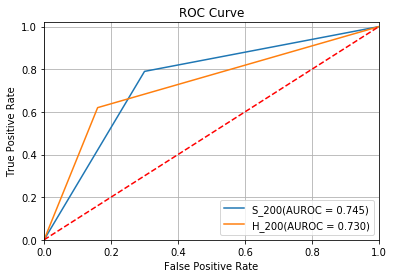

In [23]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
#y_predict_index = np.argmax(predict_result,axis = 1)
#y_test_index = np.argmax(y1,axis = 1)
#p1=predict_result[:, 1]
#print(predict_result,p1,y1)
FPR, TPR, _ = roc_curve(ya2,yp2)
AUC = auc(FPR, TPR)
print(FPR)
print(TPR)
f1,t1,_= roc_curve(ya1, yp1)
AUC2 = auc(f1, t1)
# calculate roc curve
plt.figure()
plt.plot(FPR,TPR,label='S_200(AUROC = %0.3f)' % AUC)
plt.plot(f1,t1,label='H_200(AUROC = %0.3f)' % AUC2)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.02])
plt.grid(True,'both')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.savefig('ROC.png')
plt.show()
#plt.savefig('testplot.png')
#Image.open('testplot.png').save('testplot.jpg','JPEG')

In [12]:
np.random.seed(1337)
def get_model():    
    input1 = keras.layers.Input(shape=(21,4,1))
    c1= Convolution2D(32, (3,4), padding="valid", activation="relu")(input1)
    x1= MaxPooling2D(pool_size=(19,1))(c1)
    c2= Conv2D(32, (4,4), padding="valid", activation="relu")(input1)
    x2= MaxPooling2D(pool_size=(18,1))(c2)
    c3= Conv2D(32, (5,4), padding="valid", activation="relu")(input1)
    x3= MaxPooling2D(pool_size=(17,1))(c3)
    c4= Conv2D(32, (6,4), padding="valid", activation="relu")(input1)
    x4= MaxPooling2D(pool_size=(16,1))(c4)
    c5= Conv2D(32, (7,4), padding="valid", activation="relu")(input1)
    x5= MaxPooling2D(pool_size=(15,1))(c5)
    c6= Conv2D(32, (8,4), padding="valid", activation="relu")(input1)
    x6= MaxPooling2D(pool_size=(14,1))(c6)
    c7= Conv2D(32, (9,4), padding="valid", activation="relu")(input1)
    x7= MaxPooling2D(pool_size=(13,1))(c7)
    c8= Conv2D(32, (10,4), padding="valid", activation="relu")(input1)
    x8= MaxPooling2D(pool_size=(12,1))(c8)
    c9= Conv2D(32, (11,4), padding="valid", activation="relu")(input1)
    x9= MaxPooling2D(pool_size=(11,1))(c9)
    c10= Conv2D(32, (12,4), padding="valid", activation="relu")(input1)
    x10= MaxPooling2D(pool_size=(10,1))(c10)
    added = concatenate([x1,x2,x3,x4,x5,x6,x7,x8,x9,x10])
    
    out=Flatten()(added)
    out=Dense(320, activation='relu')(out)
    out=keras.layers.Dropout(0.40)(out)
    out=Dense(2, activation='softmax')(out)
    model = keras.models.Model(inputs=[input1], outputs=out)
    x=Adam(lr=0.0001)
    model.compile(optimizer=x, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [14]:
np.random.seed(1337)
def gett_models():    
    input1 = keras.layers.Input(shape=(31,4,1))
    #c1= Convolution2D(32, (5,4), padding="valid", activation="relu")(input1)
    #x1= MaxPooling2D(pool_size=(27,1))(c1)
    c2= Conv2D(32, (6,4), padding="valid", activation="relu")(input1)
    x2= MaxPooling2D(pool_size=(26,1))(c2)
    c3= Conv2D(32, (7,4), padding="valid", activation="relu")(input1)
    x3= MaxPooling2D(pool_size=(25,1))(c3)
    c4= Conv2D(32, (8,4), padding="valid", activation="relu")(input1)
    x4= MaxPooling2D(pool_size=(24,1))(c4)
    c5= Conv2D(32, (9,4), padding="valid", activation="relu")(input1)
    x5= MaxPooling2D(pool_size=(23,1))(c5)
    c6= Conv2D(32, (10,4), padding="valid", activation="relu")(input1)
    x6= MaxPooling2D(pool_size=(22,1))(c6)
    c7= Conv2D(32, (11,4), padding="valid", activation="relu")(input1)
    x7= MaxPooling2D(pool_size=(21,1))(c7)
    c8= Conv2D(32, (12,4), padding="valid", activation="relu")(input1)
    x8= MaxPooling2D(pool_size=(20,1))(c8)
    c9= Conv2D(32, (13,4), padding="valid", activation="relu")(input1)
    x9= MaxPooling2D(pool_size=(19,1))(c9)
    c10= Conv2D(32, (14,4), padding="valid", activation="relu")(input1)
    x10= MaxPooling2D(pool_size=(18,1))(c10)
    #c11= Convolution2D(32, (15,4), padding="valid", activation="relu")(input1)
    #x11= MaxPooling2D(pool_size=(17,1))(c10)
    #c12= Convolution2D(32, (16,4), padding="valid", activation="relu")(input1)
    #x12= MaxPooling2D(pool_size=(16,1))(c11)
    #c13= Conv2D(32, (17,4), padding="valid", activation="relu")(input1)
    #x13= MaxPooling2D(pool_size=(15,1))(c13)
    #c14= Conv2D(32, (18,4), padding="valid", activation="relu")(input1)
    #x14= MaxPooling2D(pool_size=(14,1))(c14)
    added = concatenate([x2,x3,x4,x5,x6,x7,x8,x9,x10])
    
    out=Flatten()(added)
    out=Dense(320, activation='relu')(out)
    out=keras.layers.Dropout(0.50)(out)
    out=Dense(1, activation='sigmoid')(out)
    model = keras.models.Model(inputs=[input1], outputs=out)
    x=Adam(lr=0.001)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [13]:
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
import numpy
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.utils import np_utils

model = gett_models()


print(model.summary())
model.fit(x2, y2, validation_split=0.1, epochs=200,shuffle=False)
scores = model.evaluate(x3, y3, verbose=0)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 31, 4, 1)     0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 27, 1, 32)    672         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 26, 1, 32)    800         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 25, 1, 32)    928         input_1[0][0]                  

565/565 [==============================] - 0s 521us/step - loss: 0.0183 - accuracy: 0.9982 - val_loss: 1.1431 - val_accuracy: 0.6508
Epoch 62/200
565/565 [==============================] - 0s 518us/step - loss: 0.0131 - accuracy: 1.0000 - val_loss: 1.2545 - val_accuracy: 0.6667
Epoch 63/200
565/565 [==============================] - 0s 497us/step - loss: 0.0091 - accuracy: 1.0000 - val_loss: 1.3291 - val_accuracy: 0.6508
Epoch 64/200
565/565 [==============================] - 0s 515us/step - loss: 0.0067 - accuracy: 1.0000 - val_loss: 1.3587 - val_accuracy: 0.6667
Epoch 65/200
565/565 [==============================] - 0s 529us/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 1.4029 - val_accuracy: 0.6667
Epoch 66/200
565/565 [==============================] - 0s 480us/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 1.4341 - val_accuracy: 0.6667
Epoch 67/200
565/565 [==============================] - 0s 513us/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 1.4647 - val_accuracy

565/565 [==============================] - 0s 544us/step - loss: 1.4674e-04 - accuracy: 1.0000 - val_loss: 2.0713 - val_accuracy: 0.6190
Epoch 117/200
565/565 [==============================] - 0s 490us/step - loss: 1.4205e-04 - accuracy: 1.0000 - val_loss: 2.0769 - val_accuracy: 0.6190
Epoch 118/200
565/565 [==============================] - 0s 524us/step - loss: 1.3764e-04 - accuracy: 1.0000 - val_loss: 2.0830 - val_accuracy: 0.6190
Epoch 119/200
565/565 [==============================] - 0s 498us/step - loss: 1.3341e-04 - accuracy: 1.0000 - val_loss: 2.0891 - val_accuracy: 0.6190
Epoch 120/200
565/565 [==============================] - 0s 488us/step - loss: 1.2934e-04 - accuracy: 1.0000 - val_loss: 2.0949 - val_accuracy: 0.6190
Epoch 121/200
565/565 [==============================] - 0s 516us/step - loss: 1.2548e-04 - accuracy: 1.0000 - val_loss: 2.1009 - val_accuracy: 0.6190
Epoch 122/200
565/565 [==============================] - 0s 497us/step - loss: 1.2174e-04 - accuracy: 1.0000

In [15]:
model= get_model()

model.fit(x, y, validation_split=0.1, epochs=200,shuffle=False)
scores = model.evaluate(x1, y1, verbose=0)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

Train on 891 samples, validate on 99 samples
Epoch 1/200
891/891 [==============================] - 2s 3ms/step - loss: 0.9322 - accuracy: 0.4983 - val_loss: 1.1865 - val_accuracy: 0.0000e+00
Epoch 2/200
891/891 [==============================] - 0s 421us/step - loss: 0.6961 - accuracy: 0.5657 - val_loss: 0.8405 - val_accuracy: 0.0000e+00
Epoch 3/200
891/891 [==============================] - 0s 442us/step - loss: 0.7338 - accuracy: 0.4781 - val_loss: 0.7685 - val_accuracy: 0.0404
Epoch 4/200
891/891 [==============================] - 0s 477us/step - loss: 0.7434 - accuracy: 0.4265 - val_loss: 0.7669 - val_accuracy: 0.0404
Epoch 5/200
891/891 [==============================] - 0s 422us/step - loss: 0.7344 - accuracy: 0.4759 - val_loss: 0.7658 - val_accuracy: 0.0404
Epoch 6/200
891/891 [==============================] - 0s 451us/step - loss: 0.7410 - accuracy: 0.4198 - val_loss: 0.7631 - val_accuracy: 0.0505
Epoch 7/200
891/891 [==============================] - 0s 423us/step - loss: 0.

Epoch 57/200
891/891 [==============================] - 0s 429us/step - loss: 0.6726 - accuracy: 0.5735 - val_loss: 0.7789 - val_accuracy: 0.2727
Epoch 58/200
891/891 [==============================] - 0s 413us/step - loss: 0.6689 - accuracy: 0.5825 - val_loss: 0.7758 - val_accuracy: 0.3030
Epoch 59/200
891/891 [==============================] - 0s 409us/step - loss: 0.6704 - accuracy: 0.5589 - val_loss: 0.7733 - val_accuracy: 0.3131
Epoch 60/200
891/891 [==============================] - 0s 450us/step - loss: 0.6701 - accuracy: 0.5645 - val_loss: 0.7791 - val_accuracy: 0.2929
Epoch 61/200
891/891 [==============================] - 0s 413us/step - loss: 0.6656 - accuracy: 0.5892 - val_loss: 0.7778 - val_accuracy: 0.3131
Epoch 62/200
891/891 [==============================] - 0s 420us/step - loss: 0.6642 - accuracy: 0.5668 - val_loss: 0.7774 - val_accuracy: 0.3232
Epoch 63/200
891/891 [==============================] - 0s 416us/step - loss: 0.6667 - accuracy: 0.5802 - val_loss: 0.7790 -

891/891 [==============================] - 1s 780us/step - loss: 0.5879 - accuracy: 0.7003 - val_loss: 0.7756 - val_accuracy: 0.5354
Epoch 114/200
891/891 [==============================] - 1s 620us/step - loss: 0.5881 - accuracy: 0.6891 - val_loss: 0.7800 - val_accuracy: 0.5556
Epoch 115/200
891/891 [==============================] - 1s 610us/step - loss: 0.5847 - accuracy: 0.7127 - val_loss: 0.7751 - val_accuracy: 0.5758
Epoch 116/200
891/891 [==============================] - 0s 494us/step - loss: 0.5852 - accuracy: 0.7048 - val_loss: 0.7770 - val_accuracy: 0.5758
Epoch 117/200
891/891 [==============================] - 0s 499us/step - loss: 0.5792 - accuracy: 0.7205 - val_loss: 0.7783 - val_accuracy: 0.5758
Epoch 118/200
891/891 [==============================] - 1s 577us/step - loss: 0.5796 - accuracy: 0.7116 - val_loss: 0.7802 - val_accuracy: 0.5758
Epoch 119/200
891/891 [==============================] - 0s 429us/step - loss: 0.5771 - accuracy: 0.7217 - val_loss: 0.7762 - val_ac

Epoch 169/200
891/891 [==============================] - 0s 437us/step - loss: 0.4287 - accuracy: 0.8328 - val_loss: 0.8025 - val_accuracy: 0.5960
Epoch 170/200
891/891 [==============================] - 0s 429us/step - loss: 0.4274 - accuracy: 0.8204 - val_loss: 0.8119 - val_accuracy: 0.5859
Epoch 171/200
891/891 [==============================] - 0s 409us/step - loss: 0.4220 - accuracy: 0.8215 - val_loss: 0.8110 - val_accuracy: 0.5859
Epoch 172/200
891/891 [==============================] - 0s 415us/step - loss: 0.4208 - accuracy: 0.8339 - val_loss: 0.8131 - val_accuracy: 0.5859
Epoch 173/200
891/891 [==============================] - 0s 414us/step - loss: 0.4132 - accuracy: 0.8418 - val_loss: 0.8112 - val_accuracy: 0.5859
Epoch 174/200
891/891 [==============================] - 0s 444us/step - loss: 0.4157 - accuracy: 0.8316 - val_loss: 0.8129 - val_accuracy: 0.5859
Epoch 175/200
891/891 [==============================] - 0s 415us/step - loss: 0.4110 - accuracy: 0.8418 - val_loss: 0

In [24]:
#model_json = model.to_json()
#with open("uridin.json", "w") as json_file:
#    json_file.write(model_json)
# serialize weights to HDF5
#model.save_weights("uridin.h5")
print("Saved model to disk")

Saved model to disk


In [32]:
from keras.models import model_from_json
from keras.backend import manual_variable_initialization 
manual_variable_initialization(True)
import numpy
import os
json_file = open('uridin.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("uridin.h5")
print("Loaded model from disk")
print(model.summary())
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(x, y, validation_split=0.1, epochs=200,shuffle=False)
scores = model.evaluate(x1, y1, verbose=0)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

Loaded model from disk
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 21, 4, 1)     0                                            
__________________________________________________________________________________________________
conv2d_21 (Conv2D)              (None, 19, 1, 32)    416         input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_22 (Conv2D)              (None, 18, 1, 32)    544         input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_23 (Conv2D)              (None, 17, 1, 32)    672         input_3[0][0]                    
_____________________________________________________________________

Epoch 9/200
891/891 [==============================] - 0s 466us/step - loss: 0.7001 - accuracy: 0.4848 - val_loss: 0.7819 - val_accuracy: 0.0000e+00
Epoch 10/200
891/891 [==============================] - 0s 413us/step - loss: 0.6898 - accuracy: 0.5578 - val_loss: 0.7851 - val_accuracy: 0.0101
Epoch 11/200
891/891 [==============================] - 0s 372us/step - loss: 0.6630 - accuracy: 0.5903 - val_loss: 0.7320 - val_accuracy: 0.3131
Epoch 12/200
891/891 [==============================] - 0s 337us/step - loss: 0.6767 - accuracy: 0.5903 - val_loss: 0.6847 - val_accuracy: 0.6566
Epoch 13/200
891/891 [==============================] - 0s 338us/step - loss: 0.6875 - accuracy: 0.4916 - val_loss: 0.6606 - val_accuracy: 0.7374
Epoch 14/200
891/891 [==============================] - 0s 349us/step - loss: 0.6965 - accuracy: 0.4848 - val_loss: 0.6795 - val_accuracy: 0.7576
Epoch 15/200
891/891 [==============================] - 0s 334us/step - loss: 0.6538 - accuracy: 0.5746 - val_loss: 0.754

891/891 [==============================] - 0s 338us/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 3.2973 - val_accuracy: 0.5051
Epoch 121/200
891/891 [==============================] - 0s 330us/step - loss: 7.6326e-04 - accuracy: 1.0000 - val_loss: 3.9252 - val_accuracy: 0.4747
Epoch 122/200
891/891 [==============================] - 0s 340us/step - loss: 4.6892e-04 - accuracy: 1.0000 - val_loss: 3.6504 - val_accuracy: 0.5051
Epoch 123/200
891/891 [==============================] - 0s 340us/step - loss: 4.1871e-04 - accuracy: 1.0000 - val_loss: 3.7426 - val_accuracy: 0.5051
Epoch 124/200
891/891 [==============================] - 0s 334us/step - loss: 3.2388e-04 - accuracy: 1.0000 - val_loss: 3.7560 - val_accuracy: 0.5051
Epoch 125/200
891/891 [==============================] - 0s 339us/step - loss: 3.8727e-04 - accuracy: 1.0000 - val_loss: 3.8425 - val_accuracy: 0.5051
Epoch 126/200
891/891 [==============================] - 0s 342us/step - loss: 3.3587e-04 - accuracy: 1.0000 - v

In [35]:
np.random.seed(1337)
def get_models():    
    input1 = keras.layers.Input(shape=(31,4,1))
    c1= Convolution2D(32, (3,4), padding="valid", activation="relu")(input1)
    x1= MaxPooling2D(pool_size=(29,1))(c1)
    c2= Conv2D(32, (4,4), padding="valid", activation="relu")(input1)
    x2= MaxPooling2D(pool_size=(28,1))(c2)
    c3= Conv2D(32, (5,4), padding="valid", activation="relu")(input1)
    x3= MaxPooling2D(pool_size=(27,1))(c3)
    c4= Conv2D(32, (6,4), padding="valid", activation="relu")(input1)
    x4= MaxPooling2D(pool_size=(26,1))(c4)
    c5= Conv2D(32, (7,4), padding="valid", activation="relu")(input1)
    x5= MaxPooling2D(pool_size=(25,1))(c5)
    #c6= Conv2D(32, (8,4), padding="valid", activation="relu")(input1)
    #x6= MaxPooling2D(pool_size=(24,1))(c6)
    #c7= Conv2D(32, (9,4), padding="valid", activation="relu")(input1)
    #x7= MaxPooling2D(pool_size=(23,1))(c7)
    #c8= Conv2D(32, (10,4), padding="valid", activation="relu")(input1)
    #x8= MaxPooling2D(pool_size=(22,1))(c8)
    #c9= Conv2D(32, (11,4), padding="valid", activation="relu")(input1)
    #x9= MaxPooling2D(pool_size=(21,1))(c9)
    #c10= Conv2D(32, (12,4), padding="valid", activation="relu")(input1)
    #x10= MaxPooling2D(pool_size=(20,1))(c10)
    added = concatenate([x1,x2,x3,x4,x5])
    
    out=Flatten()(added)
    out=Dense(1024, activation='relu')(out)
    out=keras.layers.Dropout(0.40)(out)
    out=Dense(1, activation='softmax')(out)
    model = keras.models.Model(inputs=[input1], outputs=out)
    x=Adam(lr=0.0001)
    model.compile(optimizer=x, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [59]:
mmodel= get_models()
mmodel.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
mmodel.fit(x2, y2, validation_split=0.1, epochs=200,shuffle=False)
scores = mmodel.evaluate(x3, y3, verbose=0)
print("%s: %.2f%%" % (mmodel.metrics_names[1], scores[1]*100))

Train on 565 samples, validate on 63 samples
Epoch 1/200
565/565 [==============================] - 1s 2ms/step - loss: 0.8384 - accuracy: 0.5416 - val_loss: 1.1457 - val_accuracy: 0.0000e+00
Epoch 2/200
565/565 [==============================] - 0s 384us/step - loss: 0.6905 - accuracy: 0.5558 - val_loss: 0.9408 - val_accuracy: 0.0000e+00
Epoch 3/200
565/565 [==============================] - 0s 393us/step - loss: 0.6914 - accuracy: 0.5540 - val_loss: 0.8260 - val_accuracy: 0.0000e+00
Epoch 4/200
565/565 [==============================] - 0s 440us/step - loss: 0.7028 - accuracy: 0.5310 - val_loss: 0.7864 - val_accuracy: 0.0000e+00
Epoch 5/200
565/565 [==============================] - 0s 392us/step - loss: 0.7150 - accuracy: 0.5221 - val_loss: 0.7788 - val_accuracy: 0.0000e+00
Epoch 6/200
565/565 [==============================] - 0s 379us/step - loss: 0.7144 - accuracy: 0.4903 - val_loss: 0.7795 - val_accuracy: 0.0000e+00
Epoch 7/200
565/565 [==============================] - 0s 411us

Epoch 111/200
565/565 [==============================] - 0s 330us/step - loss: 0.6393 - accuracy: 0.6637 - val_loss: 0.7805 - val_accuracy: 0.3492
Epoch 112/200
565/565 [==============================] - 0s 360us/step - loss: 0.6373 - accuracy: 0.6673 - val_loss: 0.7801 - val_accuracy: 0.3651
Epoch 113/200
565/565 [==============================] - 0s 348us/step - loss: 0.6328 - accuracy: 0.6761 - val_loss: 0.7801 - val_accuracy: 0.3651
Epoch 114/200
565/565 [==============================] - 0s 350us/step - loss: 0.6368 - accuracy: 0.6673 - val_loss: 0.7806 - val_accuracy: 0.3651
Epoch 115/200
565/565 [==============================] - 0s 378us/step - loss: 0.6326 - accuracy: 0.6690 - val_loss: 0.7824 - val_accuracy: 0.3651
Epoch 116/200
565/565 [==============================] - 0s 360us/step - loss: 0.6327 - accuracy: 0.6708 - val_loss: 0.7786 - val_accuracy: 0.3810
Epoch 117/200
565/565 [==============================] - 0s 355us/step - loss: 0.6310 - accuracy: 0.6690 - val_loss: 0

Epoch 167/200
565/565 [==============================] - 0s 331us/step - loss: 0.5501 - accuracy: 0.7381 - val_loss: 0.7647 - val_accuracy: 0.4444
Epoch 168/200
565/565 [==============================] - 0s 367us/step - loss: 0.5430 - accuracy: 0.7469 - val_loss: 0.7648 - val_accuracy: 0.4603
Epoch 169/200
565/565 [==============================] - 0s 315us/step - loss: 0.5397 - accuracy: 0.7522 - val_loss: 0.7632 - val_accuracy: 0.4603
Epoch 170/200
565/565 [==============================] - 0s 322us/step - loss: 0.5390 - accuracy: 0.7487 - val_loss: 0.7638 - val_accuracy: 0.4603
Epoch 171/200
565/565 [==============================] - 0s 360us/step - loss: 0.5361 - accuracy: 0.7416 - val_loss: 0.7607 - val_accuracy: 0.4603
Epoch 172/200
565/565 [==============================] - 0s 318us/step - loss: 0.5298 - accuracy: 0.7611 - val_loss: 0.7616 - val_accuracy: 0.4603
Epoch 173/200
565/565 [==============================] - 0s 323us/step - loss: 0.5301 - accuracy: 0.7664 - val_loss: 0

In [85]:
model.summary()

Model: "model_27"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_32 (InputLayer)           (None, 21, 4, 1)     0                                            
__________________________________________________________________________________________________
conv2d_138 (Conv2D)             (None, 19, 1, 32)    416         input_32[0][0]                   
__________________________________________________________________________________________________
conv2d_139 (Conv2D)             (None, 18, 1, 32)    544         input_32[0][0]                   
__________________________________________________________________________________________________
conv2d_140 (Conv2D)             (None, 17, 1, 32)    672         input_32[0][0]                   
___________________________________________________________________________________________

In [34]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

acc: 52.94%


In [89]:
keras.applications.resnet.ResNet50(include_top=False, weights=None, input_tensor=None, input_shape=(21,), pooling=None, classes=1000)

AttributeError: module 'keras.applications' has no attribute 'resnet'